In [1]:
import json
import random
from tqdm import tqdm
import numpy as np

from matplotlib import pyplot as plt
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

import torch

from pylab import rcParams
rcParams['figure.figsize'] = 15, 15

# Что делать?
Где есть пометка # CODE писать код

[Полезный туториал](http://jalammar.github.io/illustrated-word2vec/)

# Загружаем данные
Они уже обработанные и токенизированные. Процесс можно посмотреть в тетрадке 1.1 Processing corpus

In [3]:
with open('/Users/ciwwwnd/Downloads/processed_corpus.json') as f:
    corpus = json.load(f)

In [4]:
len(corpus)

100000

In [5]:
for text in corpus[:5]:
    print(' '.join(text))

второй UNK год окончательно разочаровать решить податься альфабанк
вернуть денежный средство лицевой счёт либо зачесть счёт погашение кредит
притом ситуация решиться участие течение сутки заявить
мой ##число летний жизнь это самый неповоротливый работник банк который видеть
везде написать вклад принимать очередь это


# CBOW

In [6]:
sample_text = corpus[1]

In [7]:
' '.join(sample_text)

'вернуть денежный средство лицевой счёт либо зачесть счёт погашение кредит'

# Реализуйте разделение предложения на примеры методом CBOW

In [9]:
def cbow_split(tokens, window, pad_token='PAD'):
    splits = []
    for word in enumerate(tokens):
        left_context = []
        right_context = []
        for i in range(window):
            if (word[0] - i) > 0:
                left_token = tokens[word[0] - i - 1]
            else:
                left_token = pad_token
            try:
                right_token = tokens[word[0] + i + 1]
            except:
                right_token = pad_token
            left_context.append(left_token)
            right_context.append(right_token)
        splits.append((left_context[::-1], word[1], right_context))
    return splits

In [10]:
splits = cbow_split(sample_text, window=2)

In [11]:
for sample in splits:
    print('Левый контекст:', sample[0])
    print('Центральное слово:', sample[1])
    print('Правый контекст:', sample[2], end='\n\n')

Левый контекст: ['PAD', 'PAD']
Центральное слово: вернуть
Правый контекст: ['денежный', 'средство']

Левый контекст: ['PAD', 'вернуть']
Центральное слово: денежный
Правый контекст: ['средство', 'лицевой']

Левый контекст: ['вернуть', 'денежный']
Центральное слово: средство
Правый контекст: ['лицевой', 'счёт']

Левый контекст: ['денежный', 'средство']
Центральное слово: лицевой
Правый контекст: ['счёт', 'либо']

Левый контекст: ['средство', 'лицевой']
Центральное слово: счёт
Правый контекст: ['либо', 'зачесть']

Левый контекст: ['лицевой', 'счёт']
Центральное слово: либо
Правый контекст: ['зачесть', 'счёт']

Левый контекст: ['счёт', 'либо']
Центральное слово: зачесть
Правый контекст: ['счёт', 'погашение']

Левый контекст: ['либо', 'зачесть']
Центральное слово: счёт
Правый контекст: ['погашение', 'кредит']

Левый контекст: ['зачесть', 'счёт']
Центральное слово: погашение
Правый контекст: ['кредит', 'PAD']

Левый контекст: ['счёт', 'погашение']
Центральное слово: кредит
Правый контекст: [

In [12]:
splits

[(['PAD', 'PAD'], 'вернуть', ['денежный', 'средство']),
 (['PAD', 'вернуть'], 'денежный', ['средство', 'лицевой']),
 (['вернуть', 'денежный'], 'средство', ['лицевой', 'счёт']),
 (['денежный', 'средство'], 'лицевой', ['счёт', 'либо']),
 (['средство', 'лицевой'], 'счёт', ['либо', 'зачесть']),
 (['лицевой', 'счёт'], 'либо', ['зачесть', 'счёт']),
 (['счёт', 'либо'], 'зачесть', ['счёт', 'погашение']),
 (['либо', 'зачесть'], 'счёт', ['погашение', 'кредит']),
 (['зачесть', 'счёт'], 'погашение', ['кредит', 'PAD']),
 (['счёт', 'погашение'], 'кредит', ['PAD', 'PAD'])]

# Expected

```python
[(['PAD', 'PAD'], 'вопрос', ['почему', 'например']),
 (['PAD', 'вопрос'], 'почему', ['например', 'китайский']),
 (['вопрос', 'почему'], 'например', ['китайский', 'японский']),
 (['почему', 'например'], 'китайский', ['японский', 'UNK']),
 (['например', 'китайский'], 'японский', ['UNK', 'PAD']),
 (['китайский', 'японский'], 'UNK', ['PAD', 'PAD'])]
```

In [13]:
cbow_split(sample_text, window=3)

[(['PAD', 'PAD', 'PAD'], 'вернуть', ['денежный', 'средство', 'лицевой']),
 (['PAD', 'PAD', 'вернуть'], 'денежный', ['средство', 'лицевой', 'счёт']),
 (['PAD', 'вернуть', 'денежный'], 'средство', ['лицевой', 'счёт', 'либо']),
 (['вернуть', 'денежный', 'средство'], 'лицевой', ['счёт', 'либо', 'зачесть']),
 (['денежный', 'средство', 'лицевой'], 'счёт', ['либо', 'зачесть', 'счёт']),
 (['средство', 'лицевой', 'счёт'], 'либо', ['зачесть', 'счёт', 'погашение']),
 (['лицевой', 'счёт', 'либо'], 'зачесть', ['счёт', 'погашение', 'кредит']),
 (['счёт', 'либо', 'зачесть'], 'счёт', ['погашение', 'кредит', 'PAD']),
 (['либо', 'зачесть', 'счёт'], 'погашение', ['кредит', 'PAD', 'PAD']),
 (['зачесть', 'счёт', 'погашение'], 'кредит', ['PAD', 'PAD', 'PAD'])]

# Expected

```python
[(['PAD', 'PAD', 'PAD'], 'вопрос', ['почему', 'например', 'китайский']),
 (['PAD', 'PAD', 'вопрос'], 'почему', ['например', 'китайский', 'японский']),
 (['PAD', 'вопрос', 'почему'], 'например', ['китайский', 'японский', 'UNK']),
 (['вопрос', 'почему', 'например'], 'китайский', ['японский', 'UNK', 'PAD']),
 (['почему', 'например', 'китайский'], 'японский', ['UNK', 'PAD', 'PAD']),
 (['например', 'китайский', 'японский'], 'UNK', ['PAD', 'PAD', 'PAD'])]
```

# Skipgram

In [14]:
' '.join(sample_text)

'вернуть денежный средство лицевой счёт либо зачесть счёт погашение кредит'

# Реализуйте разделение предложения на примеры методом Skipgram

In [15]:
def skipgram_split(tokens, window):
    splits = []
    for word in enumerate(tokens):
        for i in range(window):
            if (word[0] - i) > 0:
                left_token = tokens[word[0] - i - 1]
                splits.append((left_token, word[1]))
            try:
                right_token = tokens[word[0] + i + 1]
                splits.append((right_token, word[1]))
            except:
                pass
    return splits

In [16]:
splits = skipgram_split(sample_text, window=2)

In [17]:
for sample in splits:
    print('Контекст:', sample[0])
    print('Центральное слово:', sample[1], end='\n\n')

Контекст: денежный
Центральное слово: вернуть

Контекст: средство
Центральное слово: вернуть

Контекст: вернуть
Центральное слово: денежный

Контекст: средство
Центральное слово: денежный

Контекст: лицевой
Центральное слово: денежный

Контекст: денежный
Центральное слово: средство

Контекст: лицевой
Центральное слово: средство

Контекст: вернуть
Центральное слово: средство

Контекст: счёт
Центральное слово: средство

Контекст: средство
Центральное слово: лицевой

Контекст: счёт
Центральное слово: лицевой

Контекст: денежный
Центральное слово: лицевой

Контекст: либо
Центральное слово: лицевой

Контекст: лицевой
Центральное слово: счёт

Контекст: либо
Центральное слово: счёт

Контекст: средство
Центральное слово: счёт

Контекст: зачесть
Центральное слово: счёт

Контекст: счёт
Центральное слово: либо

Контекст: зачесть
Центральное слово: либо

Контекст: лицевой
Центральное слово: либо

Контекст: счёт
Центральное слово: либо

Контекст: либо
Центральное слово: зачесть

Контекст: счёт
Цент

In [18]:
skipgram_split(sample_text, window=2)

[('денежный', 'вернуть'),
 ('средство', 'вернуть'),
 ('вернуть', 'денежный'),
 ('средство', 'денежный'),
 ('лицевой', 'денежный'),
 ('денежный', 'средство'),
 ('лицевой', 'средство'),
 ('вернуть', 'средство'),
 ('счёт', 'средство'),
 ('средство', 'лицевой'),
 ('счёт', 'лицевой'),
 ('денежный', 'лицевой'),
 ('либо', 'лицевой'),
 ('лицевой', 'счёт'),
 ('либо', 'счёт'),
 ('средство', 'счёт'),
 ('зачесть', 'счёт'),
 ('счёт', 'либо'),
 ('зачесть', 'либо'),
 ('лицевой', 'либо'),
 ('счёт', 'либо'),
 ('либо', 'зачесть'),
 ('счёт', 'зачесть'),
 ('счёт', 'зачесть'),
 ('погашение', 'зачесть'),
 ('зачесть', 'счёт'),
 ('погашение', 'счёт'),
 ('либо', 'счёт'),
 ('кредит', 'счёт'),
 ('счёт', 'погашение'),
 ('кредит', 'погашение'),
 ('зачесть', 'погашение'),
 ('погашение', 'кредит'),
 ('счёт', 'кредит')]

# Expected

```python
[('почему', 'вопрос'),
 ('например', 'вопрос'),
 ('вопрос', 'почему'),
 ('например', 'почему'),
 ('китайский', 'почему'),
 ('вопрос', 'например'),
 ('почему', 'например'),
 ('китайский', 'например'),
 ('японский', 'например'),
 ('почему', 'китайский'),
 ('например', 'китайский'),
 ('японский', 'китайский'),
 ('UNK', 'китайский'),
 ('например', 'японский'),
 ('китайский', 'японский'),
 ('UNK', 'японский'),
 ('китайский', 'UNK'),
 ('японский', 'UNK')]
```

In [19]:
skipgram_split(sample_text, window=3)

[('денежный', 'вернуть'),
 ('средство', 'вернуть'),
 ('лицевой', 'вернуть'),
 ('вернуть', 'денежный'),
 ('средство', 'денежный'),
 ('лицевой', 'денежный'),
 ('счёт', 'денежный'),
 ('денежный', 'средство'),
 ('лицевой', 'средство'),
 ('вернуть', 'средство'),
 ('счёт', 'средство'),
 ('либо', 'средство'),
 ('средство', 'лицевой'),
 ('счёт', 'лицевой'),
 ('денежный', 'лицевой'),
 ('либо', 'лицевой'),
 ('вернуть', 'лицевой'),
 ('зачесть', 'лицевой'),
 ('лицевой', 'счёт'),
 ('либо', 'счёт'),
 ('средство', 'счёт'),
 ('зачесть', 'счёт'),
 ('денежный', 'счёт'),
 ('счёт', 'счёт'),
 ('счёт', 'либо'),
 ('зачесть', 'либо'),
 ('лицевой', 'либо'),
 ('счёт', 'либо'),
 ('средство', 'либо'),
 ('погашение', 'либо'),
 ('либо', 'зачесть'),
 ('счёт', 'зачесть'),
 ('счёт', 'зачесть'),
 ('погашение', 'зачесть'),
 ('лицевой', 'зачесть'),
 ('кредит', 'зачесть'),
 ('зачесть', 'счёт'),
 ('погашение', 'счёт'),
 ('либо', 'счёт'),
 ('кредит', 'счёт'),
 ('счёт', 'счёт'),
 ('счёт', 'погашение'),
 ('кредит', 'погашение

# Expected

```python
[('почему', 'вопрос'),
 ('например', 'вопрос'),
 ('китайский', 'вопрос'),
 ('вопрос', 'почему'),
 ('например', 'почему'),
 ('китайский', 'почему'),
 ('японский', 'почему'),
 ('вопрос', 'например'),
 ('почему', 'например'),
 ('китайский', 'например'),
 ('японский', 'например'),
 ('UNK', 'например'),
 ('вопрос', 'китайский'),
 ('почему', 'китайский'),
 ('например', 'китайский'),
 ('японский', 'китайский'),
 ('UNK', 'китайский'),
 ('почему', 'японский'),
 ('например', 'японский'),
 ('китайский', 'японский'),
 ('UNK', 'японский'),
 ('например', 'UNK'),
 ('китайский', 'UNK'),
 ('японский', 'UNK')]
```

In [20]:
word2index = {}

for text in corpus:
    for token in text:
        if token not in word2index:
            word2index[token] = len(word2index)

In [21]:
len(word2index)

13076

In [22]:
word2index['UNK']

1

In [23]:
[word2index[tok] if tok in word2index else word2index['UNK'] for tok in 'мама мыть рама'.split()]

[1282, 8436, 1]

# Torch Dataset
В торче есть очень удобная читалка данных

In [24]:
from torch.utils.data import Dataset, DataLoader

In [25]:
# игрушечный датасет
# 121535 примера, 4 фичи, 3 класса
some_data_x = np.random.rand(121535, 4)
some_data_y = np.random.randint(3, size=(121535,))

In [26]:
# соверешенно игрушечный, просто цифры
some_data_x[:10]

array([[0.38782128, 0.87901732, 0.67176463, 0.78380583],
       [0.24825896, 0.06386943, 0.5649162 , 0.45052757],
       [0.08394956, 0.8703288 , 0.84724285, 0.8952192 ],
       [0.1959943 , 0.1377895 , 0.04770457, 0.60745864],
       [0.21194595, 0.81008019, 0.89903366, 0.19496434],
       [0.98425301, 0.18404406, 0.44135586, 0.77534898],
       [0.56563543, 0.31383932, 0.39614782, 0.31099468],
       [0.87551942, 0.53624523, 0.22379614, 0.67088456],
       [0.25366069, 0.88096026, 0.71499049, 0.2291352 ],
       [0.15190432, 0.73249027, 0.78723538, 0.08660302]])

In [27]:
some_data_y

array([2, 2, 2, ..., 1, 1, 2])

In [28]:
class ToyDataset(Dataset):
    
    def __init__(self, data_x, data_y):
        
        super().__init__()
        
        self.data_x = data_x
        self.data_y = data_y
        
    def __len__(self):
        
        # Нужно обязательно определить эту функцию
        # Должна возвращать размер датасета
        
        return len(self.data_x)
    
    def __getitem__(self, idx):
        
        # Еще нужно определить этот метод
        # То есть как мы будем доставать наши данные по индексу
        
        return self.data_x[idx], self.data_y[idx]

In [29]:
some_dataset = ToyDataset(some_data_x, some_data_y)

In [30]:
some_dataset[5], some_dataset[467]

((array([0.98425301, 0.18404406, 0.44135586, 0.77534898]), 2),
 (array([0.44759689, 0.31553694, 0.75184814, 0.55477144]), 2))

In [31]:
some_loader = DataLoader(some_dataset, batch_size=16, shuffle=True)

In [32]:
for x, y in some_loader:
    break
    
len(x), x

(16,
 tensor([[0.0813, 0.3386, 0.8245, 0.8279],
         [0.3994, 0.9268, 0.8118, 0.0915],
         [0.6238, 0.7345, 0.7006, 0.8016],
         [0.8018, 0.8082, 0.4886, 0.4596],
         [0.6082, 0.6199, 0.8891, 0.2941],
         [0.5507, 0.7216, 0.7237, 0.0394],
         [0.7235, 0.7343, 0.6238, 0.3718],
         [0.2399, 0.9476, 0.0867, 0.8607],
         [0.6043, 0.4431, 0.9287, 0.2440],
         [0.8235, 0.3797, 0.9837, 0.4413],
         [0.0403, 0.9415, 0.6110, 0.7589],
         [0.2478, 0.0361, 0.3330, 0.3666],
         [0.1685, 0.7417, 0.1182, 0.4956],
         [0.2428, 0.3839, 0.7830, 0.2807],
         [0.9915, 0.6693, 0.6688, 0.1323],
         [0.6751, 0.4576, 0.0309, 0.4918]], dtype=torch.float64))

In [33]:
for x, y in some_loader:
    pass

len(x)

15

In [34]:
# почему 13?
# потому что количество наших данных нацело не делится на 16
# и поэтому последний батч меньше 16-ти
len(some_dataset) % 16

15

# А зачем?

In [35]:
class ToyDataset(Dataset):
    
    def __init__(self, data_x, data_y):
        
        super().__init__()
        
        self.data_x = data_x
        self.data_y = data_y
        
    def __len__(self):
        
        # Нужно обязательно определить эту функцию
        # Должна возвращать размер датасета
        
        return len(self.data_x)
    
    @staticmethod
    def add_pow_features(x, n=2):
        
        return np.concatenate([x, x ** n]) 
    
    @staticmethod
    def add_log_features(x):
        
        return np.concatenate([x, np.log(x)]) 
    
    def __getitem__(self, idx):
        
        # Еще нужно определить этот метод
        # То есть как мы будем доставать наши данные по индексу
        
        x = self.data_x[idx]
        
        # внутри датасета мы можем делать все что угодно с нашими данными
        # например выше определим функции, которые добавляют степенные фичи
        x = self.add_pow_features(x, n=2)
        x = self.add_pow_features(x, n=3)
        # и еще возьмем логарифмические фичи
        x = self.add_log_features(x)
        
        y = self.data_y[idx]
        
        return x, y

In [36]:
toy_dataset = ToyDataset(some_data_x, some_data_y)

In [37]:
toy_loader = DataLoader(dataset=toy_dataset, batch_size=128)

In [38]:
for x, y in toy_loader:
    break

In [39]:
x.shape

torch.Size([128, 32])

In [40]:
# заметим, что мы сразу получаем торчовый формат данных
x

tensor([[  0.3878,   0.8790,   0.6718,  ...,  -0.7737,  -2.3871,  -1.4616],
        [  0.2483,   0.0639,   0.5649,  ..., -16.5055,  -3.4265,  -4.7840],
        [  0.0839,   0.8703,   0.8472,  ...,  -0.8333,  -0.9946,  -0.6641],
        ...,
        [  0.4419,   0.9237,   0.3773,  ...,  -0.4760,  -5.8476,  -5.8633],
        [  0.5112,   0.3638,   0.8430,  ...,  -6.0669,  -1.0250,  -0.6446],
        [  0.1527,   0.4748,   0.2197,  ...,  -4.4692,  -9.0923,  -4.6738]],
       dtype=torch.float64)

In [41]:
y

tensor([2, 2, 2, 2, 0, 2, 0, 0, 1, 2, 2, 0, 0, 0, 0, 2, 0, 0, 1, 2, 1, 2, 0, 0,
        2, 1, 0, 1, 2, 0, 0, 0, 2, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 2, 0, 2, 1, 2,
        2, 2, 1, 0, 1, 1, 0, 1, 1, 1, 2, 2, 2, 1, 1, 0, 2, 0, 0, 1, 2, 0, 2, 0,
        1, 0, 0, 1, 1, 0, 0, 1, 1, 2, 0, 1, 0, 0, 1, 2, 2, 0, 2, 0, 1, 2, 2, 1,
        0, 1, 2, 0, 1, 0, 0, 2, 0, 0, 0, 2, 2, 1, 1, 2, 1, 0, 0, 0, 0, 1, 2, 1,
        1, 1, 1, 2, 1, 2, 2, 1])

# Если вы ничего здесь не понимаете, то вернитесь в конец первой домашки, там все объясняется

In [42]:
model = torch.nn.Sequential(torch.nn.Linear(32, 16),
                            torch.nn.ReLU(),
                            torch.nn.Linear(16, 8),
                            torch.nn.ReLU(),
                            torch.nn.Linear(8, 3))

criterion = torch.nn.CrossEntropyLoss()

In [43]:
with torch.no_grad():

    prediction = model(x.float())

    loss = criterion(prediction, y)
    
loss.item()

1.126878023147583

# Боевые датасеты

In [44]:
class CBOWDataset(Dataset):

    def __init__(self,
                 corpus,
                 word2index,
                 window=2,
                 unk_token='UNK',
                 pad_token='PAD',
                 collect_verbose=True):

        self.corpus = corpus
        self.word2index = word2index
        self.index2word = {value: key for key, value in self.word2index.items()}
        self.window = window

        self.unk_token = unk_token
        self.unk_index = self.word2index[self.unk_token]

        self.pad_token = pad_token
        self.pad_index = len(self.word2index)

        self.collect_verbose = collect_verbose

        self.data = []

        self.collect_data()

    def __len__(self):

        return len(self.data)

    def _split_function(self, tokenized_text):

        splits = []

        for n in range(len(tokenized_text)):
            left_context = tokenized_text[np.maximum(n - self.window, 0):n]
            left_context = ([self.pad_index] * (self.window - len(left_context))) + left_context

            central_word = tokenized_text[n]

            right_context = tokenized_text[n + 1:n + self.window + 1]
            right_context = right_context + ([self.pad_index] * (self.window - len(right_context)))

            splits.append((left_context + right_context, central_word))

        return splits

    def indexing(self, tokenized_text):

        return [self.word2index[token] if token in self.word2index else self.unk_index for token in tokenized_text]

    def collect_data(self):

        corpus = tqdm(self.corpus, disable=not self.collect_verbose)

        for tokenized_text in corpus:
            indexed_text = self.indexing(tokenized_text)
            cbow_examples = self._split_function(indexed_text)

            self.data.extend(cbow_examples)

    def __getitem__(self, idx):

        context, central_word = self.data[idx]

        context = torch.Tensor(context).long()

        return context, central_word

# Мы будем учить модель Skipgram
Реализуйте читалку данных

In [50]:
class SkipgramDataset(Dataset):

    def __init__(self,
                 corpus,
                 word2index,
                 window=2,
                 unk_token='UNK',
                 collect_verbose=True):

        self.corpus = corpus
        self.word2index = word2index
        self.index2word = {value: key for key, value in self.word2index.items()}
        self.window = window
        self.unk_token = unk_token
        self.unk_index = self.word2index[self.unk_token]
        self.collect_verbose = collect_verbose
        self.data = []
        self.collect_data()

    def __len__(self):

        return len(self.data)

    def _split_function(self, tokens):
        splits = []

        for word in enumerate(tokens):
            for i in range(self.window):
                if (word[0] - i) > 0:
                    left_token = tokens[word[0] - i - 1]
                    splits.append((left_token, word[1]))
                try:
                    right_token = tokens[word[0] + i + 1]
                    splits.append((right_token, word[1]))
                except:
                    pass
        return splits

    def indexing(self, tokenized_text):

        return [self.word2index[token] if token in self.word2index else self.unk_index for token in tokenized_text]

    def collect_data(self):

        corpus = tqdm(self.corpus, disable=not self.collect_verbose)

        for tokenized_text in corpus:
            indexed_text = self.indexing(tokenized_text)
            skipgram_examples = self._split_function(indexed_text)

            self.data.extend(skipgram_examples)

    def __getitem__(self, idx):
        
        context, central_word = self.data[idx]

        return context, central_word

In [45]:
# можете положить SkipgramDataset в отдельный файлик, например word2vec_utils и относительным импортом достать его 
#from .word2vec_utils import SkipgramDataset

In [51]:
dataset = SkipgramDataset(corpus, word2index)



  0%|                                                                                            | 0/100000 [00:00<?, ?it/s]

  7%|█████▏                                                                        | 6593/100000 [00:00<00:01, 65917.96it/s]

 15%|███████████▊                                                                 | 15409/100000 [00:00<00:01, 71313.13it/s]

 24%|██████████████████▊                                                          | 24498/100000 [00:00<00:00, 76239.12it/s]

 33%|█████████████████████████▋                                                   | 33343/100000 [00:00<00:00, 79531.57it/s]

 42%|████████████████████████████████▎                                            | 41978/100000 [00:00<00:00, 81460.16it/s]

 51%|██████████████████████████████████████▉                                      | 50553/100000 [00:00<00:00, 82700.18it/s]

 58%|████████████████████████████████████████████▊                                | 58142/100000 [00:00<00:00, 80513

In [52]:
BATCH_SIZE = 512

In [53]:
dataset_loader = DataLoader(dataset, shuffle=True, batch_size=BATCH_SIZE)

In [54]:
for x, y in dataset_loader:
    break

In [55]:
x[:5]

tensor([832,  48, 501,  68, 713])

In [56]:
y[:5]

tensor([  25,    5,   73, 1200,   48])

In [57]:
x.shape, y.shape

(torch.Size([512]), torch.Size([512]))

In [58]:
class CBOW(torch.nn.Module):
    
    def __init__(self, vocab_size, embedding_dim, pad_index):
        
        super().__init__()
        
        if pad_index > 0:
            vocab_size += 1
        
        self.in_embedding = torch.nn.Embedding(num_embeddings=vocab_size, 
                                               embedding_dim=embedding_dim,
                                               padding_idx=pad_index)
        
        self.out_embedding = torch.nn.Linear(in_features=embedding_dim,
                                             out_features=vocab_size, bias=False)
        
    def forward(self, x):
        
        x = self.in_embedding(x).sum(dim=-2)
        x = self.out_embedding(x)
        
        return x

# Мы будем учить модель Skipgram
Реализуйте ее

In [59]:
# CODE
class SkipGram(torch.nn.Module):
    
    def __init__(self, vocab_size, embedding_dim):
        
        super().__init__()
        
        self.in_embedding = torch.nn.Embedding(num_embeddings=vocab_size, 
                                               embedding_dim=embedding_dim)
        
        self.out_embedding = torch.nn.Linear(in_features=embedding_dim,
                                             out_features=vocab_size, bias=False)
        
    def forward(self, x):
        
        x = self.in_embedding(x)
        x = self.out_embedding(x)
        
        return x

In [ ]:
#from word2vec_utils import SkipGram

In [60]:
# размерность эмбеддинга
# маленькая, чтобы мы могли недолго поучить ворд2век и увидеть результаты
EMBEDDING_DIM = 20

In [61]:
model = SkipGram(vocab_size=len(word2index), embedding_dim=EMBEDDING_DIM)

In [62]:
with torch.no_grad():
    pred = model(x)

pred.shape

torch.Size([512, 13076])

In [63]:
optimizer = torch.optim.Adam(params=model.parameters(), lr=0.0001)

# aka loss function
criterion = torch.nn.CrossEntropyLoss()

# Допишите обучалку

In [66]:
epochs = 3

losses = []

for n_epoch in range(epochs):

    try:

        progress_bar = tqdm(total=len(dataset_loader.dataset), desc='Epoch {}'.format(n_epoch + 1))

        for X_train, y_train in dataset_loader:

            y_pred = model(X_train)
            loss = criterion(y_pred, y_train)
            loss.backward()
            optimizer.step()
            
            
            losses.append(loss.item())
            
            progress_bar.set_postfix(loss=np.mean(losses[-100:]))

            progress_bar.update(X_train.shape[0])

        progress_bar.close()

    except KeyboardInterrupt:

        progress_bar.close()
        break




Epoch 1:   0%|                                                                                  | 0/2983124 [00:00<?, ?it/s]


Epoch 1:   0%|                                                                       | 0/2983124 [00:00<?, ?it/s, loss=9.62]


Epoch 1:   0%|                                                           | 512/2983124 [00:00<22:51, 2174.37it/s, loss=9.62]


Epoch 1:   0%|                                                           | 512/2983124 [00:00<22:51, 2174.37it/s, loss=9.61]


Epoch 1:   0%|                                                          | 1024/2983124 [00:00<22:51, 2174.37it/s, loss=9.59]


Epoch 1:   0%|                                                          | 1536/2983124 [00:00<18:24, 2700.38it/s, loss=9.59]


Epoch 1:   0%|                                                          | 1536/2983124 [00:00<18:24, 2700.38it/s, loss=9.59]


Epoch 1:   0%|                                                           | 2048/2983124 [00:00<18:23, 2700.3

Epoch 1:   1%|▍                                                         | 19968/2983124 [00:03<08:22, 5896.38it/s, loss=9.6]


Epoch 1:   1%|▍                                                         | 20480/2983124 [00:03<08:22, 5896.38it/s, loss=9.6]


Epoch 1:   1%|▍                                                         | 20992/2983124 [00:03<08:14, 5995.96it/s, loss=9.6]


Epoch 1:   1%|▍                                                         | 20992/2983124 [00:03<08:14, 5995.96it/s, loss=9.6]


Epoch 1:   1%|▍                                                         | 21504/2983124 [00:03<08:13, 5995.96it/s, loss=9.6]


Epoch 1:   1%|▍                                                         | 22016/2983124 [00:03<08:11, 6020.63it/s, loss=9.6]


Epoch 1:   1%|▍                                                         | 22016/2983124 [00:03<08:11, 6020.63it/s, loss=9.6]


Epoch 1:   1%|▍                                                         | 22528/2983124 [00:04<08:11, 6020.63it

Epoch 1:   1%|▊                                                         | 40448/2983124 [00:06<07:55, 6193.18it/s, loss=9.6]


Epoch 1:   1%|▊                                                         | 40960/2983124 [00:07<07:55, 6193.18it/s, loss=9.6]


Epoch 1:   1%|▊                                                         | 41472/2983124 [00:07<07:53, 6218.79it/s, loss=9.6]


Epoch 1:   1%|▊                                                         | 41472/2983124 [00:07<07:53, 6218.79it/s, loss=9.6]


Epoch 1:   1%|▊                                                         | 41984/2983124 [00:07<07:52, 6218.79it/s, loss=9.6]


Epoch 1:   1%|▊                                                         | 42496/2983124 [00:07<07:52, 6221.29it/s, loss=9.6]


Epoch 1:   1%|▊                                                         | 42496/2983124 [00:07<07:52, 6221.29it/s, loss=9.6]


Epoch 1:   1%|▊                                                         | 43008/2983124 [00:07<07:52, 6221.29it

Epoch 1:   2%|█▏                                                       | 60928/2983124 [00:10<07:54, 6159.90it/s, loss=9.59]


Epoch 1:   2%|█▏                                                       | 61440/2983124 [00:10<07:54, 6159.90it/s, loss=9.59]


Epoch 1:   2%|█▏                                                       | 61952/2983124 [00:10<07:55, 6147.76it/s, loss=9.59]


Epoch 1:   2%|█▏                                                       | 61952/2983124 [00:10<07:55, 6147.76it/s, loss=9.59]


Epoch 1:   2%|█▏                                                       | 62464/2983124 [00:10<07:55, 6147.76it/s, loss=9.59]


Epoch 1:   2%|█▏                                                       | 62976/2983124 [00:10<07:55, 6139.06it/s, loss=9.59]


Epoch 1:   2%|█▏                                                       | 62976/2983124 [00:10<07:55, 6139.06it/s, loss=9.58]


Epoch 1:   2%|█▏                                                       | 63488/2983124 [00:10<07:55, 6139.06it/

Epoch 1:   3%|█▌                                                       | 81408/2983124 [00:13<07:48, 6192.73it/s, loss=9.57]


Epoch 1:   3%|█▌                                                       | 81920/2983124 [00:13<07:48, 6192.73it/s, loss=9.57]


Epoch 1:   3%|█▌                                                       | 82432/2983124 [00:13<07:46, 6217.92it/s, loss=9.57]


Epoch 1:   3%|█▌                                                       | 82432/2983124 [00:13<07:46, 6217.92it/s, loss=9.57]


Epoch 1:   3%|█▌                                                       | 82944/2983124 [00:13<07:46, 6217.92it/s, loss=9.57]


Epoch 1:   3%|█▌                                                       | 83456/2983124 [00:13<07:44, 6237.83it/s, loss=9.57]


Epoch 1:   3%|█▌                                                       | 83456/2983124 [00:13<07:44, 6237.83it/s, loss=9.57]


Epoch 1:   3%|█▌                                                       | 83968/2983124 [00:13<07:44, 6237.83it/

Epoch 1:   3%|█▉                                                      | 101888/2983124 [00:16<07:59, 6004.08it/s, loss=9.55]


Epoch 1:   3%|█▉                                                      | 102400/2983124 [00:16<07:59, 6004.08it/s, loss=9.55]


Epoch 1:   3%|█▉                                                      | 102912/2983124 [00:16<07:59, 6002.95it/s, loss=9.55]


Epoch 1:   3%|█▉                                                      | 102912/2983124 [00:16<07:59, 6002.95it/s, loss=9.55]


Epoch 1:   3%|█▉                                                      | 103424/2983124 [00:17<07:59, 6002.95it/s, loss=9.55]


Epoch 1:   3%|█▉                                                      | 103936/2983124 [00:17<08:01, 5981.61it/s, loss=9.55]


Epoch 1:   3%|█▉                                                      | 103936/2983124 [00:17<08:01, 5981.61it/s, loss=9.55]


Epoch 1:   4%|█▉                                                      | 104448/2983124 [00:17<08:01, 5981.61it/

Epoch 1:   4%|██▎                                                     | 122368/2983124 [00:20<07:31, 6333.48it/s, loss=9.53]


Epoch 1:   4%|██▎                                                     | 122880/2983124 [00:20<07:31, 6333.48it/s, loss=9.53]


Epoch 1:   4%|██▎                                                     | 123392/2983124 [00:20<07:32, 6325.76it/s, loss=9.53]


Epoch 1:   4%|██▎                                                     | 123392/2983124 [00:20<07:32, 6325.76it/s, loss=9.53]


Epoch 1:   4%|██▎                                                     | 123904/2983124 [00:20<07:31, 6325.76it/s, loss=9.53]


Epoch 1:   4%|██▎                                                     | 124416/2983124 [00:20<07:30, 6350.14it/s, loss=9.53]


Epoch 1:   4%|██▎                                                     | 124416/2983124 [00:20<07:30, 6350.14it/s, loss=9.53]


Epoch 1:   4%|██▎                                                     | 124928/2983124 [00:20<07:30, 6350.14it/

Epoch 1:   5%|██▋                                                     | 142848/2983124 [00:23<07:42, 6147.30it/s, loss=9.52]


Epoch 1:   5%|██▋                                                     | 143360/2983124 [00:23<07:41, 6147.30it/s, loss=9.52]


Epoch 1:   5%|██▋                                                     | 143872/2983124 [00:23<07:40, 6167.18it/s, loss=9.52]


Epoch 1:   5%|██▋                                                     | 143872/2983124 [00:23<07:40, 6167.18it/s, loss=9.52]


Epoch 1:   5%|██▋                                                     | 144384/2983124 [00:23<07:40, 6167.18it/s, loss=9.52]


Epoch 1:   5%|██▋                                                     | 144896/2983124 [00:23<07:40, 6161.74it/s, loss=9.52]


Epoch 1:   5%|██▋                                                     | 144896/2983124 [00:23<07:40, 6161.74it/s, loss=9.51]


Epoch 1:   5%|██▋                                                     | 145408/2983124 [00:23<07:40, 6161.74it/

Epoch 1:   5%|███                                                      | 163328/2983124 [00:26<07:50, 5997.53it/s, loss=9.5]


Epoch 1:   5%|███▏                                                     | 163840/2983124 [00:26<07:50, 5997.53it/s, loss=9.5]


Epoch 1:   6%|███▏                                                     | 164352/2983124 [00:26<07:51, 5972.72it/s, loss=9.5]


Epoch 1:   6%|███▏                                                     | 164352/2983124 [00:27<07:51, 5972.72it/s, loss=9.5]


Epoch 1:   6%|███▏                                                     | 164864/2983124 [00:27<07:51, 5972.72it/s, loss=9.5]


Epoch 1:   6%|███▏                                                     | 165376/2983124 [00:27<07:46, 6037.12it/s, loss=9.5]


Epoch 1:   6%|███▏                                                     | 165376/2983124 [00:27<07:46, 6037.12it/s, loss=9.5]


Epoch 1:   6%|███▏                                                     | 165888/2983124 [00:27<07:46, 6037.12it

Epoch 1:   6%|███▍                                                    | 183808/2983124 [00:30<07:38, 6105.84it/s, loss=9.48]


Epoch 1:   6%|███▍                                                    | 184320/2983124 [00:30<07:38, 6105.84it/s, loss=9.48]


Epoch 1:   6%|███▍                                                    | 184832/2983124 [00:30<07:41, 6066.97it/s, loss=9.48]


Epoch 1:   6%|███▍                                                    | 184832/2983124 [00:30<07:41, 6066.97it/s, loss=9.48]


Epoch 1:   6%|███▍                                                    | 185344/2983124 [00:30<07:41, 6066.97it/s, loss=9.48]


Epoch 1:   6%|███▍                                                    | 185856/2983124 [00:30<07:35, 6144.38it/s, loss=9.48]


Epoch 1:   6%|███▍                                                    | 185856/2983124 [00:30<07:35, 6144.38it/s, loss=9.48]


Epoch 1:   6%|███▍                                                    | 186368/2983124 [00:30<07:35, 6144.38it/

Epoch 1:   7%|███▊                                                    | 204288/2983124 [00:33<07:29, 6175.58it/s, loss=9.46]


Epoch 1:   7%|███▊                                                    | 204800/2983124 [00:33<07:29, 6175.58it/s, loss=9.46]


Epoch 1:   7%|███▊                                                    | 205312/2983124 [00:33<07:28, 6187.33it/s, loss=9.46]


Epoch 1:   7%|███▊                                                    | 205312/2983124 [00:33<07:28, 6187.33it/s, loss=9.46]


Epoch 1:   7%|███▊                                                    | 205824/2983124 [00:33<07:28, 6187.33it/s, loss=9.46]


Epoch 1:   7%|███▊                                                    | 206336/2983124 [00:33<07:28, 6191.32it/s, loss=9.46]


Epoch 1:   7%|███▊                                                    | 206336/2983124 [00:33<07:28, 6191.32it/s, loss=9.46]


Epoch 1:   7%|███▉                                                    | 206848/2983124 [00:33<07:28, 6191.32it/

Epoch 1:   8%|████▏                                                   | 224768/2983124 [00:36<07:27, 6161.08it/s, loss=9.44]


Epoch 1:   8%|████▏                                                   | 225280/2983124 [00:36<07:27, 6161.08it/s, loss=9.44]


Epoch 1:   8%|████▏                                                   | 225792/2983124 [00:36<07:26, 6174.25it/s, loss=9.44]


Epoch 1:   8%|████▏                                                   | 225792/2983124 [00:37<07:26, 6174.25it/s, loss=9.44]


Epoch 1:   8%|████▏                                                   | 226304/2983124 [00:37<07:26, 6174.25it/s, loss=9.44]


Epoch 1:   8%|████▎                                                   | 226816/2983124 [00:37<07:25, 6186.95it/s, loss=9.44]


Epoch 1:   8%|████▎                                                   | 226816/2983124 [00:37<07:25, 6186.95it/s, loss=9.44]


Epoch 1:   8%|████▎                                                   | 227328/2983124 [00:37<07:25, 6186.95it/

Epoch 1:   8%|████▌                                                   | 245248/2983124 [00:40<07:33, 6036.22it/s, loss=9.42]


Epoch 1:   8%|████▌                                                   | 245760/2983124 [00:40<07:33, 6036.22it/s, loss=9.42]


Epoch 1:   8%|████▌                                                   | 246272/2983124 [00:40<07:32, 6041.91it/s, loss=9.42]


Epoch 1:   8%|████▌                                                   | 246272/2983124 [00:40<07:32, 6041.91it/s, loss=9.42]


Epoch 1:   8%|████▋                                                   | 246784/2983124 [00:40<07:32, 6041.91it/s, loss=9.42]


Epoch 1:   8%|████▋                                                   | 247296/2983124 [00:40<07:40, 5943.24it/s, loss=9.42]


Epoch 1:   8%|████▋                                                   | 247296/2983124 [00:40<07:40, 5943.24it/s, loss=9.42]


Epoch 1:   8%|████▋                                                   | 247808/2983124 [00:40<07:40, 5943.24it/

Epoch 1:   9%|█████                                                    | 265728/2983124 [00:43<07:28, 6059.12it/s, loss=9.4]


Epoch 1:   9%|█████                                                    | 266240/2983124 [00:43<07:28, 6059.12it/s, loss=9.4]


Epoch 1:   9%|█████                                                    | 266752/2983124 [00:43<07:25, 6090.71it/s, loss=9.4]


Epoch 1:   9%|█████                                                    | 266752/2983124 [00:43<07:25, 6090.71it/s, loss=9.4]


Epoch 1:   9%|█████                                                    | 267264/2983124 [00:43<07:25, 6090.71it/s, loss=9.4]


Epoch 1:   9%|█████                                                    | 267776/2983124 [00:43<07:26, 6080.79it/s, loss=9.4]


Epoch 1:   9%|█████                                                    | 267776/2983124 [00:43<07:26, 6080.79it/s, loss=9.4]


Epoch 1:   9%|█████▏                                                   | 268288/2983124 [00:44<07:26, 6080.79it

Epoch 1:  10%|█████▎                                                  | 286208/2983124 [00:47<07:14, 6204.58it/s, loss=9.38]


Epoch 1:  10%|█████▍                                                  | 286720/2983124 [00:47<07:14, 6204.58it/s, loss=9.38]


Epoch 1:  10%|█████▍                                                  | 287232/2983124 [00:47<07:14, 6209.40it/s, loss=9.38]


Epoch 1:  10%|█████▍                                                  | 287232/2983124 [00:47<07:14, 6209.40it/s, loss=9.38]


Epoch 1:  10%|█████▍                                                  | 287744/2983124 [00:47<07:14, 6209.40it/s, loss=9.38]


Epoch 1:  10%|█████▍                                                  | 288256/2983124 [00:47<07:13, 6220.23it/s, loss=9.38]


Epoch 1:  10%|█████▍                                                  | 288256/2983124 [00:47<07:13, 6220.23it/s, loss=9.38]


Epoch 1:  10%|█████▍                                                  | 288768/2983124 [00:47<07:13, 6220.23it/

Epoch 1:  10%|█████▊                                                  | 306688/2983124 [00:50<07:01, 6342.35it/s, loss=9.35]


Epoch 1:  10%|█████▊                                                  | 307200/2983124 [00:50<07:01, 6342.35it/s, loss=9.35]


Epoch 1:  10%|█████▊                                                  | 307712/2983124 [00:50<07:01, 6347.20it/s, loss=9.35]


Epoch 1:  10%|█████▊                                                  | 307712/2983124 [00:50<07:01, 6347.20it/s, loss=9.35]


Epoch 1:  10%|█████▊                                                  | 308224/2983124 [00:50<07:01, 6347.20it/s, loss=9.35]


Epoch 1:  10%|█████▊                                                  | 308736/2983124 [00:50<07:01, 6337.47it/s, loss=9.35]


Epoch 1:  10%|█████▊                                                  | 308736/2983124 [00:50<07:01, 6337.47it/s, loss=9.35]


Epoch 1:  10%|█████▊                                                  | 309248/2983124 [00:50<07:01, 6337.47it/

Epoch 1:  11%|██████▏                                                 | 327168/2983124 [00:53<07:00, 6323.32it/s, loss=9.33]


Epoch 1:  11%|██████▏                                                 | 327680/2983124 [00:53<06:59, 6323.32it/s, loss=9.33]


Epoch 1:  11%|██████▏                                                 | 328192/2983124 [00:53<06:59, 6323.60it/s, loss=9.33]


Epoch 1:  11%|██████▏                                                 | 328192/2983124 [00:53<06:59, 6323.60it/s, loss=9.33]


Epoch 1:  11%|██████▏                                                 | 328704/2983124 [00:53<06:59, 6323.60it/s, loss=9.33]


Epoch 1:  11%|██████▏                                                 | 329216/2983124 [00:53<06:59, 6321.76it/s, loss=9.33]


Epoch 1:  11%|██████▏                                                 | 329216/2983124 [00:53<06:59, 6321.76it/s, loss=9.33]


Epoch 1:  11%|██████▏                                                 | 329728/2983124 [00:53<06:59, 6321.76it/

Epoch 1:  12%|██████▌                                                 | 347648/2983124 [00:56<07:04, 6212.62it/s, loss=9.31]


Epoch 1:  12%|██████▌                                                 | 348160/2983124 [00:56<07:04, 6212.62it/s, loss=9.31]


Epoch 1:  12%|██████▌                                                 | 348672/2983124 [00:56<07:04, 6201.50it/s, loss=9.31]


Epoch 1:  12%|██████▋                                                  | 348672/2983124 [00:56<07:04, 6201.50it/s, loss=9.3]


Epoch 1:  12%|██████▋                                                  | 349184/2983124 [00:57<07:04, 6201.50it/s, loss=9.3]


Epoch 1:  12%|██████▋                                                  | 349696/2983124 [00:57<07:03, 6215.36it/s, loss=9.3]


Epoch 1:  12%|██████▋                                                  | 349696/2983124 [00:57<07:03, 6215.36it/s, loss=9.3]


Epoch 1:  12%|██████▋                                                  | 350208/2983124 [00:57<07:03, 6215.36it

Epoch 1:  12%|██████▉                                                 | 368128/2983124 [01:00<06:52, 6342.94it/s, loss=9.28]


Epoch 1:  12%|██████▉                                                 | 368640/2983124 [01:00<06:52, 6342.94it/s, loss=9.28]


Epoch 1:  12%|██████▉                                                 | 369152/2983124 [01:00<06:52, 6341.72it/s, loss=9.28]


Epoch 1:  12%|██████▉                                                 | 369152/2983124 [01:00<06:52, 6341.72it/s, loss=9.28]


Epoch 1:  12%|██████▉                                                 | 369664/2983124 [01:00<06:52, 6341.72it/s, loss=9.28]


Epoch 1:  12%|██████▉                                                 | 370176/2983124 [01:00<06:52, 6334.21it/s, loss=9.28]


Epoch 1:  12%|██████▉                                                 | 370176/2983124 [01:00<06:52, 6334.21it/s, loss=9.28]


Epoch 1:  12%|██████▉                                                 | 370688/2983124 [01:00<06:52, 6334.21it/

Epoch 1:  13%|███████▎                                                | 388608/2983124 [01:03<06:49, 6343.45it/s, loss=9.25]


Epoch 1:  13%|███████▎                                                | 389120/2983124 [01:03<06:48, 6343.45it/s, loss=9.25]


Epoch 1:  13%|███████▎                                                | 389632/2983124 [01:03<06:48, 6346.53it/s, loss=9.25]


Epoch 1:  13%|███████▎                                                | 389632/2983124 [01:03<06:48, 6346.53it/s, loss=9.25]


Epoch 1:  13%|███████▎                                                | 390144/2983124 [01:03<06:48, 6346.53it/s, loss=9.25]


Epoch 1:  13%|███████▎                                                | 390656/2983124 [01:03<06:48, 6342.21it/s, loss=9.25]


Epoch 1:  13%|███████▎                                                | 390656/2983124 [01:03<06:48, 6342.21it/s, loss=9.25]


Epoch 1:  13%|███████▎                                                | 391168/2983124 [01:03<06:48, 6342.21it/

Epoch 1:  14%|███████▋                                                | 409088/2983124 [01:07<13:27, 3188.97it/s, loss=9.23]


Epoch 1:  14%|███████▋                                                | 409600/2983124 [01:07<13:27, 3188.97it/s, loss=9.23]


Epoch 1:  14%|███████▋                                                | 410112/2983124 [01:07<11:37, 3688.50it/s, loss=9.23]


Epoch 1:  14%|███████▋                                                | 410112/2983124 [01:07<11:37, 3688.50it/s, loss=9.23]


Epoch 1:  14%|███████▋                                                | 410624/2983124 [01:07<11:37, 3688.50it/s, loss=9.23]


Epoch 1:  14%|███████▋                                                | 411136/2983124 [01:07<10:11, 4202.84it/s, loss=9.23]


Epoch 1:  14%|███████▋                                                | 411136/2983124 [01:07<10:11, 4202.84it/s, loss=9.23]


Epoch 1:  14%|███████▋                                                | 411648/2983124 [01:08<10:11, 4202.84it/

Epoch 1:  14%|████████▏                                                | 429568/2983124 [01:10<06:45, 6300.43it/s, loss=9.2]


Epoch 1:  14%|████████▏                                                | 430080/2983124 [01:10<06:45, 6300.43it/s, loss=9.2]


Epoch 1:  14%|████████▏                                                | 430592/2983124 [01:10<06:44, 6307.11it/s, loss=9.2]


Epoch 1:  14%|████████▏                                                | 430592/2983124 [01:11<06:44, 6307.11it/s, loss=9.2]


Epoch 1:  14%|████████▏                                                | 431104/2983124 [01:11<06:44, 6307.11it/s, loss=9.2]


Epoch 1:  14%|████████▏                                                | 431616/2983124 [01:11<06:44, 6302.52it/s, loss=9.2]


Epoch 1:  14%|████████▏                                                | 431616/2983124 [01:11<06:44, 6302.52it/s, loss=9.2]


Epoch 1:  14%|████████▎                                                | 432128/2983124 [01:11<06:44, 6302.52it

Epoch 1:  15%|████████▍                                               | 450048/2983124 [01:14<06:39, 6342.56it/s, loss=9.17]


Epoch 1:  15%|████████▍                                               | 450560/2983124 [01:14<06:39, 6342.56it/s, loss=9.17]


Epoch 1:  15%|████████▍                                               | 451072/2983124 [01:14<06:39, 6343.24it/s, loss=9.17]


Epoch 1:  15%|████████▍                                               | 451072/2983124 [01:14<06:39, 6343.24it/s, loss=9.17]


Epoch 1:  15%|████████▍                                               | 451584/2983124 [01:14<06:39, 6343.24it/s, loss=9.17]


Epoch 1:  15%|████████▍                                               | 452096/2983124 [01:14<06:38, 6348.39it/s, loss=9.17]


Epoch 1:  15%|████████▍                                               | 452096/2983124 [01:14<06:38, 6348.39it/s, loss=9.17]


Epoch 1:  15%|████████▍                                               | 452608/2983124 [01:14<06:38, 6348.39it/

Epoch 1:  16%|████████▊                                               | 470528/2983124 [01:17<06:37, 6324.07it/s, loss=9.15]


Epoch 1:  16%|████████▊                                               | 471040/2983124 [01:17<06:37, 6324.07it/s, loss=9.15]


Epoch 1:  16%|████████▊                                               | 471552/2983124 [01:17<06:36, 6328.86it/s, loss=9.15]


Epoch 1:  16%|████████▊                                               | 471552/2983124 [01:17<06:36, 6328.86it/s, loss=9.15]


Epoch 1:  16%|████████▊                                               | 472064/2983124 [01:17<06:36, 6328.86it/s, loss=9.15]


Epoch 1:  16%|████████▊                                               | 472576/2983124 [01:17<06:36, 6325.65it/s, loss=9.15]


Epoch 1:  16%|████████▊                                               | 472576/2983124 [01:17<06:36, 6325.65it/s, loss=9.15]


Epoch 1:  16%|████████▉                                               | 473088/2983124 [01:17<06:36, 6325.65it/

Epoch 1:  16%|█████████▏                                              | 491008/2983124 [01:20<06:32, 6346.12it/s, loss=9.13]


Epoch 1:  16%|█████████▏                                              | 491520/2983124 [01:20<06:32, 6346.12it/s, loss=9.13]


Epoch 1:  16%|█████████▏                                              | 492032/2983124 [01:20<06:32, 6347.07it/s, loss=9.13]


Epoch 1:  16%|█████████▏                                              | 492032/2983124 [01:20<06:32, 6347.07it/s, loss=9.13]


Epoch 1:  17%|█████████▏                                              | 492544/2983124 [01:20<06:32, 6347.07it/s, loss=9.13]


Epoch 1:  17%|█████████▎                                              | 493056/2983124 [01:20<06:32, 6345.57it/s, loss=9.13]


Epoch 1:  17%|█████████▎                                              | 493056/2983124 [01:20<06:32, 6345.57it/s, loss=9.13]


Epoch 1:  17%|█████████▎                                              | 493568/2983124 [01:20<06:32, 6345.57it/

Epoch 1:  17%|█████████▊                                               | 511488/2983124 [01:23<06:30, 6325.69it/s, loss=9.1]


Epoch 1:  17%|█████████▊                                               | 512000/2983124 [01:23<06:30, 6325.69it/s, loss=9.1]


Epoch 1:  17%|█████████▊                                               | 512512/2983124 [01:23<06:30, 6324.68it/s, loss=9.1]


Epoch 1:  17%|█████████▊                                               | 512512/2983124 [01:23<06:30, 6324.68it/s, loss=9.1]


Epoch 1:  17%|█████████▋                                              | 513024/2983124 [01:24<06:30, 6324.68it/s, loss=9.09]


Epoch 1:  17%|█████████▋                                              | 513536/2983124 [01:24<06:30, 6322.37it/s, loss=9.09]


Epoch 1:  17%|█████████▋                                              | 513536/2983124 [01:24<06:30, 6322.37it/s, loss=9.09]


Epoch 1:  17%|█████████▋                                              | 514048/2983124 [01:24<06:30, 6322.37it/

Epoch 1:  18%|█████████▉                                              | 531968/2983124 [01:27<06:35, 6198.07it/s, loss=9.06]


Epoch 1:  18%|█████████▉                                              | 532480/2983124 [01:27<06:35, 6198.07it/s, loss=9.06]


Epoch 1:  18%|██████████                                              | 532992/2983124 [01:27<06:34, 6212.33it/s, loss=9.06]


Epoch 1:  18%|██████████                                              | 532992/2983124 [01:27<06:34, 6212.33it/s, loss=9.06]


Epoch 1:  18%|██████████                                              | 533504/2983124 [01:27<06:34, 6212.33it/s, loss=9.06]


Epoch 1:  18%|██████████                                              | 534016/2983124 [01:27<06:33, 6221.74it/s, loss=9.06]


Epoch 1:  18%|██████████                                              | 534016/2983124 [01:27<06:33, 6221.74it/s, loss=9.06]


Epoch 1:  18%|██████████                                              | 534528/2983124 [01:27<06:33, 6221.74it/

Epoch 1:  19%|██████████▎                                             | 552448/2983124 [01:30<06:24, 6325.17it/s, loss=9.02]


Epoch 1:  19%|██████████▍                                             | 552960/2983124 [01:30<06:24, 6325.17it/s, loss=9.02]


Epoch 1:  19%|██████████▍                                             | 553472/2983124 [01:30<06:23, 6328.69it/s, loss=9.02]


Epoch 1:  19%|██████████▍                                             | 553472/2983124 [01:30<06:23, 6328.69it/s, loss=9.02]


Epoch 1:  19%|██████████▍                                             | 553984/2983124 [01:30<06:23, 6328.69it/s, loss=9.02]


Epoch 1:  19%|██████████▍                                             | 554496/2983124 [01:30<06:24, 6323.04it/s, loss=9.02]


Epoch 1:  19%|██████████▍                                             | 554496/2983124 [01:30<06:24, 6323.04it/s, loss=9.02]


Epoch 1:  19%|██████████▍                                             | 555008/2983124 [01:30<06:24, 6323.04it/

Epoch 1:  19%|██████████▊                                             | 572928/2983124 [01:33<06:19, 6346.01it/s, loss=8.98]


Epoch 1:  19%|██████████▊                                             | 573440/2983124 [01:33<06:19, 6346.01it/s, loss=8.98]


Epoch 1:  19%|██████████▊                                             | 573952/2983124 [01:33<06:19, 6347.10it/s, loss=8.98]


Epoch 1:  19%|██████████▊                                             | 573952/2983124 [01:33<06:19, 6347.10it/s, loss=8.98]


Epoch 1:  19%|██████████▊                                             | 574464/2983124 [01:33<06:19, 6347.10it/s, loss=8.98]


Epoch 1:  19%|██████████▊                                             | 574976/2983124 [01:33<06:19, 6337.91it/s, loss=8.98]


Epoch 1:  19%|██████████▊                                             | 574976/2983124 [01:33<06:19, 6337.91it/s, loss=8.98]


Epoch 1:  19%|██████████▊                                             | 575488/2983124 [01:33<06:19, 6337.91it/

Epoch 1:  20%|███████████▏                                            | 593408/2983124 [01:36<06:16, 6341.79it/s, loss=8.95]


Epoch 1:  20%|███████████▏                                            | 593920/2983124 [01:36<06:16, 6341.79it/s, loss=8.95]


Epoch 1:  20%|███████████▏                                            | 594432/2983124 [01:36<06:16, 6344.22it/s, loss=8.95]


Epoch 1:  20%|███████████▏                                            | 594432/2983124 [01:36<06:16, 6344.22it/s, loss=8.95]


Epoch 1:  20%|███████████▏                                            | 594944/2983124 [01:37<06:16, 6344.22it/s, loss=8.95]


Epoch 1:  20%|███████████▏                                            | 595456/2983124 [01:37<06:16, 6338.74it/s, loss=8.95]


Epoch 1:  20%|███████████▏                                            | 595456/2983124 [01:37<06:16, 6338.74it/s, loss=8.95]


Epoch 1:  20%|███████████▏                                            | 595968/2983124 [01:37<06:16, 6338.74it/

Epoch 1:  21%|███████████▌                                            | 613888/2983124 [01:40<06:13, 6347.09it/s, loss=8.93]


Epoch 1:  21%|███████████▌                                            | 614400/2983124 [01:40<06:13, 6347.09it/s, loss=8.92]


Epoch 1:  21%|███████████▌                                            | 614912/2983124 [01:40<06:13, 6345.55it/s, loss=8.92]


Epoch 1:  21%|███████████▌                                            | 614912/2983124 [01:40<06:13, 6345.55it/s, loss=8.92]


Epoch 1:  21%|███████████▌                                            | 615424/2983124 [01:40<06:13, 6345.55it/s, loss=8.92]


Epoch 1:  21%|███████████▌                                            | 615936/2983124 [01:40<06:12, 6348.64it/s, loss=8.92]


Epoch 1:  21%|███████████▌                                            | 615936/2983124 [01:40<06:12, 6348.64it/s, loss=8.92]


Epoch 1:  21%|███████████▌                                            | 616448/2983124 [01:40<06:12, 6348.64it/

Epoch 1:  21%|███████████▉                                            | 634368/2983124 [01:43<06:09, 6348.08it/s, loss=8.89]


Epoch 1:  21%|███████████▉                                            | 634880/2983124 [01:43<06:09, 6348.08it/s, loss=8.89]


Epoch 1:  21%|███████████▉                                            | 635392/2983124 [01:43<06:09, 6345.79it/s, loss=8.89]


Epoch 1:  21%|███████████▉                                            | 635392/2983124 [01:43<06:09, 6345.79it/s, loss=8.89]


Epoch 1:  21%|███████████▉                                            | 635904/2983124 [01:43<06:09, 6345.79it/s, loss=8.89]


Epoch 1:  21%|███████████▉                                            | 636416/2983124 [01:43<06:09, 6343.78it/s, loss=8.89]


Epoch 1:  21%|███████████▉                                            | 636416/2983124 [01:43<06:09, 6343.78it/s, loss=8.89]


Epoch 1:  21%|███████████▉                                            | 636928/2983124 [01:43<06:09, 6343.78it/

Epoch 1:  22%|████████████▎                                           | 654848/2983124 [01:46<06:07, 6342.09it/s, loss=8.85]


Epoch 1:  22%|████████████▎                                           | 655360/2983124 [01:46<06:07, 6342.09it/s, loss=8.85]


Epoch 1:  22%|████████████▎                                           | 655872/2983124 [01:46<06:06, 6344.61it/s, loss=8.85]


Epoch 1:  22%|████████████▎                                           | 655872/2983124 [01:46<06:06, 6344.61it/s, loss=8.85]


Epoch 1:  22%|████████████▎                                           | 656384/2983124 [01:46<06:06, 6344.61it/s, loss=8.85]


Epoch 1:  22%|████████████▎                                           | 656896/2983124 [01:46<06:06, 6350.43it/s, loss=8.85]


Epoch 1:  22%|████████████▎                                           | 656896/2983124 [01:46<06:06, 6350.43it/s, loss=8.85]


Epoch 1:  22%|████████████▎                                           | 657408/2983124 [01:46<06:06, 6350.43it/

Epoch 1:  23%|████████████▋                                           | 675328/2983124 [01:49<06:02, 6358.01it/s, loss=8.81]


Epoch 1:  23%|████████████▋                                           | 675840/2983124 [01:49<06:02, 6358.01it/s, loss=8.81]


Epoch 1:  23%|████████████▋                                           | 676352/2983124 [01:49<06:03, 6353.66it/s, loss=8.81]


Epoch 1:  23%|████████████▋                                           | 676352/2983124 [01:49<06:03, 6353.66it/s, loss=8.81]


Epoch 1:  23%|████████████▋                                           | 676864/2983124 [01:49<06:02, 6353.66it/s, loss=8.81]


Epoch 1:  23%|████████████▋                                           | 677376/2983124 [01:49<06:03, 6351.82it/s, loss=8.81]


Epoch 1:  23%|████████████▋                                           | 677376/2983124 [01:50<06:03, 6351.82it/s, loss=8.81]


Epoch 1:  23%|████████████▋                                           | 677888/2983124 [01:50<06:02, 6351.82it/

Epoch 1:  23%|█████████████                                           | 695808/2983124 [01:52<06:01, 6330.92it/s, loss=8.78]


Epoch 1:  23%|█████████████                                           | 696320/2983124 [01:53<06:01, 6330.92it/s, loss=8.78]


Epoch 1:  23%|█████████████                                           | 696832/2983124 [01:53<06:00, 6337.62it/s, loss=8.78]


Epoch 1:  23%|█████████████                                           | 696832/2983124 [01:53<06:00, 6337.62it/s, loss=8.78]


Epoch 1:  23%|█████████████                                           | 697344/2983124 [01:53<06:00, 6337.62it/s, loss=8.78]


Epoch 1:  23%|█████████████                                           | 697856/2983124 [01:53<06:00, 6333.48it/s, loss=8.78]


Epoch 1:  23%|█████████████                                           | 697856/2983124 [01:53<06:00, 6333.48it/s, loss=8.78]


Epoch 1:  23%|█████████████                                           | 698368/2983124 [01:53<06:00, 6333.48it/

Epoch 1:  24%|█████████████▍                                          | 716288/2983124 [01:56<05:57, 6331.96it/s, loss=8.74]


Epoch 1:  24%|█████████████▍                                          | 716800/2983124 [01:56<05:57, 6331.96it/s, loss=8.74]


Epoch 1:  24%|█████████████▍                                          | 717312/2983124 [01:56<05:57, 6333.25it/s, loss=8.74]


Epoch 1:  24%|█████████████▍                                          | 717312/2983124 [01:56<05:57, 6333.25it/s, loss=8.74]


Epoch 1:  24%|█████████████▍                                          | 717824/2983124 [01:56<05:57, 6333.25it/s, loss=8.74]


Epoch 1:  24%|█████████████▍                                          | 718336/2983124 [01:56<05:57, 6340.44it/s, loss=8.74]


Epoch 1:  24%|█████████████▍                                          | 718336/2983124 [01:56<05:57, 6340.44it/s, loss=8.74]


Epoch 1:  24%|█████████████▍                                          | 718848/2983124 [01:56<05:57, 6340.44it/

Epoch 1:  25%|██████████████                                           | 736768/2983124 [01:59<05:54, 6332.26it/s, loss=8.7]


Epoch 1:  25%|██████████████                                           | 737280/2983124 [01:59<05:54, 6332.26it/s, loss=8.7]


Epoch 1:  25%|██████████████                                           | 737792/2983124 [01:59<05:54, 6327.55it/s, loss=8.7]


Epoch 1:  25%|██████████████                                           | 737792/2983124 [01:59<05:54, 6327.55it/s, loss=8.7]


Epoch 1:  25%|██████████████                                           | 738304/2983124 [01:59<05:54, 6327.55it/s, loss=8.7]


Epoch 1:  25%|██████████████                                           | 738816/2983124 [01:59<05:54, 6329.05it/s, loss=8.7]


Epoch 1:  25%|█████████████▊                                          | 738816/2983124 [01:59<05:54, 6329.05it/s, loss=8.69]


Epoch 1:  25%|█████████████▉                                          | 739328/2983124 [01:59<05:54, 6329.05it/

Epoch 1:  25%|██████████████▏                                         | 757248/2983124 [02:02<05:51, 6327.58it/s, loss=8.65]


Epoch 1:  25%|██████████████▏                                         | 757760/2983124 [02:02<05:51, 6327.58it/s, loss=8.65]


Epoch 1:  25%|██████████████▏                                         | 758272/2983124 [02:02<05:51, 6328.10it/s, loss=8.65]


Epoch 1:  25%|██████████████▏                                         | 758272/2983124 [02:02<05:51, 6328.10it/s, loss=8.65]


Epoch 1:  25%|██████████████▏                                         | 758784/2983124 [02:02<05:51, 6328.10it/s, loss=8.65]


Epoch 1:  25%|██████████████▎                                         | 759296/2983124 [02:02<05:51, 6324.10it/s, loss=8.65]


Epoch 1:  25%|██████████████▎                                         | 759296/2983124 [02:03<05:51, 6324.10it/s, loss=8.65]


Epoch 1:  25%|██████████████▎                                         | 759808/2983124 [02:03<05:51, 6324.10it/

Epoch 1:  26%|██████████████▌                                         | 777728/2983124 [02:05<05:47, 6340.20it/s, loss=8.62]


Epoch 1:  26%|██████████████▌                                         | 778240/2983124 [02:06<05:47, 6340.20it/s, loss=8.62]


Epoch 1:  26%|██████████████▌                                         | 778752/2983124 [02:06<05:47, 6341.37it/s, loss=8.62]


Epoch 1:  26%|██████████████▌                                         | 778752/2983124 [02:06<05:47, 6341.37it/s, loss=8.62]


Epoch 1:  26%|██████████████▋                                         | 779264/2983124 [02:06<05:47, 6341.37it/s, loss=8.62]


Epoch 1:  26%|██████████████▋                                         | 779776/2983124 [02:06<05:47, 6337.02it/s, loss=8.62]


Epoch 1:  26%|██████████████▋                                         | 779776/2983124 [02:06<05:47, 6337.02it/s, loss=8.62]


Epoch 1:  26%|██████████████▋                                         | 780288/2983124 [02:06<05:47, 6337.02it/

Epoch 1:  27%|██████████████▉                                         | 798208/2983124 [02:09<05:44, 6338.50it/s, loss=8.58]


Epoch 1:  27%|██████████████▉                                         | 798720/2983124 [02:09<05:44, 6338.50it/s, loss=8.58]


Epoch 1:  27%|███████████████                                         | 799232/2983124 [02:09<05:44, 6340.58it/s, loss=8.58]


Epoch 1:  27%|███████████████                                         | 799232/2983124 [02:09<05:44, 6340.58it/s, loss=8.58]


Epoch 1:  27%|███████████████                                         | 799744/2983124 [02:09<05:44, 6340.58it/s, loss=8.58]


Epoch 1:  27%|███████████████                                         | 800256/2983124 [02:09<05:44, 6341.63it/s, loss=8.58]


Epoch 1:  27%|███████████████                                         | 800256/2983124 [02:09<05:44, 6341.63it/s, loss=8.58]


Epoch 1:  27%|███████████████                                         | 800768/2983124 [02:09<05:44, 6341.63it/

Epoch 1:  27%|███████████████▎                                        | 818688/2983124 [02:12<05:41, 6331.27it/s, loss=8.55]


Epoch 1:  27%|███████████████▍                                        | 819200/2983124 [02:12<05:41, 6331.27it/s, loss=8.55]


Epoch 1:  27%|███████████████▍                                        | 819712/2983124 [02:12<05:41, 6336.09it/s, loss=8.55]


Epoch 1:  27%|███████████████▍                                        | 819712/2983124 [02:12<05:41, 6336.09it/s, loss=8.54]


Epoch 1:  27%|███████████████▍                                        | 820224/2983124 [02:12<05:41, 6336.09it/s, loss=8.54]


Epoch 1:  28%|███████████████▍                                        | 820736/2983124 [02:12<05:40, 6343.41it/s, loss=8.54]


Epoch 1:  28%|███████████████▍                                        | 820736/2983124 [02:12<05:40, 6343.41it/s, loss=8.54]


Epoch 1:  28%|███████████████▍                                        | 821248/2983124 [02:12<05:40, 6343.41it/

Epoch 1:  28%|███████████████▊                                        | 839168/2983124 [02:15<05:41, 6280.69it/s, loss=8.51]


Epoch 1:  28%|███████████████▊                                        | 839680/2983124 [02:16<05:41, 6280.69it/s, loss=8.51]


Epoch 1:  28%|███████████████▊                                        | 840192/2983124 [02:16<09:02, 3952.44it/s, loss=8.51]


Epoch 1:  28%|███████████████▊                                        | 840192/2983124 [02:16<09:02, 3952.44it/s, loss=8.51]


Epoch 1:  28%|███████████████▊                                        | 840704/2983124 [02:16<09:02, 3952.44it/s, loss=8.51]


Epoch 1:  28%|███████████████▊                                        | 841216/2983124 [02:16<08:02, 4438.23it/s, loss=8.51]


Epoch 1:  28%|███████████████▊                                        | 841216/2983124 [02:16<08:02, 4438.23it/s, loss=8.51]


Epoch 1:  28%|███████████████▊                                        | 841728/2983124 [02:16<08:02, 4438.23it/

Epoch 1:  29%|████████████████▏                                       | 859648/2983124 [02:19<05:44, 6170.75it/s, loss=8.49]


Epoch 1:  29%|████████████████▏                                       | 860160/2983124 [02:19<05:44, 6170.75it/s, loss=8.49]


Epoch 1:  29%|████████████████▏                                       | 860672/2983124 [02:19<05:41, 6208.17it/s, loss=8.49]


Epoch 1:  29%|████████████████▏                                       | 860672/2983124 [02:19<05:41, 6208.17it/s, loss=8.48]


Epoch 1:  29%|████████████████▏                                       | 861184/2983124 [02:19<05:41, 6208.17it/s, loss=8.48]


Epoch 1:  29%|████████████████▏                                       | 861696/2983124 [02:19<05:45, 6140.61it/s, loss=8.48]


Epoch 1:  29%|████████████████▏                                       | 861696/2983124 [02:19<05:45, 6140.61it/s, loss=8.48]


Epoch 1:  29%|████████████████▏                                       | 862208/2983124 [02:19<05:45, 6140.61it/

Epoch 1:  30%|████████████████▌                                       | 880128/2983124 [02:22<05:39, 6198.72it/s, loss=8.46]


Epoch 1:  30%|████████████████▌                                       | 880640/2983124 [02:22<05:39, 6198.72it/s, loss=8.46]


Epoch 1:  30%|████████████████▌                                       | 881152/2983124 [02:22<05:37, 6225.42it/s, loss=8.46]


Epoch 1:  30%|████████████████▌                                       | 881152/2983124 [02:22<05:37, 6225.42it/s, loss=8.46]


Epoch 1:  30%|████████████████▌                                       | 881664/2983124 [02:22<05:37, 6225.42it/s, loss=8.46]


Epoch 1:  30%|████████████████▌                                       | 882176/2983124 [02:22<05:35, 6253.53it/s, loss=8.46]


Epoch 1:  30%|████████████████▌                                       | 882176/2983124 [02:22<05:35, 6253.53it/s, loss=8.46]


Epoch 1:  30%|████████████████▌                                       | 882688/2983124 [02:22<05:35, 6253.53it/

Epoch 1:  30%|████████████████▉                                       | 900608/2983124 [02:25<05:28, 6330.80it/s, loss=8.43]


Epoch 1:  30%|████████████████▉                                       | 901120/2983124 [02:25<05:28, 6330.80it/s, loss=8.43]


Epoch 1:  30%|████████████████▉                                       | 901632/2983124 [02:25<05:29, 6326.03it/s, loss=8.43]


Epoch 1:  30%|████████████████▉                                       | 901632/2983124 [02:25<05:29, 6326.03it/s, loss=8.43]


Epoch 1:  30%|████████████████▉                                       | 902144/2983124 [02:26<05:28, 6326.03it/s, loss=8.42]


Epoch 1:  30%|████████████████▉                                       | 902656/2983124 [02:26<05:29, 6323.52it/s, loss=8.42]


Epoch 1:  30%|████████████████▉                                       | 902656/2983124 [02:26<05:29, 6323.52it/s, loss=8.42]


Epoch 1:  30%|████████████████▉                                       | 903168/2983124 [02:26<05:28, 6323.52it/

Epoch 1:  31%|█████████████████▎                                      | 921088/2983124 [02:29<05:25, 6326.05it/s, loss=8.39]


Epoch 1:  31%|█████████████████▎                                      | 921600/2983124 [02:29<05:25, 6326.05it/s, loss=8.39]


Epoch 1:  31%|█████████████████▎                                      | 922112/2983124 [02:29<05:25, 6331.63it/s, loss=8.39]


Epoch 1:  31%|█████████████████▎                                      | 922112/2983124 [02:29<05:25, 6331.63it/s, loss=8.39]


Epoch 1:  31%|█████████████████▎                                      | 922624/2983124 [02:29<05:25, 6331.63it/s, loss=8.38]


Epoch 1:  31%|█████████████████▎                                      | 923136/2983124 [02:29<05:25, 6336.76it/s, loss=8.38]


Epoch 1:  31%|█████████████████▎                                      | 923136/2983124 [02:29<05:25, 6336.76it/s, loss=8.38]


Epoch 1:  31%|█████████████████▎                                      | 923648/2983124 [02:29<05:25, 6336.76it/

Epoch 1:  32%|█████████████████▋                                      | 941568/2983124 [02:32<06:17, 5413.77it/s, loss=8.34]


Epoch 1:  32%|█████████████████▋                                      | 942080/2983124 [02:32<06:17, 5413.77it/s, loss=8.34]


Epoch 1:  32%|█████████████████▋                                      | 942592/2983124 [02:32<06:13, 5459.49it/s, loss=8.34]


Epoch 1:  32%|█████████████████▋                                      | 942592/2983124 [02:32<06:13, 5459.49it/s, loss=8.34]


Epoch 1:  32%|█████████████████▋                                      | 943104/2983124 [02:32<06:13, 5459.49it/s, loss=8.34]


Epoch 1:  32%|█████████████████▋                                      | 943616/2983124 [02:32<06:01, 5648.54it/s, loss=8.34]


Epoch 1:  32%|█████████████████▋                                      | 943616/2983124 [02:32<06:01, 5648.54it/s, loss=8.34]


Epoch 1:  32%|█████████████████▋                                      | 944128/2983124 [02:32<06:00, 5648.54it/

Epoch 1:  32%|██████████████████                                      | 962048/2983124 [02:35<05:37, 5995.25it/s, loss=8.31]


Epoch 1:  32%|██████████████████                                      | 962560/2983124 [02:35<05:37, 5995.25it/s, loss=8.31]


Epoch 1:  32%|██████████████████                                      | 963072/2983124 [02:35<05:39, 5953.45it/s, loss=8.31]


Epoch 1:  32%|██████████████████                                      | 963072/2983124 [02:36<05:39, 5953.45it/s, loss=8.31]


Epoch 1:  32%|██████████████████                                      | 963584/2983124 [02:36<05:39, 5953.45it/s, loss=8.31]


Epoch 1:  32%|██████████████████                                      | 964096/2983124 [02:36<05:35, 6016.66it/s, loss=8.31]


Epoch 1:  32%|██████████████████                                      | 964096/2983124 [02:36<05:35, 6016.66it/s, loss=8.31]


Epoch 1:  32%|██████████████████                                      | 964608/2983124 [02:36<05:35, 6016.66it/

Epoch 1:  33%|██████████████████▍                                     | 982528/2983124 [02:39<05:26, 6129.89it/s, loss=8.28]


Epoch 1:  33%|██████████████████▍                                     | 983040/2983124 [02:39<05:26, 6129.89it/s, loss=8.28]


Epoch 1:  33%|██████████████████▍                                     | 983552/2983124 [02:39<05:26, 6118.07it/s, loss=8.28]


Epoch 1:  33%|██████████████████▍                                     | 983552/2983124 [02:39<05:26, 6118.07it/s, loss=8.28]


Epoch 1:  33%|██████████████████▍                                     | 984064/2983124 [02:39<05:26, 6118.07it/s, loss=8.28]


Epoch 1:  33%|██████████████████▍                                     | 984576/2983124 [02:39<05:26, 6118.10it/s, loss=8.28]


Epoch 1:  33%|██████████████████▍                                     | 984576/2983124 [02:39<05:26, 6118.10it/s, loss=8.28]


Epoch 1:  33%|██████████████████▍                                     | 985088/2983124 [02:39<05:26, 6118.10it/

Epoch 1:  34%|██████████████████▍                                    | 1003008/2983124 [02:42<05:24, 6111.40it/s, loss=8.26]


Epoch 1:  34%|██████████████████▌                                    | 1003520/2983124 [02:42<05:23, 6111.40it/s, loss=8.26]


Epoch 1:  34%|██████████████████▌                                    | 1004032/2983124 [02:42<05:23, 6120.27it/s, loss=8.26]


Epoch 1:  34%|██████████████████▌                                    | 1004032/2983124 [02:42<05:23, 6120.27it/s, loss=8.26]


Epoch 1:  34%|██████████████████▌                                    | 1004544/2983124 [02:42<05:23, 6120.27it/s, loss=8.26]


Epoch 1:  34%|██████████████████▌                                    | 1005056/2983124 [02:42<05:21, 6148.12it/s, loss=8.26]


Epoch 1:  34%|██████████████████▌                                    | 1005056/2983124 [02:42<05:21, 6148.12it/s, loss=8.26]


Epoch 1:  34%|██████████████████▌                                    | 1005568/2983124 [02:43<05:21, 6148.12it/

Epoch 1:  34%|██████████████████▊                                    | 1023488/2983124 [02:46<05:29, 5943.20it/s, loss=8.23]


Epoch 1:  34%|██████████████████▉                                    | 1024000/2983124 [02:46<05:29, 5943.20it/s, loss=8.23]


Epoch 1:  34%|██████████████████▉                                    | 1024512/2983124 [02:46<05:52, 5559.08it/s, loss=8.23]


Epoch 1:  34%|██████████████████▉                                    | 1024512/2983124 [02:46<05:52, 5559.08it/s, loss=8.22]


Epoch 1:  34%|██████████████████▉                                    | 1025024/2983124 [02:46<05:52, 5559.08it/s, loss=8.22]


Epoch 1:  34%|██████████████████▉                                    | 1025536/2983124 [02:46<05:46, 5649.73it/s, loss=8.22]


Epoch 1:  34%|██████████████████▉                                    | 1025536/2983124 [02:46<05:46, 5649.73it/s, loss=8.22]


Epoch 1:  34%|██████████████████▉                                    | 1026048/2983124 [02:46<05:46, 5649.73it/

Epoch 1:  35%|███████████████████▏                                   | 1043968/2983124 [02:49<05:10, 6246.69it/s, loss=8.19]


Epoch 1:  35%|███████████████████▎                                   | 1044480/2983124 [02:49<05:10, 6246.69it/s, loss=8.19]


Epoch 1:  35%|███████████████████▎                                   | 1044992/2983124 [02:49<05:12, 6206.93it/s, loss=8.19]


Epoch 1:  35%|███████████████████▎                                   | 1044992/2983124 [02:49<05:12, 6206.93it/s, loss=8.18]


Epoch 1:  35%|███████████████████▎                                   | 1045504/2983124 [02:49<05:12, 6206.93it/s, loss=8.18]


Epoch 1:  35%|███████████████████▎                                   | 1046016/2983124 [02:49<05:12, 6199.72it/s, loss=8.18]


Epoch 1:  35%|███████████████████▎                                   | 1046016/2983124 [02:49<05:12, 6199.72it/s, loss=8.18]


Epoch 1:  35%|███████████████████▎                                   | 1046528/2983124 [02:49<05:12, 6199.72it/

Epoch 1:  36%|███████████████████▋                                   | 1064448/2983124 [02:52<05:05, 6271.94it/s, loss=8.15]


Epoch 1:  36%|███████████████████▋                                   | 1064960/2983124 [02:52<05:05, 6271.94it/s, loss=8.15]


Epoch 1:  36%|███████████████████▋                                   | 1065472/2983124 [02:52<05:04, 6293.23it/s, loss=8.15]


Epoch 1:  36%|███████████████████▋                                   | 1065472/2983124 [02:52<05:04, 6293.23it/s, loss=8.15]


Epoch 1:  36%|███████████████████▋                                   | 1065984/2983124 [02:52<05:04, 6293.23it/s, loss=8.14]


Epoch 1:  36%|███████████████████▋                                   | 1066496/2983124 [02:52<05:04, 6296.35it/s, loss=8.14]


Epoch 1:  36%|███████████████████▋                                   | 1066496/2983124 [02:52<05:04, 6296.35it/s, loss=8.14]


Epoch 1:  36%|███████████████████▋                                   | 1067008/2983124 [02:53<05:04, 6296.35it/

Epoch 1:  36%|████████████████████                                   | 1084928/2983124 [02:55<05:00, 6318.84it/s, loss=8.12]


Epoch 1:  36%|████████████████████                                   | 1085440/2983124 [02:55<05:00, 6318.84it/s, loss=8.12]


Epoch 1:  36%|████████████████████                                   | 1085952/2983124 [02:55<05:00, 6319.20it/s, loss=8.12]


Epoch 1:  36%|████████████████████                                   | 1085952/2983124 [02:56<05:00, 6319.20it/s, loss=8.11]


Epoch 1:  36%|████████████████████                                   | 1086464/2983124 [02:56<05:00, 6319.20it/s, loss=8.11]


Epoch 1:  36%|████████████████████                                   | 1086976/2983124 [02:56<05:00, 6319.56it/s, loss=8.11]


Epoch 1:  36%|████████████████████                                   | 1086976/2983124 [02:56<05:00, 6319.56it/s, loss=8.11]


Epoch 1:  36%|████████████████████                                   | 1087488/2983124 [02:56<04:59, 6319.56it/

Epoch 1:  37%|████████████████████▍                                  | 1105408/2983124 [02:59<05:03, 6178.41it/s, loss=8.09]


Epoch 1:  37%|████████████████████▍                                  | 1105920/2983124 [02:59<05:03, 6178.41it/s, loss=8.09]


Epoch 1:  37%|████████████████████▍                                  | 1106432/2983124 [02:59<05:09, 6063.21it/s, loss=8.09]


Epoch 1:  37%|████████████████████▍                                  | 1106432/2983124 [02:59<05:09, 6063.21it/s, loss=8.09]


Epoch 1:  37%|████████████████████▍                                  | 1106944/2983124 [02:59<05:09, 6063.21it/s, loss=8.09]


Epoch 1:  37%|████████████████████▍                                  | 1107456/2983124 [02:59<05:06, 6113.71it/s, loss=8.09]


Epoch 1:  37%|████████████████████▍                                  | 1107456/2983124 [02:59<05:06, 6113.71it/s, loss=8.09]


Epoch 1:  37%|████████████████████▍                                  | 1107968/2983124 [02:59<05:06, 6113.71it/

Epoch 1:  38%|████████████████████▊                                  | 1125888/2983124 [03:02<04:59, 6207.41it/s, loss=8.06]


Epoch 1:  38%|████████████████████▊                                  | 1126400/2983124 [03:02<04:59, 6207.41it/s, loss=8.06]


Epoch 1:  38%|████████████████████▊                                  | 1126912/2983124 [03:02<04:57, 6238.38it/s, loss=8.06]


Epoch 1:  38%|████████████████████▊                                  | 1126912/2983124 [03:02<04:57, 6238.38it/s, loss=8.06]


Epoch 1:  38%|████████████████████▊                                  | 1127424/2983124 [03:02<04:57, 6238.38it/s, loss=8.06]


Epoch 1:  38%|████████████████████▊                                  | 1127936/2983124 [03:02<04:56, 6249.51it/s, loss=8.06]


Epoch 1:  38%|████████████████████▊                                  | 1127936/2983124 [03:02<04:56, 6249.51it/s, loss=8.06]


Epoch 1:  38%|████████████████████▊                                  | 1128448/2983124 [03:02<04:56, 6249.51it/

Epoch 1:  38%|█████████████████████▏                                 | 1146368/2983124 [03:05<04:58, 6154.57it/s, loss=8.03]


Epoch 1:  38%|█████████████████████▏                                 | 1146880/2983124 [03:05<04:58, 6154.57it/s, loss=8.03]


Epoch 1:  38%|█████████████████████▏                                 | 1147392/2983124 [03:05<04:58, 6157.74it/s, loss=8.03]


Epoch 1:  38%|█████████████████████▏                                 | 1147392/2983124 [03:05<04:58, 6157.74it/s, loss=8.03]


Epoch 1:  38%|█████████████████████▏                                 | 1147904/2983124 [03:06<04:58, 6157.74it/s, loss=8.03]


Epoch 1:  38%|█████████████████████▏                                 | 1148416/2983124 [03:06<04:55, 6199.00it/s, loss=8.03]


Epoch 1:  38%|█████████████████████▏                                 | 1148416/2983124 [03:06<04:55, 6199.00it/s, loss=8.03]


Epoch 1:  39%|█████████████████████▏                                 | 1148928/2983124 [03:06<04:55, 6199.00it/

Epoch 1:  39%|██████████████████████▋                                   | 1166848/2983124 [03:09<04:48, 6285.31it/s, loss=8]


Epoch 1:  39%|██████████████████████▋                                   | 1167360/2983124 [03:09<04:48, 6285.31it/s, loss=8]


Epoch 1:  39%|██████████████████████▋                                   | 1167872/2983124 [03:09<04:48, 6297.61it/s, loss=8]


Epoch 1:  39%|██████████████████████▋                                   | 1167872/2983124 [03:09<04:48, 6297.61it/s, loss=8]


Epoch 1:  39%|██████████████████████▋                                   | 1168384/2983124 [03:09<04:48, 6297.61it/s, loss=8]


Epoch 1:  39%|██████████████████████▋                                   | 1168896/2983124 [03:09<04:47, 6303.95it/s, loss=8]


Epoch 1:  39%|██████████████████████▋                                   | 1168896/2983124 [03:09<04:47, 6303.95it/s, loss=8]


Epoch 1:  39%|██████████████████████▋                                   | 1169408/2983124 [03:09<04:47, 6303.95

Epoch 1:  40%|█████████████████████▉                                 | 1187328/2983124 [03:12<04:44, 6314.30it/s, loss=7.98]


Epoch 1:  40%|█████████████████████▉                                 | 1187840/2983124 [03:12<04:44, 6314.30it/s, loss=7.99]


Epoch 1:  40%|█████████████████████▉                                 | 1188352/2983124 [03:12<04:44, 6319.09it/s, loss=7.99]


Epoch 1:  40%|█████████████████████▉                                 | 1188352/2983124 [03:12<04:44, 6319.09it/s, loss=7.99]


Epoch 1:  40%|█████████████████████▉                                 | 1188864/2983124 [03:12<04:43, 6319.09it/s, loss=7.99]


Epoch 1:  40%|█████████████████████▉                                 | 1189376/2983124 [03:12<04:44, 6315.01it/s, loss=7.99]


Epoch 1:  40%|█████████████████████▉                                 | 1189376/2983124 [03:12<04:44, 6315.01it/s, loss=7.98]


Epoch 1:  40%|█████████████████████▉                                 | 1189888/2983124 [03:12<04:43, 6315.01it/

Epoch 1:  40%|██████████████████████▎                                | 1207808/2983124 [03:15<04:42, 6295.21it/s, loss=7.98]


Epoch 1:  41%|██████████████████████▎                                | 1208320/2983124 [03:15<04:41, 6295.21it/s, loss=7.97]


Epoch 1:  41%|██████████████████████▎                                | 1208832/2983124 [03:15<04:41, 6295.65it/s, loss=7.97]


Epoch 1:  41%|██████████████████████▎                                | 1208832/2983124 [03:15<04:41, 6295.65it/s, loss=7.97]


Epoch 1:  41%|██████████████████████▎                                | 1209344/2983124 [03:15<04:41, 6295.65it/s, loss=7.97]


Epoch 1:  41%|██████████████████████▎                                | 1209856/2983124 [03:15<04:43, 6250.80it/s, loss=7.97]


Epoch 1:  41%|██████████████████████▎                                | 1209856/2983124 [03:15<04:43, 6250.80it/s, loss=7.97]


Epoch 1:  41%|██████████████████████▎                                | 1210368/2983124 [03:16<04:43, 6250.80it/

Epoch 1:  41%|██████████████████████▋                                | 1228288/2983124 [03:18<04:37, 6328.45it/s, loss=7.95]


Epoch 1:  41%|██████████████████████▋                                | 1228800/2983124 [03:19<04:37, 6328.45it/s, loss=7.96]


Epoch 1:  41%|██████████████████████▋                                | 1229312/2983124 [03:19<04:36, 6332.06it/s, loss=7.96]


Epoch 1:  41%|██████████████████████▋                                | 1229312/2983124 [03:19<04:36, 6332.06it/s, loss=7.95]


Epoch 1:  41%|██████████████████████▋                                | 1229824/2983124 [03:19<04:36, 6332.06it/s, loss=7.96]


Epoch 1:  41%|██████████████████████▋                                | 1230336/2983124 [03:19<04:36, 6329.82it/s, loss=7.96]


Epoch 1:  41%|██████████████████████▋                                | 1230336/2983124 [03:19<04:36, 6329.82it/s, loss=7.95]


Epoch 1:  41%|██████████████████████▋                                | 1230848/2983124 [03:19<04:36, 6329.82it/

Epoch 1:  42%|███████████████████████                                | 1248768/2983124 [03:22<04:37, 6252.83it/s, loss=7.93]


Epoch 1:  42%|███████████████████████                                | 1249280/2983124 [03:22<04:37, 6252.83it/s, loss=7.93]


Epoch 1:  42%|███████████████████████                                | 1249792/2983124 [03:22<04:36, 6271.62it/s, loss=7.93]


Epoch 1:  42%|███████████████████████                                | 1249792/2983124 [03:22<04:36, 6271.62it/s, loss=7.93]


Epoch 1:  42%|███████████████████████                                | 1250304/2983124 [03:22<04:36, 6271.62it/s, loss=7.93]


Epoch 1:  42%|███████████████████████                                | 1250816/2983124 [03:22<04:35, 6281.43it/s, loss=7.93]


Epoch 1:  42%|███████████████████████                                | 1250816/2983124 [03:22<04:35, 6281.43it/s, loss=7.92]


Epoch 1:  42%|███████████████████████                                | 1251328/2983124 [03:22<04:35, 6281.43it/

Epoch 1:  43%|███████████████████████▍                               | 1269248/2983124 [03:25<04:36, 6193.24it/s, loss=7.91]


Epoch 1:  43%|███████████████████████▍                               | 1269760/2983124 [03:25<04:36, 6193.24it/s, loss=7.91]


Epoch 1:  43%|███████████████████████▍                               | 1270272/2983124 [03:25<04:36, 6188.38it/s, loss=7.91]


Epoch 1:  43%|███████████████████████▍                               | 1270272/2983124 [03:25<04:36, 6188.38it/s, loss=7.91]


Epoch 1:  43%|███████████████████████▍                               | 1270784/2983124 [03:25<04:36, 6188.38it/s, loss=7.91]


Epoch 1:  43%|███████████████████████▍                               | 1271296/2983124 [03:25<04:36, 6197.38it/s, loss=7.91]


Epoch 1:  43%|███████████████████████▊                                | 1271296/2983124 [03:25<04:36, 6197.38it/s, loss=7.9]


Epoch 1:  43%|███████████████████████▊                                | 1271808/2983124 [03:25<04:36, 6197.38it

Epoch 1:  43%|███████████████████████▊                               | 1289728/2983124 [03:28<04:30, 6257.52it/s, loss=7.88]


Epoch 1:  43%|███████████████████████▊                               | 1290240/2983124 [03:28<04:30, 6257.52it/s, loss=7.88]


Epoch 1:  43%|███████████████████████▊                               | 1290752/2983124 [03:28<04:29, 6271.06it/s, loss=7.88]


Epoch 1:  43%|███████████████████████▊                               | 1290752/2983124 [03:28<04:29, 6271.06it/s, loss=7.88]


Epoch 1:  43%|███████████████████████▊                               | 1291264/2983124 [03:29<04:29, 6271.06it/s, loss=7.88]


Epoch 1:  43%|███████████████████████▊                               | 1291776/2983124 [03:29<04:29, 6274.86it/s, loss=7.88]


Epoch 1:  43%|███████████████████████▊                               | 1291776/2983124 [03:29<04:29, 6274.86it/s, loss=7.88]


Epoch 1:  43%|███████████████████████▊                               | 1292288/2983124 [03:29<04:29, 6274.86it/

Epoch 1:  44%|████████████████████████▏                              | 1310208/2983124 [03:32<04:28, 6236.18it/s, loss=7.87]


Epoch 1:  44%|████████████████████████▏                              | 1310720/2983124 [03:32<04:28, 6236.18it/s, loss=7.87]


Epoch 1:  44%|████████████████████████▏                              | 1311232/2983124 [03:32<04:29, 6214.32it/s, loss=7.87]


Epoch 1:  44%|████████████████████████▏                              | 1311232/2983124 [03:32<04:29, 6214.32it/s, loss=7.86]


Epoch 1:  44%|████████████████████████▏                              | 1311744/2983124 [03:32<04:28, 6214.32it/s, loss=7.86]


Epoch 1:  44%|████████████████████████▏                              | 1312256/2983124 [03:32<04:31, 6156.37it/s, loss=7.86]


Epoch 1:  44%|████████████████████████▏                              | 1312256/2983124 [03:32<04:31, 6156.37it/s, loss=7.86]


Epoch 1:  44%|████████████████████████▏                              | 1312768/2983124 [03:32<04:31, 6156.37it/

Epoch 1:  45%|████████████████████████▌                              | 1330688/2983124 [03:35<04:26, 6205.23it/s, loss=7.85]


Epoch 1:  45%|████████████████████████▌                              | 1331200/2983124 [03:35<04:26, 6205.23it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▌                              | 1331712/2983124 [03:35<04:25, 6208.52it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▌                              | 1331712/2983124 [03:35<04:25, 6208.52it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▌                              | 1332224/2983124 [03:35<04:25, 6208.52it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▌                              | 1332736/2983124 [03:35<04:25, 6219.22it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▌                              | 1332736/2983124 [03:35<04:25, 6219.22it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▌                              | 1333248/2983124 [03:35<04:25, 6219.22it/

Epoch 1:  45%|████████████████████████▉                              | 1351168/2983124 [03:38<04:22, 6222.78it/s, loss=7.85]


Epoch 1:  45%|████████████████████████▉                              | 1351680/2983124 [03:38<04:22, 6222.78it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▉                              | 1352192/2983124 [03:38<04:22, 6223.98it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▉                              | 1352192/2983124 [03:38<04:22, 6223.98it/s, loss=7.85]


Epoch 1:  45%|████████████████████████▉                              | 1352704/2983124 [03:38<04:21, 6223.98it/s, loss=7.85]


Epoch 1:  45%|████████████████████████▉                              | 1353216/2983124 [03:38<04:25, 6145.84it/s, loss=7.85]


Epoch 1:  45%|████████████████████████▉                              | 1353216/2983124 [03:38<04:25, 6145.84it/s, loss=7.84]


Epoch 1:  45%|████████████████████████▉                              | 1353728/2983124 [03:39<04:25, 6145.84it/

Epoch 1:  46%|█████████████████████████▎                             | 1371648/2983124 [03:41<04:22, 6144.62it/s, loss=7.82]


Epoch 1:  46%|█████████████████████████▎                             | 1372160/2983124 [03:42<04:22, 6144.62it/s, loss=7.82]


Epoch 1:  46%|█████████████████████████▎                             | 1372672/2983124 [03:42<04:29, 5979.29it/s, loss=7.82]


Epoch 1:  46%|█████████████████████████▎                             | 1372672/2983124 [03:42<04:29, 5979.29it/s, loss=7.82]


Epoch 1:  46%|█████████████████████████▎                             | 1373184/2983124 [03:42<04:29, 5979.29it/s, loss=7.82]


Epoch 1:  46%|█████████████████████████▎                             | 1373696/2983124 [03:42<04:28, 5992.51it/s, loss=7.82]


Epoch 1:  46%|█████████████████████████▎                             | 1373696/2983124 [03:42<04:28, 5992.51it/s, loss=7.83]


Epoch 1:  46%|█████████████████████████▎                             | 1374208/2983124 [03:42<04:28, 5992.51it/

Epoch 1:  47%|██████████████████████████▏                             | 1392128/2983124 [03:45<04:15, 6221.42it/s, loss=7.8]


Epoch 1:  47%|██████████████████████████▏                             | 1392640/2983124 [03:45<04:15, 6221.42it/s, loss=7.8]


Epoch 1:  47%|██████████████████████████▏                             | 1393152/2983124 [03:45<04:15, 6216.20it/s, loss=7.8]


Epoch 1:  47%|██████████████████████████▏                             | 1393152/2983124 [03:45<04:15, 6216.20it/s, loss=7.8]


Epoch 1:  47%|██████████████████████████▏                             | 1393664/2983124 [03:45<04:15, 6216.20it/s, loss=7.8]


Epoch 1:  47%|██████████████████████████▏                             | 1394176/2983124 [03:45<04:15, 6211.52it/s, loss=7.8]


Epoch 1:  47%|██████████████████████████▏                             | 1394176/2983124 [03:45<04:15, 6211.52it/s, loss=7.8]


Epoch 1:  47%|██████████████████████████▏                             | 1394688/2983124 [03:45<04:15, 6211.52it

Epoch 1:  47%|██████████████████████████                             | 1412608/2983124 [03:48<04:08, 6310.92it/s, loss=7.77]


Epoch 1:  47%|██████████████████████████                             | 1413120/2983124 [03:48<04:08, 6310.92it/s, loss=7.77]


Epoch 1:  47%|██████████████████████████                             | 1413632/2983124 [03:48<04:09, 6280.61it/s, loss=7.77]


Epoch 1:  47%|██████████████████████████                             | 1413632/2983124 [03:48<04:09, 6280.61it/s, loss=7.77]


Epoch 1:  47%|██████████████████████████                             | 1414144/2983124 [03:48<04:09, 6280.61it/s, loss=7.77]


Epoch 1:  47%|██████████████████████████                             | 1414656/2983124 [03:48<04:10, 6271.10it/s, loss=7.77]


Epoch 1:  47%|██████████████████████████                             | 1414656/2983124 [03:48<04:10, 6271.10it/s, loss=7.77]


Epoch 1:  47%|██████████████████████████                             | 1415168/2983124 [03:48<04:10, 6271.10it/

Epoch 1:  48%|██████████████████████████▍                            | 1433088/2983124 [03:51<04:04, 6343.40it/s, loss=7.75]


Epoch 1:  48%|██████████████████████████▍                            | 1433600/2983124 [03:51<04:04, 6343.40it/s, loss=7.75]


Epoch 1:  48%|██████████████████████████▍                            | 1434112/2983124 [03:51<04:04, 6340.83it/s, loss=7.75]


Epoch 1:  48%|██████████████████████████▍                            | 1434112/2983124 [03:51<04:04, 6340.83it/s, loss=7.75]


Epoch 1:  48%|██████████████████████████▍                            | 1434624/2983124 [03:52<04:04, 6340.83it/s, loss=7.75]


Epoch 1:  48%|██████████████████████████▍                            | 1435136/2983124 [03:52<04:04, 6337.23it/s, loss=7.75]


Epoch 1:  48%|██████████████████████████▍                            | 1435136/2983124 [03:52<04:04, 6337.23it/s, loss=7.75]


Epoch 1:  48%|██████████████████████████▍                            | 1435648/2983124 [03:52<04:04, 6337.23it/

Epoch 1:  49%|██████████████████████████▊                            | 1453568/2983124 [03:55<04:05, 6218.01it/s, loss=7.72]


Epoch 1:  49%|██████████████████████████▊                            | 1454080/2983124 [03:55<04:05, 6218.01it/s, loss=7.72]


Epoch 1:  49%|██████████████████████████▊                            | 1454592/2983124 [03:55<04:04, 6248.25it/s, loss=7.72]


Epoch 1:  49%|██████████████████████████▊                            | 1454592/2983124 [03:55<04:04, 6248.25it/s, loss=7.72]


Epoch 1:  49%|██████████████████████████▊                            | 1455104/2983124 [03:55<04:04, 6248.25it/s, loss=7.72]


Epoch 1:  49%|██████████████████████████▊                            | 1455616/2983124 [03:55<04:04, 6259.35it/s, loss=7.72]


Epoch 1:  49%|██████████████████████████▊                            | 1455616/2983124 [03:55<04:04, 6259.35it/s, loss=7.72]


Epoch 1:  49%|██████████████████████████▊                            | 1456128/2983124 [03:55<04:03, 6259.35it/

Epoch 1:  49%|███████████████████████████▏                           | 1474048/2983124 [03:58<04:09, 6045.34it/s, loss=7.72]


Epoch 1:  49%|███████████████████████████▏                           | 1474560/2983124 [03:58<04:09, 6045.34it/s, loss=7.72]


Epoch 1:  49%|███████████████████████████▏                           | 1475072/2983124 [03:58<04:08, 6076.01it/s, loss=7.72]


Epoch 1:  49%|███████████████████████████▏                           | 1475072/2983124 [03:58<04:08, 6076.01it/s, loss=7.72]


Epoch 1:  49%|███████████████████████████▏                           | 1475584/2983124 [03:58<04:08, 6076.01it/s, loss=7.72]


Epoch 1:  49%|███████████████████████████▏                           | 1476096/2983124 [03:58<04:06, 6120.08it/s, loss=7.72]


Epoch 1:  49%|███████████████████████████▏                           | 1476096/2983124 [03:58<04:06, 6120.08it/s, loss=7.72]


Epoch 1:  49%|███████████████████████████▏                           | 1476608/2983124 [03:58<04:06, 6120.08it/

Epoch 1:  50%|███████████████████████████▌                           | 1494528/2983124 [04:01<03:55, 6328.33it/s, loss=7.72]


Epoch 1:  50%|███████████████████████████▌                           | 1495040/2983124 [04:01<03:55, 6328.33it/s, loss=7.72]


Epoch 1:  50%|███████████████████████████▌                           | 1495552/2983124 [04:01<03:55, 6322.69it/s, loss=7.72]


Epoch 1:  50%|███████████████████████████▌                           | 1495552/2983124 [04:01<03:55, 6322.69it/s, loss=7.72]


Epoch 1:  50%|███████████████████████████▌                           | 1496064/2983124 [04:01<03:55, 6322.69it/s, loss=7.72]


Epoch 1:  50%|███████████████████████████▌                           | 1496576/2983124 [04:01<03:55, 6299.16it/s, loss=7.72]


Epoch 1:  50%|███████████████████████████▌                           | 1496576/2983124 [04:01<03:55, 6299.16it/s, loss=7.72]


Epoch 1:  50%|███████████████████████████▌                           | 1497088/2983124 [04:02<03:55, 6299.16it/

Epoch 1:  51%|███████████████████████████▉                           | 1515008/2983124 [04:04<03:57, 6170.13it/s, loss=7.73]


Epoch 1:  51%|███████████████████████████▉                           | 1515520/2983124 [04:05<03:57, 6170.13it/s, loss=7.72]


Epoch 1:  51%|███████████████████████████▉                           | 1516032/2983124 [04:05<03:57, 6177.02it/s, loss=7.72]


Epoch 1:  51%|███████████████████████████▉                           | 1516032/2983124 [04:05<03:57, 6177.02it/s, loss=7.72]


Epoch 1:  51%|███████████████████████████▉                           | 1516544/2983124 [04:05<03:57, 6177.02it/s, loss=7.72]


Epoch 1:  51%|███████████████████████████▉                           | 1517056/2983124 [04:05<03:57, 6180.73it/s, loss=7.72]


Epoch 1:  51%|███████████████████████████▉                           | 1517056/2983124 [04:05<03:57, 6180.73it/s, loss=7.72]


Epoch 1:  51%|███████████████████████████▉                           | 1517568/2983124 [04:05<03:57, 6180.73it/

Epoch 1:  51%|████████████████████████████▎                          | 1535488/2983124 [04:08<03:49, 6310.84it/s, loss=7.71]


Epoch 1:  51%|████████████████████████████▎                          | 1536000/2983124 [04:08<03:49, 6310.84it/s, loss=7.71]


Epoch 1:  52%|████████████████████████████▎                          | 1536512/2983124 [04:08<03:49, 6312.24it/s, loss=7.71]


Epoch 1:  52%|████████████████████████████▎                          | 1536512/2983124 [04:08<03:49, 6312.24it/s, loss=7.71]


Epoch 1:  52%|████████████████████████████▎                          | 1537024/2983124 [04:08<03:49, 6312.24it/s, loss=7.71]


Epoch 1:  52%|████████████████████████████▎                          | 1537536/2983124 [04:08<03:49, 6310.32it/s, loss=7.71]


Epoch 1:  52%|████████████████████████████▎                          | 1537536/2983124 [04:08<03:49, 6310.32it/s, loss=7.71]


Epoch 1:  52%|████████████████████████████▎                          | 1538048/2983124 [04:08<03:49, 6310.32it/

Epoch 1:  52%|████████████████████████████▋                          | 1555968/2983124 [04:11<03:45, 6322.06it/s, loss=7.69]


Epoch 1:  52%|████████████████████████████▋                          | 1556480/2983124 [04:11<03:45, 6322.06it/s, loss=7.69]


Epoch 1:  52%|████████████████████████████▋                          | 1556992/2983124 [04:11<03:45, 6325.69it/s, loss=7.69]


Epoch 1:  52%|████████████████████████████▋                          | 1556992/2983124 [04:11<03:45, 6325.69it/s, loss=7.69]


Epoch 1:  52%|████████████████████████████▋                          | 1557504/2983124 [04:11<03:45, 6325.69it/s, loss=7.69]


Epoch 1:  52%|████████████████████████████▋                          | 1558016/2983124 [04:11<03:45, 6324.93it/s, loss=7.69]


Epoch 1:  52%|████████████████████████████▋                          | 1558016/2983124 [04:11<03:45, 6324.93it/s, loss=7.69]


Epoch 1:  52%|████████████████████████████▋                          | 1558528/2983124 [04:11<03:45, 6324.93it/

Epoch 1:  53%|█████████████████████████████                          | 1576448/2983124 [04:14<03:48, 6150.22it/s, loss=7.67]


Epoch 1:  53%|█████████████████████████████                          | 1576960/2983124 [04:14<03:48, 6150.22it/s, loss=7.66]


Epoch 1:  53%|█████████████████████████████                          | 1577472/2983124 [04:14<03:47, 6190.70it/s, loss=7.66]


Epoch 1:  53%|█████████████████████████████                          | 1577472/2983124 [04:14<03:47, 6190.70it/s, loss=7.66]


Epoch 1:  53%|█████████████████████████████                          | 1577984/2983124 [04:14<03:46, 6190.70it/s, loss=7.66]


Epoch 1:  53%|█████████████████████████████                          | 1578496/2983124 [04:14<03:46, 6207.99it/s, loss=7.66]


Epoch 1:  53%|█████████████████████████████                          | 1578496/2983124 [04:15<03:46, 6207.99it/s, loss=7.66]


Epoch 1:  53%|█████████████████████████████                          | 1579008/2983124 [04:15<03:46, 6207.99it/

Epoch 1:  54%|█████████████████████████████▍                         | 1596928/2983124 [04:18<03:40, 6295.53it/s, loss=7.65]


Epoch 1:  54%|█████████████████████████████▍                         | 1597440/2983124 [04:18<03:40, 6295.53it/s, loss=7.65]


Epoch 1:  54%|█████████████████████████████▍                         | 1597952/2983124 [04:18<03:39, 6303.80it/s, loss=7.65]


Epoch 1:  54%|█████████████████████████████▍                         | 1597952/2983124 [04:18<03:39, 6303.80it/s, loss=7.65]


Epoch 1:  54%|█████████████████████████████▍                         | 1598464/2983124 [04:18<03:39, 6303.80it/s, loss=7.65]


Epoch 1:  54%|█████████████████████████████▍                         | 1598976/2983124 [04:18<03:39, 6304.06it/s, loss=7.65]


Epoch 1:  54%|█████████████████████████████▍                         | 1598976/2983124 [04:18<03:39, 6304.06it/s, loss=7.65]


Epoch 1:  54%|█████████████████████████████▍                         | 1599488/2983124 [04:18<03:39, 6304.06it/

Epoch 1:  54%|█████████████████████████████▊                         | 1617408/2983124 [04:21<03:36, 6298.70it/s, loss=7.64]


Epoch 1:  54%|█████████████████████████████▊                         | 1617920/2983124 [04:21<03:36, 6298.70it/s, loss=7.64]


Epoch 1:  54%|█████████████████████████████▊                         | 1618432/2983124 [04:21<03:36, 6309.51it/s, loss=7.64]


Epoch 1:  54%|█████████████████████████████▊                         | 1618432/2983124 [04:21<03:36, 6309.51it/s, loss=7.64]


Epoch 1:  54%|█████████████████████████████▊                         | 1618944/2983124 [04:21<03:36, 6309.51it/s, loss=7.64]


Epoch 1:  54%|█████████████████████████████▊                         | 1619456/2983124 [04:21<03:39, 6226.66it/s, loss=7.64]


Epoch 1:  54%|█████████████████████████████▊                         | 1619456/2983124 [04:21<03:39, 6226.66it/s, loss=7.64]


Epoch 1:  54%|█████████████████████████████▊                         | 1619968/2983124 [04:21<03:38, 6226.66it/

Epoch 1:  55%|██████████████████████████████▏                        | 1637888/2983124 [04:24<03:39, 6132.91it/s, loss=7.63]


Epoch 1:  55%|██████████████████████████████▏                        | 1638400/2983124 [04:24<03:39, 6132.91it/s, loss=7.62]


Epoch 1:  55%|██████████████████████████████▏                        | 1638912/2983124 [04:24<03:40, 6108.67it/s, loss=7.62]


Epoch 1:  55%|██████████████████████████████▏                        | 1638912/2983124 [04:24<03:40, 6108.67it/s, loss=7.62]


Epoch 1:  55%|██████████████████████████████▏                        | 1639424/2983124 [04:24<03:39, 6108.67it/s, loss=7.62]


Epoch 1:  55%|██████████████████████████████▏                        | 1639936/2983124 [04:24<03:40, 6098.81it/s, loss=7.62]


Epoch 1:  55%|██████████████████████████████▏                        | 1639936/2983124 [04:24<03:40, 6098.81it/s, loss=7.62]


Epoch 1:  55%|██████████████████████████████▏                        | 1640448/2983124 [04:25<03:40, 6098.81it/

Epoch 1:  56%|██████████████████████████████▌                        | 1658368/2983124 [04:27<03:31, 6271.97it/s, loss=7.61]


Epoch 1:  56%|███████████████████████████████▏                        | 1658880/2983124 [04:27<03:31, 6271.97it/s, loss=7.6]


Epoch 1:  56%|███████████████████████████████▏                        | 1659392/2983124 [04:27<03:30, 6293.24it/s, loss=7.6]


Epoch 1:  56%|██████████████████████████████▌                        | 1659392/2983124 [04:28<03:30, 6293.24it/s, loss=7.61]


Epoch 1:  56%|███████████████████████████████▏                        | 1659904/2983124 [04:28<03:30, 6293.24it/s, loss=7.6]


Epoch 1:  56%|███████████████████████████████▏                        | 1660416/2983124 [04:28<03:30, 6296.41it/s, loss=7.6]


Epoch 1:  56%|███████████████████████████████▏                        | 1660416/2983124 [04:28<03:30, 6296.41it/s, loss=7.6]


Epoch 1:  56%|███████████████████████████████▏                        | 1660928/2983124 [04:28<03:29, 6296.41it

Epoch 1:  56%|███████████████████████████████▌                        | 1678848/2983124 [04:31<03:26, 6304.68it/s, loss=7.6]


Epoch 1:  56%|██████████████████████████████▉                        | 1679360/2983124 [04:31<03:26, 6304.68it/s, loss=7.59]


Epoch 1:  56%|██████████████████████████████▉                        | 1679872/2983124 [04:31<03:26, 6305.53it/s, loss=7.59]


Epoch 1:  56%|██████████████████████████████▉                        | 1679872/2983124 [04:31<03:26, 6305.53it/s, loss=7.59]


Epoch 1:  56%|██████████████████████████████▉                        | 1680384/2983124 [04:31<03:26, 6305.53it/s, loss=7.59]


Epoch 1:  56%|██████████████████████████████▉                        | 1680896/2983124 [04:31<03:26, 6299.77it/s, loss=7.59]


Epoch 1:  56%|██████████████████████████████▉                        | 1680896/2983124 [04:31<03:26, 6299.77it/s, loss=7.59]


Epoch 1:  56%|███████████████████████████████                        | 1681408/2983124 [04:31<03:26, 6299.77it/

Epoch 1:  57%|███████████████████████████████▎                       | 1699328/2983124 [04:34<03:24, 6287.71it/s, loss=7.59]


Epoch 1:  57%|███████████████████████████████▎                       | 1699840/2983124 [04:34<03:24, 6287.71it/s, loss=7.59]


Epoch 1:  57%|███████████████████████████████▎                       | 1700352/2983124 [04:34<03:23, 6299.44it/s, loss=7.59]


Epoch 1:  57%|███████████████████████████████▎                       | 1700352/2983124 [04:34<03:23, 6299.44it/s, loss=7.59]


Epoch 1:  57%|███████████████████████████████▉                        | 1700864/2983124 [04:34<03:23, 6299.44it/s, loss=7.6]


Epoch 1:  57%|███████████████████████████████▉                        | 1701376/2983124 [04:34<03:23, 6306.71it/s, loss=7.6]


Epoch 1:  57%|███████████████████████████████▉                        | 1701376/2983124 [04:34<03:23, 6306.71it/s, loss=7.6]


Epoch 1:  57%|███████████████████████████████▉                        | 1701888/2983124 [04:34<03:23, 6306.71it

Epoch 1:  58%|████████████████████████████████▎                       | 1719808/2983124 [04:37<03:19, 6322.76it/s, loss=7.6]


Epoch 1:  58%|████████████████████████████████▎                       | 1720320/2983124 [04:37<03:19, 6322.76it/s, loss=7.6]


Epoch 1:  58%|████████████████████████████████▎                       | 1720832/2983124 [04:37<03:20, 6308.68it/s, loss=7.6]


Epoch 1:  58%|████████████████████████████████▎                       | 1720832/2983124 [04:37<03:20, 6308.68it/s, loss=7.6]


Epoch 1:  58%|████████████████████████████████▎                       | 1721344/2983124 [04:37<03:20, 6308.68it/s, loss=7.6]


Epoch 1:  58%|████████████████████████████████▎                       | 1721856/2983124 [04:37<03:20, 6303.38it/s, loss=7.6]


Epoch 1:  58%|████████████████████████████████▎                       | 1721856/2983124 [04:38<03:20, 6303.38it/s, loss=7.6]


Epoch 1:  58%|████████████████████████████████▎                       | 1722368/2983124 [04:38<03:20, 6303.38it

Epoch 1:  58%|████████████████████████████████                       | 1740288/2983124 [04:41<03:40, 5630.26it/s, loss=7.59]


Epoch 1:  58%|████████████████████████████████                       | 1740800/2983124 [04:41<03:40, 5630.26it/s, loss=7.59]


Epoch 1:  58%|████████████████████████████████                       | 1741312/2983124 [04:41<03:38, 5693.72it/s, loss=7.59]


Epoch 1:  58%|████████████████████████████████                       | 1741312/2983124 [04:41<03:38, 5693.72it/s, loss=7.59]


Epoch 1:  58%|████████████████████████████████                       | 1741824/2983124 [04:41<03:38, 5693.72it/s, loss=7.59]


Epoch 1:  58%|████████████████████████████████                       | 1742336/2983124 [04:41<03:34, 5774.80it/s, loss=7.59]


Epoch 1:  58%|████████████████████████████████                       | 1742336/2983124 [04:41<03:34, 5774.80it/s, loss=7.59]


Epoch 1:  58%|████████████████████████████████▏                      | 1742848/2983124 [04:41<03:34, 5774.80it/

Epoch 1:  59%|████████████████████████████████▍                      | 1760768/2983124 [04:44<03:32, 5743.16it/s, loss=7.59]


Epoch 1:  59%|████████████████████████████████▍                      | 1761280/2983124 [04:44<03:32, 5743.16it/s, loss=7.59]


Epoch 1:  59%|████████████████████████████████▍                      | 1761792/2983124 [04:44<03:29, 5841.97it/s, loss=7.59]


Epoch 1:  59%|████████████████████████████████▍                      | 1761792/2983124 [04:44<03:29, 5841.97it/s, loss=7.59]


Epoch 1:  59%|████████████████████████████████▍                      | 1762304/2983124 [04:44<03:28, 5841.97it/s, loss=7.59]


Epoch 1:  59%|████████████████████████████████▌                      | 1762816/2983124 [04:44<03:25, 5927.48it/s, loss=7.59]


Epoch 1:  59%|████████████████████████████████▌                      | 1762816/2983124 [04:44<03:25, 5927.48it/s, loss=7.58]


Epoch 1:  59%|████████████████████████████████▌                      | 1763328/2983124 [04:44<03:25, 5927.48it/

Epoch 1:  60%|████████████████████████████████▊                      | 1781248/2983124 [04:47<03:22, 5925.11it/s, loss=7.59]


Epoch 1:  60%|████████████████████████████████▊                      | 1781760/2983124 [04:48<03:22, 5925.11it/s, loss=7.59]


Epoch 1:  60%|████████████████████████████████▊                      | 1782272/2983124 [04:48<03:21, 5963.75it/s, loss=7.59]


Epoch 1:  60%|████████████████████████████████▊                      | 1782272/2983124 [04:48<03:21, 5963.75it/s, loss=7.59]


Epoch 1:  60%|████████████████████████████████▊                      | 1782784/2983124 [04:48<03:21, 5963.75it/s, loss=7.59]


Epoch 1:  60%|████████████████████████████████▉                      | 1783296/2983124 [04:48<03:23, 5892.47it/s, loss=7.59]


Epoch 1:  60%|████████████████████████████████▉                      | 1783296/2983124 [04:48<03:23, 5892.47it/s, loss=7.58]


Epoch 1:  60%|████████████████████████████████▉                      | 1783808/2983124 [04:48<03:23, 5892.47it/

Epoch 1:  60%|█████████████████████████████████▏                     | 1801728/2983124 [04:51<03:09, 6249.71it/s, loss=7.57]


Epoch 1:  60%|█████████████████████████████████▏                     | 1802240/2983124 [04:51<03:08, 6249.71it/s, loss=7.57]


Epoch 1:  60%|█████████████████████████████████▏                     | 1802752/2983124 [04:51<03:08, 6249.16it/s, loss=7.57]


Epoch 1:  60%|█████████████████████████████████▏                     | 1802752/2983124 [04:51<03:08, 6249.16it/s, loss=7.57]


Epoch 1:  60%|█████████████████████████████████▏                     | 1803264/2983124 [04:51<03:08, 6249.16it/s, loss=7.57]


Epoch 1:  60%|█████████████████████████████████▎                     | 1803776/2983124 [04:51<03:08, 6252.07it/s, loss=7.57]


Epoch 1:  60%|█████████████████████████████████▎                     | 1803776/2983124 [04:51<03:08, 6252.07it/s, loss=7.57]


Epoch 1:  60%|█████████████████████████████████▎                     | 1804288/2983124 [04:51<03:08, 6252.07it/

Epoch 1:  61%|█████████████████████████████████▌                     | 1822208/2983124 [04:54<03:03, 6317.73it/s, loss=7.55]


Epoch 1:  61%|█████████████████████████████████▌                     | 1822720/2983124 [04:54<03:03, 6317.73it/s, loss=7.55]


Epoch 1:  61%|█████████████████████████████████▌                     | 1823232/2983124 [04:54<03:03, 6317.35it/s, loss=7.55]


Epoch 1:  61%|█████████████████████████████████▌                     | 1823232/2983124 [04:54<03:03, 6317.35it/s, loss=7.55]


Epoch 1:  61%|█████████████████████████████████▌                     | 1823744/2983124 [04:54<03:03, 6317.35it/s, loss=7.55]


Epoch 1:  61%|█████████████████████████████████▋                     | 1824256/2983124 [04:54<03:03, 6316.01it/s, loss=7.55]


Epoch 1:  61%|█████████████████████████████████▋                     | 1824256/2983124 [04:54<03:03, 6316.01it/s, loss=7.55]


Epoch 1:  61%|█████████████████████████████████▋                     | 1824768/2983124 [04:54<03:03, 6316.01it/

Epoch 1:  62%|█████████████████████████████████▉                     | 1842688/2983124 [04:57<03:01, 6299.49it/s, loss=7.54]


Epoch 1:  62%|█████████████████████████████████▉                     | 1843200/2983124 [04:57<03:00, 6299.49it/s, loss=7.54]


Epoch 1:  62%|█████████████████████████████████▉                     | 1843712/2983124 [04:57<03:00, 6312.10it/s, loss=7.54]


Epoch 1:  62%|█████████████████████████████████▉                     | 1843712/2983124 [04:57<03:00, 6312.10it/s, loss=7.54]


Epoch 1:  62%|██████████████████████████████████                     | 1844224/2983124 [04:57<03:00, 6312.10it/s, loss=7.54]


Epoch 1:  62%|██████████████████████████████████                     | 1844736/2983124 [04:57<03:00, 6310.79it/s, loss=7.54]


Epoch 1:  62%|██████████████████████████████████                     | 1844736/2983124 [04:58<03:00, 6310.79it/s, loss=7.53]


Epoch 1:  62%|██████████████████████████████████                     | 1845248/2983124 [04:58<03:00, 6310.79it/

Epoch 1:  62%|██████████████████████████████████▎                    | 1863168/2983124 [05:00<02:57, 6322.39it/s, loss=7.54]


Epoch 1:  62%|██████████████████████████████████▎                    | 1863680/2983124 [05:01<02:57, 6322.39it/s, loss=7.54]


Epoch 1:  62%|██████████████████████████████████▎                    | 1864192/2983124 [05:01<02:56, 6330.81it/s, loss=7.54]


Epoch 1:  62%|██████████████████████████████████▎                    | 1864192/2983124 [05:01<02:56, 6330.81it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▍                    | 1864704/2983124 [05:01<02:56, 6330.81it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▍                    | 1865216/2983124 [05:01<02:56, 6329.30it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▍                    | 1865216/2983124 [05:01<02:56, 6329.30it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▍                    | 1865728/2983124 [05:01<02:56, 6329.30it/

Epoch 1:  63%|██████████████████████████████████▋                    | 1883648/2983124 [05:04<02:54, 6289.79it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▋                    | 1884160/2983124 [05:04<02:54, 6289.79it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▋                    | 1884672/2983124 [05:04<02:55, 6272.83it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▋                    | 1884672/2983124 [05:04<02:55, 6272.83it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▊                    | 1885184/2983124 [05:04<02:55, 6272.83it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▊                    | 1885696/2983124 [05:04<02:55, 6269.77it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▊                    | 1885696/2983124 [05:04<02:55, 6269.77it/s, loss=7.54]


Epoch 1:  63%|██████████████████████████████████▊                    | 1886208/2983124 [05:04<02:54, 6269.77it/

Epoch 1:  64%|███████████████████████████████████                    | 1904128/2983124 [05:07<02:52, 6269.60it/s, loss=7.54]


Epoch 1:  64%|███████████████████████████████████                    | 1904640/2983124 [05:07<02:52, 6269.60it/s, loss=7.54]


Epoch 1:  64%|███████████████████████████████████▏                   | 1905152/2983124 [05:07<02:51, 6273.52it/s, loss=7.54]


Epoch 1:  64%|███████████████████████████████████▏                   | 1905152/2983124 [05:07<02:51, 6273.52it/s, loss=7.54]


Epoch 1:  64%|███████████████████████████████████▏                   | 1905664/2983124 [05:07<02:51, 6273.52it/s, loss=7.54]


Epoch 1:  64%|███████████████████████████████████▏                   | 1906176/2983124 [05:07<02:51, 6266.74it/s, loss=7.54]


Epoch 1:  64%|███████████████████████████████████▏                   | 1906176/2983124 [05:07<02:51, 6266.74it/s, loss=7.54]


Epoch 1:  64%|███████████████████████████████████▏                   | 1906688/2983124 [05:07<02:51, 6266.74it/

Epoch 1:  65%|███████████████████████████████████▍                   | 1924608/2983124 [05:10<02:47, 6304.59it/s, loss=7.54]


Epoch 1:  65%|███████████████████████████████████▍                   | 1925120/2983124 [05:10<02:47, 6304.59it/s, loss=7.53]


Epoch 1:  65%|███████████████████████████████████▌                   | 1925632/2983124 [05:10<02:47, 6313.15it/s, loss=7.53]


Epoch 1:  65%|███████████████████████████████████▌                   | 1925632/2983124 [05:10<02:47, 6313.15it/s, loss=7.53]


Epoch 1:  65%|███████████████████████████████████▌                   | 1926144/2983124 [05:11<02:47, 6313.15it/s, loss=7.53]


Epoch 1:  65%|███████████████████████████████████▌                   | 1926656/2983124 [05:11<02:47, 6318.06it/s, loss=7.53]


Epoch 1:  65%|███████████████████████████████████▌                   | 1926656/2983124 [05:11<02:47, 6318.06it/s, loss=7.54]


Epoch 1:  65%|███████████████████████████████████▌                   | 1927168/2983124 [05:11<02:47, 6318.06it/

Epoch 1:  65%|███████████████████████████████████▊                   | 1945088/2983124 [05:14<02:45, 6272.79it/s, loss=7.51]


Epoch 1:  65%|████████████████████████████████████▌                   | 1945600/2983124 [05:14<02:45, 6272.79it/s, loss=7.5]


Epoch 1:  65%|████████████████████████████████████▌                   | 1946112/2983124 [05:14<02:45, 6284.79it/s, loss=7.5]


Epoch 1:  65%|████████████████████████████████████▌                   | 1946112/2983124 [05:14<02:45, 6284.79it/s, loss=7.5]


Epoch 1:  65%|████████████████████████████████████▌                   | 1946624/2983124 [05:14<02:44, 6284.79it/s, loss=7.5]


Epoch 1:  65%|████████████████████████████████████▌                   | 1947136/2983124 [05:14<02:44, 6293.32it/s, loss=7.5]


Epoch 1:  65%|████████████████████████████████████▌                   | 1947136/2983124 [05:14<02:44, 6293.32it/s, loss=7.5]


Epoch 1:  65%|████████████████████████████████████▌                   | 1947648/2983124 [05:14<02:44, 6293.32it

Epoch 1:  66%|████████████████████████████████████▏                  | 1965568/2983124 [05:17<02:43, 6235.31it/s, loss=7.49]


Epoch 1:  66%|████████████████████████████████████▏                  | 1966080/2983124 [05:17<02:43, 6235.31it/s, loss=7.49]


Epoch 1:  66%|████████████████████████████████████▎                  | 1966592/2983124 [05:17<02:42, 6243.82it/s, loss=7.49]


Epoch 1:  66%|████████████████████████████████████▎                  | 1966592/2983124 [05:17<02:42, 6243.82it/s, loss=7.49]


Epoch 1:  66%|████████████████████████████████████▎                  | 1967104/2983124 [05:17<02:42, 6243.82it/s, loss=7.49]


Epoch 1:  66%|████████████████████████████████████▎                  | 1967616/2983124 [05:17<02:42, 6261.98it/s, loss=7.49]


Epoch 1:  66%|████████████████████████████████████▎                  | 1967616/2983124 [05:17<02:42, 6261.98it/s, loss=7.49]


Epoch 1:  66%|████████████████████████████████████▎                  | 1968128/2983124 [05:17<02:42, 6261.98it/

Epoch 1:  67%|████████████████████████████████████▌                  | 1986048/2983124 [05:20<02:59, 5545.75it/s, loss=7.48]


Epoch 1:  67%|████████████████████████████████████▋                  | 1986560/2983124 [05:20<02:59, 5545.75it/s, loss=7.48]


Epoch 1:  67%|████████████████████████████████████▋                  | 1987072/2983124 [05:20<02:56, 5651.51it/s, loss=7.48]


Epoch 1:  67%|████████████████████████████████████▋                  | 1987072/2983124 [05:20<02:56, 5651.51it/s, loss=7.48]


Epoch 1:  67%|████████████████████████████████████▋                  | 1987584/2983124 [05:20<02:56, 5651.51it/s, loss=7.48]


Epoch 1:  67%|████████████████████████████████████▋                  | 1988096/2983124 [05:20<02:55, 5672.61it/s, loss=7.48]


Epoch 1:  67%|████████████████████████████████████▋                  | 1988096/2983124 [05:21<02:55, 5672.61it/s, loss=7.48]


Epoch 1:  67%|████████████████████████████████████▋                  | 1988608/2983124 [05:21<02:55, 5672.61it/

Epoch 1:  67%|████████████████████████████████████▉                  | 2006528/2983124 [05:24<02:42, 6004.72it/s, loss=7.49]


Epoch 1:  67%|█████████████████████████████████████                  | 2007040/2983124 [05:24<02:42, 6004.72it/s, loss=7.49]


Epoch 1:  67%|█████████████████████████████████████                  | 2007552/2983124 [05:24<02:43, 5979.25it/s, loss=7.49]


Epoch 1:  67%|█████████████████████████████████████                  | 2007552/2983124 [05:24<02:43, 5979.25it/s, loss=7.49]


Epoch 1:  67%|█████████████████████████████████████                  | 2008064/2983124 [05:24<02:43, 5979.25it/s, loss=7.49]


Epoch 1:  67%|█████████████████████████████████████                  | 2008576/2983124 [05:24<02:42, 6006.17it/s, loss=7.49]


Epoch 1:  67%|█████████████████████████████████████                  | 2008576/2983124 [05:24<02:42, 6006.17it/s, loss=7.49]


Epoch 1:  67%|█████████████████████████████████████                  | 2009088/2983124 [05:24<02:42, 6006.17it/

Epoch 1:  68%|█████████████████████████████████████▎                 | 2027008/2983124 [05:27<02:34, 6176.36it/s, loss=7.47]


Epoch 1:  68%|█████████████████████████████████████▍                 | 2027520/2983124 [05:27<02:34, 6176.36it/s, loss=7.47]


Epoch 1:  68%|█████████████████████████████████████▍                 | 2028032/2983124 [05:27<02:34, 6190.47it/s, loss=7.47]


Epoch 1:  68%|█████████████████████████████████████▍                 | 2028032/2983124 [05:27<02:34, 6190.47it/s, loss=7.47]


Epoch 1:  68%|█████████████████████████████████████▍                 | 2028544/2983124 [05:27<02:34, 6190.47it/s, loss=7.47]


Epoch 1:  68%|█████████████████████████████████████▍                 | 2029056/2983124 [05:27<02:34, 6172.53it/s, loss=7.47]


Epoch 1:  68%|█████████████████████████████████████▍                 | 2029056/2983124 [05:27<02:34, 6172.53it/s, loss=7.47]


Epoch 1:  68%|█████████████████████████████████████▍                 | 2029568/2983124 [05:27<02:34, 6172.53it/

Epoch 1:  69%|█████████████████████████████████████▋                 | 2047488/2983124 [05:30<02:28, 6284.69it/s, loss=7.49]


Epoch 1:  69%|█████████████████████████████████████▊                 | 2048000/2983124 [05:30<02:28, 6284.69it/s, loss=7.49]


Epoch 1:  69%|█████████████████████████████████████▊                 | 2048512/2983124 [05:30<02:28, 6276.85it/s, loss=7.49]


Epoch 1:  69%|█████████████████████████████████████▊                 | 2048512/2983124 [05:30<02:28, 6276.85it/s, loss=7.48]


Epoch 1:  69%|█████████████████████████████████████▊                 | 2049024/2983124 [05:30<02:28, 6276.85it/s, loss=7.49]


Epoch 1:  69%|█████████████████████████████████████▊                 | 2049536/2983124 [05:30<02:28, 6274.60it/s, loss=7.49]


Epoch 1:  69%|█████████████████████████████████████▊                 | 2049536/2983124 [05:30<02:28, 6274.60it/s, loss=7.48]


Epoch 1:  69%|█████████████████████████████████████▊                 | 2050048/2983124 [05:31<02:28, 6274.60it/

Epoch 1:  69%|██████████████████████████████████████▏                | 2067968/2983124 [05:33<02:25, 6307.39it/s, loss=7.48]


Epoch 1:  69%|██████████████████████████████████████▏                | 2068480/2983124 [05:33<02:25, 6307.39it/s, loss=7.48]


Epoch 1:  69%|██████████████████████████████████████▏                | 2068992/2983124 [05:33<02:24, 6310.73it/s, loss=7.48]


Epoch 1:  69%|██████████████████████████████████████▏                | 2068992/2983124 [05:34<02:24, 6310.73it/s, loss=7.48]


Epoch 1:  69%|██████████████████████████████████████▏                | 2069504/2983124 [05:34<02:24, 6310.73it/s, loss=7.48]


Epoch 1:  69%|██████████████████████████████████████▏                | 2070016/2983124 [05:34<02:24, 6311.13it/s, loss=7.48]


Epoch 1:  69%|██████████████████████████████████████▏                | 2070016/2983124 [05:34<02:24, 6311.13it/s, loss=7.49]


Epoch 1:  69%|██████████████████████████████████████▏                | 2070528/2983124 [05:34<02:24, 6311.13it/

Epoch 1:  70%|██████████████████████████████████████▌                | 2088448/2983124 [05:37<02:21, 6321.46it/s, loss=7.48]


Epoch 1:  70%|██████████████████████████████████████▌                | 2088960/2983124 [05:37<02:21, 6321.46it/s, loss=7.48]


Epoch 1:  70%|██████████████████████████████████████▌                | 2089472/2983124 [05:37<02:21, 6319.02it/s, loss=7.48]


Epoch 1:  70%|██████████████████████████████████████▌                | 2089472/2983124 [05:37<02:21, 6319.02it/s, loss=7.48]


Epoch 1:  70%|██████████████████████████████████████▌                | 2089984/2983124 [05:37<02:21, 6319.02it/s, loss=7.48]


Epoch 1:  70%|██████████████████████████████████████▌                | 2090496/2983124 [05:37<02:21, 6326.89it/s, loss=7.48]


Epoch 1:  70%|██████████████████████████████████████▌                | 2090496/2983124 [05:37<02:21, 6326.89it/s, loss=7.48]


Epoch 1:  70%|██████████████████████████████████████▌                | 2091008/2983124 [05:37<02:21, 6326.89it/

Epoch 1:  71%|██████████████████████████████████████▉                | 2108928/2983124 [05:40<02:18, 6303.42it/s, loss=7.47]


Epoch 1:  71%|██████████████████████████████████████▉                | 2109440/2983124 [05:40<02:18, 6303.42it/s, loss=7.47]


Epoch 1:  71%|██████████████████████████████████████▉                | 2109952/2983124 [05:40<02:18, 6312.24it/s, loss=7.47]


Epoch 1:  71%|██████████████████████████████████████▉                | 2109952/2983124 [05:40<02:18, 6312.24it/s, loss=7.47]


Epoch 1:  71%|██████████████████████████████████████▉                | 2110464/2983124 [05:40<02:18, 6312.24it/s, loss=7.47]


Epoch 1:  71%|██████████████████████████████████████▉                | 2110976/2983124 [05:40<02:18, 6317.59it/s, loss=7.47]


Epoch 1:  71%|██████████████████████████████████████▉                | 2110976/2983124 [05:40<02:18, 6317.59it/s, loss=7.47]


Epoch 1:  71%|██████████████████████████████████████▉                | 2111488/2983124 [05:40<02:17, 6317.59it/

Epoch 1:  71%|███████████████████████████████████████▎               | 2129408/2983124 [05:43<02:15, 6299.95it/s, loss=7.46]


Epoch 1:  71%|███████████████████████████████████████▎               | 2129920/2983124 [05:43<02:15, 6299.95it/s, loss=7.46]


Epoch 1:  71%|███████████████████████████████████████▎               | 2130432/2983124 [05:43<02:15, 6306.76it/s, loss=7.46]


Epoch 1:  71%|███████████████████████████████████████▎               | 2130432/2983124 [05:43<02:15, 6306.76it/s, loss=7.46]


Epoch 1:  71%|███████████████████████████████████████▎               | 2130944/2983124 [05:43<02:15, 6306.76it/s, loss=7.46]


Epoch 1:  71%|███████████████████████████████████████▎               | 2131456/2983124 [05:43<02:15, 6305.68it/s, loss=7.46]


Epoch 1:  71%|███████████████████████████████████████▎               | 2131456/2983124 [05:43<02:15, 6305.68it/s, loss=7.46]


Epoch 1:  71%|███████████████████████████████████████▎               | 2131968/2983124 [05:44<02:14, 6305.68it/

Epoch 1:  72%|███████████████████████████████████████▋               | 2149888/2983124 [05:46<02:12, 6309.87it/s, loss=7.45]


Epoch 1:  72%|███████████████████████████████████████▋               | 2150400/2983124 [05:47<02:11, 6309.87it/s, loss=7.45]


Epoch 1:  72%|███████████████████████████████████████▋               | 2150912/2983124 [05:47<02:11, 6315.27it/s, loss=7.45]


Epoch 1:  72%|███████████████████████████████████████▋               | 2150912/2983124 [05:47<02:11, 6315.27it/s, loss=7.45]


Epoch 1:  72%|███████████████████████████████████████▋               | 2151424/2983124 [05:47<02:11, 6315.27it/s, loss=7.45]


Epoch 1:  72%|███████████████████████████████████████▋               | 2151936/2983124 [05:47<02:11, 6319.54it/s, loss=7.45]


Epoch 1:  72%|███████████████████████████████████████▋               | 2151936/2983124 [05:47<02:11, 6319.54it/s, loss=7.44]


Epoch 1:  72%|███████████████████████████████████████▋               | 2152448/2983124 [05:47<02:11, 6319.54it/

Epoch 1:  73%|████████████████████████████████████████               | 2170368/2983124 [05:50<02:08, 6321.13it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████               | 2170880/2983124 [05:50<02:08, 6321.13it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████               | 2171392/2983124 [05:50<02:08, 6302.51it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████               | 2171392/2983124 [05:50<02:08, 6302.51it/s, loss=7.47]


Epoch 1:  73%|████████████████████████████████████████               | 2171904/2983124 [05:50<02:08, 6302.51it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████               | 2172416/2983124 [05:50<02:08, 6300.93it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████               | 2172416/2983124 [05:50<02:08, 6300.93it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████               | 2172928/2983124 [05:50<02:08, 6300.93it/

Epoch 1:  73%|████████████████████████████████████████▍              | 2190848/2983124 [05:53<02:05, 6318.97it/s, loss=7.47]


Epoch 1:  73%|████████████████████████████████████████▍              | 2191360/2983124 [05:53<02:05, 6318.97it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████▍              | 2191872/2983124 [05:53<02:05, 6322.05it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████▍              | 2191872/2983124 [05:53<02:05, 6322.05it/s, loss=7.46]


Epoch 1:  73%|████████████████████████████████████████▍              | 2192384/2983124 [05:53<02:05, 6322.05it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▍              | 2192896/2983124 [05:53<02:05, 6321.79it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▍              | 2192896/2983124 [05:53<02:05, 6321.79it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▍              | 2193408/2983124 [05:53<02:04, 6321.79it/

Epoch 1:  74%|████████████████████████████████████████▊              | 2211328/2983124 [05:56<02:02, 6302.81it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▊              | 2211840/2983124 [05:56<02:02, 6302.81it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▊              | 2212352/2983124 [05:56<02:02, 6311.83it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▊              | 2212352/2983124 [05:56<02:02, 6311.83it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▊              | 2212864/2983124 [05:56<02:02, 6311.83it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▊              | 2213376/2983124 [05:56<02:02, 6305.61it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▊              | 2213376/2983124 [05:56<02:02, 6305.61it/s, loss=7.46]


Epoch 1:  74%|████████████████████████████████████████▊              | 2213888/2983124 [05:57<02:01, 6305.61it/

Epoch 1:  75%|█████████████████████████████████████████▏             | 2231808/2983124 [06:00<02:08, 5826.76it/s, loss=7.44]


Epoch 1:  75%|█████████████████████████████████████████▏             | 2232320/2983124 [06:00<02:08, 5826.76it/s, loss=7.44]


Epoch 1:  75%|█████████████████████████████████████████▏             | 2232832/2983124 [06:00<02:07, 5865.76it/s, loss=7.44]


Epoch 1:  75%|█████████████████████████████████████████▏             | 2232832/2983124 [06:00<02:07, 5865.76it/s, loss=7.44]


Epoch 1:  75%|█████████████████████████████████████████▏             | 2233344/2983124 [06:00<02:07, 5865.76it/s, loss=7.44]


Epoch 1:  75%|█████████████████████████████████████████▏             | 2233856/2983124 [06:00<02:06, 5920.76it/s, loss=7.44]


Epoch 1:  75%|█████████████████████████████████████████▏             | 2233856/2983124 [06:00<02:06, 5920.76it/s, loss=7.44]


Epoch 1:  75%|█████████████████████████████████████████▏             | 2234368/2983124 [06:00<02:06, 5920.76it/

Epoch 1:  76%|█████████████████████████████████████████▌             | 2252288/2983124 [06:03<01:59, 6113.06it/s, loss=7.45]


Epoch 1:  76%|█████████████████████████████████████████▌             | 2252800/2983124 [06:03<01:59, 6113.06it/s, loss=7.45]


Epoch 1:  76%|█████████████████████████████████████████▌             | 2253312/2983124 [06:03<01:58, 6146.25it/s, loss=7.45]


Epoch 1:  76%|█████████████████████████████████████████▌             | 2253312/2983124 [06:03<01:58, 6146.25it/s, loss=7.45]


Epoch 1:  76%|█████████████████████████████████████████▌             | 2253824/2983124 [06:03<01:58, 6146.25it/s, loss=7.45]


Epoch 1:  76%|█████████████████████████████████████████▌             | 2254336/2983124 [06:03<01:58, 6126.79it/s, loss=7.45]


Epoch 1:  76%|█████████████████████████████████████████▌             | 2254336/2983124 [06:03<01:58, 6126.79it/s, loss=7.45]


Epoch 1:  76%|█████████████████████████████████████████▌             | 2254848/2983124 [06:03<01:58, 6126.79it/

Epoch 1:  76%|█████████████████████████████████████████▉             | 2272768/2983124 [06:06<01:58, 5992.84it/s, loss=7.46]


Epoch 1:  76%|█████████████████████████████████████████▉             | 2273280/2983124 [06:06<01:58, 5992.84it/s, loss=7.46]


Epoch 1:  76%|█████████████████████████████████████████▉             | 2273792/2983124 [06:06<02:00, 5873.82it/s, loss=7.46]


Epoch 1:  76%|█████████████████████████████████████████▉             | 2273792/2983124 [06:07<02:00, 5873.82it/s, loss=7.46]


Epoch 1:  76%|█████████████████████████████████████████▉             | 2274304/2983124 [06:07<02:00, 5873.82it/s, loss=7.46]


Epoch 1:  76%|█████████████████████████████████████████▉             | 2274816/2983124 [06:07<01:59, 5934.36it/s, loss=7.46]


Epoch 1:  76%|█████████████████████████████████████████▉             | 2274816/2983124 [06:07<01:59, 5934.36it/s, loss=7.47]


Epoch 1:  76%|█████████████████████████████████████████▉             | 2275328/2983124 [06:07<01:59, 5934.36it/

Epoch 1:  77%|██████████████████████████████████████████▎            | 2293248/2983124 [06:10<01:51, 6186.18it/s, loss=7.46]


Epoch 1:  77%|██████████████████████████████████████████▎            | 2293760/2983124 [06:10<01:51, 6186.18it/s, loss=7.45]


Epoch 1:  77%|██████████████████████████████████████████▎            | 2294272/2983124 [06:10<01:51, 6188.42it/s, loss=7.45]


Epoch 1:  77%|██████████████████████████████████████████▎            | 2294272/2983124 [06:10<01:51, 6188.42it/s, loss=7.45]


Epoch 1:  77%|██████████████████████████████████████████▎            | 2294784/2983124 [06:10<01:51, 6188.42it/s, loss=7.45]


Epoch 1:  77%|██████████████████████████████████████████▎            | 2295296/2983124 [06:10<01:51, 6178.90it/s, loss=7.45]


Epoch 1:  77%|██████████████████████████████████████████▎            | 2295296/2983124 [06:10<01:51, 6178.90it/s, loss=7.45]


Epoch 1:  77%|██████████████████████████████████████████▎            | 2295808/2983124 [06:10<01:51, 6178.90it/

Epoch 1:  78%|██████████████████████████████████████████▋            | 2313728/2983124 [06:13<01:49, 6116.70it/s, loss=7.43]


Epoch 1:  78%|██████████████████████████████████████████▋            | 2314240/2983124 [06:13<01:49, 6116.70it/s, loss=7.44]


Epoch 1:  78%|██████████████████████████████████████████▋            | 2314752/2983124 [06:13<01:48, 6132.90it/s, loss=7.44]


Epoch 1:  78%|██████████████████████████████████████████▋            | 2314752/2983124 [06:13<01:48, 6132.90it/s, loss=7.43]


Epoch 1:  78%|██████████████████████████████████████████▋            | 2315264/2983124 [06:13<01:48, 6132.90it/s, loss=7.43]


Epoch 1:  78%|██████████████████████████████████████████▋            | 2315776/2983124 [06:13<01:48, 6140.95it/s, loss=7.43]


Epoch 1:  78%|██████████████████████████████████████████▋            | 2315776/2983124 [06:13<01:48, 6140.95it/s, loss=7.43]


Epoch 1:  78%|██████████████████████████████████████████▋            | 2316288/2983124 [06:13<01:48, 6140.95it/

Epoch 1:  78%|███████████████████████████████████████████            | 2334208/2983124 [06:16<01:45, 6142.93it/s, loss=7.44]


Epoch 1:  78%|███████████████████████████████████████████            | 2334720/2983124 [06:16<01:45, 6142.93it/s, loss=7.43]


Epoch 1:  78%|███████████████████████████████████████████            | 2335232/2983124 [06:16<01:46, 6070.04it/s, loss=7.43]


Epoch 1:  78%|███████████████████████████████████████████            | 2335232/2983124 [06:17<01:46, 6070.04it/s, loss=7.43]


Epoch 1:  78%|███████████████████████████████████████████            | 2335744/2983124 [06:17<01:46, 6070.04it/s, loss=7.43]


Epoch 1:  78%|███████████████████████████████████████████            | 2336256/2983124 [06:17<01:46, 6089.24it/s, loss=7.43]


Epoch 1:  78%|███████████████████████████████████████████            | 2336256/2983124 [06:17<01:46, 6089.24it/s, loss=7.43]


Epoch 1:  78%|███████████████████████████████████████████            | 2336768/2983124 [06:17<01:46, 6089.24it/

Epoch 1:  79%|███████████████████████████████████████████▍           | 2354688/2983124 [06:20<01:40, 6274.90it/s, loss=7.43]


Epoch 1:  79%|███████████████████████████████████████████▍           | 2355200/2983124 [06:20<01:40, 6274.90it/s, loss=7.42]


Epoch 1:  79%|███████████████████████████████████████████▍           | 2355712/2983124 [06:20<01:39, 6289.12it/s, loss=7.42]


Epoch 1:  79%|███████████████████████████████████████████▍           | 2355712/2983124 [06:20<01:39, 6289.12it/s, loss=7.42]


Epoch 1:  79%|███████████████████████████████████████████▍           | 2356224/2983124 [06:20<01:39, 6289.12it/s, loss=7.42]


Epoch 1:  79%|███████████████████████████████████████████▍           | 2356736/2983124 [06:20<01:39, 6295.70it/s, loss=7.42]


Epoch 1:  79%|███████████████████████████████████████████▍           | 2356736/2983124 [06:20<01:39, 6295.70it/s, loss=7.42]


Epoch 1:  79%|███████████████████████████████████████████▍           | 2357248/2983124 [06:20<01:39, 6295.70it/

Epoch 1:  80%|███████████████████████████████████████████▊           | 2375168/2983124 [06:23<01:36, 6308.17it/s, loss=7.43]


Epoch 1:  80%|███████████████████████████████████████████▊           | 2375680/2983124 [06:23<01:36, 6308.17it/s, loss=7.43]


Epoch 1:  80%|███████████████████████████████████████████▊           | 2376192/2983124 [06:23<01:36, 6299.62it/s, loss=7.43]


Epoch 1:  80%|███████████████████████████████████████████▊           | 2376192/2983124 [06:23<01:36, 6299.62it/s, loss=7.43]


Epoch 1:  80%|███████████████████████████████████████████▊           | 2376704/2983124 [06:23<01:36, 6299.62it/s, loss=7.43]


Epoch 1:  80%|███████████████████████████████████████████▊           | 2377216/2983124 [06:23<01:36, 6303.22it/s, loss=7.43]


Epoch 1:  80%|███████████████████████████████████████████▊           | 2377216/2983124 [06:23<01:36, 6303.22it/s, loss=7.43]


Epoch 1:  80%|███████████████████████████████████████████▊           | 2377728/2983124 [06:23<01:36, 6303.22it/

Epoch 1:  80%|████████████████████████████████████████████▏          | 2395648/2983124 [06:26<01:34, 6216.82it/s, loss=7.42]


Epoch 1:  80%|████████████████████████████████████████████▏          | 2396160/2983124 [06:26<01:34, 6216.82it/s, loss=7.42]


Epoch 1:  80%|████████████████████████████████████████████▏          | 2396672/2983124 [06:26<01:34, 6232.09it/s, loss=7.42]


Epoch 1:  80%|████████████████████████████████████████████▏          | 2396672/2983124 [06:26<01:34, 6232.09it/s, loss=7.43]


Epoch 1:  80%|████████████████████████████████████████████▏          | 2397184/2983124 [06:26<01:34, 6232.09it/s, loss=7.42]


Epoch 1:  80%|████████████████████████████████████████████▏          | 2397696/2983124 [06:26<01:33, 6253.83it/s, loss=7.42]


Epoch 1:  80%|████████████████████████████████████████████▏          | 2397696/2983124 [06:27<01:33, 6253.83it/s, loss=7.42]


Epoch 1:  80%|████████████████████████████████████████████▏          | 2398208/2983124 [06:27<01:33, 6253.83it/

Epoch 1:  81%|████████████████████████████████████████████▌          | 2416128/2983124 [06:29<01:30, 6293.43it/s, loss=7.42]


Epoch 1:  81%|████████████████████████████████████████████▌          | 2416640/2983124 [06:30<01:30, 6293.43it/s, loss=7.42]


Epoch 1:  81%|████████████████████████████████████████████▌          | 2417152/2983124 [06:30<01:29, 6305.69it/s, loss=7.42]


Epoch 1:  81%|████████████████████████████████████████████▌          | 2417152/2983124 [06:30<01:29, 6305.69it/s, loss=7.42]


Epoch 1:  81%|████████████████████████████████████████████▌          | 2417664/2983124 [06:30<01:29, 6305.69it/s, loss=7.41]


Epoch 1:  81%|████████████████████████████████████████████▌          | 2418176/2983124 [06:30<01:29, 6312.80it/s, loss=7.41]


Epoch 1:  81%|████████████████████████████████████████████▌          | 2418176/2983124 [06:30<01:29, 6312.80it/s, loss=7.41]


Epoch 1:  81%|████████████████████████████████████████████▌          | 2418688/2983124 [06:30<01:29, 6312.80it/

Epoch 1:  82%|█████████████████████████████████████████████▋          | 2436608/2983124 [06:33<01:27, 6277.24it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▊          | 2437120/2983124 [06:33<01:26, 6277.24it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▊          | 2437632/2983124 [06:33<01:26, 6284.52it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▊          | 2437632/2983124 [06:33<01:26, 6284.52it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▊          | 2438144/2983124 [06:33<01:26, 6284.52it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▊          | 2438656/2983124 [06:33<01:26, 6277.39it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▊          | 2438656/2983124 [06:33<01:26, 6277.39it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▊          | 2439168/2983124 [06:33<01:26, 6277.39it

Epoch 1:  82%|██████████████████████████████████████████████▏         | 2457088/2983124 [06:36<01:23, 6277.44it/s, loss=7.4]


Epoch 1:  82%|█████████████████████████████████████████████▎         | 2457600/2983124 [06:36<01:23, 6277.44it/s, loss=7.39]


Epoch 1:  82%|█████████████████████████████████████████████▎         | 2458112/2983124 [06:36<01:23, 6289.53it/s, loss=7.39]


Epoch 1:  82%|█████████████████████████████████████████████▎         | 2458112/2983124 [06:36<01:23, 6289.53it/s, loss=7.39]


Epoch 1:  82%|█████████████████████████████████████████████▎         | 2458624/2983124 [06:36<01:23, 6289.53it/s, loss=7.39]


Epoch 1:  82%|█████████████████████████████████████████████▎         | 2459136/2983124 [06:36<01:23, 6291.10it/s, loss=7.39]


Epoch 1:  82%|█████████████████████████████████████████████▎         | 2459136/2983124 [06:36<01:23, 6291.10it/s, loss=7.39]


Epoch 1:  82%|█████████████████████████████████████████████▎         | 2459648/2983124 [06:36<01:23, 6291.10it/

Epoch 1:  83%|█████████████████████████████████████████████▋         | 2477568/2983124 [06:39<01:20, 6246.27it/s, loss=7.39]


Epoch 1:  83%|█████████████████████████████████████████████▋         | 2478080/2983124 [06:39<01:20, 6246.27it/s, loss=7.39]


Epoch 1:  83%|█████████████████████████████████████████████▋         | 2478592/2983124 [06:39<01:20, 6250.83it/s, loss=7.39]


Epoch 1:  83%|█████████████████████████████████████████████▋         | 2478592/2983124 [06:39<01:20, 6250.83it/s, loss=7.39]


Epoch 1:  83%|█████████████████████████████████████████████▋         | 2479104/2983124 [06:40<01:20, 6250.83it/s, loss=7.39]


Epoch 1:  83%|█████████████████████████████████████████████▋         | 2479616/2983124 [06:40<01:20, 6249.83it/s, loss=7.39]


Epoch 1:  83%|█████████████████████████████████████████████▋         | 2479616/2983124 [06:40<01:20, 6249.83it/s, loss=7.39]


Epoch 1:  83%|█████████████████████████████████████████████▋         | 2480128/2983124 [06:40<01:20, 6249.83it/

Epoch 1:  84%|██████████████████████████████████████████████▉         | 2498048/2983124 [06:43<01:17, 6263.88it/s, loss=7.4]


Epoch 1:  84%|██████████████████████████████████████████████▉         | 2498560/2983124 [06:43<01:17, 6263.88it/s, loss=7.4]


Epoch 1:  84%|██████████████████████████████████████████████▉         | 2499072/2983124 [06:43<01:17, 6262.94it/s, loss=7.4]


Epoch 1:  84%|██████████████████████████████████████████████▉         | 2499072/2983124 [06:43<01:17, 6262.94it/s, loss=7.4]


Epoch 1:  84%|██████████████████████████████████████████████▉         | 2499584/2983124 [06:43<01:17, 6262.94it/s, loss=7.4]


Epoch 1:  84%|██████████████████████████████████████████████▉         | 2500096/2983124 [06:43<01:17, 6269.64it/s, loss=7.4]


Epoch 1:  84%|██████████████████████████████████████████████▉         | 2500096/2983124 [06:43<01:17, 6269.64it/s, loss=7.4]


Epoch 1:  84%|██████████████████████████████████████████████▉         | 2500608/2983124 [06:43<01:16, 6269.64it

Epoch 1:  84%|███████████████████████████████████████████████▎        | 2518528/2983124 [06:46<01:13, 6298.55it/s, loss=7.4]


Epoch 1:  84%|███████████████████████████████████████████████▎        | 2519040/2983124 [06:46<01:13, 6298.55it/s, loss=7.4]


Epoch 1:  84%|███████████████████████████████████████████████▎        | 2519552/2983124 [06:46<01:13, 6305.50it/s, loss=7.4]


Epoch 1:  84%|███████████████████████████████████████████████▎        | 2519552/2983124 [06:46<01:13, 6305.50it/s, loss=7.4]


Epoch 1:  84%|███████████████████████████████████████████████▎        | 2520064/2983124 [06:46<01:13, 6305.50it/s, loss=7.4]


Epoch 1:  84%|███████████████████████████████████████████████▎        | 2520576/2983124 [06:46<01:13, 6306.01it/s, loss=7.4]


Epoch 1:  84%|███████████████████████████████████████████████▎        | 2520576/2983124 [06:46<01:13, 6306.01it/s, loss=7.4]


Epoch 1:  85%|███████████████████████████████████████████████▎        | 2521088/2983124 [06:46<01:13, 6306.01it

Epoch 1:  85%|███████████████████████████████████████████████▋        | 2539008/2983124 [06:49<01:10, 6324.78it/s, loss=7.4]


Epoch 1:  85%|███████████████████████████████████████████████▋        | 2539520/2983124 [06:49<01:10, 6324.78it/s, loss=7.4]


Epoch 1:  85%|███████████████████████████████████████████████▋        | 2540032/2983124 [06:49<01:10, 6315.32it/s, loss=7.4]


Epoch 1:  85%|███████████████████████████████████████████████▋        | 2540032/2983124 [06:49<01:10, 6315.32it/s, loss=7.4]


Epoch 1:  85%|███████████████████████████████████████████████▋        | 2540544/2983124 [06:49<01:10, 6315.32it/s, loss=7.4]


Epoch 1:  85%|███████████████████████████████████████████████▋        | 2541056/2983124 [06:49<01:10, 6311.38it/s, loss=7.4]


Epoch 1:  85%|███████████████████████████████████████████████▋        | 2541056/2983124 [06:49<01:10, 6311.38it/s, loss=7.4]


Epoch 1:  85%|██████████████████████████████████████████████▊        | 2541568/2983124 [06:49<01:09, 6311.38it/

Epoch 1:  86%|███████████████████████████████████████████████▏       | 2559488/2983124 [06:52<01:07, 6307.56it/s, loss=7.38]


Epoch 1:  86%|███████████████████████████████████████████████▏       | 2560000/2983124 [06:52<01:07, 6307.56it/s, loss=7.38]


Epoch 1:  86%|███████████████████████████████████████████████▏       | 2560512/2983124 [06:52<01:06, 6311.75it/s, loss=7.38]


Epoch 1:  86%|███████████████████████████████████████████████▏       | 2560512/2983124 [06:52<01:06, 6311.75it/s, loss=7.38]


Epoch 1:  86%|███████████████████████████████████████████████▏       | 2561024/2983124 [06:53<01:06, 6311.75it/s, loss=7.38]


Epoch 1:  86%|███████████████████████████████████████████████▏       | 2561536/2983124 [06:53<01:06, 6312.68it/s, loss=7.38]


Epoch 1:  86%|███████████████████████████████████████████████▏       | 2561536/2983124 [06:53<01:06, 6312.68it/s, loss=7.39]


Epoch 1:  86%|███████████████████████████████████████████████▏       | 2562048/2983124 [06:53<01:06, 6312.68it/

Epoch 1:  86%|███████████████████████████████████████████████▌       | 2579968/2983124 [06:56<01:03, 6315.48it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▌       | 2580480/2983124 [06:56<01:03, 6315.48it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▌       | 2580992/2983124 [06:56<01:03, 6320.29it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▌       | 2580992/2983124 [06:56<01:03, 6320.29it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▌       | 2581504/2983124 [06:56<01:03, 6320.29it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▌       | 2582016/2983124 [06:56<01:03, 6320.13it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▌       | 2582016/2983124 [06:56<01:03, 6320.13it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▌       | 2582528/2983124 [06:56<01:03, 6320.13it/

Epoch 1:  87%|███████████████████████████████████████████████▉       | 2600448/2983124 [06:59<01:00, 6278.60it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▉       | 2600960/2983124 [06:59<01:00, 6278.60it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▉       | 2601472/2983124 [06:59<01:00, 6296.78it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▉       | 2601472/2983124 [06:59<01:00, 6296.78it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▉       | 2601984/2983124 [06:59<01:00, 6296.78it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▉       | 2602496/2983124 [06:59<01:00, 6292.01it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▉       | 2602496/2983124 [06:59<01:00, 6292.01it/s, loss=7.39]


Epoch 1:  87%|███████████████████████████████████████████████▉       | 2603008/2983124 [06:59<01:00, 6292.01it/

Epoch 1:  88%|█████████████████████████████████████████████████▏      | 2620928/2983124 [07:02<00:57, 6288.14it/s, loss=7.4]


Epoch 1:  88%|████████████████████████████████████████████████▎      | 2621440/2983124 [07:02<00:57, 6288.14it/s, loss=7.39]


Epoch 1:  88%|████████████████████████████████████████████████▎      | 2621952/2983124 [07:02<00:57, 6302.54it/s, loss=7.39]


Epoch 1:  88%|████████████████████████████████████████████████▎      | 2621952/2983124 [07:02<00:57, 6302.54it/s, loss=7.39]


Epoch 1:  88%|████████████████████████████████████████████████▎      | 2622464/2983124 [07:02<00:57, 6302.54it/s, loss=7.39]


Epoch 1:  88%|████████████████████████████████████████████████▎      | 2622976/2983124 [07:02<00:57, 6307.62it/s, loss=7.39]


Epoch 1:  88%|████████████████████████████████████████████████▎      | 2622976/2983124 [07:02<00:57, 6307.62it/s, loss=7.39]


Epoch 1:  88%|████████████████████████████████████████████████▎      | 2623488/2983124 [07:03<00:57, 6307.62it/

Epoch 1:  89%|█████████████████████████████████████████████████▌      | 2641408/2983124 [07:06<00:55, 6198.59it/s, loss=7.4]


Epoch 1:  89%|████████████████████████████████████████████████▋      | 2641920/2983124 [07:06<00:55, 6198.59it/s, loss=7.41]


Epoch 1:  89%|████████████████████████████████████████████████▋      | 2642432/2983124 [07:06<00:54, 6205.39it/s, loss=7.41]


Epoch 1:  89%|█████████████████████████████████████████████████▌      | 2642432/2983124 [07:06<00:54, 6205.39it/s, loss=7.4]


Epoch 1:  89%|█████████████████████████████████████████████████▌      | 2642944/2983124 [07:06<00:54, 6205.39it/s, loss=7.4]


Epoch 1:  89%|█████████████████████████████████████████████████▌      | 2643456/2983124 [07:06<00:54, 6241.14it/s, loss=7.4]


Epoch 1:  89%|████████████████████████████████████████████████▋      | 2643456/2983124 [07:06<00:54, 6241.14it/s, loss=7.41]


Epoch 1:  89%|████████████████████████████████████████████████▋      | 2643968/2983124 [07:06<00:54, 6241.14it/

Epoch 1:  89%|█████████████████████████████████████████████████▉      | 2661888/2983124 [07:09<00:51, 6282.22it/s, loss=7.4]


Epoch 1:  89%|█████████████████████████████████████████████████▉      | 2662400/2983124 [07:09<00:51, 6282.22it/s, loss=7.4]


Epoch 1:  89%|█████████████████████████████████████████████████▉      | 2662912/2983124 [07:09<00:50, 6282.33it/s, loss=7.4]


Epoch 1:  89%|█████████████████████████████████████████████████▉      | 2662912/2983124 [07:09<00:50, 6282.33it/s, loss=7.4]


Epoch 1:  89%|█████████████████████████████████████████████████▉      | 2663424/2983124 [07:09<00:50, 6282.33it/s, loss=7.4]


Epoch 1:  89%|██████████████████████████████████████████████████      | 2663936/2983124 [07:09<00:50, 6288.67it/s, loss=7.4]


Epoch 1:  89%|██████████████████████████████████████████████████      | 2663936/2983124 [07:09<00:50, 6288.67it/s, loss=7.4]


Epoch 1:  89%|██████████████████████████████████████████████████      | 2664448/2983124 [07:09<00:50, 6288.67it

Epoch 1:  90%|██████████████████████████████████████████████████▎     | 2682368/2983124 [07:12<00:47, 6302.33it/s, loss=7.4]


Epoch 1:  90%|██████████████████████████████████████████████████▎     | 2682880/2983124 [07:12<00:47, 6302.33it/s, loss=7.4]


Epoch 1:  90%|██████████████████████████████████████████████████▎     | 2683392/2983124 [07:12<00:47, 6303.84it/s, loss=7.4]


Epoch 1:  90%|██████████████████████████████████████████████████▎     | 2683392/2983124 [07:12<00:47, 6303.84it/s, loss=7.4]


Epoch 1:  90%|█████████████████████████████████████████████████▍     | 2683904/2983124 [07:12<00:47, 6303.84it/s, loss=7.39]


Epoch 1:  90%|█████████████████████████████████████████████████▍     | 2684416/2983124 [07:12<00:47, 6310.11it/s, loss=7.39]


Epoch 1:  90%|█████████████████████████████████████████████████▍     | 2684416/2983124 [07:12<00:47, 6310.11it/s, loss=7.39]


Epoch 1:  90%|█████████████████████████████████████████████████▌     | 2684928/2983124 [07:12<00:47, 6310.11it/

Epoch 1:  91%|█████████████████████████████████████████████████▊     | 2702848/2983124 [07:15<00:44, 6318.52it/s, loss=7.41]


Epoch 1:  91%|██████████████████████████████████████████████████▋     | 2703360/2983124 [07:15<00:44, 6318.52it/s, loss=7.4]


Epoch 1:  91%|██████████████████████████████████████████████████▊     | 2703872/2983124 [07:15<00:44, 6323.83it/s, loss=7.4]


Epoch 1:  91%|██████████████████████████████████████████████████▊     | 2703872/2983124 [07:15<00:44, 6323.83it/s, loss=7.4]


Epoch 1:  91%|██████████████████████████████████████████████████▊     | 2704384/2983124 [07:15<00:44, 6323.83it/s, loss=7.4]


Epoch 1:  91%|██████████████████████████████████████████████████▊     | 2704896/2983124 [07:15<00:44, 6314.40it/s, loss=7.4]


Epoch 1:  91%|██████████████████████████████████████████████████▊     | 2704896/2983124 [07:16<00:44, 6314.40it/s, loss=7.4]


Epoch 1:  91%|█████████████████████████████████████████████████▉     | 2705408/2983124 [07:16<00:43, 6314.40it/

Epoch 1:  91%|███████████████████████████████████████████████████     | 2723328/2983124 [07:18<00:41, 6289.53it/s, loss=7.4]


Epoch 1:  91%|███████████████████████████████████████████████████▏    | 2723840/2983124 [07:19<00:41, 6289.53it/s, loss=7.4]


Epoch 1:  91%|███████████████████████████████████████████████████▏    | 2724352/2983124 [07:19<00:41, 6295.39it/s, loss=7.4]


Epoch 1:  91%|███████████████████████████████████████████████████▏    | 2724352/2983124 [07:19<00:41, 6295.39it/s, loss=7.4]


Epoch 1:  91%|███████████████████████████████████████████████████▏    | 2724864/2983124 [07:19<00:41, 6295.39it/s, loss=7.4]


Epoch 1:  91%|███████████████████████████████████████████████████▏    | 2725376/2983124 [07:19<00:40, 6298.78it/s, loss=7.4]


Epoch 1:  91%|███████████████████████████████████████████████████▏    | 2725376/2983124 [07:19<00:40, 6298.78it/s, loss=7.4]


Epoch 1:  91%|███████████████████████████████████████████████████▏    | 2725888/2983124 [07:19<00:40, 6298.78it

Epoch 1:  92%|██████████████████████████████████████████████████▌    | 2743808/2983124 [07:22<00:37, 6329.93it/s, loss=7.39]


Epoch 1:  92%|██████████████████████████████████████████████████▌    | 2744320/2983124 [07:22<00:37, 6329.93it/s, loss=7.39]


Epoch 1:  92%|██████████████████████████████████████████████████▌    | 2744832/2983124 [07:22<00:37, 6328.47it/s, loss=7.39]


Epoch 1:  92%|██████████████████████████████████████████████████▌    | 2744832/2983124 [07:22<00:37, 6328.47it/s, loss=7.39]


Epoch 1:  92%|██████████████████████████████████████████████████▌    | 2745344/2983124 [07:22<00:37, 6328.47it/s, loss=7.38]


Epoch 1:  92%|██████████████████████████████████████████████████▋    | 2745856/2983124 [07:22<00:37, 6330.06it/s, loss=7.38]


Epoch 1:  92%|██████████████████████████████████████████████████▋    | 2745856/2983124 [07:22<00:37, 6330.06it/s, loss=7.38]


Epoch 1:  92%|██████████████████████████████████████████████████▋    | 2746368/2983124 [07:22<00:37, 6330.06it/

Epoch 1:  93%|██████████████████████████████████████████████████▉    | 2764288/2983124 [07:25<00:34, 6281.79it/s, loss=7.38]


Epoch 1:  93%|██████████████████████████████████████████████████▉    | 2764800/2983124 [07:25<00:34, 6281.79it/s, loss=7.38]


Epoch 1:  93%|██████████████████████████████████████████████████▉    | 2765312/2983124 [07:25<00:34, 6292.63it/s, loss=7.38]


Epoch 1:  93%|██████████████████████████████████████████████████▉    | 2765312/2983124 [07:25<00:34, 6292.63it/s, loss=7.38]


Epoch 1:  93%|██████████████████████████████████████████████████▉    | 2765824/2983124 [07:25<00:34, 6292.63it/s, loss=7.38]


Epoch 1:  93%|███████████████████████████████████████████████████    | 2766336/2983124 [07:25<00:34, 6295.97it/s, loss=7.38]


Epoch 1:  93%|███████████████████████████████████████████████████    | 2766336/2983124 [07:25<00:34, 6295.97it/s, loss=7.38]


Epoch 1:  93%|███████████████████████████████████████████████████    | 2766848/2983124 [07:25<00:34, 6295.97it/

Epoch 1:  93%|███████████████████████████████████████████████████▎   | 2784768/2983124 [07:28<00:31, 6285.16it/s, loss=7.37]


Epoch 1:  93%|███████████████████████████████████████████████████▎   | 2785280/2983124 [07:28<00:31, 6285.16it/s, loss=7.37]


Epoch 1:  93%|███████████████████████████████████████████████████▎   | 2785792/2983124 [07:28<00:31, 6297.81it/s, loss=7.37]


Epoch 1:  93%|███████████████████████████████████████████████████▎   | 2785792/2983124 [07:28<00:31, 6297.81it/s, loss=7.37]


Epoch 1:  93%|███████████████████████████████████████████████████▎   | 2786304/2983124 [07:28<00:31, 6297.81it/s, loss=7.37]


Epoch 1:  93%|███████████████████████████████████████████████████▍   | 2786816/2983124 [07:28<00:31, 6301.59it/s, loss=7.37]


Epoch 1:  93%|███████████████████████████████████████████████████▍   | 2786816/2983124 [07:29<00:31, 6301.59it/s, loss=7.37]


Epoch 1:  93%|███████████████████████████████████████████████████▍   | 2787328/2983124 [07:29<00:31, 6301.59it/

Epoch 1:  94%|███████████████████████████████████████████████████▋   | 2805248/2983124 [07:31<00:28, 6301.77it/s, loss=7.38]


Epoch 1:  94%|███████████████████████████████████████████████████▋   | 2805760/2983124 [07:32<00:28, 6301.77it/s, loss=7.39]


Epoch 1:  94%|███████████████████████████████████████████████████▋   | 2806272/2983124 [07:32<00:28, 6305.74it/s, loss=7.39]


Epoch 1:  94%|███████████████████████████████████████████████████▋   | 2806272/2983124 [07:32<00:28, 6305.74it/s, loss=7.38]


Epoch 1:  94%|███████████████████████████████████████████████████▋   | 2806784/2983124 [07:32<00:27, 6305.74it/s, loss=7.38]


Epoch 1:  94%|███████████████████████████████████████████████████▊   | 2807296/2983124 [07:32<00:27, 6309.29it/s, loss=7.38]


Epoch 1:  94%|███████████████████████████████████████████████████▊   | 2807296/2983124 [07:32<00:27, 6309.29it/s, loss=7.38]


Epoch 1:  94%|███████████████████████████████████████████████████▊   | 2807808/2983124 [07:32<00:27, 6309.29it/

Epoch 1:  95%|████████████████████████████████████████████████████   | 2825728/2983124 [07:35<00:24, 6323.68it/s, loss=7.38]


Epoch 1:  95%|████████████████████████████████████████████████████   | 2826240/2983124 [07:35<00:24, 6323.68it/s, loss=7.38]


Epoch 1:  95%|████████████████████████████████████████████████████   | 2826752/2983124 [07:35<00:24, 6322.77it/s, loss=7.38]


Epoch 1:  95%|████████████████████████████████████████████████████   | 2826752/2983124 [07:35<00:24, 6322.77it/s, loss=7.38]


Epoch 1:  95%|████████████████████████████████████████████████████▏  | 2827264/2983124 [07:35<00:24, 6322.77it/s, loss=7.38]


Epoch 1:  95%|████████████████████████████████████████████████████▏  | 2827776/2983124 [07:35<00:24, 6317.28it/s, loss=7.38]


Epoch 1:  95%|████████████████████████████████████████████████████▏  | 2827776/2983124 [07:35<00:24, 6317.28it/s, loss=7.38]


Epoch 1:  95%|████████████████████████████████████████████████████▏  | 2828288/2983124 [07:35<00:24, 6317.28it/

Epoch 1:  95%|████████████████████████████████████████████████████▍  | 2846208/2983124 [07:38<00:21, 6328.23it/s, loss=7.37]


Epoch 1:  95%|████████████████████████████████████████████████████▍  | 2846720/2983124 [07:38<00:21, 6328.23it/s, loss=7.37]


Epoch 1:  95%|████████████████████████████████████████████████████▍  | 2847232/2983124 [07:38<00:21, 6322.92it/s, loss=7.37]


Epoch 1:  95%|████████████████████████████████████████████████████▍  | 2847232/2983124 [07:38<00:21, 6322.92it/s, loss=7.37]


Epoch 1:  95%|████████████████████████████████████████████████████▌  | 2847744/2983124 [07:38<00:21, 6322.92it/s, loss=7.37]


Epoch 1:  95%|████████████████████████████████████████████████████▌  | 2848256/2983124 [07:38<00:21, 6331.38it/s, loss=7.37]


Epoch 1:  95%|████████████████████████████████████████████████████▌  | 2848256/2983124 [07:38<00:21, 6331.38it/s, loss=7.37]


Epoch 1:  95%|████████████████████████████████████████████████████▌  | 2848768/2983124 [07:38<00:21, 6331.38it/

Epoch 1:  96%|████████████████████████████████████████████████████▊  | 2866688/2983124 [07:41<00:18, 6322.67it/s, loss=7.37]


Epoch 1:  96%|████████████████████████████████████████████████████▊  | 2867200/2983124 [07:41<00:18, 6322.67it/s, loss=7.37]


Epoch 1:  96%|████████████████████████████████████████████████████▊  | 2867712/2983124 [07:41<00:18, 6297.86it/s, loss=7.37]


Epoch 1:  96%|████████████████████████████████████████████████████▊  | 2867712/2983124 [07:41<00:18, 6297.86it/s, loss=7.37]


Epoch 1:  96%|████████████████████████████████████████████████████▉  | 2868224/2983124 [07:41<00:18, 6297.86it/s, loss=7.37]


Epoch 1:  96%|████████████████████████████████████████████████████▉  | 2868736/2983124 [07:41<00:18, 6297.77it/s, loss=7.37]


Epoch 1:  96%|████████████████████████████████████████████████████▉  | 2868736/2983124 [07:42<00:18, 6297.77it/s, loss=7.37]


Epoch 1:  96%|████████████████████████████████████████████████████▉  | 2869248/2983124 [07:42<00:18, 6297.77it/

Epoch 1:  97%|█████████████████████████████████████████████████████▏ | 2887168/2983124 [07:44<00:15, 6332.69it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▏ | 2887680/2983124 [07:45<00:15, 6332.69it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▏ | 2888192/2983124 [07:45<00:14, 6335.34it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▏ | 2888192/2983124 [07:45<00:14, 6335.34it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▎ | 2888704/2983124 [07:45<00:14, 6335.34it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▎ | 2889216/2983124 [07:45<00:14, 6337.01it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▎ | 2889216/2983124 [07:45<00:14, 6337.01it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▎ | 2889728/2983124 [07:45<00:14, 6337.01it/

Epoch 1:  97%|█████████████████████████████████████████████████████▌ | 2907648/2983124 [07:48<00:11, 6318.15it/s, loss=7.36]


Epoch 1:  97%|█████████████████████████████████████████████████████▌ | 2908160/2983124 [07:48<00:11, 6318.15it/s, loss=7.36]


Epoch 1:  98%|█████████████████████████████████████████████████████▋ | 2908672/2983124 [07:48<00:11, 6316.52it/s, loss=7.36]


Epoch 1:  98%|█████████████████████████████████████████████████████▋ | 2908672/2983124 [07:48<00:11, 6316.52it/s, loss=7.36]


Epoch 1:  98%|█████████████████████████████████████████████████████▋ | 2909184/2983124 [07:48<00:11, 6316.52it/s, loss=7.36]


Epoch 1:  98%|█████████████████████████████████████████████████████▋ | 2909696/2983124 [07:48<00:11, 6275.26it/s, loss=7.36]


Epoch 1:  98%|█████████████████████████████████████████████████████▋ | 2909696/2983124 [07:48<00:11, 6275.26it/s, loss=7.36]


Epoch 1:  98%|█████████████████████████████████████████████████████▋ | 2910208/2983124 [07:48<00:11, 6275.26it/

Epoch 1:  98%|█████████████████████████████████████████████████████▉ | 2928128/2983124 [07:51<00:08, 6309.30it/s, loss=7.37]


Epoch 1:  98%|█████████████████████████████████████████████████████▉ | 2928640/2983124 [07:51<00:08, 6309.30it/s, loss=7.37]


Epoch 1:  98%|██████████████████████████████████████████████████████ | 2929152/2983124 [07:51<00:08, 6313.33it/s, loss=7.37]


Epoch 1:  98%|██████████████████████████████████████████████████████ | 2929152/2983124 [07:51<00:08, 6313.33it/s, loss=7.37]


Epoch 1:  98%|██████████████████████████████████████████████████████ | 2929664/2983124 [07:51<00:08, 6313.33it/s, loss=7.37]


Epoch 1:  98%|██████████████████████████████████████████████████████ | 2930176/2983124 [07:51<00:08, 6318.11it/s, loss=7.37]


Epoch 1:  98%|██████████████████████████████████████████████████████ | 2930176/2983124 [07:51<00:08, 6318.11it/s, loss=7.37]


Epoch 1:  98%|██████████████████████████████████████████████████████ | 2930688/2983124 [07:51<00:08, 6318.11it/

Epoch 1:  99%|██████████████████████████████████████████████████████▎| 2948608/2983124 [07:54<00:05, 6337.69it/s, loss=7.37]


Epoch 1:  99%|██████████████████████████████████████████████████████▎| 2949120/2983124 [07:54<00:05, 6337.69it/s, loss=7.37]


Epoch 1:  99%|██████████████████████████████████████████████████████▍| 2949632/2983124 [07:54<00:05, 6335.22it/s, loss=7.37]


Epoch 1:  99%|██████████████████████████████████████████████████████▍| 2949632/2983124 [07:54<00:05, 6335.22it/s, loss=7.37]


Epoch 1:  99%|██████████████████████████████████████████████████████▍| 2950144/2983124 [07:54<00:05, 6335.22it/s, loss=7.37]


Epoch 1:  99%|██████████████████████████████████████████████████████▍| 2950656/2983124 [07:54<00:05, 6336.70it/s, loss=7.37]


Epoch 1:  99%|██████████████████████████████████████████████████████▍| 2950656/2983124 [07:55<00:05, 6336.70it/s, loss=7.37]


Epoch 1:  99%|██████████████████████████████████████████████████████▍| 2951168/2983124 [07:55<00:05, 6336.70it/

Epoch 1: 100%|██████████████████████████████████████████████████████▋| 2969088/2983124 [07:57<00:02, 6282.24it/s, loss=7.37]


Epoch 1: 100%|██████████████████████████████████████████████████████▊| 2969600/2983124 [07:58<00:02, 6282.24it/s, loss=7.38]


Epoch 1: 100%|██████████████████████████████████████████████████████▊| 2970112/2983124 [07:58<00:02, 6288.07it/s, loss=7.38]


Epoch 1: 100%|██████████████████████████████████████████████████████▊| 2970112/2983124 [07:58<00:02, 6288.07it/s, loss=7.38]


Epoch 1: 100%|██████████████████████████████████████████████████████▊| 2970624/2983124 [07:58<00:01, 6288.07it/s, loss=7.38]


Epoch 1: 100%|██████████████████████████████████████████████████████▊| 2971136/2983124 [07:58<00:01, 6298.02it/s, loss=7.38]


Epoch 1: 100%|██████████████████████████████████████████████████████▊| 2971136/2983124 [07:58<00:01, 6298.02it/s, loss=7.38]


Epoch 1: 100%|██████████████████████████████████████████████████████▊| 2971648/2983124 [07:58<00:01, 6298.02it/

Epoch 2:   0%|                                                          | 5632/2983124 [00:01<09:14, 5372.75it/s, loss=7.36]


Epoch 2:   0%|                                                          | 6144/2983124 [00:01<09:14, 5372.75it/s, loss=7.36]


Epoch 2:   0%|▏                                                         | 6656/2983124 [00:01<08:49, 5619.34it/s, loss=7.36]


Epoch 2:   0%|▏                                                         | 6656/2983124 [00:01<08:49, 5619.34it/s, loss=7.36]


Epoch 2:   0%|▏                                                         | 7168/2983124 [00:01<08:49, 5619.34it/s, loss=7.36]


Epoch 2:   0%|▏                                                         | 7680/2983124 [00:01<08:34, 5784.11it/s, loss=7.36]


Epoch 2:   0%|▏                                                         | 7680/2983124 [00:01<08:34, 5784.11it/s, loss=7.36]


Epoch 2:   0%|▏                                                         | 8192/2983124 [00:01<08:34, 5784.11it/

Epoch 2:   1%|▍                                                        | 26112/2983124 [00:04<07:55, 6221.95it/s, loss=7.34]


Epoch 2:   1%|▌                                                        | 26624/2983124 [00:04<07:55, 6221.95it/s, loss=7.34]


Epoch 2:   1%|▌                                                        | 27136/2983124 [00:04<07:54, 6223.66it/s, loss=7.34]


Epoch 2:   1%|▌                                                        | 27136/2983124 [00:04<07:54, 6223.66it/s, loss=7.34]


Epoch 2:   1%|▌                                                        | 27648/2983124 [00:04<07:54, 6223.66it/s, loss=7.34]


Epoch 2:   1%|▌                                                        | 28160/2983124 [00:04<07:54, 6221.14it/s, loss=7.34]


Epoch 2:   1%|▌                                                        | 28160/2983124 [00:04<07:54, 6221.14it/s, loss=7.34]


Epoch 2:   1%|▌                                                        | 28672/2983124 [00:04<07:54, 6221.14it/

Epoch 2:   2%|▉                                                         | 46592/2983124 [00:07<07:46, 6298.60it/s, loss=7.3]


Epoch 2:   2%|▉                                                         | 47104/2983124 [00:07<07:46, 6298.60it/s, loss=7.3]


Epoch 2:   2%|▉                                                         | 47616/2983124 [00:07<07:46, 6295.24it/s, loss=7.3]


Epoch 2:   2%|▉                                                         | 47616/2983124 [00:07<07:46, 6295.24it/s, loss=7.3]


Epoch 2:   2%|▉                                                         | 48128/2983124 [00:07<07:46, 6295.24it/s, loss=7.3]


Epoch 2:   2%|▉                                                         | 48640/2983124 [00:07<07:46, 6287.89it/s, loss=7.3]


Epoch 2:   2%|▉                                                         | 48640/2983124 [00:07<07:46, 6287.89it/s, loss=7.3]


Epoch 2:   2%|▉                                                         | 49152/2983124 [00:08<07:46, 6287.89it

Epoch 2:   2%|█▎                                                        | 67072/2983124 [00:11<07:56, 6120.77it/s, loss=7.3]


Epoch 2:   2%|█▎                                                        | 67584/2983124 [00:11<07:56, 6120.77it/s, loss=7.3]


Epoch 2:   2%|█▎                                                        | 68096/2983124 [00:11<07:52, 6175.05it/s, loss=7.3]


Epoch 2:   2%|█▎                                                        | 68096/2983124 [00:11<07:52, 6175.05it/s, loss=7.3]


Epoch 2:   2%|█▎                                                       | 68608/2983124 [00:11<07:51, 6175.05it/s, loss=7.29]


Epoch 2:   2%|█▎                                                       | 69120/2983124 [00:11<07:49, 6209.61it/s, loss=7.29]


Epoch 2:   2%|█▎                                                       | 69120/2983124 [00:11<07:49, 6209.61it/s, loss=7.29]


Epoch 2:   2%|█▎                                                       | 69632/2983124 [00:11<07:49, 6209.61it/

Epoch 2:   3%|█▋                                                       | 87552/2983124 [00:14<07:41, 6277.82it/s, loss=7.31]


Epoch 2:   3%|█▋                                                       | 88064/2983124 [00:14<07:41, 6277.82it/s, loss=7.31]


Epoch 2:   3%|█▋                                                       | 88576/2983124 [00:14<07:40, 6289.58it/s, loss=7.31]


Epoch 2:   3%|█▋                                                       | 88576/2983124 [00:14<07:40, 6289.58it/s, loss=7.31]


Epoch 2:   3%|█▋                                                       | 89088/2983124 [00:14<07:40, 6289.58it/s, loss=7.31]


Epoch 2:   3%|█▋                                                       | 89600/2983124 [00:14<07:40, 6289.44it/s, loss=7.31]


Epoch 2:   3%|█▋                                                       | 89600/2983124 [00:14<07:40, 6289.44it/s, loss=7.31]


Epoch 2:   3%|█▋                                                       | 90112/2983124 [00:14<07:39, 6289.44it/

Epoch 2:   4%|██                                                      | 108032/2983124 [00:17<07:34, 6327.70it/s, loss=7.31]


Epoch 2:   4%|██                                                      | 108544/2983124 [00:17<07:34, 6327.70it/s, loss=7.31]


Epoch 2:   4%|██                                                      | 109056/2983124 [00:17<07:33, 6331.50it/s, loss=7.31]


Epoch 2:   4%|██                                                      | 109056/2983124 [00:17<07:33, 6331.50it/s, loss=7.31]


Epoch 2:   4%|██                                                      | 109568/2983124 [00:17<07:33, 6331.50it/s, loss=7.32]


Epoch 2:   4%|██                                                      | 110080/2983124 [00:17<07:34, 6324.37it/s, loss=7.32]


Epoch 2:   4%|██                                                      | 110080/2983124 [00:17<07:34, 6324.37it/s, loss=7.32]


Epoch 2:   4%|██                                                      | 110592/2983124 [00:17<07:34, 6324.37it/

Epoch 2:   4%|██▍                                                      | 128512/2983124 [00:20<07:31, 6327.05it/s, loss=7.3]


Epoch 2:   4%|██▍                                                      | 129024/2983124 [00:20<07:31, 6327.05it/s, loss=7.3]


Epoch 2:   4%|██▍                                                      | 129536/2983124 [00:20<07:30, 6332.55it/s, loss=7.3]


Epoch 2:   4%|██▍                                                      | 129536/2983124 [00:20<07:30, 6332.55it/s, loss=7.3]


Epoch 2:   4%|██▍                                                      | 130048/2983124 [00:21<07:30, 6332.55it/s, loss=7.3]


Epoch 2:   4%|██▍                                                      | 130560/2983124 [00:21<07:30, 6329.65it/s, loss=7.3]


Epoch 2:   4%|██▍                                                     | 130560/2983124 [00:21<07:30, 6329.65it/s, loss=7.29]


Epoch 2:   4%|██▍                                                     | 131072/2983124 [00:21<07:30, 6329.65it/

Epoch 2:   5%|██▊                                                     | 148992/2983124 [00:24<07:29, 6310.53it/s, loss=7.29]


Epoch 2:   5%|██▊                                                      | 149504/2983124 [00:24<07:29, 6310.53it/s, loss=7.3]


Epoch 2:   5%|██▊                                                      | 150016/2983124 [00:24<07:28, 6315.60it/s, loss=7.3]


Epoch 2:   5%|██▊                                                      | 150016/2983124 [00:24<07:28, 6315.60it/s, loss=7.3]


Epoch 2:   5%|██▉                                                      | 150528/2983124 [00:24<07:28, 6315.60it/s, loss=7.3]


Epoch 2:   5%|██▉                                                      | 151040/2983124 [00:24<07:28, 6311.11it/s, loss=7.3]


Epoch 2:   5%|██▊                                                     | 151040/2983124 [00:24<07:28, 6311.11it/s, loss=7.29]


Epoch 2:   5%|██▊                                                     | 151552/2983124 [00:24<07:28, 6311.11it/

Epoch 2:   6%|███▏                                                    | 169472/2983124 [00:27<07:24, 6327.91it/s, loss=7.29]


Epoch 2:   6%|███▏                                                     | 169984/2983124 [00:27<07:24, 6327.91it/s, loss=7.3]


Epoch 2:   6%|███▎                                                     | 170496/2983124 [00:27<07:24, 6330.77it/s, loss=7.3]


Epoch 2:   6%|███▎                                                     | 170496/2983124 [00:27<07:24, 6330.77it/s, loss=7.3]


Epoch 2:   6%|███▎                                                     | 171008/2983124 [00:27<07:24, 6330.77it/s, loss=7.3]


Epoch 2:   6%|███▎                                                     | 171520/2983124 [00:27<07:24, 6327.55it/s, loss=7.3]


Epoch 2:   6%|███▎                                                     | 171520/2983124 [00:27<07:24, 6327.55it/s, loss=7.3]


Epoch 2:   6%|███▎                                                     | 172032/2983124 [00:27<07:24, 6327.55it

Epoch 2:   6%|███▌                                                    | 189952/2983124 [00:30<07:21, 6323.09it/s, loss=7.28]


Epoch 2:   6%|███▌                                                    | 190464/2983124 [00:30<07:21, 6323.09it/s, loss=7.27]


Epoch 2:   6%|███▌                                                    | 190976/2983124 [00:30<07:21, 6329.70it/s, loss=7.27]


Epoch 2:   6%|███▌                                                    | 190976/2983124 [00:30<07:21, 6329.70it/s, loss=7.27]


Epoch 2:   6%|███▌                                                    | 191488/2983124 [00:30<07:21, 6329.70it/s, loss=7.27]


Epoch 2:   6%|███▌                                                    | 192000/2983124 [00:30<07:21, 6325.13it/s, loss=7.27]


Epoch 2:   6%|███▌                                                    | 192000/2983124 [00:30<07:21, 6325.13it/s, loss=7.27]


Epoch 2:   6%|███▌                                                    | 192512/2983124 [00:30<07:21, 6325.13it/

Epoch 2:   7%|███▉                                                    | 210432/2983124 [00:33<07:18, 6325.08it/s, loss=7.29]


Epoch 2:   7%|███▉                                                    | 210944/2983124 [00:33<07:18, 6325.08it/s, loss=7.29]


Epoch 2:   7%|███▉                                                    | 211456/2983124 [00:33<07:18, 6321.95it/s, loss=7.29]


Epoch 2:   7%|███▉                                                    | 211456/2983124 [00:33<07:18, 6321.95it/s, loss=7.29]


Epoch 2:   7%|███▉                                                    | 211968/2983124 [00:33<07:18, 6321.95it/s, loss=7.29]


Epoch 2:   7%|███▉                                                    | 212480/2983124 [00:34<07:18, 6320.45it/s, loss=7.29]


Epoch 2:   7%|███▉                                                    | 212480/2983124 [00:34<07:18, 6320.45it/s, loss=7.29]


Epoch 2:   7%|███▉                                                    | 212992/2983124 [00:34<07:18, 6320.45it/

Epoch 2:   8%|████▎                                                   | 230912/2983124 [00:36<07:14, 6328.86it/s, loss=7.31]


Epoch 2:   8%|████▎                                                   | 231424/2983124 [00:37<07:14, 6328.86it/s, loss=7.31]


Epoch 2:   8%|████▎                                                   | 231936/2983124 [00:37<07:14, 6331.88it/s, loss=7.31]


Epoch 2:   8%|████▎                                                   | 231936/2983124 [00:37<07:14, 6331.88it/s, loss=7.31]


Epoch 2:   8%|████▎                                                   | 232448/2983124 [00:37<07:14, 6331.88it/s, loss=7.31]


Epoch 2:   8%|████▎                                                   | 232960/2983124 [00:37<07:14, 6325.68it/s, loss=7.31]


Epoch 2:   8%|████▎                                                   | 232960/2983124 [00:37<07:14, 6325.68it/s, loss=7.31]


Epoch 2:   8%|████▍                                                   | 233472/2983124 [00:37<07:14, 6325.68it/

Epoch 2:   8%|████▋                                                   | 251392/2983124 [00:40<07:14, 6290.40it/s, loss=7.31]


Epoch 2:   8%|████▋                                                   | 251904/2983124 [00:40<07:14, 6290.40it/s, loss=7.31]


Epoch 2:   8%|████▋                                                   | 252416/2983124 [00:40<07:13, 6298.77it/s, loss=7.31]


Epoch 2:   8%|████▋                                                   | 252416/2983124 [00:40<07:13, 6298.77it/s, loss=7.31]


Epoch 2:   8%|████▋                                                   | 252928/2983124 [00:40<07:13, 6298.77it/s, loss=7.31]


Epoch 2:   8%|████▊                                                   | 253440/2983124 [00:40<07:12, 6304.47it/s, loss=7.31]


Epoch 2:   8%|████▊                                                   | 253440/2983124 [00:40<07:12, 6304.47it/s, loss=7.31]


Epoch 2:   9%|████▊                                                   | 253952/2983124 [00:40<07:12, 6304.47it/

Epoch 2:   9%|█████▏                                                   | 271872/2983124 [00:43<07:08, 6322.57it/s, loss=7.3]


Epoch 2:   9%|█████                                                   | 272384/2983124 [00:43<07:08, 6322.57it/s, loss=7.29]


Epoch 2:   9%|█████                                                   | 272896/2983124 [00:43<07:08, 6328.38it/s, loss=7.29]


Epoch 2:   9%|█████                                                   | 272896/2983124 [00:43<07:08, 6328.38it/s, loss=7.29]


Epoch 2:   9%|█████▏                                                  | 273408/2983124 [00:43<07:08, 6328.38it/s, loss=7.29]


Epoch 2:   9%|█████▏                                                  | 273920/2983124 [00:43<07:07, 6330.09it/s, loss=7.29]


Epoch 2:   9%|█████▏                                                  | 273920/2983124 [00:43<07:07, 6330.09it/s, loss=7.29]


Epoch 2:   9%|█████▏                                                  | 274432/2983124 [00:43<07:07, 6330.09it/

Epoch 2:  10%|█████▍                                                  | 292352/2983124 [00:46<07:05, 6317.50it/s, loss=7.29]


Epoch 2:  10%|█████▍                                                  | 292864/2983124 [00:46<07:05, 6317.50it/s, loss=7.29]


Epoch 2:  10%|█████▌                                                  | 293376/2983124 [00:46<07:05, 6317.28it/s, loss=7.29]


Epoch 2:  10%|█████▌                                                  | 293376/2983124 [00:46<07:05, 6317.28it/s, loss=7.29]


Epoch 2:  10%|█████▌                                                  | 293888/2983124 [00:46<07:05, 6317.28it/s, loss=7.29]


Epoch 2:  10%|█████▌                                                  | 294400/2983124 [00:46<07:05, 6317.40it/s, loss=7.29]


Epoch 2:  10%|█████▌                                                  | 294400/2983124 [00:47<07:05, 6317.40it/s, loss=7.29]


Epoch 2:  10%|█████▌                                                  | 294912/2983124 [00:47<07:05, 6317.40it/

Epoch 2:  10%|█████▊                                                  | 312832/2983124 [00:49<07:02, 6322.44it/s, loss=7.31]


Epoch 2:  11%|█████▉                                                  | 313344/2983124 [00:50<07:02, 6322.44it/s, loss=7.31]


Epoch 2:  11%|█████▉                                                  | 313856/2983124 [00:50<07:02, 6321.95it/s, loss=7.31]


Epoch 2:  11%|█████▉                                                  | 313856/2983124 [00:50<07:02, 6321.95it/s, loss=7.31]


Epoch 2:  11%|█████▉                                                  | 314368/2983124 [00:50<07:02, 6321.95it/s, loss=7.31]


Epoch 2:  11%|█████▉                                                  | 314880/2983124 [00:50<07:01, 6329.90it/s, loss=7.31]


Epoch 2:  11%|█████▉                                                  | 314880/2983124 [00:50<07:01, 6329.90it/s, loss=7.31]


Epoch 2:  11%|█████▉                                                  | 315392/2983124 [00:50<07:01, 6329.90it/

Epoch 2:  11%|██████▎                                                 | 333312/2983124 [00:53<06:58, 6324.19it/s, loss=7.33]


Epoch 2:  11%|██████▎                                                 | 333824/2983124 [00:53<06:58, 6324.19it/s, loss=7.33]


Epoch 2:  11%|██████▎                                                 | 334336/2983124 [00:53<06:58, 6328.79it/s, loss=7.33]


Epoch 2:  11%|██████▎                                                 | 334336/2983124 [00:53<06:58, 6328.79it/s, loss=7.33]


Epoch 2:  11%|██████▎                                                 | 334848/2983124 [00:53<06:58, 6328.79it/s, loss=7.33]


Epoch 2:  11%|██████▎                                                 | 335360/2983124 [00:53<06:58, 6327.78it/s, loss=7.33]


Epoch 2:  11%|██████▎                                                 | 335360/2983124 [00:53<06:58, 6327.78it/s, loss=7.33]


Epoch 2:  11%|██████▎                                                 | 335872/2983124 [00:53<06:58, 6327.78it/

Epoch 2:  12%|██████▋                                                 | 353792/2983124 [00:56<06:55, 6320.97it/s, loss=7.32]


Epoch 2:  12%|██████▋                                                 | 354304/2983124 [00:56<06:55, 6320.97it/s, loss=7.32]


Epoch 2:  12%|██████▋                                                 | 354816/2983124 [00:56<06:55, 6320.05it/s, loss=7.32]


Epoch 2:  12%|██████▋                                                 | 354816/2983124 [00:56<06:55, 6320.05it/s, loss=7.32]


Epoch 2:  12%|██████▋                                                 | 355328/2983124 [00:56<06:55, 6320.05it/s, loss=7.32]


Epoch 2:  12%|██████▋                                                 | 355840/2983124 [00:56<06:55, 6319.47it/s, loss=7.32]


Epoch 2:  12%|██████▋                                                 | 355840/2983124 [00:56<06:55, 6319.47it/s, loss=7.32]


Epoch 2:  12%|██████▋                                                 | 356352/2983124 [00:56<06:55, 6319.47it/

Epoch 2:  13%|███████                                                 | 374272/2983124 [00:59<06:53, 6308.63it/s, loss=7.31]


Epoch 2:  13%|███████                                                 | 374784/2983124 [00:59<06:53, 6308.63it/s, loss=7.31]


Epoch 2:  13%|███████                                                 | 375296/2983124 [00:59<06:52, 6315.94it/s, loss=7.31]


Epoch 2:  13%|███████                                                 | 375296/2983124 [00:59<06:52, 6315.94it/s, loss=7.31]


Epoch 2:  13%|███████                                                 | 375808/2983124 [00:59<06:52, 6315.94it/s, loss=7.32]


Epoch 2:  13%|███████                                                 | 376320/2983124 [00:59<06:52, 6314.23it/s, loss=7.32]


Epoch 2:  13%|███████                                                 | 376320/2983124 [01:00<06:52, 6314.23it/s, loss=7.31]


Epoch 2:  13%|███████                                                 | 376832/2983124 [01:00<06:52, 6314.23it/

Epoch 2:  13%|███████▌                                                 | 394752/2983124 [01:02<06:55, 6234.65it/s, loss=7.3]


Epoch 2:  13%|███████▌                                                 | 395264/2983124 [01:03<06:55, 6234.65it/s, loss=7.3]


Epoch 2:  13%|███████▌                                                 | 395776/2983124 [01:03<06:55, 6234.56it/s, loss=7.3]


Epoch 2:  13%|███████▌                                                 | 395776/2983124 [01:03<06:55, 6234.56it/s, loss=7.3]


Epoch 2:  13%|███████▌                                                 | 396288/2983124 [01:03<06:54, 6234.56it/s, loss=7.3]


Epoch 2:  13%|███████▌                                                 | 396800/2983124 [01:03<06:54, 6233.16it/s, loss=7.3]


Epoch 2:  13%|███████▌                                                 | 396800/2983124 [01:03<06:54, 6233.16it/s, loss=7.3]


Epoch 2:  13%|███████▌                                                 | 397312/2983124 [01:03<06:54, 6233.16it

Epoch 2:  14%|███████▊                                                | 415232/2983124 [01:06<06:51, 6244.37it/s, loss=7.31]


Epoch 2:  14%|███████▊                                                | 415744/2983124 [01:06<06:51, 6244.37it/s, loss=7.31]


Epoch 2:  14%|███████▊                                                | 416256/2983124 [01:06<06:52, 6220.64it/s, loss=7.31]


Epoch 2:  14%|███████▊                                                | 416256/2983124 [01:06<06:52, 6220.64it/s, loss=7.31]


Epoch 2:  14%|███████▊                                                | 416768/2983124 [01:06<06:52, 6220.64it/s, loss=7.31]


Epoch 2:  14%|███████▊                                                | 417280/2983124 [01:06<06:51, 6227.89it/s, loss=7.31]


Epoch 2:  14%|███████▊                                                | 417280/2983124 [01:06<06:51, 6227.89it/s, loss=7.31]


Epoch 2:  14%|███████▊                                                | 417792/2983124 [01:06<06:51, 6227.89it/

Epoch 2:  15%|████████▎                                                | 435712/2983124 [01:09<06:44, 6291.22it/s, loss=7.3]


Epoch 2:  15%|████████▎                                                | 436224/2983124 [01:09<06:44, 6291.22it/s, loss=7.3]


Epoch 2:  15%|████████▎                                                | 436736/2983124 [01:09<06:43, 6304.79it/s, loss=7.3]


Epoch 2:  15%|████████▎                                                | 436736/2983124 [01:09<06:43, 6304.79it/s, loss=7.3]


Epoch 2:  15%|████████▎                                                | 437248/2983124 [01:09<06:43, 6304.79it/s, loss=7.3]


Epoch 2:  15%|████████▎                                                | 437760/2983124 [01:09<06:43, 6304.56it/s, loss=7.3]


Epoch 2:  15%|████████▎                                                | 437760/2983124 [01:09<06:43, 6304.56it/s, loss=7.3]


Epoch 2:  15%|████████▎                                                | 438272/2983124 [01:09<06:43, 6304.56it

Epoch 2:  15%|████████▋                                                | 456192/2983124 [01:12<06:42, 6282.41it/s, loss=7.3]


Epoch 2:  15%|████████▋                                                | 456704/2983124 [01:12<06:42, 6282.41it/s, loss=7.3]


Epoch 2:  15%|████████▋                                                | 457216/2983124 [01:12<06:42, 6281.39it/s, loss=7.3]


Epoch 2:  15%|████████▋                                                | 457216/2983124 [01:12<06:42, 6281.39it/s, loss=7.3]


Epoch 2:  15%|████████▋                                                | 457728/2983124 [01:13<06:42, 6281.39it/s, loss=7.3]


Epoch 2:  15%|████████▊                                                | 458240/2983124 [01:13<06:41, 6283.80it/s, loss=7.3]


Epoch 2:  15%|████████▊                                                | 458240/2983124 [01:13<06:41, 6283.80it/s, loss=7.3]


Epoch 2:  15%|████████▊                                                | 458752/2983124 [01:13<06:41, 6283.80it

Epoch 2:  16%|█████████                                                | 476672/2983124 [01:16<06:37, 6307.31it/s, loss=7.3]


Epoch 2:  16%|█████████                                                | 477184/2983124 [01:16<06:37, 6307.31it/s, loss=7.3]


Epoch 2:  16%|█████████▏                                               | 477696/2983124 [01:16<06:36, 6313.35it/s, loss=7.3]


Epoch 2:  16%|█████████▏                                               | 477696/2983124 [01:16<06:36, 6313.35it/s, loss=7.3]


Epoch 2:  16%|█████████▏                                               | 478208/2983124 [01:16<06:36, 6313.35it/s, loss=7.3]


Epoch 2:  16%|█████████▏                                               | 478720/2983124 [01:16<06:36, 6312.51it/s, loss=7.3]


Epoch 2:  16%|████████▉                                               | 478720/2983124 [01:16<06:36, 6312.51it/s, loss=7.29]


Epoch 2:  16%|████████▉                                               | 479232/2983124 [01:16<06:36, 6312.51it/

Epoch 2:  17%|█████████▎                                              | 497152/2983124 [01:19<06:34, 6296.59it/s, loss=7.31]


Epoch 2:  17%|█████████▌                                               | 497664/2983124 [01:19<06:34, 6296.59it/s, loss=7.3]


Epoch 2:  17%|█████████▌                                               | 498176/2983124 [01:19<06:34, 6306.70it/s, loss=7.3]


Epoch 2:  17%|█████████▎                                              | 498176/2983124 [01:19<06:34, 6306.70it/s, loss=7.31]


Epoch 2:  17%|█████████▎                                              | 498688/2983124 [01:19<06:33, 6306.70it/s, loss=7.31]


Epoch 2:  17%|█████████▎                                              | 499200/2983124 [01:19<06:33, 6306.65it/s, loss=7.31]


Epoch 2:  17%|█████████▎                                              | 499200/2983124 [01:19<06:33, 6306.65it/s, loss=7.31]


Epoch 2:  17%|█████████▍                                              | 499712/2983124 [01:19<06:33, 6306.65it/

Epoch 2:  17%|█████████▋                                              | 517632/2983124 [01:22<06:29, 6330.64it/s, loss=7.32]


Epoch 2:  17%|█████████▋                                              | 518144/2983124 [01:22<06:29, 6330.64it/s, loss=7.32]


Epoch 2:  17%|█████████▋                                              | 518656/2983124 [01:22<06:29, 6330.31it/s, loss=7.32]


Epoch 2:  17%|█████████▋                                              | 518656/2983124 [01:22<06:29, 6330.31it/s, loss=7.32]


Epoch 2:  17%|█████████▋                                              | 519168/2983124 [01:22<06:29, 6330.31it/s, loss=7.32]


Epoch 2:  17%|█████████▊                                              | 519680/2983124 [01:22<06:30, 6300.74it/s, loss=7.32]


Epoch 2:  17%|█████████▊                                              | 519680/2983124 [01:22<06:30, 6300.74it/s, loss=7.32]


Epoch 2:  17%|█████████▊                                              | 520192/2983124 [01:22<06:30, 6300.74it/

Epoch 2:  18%|██████████                                              | 538112/2983124 [01:25<06:29, 6273.14it/s, loss=7.32]


Epoch 2:  18%|██████████                                              | 538624/2983124 [01:25<06:29, 6273.14it/s, loss=7.32]


Epoch 2:  18%|██████████                                              | 539136/2983124 [01:25<06:28, 6285.88it/s, loss=7.32]


Epoch 2:  18%|██████████                                              | 539136/2983124 [01:26<06:28, 6285.88it/s, loss=7.32]


Epoch 2:  18%|██████████▏                                             | 539648/2983124 [01:26<06:28, 6285.88it/s, loss=7.32]


Epoch 2:  18%|██████████▏                                             | 540160/2983124 [01:26<06:28, 6290.09it/s, loss=7.32]


Epoch 2:  18%|██████████▏                                             | 540160/2983124 [01:26<06:28, 6290.09it/s, loss=7.32]


Epoch 2:  18%|██████████▏                                             | 540672/2983124 [01:26<06:28, 6290.09it/

Epoch 2:  19%|██████████▍                                             | 558592/2983124 [01:29<06:28, 6238.45it/s, loss=7.32]


Epoch 2:  19%|██████████▍                                             | 559104/2983124 [01:29<06:28, 6238.45it/s, loss=7.32]


Epoch 2:  19%|██████████▌                                             | 559616/2983124 [01:29<06:29, 6217.29it/s, loss=7.32]


Epoch 2:  19%|██████████▌                                             | 559616/2983124 [01:29<06:29, 6217.29it/s, loss=7.31]


Epoch 2:  19%|██████████▌                                             | 560128/2983124 [01:29<06:29, 6217.29it/s, loss=7.31]


Epoch 2:  19%|██████████▌                                             | 560640/2983124 [01:29<06:30, 6208.89it/s, loss=7.31]


Epoch 2:  19%|██████████▌                                             | 560640/2983124 [01:29<06:30, 6208.89it/s, loss=7.31]


Epoch 2:  19%|██████████▌                                             | 561152/2983124 [01:29<06:30, 6208.89it/

Epoch 2:  19%|██████████▊                                             | 579072/2983124 [01:32<06:22, 6277.99it/s, loss=7.31]


Epoch 2:  19%|██████████▉                                             | 579584/2983124 [01:32<06:22, 6277.99it/s, loss=7.31]


Epoch 2:  19%|██████████▉                                             | 580096/2983124 [01:32<06:24, 6257.44it/s, loss=7.31]


Epoch 2:  19%|██████████▉                                             | 580096/2983124 [01:32<06:24, 6257.44it/s, loss=7.31]


Epoch 2:  19%|██████████▉                                             | 580608/2983124 [01:32<06:23, 6257.44it/s, loss=7.31]


Epoch 2:  19%|██████████▉                                             | 581120/2983124 [01:32<06:23, 6256.59it/s, loss=7.31]


Epoch 2:  19%|██████████▉                                             | 581120/2983124 [01:32<06:23, 6256.59it/s, loss=7.31]


Epoch 2:  19%|██████████▉                                             | 581632/2983124 [01:32<06:23, 6256.59it/

Epoch 2:  20%|███████████▎                                            | 599552/2983124 [01:35<06:17, 6310.14it/s, loss=7.31]


Epoch 2:  20%|███████████▎                                            | 600064/2983124 [01:35<06:17, 6310.14it/s, loss=7.31]


Epoch 2:  20%|███████████▎                                            | 600576/2983124 [01:35<06:17, 6317.66it/s, loss=7.31]


Epoch 2:  20%|███████████▎                                            | 600576/2983124 [01:35<06:17, 6317.66it/s, loss=7.31]


Epoch 2:  20%|███████████▎                                            | 601088/2983124 [01:35<06:17, 6317.66it/s, loss=7.32]


Epoch 2:  20%|███████████▎                                            | 601600/2983124 [01:35<06:18, 6291.66it/s, loss=7.32]


Epoch 2:  20%|███████████▎                                            | 601600/2983124 [01:35<06:18, 6291.66it/s, loss=7.32]


Epoch 2:  20%|███████████▎                                            | 602112/2983124 [01:36<06:18, 6291.66it/

Epoch 2:  21%|███████████▋                                            | 620032/2983124 [01:38<06:14, 6304.54it/s, loss=7.31]


Epoch 2:  21%|███████████▋                                            | 620544/2983124 [01:38<06:14, 6304.54it/s, loss=7.31]


Epoch 2:  21%|███████████▋                                            | 621056/2983124 [01:38<06:18, 6241.45it/s, loss=7.31]


Epoch 2:  21%|███████████▋                                            | 621056/2983124 [01:39<06:18, 6241.45it/s, loss=7.32]


Epoch 2:  21%|███████████▋                                            | 621568/2983124 [01:39<06:18, 6241.45it/s, loss=7.32]


Epoch 2:  21%|███████████▋                                            | 622080/2983124 [01:39<06:18, 6233.96it/s, loss=7.32]


Epoch 2:  21%|███████████▋                                            | 622080/2983124 [01:39<06:18, 6233.96it/s, loss=7.32]


Epoch 2:  21%|███████████▋                                            | 622592/2983124 [01:39<06:18, 6233.96it/

Epoch 2:  21%|████████████                                            | 640512/2983124 [01:42<06:13, 6272.87it/s, loss=7.31]


Epoch 2:  21%|████████████                                            | 641024/2983124 [01:42<06:13, 6272.87it/s, loss=7.31]


Epoch 2:  22%|████████████                                            | 641536/2983124 [01:42<06:13, 6274.50it/s, loss=7.31]


Epoch 2:  22%|████████████                                            | 641536/2983124 [01:42<06:13, 6274.50it/s, loss=7.31]


Epoch 2:  22%|████████████                                            | 642048/2983124 [01:42<06:13, 6274.50it/s, loss=7.31]


Epoch 2:  22%|████████████                                            | 642560/2983124 [01:42<06:13, 6263.89it/s, loss=7.31]


Epoch 2:  22%|████████████                                            | 642560/2983124 [01:42<06:13, 6263.89it/s, loss=7.31]


Epoch 2:  22%|████████████                                            | 643072/2983124 [01:42<06:13, 6263.89it/

Epoch 2:  22%|████████████▍                                           | 660992/2983124 [01:45<06:08, 6301.06it/s, loss=7.31]


Epoch 2:  22%|████████████▍                                           | 661504/2983124 [01:45<06:08, 6301.06it/s, loss=7.31]


Epoch 2:  22%|████████████▍                                           | 662016/2983124 [01:45<06:07, 6311.43it/s, loss=7.31]


Epoch 2:  22%|████████████▍                                           | 662016/2983124 [01:45<06:07, 6311.43it/s, loss=7.31]


Epoch 2:  22%|████████████▍                                           | 662528/2983124 [01:45<06:07, 6311.43it/s, loss=7.31]


Epoch 2:  22%|████████████▍                                           | 663040/2983124 [01:45<06:07, 6306.28it/s, loss=7.31]


Epoch 2:  22%|████████████▍                                           | 663040/2983124 [01:45<06:07, 6306.28it/s, loss=7.31]


Epoch 2:  22%|████████████▍                                           | 663552/2983124 [01:45<06:07, 6306.28it/

Epoch 2:  23%|████████████▊                                           | 681472/2983124 [01:48<06:07, 6255.20it/s, loss=7.34]


Epoch 2:  23%|████████████▊                                           | 681984/2983124 [01:48<06:07, 6255.20it/s, loss=7.33]


Epoch 2:  23%|████████████▊                                           | 682496/2983124 [01:48<06:08, 6242.81it/s, loss=7.33]


Epoch 2:  23%|████████████▊                                           | 682496/2983124 [01:48<06:08, 6242.81it/s, loss=7.33]


Epoch 2:  23%|████████████▊                                           | 683008/2983124 [01:48<06:08, 6242.81it/s, loss=7.33]


Epoch 2:  23%|████████████▊                                           | 683520/2983124 [01:48<06:09, 6230.42it/s, loss=7.33]


Epoch 2:  23%|████████████▊                                           | 683520/2983124 [01:49<06:09, 6230.42it/s, loss=7.33]


Epoch 2:  23%|████████████▊                                           | 684032/2983124 [01:49<06:09, 6230.42it/

Epoch 2:  24%|█████████████▏                                          | 701952/2983124 [01:52<06:04, 6251.40it/s, loss=7.34]


Epoch 2:  24%|█████████████▏                                          | 702464/2983124 [01:52<06:04, 6251.40it/s, loss=7.34]


Epoch 2:  24%|█████████████▏                                          | 702976/2983124 [01:52<06:04, 6257.40it/s, loss=7.34]


Epoch 2:  24%|█████████████▏                                          | 702976/2983124 [01:52<06:04, 6257.40it/s, loss=7.34]


Epoch 2:  24%|█████████████▏                                          | 703488/2983124 [01:52<06:04, 6257.40it/s, loss=7.34]


Epoch 2:  24%|█████████████▏                                          | 704000/2983124 [01:52<06:03, 6264.10it/s, loss=7.34]


Epoch 2:  24%|█████████████▏                                          | 704000/2983124 [01:52<06:03, 6264.10it/s, loss=7.34]


Epoch 2:  24%|█████████████▏                                          | 704512/2983124 [01:52<06:03, 6264.10it/

Epoch 2:  24%|█████████████▌                                          | 722432/2983124 [01:55<06:03, 6215.17it/s, loss=7.31]


Epoch 2:  24%|█████████████▌                                          | 722944/2983124 [01:55<06:03, 6215.17it/s, loss=7.31]


Epoch 2:  24%|█████████████▌                                          | 723456/2983124 [01:55<06:01, 6249.48it/s, loss=7.31]


Epoch 2:  24%|█████████████▌                                          | 723456/2983124 [01:55<06:01, 6249.48it/s, loss=7.31]


Epoch 2:  24%|█████████████▌                                          | 723968/2983124 [01:55<06:01, 6249.48it/s, loss=7.31]


Epoch 2:  24%|█████████████▌                                          | 724480/2983124 [01:55<06:00, 6264.79it/s, loss=7.31]


Epoch 2:  24%|█████████████▌                                          | 724480/2983124 [01:55<06:00, 6264.79it/s, loss=7.31]


Epoch 2:  24%|█████████████▌                                          | 724992/2983124 [01:55<06:00, 6264.79it/

Epoch 2:  25%|█████████████▉                                          | 742912/2983124 [01:58<06:01, 6201.81it/s, loss=7.31]


Epoch 2:  25%|█████████████▉                                          | 743424/2983124 [01:58<06:01, 6201.81it/s, loss=7.31]


Epoch 2:  25%|█████████████▉                                          | 743936/2983124 [01:58<05:59, 6225.99it/s, loss=7.31]


Epoch 2:  25%|█████████████▉                                          | 743936/2983124 [01:58<05:59, 6225.99it/s, loss=7.31]


Epoch 2:  25%|█████████████▉                                          | 744448/2983124 [01:58<05:59, 6225.99it/s, loss=7.32]


Epoch 2:  25%|█████████████▉                                          | 744960/2983124 [01:58<05:58, 6236.96it/s, loss=7.32]


Epoch 2:  25%|█████████████▉                                          | 744960/2983124 [01:58<05:58, 6236.96it/s, loss=7.32]


Epoch 2:  25%|█████████████▉                                          | 745472/2983124 [01:59<05:58, 6236.96it/

Epoch 2:  26%|██████████████▎                                         | 763392/2983124 [02:02<06:10, 5988.00it/s, loss=7.32]


Epoch 2:  26%|██████████████▎                                         | 763904/2983124 [02:02<06:10, 5988.00it/s, loss=7.32]


Epoch 2:  26%|██████████████▎                                         | 764416/2983124 [02:02<06:06, 6053.37it/s, loss=7.32]


Epoch 2:  26%|██████████████▎                                         | 764416/2983124 [02:02<06:06, 6053.37it/s, loss=7.32]


Epoch 2:  26%|██████████████▎                                         | 764928/2983124 [02:02<06:06, 6053.37it/s, loss=7.32]


Epoch 2:  26%|██████████████▎                                         | 765440/2983124 [02:02<06:09, 5997.49it/s, loss=7.32]


Epoch 2:  26%|██████████████▎                                         | 765440/2983124 [02:02<06:09, 5997.49it/s, loss=7.32]


Epoch 2:  26%|██████████████▍                                         | 765952/2983124 [02:02<06:09, 5997.49it/

Epoch 2:  26%|██████████████▋                                         | 783872/2983124 [02:05<06:04, 6028.30it/s, loss=7.34]


Epoch 2:  26%|██████████████▋                                         | 784384/2983124 [02:05<06:04, 6028.30it/s, loss=7.33]


Epoch 2:  26%|██████████████▋                                         | 784896/2983124 [02:05<06:11, 5915.65it/s, loss=7.33]


Epoch 2:  26%|██████████████▋                                         | 784896/2983124 [02:05<06:11, 5915.65it/s, loss=7.33]


Epoch 2:  26%|██████████████▋                                         | 785408/2983124 [02:05<06:11, 5915.65it/s, loss=7.33]


Epoch 2:  26%|██████████████▊                                         | 785920/2983124 [02:05<06:19, 5788.05it/s, loss=7.33]


Epoch 2:  26%|██████████████▊                                         | 785920/2983124 [02:05<06:19, 5788.05it/s, loss=7.34]


Epoch 2:  26%|██████████████▊                                         | 786432/2983124 [02:05<06:19, 5788.05it/

Epoch 2:  27%|███████████████                                         | 804352/2983124 [02:09<05:56, 6109.01it/s, loss=7.34]


Epoch 2:  27%|███████████████                                         | 804864/2983124 [02:09<05:56, 6109.01it/s, loss=7.34]


Epoch 2:  27%|███████████████                                         | 805376/2983124 [02:09<06:04, 5972.02it/s, loss=7.34]


Epoch 2:  27%|███████████████                                         | 805376/2983124 [02:09<06:04, 5972.02it/s, loss=7.34]


Epoch 2:  27%|███████████████▏                                        | 805888/2983124 [02:09<06:04, 5972.02it/s, loss=7.34]


Epoch 2:  27%|███████████████▏                                        | 806400/2983124 [02:09<06:06, 5933.65it/s, loss=7.34]


Epoch 2:  27%|███████████████▏                                        | 806400/2983124 [02:09<06:06, 5933.65it/s, loss=7.34]


Epoch 2:  27%|███████████████▏                                        | 806912/2983124 [02:09<06:06, 5933.65it/

Epoch 2:  28%|███████████████▍                                        | 824832/2983124 [02:12<05:54, 6087.64it/s, loss=7.34]


Epoch 2:  28%|███████████████▍                                        | 825344/2983124 [02:12<05:54, 6087.64it/s, loss=7.34]


Epoch 2:  28%|███████████████▌                                        | 825856/2983124 [02:12<05:51, 6142.20it/s, loss=7.34]


Epoch 2:  28%|███████████████▌                                        | 825856/2983124 [02:12<05:51, 6142.20it/s, loss=7.34]


Epoch 2:  28%|███████████████▌                                        | 826368/2983124 [02:12<05:51, 6142.20it/s, loss=7.35]


Epoch 2:  28%|███████████████▌                                        | 826880/2983124 [02:12<05:50, 6143.79it/s, loss=7.35]


Epoch 2:  28%|███████████████▌                                        | 826880/2983124 [02:12<05:50, 6143.79it/s, loss=7.35]


Epoch 2:  28%|███████████████▌                                        | 827392/2983124 [02:12<05:50, 6143.79it/

Epoch 2:  28%|███████████████▊                                        | 845312/2983124 [02:15<05:44, 6209.47it/s, loss=7.34]


Epoch 2:  28%|███████████████▉                                        | 845824/2983124 [02:15<05:44, 6209.47it/s, loss=7.34]


Epoch 2:  28%|███████████████▉                                        | 846336/2983124 [02:15<05:43, 6217.38it/s, loss=7.34]


Epoch 2:  28%|███████████████▉                                        | 846336/2983124 [02:15<05:43, 6217.38it/s, loss=7.34]


Epoch 2:  28%|███████████████▉                                        | 846848/2983124 [02:16<05:43, 6217.38it/s, loss=7.34]


Epoch 2:  28%|███████████████▉                                        | 847360/2983124 [02:16<05:42, 6243.40it/s, loss=7.34]


Epoch 2:  28%|███████████████▉                                        | 847360/2983124 [02:16<05:42, 6243.40it/s, loss=7.34]


Epoch 2:  28%|███████████████▉                                        | 847872/2983124 [02:16<05:42, 6243.40it/

Epoch 2:  29%|████████████████▎                                       | 865792/2983124 [02:19<05:39, 6227.95it/s, loss=7.35]


Epoch 2:  29%|████████████████▎                                       | 866304/2983124 [02:19<05:39, 6227.95it/s, loss=7.36]


Epoch 2:  29%|████████████████▎                                       | 866816/2983124 [02:19<05:38, 6250.83it/s, loss=7.36]


Epoch 2:  29%|████████████████▎                                       | 866816/2983124 [02:19<05:38, 6250.83it/s, loss=7.36]


Epoch 2:  29%|████████████████▎                                       | 867328/2983124 [02:19<05:38, 6250.83it/s, loss=7.36]


Epoch 2:  29%|████████████████▎                                       | 867840/2983124 [02:19<05:40, 6213.12it/s, loss=7.36]


Epoch 2:  29%|████████████████▎                                       | 867840/2983124 [02:19<05:40, 6213.12it/s, loss=7.36]


Epoch 2:  29%|████████████████▎                                       | 868352/2983124 [02:19<05:40, 6213.12it/

Epoch 2:  30%|████████████████▋                                       | 886272/2983124 [02:22<05:37, 6220.94it/s, loss=7.36]


Epoch 2:  30%|████████████████▋                                       | 886784/2983124 [02:22<05:36, 6220.94it/s, loss=7.36]


Epoch 2:  30%|████████████████▋                                       | 887296/2983124 [02:22<05:37, 6218.07it/s, loss=7.36]


Epoch 2:  30%|████████████████▋                                       | 887296/2983124 [02:22<05:37, 6218.07it/s, loss=7.36]


Epoch 2:  30%|████████████████▋                                       | 887808/2983124 [02:22<05:36, 6218.07it/s, loss=7.36]


Epoch 2:  30%|████████████████▋                                       | 888320/2983124 [02:22<05:35, 6242.20it/s, loss=7.36]


Epoch 2:  30%|████████████████▋                                       | 888320/2983124 [02:22<05:35, 6242.20it/s, loss=7.36]


Epoch 2:  30%|████████████████▋                                       | 888832/2983124 [02:22<05:35, 6242.20it/

Epoch 2:  30%|█████████████████                                       | 906752/2983124 [02:25<05:32, 6252.62it/s, loss=7.35]


Epoch 2:  30%|█████████████████                                       | 907264/2983124 [02:25<05:31, 6252.62it/s, loss=7.35]


Epoch 2:  30%|█████████████████                                       | 907776/2983124 [02:25<05:31, 6266.81it/s, loss=7.35]


Epoch 2:  30%|█████████████████                                       | 907776/2983124 [02:25<05:31, 6266.81it/s, loss=7.35]


Epoch 2:  30%|█████████████████                                       | 908288/2983124 [02:26<05:31, 6266.81it/s, loss=7.35]


Epoch 2:  30%|█████████████████                                       | 908800/2983124 [02:26<05:30, 6267.84it/s, loss=7.35]


Epoch 2:  30%|█████████████████                                       | 908800/2983124 [02:26<05:30, 6267.84it/s, loss=7.35]


Epoch 2:  30%|█████████████████                                       | 909312/2983124 [02:26<05:30, 6267.84it/

Epoch 2:  31%|█████████████████▍                                      | 927232/2983124 [02:29<05:31, 6209.42it/s, loss=7.36]


Epoch 2:  31%|█████████████████▍                                      | 927744/2983124 [02:29<05:31, 6209.42it/s, loss=7.36]


Epoch 2:  31%|█████████████████▍                                      | 928256/2983124 [02:29<05:31, 6190.83it/s, loss=7.36]


Epoch 2:  31%|█████████████████▍                                      | 928256/2983124 [02:29<05:31, 6190.83it/s, loss=7.35]


Epoch 2:  31%|█████████████████▍                                      | 928768/2983124 [02:29<05:31, 6190.83it/s, loss=7.35]


Epoch 2:  31%|█████████████████▍                                      | 929280/2983124 [02:29<05:34, 6147.40it/s, loss=7.35]


Epoch 2:  31%|█████████████████▍                                      | 929280/2983124 [02:29<05:34, 6147.40it/s, loss=7.35]


Epoch 2:  31%|█████████████████▍                                      | 929792/2983124 [02:29<05:34, 6147.40it/

Epoch 2:  32%|█████████████████▊                                      | 947712/2983124 [02:32<05:24, 6264.92it/s, loss=7.35]


Epoch 2:  32%|█████████████████▊                                      | 948224/2983124 [02:32<05:24, 6264.92it/s, loss=7.35]


Epoch 2:  32%|█████████████████▊                                      | 948736/2983124 [02:32<05:24, 6275.21it/s, loss=7.35]


Epoch 2:  32%|█████████████████▊                                      | 948736/2983124 [02:32<05:24, 6275.21it/s, loss=7.35]


Epoch 2:  32%|█████████████████▊                                      | 949248/2983124 [02:32<05:24, 6275.21it/s, loss=7.35]


Epoch 2:  32%|█████████████████▊                                      | 949760/2983124 [02:32<05:24, 6259.25it/s, loss=7.35]


Epoch 2:  32%|█████████████████▊                                      | 949760/2983124 [02:32<05:24, 6259.25it/s, loss=7.35]


Epoch 2:  32%|█████████████████▊                                      | 950272/2983124 [02:32<05:24, 6259.25it/

Epoch 2:  32%|██████████████████▏                                     | 968192/2983124 [02:35<05:19, 6301.34it/s, loss=7.35]


Epoch 2:  32%|██████████████████▏                                     | 968704/2983124 [02:35<05:19, 6301.34it/s, loss=7.35]


Epoch 2:  32%|██████████████████▏                                     | 969216/2983124 [02:35<05:19, 6301.13it/s, loss=7.35]


Epoch 2:  32%|██████████████████▏                                     | 969216/2983124 [02:35<05:19, 6301.13it/s, loss=7.34]


Epoch 2:  33%|██████████████████▏                                     | 969728/2983124 [02:35<05:19, 6301.13it/s, loss=7.34]


Epoch 2:  33%|██████████████████▏                                     | 970240/2983124 [02:35<05:19, 6305.25it/s, loss=7.34]


Epoch 2:  33%|██████████████████▏                                     | 970240/2983124 [02:35<05:19, 6305.25it/s, loss=7.34]


Epoch 2:  33%|██████████████████▏                                     | 970752/2983124 [02:36<05:19, 6305.25it/

Epoch 2:  33%|██████████████████▌                                     | 988672/2983124 [02:38<05:16, 6304.39it/s, loss=7.33]


Epoch 2:  33%|██████████████████▌                                     | 989184/2983124 [02:38<05:16, 6304.39it/s, loss=7.33]


Epoch 2:  33%|██████████████████▌                                     | 989696/2983124 [02:38<05:15, 6313.01it/s, loss=7.33]


Epoch 2:  33%|██████████████████▌                                     | 989696/2983124 [02:39<05:15, 6313.01it/s, loss=7.33]


Epoch 2:  33%|██████████████████▌                                     | 990208/2983124 [02:39<05:15, 6313.01it/s, loss=7.33]


Epoch 2:  33%|██████████████████▌                                     | 990720/2983124 [02:39<05:15, 6313.36it/s, loss=7.33]


Epoch 2:  33%|██████████████████▌                                     | 990720/2983124 [02:39<05:15, 6313.36it/s, loss=7.33]


Epoch 2:  33%|██████████████████▌                                     | 991232/2983124 [02:39<05:15, 6313.36it/

Epoch 2:  34%|██████████████████▌                                    | 1009152/2983124 [02:42<05:13, 6303.10it/s, loss=7.34]


Epoch 2:  34%|██████████████████▌                                    | 1009664/2983124 [02:42<05:13, 6303.10it/s, loss=7.34]


Epoch 2:  34%|██████████████████▌                                    | 1010176/2983124 [02:42<05:12, 6313.36it/s, loss=7.34]


Epoch 2:  34%|██████████████████▌                                    | 1010176/2983124 [02:42<05:12, 6313.36it/s, loss=7.34]


Epoch 2:  34%|██████████████████▋                                    | 1010688/2983124 [02:42<05:12, 6313.36it/s, loss=7.34]


Epoch 2:  34%|██████████████████▋                                    | 1011200/2983124 [02:42<05:12, 6310.21it/s, loss=7.34]


Epoch 2:  34%|██████████████████▋                                    | 1011200/2983124 [02:42<05:12, 6310.21it/s, loss=7.34]


Epoch 2:  34%|██████████████████▋                                    | 1011712/2983124 [02:42<05:12, 6310.21it/

Epoch 2:  35%|██████████████████▉                                    | 1029632/2983124 [02:45<05:10, 6298.45it/s, loss=7.34]


Epoch 2:  35%|██████████████████▉                                    | 1030144/2983124 [02:45<05:10, 6298.45it/s, loss=7.34]


Epoch 2:  35%|███████████████████                                    | 1030656/2983124 [02:45<05:09, 6308.47it/s, loss=7.34]


Epoch 2:  35%|███████████████████                                    | 1030656/2983124 [02:45<05:09, 6308.47it/s, loss=7.34]


Epoch 2:  35%|███████████████████                                    | 1031168/2983124 [02:45<05:09, 6308.47it/s, loss=7.34]


Epoch 2:  35%|███████████████████                                    | 1031680/2983124 [02:45<05:09, 6296.44it/s, loss=7.34]


Epoch 2:  35%|███████████████████                                    | 1031680/2983124 [02:45<05:09, 6296.44it/s, loss=7.34]


Epoch 2:  35%|███████████████████                                    | 1032192/2983124 [02:45<05:09, 6296.44it/

Epoch 2:  35%|███████████████████▎                                   | 1050112/2983124 [02:48<05:06, 6302.20it/s, loss=7.33]


Epoch 2:  35%|███████████████████▎                                   | 1050624/2983124 [02:48<05:06, 6302.20it/s, loss=7.33]


Epoch 2:  35%|███████████████████▍                                   | 1051136/2983124 [02:48<05:06, 6298.05it/s, loss=7.33]


Epoch 2:  35%|███████████████████▍                                   | 1051136/2983124 [02:48<05:06, 6298.05it/s, loss=7.33]


Epoch 2:  35%|███████████████████▍                                   | 1051648/2983124 [02:48<05:06, 6298.05it/s, loss=7.33]


Epoch 2:  35%|███████████████████▍                                   | 1052160/2983124 [02:48<05:06, 6293.44it/s, loss=7.33]


Epoch 2:  35%|███████████████████▍                                   | 1052160/2983124 [02:49<05:06, 6293.44it/s, loss=7.33]


Epoch 2:  35%|███████████████████▍                                   | 1052672/2983124 [02:49<05:06, 6293.44it/

Epoch 2:  36%|███████████████████▋                                   | 1070592/2983124 [02:51<05:02, 6325.17it/s, loss=7.34]


Epoch 2:  36%|███████████████████▋                                   | 1071104/2983124 [02:52<05:02, 6325.17it/s, loss=7.34]


Epoch 2:  36%|███████████████████▊                                   | 1071616/2983124 [02:52<05:02, 6326.11it/s, loss=7.34]


Epoch 2:  36%|███████████████████▊                                   | 1071616/2983124 [02:52<05:02, 6326.11it/s, loss=7.34]


Epoch 2:  36%|███████████████████▊                                   | 1072128/2983124 [02:52<05:02, 6326.11it/s, loss=7.34]


Epoch 2:  36%|███████████████████▊                                   | 1072640/2983124 [02:52<05:19, 5987.37it/s, loss=7.34]


Epoch 2:  36%|███████████████████▊                                   | 1072640/2983124 [02:52<05:19, 5987.37it/s, loss=7.34]


Epoch 2:  36%|███████████████████▊                                   | 1073152/2983124 [02:52<05:19, 5987.37it/

Epoch 2:  37%|████████████████████                                   | 1091072/2983124 [02:55<05:04, 6209.99it/s, loss=7.35]


Epoch 2:  37%|████████████████████▏                                  | 1091584/2983124 [02:55<05:04, 6209.99it/s, loss=7.35]


Epoch 2:  37%|████████████████████▏                                  | 1092096/2983124 [02:55<05:04, 6216.87it/s, loss=7.35]


Epoch 2:  37%|████████████████████▏                                  | 1092096/2983124 [02:55<05:04, 6216.87it/s, loss=7.35]


Epoch 2:  37%|████████████████████▏                                  | 1092608/2983124 [02:55<05:04, 6216.87it/s, loss=7.35]


Epoch 2:  37%|████████████████████▏                                  | 1093120/2983124 [02:55<05:03, 6229.77it/s, loss=7.35]


Epoch 2:  37%|████████████████████▏                                  | 1093120/2983124 [02:55<05:03, 6229.77it/s, loss=7.35]


Epoch 2:  37%|████████████████████▏                                  | 1093632/2983124 [02:55<05:03, 6229.77it/

Epoch 2:  37%|████████████████████▍                                  | 1111552/2983124 [02:58<04:56, 6314.93it/s, loss=7.39]


Epoch 2:  37%|████████████████████▌                                  | 1112064/2983124 [02:58<04:56, 6314.93it/s, loss=7.39]


Epoch 2:  37%|████████████████████▌                                  | 1112576/2983124 [02:58<04:56, 6317.83it/s, loss=7.39]


Epoch 2:  37%|████████████████████▌                                  | 1112576/2983124 [02:58<04:56, 6317.83it/s, loss=7.39]


Epoch 2:  37%|████████████████████▌                                  | 1113088/2983124 [02:58<04:55, 6317.83it/s, loss=7.39]


Epoch 2:  37%|████████████████████▌                                  | 1113600/2983124 [02:58<04:56, 6304.35it/s, loss=7.39]


Epoch 2:  37%|████████████████████▌                                  | 1113600/2983124 [02:58<04:56, 6304.35it/s, loss=7.39]


Epoch 2:  37%|████████████████████▌                                  | 1114112/2983124 [02:58<04:56, 6304.35it/

Epoch 2:  38%|████████████████████▊                                  | 1132032/2983124 [03:01<04:55, 6264.20it/s, loss=7.38]


Epoch 2:  38%|████████████████████▉                                  | 1132544/2983124 [03:01<04:55, 6264.20it/s, loss=7.38]


Epoch 2:  38%|████████████████████▉                                  | 1133056/2983124 [03:01<04:54, 6281.78it/s, loss=7.38]


Epoch 2:  38%|████████████████████▉                                  | 1133056/2983124 [03:01<04:54, 6281.78it/s, loss=7.38]


Epoch 2:  38%|████████████████████▉                                  | 1133568/2983124 [03:02<04:54, 6281.78it/s, loss=7.38]


Epoch 2:  38%|████████████████████▉                                  | 1134080/2983124 [03:02<04:55, 6266.66it/s, loss=7.38]


Epoch 2:  38%|████████████████████▉                                  | 1134080/2983124 [03:02<04:55, 6266.66it/s, loss=7.38]


Epoch 2:  38%|████████████████████▉                                  | 1134592/2983124 [03:02<04:54, 6266.66it/

Epoch 2:  39%|█████████████████████▏                                 | 1152512/2983124 [03:05<04:48, 6337.36it/s, loss=7.37]


Epoch 2:  39%|█████████████████████▎                                 | 1153024/2983124 [03:05<04:48, 6337.36it/s, loss=7.37]


Epoch 2:  39%|█████████████████████▎                                 | 1153536/2983124 [03:05<04:48, 6334.16it/s, loss=7.37]


Epoch 2:  39%|█████████████████████▎                                 | 1153536/2983124 [03:05<04:48, 6334.16it/s, loss=7.37]


Epoch 2:  39%|█████████████████████▎                                 | 1154048/2983124 [03:05<04:48, 6334.16it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▎                                 | 1154560/2983124 [03:05<04:49, 6323.78it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▎                                 | 1154560/2983124 [03:05<04:49, 6323.78it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▎                                 | 1155072/2983124 [03:05<04:49, 6323.78it/

Epoch 2:  39%|█████████████████████▋                                 | 1172992/2983124 [03:08<04:46, 6318.70it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▋                                 | 1173504/2983124 [03:08<04:46, 6318.70it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▋                                 | 1174016/2983124 [03:08<04:46, 6320.83it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▋                                 | 1174016/2983124 [03:08<04:46, 6320.83it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▋                                 | 1174528/2983124 [03:08<04:46, 6320.83it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▋                                 | 1175040/2983124 [03:08<04:46, 6303.90it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▋                                 | 1175040/2983124 [03:08<04:46, 6303.90it/s, loss=7.36]


Epoch 2:  39%|█████████████████████▋                                 | 1175552/2983124 [03:08<04:46, 6303.90it/

Epoch 2:  40%|██████████████████████                                 | 1193472/2983124 [03:11<04:46, 6257.48it/s, loss=7.36]


Epoch 2:  40%|██████████████████████                                 | 1193984/2983124 [03:11<04:45, 6257.48it/s, loss=7.35]


Epoch 2:  40%|██████████████████████                                 | 1194496/2983124 [03:11<04:45, 6273.01it/s, loss=7.35]


Epoch 2:  40%|██████████████████████                                 | 1194496/2983124 [03:11<04:45, 6273.01it/s, loss=7.35]


Epoch 2:  40%|██████████████████████                                 | 1195008/2983124 [03:11<04:45, 6273.01it/s, loss=7.35]


Epoch 2:  40%|██████████████████████                                 | 1195520/2983124 [03:11<04:44, 6288.57it/s, loss=7.35]


Epoch 2:  40%|██████████████████████                                 | 1195520/2983124 [03:11<04:44, 6288.57it/s, loss=7.35]


Epoch 2:  40%|██████████████████████                                 | 1196032/2983124 [03:11<04:44, 6288.57it/

Epoch 2:  41%|██████████████████████▍                                | 1213952/2983124 [03:14<04:40, 6312.28it/s, loss=7.36]


Epoch 2:  41%|██████████████████████▍                                | 1214464/2983124 [03:14<04:40, 6312.28it/s, loss=7.36]


Epoch 2:  41%|██████████████████████▍                                | 1214976/2983124 [03:14<04:39, 6317.22it/s, loss=7.36]


Epoch 2:  41%|██████████████████████▍                                | 1214976/2983124 [03:14<04:39, 6317.22it/s, loss=7.35]


Epoch 2:  41%|██████████████████████▍                                | 1215488/2983124 [03:15<04:39, 6317.22it/s, loss=7.35]


Epoch 2:  41%|██████████████████████▍                                | 1216000/2983124 [03:15<04:40, 6306.65it/s, loss=7.35]


Epoch 2:  41%|██████████████████████▍                                | 1216000/2983124 [03:15<04:40, 6306.65it/s, loss=7.35]


Epoch 2:  41%|██████████████████████▍                                | 1216512/2983124 [03:15<04:40, 6306.65it/

Epoch 2:  41%|██████████████████████▊                                | 1234432/2983124 [03:18<04:37, 6304.46it/s, loss=7.37]


Epoch 2:  41%|██████████████████████▊                                | 1234944/2983124 [03:18<04:37, 6304.46it/s, loss=7.37]


Epoch 2:  41%|██████████████████████▊                                | 1235456/2983124 [03:18<04:36, 6317.13it/s, loss=7.37]


Epoch 2:  41%|██████████████████████▊                                | 1235456/2983124 [03:18<04:36, 6317.13it/s, loss=7.36]


Epoch 2:  41%|██████████████████████▊                                | 1235968/2983124 [03:18<04:36, 6317.13it/s, loss=7.37]


Epoch 2:  41%|██████████████████████▊                                | 1236480/2983124 [03:18<04:36, 6308.81it/s, loss=7.37]


Epoch 2:  41%|██████████████████████▊                                | 1236480/2983124 [03:18<04:36, 6308.81it/s, loss=7.36]


Epoch 2:  41%|██████████████████████▊                                | 1236992/2983124 [03:18<04:36, 6308.81it/

Epoch 2:  42%|███████████████████████▏                               | 1254912/2983124 [03:21<04:34, 6303.21it/s, loss=7.39]


Epoch 2:  42%|███████████████████████▏                               | 1255424/2983124 [03:21<04:34, 6303.21it/s, loss=7.39]


Epoch 2:  42%|███████████████████████▏                               | 1255936/2983124 [03:21<04:34, 6298.38it/s, loss=7.39]


Epoch 2:  42%|███████████████████████▏                               | 1255936/2983124 [03:21<04:34, 6298.38it/s, loss=7.39]


Epoch 2:  42%|███████████████████████▏                               | 1256448/2983124 [03:21<04:34, 6298.38it/s, loss=7.39]


Epoch 2:  42%|███████████████████████▏                               | 1256960/2983124 [03:21<04:33, 6308.17it/s, loss=7.39]


Epoch 2:  42%|███████████████████████▏                               | 1256960/2983124 [03:21<04:33, 6308.17it/s, loss=7.39]


Epoch 2:  42%|███████████████████████▏                               | 1257472/2983124 [03:21<04:33, 6308.17it/

Epoch 2:  43%|███████████████████████▌                               | 1275392/2983124 [03:24<04:31, 6297.19it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▌                               | 1275904/2983124 [03:24<04:31, 6297.19it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▌                               | 1276416/2983124 [03:24<04:30, 6301.90it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▌                               | 1276416/2983124 [03:24<04:30, 6301.90it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▌                               | 1276928/2983124 [03:24<04:30, 6301.90it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▌                               | 1277440/2983124 [03:24<04:30, 6316.62it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▌                               | 1277440/2983124 [03:24<04:30, 6316.62it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▌                               | 1277952/2983124 [03:24<04:29, 6316.62it/

Epoch 2:  43%|███████████████████████▉                               | 1295872/2983124 [03:27<04:26, 6336.94it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▉                               | 1296384/2983124 [03:27<04:26, 6336.94it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▉                               | 1296896/2983124 [03:27<04:26, 6337.37it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▉                               | 1296896/2983124 [03:27<04:26, 6337.37it/s, loss=7.39]


Epoch 2:  43%|███████████████████████▉                               | 1297408/2983124 [03:28<04:25, 6337.37it/s, loss=7.39]


Epoch 2:  44%|███████████████████████▉                               | 1297920/2983124 [03:28<04:26, 6325.93it/s, loss=7.39]


Epoch 2:  44%|███████████████████████▉                               | 1297920/2983124 [03:28<04:26, 6325.93it/s, loss=7.39]


Epoch 2:  44%|███████████████████████▉                               | 1298432/2983124 [03:28<04:26, 6325.93it/

Epoch 2:  44%|████████████████████████▎                              | 1316352/2983124 [03:31<04:24, 6292.80it/s, loss=7.37]


Epoch 2:  44%|████████████████████████▎                              | 1316864/2983124 [03:31<04:24, 6292.80it/s, loss=7.37]


Epoch 2:  44%|████████████████████████▎                              | 1317376/2983124 [03:31<04:24, 6299.07it/s, loss=7.37]


Epoch 2:  44%|████████████████████████▎                              | 1317376/2983124 [03:31<04:24, 6299.07it/s, loss=7.37]


Epoch 2:  44%|████████████████████████▎                              | 1317888/2983124 [03:31<04:24, 6299.07it/s, loss=7.37]


Epoch 2:  44%|████████████████████████▎                              | 1318400/2983124 [03:31<04:24, 6297.35it/s, loss=7.37]


Epoch 2:  44%|████████████████████████▎                              | 1318400/2983124 [03:31<04:24, 6297.35it/s, loss=7.37]


Epoch 2:  44%|████████████████████████▎                              | 1318912/2983124 [03:31<04:24, 6297.35it/

Epoch 2:  45%|████████████████████████▋                              | 1336832/2983124 [03:34<04:31, 6061.60it/s, loss=7.36]


Epoch 2:  45%|████████████████████████▋                              | 1337344/2983124 [03:34<04:31, 6061.60it/s, loss=7.36]


Epoch 2:  45%|████████████████████████▋                              | 1337856/2983124 [03:34<04:32, 6029.74it/s, loss=7.36]


Epoch 2:  45%|████████████████████████▋                              | 1337856/2983124 [03:34<04:32, 6029.74it/s, loss=7.36]


Epoch 2:  45%|████████████████████████▋                              | 1338368/2983124 [03:34<04:32, 6029.74it/s, loss=7.36]


Epoch 2:  45%|████████████████████████▋                              | 1338880/2983124 [03:34<04:29, 6103.14it/s, loss=7.36]


Epoch 2:  45%|████████████████████████▋                              | 1338880/2983124 [03:34<04:29, 6103.14it/s, loss=7.36]


Epoch 2:  45%|████████████████████████▋                              | 1339392/2983124 [03:34<04:29, 6103.14it/

Epoch 2:  45%|█████████████████████████                              | 1357312/2983124 [03:37<04:17, 6317.50it/s, loss=7.35]


Epoch 2:  46%|█████████████████████████                              | 1357824/2983124 [03:37<04:17, 6317.50it/s, loss=7.35]


Epoch 2:  46%|█████████████████████████                              | 1358336/2983124 [03:37<04:17, 6315.24it/s, loss=7.35]


Epoch 2:  46%|█████████████████████████                              | 1358336/2983124 [03:37<04:17, 6315.24it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████                              | 1358848/2983124 [03:37<04:17, 6315.24it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████                              | 1359360/2983124 [03:37<04:17, 6307.06it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████                              | 1359360/2983124 [03:37<04:17, 6307.06it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████                              | 1359872/2983124 [03:38<04:17, 6307.06it/

Epoch 2:  46%|█████████████████████████▍                             | 1377792/2983124 [03:40<04:13, 6333.61it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████▍                             | 1378304/2983124 [03:40<04:13, 6333.61it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████▍                             | 1378816/2983124 [03:40<04:13, 6334.59it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████▍                             | 1378816/2983124 [03:41<04:13, 6334.59it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████▍                             | 1379328/2983124 [03:41<04:13, 6334.59it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████▍                             | 1379840/2983124 [03:41<04:14, 6294.62it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████▍                             | 1379840/2983124 [03:41<04:14, 6294.62it/s, loss=7.36]


Epoch 2:  46%|█████████████████████████▍                             | 1380352/2983124 [03:41<04:14, 6294.62it/

Epoch 2:  47%|█████████████████████████▊                             | 1398272/2983124 [03:44<04:10, 6333.23it/s, loss=7.38]


Epoch 2:  47%|█████████████████████████▊                             | 1398784/2983124 [03:44<04:10, 6333.23it/s, loss=7.38]


Epoch 2:  47%|█████████████████████████▊                             | 1399296/2983124 [03:44<04:10, 6328.37it/s, loss=7.38]


Epoch 2:  47%|█████████████████████████▊                             | 1399296/2983124 [03:44<04:10, 6328.37it/s, loss=7.37]


Epoch 2:  47%|█████████████████████████▊                             | 1399808/2983124 [03:44<04:10, 6328.37it/s, loss=7.37]


Epoch 2:  47%|█████████████████████████▊                             | 1400320/2983124 [03:44<04:10, 6326.28it/s, loss=7.37]


Epoch 2:  47%|█████████████████████████▊                             | 1400320/2983124 [03:44<04:10, 6326.28it/s, loss=7.37]


Epoch 2:  47%|█████████████████████████▊                             | 1400832/2983124 [03:44<04:10, 6326.28it/

Epoch 2:  48%|██████████████████████████▏                            | 1418752/2983124 [03:47<04:07, 6317.24it/s, loss=7.38]


Epoch 2:  48%|██████████████████████████▏                            | 1419264/2983124 [03:47<04:07, 6317.24it/s, loss=7.38]


Epoch 2:  48%|██████████████████████████▏                            | 1419776/2983124 [03:47<04:07, 6312.36it/s, loss=7.38]


Epoch 2:  48%|██████████████████████████▏                            | 1419776/2983124 [03:47<04:07, 6312.36it/s, loss=7.38]


Epoch 2:  48%|██████████████████████████▏                            | 1420288/2983124 [03:47<04:07, 6312.36it/s, loss=7.38]


Epoch 2:  48%|██████████████████████████▏                            | 1420800/2983124 [03:47<04:07, 6309.64it/s, loss=7.38]


Epoch 2:  48%|██████████████████████████▏                            | 1420800/2983124 [03:47<04:07, 6309.64it/s, loss=7.37]


Epoch 2:  48%|██████████████████████████▏                            | 1421312/2983124 [03:47<04:07, 6309.64it/

Epoch 2:  48%|██████████████████████████▌                            | 1439232/2983124 [03:50<04:04, 6317.11it/s, loss=7.36]


Epoch 2:  48%|██████████████████████████▌                            | 1439744/2983124 [03:50<04:04, 6317.11it/s, loss=7.36]


Epoch 2:  48%|██████████████████████████▌                            | 1440256/2983124 [03:50<04:04, 6307.36it/s, loss=7.36]


Epoch 2:  48%|██████████████████████████▌                            | 1440256/2983124 [03:50<04:04, 6307.36it/s, loss=7.36]


Epoch 2:  48%|██████████████████████████▌                            | 1440768/2983124 [03:50<04:04, 6307.36it/s, loss=7.36]


Epoch 2:  48%|██████████████████████████▌                            | 1441280/2983124 [03:50<04:04, 6306.26it/s, loss=7.36]


Epoch 2:  48%|██████████████████████████▌                            | 1441280/2983124 [03:50<04:04, 6306.26it/s, loss=7.36]


Epoch 2:  48%|██████████████████████████▌                            | 1441792/2983124 [03:50<04:04, 6306.26it/

Epoch 2:  49%|██████████████████████████▉                            | 1459712/2983124 [03:53<04:00, 6329.68it/s, loss=7.37]


Epoch 2:  49%|██████████████████████████▉                            | 1460224/2983124 [03:53<04:00, 6329.68it/s, loss=7.37]


Epoch 2:  49%|██████████████████████████▉                            | 1460736/2983124 [03:53<04:00, 6327.51it/s, loss=7.37]


Epoch 2:  49%|██████████████████████████▉                            | 1460736/2983124 [03:53<04:00, 6327.51it/s, loss=7.37]


Epoch 2:  49%|██████████████████████████▉                            | 1461248/2983124 [03:54<04:00, 6327.51it/s, loss=7.37]


Epoch 2:  49%|██████████████████████████▉                            | 1461760/2983124 [03:54<04:01, 6291.78it/s, loss=7.37]


Epoch 2:  49%|██████████████████████████▉                            | 1461760/2983124 [03:54<04:01, 6291.78it/s, loss=7.37]


Epoch 2:  49%|██████████████████████████▉                            | 1462272/2983124 [03:54<04:01, 6291.78it/

Epoch 2:  50%|███████████████████████████▎                           | 1480192/2983124 [03:57<03:57, 6325.65it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▎                           | 1480704/2983124 [03:57<03:57, 6325.65it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▎                           | 1481216/2983124 [03:57<03:57, 6328.18it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▎                           | 1481216/2983124 [03:57<03:57, 6328.18it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▎                           | 1481728/2983124 [03:57<03:57, 6328.18it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▎                           | 1482240/2983124 [03:57<03:57, 6330.39it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▎                           | 1482240/2983124 [03:57<03:57, 6330.39it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▎                           | 1482752/2983124 [03:57<03:57, 6330.39it/

Epoch 2:  50%|███████████████████████████▋                           | 1500672/2983124 [04:00<03:57, 6239.89it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▋                           | 1501184/2983124 [04:00<03:57, 6239.89it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▋                           | 1501696/2983124 [04:00<03:56, 6269.74it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▋                           | 1501696/2983124 [04:00<03:56, 6269.74it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▋                           | 1502208/2983124 [04:00<03:56, 6269.74it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▋                           | 1502720/2983124 [04:00<03:55, 6283.79it/s, loss=7.37]


Epoch 2:  50%|███████████████████████████▋                           | 1502720/2983124 [04:00<03:55, 6283.79it/s, loss=7.36]


Epoch 2:  50%|███████████████████████████▋                           | 1503232/2983124 [04:00<03:55, 6283.79it/

Epoch 2:  51%|████████████████████████████                           | 1521152/2983124 [04:03<03:50, 6336.15it/s, loss=7.37]


Epoch 2:  51%|████████████████████████████                           | 1521664/2983124 [04:03<03:50, 6336.15it/s, loss=7.37]


Epoch 2:  51%|████████████████████████████                           | 1522176/2983124 [04:03<03:50, 6340.89it/s, loss=7.37]


Epoch 2:  51%|████████████████████████████                           | 1522176/2983124 [04:03<03:50, 6340.89it/s, loss=7.38]


Epoch 2:  51%|████████████████████████████                           | 1522688/2983124 [04:03<03:50, 6340.89it/s, loss=7.38]


Epoch 2:  51%|████████████████████████████                           | 1523200/2983124 [04:03<03:50, 6340.44it/s, loss=7.38]


Epoch 2:  51%|████████████████████████████                           | 1523200/2983124 [04:03<03:50, 6340.44it/s, loss=7.38]


Epoch 2:  51%|████████████████████████████                           | 1523712/2983124 [04:03<03:50, 6340.44it/

Epoch 2:  52%|████████████████████████████▍                          | 1541632/2983124 [04:06<03:52, 6201.65it/s, loss=7.39]


Epoch 2:  52%|████████████████████████████▍                          | 1542144/2983124 [04:06<03:52, 6201.65it/s, loss=7.38]


Epoch 2:  52%|████████████████████████████▍                          | 1542656/2983124 [04:06<03:51, 6223.86it/s, loss=7.38]


Epoch 2:  52%|████████████████████████████▍                          | 1542656/2983124 [04:07<03:51, 6223.86it/s, loss=7.38]


Epoch 2:  52%|████████████████████████████▍                          | 1543168/2983124 [04:07<03:51, 6223.86it/s, loss=7.38]


Epoch 2:  52%|████████████████████████████▍                          | 1543680/2983124 [04:07<03:50, 6253.81it/s, loss=7.38]


Epoch 2:  52%|████████████████████████████▍                          | 1543680/2983124 [04:07<03:50, 6253.81it/s, loss=7.38]


Epoch 2:  52%|████████████████████████████▍                          | 1544192/2983124 [04:07<03:50, 6253.81it/

Epoch 2:  52%|████████████████████████████▊                          | 1562112/2983124 [04:10<03:46, 6265.46it/s, loss=7.36]


Epoch 2:  52%|████████████████████████████▊                          | 1562624/2983124 [04:10<03:46, 6265.46it/s, loss=7.37]


Epoch 2:  52%|████████████████████████████▊                          | 1563136/2983124 [04:10<03:47, 6254.90it/s, loss=7.37]


Epoch 2:  52%|████████████████████████████▊                          | 1563136/2983124 [04:10<03:47, 6254.90it/s, loss=7.37]


Epoch 2:  52%|████████████████████████████▊                          | 1563648/2983124 [04:10<03:46, 6254.90it/s, loss=7.37]


Epoch 2:  52%|████████████████████████████▊                          | 1564160/2983124 [04:10<03:46, 6257.76it/s, loss=7.37]


Epoch 2:  52%|████████████████████████████▊                          | 1564160/2983124 [04:10<03:46, 6257.76it/s, loss=7.37]


Epoch 2:  52%|████████████████████████████▊                          | 1564672/2983124 [04:10<03:46, 6257.76it/

Epoch 2:  53%|█████████████████████████████▏                         | 1582592/2983124 [04:13<03:40, 6338.18it/s, loss=7.38]


Epoch 2:  53%|█████████████████████████████▏                         | 1583104/2983124 [04:13<03:40, 6338.18it/s, loss=7.37]


Epoch 2:  53%|█████████████████████████████▏                         | 1583616/2983124 [04:13<03:40, 6336.96it/s, loss=7.37]


Epoch 2:  53%|█████████████████████████████▏                         | 1583616/2983124 [04:13<03:40, 6336.96it/s, loss=7.38]


Epoch 2:  53%|█████████████████████████████▏                         | 1584128/2983124 [04:13<03:40, 6336.96it/s, loss=7.38]


Epoch 2:  53%|█████████████████████████████▏                         | 1584640/2983124 [04:13<03:40, 6339.45it/s, loss=7.38]


Epoch 2:  53%|█████████████████████████████▏                         | 1584640/2983124 [04:13<03:40, 6339.45it/s, loss=7.37]


Epoch 2:  53%|█████████████████████████████▏                         | 1585152/2983124 [04:13<03:40, 6339.45it/

Epoch 2:  54%|█████████████████████████████▌                         | 1603072/2983124 [04:16<03:38, 6310.16it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▌                         | 1603584/2983124 [04:16<03:38, 6310.16it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▌                         | 1604096/2983124 [04:16<03:38, 6312.10it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▌                         | 1604096/2983124 [04:16<03:38, 6312.10it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▌                         | 1604608/2983124 [04:16<03:38, 6312.10it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▌                         | 1605120/2983124 [04:16<03:38, 6320.81it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▌                         | 1605120/2983124 [04:17<03:38, 6320.81it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▌                         | 1605632/2983124 [04:17<03:37, 6320.81it/

Epoch 2:  54%|█████████████████████████████▉                         | 1623552/2983124 [04:19<03:34, 6337.85it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▉                         | 1624064/2983124 [04:20<03:34, 6337.85it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▉                         | 1624576/2983124 [04:20<03:34, 6338.58it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▉                         | 1624576/2983124 [04:20<03:34, 6338.58it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▉                         | 1625088/2983124 [04:20<03:34, 6338.58it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▉                         | 1625600/2983124 [04:20<03:34, 6334.85it/s, loss=7.38]


Epoch 2:  54%|█████████████████████████████▉                         | 1625600/2983124 [04:20<03:34, 6334.85it/s, loss=7.38]


Epoch 2:  55%|█████████████████████████████▉                         | 1626112/2983124 [04:20<03:34, 6334.85it/

Epoch 2:  55%|██████████████████████████████▎                        | 1644032/2983124 [04:23<03:31, 6339.88it/s, loss=7.38]


Epoch 2:  55%|██████████████████████████████▎                        | 1644544/2983124 [04:23<03:31, 6339.88it/s, loss=7.38]


Epoch 2:  55%|██████████████████████████████▎                        | 1645056/2983124 [04:23<03:30, 6349.53it/s, loss=7.38]


Epoch 2:  55%|██████████████████████████████▎                        | 1645056/2983124 [04:23<03:30, 6349.53it/s, loss=7.38]


Epoch 2:  55%|██████████████████████████████▎                        | 1645568/2983124 [04:23<03:30, 6349.53it/s, loss=7.38]


Epoch 2:  55%|██████████████████████████████▎                        | 1646080/2983124 [04:23<03:30, 6345.62it/s, loss=7.38]


Epoch 2:  55%|██████████████████████████████▎                        | 1646080/2983124 [04:23<03:30, 6345.62it/s, loss=7.38]


Epoch 2:  55%|██████████████████████████████▎                        | 1646592/2983124 [04:23<03:30, 6345.62it/

Epoch 2:  56%|██████████████████████████████▋                        | 1664512/2983124 [04:26<03:30, 6251.25it/s, loss=7.39]


Epoch 2:  56%|██████████████████████████████▋                        | 1665024/2983124 [04:26<03:30, 6251.25it/s, loss=7.39]


Epoch 2:  56%|██████████████████████████████▋                        | 1665536/2983124 [04:26<03:29, 6275.59it/s, loss=7.39]


Epoch 2:  56%|██████████████████████████████▋                        | 1665536/2983124 [04:26<03:29, 6275.59it/s, loss=7.39]


Epoch 2:  56%|██████████████████████████████▋                        | 1666048/2983124 [04:26<03:29, 6275.59it/s, loss=7.39]


Epoch 2:  56%|██████████████████████████████▋                        | 1666560/2983124 [04:26<03:29, 6293.55it/s, loss=7.39]


Epoch 2:  56%|██████████████████████████████▋                        | 1666560/2983124 [04:26<03:29, 6293.55it/s, loss=7.39]


Epoch 2:  56%|███████████████████████████████▎                        | 1667072/2983124 [04:26<03:29, 6293.55it

Epoch 2:  56%|███████████████████████████████                        | 1684992/2983124 [04:29<03:25, 6308.83it/s, loss=7.39]


Epoch 2:  57%|███████████████████████████████                        | 1685504/2983124 [04:29<03:25, 6308.83it/s, loss=7.39]


Epoch 2:  57%|███████████████████████████████                        | 1686016/2983124 [04:29<03:25, 6318.82it/s, loss=7.39]


Epoch 2:  57%|███████████████████████████████                        | 1686016/2983124 [04:29<03:25, 6318.82it/s, loss=7.39]


Epoch 2:  57%|███████████████████████████████                        | 1686528/2983124 [04:29<03:25, 6318.82it/s, loss=7.39]


Epoch 2:  57%|███████████████████████████████                        | 1687040/2983124 [04:29<03:24, 6323.18it/s, loss=7.39]


Epoch 2:  57%|███████████████████████████████                        | 1687040/2983124 [04:29<03:24, 6323.18it/s, loss=7.39]


Epoch 2:  57%|███████████████████████████████                        | 1687552/2983124 [04:30<03:24, 6323.18it/

Epoch 2:  57%|███████████████████████████████▍                       | 1705472/2983124 [04:32<03:22, 6304.83it/s, loss=7.38]


Epoch 2:  57%|███████████████████████████████▍                       | 1705984/2983124 [04:32<03:22, 6304.83it/s, loss=7.38]


Epoch 2:  57%|███████████████████████████████▍                       | 1706496/2983124 [04:32<03:22, 6313.15it/s, loss=7.38]


Epoch 2:  57%|███████████████████████████████▍                       | 1706496/2983124 [04:33<03:22, 6313.15it/s, loss=7.38]


Epoch 2:  57%|███████████████████████████████▍                       | 1707008/2983124 [04:33<03:22, 6313.15it/s, loss=7.38]


Epoch 2:  57%|███████████████████████████████▍                       | 1707520/2983124 [04:33<03:21, 6316.51it/s, loss=7.38]


Epoch 2:  57%|███████████████████████████████▍                       | 1707520/2983124 [04:33<03:21, 6316.51it/s, loss=7.38]


Epoch 2:  57%|███████████████████████████████▍                       | 1708032/2983124 [04:33<03:21, 6316.51it/

Epoch 2:  58%|███████████████████████████████▊                       | 1725952/2983124 [04:36<03:19, 6298.84it/s, loss=7.36]


Epoch 2:  58%|███████████████████████████████▊                       | 1726464/2983124 [04:36<03:19, 6298.84it/s, loss=7.36]


Epoch 2:  58%|███████████████████████████████▊                       | 1726976/2983124 [04:36<03:20, 6276.17it/s, loss=7.36]


Epoch 2:  58%|███████████████████████████████▊                       | 1726976/2983124 [04:36<03:20, 6276.17it/s, loss=7.36]


Epoch 2:  58%|███████████████████████████████▊                       | 1727488/2983124 [04:36<03:20, 6276.17it/s, loss=7.36]


Epoch 2:  58%|███████████████████████████████▊                       | 1728000/2983124 [04:36<03:20, 6259.26it/s, loss=7.36]


Epoch 2:  58%|███████████████████████████████▊                       | 1728000/2983124 [04:36<03:20, 6259.26it/s, loss=7.36]


Epoch 2:  58%|███████████████████████████████▊                       | 1728512/2983124 [04:36<03:20, 6259.26it/

Epoch 2:  59%|████████████████████████████████▏                      | 1746432/2983124 [04:39<03:16, 6286.20it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▏                      | 1746944/2983124 [04:39<03:16, 6286.20it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▏                      | 1747456/2983124 [04:39<03:20, 6149.32it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▏                      | 1747456/2983124 [04:39<03:20, 6149.32it/s, loss=7.37]


Epoch 2:  59%|████████████████████████████████▏                      | 1747968/2983124 [04:39<03:20, 6149.32it/s, loss=7.37]


Epoch 2:  59%|████████████████████████████████▏                      | 1748480/2983124 [04:39<03:20, 6163.71it/s, loss=7.37]


Epoch 2:  59%|████████████████████████████████▏                      | 1748480/2983124 [04:39<03:20, 6163.71it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▏                      | 1748992/2983124 [04:39<03:20, 6163.71it/

Epoch 2:  59%|████████████████████████████████▌                      | 1766912/2983124 [04:42<03:13, 6285.55it/s, loss=7.39]


Epoch 2:  59%|████████████████████████████████▌                      | 1767424/2983124 [04:42<03:13, 6285.55it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▌                      | 1767936/2983124 [04:42<03:12, 6297.59it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▌                      | 1767936/2983124 [04:42<03:12, 6297.59it/s, loss=7.39]


Epoch 2:  59%|████████████████████████████████▌                      | 1768448/2983124 [04:42<03:12, 6297.59it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▌                      | 1768960/2983124 [04:42<03:12, 6305.28it/s, loss=7.38]


Epoch 2:  59%|████████████████████████████████▌                      | 1768960/2983124 [04:43<03:12, 6305.28it/s, loss=7.39]


Epoch 2:  59%|████████████████████████████████▌                      | 1769472/2983124 [04:43<03:12, 6305.28it/

Epoch 2:  60%|████████████████████████████████▉                      | 1787392/2983124 [04:45<03:10, 6281.49it/s, loss=7.38]


Epoch 2:  60%|████████████████████████████████▉                      | 1787904/2983124 [04:46<03:10, 6281.49it/s, loss=7.38]


Epoch 2:  60%|████████████████████████████████▉                      | 1788416/2983124 [04:46<03:10, 6287.70it/s, loss=7.38]


Epoch 2:  60%|████████████████████████████████▉                      | 1788416/2983124 [04:46<03:10, 6287.70it/s, loss=7.37]


Epoch 2:  60%|████████████████████████████████▉                      | 1788928/2983124 [04:46<03:09, 6287.70it/s, loss=7.37]


Epoch 2:  60%|████████████████████████████████▉                      | 1789440/2983124 [04:46<03:09, 6297.21it/s, loss=7.37]


Epoch 2:  60%|████████████████████████████████▉                      | 1789440/2983124 [04:46<03:09, 6297.21it/s, loss=7.37]


Epoch 2:  60%|█████████████████████████████████                      | 1789952/2983124 [04:46<03:09, 6297.21it/

Epoch 2:  61%|█████████████████████████████████▎                     | 1807872/2983124 [04:49<03:07, 6282.09it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▎                     | 1808384/2983124 [04:49<03:06, 6282.09it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▎                     | 1808896/2983124 [04:49<03:06, 6291.15it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▎                     | 1808896/2983124 [04:49<03:06, 6291.15it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▎                     | 1809408/2983124 [04:49<03:06, 6291.15it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▎                     | 1809920/2983124 [04:49<03:06, 6292.43it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▎                     | 1809920/2983124 [04:49<03:06, 6292.43it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▍                     | 1810432/2983124 [04:49<03:06, 6292.43it/

Epoch 2:  61%|█████████████████████████████████▋                     | 1828352/2983124 [04:52<03:04, 6242.54it/s, loss=7.35]


Epoch 2:  61%|█████████████████████████████████▋                     | 1828864/2983124 [04:52<03:04, 6242.54it/s, loss=7.35]


Epoch 2:  61%|█████████████████████████████████▋                     | 1829376/2983124 [04:52<03:05, 6230.60it/s, loss=7.35]


Epoch 2:  61%|█████████████████████████████████▋                     | 1829376/2983124 [04:52<03:05, 6230.60it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▋                     | 1829888/2983124 [04:52<03:05, 6230.60it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▋                     | 1830400/2983124 [04:52<03:05, 6223.86it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▋                     | 1830400/2983124 [04:52<03:05, 6223.86it/s, loss=7.34]


Epoch 2:  61%|█████████████████████████████████▊                     | 1830912/2983124 [04:52<03:05, 6223.86it/

Epoch 2:  62%|██████████████████████████████████                     | 1848832/2983124 [04:55<03:00, 6300.25it/s, loss=7.33]


Epoch 2:  62%|██████████████████████████████████                     | 1849344/2983124 [04:55<02:59, 6300.25it/s, loss=7.34]


Epoch 2:  62%|██████████████████████████████████                     | 1849856/2983124 [04:55<02:59, 6304.46it/s, loss=7.34]


Epoch 2:  62%|██████████████████████████████████                     | 1849856/2983124 [04:55<02:59, 6304.46it/s, loss=7.34]


Epoch 2:  62%|██████████████████████████████████                     | 1850368/2983124 [04:55<02:59, 6304.46it/s, loss=7.34]


Epoch 2:  62%|██████████████████████████████████                     | 1850880/2983124 [04:55<02:59, 6312.89it/s, loss=7.34]


Epoch 2:  62%|██████████████████████████████████                     | 1850880/2983124 [04:56<02:59, 6312.89it/s, loss=7.34]


Epoch 2:  62%|██████████████████████████████████▏                    | 1851392/2983124 [04:56<02:59, 6312.89it/

Epoch 2:  63%|██████████████████████████████████▍                    | 1869312/2983124 [04:59<03:56, 4700.80it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▍                    | 1869824/2983124 [04:59<03:56, 4700.80it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▍                    | 1870336/2983124 [04:59<03:45, 4931.65it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▍                    | 1870336/2983124 [04:59<03:45, 4931.65it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▍                    | 1870848/2983124 [04:59<03:45, 4931.65it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▌                    | 1871360/2983124 [04:59<03:37, 5102.98it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▌                    | 1871360/2983124 [04:59<03:37, 5102.98it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▌                    | 1871872/2983124 [04:59<03:37, 5102.98it/

Epoch 2:  63%|██████████████████████████████████▊                    | 1889792/2983124 [05:02<03:21, 5415.77it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▊                    | 1890304/2983124 [05:02<03:21, 5415.77it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▊                    | 1890816/2983124 [05:02<03:14, 5607.05it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▊                    | 1890816/2983124 [05:02<03:14, 5607.05it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▊                    | 1891328/2983124 [05:03<03:14, 5607.05it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▉                    | 1891840/2983124 [05:03<03:12, 5675.57it/s, loss=7.35]


Epoch 2:  63%|██████████████████████████████████▉                    | 1891840/2983124 [05:03<03:12, 5675.57it/s, loss=7.36]


Epoch 2:  63%|██████████████████████████████████▉                    | 1892352/2983124 [05:03<03:12, 5675.57it/

Epoch 2:  64%|███████████████████████████████████▏                   | 1910272/2983124 [05:06<02:53, 6172.85it/s, loss=7.37]


Epoch 2:  64%|███████████████████████████████████▏                   | 1910784/2983124 [05:06<02:53, 6172.85it/s, loss=7.37]


Epoch 2:  64%|███████████████████████████████████▏                   | 1911296/2983124 [05:06<02:53, 6181.87it/s, loss=7.37]


Epoch 2:  64%|███████████████████████████████████▏                   | 1911296/2983124 [05:06<02:53, 6181.87it/s, loss=7.37]


Epoch 2:  64%|███████████████████████████████████▏                   | 1911808/2983124 [05:06<02:53, 6181.87it/s, loss=7.37]


Epoch 2:  64%|███████████████████████████████████▎                   | 1912320/2983124 [05:06<02:52, 6190.88it/s, loss=7.37]


Epoch 2:  64%|███████████████████████████████████▎                   | 1912320/2983124 [05:06<02:52, 6190.88it/s, loss=7.37]


Epoch 2:  64%|███████████████████████████████████▎                   | 1912832/2983124 [05:06<02:52, 6190.88it/

Epoch 2:  65%|███████████████████████████████████▌                   | 1930752/2983124 [05:09<02:48, 6261.66it/s, loss=7.36]


Epoch 2:  65%|███████████████████████████████████▌                   | 1931264/2983124 [05:09<02:47, 6261.66it/s, loss=7.36]


Epoch 2:  65%|███████████████████████████████████▌                   | 1931776/2983124 [05:09<02:47, 6273.55it/s, loss=7.36]


Epoch 2:  65%|███████████████████████████████████▌                   | 1931776/2983124 [05:09<02:47, 6273.55it/s, loss=7.36]


Epoch 2:  65%|███████████████████████████████████▋                   | 1932288/2983124 [05:09<02:47, 6273.55it/s, loss=7.36]


Epoch 2:  65%|███████████████████████████████████▋                   | 1932800/2983124 [05:09<02:47, 6269.70it/s, loss=7.36]


Epoch 2:  65%|███████████████████████████████████▋                   | 1932800/2983124 [05:09<02:47, 6269.70it/s, loss=7.36]


Epoch 2:  65%|███████████████████████████████████▋                   | 1933312/2983124 [05:09<02:47, 6269.70it/

Epoch 2:  65%|███████████████████████████████████▉                   | 1951232/2983124 [05:12<02:43, 6305.79it/s, loss=7.37]


Epoch 2:  65%|███████████████████████████████████▉                   | 1951744/2983124 [05:12<02:43, 6305.79it/s, loss=7.37]


Epoch 2:  65%|███████████████████████████████████▉                   | 1952256/2983124 [05:12<02:43, 6309.93it/s, loss=7.37]


Epoch 2:  65%|███████████████████████████████████▉                   | 1952256/2983124 [05:12<02:43, 6309.93it/s, loss=7.37]


Epoch 2:  65%|████████████████████████████████████                   | 1952768/2983124 [05:12<02:43, 6309.93it/s, loss=7.37]


Epoch 2:  65%|████████████████████████████████████                   | 1953280/2983124 [05:12<02:43, 6303.53it/s, loss=7.37]


Epoch 2:  65%|████████████████████████████████████                   | 1953280/2983124 [05:12<02:43, 6303.53it/s, loss=7.37]


Epoch 2:  65%|████████████████████████████████████                   | 1953792/2983124 [05:13<02:43, 6303.53it/

Epoch 2:  66%|████████████████████████████████████▎                  | 1971712/2983124 [05:15<02:40, 6291.97it/s, loss=7.34]


Epoch 2:  66%|████████████████████████████████████▎                  | 1972224/2983124 [05:15<02:40, 6291.97it/s, loss=7.34]


Epoch 2:  66%|████████████████████████████████████▎                  | 1972736/2983124 [05:15<02:40, 6287.42it/s, loss=7.34]


Epoch 2:  66%|████████████████████████████████████▎                  | 1972736/2983124 [05:16<02:40, 6287.42it/s, loss=7.34]


Epoch 2:  66%|████████████████████████████████████▍                  | 1973248/2983124 [05:16<02:40, 6287.42it/s, loss=7.34]


Epoch 2:  66%|████████████████████████████████████▍                  | 1973760/2983124 [05:16<02:40, 6277.03it/s, loss=7.34]


Epoch 2:  66%|████████████████████████████████████▍                  | 1973760/2983124 [05:16<02:40, 6277.03it/s, loss=7.33]


Epoch 2:  66%|████████████████████████████████████▍                  | 1974272/2983124 [05:16<02:40, 6277.03it/

Epoch 2:  67%|████████████████████████████████████▋                  | 1992192/2983124 [05:19<02:38, 6269.84it/s, loss=7.32]


Epoch 2:  67%|████████████████████████████████████▋                  | 1992704/2983124 [05:19<02:37, 6269.84it/s, loss=7.32]


Epoch 2:  67%|████████████████████████████████████▋                  | 1993216/2983124 [05:19<02:37, 6285.47it/s, loss=7.32]


Epoch 2:  67%|████████████████████████████████████▋                  | 1993216/2983124 [05:19<02:37, 6285.47it/s, loss=7.32]


Epoch 2:  67%|████████████████████████████████████▊                  | 1993728/2983124 [05:19<02:37, 6285.47it/s, loss=7.32]


Epoch 2:  67%|████████████████████████████████████▊                  | 1994240/2983124 [05:19<02:37, 6286.20it/s, loss=7.32]


Epoch 2:  67%|████████████████████████████████████▊                  | 1994240/2983124 [05:19<02:37, 6286.20it/s, loss=7.32]


Epoch 2:  67%|████████████████████████████████████▊                  | 1994752/2983124 [05:19<02:37, 6286.20it/

Epoch 2:  67%|█████████████████████████████████████                  | 2012672/2983124 [05:22<02:33, 6305.23it/s, loss=7.34]


Epoch 2:  67%|█████████████████████████████████████                  | 2013184/2983124 [05:22<02:33, 6305.23it/s, loss=7.34]


Epoch 2:  68%|█████████████████████████████████████▏                 | 2013696/2983124 [05:22<02:33, 6305.91it/s, loss=7.34]


Epoch 2:  68%|█████████████████████████████████████▏                 | 2013696/2983124 [05:22<02:33, 6305.91it/s, loss=7.34]


Epoch 2:  68%|█████████████████████████████████████▏                 | 2014208/2983124 [05:22<02:33, 6305.91it/s, loss=7.34]


Epoch 2:  68%|█████████████████████████████████████▏                 | 2014720/2983124 [05:22<02:34, 6285.73it/s, loss=7.34]


Epoch 2:  68%|█████████████████████████████████████▏                 | 2014720/2983124 [05:22<02:34, 6285.73it/s, loss=7.34]


Epoch 2:  68%|█████████████████████████████████████▏                 | 2015232/2983124 [05:22<02:33, 6285.73it/

Epoch 2:  68%|█████████████████████████████████████▍                 | 2033152/2983124 [05:25<02:30, 6311.10it/s, loss=7.36]


Epoch 2:  68%|█████████████████████████████████████▍                 | 2033664/2983124 [05:25<02:30, 6311.10it/s, loss=7.36]


Epoch 2:  68%|█████████████████████████████████████▌                 | 2034176/2983124 [05:25<02:32, 6234.77it/s, loss=7.36]


Epoch 2:  68%|█████████████████████████████████████▌                 | 2034176/2983124 [05:25<02:32, 6234.77it/s, loss=7.36]


Epoch 2:  68%|█████████████████████████████████████▌                 | 2034688/2983124 [05:25<02:32, 6234.77it/s, loss=7.36]


Epoch 2:  68%|█████████████████████████████████████▌                 | 2035200/2983124 [05:25<02:32, 6226.93it/s, loss=7.36]


Epoch 2:  68%|█████████████████████████████████████▌                 | 2035200/2983124 [05:26<02:32, 6226.93it/s, loss=7.36]


Epoch 2:  68%|█████████████████████████████████████▌                 | 2035712/2983124 [05:26<02:32, 6226.93it/

Epoch 2:  69%|█████████████████████████████████████▊                 | 2053632/2983124 [05:29<02:28, 6277.57it/s, loss=7.36]


Epoch 2:  69%|█████████████████████████████████████▊                 | 2054144/2983124 [05:29<02:27, 6277.57it/s, loss=7.36]


Epoch 2:  69%|█████████████████████████████████████▉                 | 2054656/2983124 [05:29<02:28, 6260.02it/s, loss=7.36]


Epoch 2:  69%|█████████████████████████████████████▉                 | 2054656/2983124 [05:29<02:28, 6260.02it/s, loss=7.36]


Epoch 2:  69%|█████████████████████████████████████▉                 | 2055168/2983124 [05:29<02:28, 6260.02it/s, loss=7.36]


Epoch 2:  69%|█████████████████████████████████████▉                 | 2055680/2983124 [05:29<02:28, 6263.99it/s, loss=7.36]


Epoch 2:  69%|█████████████████████████████████████▉                 | 2055680/2983124 [05:29<02:28, 6263.99it/s, loss=7.36]


Epoch 2:  69%|█████████████████████████████████████▉                 | 2056192/2983124 [05:29<02:27, 6263.99it/

Epoch 2:  70%|██████████████████████████████████████▏                | 2074112/2983124 [05:32<02:24, 6310.47it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▏                | 2074624/2983124 [05:32<02:23, 6310.47it/s, loss=7.36]


Epoch 2:  70%|██████████████████████████████████████▎                | 2075136/2983124 [05:32<02:23, 6310.42it/s, loss=7.36]


Epoch 2:  70%|██████████████████████████████████████▎                | 2075136/2983124 [05:32<02:23, 6310.42it/s, loss=7.36]


Epoch 2:  70%|██████████████████████████████████████▎                | 2075648/2983124 [05:32<02:23, 6310.42it/s, loss=7.36]


Epoch 2:  70%|██████████████████████████████████████▎                | 2076160/2983124 [05:32<02:23, 6312.04it/s, loss=7.36]


Epoch 2:  70%|██████████████████████████████████████▎                | 2076160/2983124 [05:32<02:23, 6312.04it/s, loss=7.36]


Epoch 2:  70%|██████████████████████████████████████▎                | 2076672/2983124 [05:32<02:23, 6312.04it/

Epoch 2:  70%|██████████████████████████████████████▌                | 2094592/2983124 [05:35<02:21, 6298.05it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▋                | 2095104/2983124 [05:35<02:20, 6298.05it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▋                | 2095616/2983124 [05:35<02:21, 6288.31it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▋                | 2095616/2983124 [05:35<02:21, 6288.31it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▋                | 2096128/2983124 [05:35<02:21, 6288.31it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▋                | 2096640/2983124 [05:35<02:20, 6292.23it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▋                | 2096640/2983124 [05:35<02:20, 6292.23it/s, loss=7.35]


Epoch 2:  70%|██████████████████████████████████████▋                | 2097152/2983124 [05:35<02:20, 6292.23it/

Epoch 2:  71%|██████████████████████████████████████▉                | 2115072/2983124 [05:38<02:17, 6329.31it/s, loss=7.34]


Epoch 2:  71%|███████████████████████████████████████                | 2115584/2983124 [05:38<02:17, 6329.31it/s, loss=7.33]


Epoch 2:  71%|███████████████████████████████████████                | 2116096/2983124 [05:38<02:16, 6329.34it/s, loss=7.33]


Epoch 2:  71%|███████████████████████████████████████                | 2116096/2983124 [05:38<02:16, 6329.34it/s, loss=7.33]


Epoch 2:  71%|███████████████████████████████████████                | 2116608/2983124 [05:39<02:16, 6329.34it/s, loss=7.34]


Epoch 2:  71%|███████████████████████████████████████                | 2117120/2983124 [05:39<02:16, 6323.12it/s, loss=7.34]


Epoch 2:  71%|███████████████████████████████████████                | 2117120/2983124 [05:39<02:16, 6323.12it/s, loss=7.33]


Epoch 2:  71%|███████████████████████████████████████                | 2117632/2983124 [05:39<02:16, 6323.12it/

Epoch 2:  72%|███████████████████████████████████████▎               | 2135552/2983124 [05:42<02:14, 6299.44it/s, loss=7.33]


Epoch 2:  72%|███████████████████████████████████████▍               | 2136064/2983124 [05:42<02:14, 6299.44it/s, loss=7.33]


Epoch 2:  72%|███████████████████████████████████████▍               | 2136576/2983124 [05:42<02:14, 6299.55it/s, loss=7.33]


Epoch 2:  72%|███████████████████████████████████████▍               | 2136576/2983124 [05:42<02:14, 6299.55it/s, loss=7.33]


Epoch 2:  72%|███████████████████████████████████████▍               | 2137088/2983124 [05:42<02:14, 6299.55it/s, loss=7.33]


Epoch 2:  72%|███████████████████████████████████████▍               | 2137600/2983124 [05:42<02:14, 6306.63it/s, loss=7.33]


Epoch 2:  72%|███████████████████████████████████████▍               | 2137600/2983124 [05:42<02:14, 6306.63it/s, loss=7.33]


Epoch 2:  72%|███████████████████████████████████████▍               | 2138112/2983124 [05:42<02:13, 6306.63it/

Epoch 2:  72%|███████████████████████████████████████▊               | 2156032/2983124 [05:45<02:11, 6305.92it/s, loss=7.34]


Epoch 2:  72%|███████████████████████████████████████▊               | 2156544/2983124 [05:45<02:11, 6305.92it/s, loss=7.34]


Epoch 2:  72%|███████████████████████████████████████▊               | 2157056/2983124 [05:45<02:11, 6288.84it/s, loss=7.34]


Epoch 2:  72%|███████████████████████████████████████▊               | 2157056/2983124 [05:45<02:11, 6288.84it/s, loss=7.34]


Epoch 2:  72%|███████████████████████████████████████▊               | 2157568/2983124 [05:45<02:11, 6288.84it/s, loss=7.34]


Epoch 2:  72%|███████████████████████████████████████▊               | 2158080/2983124 [05:45<02:11, 6270.83it/s, loss=7.34]


Epoch 2:  72%|███████████████████████████████████████▊               | 2158080/2983124 [05:45<02:11, 6270.83it/s, loss=7.34]


Epoch 2:  72%|███████████████████████████████████████▊               | 2158592/2983124 [05:45<02:11, 6270.83it/

Epoch 2:  73%|████████████████████████████████████████▏              | 2176512/2983124 [05:48<02:08, 6282.23it/s, loss=7.35]


Epoch 2:  73%|████████████████████████████████████████▏              | 2177024/2983124 [05:48<02:08, 6282.23it/s, loss=7.34]


Epoch 2:  73%|████████████████████████████████████████▏              | 2177536/2983124 [05:48<02:08, 6287.48it/s, loss=7.34]


Epoch 2:  73%|████████████████████████████████████████▏              | 2177536/2983124 [05:48<02:08, 6287.48it/s, loss=7.34]


Epoch 2:  73%|████████████████████████████████████████▏              | 2178048/2983124 [05:48<02:08, 6287.48it/s, loss=7.35]


Epoch 2:  73%|████████████████████████████████████████▏              | 2178560/2983124 [05:48<02:08, 6276.51it/s, loss=7.35]


Epoch 2:  73%|████████████████████████████████████████▏              | 2178560/2983124 [05:48<02:08, 6276.51it/s, loss=7.34]


Epoch 2:  73%|████████████████████████████████████████▏              | 2179072/2983124 [05:48<02:08, 6276.51it/

Epoch 2:  74%|████████████████████████████████████████▌              | 2196992/2983124 [05:51<02:05, 6285.22it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▌              | 2197504/2983124 [05:51<02:04, 6285.22it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▌              | 2198016/2983124 [05:51<02:04, 6289.84it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▌              | 2198016/2983124 [05:51<02:04, 6289.84it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▌              | 2198528/2983124 [05:52<02:04, 6289.84it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▌              | 2199040/2983124 [05:52<02:05, 6269.48it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▌              | 2199040/2983124 [05:52<02:05, 6269.48it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▌              | 2199552/2983124 [05:52<02:04, 6269.48it/

Epoch 2:  74%|████████████████████████████████████████▉              | 2217472/2983124 [05:55<02:02, 6266.51it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▉              | 2217984/2983124 [05:55<02:02, 6266.51it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▉              | 2218496/2983124 [05:55<02:01, 6275.48it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▉              | 2218496/2983124 [05:55<02:01, 6275.48it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▉              | 2219008/2983124 [05:55<02:01, 6275.48it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▉              | 2219520/2983124 [05:55<02:01, 6280.48it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▉              | 2219520/2983124 [05:55<02:01, 6280.48it/s, loss=7.35]


Epoch 2:  74%|████████████████████████████████████████▉              | 2220032/2983124 [05:55<02:01, 6280.48it/

Epoch 2:  75%|█████████████████████████████████████████▎             | 2237952/2983124 [05:58<01:57, 6335.58it/s, loss=7.33]


Epoch 2:  75%|█████████████████████████████████████████▎             | 2238464/2983124 [05:58<01:57, 6335.58it/s, loss=7.33]


Epoch 2:  75%|█████████████████████████████████████████▎             | 2238976/2983124 [05:58<01:57, 6335.60it/s, loss=7.33]


Epoch 2:  75%|█████████████████████████████████████████▎             | 2238976/2983124 [05:58<01:57, 6335.60it/s, loss=7.33]


Epoch 2:  75%|█████████████████████████████████████████▎             | 2239488/2983124 [05:58<01:57, 6335.60it/s, loss=7.33]


Epoch 2:  75%|█████████████████████████████████████████▎             | 2240000/2983124 [05:58<01:57, 6325.13it/s, loss=7.33]


Epoch 2:  75%|█████████████████████████████████████████▎             | 2240000/2983124 [05:58<01:57, 6325.13it/s, loss=7.33]


Epoch 2:  75%|█████████████████████████████████████████▎             | 2240512/2983124 [05:58<01:57, 6325.13it/

Epoch 2:  76%|█████████████████████████████████████████▋             | 2258432/2983124 [06:01<01:54, 6325.24it/s, loss=7.32]


Epoch 2:  76%|█████████████████████████████████████████▋             | 2258944/2983124 [06:01<01:54, 6325.24it/s, loss=7.32]


Epoch 2:  76%|█████████████████████████████████████████▋             | 2259456/2983124 [06:01<01:54, 6326.69it/s, loss=7.32]


Epoch 2:  76%|█████████████████████████████████████████▋             | 2259456/2983124 [06:01<01:54, 6326.69it/s, loss=7.32]


Epoch 2:  76%|█████████████████████████████████████████▋             | 2259968/2983124 [06:01<01:54, 6326.69it/s, loss=7.32]


Epoch 2:  76%|█████████████████████████████████████████▋             | 2260480/2983124 [06:01<01:54, 6324.43it/s, loss=7.32]


Epoch 2:  76%|█████████████████████████████████████████▋             | 2260480/2983124 [06:01<01:54, 6324.43it/s, loss=7.32]


Epoch 2:  76%|█████████████████████████████████████████▋             | 2260992/2983124 [06:01<01:54, 6324.43it/

Epoch 2:  76%|██████████████████████████████████████████             | 2278912/2983124 [06:04<01:53, 6217.79it/s, loss=7.32]


Epoch 2:  76%|██████████████████████████████████████████             | 2279424/2983124 [06:04<01:53, 6217.79it/s, loss=7.31]


Epoch 2:  76%|██████████████████████████████████████████             | 2279936/2983124 [06:04<01:52, 6233.40it/s, loss=7.31]


Epoch 2:  76%|██████████████████████████████████████████             | 2279936/2983124 [06:05<01:52, 6233.40it/s, loss=7.31]


Epoch 2:  76%|██████████████████████████████████████████             | 2280448/2983124 [06:05<01:52, 6233.40it/s, loss=7.31]


Epoch 2:  76%|██████████████████████████████████████████             | 2280960/2983124 [06:05<01:52, 6261.18it/s, loss=7.31]


Epoch 2:  76%|██████████████████████████████████████████             | 2280960/2983124 [06:05<01:52, 6261.18it/s, loss=7.32]


Epoch 2:  76%|██████████████████████████████████████████             | 2281472/2983124 [06:05<01:52, 6261.18it/

Epoch 2:  77%|██████████████████████████████████████████▍            | 2299392/2983124 [06:08<01:48, 6290.91it/s, loss=7.33]


Epoch 2:  77%|██████████████████████████████████████████▍            | 2299904/2983124 [06:08<01:48, 6290.91it/s, loss=7.33]


Epoch 2:  77%|██████████████████████████████████████████▍            | 2300416/2983124 [06:08<01:48, 6301.73it/s, loss=7.33]


Epoch 2:  77%|██████████████████████████████████████████▍            | 2300416/2983124 [06:08<01:48, 6301.73it/s, loss=7.33]


Epoch 2:  77%|██████████████████████████████████████████▍            | 2300928/2983124 [06:08<01:48, 6301.73it/s, loss=7.33]


Epoch 2:  77%|██████████████████████████████████████████▍            | 2301440/2983124 [06:08<01:47, 6317.33it/s, loss=7.33]


Epoch 2:  77%|██████████████████████████████████████████▍            | 2301440/2983124 [06:08<01:47, 6317.33it/s, loss=7.34]


Epoch 2:  77%|██████████████████████████████████████████▍            | 2301952/2983124 [06:08<01:47, 6317.33it/

Epoch 2:  78%|██████████████████████████████████████████▊            | 2319872/2983124 [06:11<01:44, 6320.45it/s, loss=7.32]


Epoch 2:  78%|██████████████████████████████████████████▊            | 2320384/2983124 [06:11<01:44, 6320.45it/s, loss=7.32]


Epoch 2:  78%|██████████████████████████████████████████▊            | 2320896/2983124 [06:11<01:44, 6324.74it/s, loss=7.32]


Epoch 2:  78%|██████████████████████████████████████████▊            | 2320896/2983124 [06:11<01:44, 6324.74it/s, loss=7.32]


Epoch 2:  78%|██████████████████████████████████████████▊            | 2321408/2983124 [06:11<01:44, 6324.74it/s, loss=7.32]


Epoch 2:  78%|██████████████████████████████████████████▊            | 2321920/2983124 [06:11<01:44, 6329.32it/s, loss=7.32]


Epoch 2:  78%|██████████████████████████████████████████▊            | 2321920/2983124 [06:11<01:44, 6329.32it/s, loss=7.32]


Epoch 2:  78%|██████████████████████████████████████████▊            | 2322432/2983124 [06:11<01:44, 6329.32it/

Epoch 2:  78%|███████████████████████████████████████████▏           | 2340352/2983124 [06:14<01:42, 6287.11it/s, loss=7.32]


Epoch 2:  78%|███████████████████████████████████████████▏           | 2340864/2983124 [06:14<01:42, 6287.11it/s, loss=7.32]


Epoch 2:  78%|███████████████████████████████████████████▏           | 2341376/2983124 [06:14<01:42, 6288.52it/s, loss=7.32]


Epoch 2:  78%|███████████████████████████████████████████▏           | 2341376/2983124 [06:14<01:42, 6288.52it/s, loss=7.32]


Epoch 2:  79%|███████████████████████████████████████████▏           | 2341888/2983124 [06:14<01:41, 6288.52it/s, loss=7.32]


Epoch 2:  79%|███████████████████████████████████████████▏           | 2342400/2983124 [06:14<01:41, 6285.43it/s, loss=7.32]


Epoch 2:  79%|███████████████████████████████████████████▏           | 2342400/2983124 [06:14<01:41, 6285.43it/s, loss=7.32]


Epoch 2:  79%|███████████████████████████████████████████▏           | 2342912/2983124 [06:14<01:41, 6285.43it/

Epoch 2:  79%|███████████████████████████████████████████▌           | 2360832/2983124 [06:17<01:39, 6273.51it/s, loss=7.33]


Epoch 2:  79%|███████████████████████████████████████████▌           | 2361344/2983124 [06:17<01:39, 6273.51it/s, loss=7.32]


Epoch 2:  79%|███████████████████████████████████████████▌           | 2361856/2983124 [06:17<01:38, 6286.59it/s, loss=7.32]


Epoch 2:  79%|███████████████████████████████████████████▌           | 2361856/2983124 [06:18<01:38, 6286.59it/s, loss=7.33]


Epoch 2:  79%|███████████████████████████████████████████▌           | 2362368/2983124 [06:18<01:38, 6286.59it/s, loss=7.33]


Epoch 2:  79%|███████████████████████████████████████████▌           | 2362880/2983124 [06:18<01:38, 6299.89it/s, loss=7.33]


Epoch 2:  79%|███████████████████████████████████████████▌           | 2362880/2983124 [06:18<01:38, 6299.89it/s, loss=7.32]


Epoch 2:  79%|███████████████████████████████████████████▌           | 2363392/2983124 [06:18<01:38, 6299.89it/

Epoch 2:  80%|███████████████████████████████████████████▉           | 2381312/2983124 [06:21<01:37, 6199.80it/s, loss=7.35]


Epoch 2:  80%|███████████████████████████████████████████▉           | 2381824/2983124 [06:21<01:36, 6199.80it/s, loss=7.35]


Epoch 2:  80%|███████████████████████████████████████████▉           | 2382336/2983124 [06:21<01:37, 6184.35it/s, loss=7.35]


Epoch 2:  80%|███████████████████████████████████████████▉           | 2382336/2983124 [06:21<01:37, 6184.35it/s, loss=7.35]


Epoch 2:  80%|███████████████████████████████████████████▉           | 2382848/2983124 [06:21<01:37, 6184.35it/s, loss=7.35]


Epoch 2:  80%|███████████████████████████████████████████▉           | 2383360/2983124 [06:21<01:37, 6167.36it/s, loss=7.35]


Epoch 2:  80%|███████████████████████████████████████████▉           | 2383360/2983124 [06:21<01:37, 6167.36it/s, loss=7.35]


Epoch 2:  80%|███████████████████████████████████████████▉           | 2383872/2983124 [06:21<01:37, 6167.36it/

Epoch 2:  81%|████████████████████████████████████████████▎          | 2401792/2983124 [06:24<01:35, 6079.76it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▎          | 2402304/2983124 [06:24<01:35, 6079.76it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▎          | 2402816/2983124 [06:24<01:36, 6010.84it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▎          | 2402816/2983124 [06:24<01:36, 6010.84it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▎          | 2403328/2983124 [06:24<01:36, 6010.84it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▎          | 2403840/2983124 [06:24<01:37, 5966.07it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▎          | 2403840/2983124 [06:24<01:37, 5966.07it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▎          | 2404352/2983124 [06:24<01:37, 5966.07it/

Epoch 2:  81%|████████████████████████████████████████████▋          | 2422272/2983124 [06:27<01:32, 6050.94it/s, loss=7.34]


Epoch 2:  81%|████████████████████████████████████████████▋          | 2422784/2983124 [06:27<01:32, 6050.94it/s, loss=7.33]


Epoch 2:  81%|████████████████████████████████████████████▋          | 2423296/2983124 [06:27<01:31, 6126.53it/s, loss=7.33]


Epoch 2:  81%|████████████████████████████████████████████▋          | 2423296/2983124 [06:28<01:31, 6126.53it/s, loss=7.33]


Epoch 2:  81%|████████████████████████████████████████████▋          | 2423808/2983124 [06:28<01:31, 6126.53it/s, loss=7.33]


Epoch 2:  81%|████████████████████████████████████████████▋          | 2424320/2983124 [06:28<01:30, 6187.29it/s, loss=7.33]


Epoch 2:  81%|████████████████████████████████████████████▋          | 2424320/2983124 [06:28<01:30, 6187.29it/s, loss=7.33]


Epoch 2:  81%|████████████████████████████████████████████▋          | 2424832/2983124 [06:28<01:30, 6187.29it/

Epoch 2:  82%|█████████████████████████████████████████████          | 2442752/2983124 [06:31<01:25, 6337.04it/s, loss=7.31]


Epoch 2:  82%|█████████████████████████████████████████████          | 2443264/2983124 [06:31<01:25, 6337.04it/s, loss=7.31]


Epoch 2:  82%|█████████████████████████████████████████████          | 2443776/2983124 [06:31<01:25, 6336.68it/s, loss=7.31]


Epoch 2:  82%|█████████████████████████████████████████████          | 2443776/2983124 [06:31<01:25, 6336.68it/s, loss=7.31]


Epoch 2:  82%|█████████████████████████████████████████████          | 2444288/2983124 [06:31<01:25, 6336.68it/s, loss=7.31]


Epoch 2:  82%|█████████████████████████████████████████████          | 2444800/2983124 [06:31<01:24, 6336.88it/s, loss=7.31]


Epoch 2:  82%|█████████████████████████████████████████████          | 2444800/2983124 [06:31<01:24, 6336.88it/s, loss=7.31]


Epoch 2:  82%|█████████████████████████████████████████████          | 2445312/2983124 [06:31<01:24, 6336.88it/

Epoch 2:  83%|█████████████████████████████████████████████▍         | 2463232/2983124 [06:34<01:23, 6260.05it/s, loss=7.31]


Epoch 2:  83%|█████████████████████████████████████████████▍         | 2463744/2983124 [06:34<01:22, 6260.05it/s, loss=7.31]


Epoch 2:  83%|█████████████████████████████████████████████▍         | 2464256/2983124 [06:34<01:22, 6278.14it/s, loss=7.31]


Epoch 2:  83%|█████████████████████████████████████████████▍         | 2464256/2983124 [06:34<01:22, 6278.14it/s, loss=7.31]


Epoch 2:  83%|█████████████████████████████████████████████▍         | 2464768/2983124 [06:34<01:22, 6278.14it/s, loss=7.31]


Epoch 2:  83%|█████████████████████████████████████████████▍         | 2465280/2983124 [06:34<01:22, 6295.58it/s, loss=7.31]


Epoch 2:  83%|█████████████████████████████████████████████▍         | 2465280/2983124 [06:34<01:22, 6295.58it/s, loss=7.31]


Epoch 2:  83%|█████████████████████████████████████████████▍         | 2465792/2983124 [06:34<01:22, 6295.58it/

Epoch 2:  83%|█████████████████████████████████████████████▊         | 2483712/2983124 [06:37<01:19, 6319.95it/s, loss=7.34]


Epoch 2:  83%|█████████████████████████████████████████████▊         | 2484224/2983124 [06:37<01:18, 6319.95it/s, loss=7.33]


Epoch 2:  83%|█████████████████████████████████████████████▊         | 2484736/2983124 [06:37<01:18, 6326.07it/s, loss=7.33]


Epoch 2:  83%|█████████████████████████████████████████████▊         | 2484736/2983124 [06:37<01:18, 6326.07it/s, loss=7.33]


Epoch 2:  83%|█████████████████████████████████████████████▊         | 2485248/2983124 [06:37<01:18, 6326.07it/s, loss=7.34]


Epoch 2:  83%|█████████████████████████████████████████████▊         | 2485760/2983124 [06:37<01:18, 6328.52it/s, loss=7.34]


Epoch 2:  83%|█████████████████████████████████████████████▊         | 2485760/2983124 [06:37<01:18, 6328.52it/s, loss=7.34]


Epoch 2:  83%|█████████████████████████████████████████████▊         | 2486272/2983124 [06:38<01:18, 6328.52it/

Epoch 2:  84%|██████████████████████████████████████████████▏        | 2504192/2983124 [06:40<01:15, 6343.07it/s, loss=7.34]


Epoch 2:  84%|██████████████████████████████████████████████▏        | 2504704/2983124 [06:40<01:15, 6343.07it/s, loss=7.34]


Epoch 2:  84%|██████████████████████████████████████████████▏        | 2505216/2983124 [06:40<01:15, 6342.35it/s, loss=7.34]


Epoch 2:  84%|██████████████████████████████████████████████▏        | 2505216/2983124 [06:40<01:15, 6342.35it/s, loss=7.34]


Epoch 2:  84%|██████████████████████████████████████████████▏        | 2505728/2983124 [06:41<01:15, 6342.35it/s, loss=7.34]


Epoch 2:  84%|██████████████████████████████████████████████▏        | 2506240/2983124 [06:41<01:15, 6340.63it/s, loss=7.34]


Epoch 2:  84%|██████████████████████████████████████████████▏        | 2506240/2983124 [06:41<01:15, 6340.63it/s, loss=7.34]


Epoch 2:  84%|██████████████████████████████████████████████▏        | 2506752/2983124 [06:41<01:15, 6340.63it/

Epoch 2:  85%|██████████████████████████████████████████████▌        | 2524672/2983124 [06:44<01:12, 6340.42it/s, loss=7.31]


Epoch 2:  85%|██████████████████████████████████████████████▌        | 2525184/2983124 [06:44<01:12, 6340.42it/s, loss=7.31]


Epoch 2:  85%|██████████████████████████████████████████████▌        | 2525696/2983124 [06:44<01:12, 6339.16it/s, loss=7.31]


Epoch 2:  85%|██████████████████████████████████████████████▌        | 2525696/2983124 [06:44<01:12, 6339.16it/s, loss=7.31]


Epoch 2:  85%|██████████████████████████████████████████████▌        | 2526208/2983124 [06:44<01:12, 6339.16it/s, loss=7.31]


Epoch 2:  85%|██████████████████████████████████████████████▌        | 2526720/2983124 [06:44<01:12, 6338.67it/s, loss=7.31]


Epoch 2:  85%|██████████████████████████████████████████████▌        | 2526720/2983124 [06:44<01:12, 6338.67it/s, loss=7.31]


Epoch 2:  85%|██████████████████████████████████████████████▌        | 2527232/2983124 [06:44<01:11, 6338.67it/

Epoch 2:  85%|██████████████████████████████████████████████▉        | 2545152/2983124 [06:47<01:10, 6252.75it/s, loss=7.29]


Epoch 2:  85%|██████████████████████████████████████████████▉        | 2545664/2983124 [06:47<01:09, 6252.75it/s, loss=7.29]


Epoch 2:  85%|██████████████████████████████████████████████▉        | 2546176/2983124 [06:47<01:09, 6253.58it/s, loss=7.29]


Epoch 2:  85%|██████████████████████████████████████████████▉        | 2546176/2983124 [06:47<01:09, 6253.58it/s, loss=7.29]


Epoch 2:  85%|██████████████████████████████████████████████▉        | 2546688/2983124 [06:47<01:09, 6253.58it/s, loss=7.29]


Epoch 2:  85%|██████████████████████████████████████████████▉        | 2547200/2983124 [06:47<01:09, 6256.96it/s, loss=7.29]


Epoch 2:  85%|██████████████████████████████████████████████▉        | 2547200/2983124 [06:47<01:09, 6256.96it/s, loss=7.29]


Epoch 2:  85%|██████████████████████████████████████████████▉        | 2547712/2983124 [06:47<01:09, 6256.96it/

Epoch 2:  86%|████████████████████████████████████████████████▏       | 2565632/2983124 [06:50<01:06, 6319.73it/s, loss=7.3]


Epoch 2:  86%|████████████████████████████████████████████████▏       | 2566144/2983124 [06:50<01:05, 6319.73it/s, loss=7.3]


Epoch 2:  86%|████████████████████████████████████████████████▏       | 2566656/2983124 [06:50<01:05, 6323.78it/s, loss=7.3]


Epoch 2:  86%|████████████████████████████████████████████████▏       | 2566656/2983124 [06:50<01:05, 6323.78it/s, loss=7.3]


Epoch 2:  86%|████████████████████████████████████████████████▏       | 2567168/2983124 [06:50<01:05, 6323.78it/s, loss=7.3]


Epoch 2:  86%|████████████████████████████████████████████████▏       | 2567680/2983124 [06:50<01:05, 6329.18it/s, loss=7.3]


Epoch 2:  86%|████████████████████████████████████████████████▏       | 2567680/2983124 [06:50<01:05, 6329.18it/s, loss=7.3]


Epoch 2:  86%|████████████████████████████████████████████████▏       | 2568192/2983124 [06:50<01:05, 6329.18it

Epoch 2:  87%|███████████████████████████████████████████████▋       | 2586112/2983124 [06:53<01:02, 6344.40it/s, loss=7.31]


Epoch 2:  87%|███████████████████████████████████████████████▋       | 2586624/2983124 [06:53<01:02, 6344.40it/s, loss=7.31]


Epoch 2:  87%|███████████████████████████████████████████████▋       | 2587136/2983124 [06:53<01:02, 6344.14it/s, loss=7.31]


Epoch 2:  87%|███████████████████████████████████████████████▋       | 2587136/2983124 [06:53<01:02, 6344.14it/s, loss=7.31]


Epoch 2:  87%|███████████████████████████████████████████████▋       | 2587648/2983124 [06:54<01:02, 6344.14it/s, loss=7.31]


Epoch 2:  87%|███████████████████████████████████████████████▋       | 2588160/2983124 [06:54<01:02, 6343.72it/s, loss=7.31]


Epoch 2:  87%|███████████████████████████████████████████████▋       | 2588160/2983124 [06:54<01:02, 6343.72it/s, loss=7.31]


Epoch 2:  87%|███████████████████████████████████████████████▋       | 2588672/2983124 [06:54<01:02, 6343.72it/

Epoch 2:  87%|████████████████████████████████████████████████       | 2606592/2983124 [06:57<00:59, 6329.14it/s, loss=7.31]


Epoch 2:  87%|████████████████████████████████████████████████       | 2607104/2983124 [06:57<00:59, 6329.14it/s, loss=7.31]


Epoch 2:  87%|████████████████████████████████████████████████       | 2607616/2983124 [06:57<00:59, 6319.88it/s, loss=7.31]


Epoch 2:  87%|████████████████████████████████████████████████       | 2607616/2983124 [06:57<00:59, 6319.88it/s, loss=7.31]


Epoch 2:  87%|████████████████████████████████████████████████       | 2608128/2983124 [06:57<00:59, 6319.88it/s, loss=7.31]


Epoch 2:  87%|████████████████████████████████████████████████       | 2608640/2983124 [06:57<00:59, 6319.87it/s, loss=7.31]


Epoch 2:  87%|████████████████████████████████████████████████       | 2608640/2983124 [06:57<00:59, 6319.87it/s, loss=7.31]


Epoch 2:  87%|████████████████████████████████████████████████       | 2609152/2983124 [06:57<00:59, 6319.87it/

Epoch 2:  88%|████████████████████████████████████████████████▍      | 2627072/2983124 [07:00<00:56, 6253.96it/s, loss=7.32]


Epoch 2:  88%|████████████████████████████████████████████████▍      | 2627584/2983124 [07:00<00:56, 6253.96it/s, loss=7.32]


Epoch 2:  88%|████████████████████████████████████████████████▍      | 2628096/2983124 [07:00<00:56, 6277.68it/s, loss=7.32]


Epoch 2:  88%|████████████████████████████████████████████████▍      | 2628096/2983124 [07:00<00:56, 6277.68it/s, loss=7.32]


Epoch 2:  88%|████████████████████████████████████████████████▍      | 2628608/2983124 [07:00<00:56, 6277.68it/s, loss=7.32]


Epoch 2:  88%|████████████████████████████████████████████████▍      | 2629120/2983124 [07:00<00:56, 6288.83it/s, loss=7.32]


Epoch 2:  88%|████████████████████████████████████████████████▍      | 2629120/2983124 [07:00<00:56, 6288.83it/s, loss=7.32]


Epoch 2:  88%|████████████████████████████████████████████████▍      | 2629632/2983124 [07:00<00:56, 6288.83it/

Epoch 2:  89%|████████████████████████████████████████████████▊      | 2647552/2983124 [07:03<00:53, 6266.20it/s, loss=7.31]


Epoch 2:  89%|████████████████████████████████████████████████▊      | 2648064/2983124 [07:03<00:53, 6266.20it/s, loss=7.31]


Epoch 2:  89%|████████████████████████████████████████████████▊      | 2648576/2983124 [07:03<00:53, 6263.23it/s, loss=7.31]


Epoch 2:  89%|████████████████████████████████████████████████▊      | 2648576/2983124 [07:03<00:53, 6263.23it/s, loss=7.31]


Epoch 2:  89%|████████████████████████████████████████████████▊      | 2649088/2983124 [07:03<00:53, 6263.23it/s, loss=7.31]


Epoch 2:  89%|████████████████████████████████████████████████▊      | 2649600/2983124 [07:03<00:53, 6257.56it/s, loss=7.31]


Epoch 2:  89%|████████████████████████████████████████████████▊      | 2649600/2983124 [07:03<00:53, 6257.56it/s, loss=7.31]


Epoch 2:  89%|████████████████████████████████████████████████▊      | 2650112/2983124 [07:03<00:53, 6257.56it/

Epoch 2:  89%|██████████████████████████████████████████████████      | 2668032/2983124 [07:06<00:49, 6325.05it/s, loss=7.3]


Epoch 2:  89%|█████████████████████████████████████████████████▏     | 2668544/2983124 [07:06<00:49, 6325.05it/s, loss=7.29]


Epoch 2:  89%|█████████████████████████████████████████████████▏     | 2669056/2983124 [07:06<00:49, 6329.73it/s, loss=7.29]


Epoch 2:  89%|█████████████████████████████████████████████████▏     | 2669056/2983124 [07:06<00:49, 6329.73it/s, loss=7.29]


Epoch 2:  89%|█████████████████████████████████████████████████▏     | 2669568/2983124 [07:07<00:49, 6329.73it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▏     | 2670080/2983124 [07:07<00:49, 6331.30it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▏     | 2670080/2983124 [07:07<00:49, 6331.30it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▏     | 2670592/2983124 [07:07<00:49, 6331.30it/

Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2688512/2983124 [07:10<00:46, 6297.39it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2689024/2983124 [07:10<00:46, 6297.39it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2689536/2983124 [07:10<00:46, 6295.30it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2689536/2983124 [07:10<00:46, 6295.30it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2690048/2983124 [07:10<00:46, 6295.30it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2690560/2983124 [07:10<00:46, 6295.72it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2690560/2983124 [07:10<00:46, 6295.72it/s, loss=7.29]


Epoch 2:  90%|█████████████████████████████████████████████████▌     | 2691072/2983124 [07:10<00:46, 6295.72it/

Epoch 2:  91%|██████████████████████████████████████████████████▊     | 2708992/2983124 [07:13<00:50, 5462.74it/s, loss=7.3]


Epoch 2:  91%|██████████████████████████████████████████████████▊     | 2709504/2983124 [07:13<00:50, 5462.74it/s, loss=7.3]


Epoch 2:  91%|██████████████████████████████████████████████████▊     | 2710016/2983124 [07:13<00:49, 5573.27it/s, loss=7.3]


Epoch 2:  91%|█████████████████████████████████████████████████▉     | 2710016/2983124 [07:13<00:49, 5573.27it/s, loss=7.31]


Epoch 2:  91%|██████████████████████████████████████████████████▉     | 2710528/2983124 [07:13<00:48, 5573.27it/s, loss=7.3]


Epoch 2:  91%|██████████████████████████████████████████████████▉     | 2711040/2983124 [07:13<00:47, 5718.37it/s, loss=7.3]


Epoch 2:  91%|█████████████████████████████████████████████████▉     | 2711040/2983124 [07:13<00:47, 5718.37it/s, loss=7.31]


Epoch 2:  91%|█████████████████████████████████████████████████▉     | 2711552/2983124 [07:13<00:47, 5718.37it/

Epoch 2:  91%|██████████████████████████████████████████████████▎    | 2729472/2983124 [07:17<00:42, 6012.77it/s, loss=7.31]


Epoch 2:  92%|██████████████████████████████████████████████████▎    | 2729984/2983124 [07:17<00:41, 6069.31it/s, loss=7.31]


Epoch 2:  92%|██████████████████████████████████████████████████▎    | 2729984/2983124 [07:17<00:41, 6069.31it/s, loss=7.31]


Epoch 2:  92%|██████████████████████████████████████████████████▎    | 2730496/2983124 [07:17<00:41, 6069.31it/s, loss=7.31]


Epoch 2:  92%|██████████████████████████████████████████████████▎    | 2731008/2983124 [07:17<00:41, 6095.25it/s, loss=7.31]


Epoch 2:  92%|██████████████████████████████████████████████████▎    | 2731008/2983124 [07:17<00:41, 6095.25it/s, loss=7.31]


Epoch 2:  92%|██████████████████████████████████████████████████▎    | 2731520/2983124 [07:17<00:41, 6095.25it/s, loss=7.31]


Epoch 2:  92%|██████████████████████████████████████████████████▎    | 2732032/2983124 [07:17<00:41, 6051.02it/

Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2749952/2983124 [07:20<00:40, 5806.39it/s, loss=7.29]


Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2750464/2983124 [07:20<00:39, 5896.08it/s, loss=7.29]


Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2750464/2983124 [07:20<00:39, 5896.08it/s, loss=7.29]


Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2750976/2983124 [07:20<00:39, 5896.08it/s, loss=7.29]


Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2751488/2983124 [07:20<00:39, 5934.68it/s, loss=7.29]


Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2751488/2983124 [07:20<00:39, 5934.68it/s, loss=7.29]


Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2752000/2983124 [07:21<00:38, 5934.68it/s, loss=7.29]


Epoch 2:  92%|██████████████████████████████████████████████████▋    | 2752512/2983124 [07:21<00:38, 6007.13it/

Epoch 2:  93%|████████████████████████████████████████████████████    | 2770432/2983124 [07:24<00:37, 5608.59it/s, loss=7.3]


Epoch 2:  93%|████████████████████████████████████████████████████    | 2770944/2983124 [07:24<00:37, 5724.01it/s, loss=7.3]


Epoch 2:  93%|████████████████████████████████████████████████████    | 2770944/2983124 [07:24<00:37, 5724.01it/s, loss=7.3]


Epoch 2:  93%|████████████████████████████████████████████████████    | 2771456/2983124 [07:24<00:36, 5724.01it/s, loss=7.3]


Epoch 2:  93%|████████████████████████████████████████████████████    | 2771968/2983124 [07:24<00:36, 5854.06it/s, loss=7.3]


Epoch 2:  93%|████████████████████████████████████████████████████    | 2771968/2983124 [07:24<00:36, 5854.06it/s, loss=7.3]


Epoch 2:  93%|████████████████████████████████████████████████████    | 2772480/2983124 [07:24<00:35, 5854.06it/s, loss=7.3]


Epoch 2:  93%|████████████████████████████████████████████████████    | 2772992/2983124 [07:24<00:35, 5938.00it

Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2790912/2983124 [07:27<00:31, 6099.66it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2791424/2983124 [07:27<00:31, 6138.38it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2791424/2983124 [07:27<00:31, 6138.38it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2791936/2983124 [07:27<00:31, 6138.38it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2792448/2983124 [07:27<00:30, 6176.44it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2792448/2983124 [07:27<00:30, 6176.44it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2792960/2983124 [07:28<00:30, 6176.44it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▍   | 2793472/2983124 [07:28<00:30, 6195.26it

Epoch 2:  94%|████████████████████████████████████████████████████▊   | 2811392/2983124 [07:31<00:27, 6279.69it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▊   | 2811904/2983124 [07:31<00:28, 6043.17it/s, loss=7.3]


Epoch 2:  94%|████████████████████████████████████████████████████▊   | 2811904/2983124 [07:31<00:28, 6043.17it/s, loss=7.3]


Epoch 2:  94%|███████████████████████████████████████████████████▊   | 2812416/2983124 [07:31<00:28, 6043.17it/s, loss=7.31]


Epoch 2:  94%|███████████████████████████████████████████████████▊   | 2812928/2983124 [07:31<00:28, 5913.01it/s, loss=7.31]


Epoch 2:  94%|████████████████████████████████████████████████████▊   | 2812928/2983124 [07:31<00:28, 5913.01it/s, loss=7.3]


Epoch 2:  94%|███████████████████████████████████████████████████▊   | 2813440/2983124 [07:31<00:28, 5913.01it/s, loss=7.31]


Epoch 2:  94%|███████████████████████████████████████████████████▉   | 2813952/2983124 [07:31<00:29, 5785.08it/

Epoch 2:  95%|████████████████████████████████████████████████████▏  | 2831872/2983124 [07:34<00:26, 5782.22it/s, loss=7.29]


Epoch 2:  95%|████████████████████████████████████████████████████▏  | 2832384/2983124 [07:34<00:27, 5562.71it/s, loss=7.29]


Epoch 2:  95%|████████████████████████████████████████████████████▏  | 2832384/2983124 [07:34<00:27, 5562.71it/s, loss=7.28]


Epoch 2:  95%|████████████████████████████████████████████████████▏  | 2832896/2983124 [07:34<00:27, 5562.71it/s, loss=7.29]


Epoch 2:  95%|████████████████████████████████████████████████████▏  | 2833408/2983124 [07:34<00:26, 5729.19it/s, loss=7.29]


Epoch 2:  95%|████████████████████████████████████████████████████▏  | 2833408/2983124 [07:34<00:26, 5729.19it/s, loss=7.28]


Epoch 2:  95%|████████████████████████████████████████████████████▏  | 2833920/2983124 [07:34<00:26, 5729.19it/s, loss=7.28]


Epoch 2:  95%|████████████████████████████████████████████████████▎  | 2834432/2983124 [07:34<00:25, 5729.53it/

Epoch 2:  96%|████████████████████████████████████████████████████▌  | 2852352/2983124 [07:37<00:21, 6186.31it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▌  | 2852864/2983124 [07:37<00:21, 6202.19it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▌  | 2852864/2983124 [07:37<00:21, 6202.19it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▌  | 2853376/2983124 [07:38<00:20, 6202.19it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▌  | 2853888/2983124 [07:38<00:20, 6206.04it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▌  | 2853888/2983124 [07:38<00:20, 6206.04it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▋  | 2854400/2983124 [07:38<00:20, 6206.04it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▋  | 2854912/2983124 [07:38<00:20, 6217.49it/

Epoch 2:  96%|████████████████████████████████████████████████████▉  | 2872832/2983124 [07:41<00:18, 6091.08it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▉  | 2873344/2983124 [07:41<00:18, 6022.44it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▉  | 2873344/2983124 [07:41<00:18, 6022.44it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▉  | 2873856/2983124 [07:41<00:18, 6022.44it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▉  | 2874368/2983124 [07:41<00:17, 6074.01it/s, loss=7.29]


Epoch 2:  96%|████████████████████████████████████████████████████▉  | 2874368/2983124 [07:41<00:17, 6074.01it/s, loss=7.29]


Epoch 2:  96%|█████████████████████████████████████████████████████  | 2874880/2983124 [07:41<00:17, 6074.01it/s, loss=7.29]


Epoch 2:  96%|█████████████████████████████████████████████████████  | 2875392/2983124 [07:41<00:17, 6126.12it/

Epoch 2:  97%|█████████████████████████████████████████████████████▎ | 2893312/2983124 [07:44<00:14, 6254.68it/s, loss=7.31]


Epoch 2:  97%|█████████████████████████████████████████████████████▎ | 2893824/2983124 [07:44<00:14, 6220.37it/s, loss=7.31]


Epoch 2:  97%|█████████████████████████████████████████████████████▎ | 2893824/2983124 [07:44<00:14, 6220.37it/s, loss=7.31]


Epoch 2:  97%|█████████████████████████████████████████████████████▎ | 2894336/2983124 [07:44<00:14, 6220.37it/s, loss=7.31]


Epoch 2:  97%|█████████████████████████████████████████████████████▎ | 2894848/2983124 [07:44<00:14, 6221.47it/s, loss=7.31]


Epoch 2:  97%|█████████████████████████████████████████████████████▎ | 2894848/2983124 [07:44<00:14, 6221.47it/s, loss=7.31]


Epoch 2:  97%|██████████████████████████████████████████████████████▎ | 2895360/2983124 [07:45<00:14, 6221.47it/s, loss=7.3]


Epoch 2:  97%|██████████████████████████████████████████████████████▎ | 2895872/2983124 [07:45<00:13, 6234.22it

Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2913792/2983124 [07:47<00:11, 6281.16it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2914304/2983124 [07:47<00:10, 6297.98it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2914304/2983124 [07:48<00:10, 6297.98it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2914816/2983124 [07:48<00:10, 6297.98it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2915328/2983124 [07:48<00:10, 6302.15it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2915328/2983124 [07:48<00:10, 6302.15it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2915840/2983124 [07:48<00:10, 6302.15it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████▋ | 2916352/2983124 [07:48<00:10, 6238.99it

Epoch 2:  98%|███████████████████████████████████████████████████████ | 2934272/2983124 [07:51<00:08, 5668.78it/s, loss=7.3]


Epoch 2:  98%|███████████████████████████████████████████████████████ | 2934784/2983124 [07:51<00:09, 5329.15it/s, loss=7.3]


Epoch 2:  98%|██████████████████████████████████████████████████████ | 2934784/2983124 [07:51<00:09, 5329.15it/s, loss=7.29]


Epoch 2:  98%|██████████████████████████████████████████████████████ | 2935296/2983124 [07:51<00:08, 5329.15it/s, loss=7.29]


Epoch 2:  98%|██████████████████████████████████████████████████████▏| 2935808/2983124 [07:51<00:08, 5440.00it/s, loss=7.29]


Epoch 2:  98%|██████████████████████████████████████████████████████▏| 2935808/2983124 [07:51<00:08, 5440.00it/s, loss=7.29]


Epoch 2:  98%|██████████████████████████████████████████████████████▏| 2936320/2983124 [07:51<00:08, 5440.00it/s, loss=7.29]


Epoch 2:  98%|██████████████████████████████████████████████████████▏| 2936832/2983124 [07:51<00:08, 5573.50it/

Epoch 2:  99%|██████████████████████████████████████████████████████▍| 2954752/2983124 [07:55<00:04, 6158.23it/s, loss=7.29]


Epoch 2:  99%|██████████████████████████████████████████████████████▍| 2955264/2983124 [07:55<00:04, 6153.57it/s, loss=7.29]


Epoch 2:  99%|██████████████████████████████████████████████████████▍| 2955264/2983124 [07:55<00:04, 6153.57it/s, loss=7.29]


Epoch 2:  99%|██████████████████████████████████████████████████████▍| 2955776/2983124 [07:55<00:04, 6153.57it/s, loss=7.29]


Epoch 2:  99%|██████████████████████████████████████████████████████▌| 2956288/2983124 [07:55<00:04, 5980.82it/s, loss=7.29]


Epoch 2:  99%|██████████████████████████████████████████████████████▌| 2956288/2983124 [07:55<00:04, 5980.82it/s, loss=7.29]


Epoch 2:  99%|██████████████████████████████████████████████████████▌| 2956800/2983124 [07:55<00:04, 5980.82it/s, loss=7.29]


Epoch 2:  99%|██████████████████████████████████████████████████████▌| 2957312/2983124 [07:55<00:04, 6041.74it/

Epoch 2: 100%|███████████████████████████████████████████████████████▊| 2975232/2983124 [07:58<00:01, 6289.58it/s, loss=7.3]


Epoch 2: 100%|███████████████████████████████████████████████████████▊| 2975744/2983124 [07:58<00:01, 6289.60it/s, loss=7.3]


Epoch 2: 100%|███████████████████████████████████████████████████████▊| 2975744/2983124 [07:58<00:01, 6289.60it/s, loss=7.3]


Epoch 2: 100%|███████████████████████████████████████████████████████▊| 2976256/2983124 [07:58<00:01, 6289.60it/s, loss=7.3]


Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2976768/2983124 [07:58<00:01, 6289.19it/s, loss=7.3]


Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2976768/2983124 [07:58<00:01, 6289.19it/s, loss=7.3]


Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2977280/2983124 [07:58<00:00, 6289.19it/s, loss=7.3]


Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2977792/2983124 [07:58<00:00, 6289.77it

Epoch 3:   0%|▏                                                         | 11776/2983124 [00:02<08:07, 6100.35it/s, loss=7.3]


Epoch 3:   0%|▏                                                         | 11776/2983124 [00:02<08:07, 6100.35it/s, loss=7.3]


Epoch 3:   0%|▏                                                         | 12288/2983124 [00:02<08:06, 6100.35it/s, loss=7.3]


Epoch 3:   0%|▏                                                         | 12800/2983124 [00:02<08:01, 6164.37it/s, loss=7.3]


Epoch 3:   0%|▏                                                         | 12800/2983124 [00:02<08:01, 6164.37it/s, loss=7.3]


Epoch 3:   0%|▎                                                         | 13312/2983124 [00:02<08:01, 6164.37it/s, loss=7.3]


Epoch 3:   0%|▎                                                         | 13824/2983124 [00:02<07:58, 6209.31it/s, loss=7.3]


Epoch 3:   0%|▎                                                        | 13824/2983124 [00:02<07:58, 6209.31it/

Epoch 3:   1%|▌                                                        | 32256/2983124 [00:05<07:46, 6322.69it/s, loss=7.26]


Epoch 3:   1%|▌                                                        | 32256/2983124 [00:05<07:46, 6322.69it/s, loss=7.26]


Epoch 3:   1%|▋                                                        | 32768/2983124 [00:05<07:46, 6322.69it/s, loss=7.26]


Epoch 3:   1%|▋                                                        | 33280/2983124 [00:05<07:46, 6320.60it/s, loss=7.26]


Epoch 3:   1%|▋                                                        | 33280/2983124 [00:05<07:46, 6320.60it/s, loss=7.26]


Epoch 3:   1%|▋                                                        | 33792/2983124 [00:05<07:46, 6320.60it/s, loss=7.26]


Epoch 3:   1%|▋                                                        | 34304/2983124 [00:05<07:46, 6321.99it/s, loss=7.26]


Epoch 3:   1%|▋                                                        | 34304/2983124 [00:05<07:46, 6321.99it/

Epoch 3:   2%|█                                                        | 52736/2983124 [00:08<07:43, 6320.36it/s, loss=7.21]


Epoch 3:   2%|█                                                        | 52736/2983124 [00:08<07:43, 6320.36it/s, loss=7.21]


Epoch 3:   2%|█                                                        | 53248/2983124 [00:08<07:43, 6320.36it/s, loss=7.21]


Epoch 3:   2%|█                                                        | 53760/2983124 [00:08<07:43, 6321.09it/s, loss=7.21]


Epoch 3:   2%|█                                                        | 53760/2983124 [00:08<07:43, 6321.09it/s, loss=7.21]


Epoch 3:   2%|█                                                        | 54272/2983124 [00:08<07:43, 6321.09it/s, loss=7.21]


Epoch 3:   2%|█                                                        | 54784/2983124 [00:08<07:43, 6322.15it/s, loss=7.21]


Epoch 3:   2%|█                                                        | 54784/2983124 [00:09<07:43, 6322.15it/

Epoch 3:   2%|█▍                                                        | 73216/2983124 [00:11<07:39, 6327.04it/s, loss=7.2]


Epoch 3:   2%|█▍                                                        | 73216/2983124 [00:11<07:39, 6327.04it/s, loss=7.2]


Epoch 3:   2%|█▍                                                        | 73728/2983124 [00:12<07:39, 6327.04it/s, loss=7.2]


Epoch 3:   2%|█▍                                                        | 74240/2983124 [00:12<07:39, 6326.26it/s, loss=7.2]


Epoch 3:   2%|█▍                                                        | 74240/2983124 [00:12<07:39, 6326.26it/s, loss=7.2]


Epoch 3:   3%|█▍                                                        | 74752/2983124 [00:12<07:39, 6326.26it/s, loss=7.2]


Epoch 3:   3%|█▍                                                        | 75264/2983124 [00:12<07:39, 6322.82it/s, loss=7.2]


Epoch 3:   3%|█▍                                                        | 75264/2983124 [00:12<07:39, 6322.82it

Epoch 3:   3%|█▊                                                        | 93696/2983124 [00:15<07:44, 6226.65it/s, loss=7.2]


Epoch 3:   3%|█▊                                                        | 93696/2983124 [00:15<07:44, 6226.65it/s, loss=7.2]


Epoch 3:   3%|█▊                                                        | 94208/2983124 [00:15<07:43, 6226.65it/s, loss=7.2]


Epoch 3:   3%|█▊                                                        | 94720/2983124 [00:15<07:44, 6221.93it/s, loss=7.2]


Epoch 3:   3%|█▊                                                        | 94720/2983124 [00:15<07:44, 6221.93it/s, loss=7.2]


Epoch 3:   3%|█▊                                                       | 95232/2983124 [00:15<07:44, 6221.93it/s, loss=7.19]


Epoch 3:   3%|█▊                                                       | 95744/2983124 [00:15<07:42, 6249.14it/s, loss=7.19]


Epoch 3:   3%|█▊                                                        | 95744/2983124 [00:15<07:42, 6249.14it

Epoch 3:   4%|██▏                                                     | 114176/2983124 [00:18<07:33, 6326.37it/s, loss=7.19]


Epoch 3:   4%|██▏                                                     | 114176/2983124 [00:18<07:33, 6326.37it/s, loss=7.19]


Epoch 3:   4%|██▏                                                     | 114688/2983124 [00:18<07:33, 6326.37it/s, loss=7.19]


Epoch 3:   4%|██▏                                                     | 115200/2983124 [00:18<07:33, 6325.05it/s, loss=7.19]


Epoch 3:   4%|██▏                                                     | 115200/2983124 [00:18<07:33, 6325.05it/s, loss=7.19]


Epoch 3:   4%|██▏                                                     | 115712/2983124 [00:18<07:33, 6325.05it/s, loss=7.19]


Epoch 3:   4%|██▏                                                     | 116224/2983124 [00:18<07:33, 6323.55it/s, loss=7.19]


Epoch 3:   4%|██▏                                                     | 116224/2983124 [00:18<07:33, 6323.55it/

Epoch 3:   5%|██▌                                                     | 134656/2983124 [00:21<07:30, 6327.29it/s, loss=7.19]


Epoch 3:   5%|██▌                                                     | 134656/2983124 [00:21<07:30, 6327.29it/s, loss=7.18]


Epoch 3:   5%|██▌                                                     | 135168/2983124 [00:21<07:30, 6327.29it/s, loss=7.18]


Epoch 3:   5%|██▌                                                     | 135680/2983124 [00:21<07:29, 6328.27it/s, loss=7.18]


Epoch 3:   5%|██▌                                                     | 135680/2983124 [00:21<07:29, 6328.27it/s, loss=7.18]


Epoch 3:   5%|██▌                                                     | 136192/2983124 [00:21<07:29, 6328.27it/s, loss=7.19]


Epoch 3:   5%|██▌                                                     | 136704/2983124 [00:21<07:29, 6328.65it/s, loss=7.19]


Epoch 3:   5%|██▌                                                     | 136704/2983124 [00:21<07:29, 6328.65it/

Epoch 3:   5%|██▉                                                     | 155136/2983124 [00:24<07:26, 6333.97it/s, loss=7.19]


Epoch 3:   5%|██▉                                                      | 155136/2983124 [00:24<07:26, 6333.97it/s, loss=7.2]


Epoch 3:   5%|██▉                                                      | 155648/2983124 [00:24<07:26, 6333.97it/s, loss=7.2]


Epoch 3:   5%|██▉                                                      | 156160/2983124 [00:24<07:26, 6333.71it/s, loss=7.2]


Epoch 3:   5%|██▉                                                      | 156160/2983124 [00:25<07:26, 6333.71it/s, loss=7.2]


Epoch 3:   5%|██▉                                                      | 156672/2983124 [00:25<07:26, 6333.71it/s, loss=7.2]


Epoch 3:   5%|███                                                      | 157184/2983124 [00:25<07:26, 6330.78it/s, loss=7.2]


Epoch 3:   5%|██▉                                                     | 157184/2983124 [00:25<07:26, 6330.78it/

Epoch 3:   6%|███▎                                                    | 175616/2983124 [00:28<07:23, 6333.80it/s, loss=7.21]


Epoch 3:   6%|███▎                                                    | 175616/2983124 [00:28<07:23, 6333.80it/s, loss=7.21]


Epoch 3:   6%|███▎                                                    | 176128/2983124 [00:28<07:23, 6333.80it/s, loss=7.21]


Epoch 3:   6%|███▎                                                    | 176640/2983124 [00:28<07:23, 6332.39it/s, loss=7.21]


Epoch 3:   6%|███▎                                                    | 176640/2983124 [00:28<07:23, 6332.39it/s, loss=7.21]


Epoch 3:   6%|███▎                                                    | 177152/2983124 [00:28<07:23, 6332.39it/s, loss=7.21]


Epoch 3:   6%|███▎                                                    | 177664/2983124 [00:28<07:23, 6331.28it/s, loss=7.21]


Epoch 3:   6%|███▎                                                    | 177664/2983124 [00:28<07:23, 6331.28it/

Epoch 3:   7%|███▋                                                    | 196096/2983124 [00:31<07:19, 6342.61it/s, loss=7.21]


Epoch 3:   7%|███▋                                                    | 196096/2983124 [00:31<07:19, 6342.61it/s, loss=7.21]


Epoch 3:   7%|███▋                                                    | 196608/2983124 [00:31<07:19, 6342.61it/s, loss=7.21]


Epoch 3:   7%|███▋                                                    | 197120/2983124 [00:31<07:19, 6340.80it/s, loss=7.21]


Epoch 3:   7%|███▋                                                    | 197120/2983124 [00:31<07:19, 6340.80it/s, loss=7.21]


Epoch 3:   7%|███▋                                                    | 197632/2983124 [00:31<07:19, 6340.80it/s, loss=7.21]


Epoch 3:   7%|███▋                                                    | 198144/2983124 [00:31<07:18, 6344.58it/s, loss=7.21]


Epoch 3:   7%|███▋                                                    | 198144/2983124 [00:31<07:18, 6344.58it/

Epoch 3:   7%|████▏                                                    | 216576/2983124 [00:34<07:17, 6317.02it/s, loss=7.2]


Epoch 3:   7%|████▏                                                    | 216576/2983124 [00:34<07:17, 6317.02it/s, loss=7.2]


Epoch 3:   7%|████▏                                                    | 217088/2983124 [00:34<07:17, 6317.02it/s, loss=7.2]


Epoch 3:   7%|████▏                                                    | 217600/2983124 [00:34<07:17, 6325.22it/s, loss=7.2]


Epoch 3:   7%|████▏                                                    | 217600/2983124 [00:34<07:17, 6325.22it/s, loss=7.2]


Epoch 3:   7%|████▏                                                    | 218112/2983124 [00:34<07:17, 6325.22it/s, loss=7.2]


Epoch 3:   7%|████▏                                                    | 218624/2983124 [00:34<07:16, 6328.04it/s, loss=7.2]


Epoch 3:   7%|████                                                    | 218624/2983124 [00:34<07:16, 6328.04it/

Epoch 3:   8%|████▌                                                    | 237056/2983124 [00:37<07:12, 6351.05it/s, loss=7.2]


Epoch 3:   8%|████▌                                                    | 237056/2983124 [00:37<07:12, 6351.05it/s, loss=7.2]


Epoch 3:   8%|████▌                                                    | 237568/2983124 [00:37<07:12, 6351.05it/s, loss=7.2]


Epoch 3:   8%|████▌                                                    | 238080/2983124 [00:37<07:12, 6352.44it/s, loss=7.2]


Epoch 3:   8%|████▌                                                    | 238080/2983124 [00:37<07:12, 6352.44it/s, loss=7.2]


Epoch 3:   8%|████▌                                                    | 238592/2983124 [00:38<07:12, 6352.44it/s, loss=7.2]


Epoch 3:   8%|████▌                                                    | 239104/2983124 [00:38<07:11, 6352.21it/s, loss=7.2]


Epoch 3:   8%|████▌                                                    | 239104/2983124 [00:38<07:11, 6352.21it

Epoch 3:   9%|████▉                                                    | 257536/2983124 [00:40<07:09, 6347.32it/s, loss=7.2]


Epoch 3:   9%|████▊                                                   | 257536/2983124 [00:41<07:09, 6347.32it/s, loss=7.19]


Epoch 3:   9%|████▉                                                    | 258048/2983124 [00:41<07:09, 6347.32it/s, loss=7.2]


Epoch 3:   9%|████▉                                                    | 258560/2983124 [00:41<07:09, 6347.73it/s, loss=7.2]


Epoch 3:   9%|████▉                                                    | 258560/2983124 [00:41<07:09, 6347.73it/s, loss=7.2]


Epoch 3:   9%|████▉                                                    | 259072/2983124 [00:41<07:09, 6347.73it/s, loss=7.2]


Epoch 3:   9%|████▉                                                    | 259584/2983124 [00:41<07:08, 6354.90it/s, loss=7.2]


Epoch 3:   9%|████▉                                                    | 259584/2983124 [00:41<07:08, 6354.90it

Epoch 3:   9%|█████▏                                                  | 278016/2983124 [00:44<07:06, 6346.01it/s, loss=7.22]


Epoch 3:   9%|█████▏                                                  | 278016/2983124 [00:44<07:06, 6346.01it/s, loss=7.22]


Epoch 3:   9%|█████▏                                                  | 278528/2983124 [00:44<07:06, 6346.01it/s, loss=7.22]


Epoch 3:   9%|█████▏                                                  | 279040/2983124 [00:44<07:06, 6346.73it/s, loss=7.22]


Epoch 3:   9%|█████▏                                                  | 279040/2983124 [00:44<07:06, 6346.73it/s, loss=7.22]


Epoch 3:   9%|█████▏                                                  | 279552/2983124 [00:44<07:05, 6346.73it/s, loss=7.22]


Epoch 3:   9%|█████▎                                                  | 280064/2983124 [00:44<07:05, 6346.36it/s, loss=7.22]


Epoch 3:   9%|█████▎                                                  | 280064/2983124 [00:44<07:05, 6346.36it/

Epoch 3:  10%|█████▌                                                  | 298496/2983124 [00:47<07:03, 6335.28it/s, loss=7.23]


Epoch 3:  10%|█████▌                                                  | 298496/2983124 [00:47<07:03, 6335.28it/s, loss=7.23]


Epoch 3:  10%|█████▌                                                  | 299008/2983124 [00:47<07:03, 6335.28it/s, loss=7.23]


Epoch 3:  10%|█████▌                                                  | 299520/2983124 [00:47<07:04, 6329.07it/s, loss=7.23]


Epoch 3:  10%|█████▌                                                  | 299520/2983124 [00:47<07:04, 6329.07it/s, loss=7.23]


Epoch 3:  10%|█████▋                                                  | 300032/2983124 [00:47<07:03, 6329.07it/s, loss=7.23]


Epoch 3:  10%|█████▋                                                  | 300544/2983124 [00:47<07:03, 6329.55it/s, loss=7.23]


Epoch 3:  10%|█████▋                                                  | 300544/2983124 [00:47<07:03, 6329.55it/

Epoch 3:  11%|█████▉                                                  | 318976/2983124 [00:50<07:02, 6311.79it/s, loss=7.21]


Epoch 3:  11%|█████▉                                                  | 318976/2983124 [00:50<07:02, 6311.79it/s, loss=7.21]


Epoch 3:  11%|█████▉                                                  | 319488/2983124 [00:50<07:02, 6311.79it/s, loss=7.21]


Epoch 3:  11%|██████                                                  | 320000/2983124 [00:50<07:01, 6318.07it/s, loss=7.21]


Epoch 3:  11%|██████                                                  | 320000/2983124 [00:50<07:01, 6318.07it/s, loss=7.21]


Epoch 3:  11%|██████                                                  | 320512/2983124 [00:51<07:01, 6318.07it/s, loss=7.21]


Epoch 3:  11%|██████                                                  | 321024/2983124 [00:51<07:01, 6311.26it/s, loss=7.21]


Epoch 3:  11%|██████                                                  | 321024/2983124 [00:51<07:01, 6311.26it/

Epoch 3:  11%|██████▎                                                 | 339456/2983124 [00:53<07:00, 6289.52it/s, loss=7.19]


Epoch 3:  11%|██████▎                                                 | 339456/2983124 [00:54<07:00, 6289.52it/s, loss=7.19]


Epoch 3:  11%|██████▍                                                 | 339968/2983124 [00:54<07:00, 6289.52it/s, loss=7.19]


Epoch 3:  11%|██████▍                                                 | 340480/2983124 [00:54<06:59, 6293.79it/s, loss=7.19]


Epoch 3:  11%|██████▍                                                 | 340480/2983124 [00:54<06:59, 6293.79it/s, loss=7.19]


Epoch 3:  11%|██████▍                                                 | 340992/2983124 [00:54<06:59, 6293.79it/s, loss=7.19]


Epoch 3:  11%|██████▍                                                 | 341504/2983124 [00:54<07:00, 6279.38it/s, loss=7.19]


Epoch 3:  11%|██████▍                                                 | 341504/2983124 [00:54<07:00, 6279.38it/

Epoch 3:  12%|██████▉                                                  | 359936/2983124 [00:57<06:57, 6289.66it/s, loss=7.2]


Epoch 3:  12%|██████▉                                                  | 359936/2983124 [00:57<06:57, 6289.66it/s, loss=7.2]


Epoch 3:  12%|██████▉                                                  | 360448/2983124 [00:57<06:56, 6289.66it/s, loss=7.2]


Epoch 3:  12%|██████▉                                                  | 360960/2983124 [00:57<06:57, 6283.76it/s, loss=7.2]


Epoch 3:  12%|██████▉                                                  | 360960/2983124 [00:57<06:57, 6283.76it/s, loss=7.2]


Epoch 3:  12%|██████▉                                                  | 361472/2983124 [00:57<06:57, 6283.76it/s, loss=7.2]


Epoch 3:  12%|██████▉                                                  | 361984/2983124 [00:57<06:57, 6285.68it/s, loss=7.2]


Epoch 3:  12%|██████▉                                                  | 361984/2983124 [00:57<06:57, 6285.68it

Epoch 3:  13%|███████▏                                                | 380416/2983124 [01:00<06:58, 6216.26it/s, loss=7.18]


Epoch 3:  13%|███████▏                                                | 380416/2983124 [01:00<06:58, 6216.26it/s, loss=7.18]


Epoch 3:  13%|███████▏                                                | 380928/2983124 [01:00<06:58, 6216.26it/s, loss=7.18]


Epoch 3:  13%|███████▏                                                | 381440/2983124 [01:00<06:58, 6218.82it/s, loss=7.18]


Epoch 3:  13%|███████▏                                                | 381440/2983124 [01:00<06:58, 6218.82it/s, loss=7.18]


Epoch 3:  13%|███████▏                                                | 381952/2983124 [01:00<06:58, 6218.82it/s, loss=7.18]


Epoch 3:  13%|███████▏                                                | 382464/2983124 [01:00<06:57, 6225.71it/s, loss=7.18]


Epoch 3:  13%|███████▏                                                | 382464/2983124 [01:00<06:57, 6225.71it/

Epoch 3:  13%|███████▌                                                | 400896/2983124 [01:03<06:48, 6322.37it/s, loss=7.19]


Epoch 3:  13%|███████▌                                                | 400896/2983124 [01:03<06:48, 6322.37it/s, loss=7.19]


Epoch 3:  13%|███████▌                                                | 401408/2983124 [01:03<06:48, 6322.37it/s, loss=7.19]


Epoch 3:  13%|███████▌                                                | 401920/2983124 [01:03<06:47, 6329.94it/s, loss=7.19]


Epoch 3:  13%|███████▌                                                | 401920/2983124 [01:03<06:47, 6329.94it/s, loss=7.19]


Epoch 3:  13%|███████▌                                                | 402432/2983124 [01:04<06:47, 6329.94it/s, loss=7.18]


Epoch 3:  14%|███████▌                                                | 402944/2983124 [01:04<06:47, 6333.37it/s, loss=7.18]


Epoch 3:  14%|███████▌                                                | 402944/2983124 [01:04<06:47, 6333.37it/

Epoch 3:  14%|███████▉                                                | 421376/2983124 [01:06<06:43, 6343.66it/s, loss=7.17]


Epoch 3:  14%|███████▉                                                | 421376/2983124 [01:07<06:43, 6343.66it/s, loss=7.17]


Epoch 3:  14%|███████▉                                                | 421888/2983124 [01:07<06:43, 6343.66it/s, loss=7.17]


Epoch 3:  14%|███████▉                                                | 422400/2983124 [01:07<06:43, 6348.08it/s, loss=7.17]


Epoch 3:  14%|███████▉                                                | 422400/2983124 [01:07<06:43, 6348.08it/s, loss=7.17]


Epoch 3:  14%|███████▉                                                | 422912/2983124 [01:07<06:43, 6348.08it/s, loss=7.17]


Epoch 3:  14%|███████▉                                                | 423424/2983124 [01:07<06:43, 6349.16it/s, loss=7.17]


Epoch 3:  14%|███████▉                                                | 423424/2983124 [01:07<06:43, 6349.16it/

Epoch 3:  15%|████████▎                                               | 441856/2983124 [01:10<06:40, 6344.88it/s, loss=7.17]


Epoch 3:  15%|████████▎                                               | 441856/2983124 [01:10<06:40, 6344.88it/s, loss=7.17]


Epoch 3:  15%|████████▎                                               | 442368/2983124 [01:10<06:40, 6344.88it/s, loss=7.17]


Epoch 3:  15%|████████▎                                               | 442880/2983124 [01:10<06:40, 6343.45it/s, loss=7.17]


Epoch 3:  15%|████████▎                                               | 442880/2983124 [01:10<06:40, 6343.45it/s, loss=7.17]


Epoch 3:  15%|████████▎                                               | 443392/2983124 [01:10<06:40, 6343.45it/s, loss=7.17]


Epoch 3:  15%|████████▎                                               | 443904/2983124 [01:10<06:40, 6348.03it/s, loss=7.17]


Epoch 3:  15%|████████▎                                               | 443904/2983124 [01:10<06:40, 6348.03it/

Epoch 3:  15%|████████▋                                               | 462336/2983124 [01:13<06:37, 6335.86it/s, loss=7.17]


Epoch 3:  15%|████████▋                                               | 462336/2983124 [01:13<06:37, 6335.86it/s, loss=7.17]


Epoch 3:  16%|████████▋                                               | 462848/2983124 [01:13<06:37, 6335.86it/s, loss=7.16]


Epoch 3:  16%|████████▋                                               | 463360/2983124 [01:13<06:38, 6321.64it/s, loss=7.16]


Epoch 3:  16%|████████▋                                               | 463360/2983124 [01:13<06:38, 6321.64it/s, loss=7.17]


Epoch 3:  16%|████████▋                                               | 463872/2983124 [01:13<06:38, 6321.64it/s, loss=7.17]


Epoch 3:  16%|████████▋                                               | 464384/2983124 [01:13<06:41, 6277.46it/s, loss=7.17]


Epoch 3:  16%|████████▋                                               | 464384/2983124 [01:13<06:41, 6277.46it/

Epoch 3:  16%|█████████                                               | 482816/2983124 [01:16<06:34, 6335.90it/s, loss=7.18]


Epoch 3:  16%|█████████                                               | 482816/2983124 [01:16<06:34, 6335.90it/s, loss=7.18]


Epoch 3:  16%|█████████                                               | 483328/2983124 [01:16<06:34, 6335.90it/s, loss=7.18]


Epoch 3:  16%|█████████                                               | 483840/2983124 [01:16<06:34, 6339.91it/s, loss=7.18]


Epoch 3:  16%|█████████                                               | 483840/2983124 [01:16<06:34, 6339.91it/s, loss=7.18]


Epoch 3:  16%|█████████                                               | 484352/2983124 [01:16<06:34, 6339.91it/s, loss=7.18]


Epoch 3:  16%|█████████                                               | 484864/2983124 [01:16<06:34, 6337.85it/s, loss=7.18]


Epoch 3:  16%|█████████                                               | 484864/2983124 [01:17<06:34, 6337.85it/

Epoch 3:  17%|█████████▍                                              | 503296/2983124 [01:19<06:33, 6298.28it/s, loss=7.19]


Epoch 3:  17%|█████████▍                                              | 503296/2983124 [01:19<06:33, 6298.28it/s, loss=7.19]


Epoch 3:  17%|█████████▍                                              | 503808/2983124 [01:20<06:33, 6298.28it/s, loss=7.19]


Epoch 3:  17%|█████████▍                                              | 504320/2983124 [01:20<06:33, 6306.81it/s, loss=7.19]


Epoch 3:  17%|█████████▍                                              | 504320/2983124 [01:20<06:33, 6306.81it/s, loss=7.19]


Epoch 3:  17%|█████████▍                                              | 504832/2983124 [01:20<06:32, 6306.81it/s, loss=7.19]


Epoch 3:  17%|█████████▍                                              | 505344/2983124 [01:20<06:32, 6313.50it/s, loss=7.19]


Epoch 3:  17%|█████████▍                                              | 505344/2983124 [01:20<06:32, 6313.50it/

Epoch 3:  18%|█████████▊                                              | 523776/2983124 [01:23<06:36, 6195.74it/s, loss=7.18]


Epoch 3:  18%|█████████▊                                              | 523776/2983124 [01:23<06:36, 6195.74it/s, loss=7.18]


Epoch 3:  18%|█████████▊                                              | 524288/2983124 [01:23<06:36, 6195.74it/s, loss=7.18]


Epoch 3:  18%|█████████▊                                              | 524800/2983124 [01:23<06:35, 6217.50it/s, loss=7.18]


Epoch 3:  18%|█████████▊                                              | 524800/2983124 [01:23<06:35, 6217.50it/s, loss=7.18]


Epoch 3:  18%|█████████▊                                              | 525312/2983124 [01:23<06:35, 6217.50it/s, loss=7.18]


Epoch 3:  18%|█████████▊                                              | 525824/2983124 [01:23<06:33, 6247.79it/s, loss=7.18]


Epoch 3:  18%|█████████▊                                              | 525824/2983124 [01:23<06:33, 6247.79it/

Epoch 3:  18%|██████████▏                                             | 544256/2983124 [01:26<06:24, 6344.93it/s, loss=7.17]


Epoch 3:  18%|██████████▏                                             | 544256/2983124 [01:26<06:24, 6344.93it/s, loss=7.17]


Epoch 3:  18%|██████████▏                                             | 544768/2983124 [01:26<06:24, 6344.93it/s, loss=7.17]


Epoch 3:  18%|██████████▏                                             | 545280/2983124 [01:26<06:24, 6346.39it/s, loss=7.17]


Epoch 3:  18%|██████████▏                                             | 545280/2983124 [01:26<06:24, 6346.39it/s, loss=7.17]


Epoch 3:  18%|██████████▏                                             | 545792/2983124 [01:26<06:24, 6346.39it/s, loss=7.17]


Epoch 3:  18%|██████████▎                                             | 546304/2983124 [01:26<06:23, 6347.22it/s, loss=7.17]


Epoch 3:  18%|██████████▎                                             | 546304/2983124 [01:26<06:23, 6347.22it/

Epoch 3:  19%|██████████▌                                             | 564736/2983124 [01:29<06:21, 6344.59it/s, loss=7.16]


Epoch 3:  19%|██████████▌                                             | 564736/2983124 [01:29<06:21, 6344.59it/s, loss=7.16]


Epoch 3:  19%|██████████▌                                             | 565248/2983124 [01:29<06:21, 6344.59it/s, loss=7.16]


Epoch 3:  19%|██████████▌                                             | 565760/2983124 [01:29<06:20, 6347.58it/s, loss=7.16]


Epoch 3:  19%|██████████▌                                             | 565760/2983124 [01:29<06:20, 6347.58it/s, loss=7.16]


Epoch 3:  19%|██████████▋                                             | 566272/2983124 [01:29<06:20, 6347.58it/s, loss=7.17]


Epoch 3:  19%|██████████▋                                             | 566784/2983124 [01:29<06:20, 6345.60it/s, loss=7.17]


Epoch 3:  19%|██████████▋                                             | 566784/2983124 [01:30<06:20, 6345.60it/

Epoch 3:  20%|██████████▉                                             | 585216/2983124 [01:32<06:17, 6346.53it/s, loss=7.19]


Epoch 3:  20%|██████████▉                                             | 585216/2983124 [01:32<06:17, 6346.53it/s, loss=7.18]


Epoch 3:  20%|██████████▉                                             | 585728/2983124 [01:33<06:17, 6346.53it/s, loss=7.19]


Epoch 3:  20%|███████████                                             | 586240/2983124 [01:33<06:17, 6352.87it/s, loss=7.19]


Epoch 3:  20%|███████████                                             | 586240/2983124 [01:33<06:17, 6352.87it/s, loss=7.19]


Epoch 3:  20%|███████████                                             | 586752/2983124 [01:33<06:17, 6352.87it/s, loss=7.19]


Epoch 3:  20%|███████████                                             | 587264/2983124 [01:33<06:17, 6352.30it/s, loss=7.19]


Epoch 3:  20%|███████████                                             | 587264/2983124 [01:33<06:17, 6352.30it/

Epoch 3:  20%|███████████▎                                            | 605696/2983124 [01:36<06:14, 6348.70it/s, loss=7.18]


Epoch 3:  20%|███████████▎                                            | 605696/2983124 [01:36<06:14, 6348.70it/s, loss=7.18]


Epoch 3:  20%|███████████▍                                            | 606208/2983124 [01:36<06:14, 6348.70it/s, loss=7.18]


Epoch 3:  20%|███████████▍                                            | 606720/2983124 [01:36<06:14, 6349.96it/s, loss=7.18]


Epoch 3:  20%|███████████▍                                            | 606720/2983124 [01:36<06:14, 6349.96it/s, loss=7.18]


Epoch 3:  20%|███████████▍                                            | 607232/2983124 [01:36<06:14, 6349.96it/s, loss=7.18]


Epoch 3:  20%|███████████▍                                            | 607744/2983124 [01:36<06:14, 6348.36it/s, loss=7.18]


Epoch 3:  20%|███████████▍                                            | 607744/2983124 [01:36<06:14, 6348.36it/

Epoch 3:  21%|███████████▊                                            | 626176/2983124 [01:39<06:11, 6343.01it/s, loss=7.18]


Epoch 3:  21%|███████████▊                                            | 626176/2983124 [01:39<06:11, 6343.01it/s, loss=7.18]


Epoch 3:  21%|███████████▊                                            | 626688/2983124 [01:39<06:11, 6343.01it/s, loss=7.18]


Epoch 3:  21%|███████████▊                                            | 627200/2983124 [01:39<06:11, 6345.04it/s, loss=7.18]


Epoch 3:  21%|███████████▊                                            | 627200/2983124 [01:39<06:11, 6345.04it/s, loss=7.18]


Epoch 3:  21%|███████████▊                                            | 627712/2983124 [01:39<06:11, 6345.04it/s, loss=7.17]


Epoch 3:  21%|███████████▊                                            | 628224/2983124 [01:39<06:11, 6345.62it/s, loss=7.17]


Epoch 3:  21%|███████████▊                                            | 628224/2983124 [01:39<06:11, 6345.62it/

Epoch 3:  22%|████████████▏                                           | 646656/2983124 [01:42<06:09, 6325.33it/s, loss=7.18]


Epoch 3:  22%|████████████▏                                           | 646656/2983124 [01:42<06:09, 6325.33it/s, loss=7.18]


Epoch 3:  22%|████████████▏                                           | 647168/2983124 [01:42<06:09, 6325.33it/s, loss=7.18]


Epoch 3:  22%|████████████▏                                           | 647680/2983124 [01:42<06:08, 6329.58it/s, loss=7.18]


Epoch 3:  22%|████████████▏                                           | 647680/2983124 [01:42<06:08, 6329.58it/s, loss=7.18]


Epoch 3:  22%|████████████▏                                           | 648192/2983124 [01:42<06:08, 6329.58it/s, loss=7.18]


Epoch 3:  22%|████████████▏                                           | 648704/2983124 [01:42<06:08, 6333.86it/s, loss=7.18]


Epoch 3:  22%|████████████▏                                           | 648704/2983124 [01:42<06:08, 6333.86it/

Epoch 3:  22%|████████████▌                                           | 667136/2983124 [01:45<06:09, 6263.33it/s, loss=7.17]


Epoch 3:  22%|████████████▌                                           | 667136/2983124 [01:45<06:09, 6263.33it/s, loss=7.17]


Epoch 3:  22%|████████████▌                                           | 667648/2983124 [01:45<06:09, 6263.33it/s, loss=7.17]


Epoch 3:  22%|████████████▌                                           | 668160/2983124 [01:45<06:08, 6289.60it/s, loss=7.17]


Epoch 3:  22%|████████████▌                                           | 668160/2983124 [01:46<06:08, 6289.60it/s, loss=7.17]


Epoch 3:  22%|████████████▌                                           | 668672/2983124 [01:46<06:07, 6289.60it/s, loss=7.17]


Epoch 3:  22%|████████████▌                                           | 669184/2983124 [01:46<06:06, 6306.48it/s, loss=7.17]


Epoch 3:  22%|████████████▌                                           | 669184/2983124 [01:46<06:06, 6306.48it/

Epoch 3:  23%|████████████▉                                           | 687616/2983124 [01:49<06:01, 6346.09it/s, loss=7.17]


Epoch 3:  23%|████████████▉                                           | 687616/2983124 [01:49<06:01, 6346.09it/s, loss=7.17]


Epoch 3:  23%|████████████▉                                           | 688128/2983124 [01:49<06:01, 6346.09it/s, loss=7.17]


Epoch 3:  23%|████████████▉                                           | 688640/2983124 [01:49<06:01, 6340.46it/s, loss=7.17]


Epoch 3:  23%|████████████▉                                           | 688640/2983124 [01:49<06:01, 6340.46it/s, loss=7.17]


Epoch 3:  23%|████████████▉                                           | 689152/2983124 [01:49<06:01, 6340.46it/s, loss=7.17]


Epoch 3:  23%|████████████▉                                           | 689664/2983124 [01:49<06:01, 6340.32it/s, loss=7.17]


Epoch 3:  23%|████████████▉                                           | 689664/2983124 [01:49<06:01, 6340.32it/

Epoch 3:  24%|█████████████▎                                          | 708096/2983124 [01:52<05:58, 6345.70it/s, loss=7.16]


Epoch 3:  24%|█████████████▎                                          | 708096/2983124 [01:52<05:58, 6345.70it/s, loss=7.16]


Epoch 3:  24%|█████████████▎                                          | 708608/2983124 [01:52<05:58, 6345.70it/s, loss=7.16]


Epoch 3:  24%|█████████████▎                                          | 709120/2983124 [01:52<05:58, 6346.86it/s, loss=7.16]


Epoch 3:  24%|█████████████▎                                          | 709120/2983124 [01:52<05:58, 6346.86it/s, loss=7.16]


Epoch 3:  24%|█████████████▎                                          | 709632/2983124 [01:52<05:58, 6346.86it/s, loss=7.16]


Epoch 3:  24%|█████████████▎                                          | 710144/2983124 [01:52<05:58, 6346.04it/s, loss=7.16]


Epoch 3:  24%|█████████████▎                                          | 710144/2983124 [01:52<05:58, 6346.04it/

Epoch 3:  24%|█████████████▋                                          | 728576/2983124 [01:55<05:56, 6316.88it/s, loss=7.16]


Epoch 3:  24%|█████████████▋                                          | 728576/2983124 [01:55<05:56, 6316.88it/s, loss=7.16]


Epoch 3:  24%|█████████████▋                                          | 729088/2983124 [01:55<05:56, 6316.88it/s, loss=7.16]


Epoch 3:  24%|█████████████▋                                          | 729600/2983124 [01:55<05:56, 6317.88it/s, loss=7.16]


Epoch 3:  24%|█████████████▋                                          | 729600/2983124 [01:55<05:56, 6317.88it/s, loss=7.16]


Epoch 3:  24%|█████████████▋                                          | 730112/2983124 [01:55<05:56, 6317.88it/s, loss=7.15]


Epoch 3:  24%|█████████████▋                                          | 730624/2983124 [01:55<05:56, 6313.82it/s, loss=7.15]


Epoch 3:  24%|█████████████▋                                          | 730624/2983124 [01:55<05:56, 6313.82it/

Epoch 3:  25%|██████████████                                          | 749056/2983124 [01:58<05:53, 6322.14it/s, loss=7.16]


Epoch 3:  25%|██████████████                                          | 749056/2983124 [01:58<05:53, 6322.14it/s, loss=7.16]


Epoch 3:  25%|██████████████                                          | 749568/2983124 [01:58<05:53, 6322.14it/s, loss=7.16]


Epoch 3:  25%|██████████████                                          | 750080/2983124 [01:58<05:54, 6300.11it/s, loss=7.16]


Epoch 3:  25%|██████████████                                          | 750080/2983124 [01:58<05:54, 6300.11it/s, loss=7.16]


Epoch 3:  25%|██████████████                                          | 750592/2983124 [01:59<05:54, 6300.11it/s, loss=7.16]


Epoch 3:  25%|██████████████                                          | 751104/2983124 [01:59<06:00, 6192.76it/s, loss=7.16]


Epoch 3:  25%|██████████████                                          | 751104/2983124 [01:59<06:00, 6192.76it/

Epoch 3:  26%|██████████████▍                                         | 769536/2983124 [02:02<05:50, 6307.04it/s, loss=7.16]


Epoch 3:  26%|██████████████▍                                         | 769536/2983124 [02:02<05:50, 6307.04it/s, loss=7.16]


Epoch 3:  26%|██████████████▍                                         | 770048/2983124 [02:02<05:50, 6307.04it/s, loss=7.17]


Epoch 3:  26%|██████████████▍                                         | 770560/2983124 [02:02<05:50, 6315.61it/s, loss=7.17]


Epoch 3:  26%|██████████████▍                                         | 770560/2983124 [02:02<05:50, 6315.61it/s, loss=7.17]


Epoch 3:  26%|██████████████▍                                         | 771072/2983124 [02:02<05:50, 6315.61it/s, loss=7.17]


Epoch 3:  26%|██████████████▍                                         | 771584/2983124 [02:02<05:49, 6320.41it/s, loss=7.17]


Epoch 3:  26%|██████████████▍                                         | 771584/2983124 [02:02<05:49, 6320.41it/

Epoch 3:  26%|██████████████▊                                         | 790016/2983124 [02:05<05:46, 6320.36it/s, loss=7.17]


Epoch 3:  26%|██████████████▊                                         | 790016/2983124 [02:05<05:46, 6320.36it/s, loss=7.17]


Epoch 3:  27%|██████████████▊                                         | 790528/2983124 [02:05<05:46, 6320.36it/s, loss=7.17]


Epoch 3:  27%|██████████████▊                                         | 791040/2983124 [02:05<05:46, 6321.05it/s, loss=7.17]


Epoch 3:  27%|██████████████▊                                         | 791040/2983124 [02:05<05:46, 6321.05it/s, loss=7.17]


Epoch 3:  27%|██████████████▊                                         | 791552/2983124 [02:05<05:46, 6321.05it/s, loss=7.17]


Epoch 3:  27%|██████████████▊                                         | 792064/2983124 [02:05<05:46, 6323.67it/s, loss=7.17]


Epoch 3:  27%|██████████████▊                                         | 792064/2983124 [02:05<05:46, 6323.67it/

Epoch 3:  27%|███████████████▏                                        | 810496/2983124 [02:08<05:47, 6253.78it/s, loss=7.18]


Epoch 3:  27%|███████████████▏                                        | 810496/2983124 [02:08<05:47, 6253.78it/s, loss=7.17]


Epoch 3:  27%|███████████████▏                                        | 811008/2983124 [02:08<05:47, 6253.78it/s, loss=7.17]


Epoch 3:  27%|███████████████▏                                        | 811520/2983124 [02:08<05:46, 6266.20it/s, loss=7.17]


Epoch 3:  27%|███████████████▏                                        | 811520/2983124 [02:08<05:46, 6266.20it/s, loss=7.17]


Epoch 3:  27%|███████████████▏                                        | 812032/2983124 [02:08<05:46, 6266.20it/s, loss=7.17]


Epoch 3:  27%|███████████████▎                                        | 812544/2983124 [02:08<05:47, 6250.88it/s, loss=7.17]


Epoch 3:  27%|███████████████▎                                        | 812544/2983124 [02:08<05:47, 6250.88it/

Epoch 3:  28%|███████████████▌                                        | 830976/2983124 [02:11<05:45, 6228.37it/s, loss=7.18]


Epoch 3:  28%|███████████████▌                                        | 830976/2983124 [02:11<05:45, 6228.37it/s, loss=7.18]


Epoch 3:  28%|███████████████▌                                        | 831488/2983124 [02:11<05:45, 6228.37it/s, loss=7.18]


Epoch 3:  28%|███████████████▌                                        | 832000/2983124 [02:11<05:44, 6251.10it/s, loss=7.18]


Epoch 3:  28%|███████████████▌                                        | 832000/2983124 [02:12<05:44, 6251.10it/s, loss=7.18]


Epoch 3:  28%|███████████████▋                                        | 832512/2983124 [02:12<05:44, 6251.10it/s, loss=7.18]


Epoch 3:  28%|███████████████▋                                        | 833024/2983124 [02:12<05:43, 6253.80it/s, loss=7.18]


Epoch 3:  28%|███████████████▋                                        | 833024/2983124 [02:12<05:43, 6253.80it/

Epoch 3:  29%|███████████████▉                                        | 851456/2983124 [02:15<05:40, 6252.43it/s, loss=7.16]


Epoch 3:  29%|███████████████▉                                        | 851456/2983124 [02:15<05:40, 6252.43it/s, loss=7.16]


Epoch 3:  29%|███████████████▉                                        | 851968/2983124 [02:15<05:40, 6252.43it/s, loss=7.16]


Epoch 3:  29%|████████████████                                        | 852480/2983124 [02:15<05:39, 6272.53it/s, loss=7.16]


Epoch 3:  29%|████████████████                                        | 852480/2983124 [02:15<05:39, 6272.53it/s, loss=7.16]


Epoch 3:  29%|████████████████                                        | 852992/2983124 [02:15<05:39, 6272.53it/s, loss=7.16]


Epoch 3:  29%|████████████████                                        | 853504/2983124 [02:15<05:38, 6288.97it/s, loss=7.16]


Epoch 3:  29%|████████████████                                        | 853504/2983124 [02:15<05:38, 6288.97it/

Epoch 3:  29%|████████████████▎                                       | 871936/2983124 [02:18<05:35, 6297.26it/s, loss=7.16]


Epoch 3:  29%|████████████████▎                                       | 871936/2983124 [02:18<05:35, 6297.26it/s, loss=7.16]


Epoch 3:  29%|████████████████▍                                       | 872448/2983124 [02:18<05:35, 6297.26it/s, loss=7.15]


Epoch 3:  29%|████████████████▍                                       | 872960/2983124 [02:18<05:37, 6252.42it/s, loss=7.15]


Epoch 3:  29%|████████████████▍                                       | 872960/2983124 [02:18<05:37, 6252.42it/s, loss=7.16]


Epoch 3:  29%|████████████████▍                                       | 873472/2983124 [02:18<05:37, 6252.42it/s, loss=7.16]


Epoch 3:  29%|████████████████▍                                       | 873984/2983124 [02:18<05:37, 6243.08it/s, loss=7.16]


Epoch 3:  29%|████████████████▍                                       | 873984/2983124 [02:18<05:37, 6243.08it/

Epoch 3:  30%|████████████████▊                                       | 892416/2983124 [02:21<05:35, 6224.56it/s, loss=7.15]


Epoch 3:  30%|████████████████▊                                       | 892416/2983124 [02:21<05:35, 6224.56it/s, loss=7.15]


Epoch 3:  30%|████████████████▊                                       | 892928/2983124 [02:21<05:35, 6224.56it/s, loss=7.15]


Epoch 3:  30%|████████████████▊                                       | 893440/2983124 [02:21<05:36, 6211.22it/s, loss=7.15]


Epoch 3:  30%|████████████████▊                                       | 893440/2983124 [02:21<05:36, 6211.22it/s, loss=7.15]


Epoch 3:  30%|████████████████▊                                       | 893952/2983124 [02:21<05:36, 6211.22it/s, loss=7.15]


Epoch 3:  30%|████████████████▊                                       | 894464/2983124 [02:21<05:35, 6218.50it/s, loss=7.15]


Epoch 3:  30%|████████████████▊                                       | 894464/2983124 [02:22<05:35, 6218.50it/

Epoch 3:  31%|█████████████████▏                                      | 912896/2983124 [02:24<05:29, 6280.34it/s, loss=7.16]


Epoch 3:  31%|█████████████████▏                                      | 912896/2983124 [02:25<05:29, 6280.34it/s, loss=7.16]


Epoch 3:  31%|█████████████████▏                                      | 913408/2983124 [02:25<05:29, 6280.34it/s, loss=7.16]


Epoch 3:  31%|█████████████████▏                                      | 913920/2983124 [02:25<05:29, 6271.52it/s, loss=7.16]


Epoch 3:  31%|█████████████████▏                                      | 913920/2983124 [02:25<05:29, 6271.52it/s, loss=7.16]


Epoch 3:  31%|█████████████████▏                                      | 914432/2983124 [02:25<05:29, 6271.52it/s, loss=7.16]


Epoch 3:  31%|█████████████████▏                                      | 914944/2983124 [02:25<05:29, 6269.55it/s, loss=7.16]


Epoch 3:  31%|█████████████████▏                                      | 914944/2983124 [02:25<05:29, 6269.55it/

Epoch 3:  31%|█████████████████▌                                      | 933376/2983124 [02:28<05:27, 6257.50it/s, loss=7.15]


Epoch 3:  31%|█████████████████▌                                      | 933376/2983124 [02:28<05:27, 6257.50it/s, loss=7.15]


Epoch 3:  31%|█████████████████▌                                      | 933888/2983124 [02:28<05:27, 6257.50it/s, loss=7.15]


Epoch 3:  31%|█████████████████▌                                      | 934400/2983124 [02:28<05:26, 6276.49it/s, loss=7.15]


Epoch 3:  31%|█████████████████▌                                      | 934400/2983124 [02:28<05:26, 6276.49it/s, loss=7.16]


Epoch 3:  31%|█████████████████▌                                      | 934912/2983124 [02:28<05:26, 6276.49it/s, loss=7.16]


Epoch 3:  31%|█████████████████▌                                      | 935424/2983124 [02:28<05:25, 6289.38it/s, loss=7.16]


Epoch 3:  31%|█████████████████▌                                      | 935424/2983124 [02:28<05:25, 6289.38it/

Epoch 3:  32%|█████████████████▉                                      | 953856/2983124 [02:31<05:21, 6308.39it/s, loss=7.14]


Epoch 3:  32%|█████████████████▉                                      | 953856/2983124 [02:31<05:21, 6308.39it/s, loss=7.14]


Epoch 3:  32%|█████████████████▉                                      | 954368/2983124 [02:31<05:21, 6308.39it/s, loss=7.15]


Epoch 3:  32%|█████████████████▉                                      | 954880/2983124 [02:31<05:21, 6308.39it/s, loss=7.15]


Epoch 3:  32%|█████████████████▉                                      | 954880/2983124 [02:31<05:21, 6308.39it/s, loss=7.15]


Epoch 3:  32%|█████████████████▉                                      | 955392/2983124 [02:31<05:21, 6308.39it/s, loss=7.15]


Epoch 3:  32%|█████████████████▉                                      | 955904/2983124 [02:31<05:21, 6312.02it/s, loss=7.15]


Epoch 3:  32%|█████████████████▉                                      | 955904/2983124 [02:31<05:21, 6312.02it/

Epoch 3:  33%|██████████████████▎                                     | 974336/2983124 [02:34<05:17, 6322.02it/s, loss=7.17]


Epoch 3:  33%|██████████████████▎                                     | 974336/2983124 [02:34<05:17, 6322.02it/s, loss=7.16]


Epoch 3:  33%|██████████████████▎                                     | 974848/2983124 [02:34<05:17, 6322.02it/s, loss=7.17]


Epoch 3:  33%|██████████████████▎                                     | 975360/2983124 [02:34<05:17, 6326.57it/s, loss=7.17]


Epoch 3:  33%|██████████████████▎                                     | 975360/2983124 [02:34<05:17, 6326.57it/s, loss=7.17]


Epoch 3:  33%|██████████████████▎                                     | 975872/2983124 [02:35<05:17, 6326.57it/s, loss=7.16]


Epoch 3:  33%|██████████████████▎                                     | 976384/2983124 [02:35<05:17, 6326.07it/s, loss=7.16]


Epoch 3:  33%|██████████████████▎                                     | 976384/2983124 [02:35<05:17, 6326.07it/

Epoch 3:  33%|██████████████████▋                                     | 994816/2983124 [02:37<05:14, 6329.95it/s, loss=7.17]


Epoch 3:  33%|██████████████████▋                                     | 994816/2983124 [02:38<05:14, 6329.95it/s, loss=7.17]


Epoch 3:  33%|██████████████████▋                                     | 995328/2983124 [02:38<05:14, 6329.95it/s, loss=7.17]


Epoch 3:  33%|██████████████████▋                                     | 995840/2983124 [02:38<05:13, 6333.43it/s, loss=7.17]


Epoch 3:  33%|██████████████████▋                                     | 995840/2983124 [02:38<05:13, 6333.43it/s, loss=7.17]


Epoch 3:  33%|██████████████████▋                                     | 996352/2983124 [02:38<05:13, 6333.43it/s, loss=7.17]


Epoch 3:  33%|██████████████████▋                                     | 996864/2983124 [02:38<05:13, 6340.44it/s, loss=7.17]


Epoch 3:  33%|██████████████████▋                                     | 996864/2983124 [02:38<05:13, 6340.44it/

Epoch 3:  34%|██████████████████▋                                    | 1015296/2983124 [02:41<05:10, 6343.31it/s, loss=7.17]


Epoch 3:  34%|██████████████████▋                                    | 1015296/2983124 [02:41<05:10, 6343.31it/s, loss=7.17]


Epoch 3:  34%|██████████████████▋                                    | 1015808/2983124 [02:41<05:10, 6343.31it/s, loss=7.17]


Epoch 3:  34%|██████████████████▋                                    | 1016320/2983124 [02:41<05:10, 6341.59it/s, loss=7.17]


Epoch 3:  34%|██████████████████▋                                    | 1016320/2983124 [02:41<05:10, 6341.59it/s, loss=7.17]


Epoch 3:  34%|██████████████████▋                                    | 1016832/2983124 [02:41<05:10, 6341.59it/s, loss=7.17]


Epoch 3:  34%|██████████████████▊                                    | 1017344/2983124 [02:41<05:09, 6343.74it/s, loss=7.17]


Epoch 3:  34%|██████████████████▊                                    | 1017344/2983124 [02:41<05:09, 6343.74it/

Epoch 3:  35%|███████████████████                                    | 1035776/2983124 [02:44<05:06, 6349.09it/s, loss=7.18]


Epoch 3:  35%|███████████████████                                    | 1035776/2983124 [02:44<05:06, 6349.09it/s, loss=7.18]


Epoch 3:  35%|███████████████████                                    | 1036288/2983124 [02:44<05:06, 6349.09it/s, loss=7.18]


Epoch 3:  35%|███████████████████                                    | 1036800/2983124 [02:44<05:06, 6347.07it/s, loss=7.18]


Epoch 3:  35%|███████████████████                                    | 1036800/2983124 [02:44<05:06, 6347.07it/s, loss=7.18]


Epoch 3:  35%|███████████████████                                    | 1037312/2983124 [02:44<05:06, 6347.07it/s, loss=7.18]


Epoch 3:  35%|███████████████████▏                                   | 1037824/2983124 [02:44<05:06, 6350.39it/s, loss=7.18]


Epoch 3:  35%|███████████████████▏                                   | 1037824/2983124 [02:44<05:06, 6350.39it/

Epoch 3:  35%|███████████████████▍                                   | 1056256/2983124 [02:47<05:04, 6321.92it/s, loss=7.18]


Epoch 3:  35%|███████████████████▍                                   | 1056256/2983124 [02:47<05:04, 6321.92it/s, loss=7.18]


Epoch 3:  35%|███████████████████▍                                   | 1056768/2983124 [02:47<05:04, 6321.92it/s, loss=7.18]


Epoch 3:  35%|███████████████████▍                                   | 1057280/2983124 [02:47<05:06, 6289.65it/s, loss=7.18]


Epoch 3:  35%|███████████████████▍                                   | 1057280/2983124 [02:47<05:06, 6289.65it/s, loss=7.18]


Epoch 3:  35%|███████████████████▌                                   | 1057792/2983124 [02:48<05:06, 6289.65it/s, loss=7.18]


Epoch 3:  35%|███████████████████▌                                   | 1058304/2983124 [02:48<05:05, 6299.57it/s, loss=7.18]


Epoch 3:  35%|███████████████████▌                                   | 1058304/2983124 [02:48<05:05, 6299.57it/

Epoch 3:  36%|███████████████████▊                                   | 1076736/2983124 [02:50<05:03, 6278.47it/s, loss=7.18]


Epoch 3:  36%|███████████████████▊                                   | 1076736/2983124 [02:51<05:03, 6278.47it/s, loss=7.18]


Epoch 3:  36%|███████████████████▊                                   | 1077248/2983124 [02:51<05:03, 6278.47it/s, loss=7.18]


Epoch 3:  36%|███████████████████▊                                   | 1077760/2983124 [02:51<05:03, 6274.62it/s, loss=7.18]


Epoch 3:  36%|███████████████████▊                                   | 1077760/2983124 [02:51<05:03, 6274.62it/s, loss=7.18]


Epoch 3:  36%|███████████████████▉                                   | 1078272/2983124 [02:51<05:03, 6274.62it/s, loss=7.18]


Epoch 3:  36%|███████████████████▉                                   | 1078784/2983124 [02:51<05:03, 6284.89it/s, loss=7.18]


Epoch 3:  36%|███████████████████▉                                   | 1078784/2983124 [02:51<05:03, 6284.89it/

Epoch 3:  37%|████████████████████▏                                  | 1097216/2983124 [02:54<05:02, 6242.28it/s, loss=7.18]


Epoch 3:  37%|████████████████████▏                                  | 1097216/2983124 [02:54<05:02, 6242.28it/s, loss=7.18]


Epoch 3:  37%|████████████████████▏                                  | 1097728/2983124 [02:54<05:02, 6242.28it/s, loss=7.18]


Epoch 3:  37%|████████████████████▏                                  | 1098240/2983124 [02:54<05:03, 6215.59it/s, loss=7.18]


Epoch 3:  37%|████████████████████▏                                  | 1098240/2983124 [02:54<05:03, 6215.59it/s, loss=7.18]


Epoch 3:  37%|████████████████████▎                                  | 1098752/2983124 [02:54<05:03, 6215.59it/s, loss=7.18]


Epoch 3:  37%|████████████████████▎                                  | 1099264/2983124 [02:54<05:02, 6228.35it/s, loss=7.18]


Epoch 3:  37%|████████████████████▎                                  | 1099264/2983124 [02:54<05:02, 6228.35it/

Epoch 3:  37%|████████████████████▌                                  | 1117696/2983124 [02:57<04:55, 6316.86it/s, loss=7.16]


Epoch 3:  37%|████████████████████▌                                  | 1117696/2983124 [02:57<04:55, 6316.86it/s, loss=7.16]


Epoch 3:  37%|████████████████████▌                                  | 1118208/2983124 [02:57<04:55, 6316.86it/s, loss=7.16]


Epoch 3:  38%|████████████████████▋                                  | 1118720/2983124 [02:57<04:54, 6324.62it/s, loss=7.16]


Epoch 3:  38%|████████████████████▋                                  | 1118720/2983124 [02:57<04:54, 6324.62it/s, loss=7.16]


Epoch 3:  38%|████████████████████▋                                  | 1119232/2983124 [02:57<04:54, 6324.62it/s, loss=7.16]


Epoch 3:  38%|████████████████████▋                                  | 1119744/2983124 [02:57<04:54, 6326.85it/s, loss=7.16]


Epoch 3:  38%|████████████████████▋                                  | 1119744/2983124 [02:57<04:54, 6326.85it/

Epoch 3:  38%|████████████████████▉                                  | 1138176/2983124 [03:00<04:52, 6304.31it/s, loss=7.15]


Epoch 3:  38%|████████████████████▉                                  | 1138176/2983124 [03:00<04:52, 6304.31it/s, loss=7.15]


Epoch 3:  38%|████████████████████▉                                  | 1138688/2983124 [03:00<04:52, 6304.31it/s, loss=7.15]


Epoch 3:  38%|█████████████████████                                  | 1139200/2983124 [03:00<04:52, 6308.44it/s, loss=7.15]


Epoch 3:  38%|█████████████████████                                  | 1139200/2983124 [03:00<04:52, 6308.44it/s, loss=7.15]


Epoch 3:  38%|█████████████████████                                  | 1139712/2983124 [03:01<04:52, 6308.44it/s, loss=7.16]


Epoch 3:  38%|█████████████████████                                  | 1140224/2983124 [03:01<04:52, 6304.24it/s, loss=7.16]


Epoch 3:  38%|█████████████████████                                  | 1140224/2983124 [03:01<04:52, 6304.24it/

Epoch 3:  39%|█████████████████████▎                                 | 1158656/2983124 [03:03<04:48, 6317.60it/s, loss=7.17]


Epoch 3:  39%|█████████████████████▎                                 | 1158656/2983124 [03:04<04:48, 6317.60it/s, loss=7.17]


Epoch 3:  39%|█████████████████████▎                                 | 1159168/2983124 [03:04<04:48, 6317.60it/s, loss=7.17]


Epoch 3:  39%|█████████████████████▍                                 | 1159680/2983124 [03:04<04:48, 6314.60it/s, loss=7.17]


Epoch 3:  39%|█████████████████████▍                                 | 1159680/2983124 [03:04<04:48, 6314.60it/s, loss=7.17]


Epoch 3:  39%|█████████████████████▍                                 | 1160192/2983124 [03:04<04:48, 6314.60it/s, loss=7.17]


Epoch 3:  39%|█████████████████████▍                                 | 1160704/2983124 [03:04<04:48, 6318.64it/s, loss=7.17]


Epoch 3:  39%|█████████████████████▍                                 | 1160704/2983124 [03:04<04:48, 6318.64it/

Epoch 3:  40%|█████████████████████▋                                 | 1179136/2983124 [03:07<04:44, 6333.81it/s, loss=7.17]


Epoch 3:  40%|█████████████████████▋                                 | 1179136/2983124 [03:07<04:44, 6333.81it/s, loss=7.18]


Epoch 3:  40%|█████████████████████▋                                 | 1179648/2983124 [03:07<04:44, 6333.81it/s, loss=7.18]


Epoch 3:  40%|█████████████████████▊                                 | 1180160/2983124 [03:07<04:44, 6335.53it/s, loss=7.18]


Epoch 3:  40%|█████████████████████▊                                 | 1180160/2983124 [03:07<04:44, 6335.53it/s, loss=7.18]


Epoch 3:  40%|█████████████████████▊                                 | 1180672/2983124 [03:07<04:44, 6335.53it/s, loss=7.18]


Epoch 3:  40%|█████████████████████▊                                 | 1181184/2983124 [03:07<04:44, 6341.01it/s, loss=7.18]


Epoch 3:  40%|█████████████████████▊                                 | 1181184/2983124 [03:07<04:44, 6341.01it/

Epoch 3:  40%|██████████████████████                                 | 1199616/2983124 [03:10<04:43, 6294.16it/s, loss=7.17]


Epoch 3:  40%|██████████████████████                                 | 1199616/2983124 [03:10<04:43, 6294.16it/s, loss=7.17]


Epoch 3:  40%|██████████████████████▏                                | 1200128/2983124 [03:10<04:43, 6294.16it/s, loss=7.17]


Epoch 3:  40%|██████████████████████▏                                | 1200640/2983124 [03:10<04:42, 6299.39it/s, loss=7.17]


Epoch 3:  40%|██████████████████████▏                                | 1200640/2983124 [03:10<04:42, 6299.39it/s, loss=7.17]


Epoch 3:  40%|██████████████████████▏                                | 1201152/2983124 [03:10<04:42, 6299.39it/s, loss=7.17]


Epoch 3:  40%|██████████████████████▏                                | 1201664/2983124 [03:10<04:43, 6291.54it/s, loss=7.17]


Epoch 3:  40%|██████████████████████▏                                | 1201664/2983124 [03:10<04:43, 6291.54it/

Epoch 3:  41%|██████████████████████▍                                | 1220096/2983124 [03:13<04:39, 6309.80it/s, loss=7.17]


Epoch 3:  41%|██████████████████████▍                                | 1220096/2983124 [03:13<04:39, 6309.80it/s, loss=7.17]


Epoch 3:  41%|██████████████████████▌                                | 1220608/2983124 [03:13<04:39, 6309.80it/s, loss=7.16]


Epoch 3:  41%|██████████████████████▌                                | 1221120/2983124 [03:13<04:39, 6311.55it/s, loss=7.16]


Epoch 3:  41%|██████████████████████▌                                | 1221120/2983124 [03:13<04:39, 6311.55it/s, loss=7.16]


Epoch 3:  41%|██████████████████████▌                                | 1221632/2983124 [03:14<04:39, 6311.55it/s, loss=7.16]


Epoch 3:  41%|██████████████████████▌                                | 1222144/2983124 [03:14<04:39, 6309.31it/s, loss=7.16]


Epoch 3:  41%|██████████████████████▌                                | 1222144/2983124 [03:14<04:39, 6309.31it/

Epoch 3:  42%|██████████████████████▊                                | 1240576/2983124 [03:16<04:34, 6339.88it/s, loss=7.15]


Epoch 3:  42%|██████████████████████▊                                | 1240576/2983124 [03:17<04:34, 6339.88it/s, loss=7.15]


Epoch 3:  42%|██████████████████████▉                                | 1241088/2983124 [03:17<04:34, 6339.88it/s, loss=7.14]


Epoch 3:  42%|██████████████████████▉                                | 1241600/2983124 [03:17<04:34, 6341.12it/s, loss=7.14]


Epoch 3:  42%|██████████████████████▉                                | 1241600/2983124 [03:17<04:34, 6341.12it/s, loss=7.14]


Epoch 3:  42%|██████████████████████▉                                | 1242112/2983124 [03:17<04:34, 6341.12it/s, loss=7.14]


Epoch 3:  42%|██████████████████████▉                                | 1242624/2983124 [03:17<04:34, 6342.53it/s, loss=7.14]


Epoch 3:  42%|██████████████████████▉                                | 1242624/2983124 [03:17<04:34, 6342.53it/

Epoch 3:  42%|███████████████████████▎                               | 1261056/2983124 [03:20<04:34, 6282.96it/s, loss=7.14]


Epoch 3:  42%|███████████████████████▎                               | 1261056/2983124 [03:20<04:34, 6282.96it/s, loss=7.14]


Epoch 3:  42%|███████████████████████▎                               | 1261568/2983124 [03:20<04:34, 6282.96it/s, loss=7.14]


Epoch 3:  42%|███████████████████████▎                               | 1262080/2983124 [03:20<04:34, 6271.05it/s, loss=7.14]


Epoch 3:  42%|███████████████████████▎                               | 1262080/2983124 [03:20<04:34, 6271.05it/s, loss=7.14]


Epoch 3:  42%|███████████████████████▎                               | 1262592/2983124 [03:20<04:34, 6271.05it/s, loss=7.14]


Epoch 3:  42%|███████████████████████▎                               | 1263104/2983124 [03:20<04:33, 6285.32it/s, loss=7.14]


Epoch 3:  42%|███████████████████████▎                               | 1263104/2983124 [03:20<04:33, 6285.32it/

Epoch 3:  43%|███████████████████████▋                               | 1281536/2983124 [03:23<04:32, 6233.01it/s, loss=7.13]


Epoch 3:  43%|███████████████████████▋                               | 1281536/2983124 [03:23<04:32, 6233.01it/s, loss=7.13]


Epoch 3:  43%|███████████████████████▋                               | 1282048/2983124 [03:23<04:32, 6233.01it/s, loss=7.14]


Epoch 3:  43%|███████████████████████▋                               | 1282560/2983124 [03:23<04:32, 6238.71it/s, loss=7.14]


Epoch 3:  43%|███████████████████████▋                               | 1282560/2983124 [03:23<04:32, 6238.71it/s, loss=7.14]


Epoch 3:  43%|███████████████████████▋                               | 1283072/2983124 [03:23<04:32, 6238.71it/s, loss=7.14]


Epoch 3:  43%|███████████████████████▋                               | 1283584/2983124 [03:23<04:32, 6243.78it/s, loss=7.14]


Epoch 3:  43%|███████████████████████▋                               | 1283584/2983124 [03:23<04:32, 6243.78it/

Epoch 3:  44%|████████████████████████                               | 1302016/2983124 [03:26<04:26, 6309.88it/s, loss=7.14]


Epoch 3:  44%|████████████████████████                               | 1302016/2983124 [03:26<04:26, 6309.88it/s, loss=7.14]


Epoch 3:  44%|████████████████████████                               | 1302528/2983124 [03:26<04:26, 6309.88it/s, loss=7.15]


Epoch 3:  44%|████████████████████████                               | 1303040/2983124 [03:26<04:26, 6300.34it/s, loss=7.15]


Epoch 3:  44%|████████████████████████                               | 1303040/2983124 [03:26<04:26, 6300.34it/s, loss=7.15]


Epoch 3:  44%|████████████████████████                               | 1303552/2983124 [03:27<04:26, 6300.34it/s, loss=7.15]


Epoch 3:  44%|████████████████████████                               | 1304064/2983124 [03:27<04:26, 6299.69it/s, loss=7.15]


Epoch 3:  44%|████████████████████████                               | 1304064/2983124 [03:27<04:26, 6299.69it/

Epoch 3:  44%|████████████████████████▍                              | 1322496/2983124 [03:29<04:21, 6351.58it/s, loss=7.13]


Epoch 3:  44%|████████████████████████▍                              | 1322496/2983124 [03:30<04:21, 6351.58it/s, loss=7.13]


Epoch 3:  44%|████████████████████████▍                              | 1323008/2983124 [03:30<04:21, 6351.58it/s, loss=7.13]


Epoch 3:  44%|████████████████████████▍                              | 1323520/2983124 [03:30<04:21, 6351.21it/s, loss=7.13]


Epoch 3:  44%|████████████████████████▍                              | 1323520/2983124 [03:30<04:21, 6351.21it/s, loss=7.13]


Epoch 3:  44%|████████████████████████▍                              | 1324032/2983124 [03:30<04:21, 6351.21it/s, loss=7.13]


Epoch 3:  44%|████████████████████████▍                              | 1324544/2983124 [03:30<04:21, 6348.05it/s, loss=7.13]


Epoch 3:  44%|████████████████████████▍                              | 1324544/2983124 [03:30<04:21, 6348.05it/

Epoch 3:  45%|████████████████████████▊                              | 1342976/2983124 [03:33<04:18, 6349.17it/s, loss=7.16]


Epoch 3:  45%|████████████████████████▊                              | 1342976/2983124 [03:33<04:18, 6349.17it/s, loss=7.16]


Epoch 3:  45%|████████████████████████▊                              | 1343488/2983124 [03:33<04:18, 6349.17it/s, loss=7.16]


Epoch 3:  45%|████████████████████████▊                              | 1344000/2983124 [03:33<04:18, 6349.50it/s, loss=7.16]


Epoch 3:  45%|████████████████████████▊                              | 1344000/2983124 [03:33<04:18, 6349.50it/s, loss=7.16]


Epoch 3:  45%|████████████████████████▊                              | 1344512/2983124 [03:33<04:18, 6349.50it/s, loss=7.16]


Epoch 3:  45%|████████████████████████▊                              | 1345024/2983124 [03:33<04:18, 6345.90it/s, loss=7.16]


Epoch 3:  45%|████████████████████████▊                              | 1345024/2983124 [03:33<04:18, 6345.90it/

Epoch 3:  46%|█████████████████████████▏                             | 1363456/2983124 [03:36<04:17, 6293.15it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▏                             | 1363456/2983124 [03:36<04:17, 6293.15it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▏                             | 1363968/2983124 [03:36<04:17, 6293.15it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▏                             | 1364480/2983124 [03:36<04:17, 6283.62it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▏                             | 1364480/2983124 [03:36<04:17, 6283.62it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▏                             | 1364992/2983124 [03:36<04:17, 6283.62it/s, loss=7.18]


Epoch 3:  46%|█████████████████████████▏                             | 1365504/2983124 [03:36<04:17, 6273.36it/s, loss=7.18]


Epoch 3:  46%|█████████████████████████▏                             | 1365504/2983124 [03:36<04:17, 6273.36it/

Epoch 3:  46%|█████████████████████████▌                             | 1383936/2983124 [03:39<04:13, 6300.32it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▌                             | 1383936/2983124 [03:39<04:13, 6300.32it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▌                             | 1384448/2983124 [03:39<04:13, 6300.32it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▌                             | 1384960/2983124 [03:39<04:13, 6313.77it/s, loss=7.17]


Epoch 3:  46%|█████████████████████████▌                             | 1384960/2983124 [03:39<04:13, 6313.77it/s, loss=7.16]


Epoch 3:  46%|█████████████████████████▌                             | 1385472/2983124 [03:40<04:13, 6313.77it/s, loss=7.16]


Epoch 3:  46%|█████████████████████████▌                             | 1385984/2983124 [03:40<04:12, 6319.15it/s, loss=7.16]


Epoch 3:  46%|█████████████████████████▌                             | 1385984/2983124 [03:40<04:12, 6319.15it/

Epoch 3:  47%|█████████████████████████▉                             | 1404416/2983124 [03:42<04:09, 6316.54it/s, loss=7.16]


Epoch 3:  47%|█████████████████████████▉                             | 1404416/2983124 [03:43<04:09, 6316.54it/s, loss=7.16]


Epoch 3:  47%|█████████████████████████▉                             | 1404928/2983124 [03:43<04:09, 6316.54it/s, loss=7.16]


Epoch 3:  47%|█████████████████████████▉                             | 1405440/2983124 [03:43<04:10, 6301.04it/s, loss=7.16]


Epoch 3:  47%|█████████████████████████▉                             | 1405440/2983124 [03:43<04:10, 6301.04it/s, loss=7.16]


Epoch 3:  47%|█████████████████████████▉                             | 1405952/2983124 [03:43<04:10, 6301.04it/s, loss=7.16]


Epoch 3:  47%|█████████████████████████▉                             | 1406464/2983124 [03:43<04:10, 6298.50it/s, loss=7.16]


Epoch 3:  47%|█████████████████████████▉                             | 1406464/2983124 [03:43<04:10, 6298.50it/

Epoch 3:  48%|██████████████████████████▎                            | 1424896/2983124 [03:46<04:08, 6280.62it/s, loss=7.13]


Epoch 3:  48%|██████████████████████████▎                            | 1424896/2983124 [03:46<04:08, 6280.62it/s, loss=7.13]


Epoch 3:  48%|██████████████████████████▎                            | 1425408/2983124 [03:46<04:08, 6280.62it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▎                            | 1425920/2983124 [03:46<04:07, 6287.02it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▎                            | 1425920/2983124 [03:46<04:07, 6287.02it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▎                            | 1426432/2983124 [03:46<04:07, 6287.02it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▎                            | 1426944/2983124 [03:46<04:07, 6278.51it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▎                            | 1426944/2983124 [03:46<04:07, 6278.51it/

Epoch 3:  48%|██████████████████████████▋                            | 1445376/2983124 [03:49<04:02, 6347.07it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▋                            | 1445376/2983124 [03:49<04:02, 6347.07it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▋                            | 1445888/2983124 [03:49<04:02, 6347.07it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▋                            | 1446400/2983124 [03:49<04:01, 6351.34it/s, loss=7.14]


Epoch 3:  48%|██████████████████████████▋                            | 1446400/2983124 [03:49<04:01, 6351.34it/s, loss=7.14]


Epoch 3:  49%|██████████████████████████▋                            | 1446912/2983124 [03:49<04:01, 6351.34it/s, loss=7.14]


Epoch 3:  49%|██████████████████████████▋                            | 1447424/2983124 [03:49<04:02, 6335.89it/s, loss=7.14]


Epoch 3:  49%|██████████████████████████▋                            | 1447424/2983124 [03:49<04:02, 6335.89it/

Epoch 3:  49%|███████████████████████████                            | 1465856/2983124 [03:52<04:03, 6233.73it/s, loss=7.15]


Epoch 3:  49%|███████████████████████████                            | 1465856/2983124 [03:52<04:03, 6233.73it/s, loss=7.15]


Epoch 3:  49%|███████████████████████████                            | 1466368/2983124 [03:52<04:03, 6233.73it/s, loss=7.15]


Epoch 3:  49%|███████████████████████████                            | 1466880/2983124 [03:52<04:03, 6230.12it/s, loss=7.15]


Epoch 3:  49%|███████████████████████████                            | 1466880/2983124 [03:52<04:03, 6230.12it/s, loss=7.15]


Epoch 3:  49%|███████████████████████████                            | 1467392/2983124 [03:53<04:03, 6230.12it/s, loss=7.15]


Epoch 3:  49%|███████████████████████████                            | 1467904/2983124 [03:53<04:03, 6235.31it/s, loss=7.15]


Epoch 3:  49%|███████████████████████████                            | 1467904/2983124 [03:53<04:03, 6235.31it/

Epoch 3:  50%|███████████████████████████▍                           | 1486336/2983124 [03:55<03:56, 6342.19it/s, loss=7.15]


Epoch 3:  50%|███████████████████████████▍                           | 1486336/2983124 [03:55<03:56, 6342.19it/s, loss=7.15]


Epoch 3:  50%|███████████████████████████▍                           | 1486848/2983124 [03:56<03:55, 6342.19it/s, loss=7.14]


Epoch 3:  50%|███████████████████████████▍                           | 1487360/2983124 [03:56<03:55, 6342.45it/s, loss=7.14]


Epoch 3:  50%|███████████████████████████▍                           | 1487360/2983124 [03:56<03:55, 6342.45it/s, loss=7.14]


Epoch 3:  50%|███████████████████████████▍                           | 1487872/2983124 [03:56<03:55, 6342.45it/s, loss=7.15]


Epoch 3:  50%|███████████████████████████▍                           | 1488384/2983124 [03:56<03:55, 6342.87it/s, loss=7.15]


Epoch 3:  50%|███████████████████████████▍                           | 1488384/2983124 [03:56<03:55, 6342.87it/

Epoch 3:  51%|███████████████████████████▊                           | 1506816/2983124 [03:59<03:52, 6345.37it/s, loss=7.15]


Epoch 3:  51%|███████████████████████████▊                           | 1506816/2983124 [03:59<03:52, 6345.37it/s, loss=7.15]


Epoch 3:  51%|███████████████████████████▊                           | 1507328/2983124 [03:59<03:52, 6345.37it/s, loss=7.16]


Epoch 3:  51%|███████████████████████████▊                           | 1507840/2983124 [03:59<03:52, 6351.14it/s, loss=7.16]


Epoch 3:  51%|███████████████████████████▊                           | 1507840/2983124 [03:59<03:52, 6351.14it/s, loss=7.15]


Epoch 3:  51%|███████████████████████████▊                           | 1508352/2983124 [03:59<03:52, 6351.14it/s, loss=7.16]


Epoch 3:  51%|███████████████████████████▊                           | 1508864/2983124 [03:59<03:52, 6349.63it/s, loss=7.16]


Epoch 3:  51%|███████████████████████████▊                           | 1508864/2983124 [03:59<03:52, 6349.63it/

Epoch 3:  51%|████████████████████████████▏                          | 1527296/2983124 [04:02<03:49, 6341.41it/s, loss=7.15]


Epoch 3:  51%|████████████████████████████▏                          | 1527296/2983124 [04:02<03:49, 6341.41it/s, loss=7.15]


Epoch 3:  51%|████████████████████████████▏                          | 1527808/2983124 [04:02<03:49, 6341.41it/s, loss=7.15]


Epoch 3:  51%|████████████████████████████▏                          | 1528320/2983124 [04:02<03:50, 6321.12it/s, loss=7.15]


Epoch 3:  51%|████████████████████████████▏                          | 1528320/2983124 [04:02<03:50, 6321.12it/s, loss=7.15]


Epoch 3:  51%|████████████████████████████▏                          | 1528832/2983124 [04:02<03:50, 6321.12it/s, loss=7.15]


Epoch 3:  51%|████████████████████████████▏                          | 1529344/2983124 [04:02<03:49, 6322.99it/s, loss=7.15]


Epoch 3:  51%|████████████████████████████▏                          | 1529344/2983124 [04:02<03:49, 6322.99it/

Epoch 3:  52%|████████████████████████████▌                          | 1547776/2983124 [04:05<03:47, 6309.97it/s, loss=7.14]


Epoch 3:  52%|████████████████████████████▌                          | 1547776/2983124 [04:05<03:47, 6309.97it/s, loss=7.14]


Epoch 3:  52%|████████████████████████████▌                          | 1548288/2983124 [04:05<03:47, 6309.97it/s, loss=7.14]


Epoch 3:  52%|████████████████████████████▌                          | 1548800/2983124 [04:05<03:47, 6313.97it/s, loss=7.14]


Epoch 3:  52%|████████████████████████████▌                          | 1548800/2983124 [04:05<03:47, 6313.97it/s, loss=7.14]


Epoch 3:  52%|████████████████████████████▌                          | 1549312/2983124 [04:05<03:47, 6313.97it/s, loss=7.14]


Epoch 3:  52%|████████████████████████████▌                          | 1549824/2983124 [04:05<03:46, 6320.99it/s, loss=7.14]


Epoch 3:  52%|████████████████████████████▌                          | 1549824/2983124 [04:06<03:46, 6320.99it/

Epoch 3:  53%|████████████████████████████▉                          | 1568256/2983124 [04:08<03:42, 6351.16it/s, loss=7.16]


Epoch 3:  53%|████████████████████████████▉                          | 1568256/2983124 [04:08<03:42, 6351.16it/s, loss=7.16]


Epoch 3:  53%|████████████████████████████▉                          | 1568768/2983124 [04:09<03:42, 6351.16it/s, loss=7.16]


Epoch 3:  53%|████████████████████████████▉                          | 1569280/2983124 [04:09<03:42, 6346.93it/s, loss=7.16]


Epoch 3:  53%|████████████████████████████▉                          | 1569280/2983124 [04:09<03:42, 6346.93it/s, loss=7.15]


Epoch 3:  53%|████████████████████████████▉                          | 1569792/2983124 [04:09<03:42, 6346.93it/s, loss=7.15]


Epoch 3:  53%|████████████████████████████▉                          | 1570304/2983124 [04:09<03:42, 6347.55it/s, loss=7.15]


Epoch 3:  53%|████████████████████████████▉                          | 1570304/2983124 [04:09<03:42, 6347.55it/

Epoch 3:  53%|█████████████████████████████▎                         | 1588736/2983124 [04:12<03:39, 6353.25it/s, loss=7.14]


Epoch 3:  53%|█████████████████████████████▎                         | 1588736/2983124 [04:12<03:39, 6353.25it/s, loss=7.15]


Epoch 3:  53%|█████████████████████████████▎                         | 1589248/2983124 [04:12<03:39, 6353.25it/s, loss=7.15]


Epoch 3:  53%|█████████████████████████████▎                         | 1589760/2983124 [04:12<03:39, 6348.53it/s, loss=7.15]


Epoch 3:  53%|█████████████████████████████▎                         | 1589760/2983124 [04:12<03:39, 6348.53it/s, loss=7.15]


Epoch 3:  53%|█████████████████████████████▎                         | 1590272/2983124 [04:12<03:39, 6348.53it/s, loss=7.15]


Epoch 3:  53%|█████████████████████████████▎                         | 1590784/2983124 [04:12<03:39, 6345.24it/s, loss=7.15]


Epoch 3:  53%|█████████████████████████████▎                         | 1590784/2983124 [04:12<03:39, 6345.24it/

Epoch 3:  54%|█████████████████████████████▋                         | 1609216/2983124 [04:15<03:37, 6308.10it/s, loss=7.14]


Epoch 3:  54%|█████████████████████████████▋                         | 1609216/2983124 [04:15<03:37, 6308.10it/s, loss=7.14]


Epoch 3:  54%|█████████████████████████████▋                         | 1609728/2983124 [04:15<03:37, 6308.10it/s, loss=7.14]


Epoch 3:  54%|█████████████████████████████▋                         | 1610240/2983124 [04:15<03:37, 6318.10it/s, loss=7.14]


Epoch 3:  54%|█████████████████████████████▋                         | 1610240/2983124 [04:15<03:37, 6318.10it/s, loss=7.14]


Epoch 3:  54%|█████████████████████████████▋                         | 1610752/2983124 [04:15<03:37, 6318.10it/s, loss=7.14]


Epoch 3:  54%|█████████████████████████████▋                         | 1611264/2983124 [04:15<03:36, 6326.43it/s, loss=7.14]


Epoch 3:  54%|█████████████████████████████▋                         | 1611264/2983124 [04:15<03:36, 6326.43it/

Epoch 3:  55%|██████████████████████████████                         | 1629696/2983124 [04:18<03:33, 6344.39it/s, loss=7.13]


Epoch 3:  55%|██████████████████████████████                         | 1629696/2983124 [04:18<03:33, 6344.39it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████                         | 1630208/2983124 [04:18<03:33, 6344.39it/s, loss=7.13]


Epoch 3:  55%|██████████████████████████████                         | 1630720/2983124 [04:18<03:33, 6344.15it/s, loss=7.13]


Epoch 3:  55%|██████████████████████████████                         | 1630720/2983124 [04:18<03:33, 6344.15it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████                         | 1631232/2983124 [04:18<03:33, 6344.15it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████                         | 1631744/2983124 [04:18<03:32, 6346.42it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████                         | 1631744/2983124 [04:18<03:32, 6346.42it/

Epoch 3:  55%|██████████████████████████████▍                        | 1650176/2983124 [04:21<03:30, 6341.35it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████▍                        | 1650176/2983124 [04:21<03:30, 6341.35it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████▍                        | 1650688/2983124 [04:21<03:30, 6341.35it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████▍                        | 1651200/2983124 [04:21<03:31, 6311.07it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████▍                        | 1651200/2983124 [04:22<03:31, 6311.07it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████▍                        | 1651712/2983124 [04:22<03:30, 6311.07it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████▍                        | 1652224/2983124 [04:22<03:31, 6305.56it/s, loss=7.14]


Epoch 3:  55%|██████████████████████████████▍                        | 1652224/2983124 [04:22<03:31, 6305.56it/

Epoch 3:  56%|██████████████████████████████▊                        | 1670656/2983124 [04:25<03:27, 6313.44it/s, loss=7.13]


Epoch 3:  56%|██████████████████████████████▊                        | 1670656/2983124 [04:25<03:27, 6313.44it/s, loss=7.13]


Epoch 3:  56%|██████████████████████████████▊                        | 1671168/2983124 [04:25<03:27, 6313.44it/s, loss=7.13]


Epoch 3:  56%|██████████████████████████████▊                        | 1671680/2983124 [04:25<03:27, 6306.98it/s, loss=7.13]


Epoch 3:  56%|██████████████████████████████▊                        | 1671680/2983124 [04:25<03:27, 6306.98it/s, loss=7.13]


Epoch 3:  56%|██████████████████████████████▊                        | 1672192/2983124 [04:25<03:27, 6306.98it/s, loss=7.13]


Epoch 3:  56%|██████████████████████████████▊                        | 1672704/2983124 [04:25<03:27, 6310.84it/s, loss=7.13]


Epoch 3:  56%|██████████████████████████████▊                        | 1672704/2983124 [04:25<03:27, 6310.84it/

Epoch 3:  57%|███████████████████████████████▏                       | 1691136/2983124 [04:28<03:23, 6341.71it/s, loss=7.14]


Epoch 3:  57%|███████████████████████████████▏                       | 1691136/2983124 [04:28<03:23, 6341.71it/s, loss=7.14]


Epoch 3:  57%|███████████████████████████████▏                       | 1691648/2983124 [04:28<03:23, 6341.71it/s, loss=7.14]


Epoch 3:  57%|███████████████████████████████▏                       | 1692160/2983124 [04:28<03:23, 6339.52it/s, loss=7.14]


Epoch 3:  57%|███████████████████████████████▏                       | 1692160/2983124 [04:28<03:23, 6339.52it/s, loss=7.14]


Epoch 3:  57%|███████████████████████████████▏                       | 1692672/2983124 [04:28<03:23, 6339.52it/s, loss=7.14]


Epoch 3:  57%|███████████████████████████████▏                       | 1693184/2983124 [04:28<03:23, 6339.90it/s, loss=7.14]


Epoch 3:  57%|███████████████████████████████▏                       | 1693184/2983124 [04:28<03:23, 6339.90it/

Epoch 3:  57%|███████████████████████████████▌                       | 1711616/2983124 [04:31<03:20, 6340.15it/s, loss=7.16]


Epoch 3:  57%|███████████████████████████████▌                       | 1711616/2983124 [04:31<03:20, 6340.15it/s, loss=7.16]


Epoch 3:  57%|███████████████████████████████▌                       | 1712128/2983124 [04:31<03:20, 6340.15it/s, loss=7.15]


Epoch 3:  57%|███████████████████████████████▌                       | 1712640/2983124 [04:31<03:20, 6343.34it/s, loss=7.15]


Epoch 3:  57%|███████████████████████████████▌                       | 1712640/2983124 [04:31<03:20, 6343.34it/s, loss=7.15]


Epoch 3:  57%|███████████████████████████████▌                       | 1713152/2983124 [04:31<03:20, 6343.34it/s, loss=7.15]


Epoch 3:  57%|███████████████████████████████▌                       | 1713664/2983124 [04:31<03:20, 6346.23it/s, loss=7.15]


Epoch 3:  57%|███████████████████████████████▌                       | 1713664/2983124 [04:31<03:20, 6346.23it/

Epoch 3:  58%|███████████████████████████████▉                       | 1732096/2983124 [04:34<03:16, 6353.64it/s, loss=7.15]


Epoch 3:  58%|███████████████████████████████▉                       | 1732096/2983124 [04:34<03:16, 6353.64it/s, loss=7.15]


Epoch 3:  58%|███████████████████████████████▉                       | 1732608/2983124 [04:34<03:16, 6353.64it/s, loss=7.14]


Epoch 3:  58%|███████████████████████████████▉                       | 1733120/2983124 [04:34<03:16, 6358.88it/s, loss=7.14]


Epoch 3:  58%|███████████████████████████████▉                       | 1733120/2983124 [04:34<03:16, 6358.88it/s, loss=7.14]


Epoch 3:  58%|███████████████████████████████▉                       | 1733632/2983124 [04:35<03:16, 6358.88it/s, loss=7.15]


Epoch 3:  58%|███████████████████████████████▉                       | 1734144/2983124 [04:35<03:16, 6357.84it/s, loss=7.15]


Epoch 3:  58%|███████████████████████████████▉                       | 1734144/2983124 [04:35<03:16, 6357.84it/

Epoch 3:  59%|████████████████████████████████▎                      | 1752576/2983124 [04:37<03:13, 6352.45it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▎                      | 1752576/2983124 [04:38<03:13, 6352.45it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▎                      | 1753088/2983124 [04:38<03:13, 6352.45it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▎                      | 1753600/2983124 [04:38<03:13, 6348.92it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▎                      | 1753600/2983124 [04:38<03:13, 6348.92it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▎                      | 1754112/2983124 [04:38<03:13, 6348.92it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▎                      | 1754624/2983124 [04:38<03:13, 6349.16it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▎                      | 1754624/2983124 [04:38<03:13, 6349.16it/

Epoch 3:  59%|████████████████████████████████▋                      | 1773056/2983124 [04:41<03:12, 6300.05it/s, loss=7.15]


Epoch 3:  59%|████████████████████████████████▋                      | 1773056/2983124 [04:41<03:12, 6300.05it/s, loss=7.16]


Epoch 3:  59%|████████████████████████████████▋                      | 1773568/2983124 [04:41<03:11, 6300.05it/s, loss=7.16]


Epoch 3:  59%|████████████████████████████████▋                      | 1774080/2983124 [04:41<03:11, 6303.66it/s, loss=7.16]


Epoch 3:  59%|████████████████████████████████▋                      | 1774080/2983124 [04:41<03:11, 6303.66it/s, loss=7.16]


Epoch 3:  59%|████████████████████████████████▋                      | 1774592/2983124 [04:41<03:11, 6303.66it/s, loss=7.16]


Epoch 3:  60%|████████████████████████████████▋                      | 1775104/2983124 [04:41<03:11, 6313.10it/s, loss=7.16]


Epoch 3:  60%|████████████████████████████████▋                      | 1775104/2983124 [04:41<03:11, 6313.10it/

Epoch 3:  60%|█████████████████████████████████                      | 1793536/2983124 [04:44<03:07, 6347.52it/s, loss=7.16]


Epoch 3:  60%|█████████████████████████████████                      | 1793536/2983124 [04:44<03:07, 6347.52it/s, loss=7.16]


Epoch 3:  60%|█████████████████████████████████                      | 1794048/2983124 [04:44<03:07, 6347.52it/s, loss=7.16]


Epoch 3:  60%|█████████████████████████████████                      | 1794560/2983124 [04:44<03:07, 6346.81it/s, loss=7.16]


Epoch 3:  60%|█████████████████████████████████                      | 1794560/2983124 [04:44<03:07, 6346.81it/s, loss=7.16]


Epoch 3:  60%|█████████████████████████████████                      | 1795072/2983124 [04:44<03:07, 6346.81it/s, loss=7.16]


Epoch 3:  60%|█████████████████████████████████                      | 1795584/2983124 [04:44<03:07, 6332.64it/s, loss=7.16]


Epoch 3:  60%|█████████████████████████████████                      | 1795584/2983124 [04:44<03:07, 6332.64it/

Epoch 3:  61%|█████████████████████████████████▍                     | 1814016/2983124 [04:47<03:05, 6314.76it/s, loss=7.16]


Epoch 3:  61%|█████████████████████████████████▍                     | 1814016/2983124 [04:47<03:05, 6314.76it/s, loss=7.16]


Epoch 3:  61%|█████████████████████████████████▍                     | 1814528/2983124 [04:47<03:05, 6314.76it/s, loss=7.17]


Epoch 3:  61%|█████████████████████████████████▍                     | 1815040/2983124 [04:47<03:05, 6302.94it/s, loss=7.17]


Epoch 3:  61%|█████████████████████████████████▍                     | 1815040/2983124 [04:47<03:05, 6302.94it/s, loss=7.16]


Epoch 3:  61%|█████████████████████████████████▍                     | 1815552/2983124 [04:47<03:05, 6302.94it/s, loss=7.16]


Epoch 3:  61%|█████████████████████████████████▍                     | 1816064/2983124 [04:47<03:04, 6317.65it/s, loss=7.16]


Epoch 3:  61%|█████████████████████████████████▍                     | 1816064/2983124 [04:48<03:04, 6317.65it/

Epoch 3:  61%|█████████████████████████████████▊                     | 1834496/2983124 [04:50<03:02, 6290.27it/s, loss=7.15]


Epoch 3:  61%|█████████████████████████████████▊                     | 1834496/2983124 [04:50<03:02, 6290.27it/s, loss=7.15]


Epoch 3:  62%|█████████████████████████████████▊                     | 1835008/2983124 [04:51<03:02, 6290.27it/s, loss=7.15]


Epoch 3:  62%|█████████████████████████████████▊                     | 1835520/2983124 [04:51<03:02, 6294.74it/s, loss=7.15]


Epoch 3:  62%|█████████████████████████████████▊                     | 1835520/2983124 [04:51<03:02, 6294.74it/s, loss=7.15]


Epoch 3:  62%|█████████████████████████████████▊                     | 1836032/2983124 [04:51<03:02, 6294.74it/s, loss=7.15]


Epoch 3:  62%|█████████████████████████████████▊                     | 1836544/2983124 [04:51<03:01, 6303.74it/s, loss=7.15]


Epoch 3:  62%|█████████████████████████████████▊                     | 1836544/2983124 [04:51<03:01, 6303.74it/

Epoch 3:  62%|██████████████████████████████████▏                    | 1854976/2983124 [04:54<02:57, 6347.35it/s, loss=7.15]


Epoch 3:  62%|██████████████████████████████████▏                    | 1854976/2983124 [04:54<02:57, 6347.35it/s, loss=7.15]


Epoch 3:  62%|██████████████████████████████████▏                    | 1855488/2983124 [04:54<02:57, 6347.35it/s, loss=7.16]


Epoch 3:  62%|██████████████████████████████████▏                    | 1856000/2983124 [04:54<02:57, 6344.25it/s, loss=7.16]


Epoch 3:  62%|██████████████████████████████████▏                    | 1856000/2983124 [04:54<02:57, 6344.25it/s, loss=7.16]


Epoch 3:  62%|██████████████████████████████████▏                    | 1856512/2983124 [04:54<02:57, 6344.25it/s, loss=7.16]


Epoch 3:  62%|██████████████████████████████████▏                    | 1857024/2983124 [04:54<02:57, 6350.23it/s, loss=7.16]


Epoch 3:  62%|██████████████████████████████████▏                    | 1857024/2983124 [04:54<02:57, 6350.23it/

Epoch 3:  63%|██████████████████████████████████▌                    | 1875456/2983124 [04:57<03:19, 5546.81it/s, loss=7.15]


Epoch 3:  63%|██████████████████████████████████▌                    | 1875456/2983124 [04:57<03:19, 5546.81it/s, loss=7.15]


Epoch 3:  63%|██████████████████████████████████▌                    | 1875968/2983124 [04:57<03:19, 5546.81it/s, loss=7.15]


Epoch 3:  63%|██████████████████████████████████▌                    | 1876480/2983124 [04:57<03:17, 5613.11it/s, loss=7.15]


Epoch 3:  63%|██████████████████████████████████▌                    | 1876480/2983124 [04:57<03:17, 5613.11it/s, loss=7.15]


Epoch 3:  63%|██████████████████████████████████▌                    | 1876992/2983124 [04:58<03:17, 5613.11it/s, loss=7.16]


Epoch 3:  63%|██████████████████████████████████▌                    | 1877504/2983124 [04:58<03:13, 5726.96it/s, loss=7.16]


Epoch 3:  63%|██████████████████████████████████▌                    | 1877504/2983124 [04:58<03:13, 5726.96it/

Epoch 3:  64%|██████████████████████████████████▉                    | 1895936/2983124 [05:01<03:02, 5949.89it/s, loss=7.14]


Epoch 3:  64%|██████████████████████████████████▉                    | 1895936/2983124 [05:01<03:02, 5949.89it/s, loss=7.14]


Epoch 3:  64%|██████████████████████████████████▉                    | 1896448/2983124 [05:01<03:02, 5949.89it/s, loss=7.14]


Epoch 3:  64%|██████████████████████████████████▉                    | 1896960/2983124 [05:01<03:01, 5979.11it/s, loss=7.14]


Epoch 3:  64%|██████████████████████████████████▉                    | 1896960/2983124 [05:01<03:01, 5979.11it/s, loss=7.15]


Epoch 3:  64%|██████████████████████████████████▉                    | 1897472/2983124 [05:01<03:01, 5979.11it/s, loss=7.15]


Epoch 3:  64%|██████████████████████████████████▉                    | 1897984/2983124 [05:01<03:00, 6019.49it/s, loss=7.15]


Epoch 3:  64%|██████████████████████████████████▉                    | 1897984/2983124 [05:01<03:00, 6019.49it/

Epoch 3:  64%|███████████████████████████████████▎                   | 1916416/2983124 [05:04<02:57, 5997.11it/s, loss=7.13]


Epoch 3:  64%|███████████████████████████████████▎                   | 1916416/2983124 [05:04<02:57, 5997.11it/s, loss=7.13]


Epoch 3:  64%|███████████████████████████████████▎                   | 1916928/2983124 [05:04<02:57, 5997.11it/s, loss=7.13]


Epoch 3:  64%|███████████████████████████████████▎                   | 1917440/2983124 [05:04<02:56, 6046.00it/s, loss=7.13]


Epoch 3:  64%|███████████████████████████████████▎                   | 1917440/2983124 [05:04<02:56, 6046.00it/s, loss=7.13]


Epoch 3:  64%|███████████████████████████████████▎                   | 1917952/2983124 [05:04<02:56, 6046.00it/s, loss=7.13]


Epoch 3:  64%|███████████████████████████████████▎                   | 1918464/2983124 [05:04<02:54, 6086.89it/s, loss=7.13]


Epoch 3:  64%|███████████████████████████████████▎                   | 1918464/2983124 [05:04<02:54, 6086.89it/

Epoch 3:  65%|███████████████████████████████████▋                   | 1936896/2983124 [05:07<02:48, 6217.17it/s, loss=7.15]


Epoch 3:  65%|███████████████████████████████████▋                   | 1936896/2983124 [05:07<02:48, 6217.17it/s, loss=7.15]


Epoch 3:  65%|███████████████████████████████████▋                   | 1937408/2983124 [05:08<02:48, 6217.17it/s, loss=7.15]


Epoch 3:  65%|███████████████████████████████████▋                   | 1937920/2983124 [05:08<02:47, 6222.29it/s, loss=7.15]


Epoch 3:  65%|███████████████████████████████████▋                   | 1937920/2983124 [05:08<02:47, 6222.29it/s, loss=7.15]


Epoch 3:  65%|███████████████████████████████████▋                   | 1938432/2983124 [05:08<02:47, 6222.29it/s, loss=7.15]


Epoch 3:  65%|███████████████████████████████████▋                   | 1938944/2983124 [05:08<02:48, 6191.78it/s, loss=7.15]


Epoch 3:  65%|███████████████████████████████████▋                   | 1938944/2983124 [05:08<02:48, 6191.78it/

Epoch 3:  66%|████████████████████████████████████                   | 1957376/2983124 [05:11<02:44, 6217.67it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████                   | 1957376/2983124 [05:11<02:44, 6217.67it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████                   | 1957888/2983124 [05:11<02:44, 6217.67it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████                   | 1958400/2983124 [05:11<02:44, 6231.68it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████                   | 1958400/2983124 [05:11<02:44, 6231.68it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████                   | 1958912/2983124 [05:11<02:44, 6231.68it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████▏                  | 1959424/2983124 [05:11<02:43, 6249.50it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████▏                  | 1959424/2983124 [05:11<02:43, 6249.50it/

Epoch 3:  66%|████████████████████████████████████▍                  | 1977856/2983124 [05:14<02:41, 6207.72it/s, loss=7.13]


Epoch 3:  66%|████████████████████████████████████▍                  | 1977856/2983124 [05:14<02:41, 6207.72it/s, loss=7.13]


Epoch 3:  66%|████████████████████████████████████▍                  | 1978368/2983124 [05:14<02:41, 6207.72it/s, loss=7.13]


Epoch 3:  66%|████████████████████████████████████▍                  | 1978880/2983124 [05:14<02:41, 6218.89it/s, loss=7.13]


Epoch 3:  66%|████████████████████████████████████▍                  | 1978880/2983124 [05:14<02:41, 6218.89it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████▍                  | 1979392/2983124 [05:14<02:41, 6218.89it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████▌                  | 1979904/2983124 [05:14<02:40, 6247.62it/s, loss=7.14]


Epoch 3:  66%|████████████████████████████████████▌                  | 1979904/2983124 [05:14<02:40, 6247.62it/

Epoch 3:  67%|████████████████████████████████████▊                  | 1998336/2983124 [05:17<02:36, 6304.49it/s, loss=7.13]


Epoch 3:  67%|████████████████████████████████████▊                  | 1998336/2983124 [05:17<02:36, 6304.49it/s, loss=7.14]


Epoch 3:  67%|████████████████████████████████████▊                  | 1998848/2983124 [05:17<02:36, 6304.49it/s, loss=7.14]


Epoch 3:  67%|████████████████████████████████████▊                  | 1999360/2983124 [05:17<02:37, 6236.89it/s, loss=7.14]


Epoch 3:  67%|████████████████████████████████████▊                  | 1999360/2983124 [05:17<02:37, 6236.89it/s, loss=7.14]


Epoch 3:  67%|████████████████████████████████████▊                  | 1999872/2983124 [05:18<02:37, 6236.89it/s, loss=7.14]


Epoch 3:  67%|████████████████████████████████████▉                  | 2000384/2983124 [05:18<02:37, 6254.51it/s, loss=7.14]


Epoch 3:  67%|████████████████████████████████████▉                  | 2000384/2983124 [05:18<02:37, 6254.51it/

Epoch 3:  68%|█████████████████████████████████████▏                 | 2018816/2983124 [05:21<02:32, 6326.88it/s, loss=7.15]


Epoch 3:  68%|█████████████████████████████████████▏                 | 2018816/2983124 [05:21<02:32, 6326.88it/s, loss=7.15]


Epoch 3:  68%|█████████████████████████████████████▏                 | 2019328/2983124 [05:21<02:32, 6326.88it/s, loss=7.15]


Epoch 3:  68%|█████████████████████████████████████▏                 | 2019840/2983124 [05:21<02:32, 6330.30it/s, loss=7.15]


Epoch 3:  68%|█████████████████████████████████████▏                 | 2019840/2983124 [05:21<02:32, 6330.30it/s, loss=7.14]


Epoch 3:  68%|█████████████████████████████████████▏                 | 2020352/2983124 [05:21<02:32, 6330.30it/s, loss=7.14]


Epoch 3:  68%|█████████████████████████████████████▎                 | 2020864/2983124 [05:21<02:31, 6330.70it/s, loss=7.14]


Epoch 3:  68%|█████████████████████████████████████▎                 | 2020864/2983124 [05:21<02:31, 6330.70it/

Epoch 3:  68%|█████████████████████████████████████▌                 | 2039296/2983124 [05:24<02:29, 6316.46it/s, loss=7.14]


Epoch 3:  68%|█████████████████████████████████████▌                 | 2039296/2983124 [05:24<02:29, 6316.46it/s, loss=7.14]


Epoch 3:  68%|█████████████████████████████████████▌                 | 2039808/2983124 [05:24<02:29, 6316.46it/s, loss=7.14]


Epoch 3:  68%|█████████████████████████████████████▌                 | 2040320/2983124 [05:24<02:29, 6315.83it/s, loss=7.14]


Epoch 3:  68%|█████████████████████████████████████▌                 | 2040320/2983124 [05:24<02:29, 6315.83it/s, loss=7.13]


Epoch 3:  68%|█████████████████████████████████████▋                 | 2040832/2983124 [05:24<02:29, 6315.83it/s, loss=7.13]


Epoch 3:  68%|█████████████████████████████████████▋                 | 2041344/2983124 [05:24<02:29, 6313.10it/s, loss=7.13]


Epoch 3:  68%|█████████████████████████████████████▋                 | 2041344/2983124 [05:24<02:29, 6313.10it/

Epoch 3:  69%|█████████████████████████████████████▉                 | 2059776/2983124 [05:27<02:26, 6294.55it/s, loss=7.14]


Epoch 3:  69%|█████████████████████████████████████▉                 | 2059776/2983124 [05:27<02:26, 6294.55it/s, loss=7.14]


Epoch 3:  69%|█████████████████████████████████████▉                 | 2060288/2983124 [05:27<02:26, 6294.55it/s, loss=7.14]


Epoch 3:  69%|█████████████████████████████████████▉                 | 2060800/2983124 [05:27<02:26, 6304.47it/s, loss=7.14]


Epoch 3:  69%|█████████████████████████████████████▉                 | 2060800/2983124 [05:27<02:26, 6304.47it/s, loss=7.13]


Epoch 3:  69%|██████████████████████████████████████                 | 2061312/2983124 [05:27<02:26, 6304.47it/s, loss=7.14]


Epoch 3:  69%|██████████████████████████████████████                 | 2061824/2983124 [05:27<02:25, 6311.71it/s, loss=7.14]


Epoch 3:  69%|██████████████████████████████████████                 | 2061824/2983124 [05:27<02:25, 6311.71it/

Epoch 3:  70%|██████████████████████████████████████▎                | 2080256/2983124 [05:30<02:22, 6343.66it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▎                | 2080256/2983124 [05:30<02:22, 6343.66it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▎                | 2080768/2983124 [05:30<02:22, 6343.66it/s, loss=7.15]


Epoch 3:  70%|██████████████████████████████████████▎                | 2081280/2983124 [05:30<02:22, 6344.39it/s, loss=7.15]


Epoch 3:  70%|██████████████████████████████████████▎                | 2081280/2983124 [05:30<02:22, 6344.39it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▍                | 2081792/2983124 [05:31<02:22, 6344.39it/s, loss=7.15]


Epoch 3:  70%|██████████████████████████████████████▍                | 2082304/2983124 [05:31<02:22, 6342.85it/s, loss=7.15]


Epoch 3:  70%|██████████████████████████████████████▍                | 2082304/2983124 [05:31<02:22, 6342.85it/

Epoch 3:  70%|██████████████████████████████████████▋                | 2100736/2983124 [05:33<02:19, 6337.63it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▋                | 2100736/2983124 [05:34<02:19, 6337.63it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▋                | 2101248/2983124 [05:34<02:19, 6337.63it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▊                | 2101760/2983124 [05:34<02:19, 6337.25it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▊                | 2101760/2983124 [05:34<02:19, 6337.25it/s, loss=7.14]


Epoch 3:  70%|██████████████████████████████████████▊                | 2102272/2983124 [05:34<02:18, 6337.25it/s, loss=7.15]


Epoch 3:  70%|██████████████████████████████████████▊                | 2102784/2983124 [05:34<02:18, 6339.33it/s, loss=7.15]


Epoch 3:  70%|██████████████████████████████████████▊                | 2102784/2983124 [05:34<02:18, 6339.33it/

Epoch 3:  71%|███████████████████████████████████████                | 2121216/2983124 [05:37<02:15, 6346.45it/s, loss=7.12]


Epoch 3:  71%|███████████████████████████████████████                | 2121216/2983124 [05:37<02:15, 6346.45it/s, loss=7.12]


Epoch 3:  71%|███████████████████████████████████████                | 2121728/2983124 [05:37<02:15, 6346.45it/s, loss=7.12]


Epoch 3:  71%|███████████████████████████████████████▏               | 2122240/2983124 [05:37<02:15, 6345.33it/s, loss=7.12]


Epoch 3:  71%|███████████████████████████████████████▏               | 2122240/2983124 [05:37<02:15, 6345.33it/s, loss=7.12]


Epoch 3:  71%|███████████████████████████████████████▏               | 2122752/2983124 [05:37<02:15, 6345.33it/s, loss=7.12]


Epoch 3:  71%|███████████████████████████████████████▏               | 2123264/2983124 [05:37<02:15, 6342.96it/s, loss=7.12]


Epoch 3:  71%|███████████████████████████████████████▏               | 2123264/2983124 [05:37<02:15, 6342.96it/

Epoch 3:  72%|███████████████████████████████████████▍               | 2141696/2983124 [05:40<02:12, 6335.02it/s, loss=7.12]


Epoch 3:  72%|███████████████████████████████████████▍               | 2141696/2983124 [05:40<02:12, 6335.02it/s, loss=7.12]


Epoch 3:  72%|███████████████████████████████████████▍               | 2142208/2983124 [05:40<02:12, 6335.02it/s, loss=7.12]


Epoch 3:  72%|███████████████████████████████████████▌               | 2142720/2983124 [05:40<02:12, 6335.69it/s, loss=7.12]


Epoch 3:  72%|███████████████████████████████████████▌               | 2142720/2983124 [05:40<02:12, 6335.69it/s, loss=7.12]


Epoch 3:  72%|███████████████████████████████████████▌               | 2143232/2983124 [05:40<02:12, 6335.69it/s, loss=7.12]


Epoch 3:  72%|███████████████████████████████████████▌               | 2143744/2983124 [05:40<02:12, 6335.48it/s, loss=7.12]


Epoch 3:  72%|███████████████████████████████████████▌               | 2143744/2983124 [05:40<02:12, 6335.48it/

Epoch 3:  72%|███████████████████████████████████████▊               | 2162176/2983124 [05:43<02:09, 6332.19it/s, loss=7.14]


Epoch 3:  72%|███████████████████████████████████████▊               | 2162176/2983124 [05:43<02:09, 6332.19it/s, loss=7.14]


Epoch 3:  72%|███████████████████████████████████████▊               | 2162688/2983124 [05:43<02:09, 6332.19it/s, loss=7.14]


Epoch 3:  73%|███████████████████████████████████████▉               | 2163200/2983124 [05:43<02:09, 6333.36it/s, loss=7.14]


Epoch 3:  73%|███████████████████████████████████████▉               | 2163200/2983124 [05:43<02:09, 6333.36it/s, loss=7.14]


Epoch 3:  73%|███████████████████████████████████████▉               | 2163712/2983124 [05:43<02:09, 6333.36it/s, loss=7.15]


Epoch 3:  73%|███████████████████████████████████████▉               | 2164224/2983124 [05:43<02:09, 6332.23it/s, loss=7.15]


Epoch 3:  73%|███████████████████████████████████████▉               | 2164224/2983124 [05:44<02:09, 6332.23it/

Epoch 3:  73%|████████████████████████████████████████▏              | 2182656/2983124 [05:46<02:06, 6350.97it/s, loss=7.13]


Epoch 3:  73%|████████████████████████████████████████▏              | 2182656/2983124 [05:46<02:06, 6350.97it/s, loss=7.13]


Epoch 3:  73%|████████████████████████████████████████▎              | 2183168/2983124 [05:47<02:05, 6350.97it/s, loss=7.13]


Epoch 3:  73%|████████████████████████████████████████▎              | 2183680/2983124 [05:47<02:05, 6346.30it/s, loss=7.13]


Epoch 3:  73%|████████████████████████████████████████▎              | 2183680/2983124 [05:47<02:05, 6346.30it/s, loss=7.14]


Epoch 3:  73%|████████████████████████████████████████▎              | 2184192/2983124 [05:47<02:05, 6346.30it/s, loss=7.14]


Epoch 3:  73%|████████████████████████████████████████▎              | 2184704/2983124 [05:47<02:05, 6347.23it/s, loss=7.14]


Epoch 3:  73%|████████████████████████████████████████▎              | 2184704/2983124 [05:47<02:05, 6347.23it/

Epoch 3:  74%|████████████████████████████████████████▌              | 2203136/2983124 [05:50<02:04, 6248.34it/s, loss=7.16]


Epoch 3:  74%|████████████████████████████████████████▌              | 2203136/2983124 [05:50<02:04, 6248.34it/s, loss=7.16]


Epoch 3:  74%|████████████████████████████████████████▋              | 2203648/2983124 [05:50<02:04, 6248.34it/s, loss=7.16]


Epoch 3:  74%|████████████████████████████████████████▋              | 2204160/2983124 [05:50<02:04, 6263.68it/s, loss=7.16]


Epoch 3:  74%|████████████████████████████████████████▋              | 2204160/2983124 [05:50<02:04, 6263.68it/s, loss=7.16]


Epoch 3:  74%|████████████████████████████████████████▋              | 2204672/2983124 [05:50<02:04, 6263.68it/s, loss=7.16]


Epoch 3:  74%|████████████████████████████████████████▋              | 2205184/2983124 [05:50<02:03, 6276.49it/s, loss=7.16]


Epoch 3:  74%|████████████████████████████████████████▋              | 2205184/2983124 [05:50<02:03, 6276.49it/

Epoch 3:  75%|████████████████████████████████████████▉              | 2223616/2983124 [05:53<02:00, 6302.69it/s, loss=7.14]


Epoch 3:  75%|████████████████████████████████████████▉              | 2223616/2983124 [05:53<02:00, 6302.69it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████              | 2224128/2983124 [05:53<02:00, 6302.69it/s, loss=7.14]


Epoch 3:  75%|█████████████████████████████████████████              | 2224640/2983124 [05:53<02:00, 6311.80it/s, loss=7.14]


Epoch 3:  75%|█████████████████████████████████████████              | 2224640/2983124 [05:53<02:00, 6311.80it/s, loss=7.14]


Epoch 3:  75%|█████████████████████████████████████████              | 2225152/2983124 [05:53<02:00, 6311.80it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████              | 2225664/2983124 [05:53<02:00, 6307.44it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████              | 2225664/2983124 [05:53<02:00, 6307.44it/

Epoch 3:  75%|█████████████████████████████████████████▎             | 2244096/2983124 [05:56<01:56, 6339.92it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████▎             | 2244096/2983124 [05:56<01:56, 6339.92it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████▍             | 2244608/2983124 [05:56<01:56, 6339.92it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████▍             | 2245120/2983124 [05:56<01:56, 6334.23it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████▍             | 2245120/2983124 [05:56<01:56, 6334.23it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████▍             | 2245632/2983124 [05:56<01:56, 6334.23it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████▍             | 2246144/2983124 [05:56<01:56, 6333.62it/s, loss=7.15]


Epoch 3:  75%|█████████████████████████████████████████▍             | 2246144/2983124 [05:57<01:56, 6333.62it/

Epoch 3:  76%|█████████████████████████████████████████▊             | 2264576/2983124 [05:59<01:54, 6263.65it/s, loss=7.14]


Epoch 3:  76%|█████████████████████████████████████████▊             | 2264576/2983124 [05:59<01:54, 6263.65it/s, loss=7.14]


Epoch 3:  76%|█████████████████████████████████████████▊             | 2265088/2983124 [06:00<01:54, 6263.65it/s, loss=7.15]


Epoch 3:  76%|█████████████████████████████████████████▊             | 2265600/2983124 [06:00<01:54, 6245.37it/s, loss=7.15]


Epoch 3:  76%|█████████████████████████████████████████▊             | 2265600/2983124 [06:00<01:54, 6245.37it/s, loss=7.15]


Epoch 3:  76%|█████████████████████████████████████████▊             | 2266112/2983124 [06:00<01:54, 6245.37it/s, loss=7.15]


Epoch 3:  76%|█████████████████████████████████████████▊             | 2266624/2983124 [06:00<01:54, 6251.10it/s, loss=7.15]


Epoch 3:  76%|█████████████████████████████████████████▊             | 2266624/2983124 [06:00<01:54, 6251.10it/

Epoch 3:  77%|██████████████████████████████████████████▏            | 2285056/2983124 [06:03<01:50, 6330.13it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▏            | 2285056/2983124 [06:03<01:50, 6330.13it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▏            | 2285568/2983124 [06:03<01:50, 6330.13it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▏            | 2286080/2983124 [06:03<01:50, 6333.68it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▏            | 2286080/2983124 [06:03<01:50, 6333.68it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▏            | 2286592/2983124 [06:03<01:49, 6333.68it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▏            | 2287104/2983124 [06:03<01:49, 6333.85it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▏            | 2287104/2983124 [06:03<01:49, 6333.85it/

Epoch 3:  77%|██████████████████████████████████████████▌            | 2305536/2983124 [06:06<01:47, 6279.70it/s, loss=7.14]


Epoch 3:  77%|██████████████████████████████████████████▌            | 2305536/2983124 [06:06<01:47, 6279.70it/s, loss=7.14]


Epoch 3:  77%|██████████████████████████████████████████▌            | 2306048/2983124 [06:06<01:47, 6279.70it/s, loss=7.14]


Epoch 3:  77%|██████████████████████████████████████████▌            | 2306560/2983124 [06:06<01:48, 6252.85it/s, loss=7.14]


Epoch 3:  77%|██████████████████████████████████████████▌            | 2306560/2983124 [06:06<01:48, 6252.85it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▌            | 2307072/2983124 [06:06<01:48, 6252.85it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▌            | 2307584/2983124 [06:06<01:48, 6242.45it/s, loss=7.15]


Epoch 3:  77%|██████████████████████████████████████████▌            | 2307584/2983124 [06:06<01:48, 6242.45it/

Epoch 3:  78%|██████████████████████████████████████████▉            | 2326016/2983124 [06:09<01:44, 6297.00it/s, loss=7.13]


Epoch 3:  78%|██████████████████████████████████████████▉            | 2326016/2983124 [06:09<01:44, 6297.00it/s, loss=7.13]


Epoch 3:  78%|██████████████████████████████████████████▉            | 2326528/2983124 [06:09<01:44, 6297.00it/s, loss=7.13]


Epoch 3:  78%|██████████████████████████████████████████▉            | 2327040/2983124 [06:09<01:46, 6134.95it/s, loss=7.13]


Epoch 3:  78%|██████████████████████████████████████████▉            | 2327040/2983124 [06:10<01:46, 6134.95it/s, loss=7.13]


Epoch 3:  78%|██████████████████████████████████████████▉            | 2327552/2983124 [06:10<01:46, 6134.95it/s, loss=7.13]


Epoch 3:  78%|██████████████████████████████████████████▉            | 2328064/2983124 [06:10<01:51, 5888.73it/s, loss=7.13]


Epoch 3:  78%|██████████████████████████████████████████▉            | 2328064/2983124 [06:10<01:51, 5888.73it/

Epoch 3:  79%|███████████████████████████████████████████▎           | 2346496/2983124 [06:13<01:42, 6189.87it/s, loss=7.14]


Epoch 3:  79%|███████████████████████████████████████████▎           | 2346496/2983124 [06:13<01:42, 6189.87it/s, loss=7.13]


Epoch 3:  79%|███████████████████████████████████████████▎           | 2347008/2983124 [06:13<01:42, 6189.87it/s, loss=7.13]


Epoch 3:  79%|███████████████████████████████████████████▎           | 2347520/2983124 [06:13<01:42, 6220.58it/s, loss=7.13]


Epoch 3:  79%|███████████████████████████████████████████▎           | 2347520/2983124 [06:13<01:42, 6220.58it/s, loss=7.13]


Epoch 3:  79%|███████████████████████████████████████████▎           | 2348032/2983124 [06:13<01:42, 6220.58it/s, loss=7.13]


Epoch 3:  79%|███████████████████████████████████████████▎           | 2348544/2983124 [06:13<01:42, 6192.28it/s, loss=7.13]


Epoch 3:  79%|███████████████████████████████████████████▎           | 2348544/2983124 [06:13<01:42, 6192.28it/

Epoch 3:  79%|███████████████████████████████████████████▋           | 2366976/2983124 [06:16<01:38, 6254.24it/s, loss=7.15]


Epoch 3:  79%|███████████████████████████████████████████▋           | 2366976/2983124 [06:16<01:38, 6254.24it/s, loss=7.15]


Epoch 3:  79%|███████████████████████████████████████████▋           | 2367488/2983124 [06:16<01:38, 6254.24it/s, loss=7.15]


Epoch 3:  79%|███████████████████████████████████████████▋           | 2368000/2983124 [06:16<01:39, 6167.02it/s, loss=7.15]


Epoch 3:  79%|███████████████████████████████████████████▋           | 2368000/2983124 [06:16<01:39, 6167.02it/s, loss=7.15]


Epoch 3:  79%|███████████████████████████████████████████▋           | 2368512/2983124 [06:16<01:39, 6167.02it/s, loss=7.15]


Epoch 3:  79%|███████████████████████████████████████████▋           | 2369024/2983124 [06:16<01:39, 6151.11it/s, loss=7.15]


Epoch 3:  79%|███████████████████████████████████████████▋           | 2369024/2983124 [06:16<01:39, 6151.11it/

Epoch 3:  80%|████████████████████████████████████████████           | 2387456/2983124 [06:19<01:36, 6144.88it/s, loss=7.14]


Epoch 3:  80%|████████████████████████████████████████████           | 2387456/2983124 [06:19<01:36, 6144.88it/s, loss=7.14]


Epoch 3:  80%|████████████████████████████████████████████           | 2387968/2983124 [06:19<01:36, 6144.88it/s, loss=7.14]


Epoch 3:  80%|████████████████████████████████████████████           | 2388480/2983124 [06:19<01:36, 6151.59it/s, loss=7.14]


Epoch 3:  80%|████████████████████████████████████████████           | 2388480/2983124 [06:20<01:36, 6151.59it/s, loss=7.14]


Epoch 3:  80%|████████████████████████████████████████████           | 2388992/2983124 [06:20<01:36, 6151.59it/s, loss=7.14]


Epoch 3:  80%|████████████████████████████████████████████           | 2389504/2983124 [06:20<01:37, 6112.28it/s, loss=7.14]


Epoch 3:  80%|████████████████████████████████████████████           | 2389504/2983124 [06:20<01:37, 6112.28it/

Epoch 3:  81%|████████████████████████████████████████████▍          | 2407936/2983124 [06:23<01:31, 6263.45it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▍          | 2407936/2983124 [06:23<01:31, 6263.45it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▍          | 2408448/2983124 [06:23<01:31, 6263.45it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▍          | 2408960/2983124 [06:23<01:31, 6270.34it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▍          | 2408960/2983124 [06:23<01:31, 6270.34it/s, loss=7.14]


Epoch 3:  81%|████████████████████████████████████████████▍          | 2409472/2983124 [06:23<01:31, 6270.34it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▍          | 2409984/2983124 [06:23<01:31, 6277.31it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▍          | 2409984/2983124 [06:23<01:31, 6277.31it/

Epoch 3:  81%|████████████████████████████████████████████▊          | 2428416/2983124 [06:26<01:28, 6290.72it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▊          | 2428416/2983124 [06:26<01:28, 6290.72it/s, loss=7.13]


Epoch 3:  81%|████████████████████████████████████████████▊          | 2428928/2983124 [06:26<01:28, 6290.72it/s, loss=7.12]


Epoch 3:  81%|████████████████████████████████████████████▊          | 2429440/2983124 [06:26<01:28, 6290.97it/s, loss=7.12]


Epoch 3:  81%|████████████████████████████████████████████▊          | 2429440/2983124 [06:26<01:28, 6290.97it/s, loss=7.12]


Epoch 3:  81%|████████████████████████████████████████████▊          | 2429952/2983124 [06:26<01:27, 6290.97it/s, loss=7.12]


Epoch 3:  81%|████████████████████████████████████████████▊          | 2430464/2983124 [06:26<01:27, 6283.87it/s, loss=7.12]


Epoch 3:  81%|████████████████████████████████████████████▊          | 2430464/2983124 [06:26<01:27, 6283.87it/

Epoch 3:  82%|█████████████████████████████████████████████▏         | 2448896/2983124 [06:29<01:25, 6276.35it/s, loss=7.13]


Epoch 3:  82%|█████████████████████████████████████████████▏         | 2448896/2983124 [06:29<01:25, 6276.35it/s, loss=7.13]


Epoch 3:  82%|█████████████████████████████████████████████▏         | 2449408/2983124 [06:29<01:25, 6276.35it/s, loss=7.13]


Epoch 3:  82%|█████████████████████████████████████████████▏         | 2449920/2983124 [06:29<01:24, 6278.81it/s, loss=7.13]


Epoch 3:  82%|█████████████████████████████████████████████▏         | 2449920/2983124 [06:29<01:24, 6278.81it/s, loss=7.13]


Epoch 3:  82%|█████████████████████████████████████████████▏         | 2450432/2983124 [06:29<01:24, 6278.81it/s, loss=7.13]


Epoch 3:  82%|█████████████████████████████████████████████▏         | 2450944/2983124 [06:29<01:24, 6267.12it/s, loss=7.13]


Epoch 3:  82%|█████████████████████████████████████████████▏         | 2450944/2983124 [06:29<01:24, 6267.12it/

Epoch 3:  83%|█████████████████████████████████████████████▌         | 2469376/2983124 [06:32<01:22, 6248.40it/s, loss=7.12]


Epoch 3:  83%|█████████████████████████████████████████████▌         | 2469376/2983124 [06:32<01:22, 6248.40it/s, loss=7.12]


Epoch 3:  83%|█████████████████████████████████████████████▌         | 2469888/2983124 [06:33<01:22, 6248.40it/s, loss=7.12]


Epoch 3:  83%|█████████████████████████████████████████████▌         | 2470400/2983124 [06:33<01:21, 6259.10it/s, loss=7.12]


Epoch 3:  83%|█████████████████████████████████████████████▌         | 2470400/2983124 [06:33<01:21, 6259.10it/s, loss=7.12]


Epoch 3:  83%|█████████████████████████████████████████████▌         | 2470912/2983124 [06:33<01:21, 6259.10it/s, loss=7.12]


Epoch 3:  83%|█████████████████████████████████████████████▌         | 2471424/2983124 [06:33<01:21, 6257.40it/s, loss=7.12]


Epoch 3:  83%|█████████████████████████████████████████████▌         | 2471424/2983124 [06:33<01:21, 6257.40it/

Epoch 3:  83%|█████████████████████████████████████████████▉         | 2489856/2983124 [06:36<01:18, 6284.43it/s, loss=7.11]


Epoch 3:  83%|█████████████████████████████████████████████▉         | 2489856/2983124 [06:36<01:18, 6284.43it/s, loss=7.11]


Epoch 3:  83%|█████████████████████████████████████████████▉         | 2490368/2983124 [06:36<01:18, 6284.43it/s, loss=7.11]


Epoch 3:  83%|█████████████████████████████████████████████▉         | 2490880/2983124 [06:36<01:18, 6296.61it/s, loss=7.11]


Epoch 3:  83%|█████████████████████████████████████████████▉         | 2490880/2983124 [06:36<01:18, 6296.61it/s, loss=7.11]


Epoch 3:  84%|█████████████████████████████████████████████▉         | 2491392/2983124 [06:36<01:18, 6296.61it/s, loss=7.11]


Epoch 3:  84%|█████████████████████████████████████████████▉         | 2491904/2983124 [06:36<01:17, 6304.88it/s, loss=7.11]


Epoch 3:  84%|█████████████████████████████████████████████▉         | 2491904/2983124 [06:36<01:17, 6304.88it/

Epoch 3:  84%|██████████████████████████████████████████████▎        | 2510336/2983124 [06:39<01:15, 6295.36it/s, loss=7.12]


Epoch 3:  84%|██████████████████████████████████████████████▎        | 2510336/2983124 [06:39<01:15, 6295.36it/s, loss=7.12]


Epoch 3:  84%|██████████████████████████████████████████████▎        | 2510848/2983124 [06:39<01:15, 6295.36it/s, loss=7.12]


Epoch 3:  84%|██████████████████████████████████████████████▎        | 2511360/2983124 [06:39<01:14, 6305.20it/s, loss=7.12]


Epoch 3:  84%|██████████████████████████████████████████████▎        | 2511360/2983124 [06:39<01:14, 6305.20it/s, loss=7.12]


Epoch 3:  84%|██████████████████████████████████████████████▎        | 2511872/2983124 [06:39<01:14, 6305.20it/s, loss=7.12]


Epoch 3:  84%|██████████████████████████████████████████████▎        | 2512384/2983124 [06:39<01:14, 6282.41it/s, loss=7.12]


Epoch 3:  84%|██████████████████████████████████████████████▎        | 2512384/2983124 [06:39<01:14, 6282.41it/

Epoch 3:  85%|██████████████████████████████████████████████▋        | 2530816/2983124 [06:42<01:11, 6336.42it/s, loss=7.13]


Epoch 3:  85%|██████████████████████████████████████████████▋        | 2530816/2983124 [06:42<01:11, 6336.42it/s, loss=7.13]


Epoch 3:  85%|██████████████████████████████████████████████▋        | 2531328/2983124 [06:42<01:11, 6336.42it/s, loss=7.14]


Epoch 3:  85%|██████████████████████████████████████████████▋        | 2531840/2983124 [06:42<01:11, 6336.23it/s, loss=7.14]


Epoch 3:  85%|██████████████████████████████████████████████▋        | 2531840/2983124 [06:42<01:11, 6336.23it/s, loss=7.14]


Epoch 3:  85%|██████████████████████████████████████████████▋        | 2532352/2983124 [06:42<01:11, 6336.23it/s, loss=7.14]


Epoch 3:  85%|██████████████████████████████████████████████▋        | 2532864/2983124 [06:42<01:11, 6335.97it/s, loss=7.14]


Epoch 3:  85%|██████████████████████████████████████████████▋        | 2532864/2983124 [06:43<01:11, 6335.97it/

Epoch 3:  86%|███████████████████████████████████████████████        | 2551296/2983124 [06:45<01:08, 6332.55it/s, loss=7.14]


Epoch 3:  86%|███████████████████████████████████████████████        | 2551296/2983124 [06:45<01:08, 6332.55it/s, loss=7.14]


Epoch 3:  86%|███████████████████████████████████████████████        | 2551808/2983124 [06:46<01:08, 6332.55it/s, loss=7.14]


Epoch 3:  86%|███████████████████████████████████████████████        | 2552320/2983124 [06:46<01:08, 6330.58it/s, loss=7.14]


Epoch 3:  86%|███████████████████████████████████████████████        | 2552320/2983124 [06:46<01:08, 6330.58it/s, loss=7.14]


Epoch 3:  86%|███████████████████████████████████████████████        | 2552832/2983124 [06:46<01:07, 6330.58it/s, loss=7.14]


Epoch 3:  86%|███████████████████████████████████████████████        | 2553344/2983124 [06:46<01:08, 6277.21it/s, loss=7.14]


Epoch 3:  86%|███████████████████████████████████████████████        | 2553344/2983124 [06:46<01:08, 6277.21it/

Epoch 3:  86%|███████████████████████████████████████████████▍       | 2571776/2983124 [06:49<01:04, 6332.49it/s, loss=7.13]


Epoch 3:  86%|███████████████████████████████████████████████▍       | 2571776/2983124 [06:49<01:04, 6332.49it/s, loss=7.13]


Epoch 3:  86%|███████████████████████████████████████████████▍       | 2572288/2983124 [06:49<01:04, 6332.49it/s, loss=7.13]


Epoch 3:  86%|███████████████████████████████████████████████▍       | 2572800/2983124 [06:49<01:04, 6332.26it/s, loss=7.13]


Epoch 3:  86%|███████████████████████████████████████████████▍       | 2572800/2983124 [06:49<01:04, 6332.26it/s, loss=7.13]


Epoch 3:  86%|███████████████████████████████████████████████▍       | 2573312/2983124 [06:49<01:04, 6332.26it/s, loss=7.13]


Epoch 3:  86%|███████████████████████████████████████████████▍       | 2573824/2983124 [06:49<01:04, 6328.87it/s, loss=7.13]


Epoch 3:  86%|███████████████████████████████████████████████▍       | 2573824/2983124 [06:49<01:04, 6328.87it/

Epoch 3:  87%|███████████████████████████████████████████████▊       | 2592256/2983124 [06:52<01:04, 6019.48it/s, loss=7.13]


Epoch 3:  87%|███████████████████████████████████████████████▊       | 2592256/2983124 [06:52<01:04, 6019.48it/s, loss=7.13]


Epoch 3:  87%|███████████████████████████████████████████████▊       | 2592768/2983124 [06:52<01:04, 6019.48it/s, loss=7.13]


Epoch 3:  87%|███████████████████████████████████████████████▊       | 2593280/2983124 [06:52<01:03, 6092.68it/s, loss=7.13]


Epoch 3:  87%|███████████████████████████████████████████████▊       | 2593280/2983124 [06:52<01:03, 6092.68it/s, loss=7.13]


Epoch 3:  87%|███████████████████████████████████████████████▊       | 2593792/2983124 [06:52<01:03, 6092.68it/s, loss=7.13]


Epoch 3:  87%|███████████████████████████████████████████████▊       | 2594304/2983124 [06:52<01:03, 6124.13it/s, loss=7.13]


Epoch 3:  87%|███████████████████████████████████████████████▊       | 2594304/2983124 [06:52<01:03, 6124.13it/

Epoch 3:  88%|████████████████████████████████████████████████▏      | 2612736/2983124 [06:55<00:59, 6272.92it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▏      | 2612736/2983124 [06:55<00:59, 6272.92it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▏      | 2613248/2983124 [06:55<00:58, 6272.92it/s, loss=7.14]


Epoch 3:  88%|████████████████████████████████████████████████▏      | 2613760/2983124 [06:55<00:58, 6288.91it/s, loss=7.14]


Epoch 3:  88%|████████████████████████████████████████████████▏      | 2613760/2983124 [06:55<00:58, 6288.91it/s, loss=7.14]


Epoch 3:  88%|████████████████████████████████████████████████▏      | 2614272/2983124 [06:56<00:58, 6288.91it/s, loss=7.14]


Epoch 3:  88%|████████████████████████████████████████████████▏      | 2614784/2983124 [06:56<00:58, 6287.41it/s, loss=7.14]


Epoch 3:  88%|████████████████████████████████████████████████▏      | 2614784/2983124 [06:56<00:58, 6287.41it/

Epoch 3:  88%|████████████████████████████████████████████████▌      | 2633216/2983124 [06:58<00:55, 6314.49it/s, loss=7.14]


Epoch 3:  88%|████████████████████████████████████████████████▌      | 2633216/2983124 [06:59<00:55, 6314.49it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▌      | 2633728/2983124 [06:59<00:55, 6314.49it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▌      | 2634240/2983124 [06:59<00:55, 6319.46it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▌      | 2634240/2983124 [06:59<00:55, 6319.46it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▌      | 2634752/2983124 [06:59<00:55, 6319.46it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▌      | 2635264/2983124 [06:59<00:55, 6322.87it/s, loss=7.13]


Epoch 3:  88%|████████████████████████████████████████████████▌      | 2635264/2983124 [06:59<00:55, 6322.87it/

Epoch 3:  89%|████████████████████████████████████████████████▉      | 2653696/2983124 [07:02<00:52, 6271.00it/s, loss=7.13]


Epoch 3:  89%|████████████████████████████████████████████████▉      | 2653696/2983124 [07:02<00:52, 6271.00it/s, loss=7.13]


Epoch 3:  89%|████████████████████████████████████████████████▉      | 2654208/2983124 [07:02<00:52, 6271.00it/s, loss=7.13]


Epoch 3:  89%|████████████████████████████████████████████████▉      | 2654720/2983124 [07:02<00:52, 6280.10it/s, loss=7.13]


Epoch 3:  89%|████████████████████████████████████████████████▉      | 2654720/2983124 [07:02<00:52, 6280.10it/s, loss=7.13]


Epoch 3:  89%|████████████████████████████████████████████████▉      | 2655232/2983124 [07:02<00:52, 6280.10it/s, loss=7.13]


Epoch 3:  89%|████████████████████████████████████████████████▉      | 2655744/2983124 [07:02<00:52, 6275.46it/s, loss=7.13]


Epoch 3:  89%|████████████████████████████████████████████████▉      | 2655744/2983124 [07:02<00:52, 6275.46it/

Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2674176/2983124 [07:05<00:48, 6314.03it/s, loss=7.12]


Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2674176/2983124 [07:05<00:48, 6314.03it/s, loss=7.12]


Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2674688/2983124 [07:05<00:48, 6314.03it/s, loss=7.12]


Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2675200/2983124 [07:05<00:48, 6290.97it/s, loss=7.12]


Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2675200/2983124 [07:05<00:48, 6290.97it/s, loss=7.12]


Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2675712/2983124 [07:05<00:48, 6290.97it/s, loss=7.12]


Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2676224/2983124 [07:05<00:48, 6283.36it/s, loss=7.12]


Epoch 3:  90%|█████████████████████████████████████████████████▎     | 2676224/2983124 [07:05<00:48, 6283.36it/

Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2694656/2983124 [07:08<00:46, 6237.57it/s, loss=7.13]


Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2694656/2983124 [07:08<00:46, 6237.57it/s, loss=7.13]


Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2695168/2983124 [07:08<00:46, 6237.57it/s, loss=7.13]


Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2695680/2983124 [07:08<00:45, 6263.42it/s, loss=7.13]


Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2695680/2983124 [07:08<00:45, 6263.42it/s, loss=7.13]


Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2696192/2983124 [07:09<00:45, 6263.42it/s, loss=7.13]


Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2696704/2983124 [07:09<00:45, 6269.68it/s, loss=7.13]


Epoch 3:  90%|█████████████████████████████████████████████████▋     | 2696704/2983124 [07:09<00:45, 6269.68it/

Epoch 3:  91%|██████████████████████████████████████████████████     | 2715136/2983124 [07:11<00:42, 6286.38it/s, loss=7.12]


Epoch 3:  91%|██████████████████████████████████████████████████     | 2715136/2983124 [07:12<00:42, 6286.38it/s, loss=7.12]


Epoch 3:  91%|██████████████████████████████████████████████████     | 2715648/2983124 [07:12<00:42, 6286.38it/s, loss=7.12]


Epoch 3:  91%|██████████████████████████████████████████████████     | 2716160/2983124 [07:12<00:42, 6260.04it/s, loss=7.12]


Epoch 3:  91%|██████████████████████████████████████████████████     | 2716160/2983124 [07:12<00:42, 6260.04it/s, loss=7.12]


Epoch 3:  91%|██████████████████████████████████████████████████     | 2716672/2983124 [07:12<00:42, 6260.04it/s, loss=7.12]


Epoch 3:  91%|██████████████████████████████████████████████████     | 2717184/2983124 [07:12<00:42, 6275.20it/s, loss=7.12]


Epoch 3:  91%|██████████████████████████████████████████████████     | 2717184/2983124 [07:12<00:42, 6275.20it/

Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2735616/2983124 [07:15<00:39, 6328.25it/s, loss=7.12]


Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2735616/2983124 [07:15<00:39, 6328.25it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2736128/2983124 [07:15<00:39, 6328.25it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2736640/2983124 [07:15<00:38, 6332.07it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2736640/2983124 [07:15<00:38, 6332.07it/s, loss=7.12]


Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2737152/2983124 [07:15<00:38, 6332.07it/s, loss=7.12]


Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2737664/2983124 [07:15<00:38, 6332.71it/s, loss=7.12]


Epoch 3:  92%|██████████████████████████████████████████████████▍    | 2737664/2983124 [07:15<00:38, 6332.71it/

Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2756096/2983124 [07:18<00:36, 6301.98it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2756096/2983124 [07:18<00:36, 6301.98it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2756608/2983124 [07:18<00:35, 6301.98it/s, loss=7.12]


Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2757120/2983124 [07:18<00:35, 6293.46it/s, loss=7.12]


Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2757120/2983124 [07:18<00:35, 6293.46it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2757632/2983124 [07:18<00:35, 6293.46it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2758144/2983124 [07:18<00:35, 6300.85it/s, loss=7.11]


Epoch 3:  92%|██████████████████████████████████████████████████▊    | 2758144/2983124 [07:18<00:35, 6300.85it/

Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2776576/2983124 [07:21<00:32, 6312.84it/s, loss=7.11]


Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2776576/2983124 [07:21<00:32, 6312.84it/s, loss=7.11]


Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2777088/2983124 [07:21<00:32, 6312.84it/s, loss=7.11]


Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2777600/2983124 [07:21<00:32, 6303.63it/s, loss=7.11]


Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2777600/2983124 [07:21<00:32, 6303.63it/s, loss=7.11]


Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2778112/2983124 [07:22<00:32, 6303.63it/s, loss=7.11]


Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2778624/2983124 [07:22<00:32, 6307.83it/s, loss=7.11]


Epoch 3:  93%|███████████████████████████████████████████████████▏   | 2778624/2983124 [07:22<00:32, 6307.83it/

Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2797056/2983124 [07:24<00:29, 6293.74it/s, loss=7.13]


Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2797056/2983124 [07:25<00:29, 6293.74it/s, loss=7.13]


Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2797568/2983124 [07:25<00:29, 6293.74it/s, loss=7.13]


Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2798080/2983124 [07:25<00:29, 6303.56it/s, loss=7.13]


Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2798080/2983124 [07:25<00:29, 6303.56it/s, loss=7.13]


Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2798592/2983124 [07:25<00:29, 6303.56it/s, loss=7.12]


Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2799104/2983124 [07:25<00:29, 6264.76it/s, loss=7.12]


Epoch 3:  94%|███████████████████████████████████████████████████▌   | 2799104/2983124 [07:25<00:29, 6264.76it/

Epoch 3:  94%|███████████████████████████████████████████████████▉   | 2817536/2983124 [07:28<00:26, 6277.37it/s, loss=7.15]


Epoch 3:  94%|███████████████████████████████████████████████████▉   | 2817536/2983124 [07:28<00:26, 6277.37it/s, loss=7.15]


Epoch 3:  94%|███████████████████████████████████████████████████▉   | 2818048/2983124 [07:28<00:26, 6277.37it/s, loss=7.15]


Epoch 3:  94%|███████████████████████████████████████████████████▉   | 2818560/2983124 [07:28<00:26, 6290.46it/s, loss=7.15]


Epoch 3:  94%|███████████████████████████████████████████████████▉   | 2818560/2983124 [07:28<00:26, 6290.46it/s, loss=7.15]


Epoch 3:  95%|███████████████████████████████████████████████████▉   | 2819072/2983124 [07:28<00:26, 6290.46it/s, loss=7.15]


Epoch 3:  95%|███████████████████████████████████████████████████▉   | 2819584/2983124 [07:28<00:25, 6300.69it/s, loss=7.15]


Epoch 3:  95%|███████████████████████████████████████████████████▉   | 2819584/2983124 [07:28<00:25, 6300.69it/

Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2838016/2983124 [07:31<00:22, 6320.72it/s, loss=7.14]


Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2838016/2983124 [07:31<00:22, 6320.72it/s, loss=7.15]


Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2838528/2983124 [07:31<00:22, 6320.72it/s, loss=7.14]


Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2839040/2983124 [07:31<00:22, 6321.99it/s, loss=7.14]


Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2839040/2983124 [07:31<00:22, 6321.99it/s, loss=7.15]


Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2839552/2983124 [07:31<00:22, 6321.99it/s, loss=7.15]


Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2840064/2983124 [07:31<00:22, 6323.10it/s, loss=7.15]


Epoch 3:  95%|████████████████████████████████████████████████████▎  | 2840064/2983124 [07:31<00:22, 6323.10it/

Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2858496/2983124 [07:34<00:19, 6308.94it/s, loss=7.14]


Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2858496/2983124 [07:34<00:19, 6308.94it/s, loss=7.14]


Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2859008/2983124 [07:34<00:19, 6308.94it/s, loss=7.14]


Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2859520/2983124 [07:34<00:19, 6313.47it/s, loss=7.14]


Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2859520/2983124 [07:34<00:19, 6313.47it/s, loss=7.14]


Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2860032/2983124 [07:35<00:19, 6313.47it/s, loss=7.14]


Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2860544/2983124 [07:35<00:19, 6319.93it/s, loss=7.14]


Epoch 3:  96%|████████████████████████████████████████████████████▋  | 2860544/2983124 [07:35<00:19, 6319.93it/

Epoch 3:  97%|█████████████████████████████████████████████████████  | 2878976/2983124 [07:37<00:16, 6335.09it/s, loss=7.15]


Epoch 3:  97%|█████████████████████████████████████████████████████  | 2878976/2983124 [07:38<00:16, 6335.09it/s, loss=7.14]


Epoch 3:  97%|█████████████████████████████████████████████████████  | 2879488/2983124 [07:38<00:16, 6335.09it/s, loss=7.14]


Epoch 3:  97%|█████████████████████████████████████████████████████  | 2880000/2983124 [07:38<00:16, 6330.56it/s, loss=7.14]


Epoch 3:  97%|█████████████████████████████████████████████████████  | 2880000/2983124 [07:38<00:16, 6330.56it/s, loss=7.14]


Epoch 3:  97%|█████████████████████████████████████████████████████  | 2880512/2983124 [07:38<00:16, 6330.56it/s, loss=7.14]


Epoch 3:  97%|█████████████████████████████████████████████████████  | 2881024/2983124 [07:38<00:16, 6312.52it/s, loss=7.14]


Epoch 3:  97%|█████████████████████████████████████████████████████  | 2881024/2983124 [07:38<00:16, 6312.52it/

Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2899456/2983124 [07:41<00:13, 6291.58it/s, loss=7.12]


Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2899456/2983124 [07:41<00:13, 6291.58it/s, loss=7.12]


Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2899968/2983124 [07:41<00:13, 6291.58it/s, loss=7.12]


Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2900480/2983124 [07:41<00:13, 6299.28it/s, loss=7.12]


Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2900480/2983124 [07:41<00:13, 6299.28it/s, loss=7.12]


Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2900992/2983124 [07:41<00:13, 6299.28it/s, loss=7.12]


Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2901504/2983124 [07:41<00:12, 6293.40it/s, loss=7.12]


Epoch 3:  97%|█████████████████████████████████████████████████████▍ | 2901504/2983124 [07:41<00:12, 6293.40it/

Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2919936/2983124 [07:44<00:09, 6333.84it/s, loss=7.12]


Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2919936/2983124 [07:44<00:09, 6333.84it/s, loss=7.12]


Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2920448/2983124 [07:44<00:09, 6333.84it/s, loss=7.12]


Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2920960/2983124 [07:44<00:09, 6331.70it/s, loss=7.12]


Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2920960/2983124 [07:44<00:09, 6331.70it/s, loss=7.12]


Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2921472/2983124 [07:44<00:09, 6331.70it/s, loss=7.12]


Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2921984/2983124 [07:44<00:09, 6329.44it/s, loss=7.12]


Epoch 3:  98%|█████████████████████████████████████████████████████▊ | 2921984/2983124 [07:44<00:09, 6329.44it/

Epoch 3:  99%|██████████████████████████████████████████████████████▏| 2940416/2983124 [07:47<00:06, 6206.79it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▏| 2940416/2983124 [07:47<00:06, 6206.79it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▏| 2940928/2983124 [07:47<00:06, 6206.79it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▏| 2941440/2983124 [07:47<00:06, 6219.93it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▏| 2941440/2983124 [07:47<00:06, 6219.93it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▏| 2941952/2983124 [07:48<00:06, 6219.93it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▎| 2942464/2983124 [07:48<00:06, 6237.90it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▎| 2942464/2983124 [07:48<00:06, 6237.90it/

Epoch 3:  99%|██████████████████████████████████████████████████████▌| 2960896/2983124 [07:50<00:03, 6301.40it/s, loss=7.13]


Epoch 3:  99%|██████████████████████████████████████████████████████▌| 2960896/2983124 [07:51<00:03, 6301.40it/s, loss=7.12]


Epoch 3:  99%|██████████████████████████████████████████████████████▌| 2961408/2983124 [07:51<00:03, 6301.40it/s, loss=7.13]


Epoch 3:  99%|██████████████████████████████████████████████████████▌| 2961920/2983124 [07:51<00:03, 6309.71it/s, loss=7.13]


Epoch 3:  99%|██████████████████████████████████████████████████████▌| 2961920/2983124 [07:51<00:03, 6309.71it/s, loss=7.13]


Epoch 3:  99%|██████████████████████████████████████████████████████▌| 2962432/2983124 [07:51<00:03, 6309.71it/s, loss=7.13]


Epoch 3:  99%|██████████████████████████████████████████████████████▋| 2962944/2983124 [07:51<00:03, 6304.04it/s, loss=7.13]


Epoch 3:  99%|██████████████████████████████████████████████████████▋| 2962944/2983124 [07:51<00:03, 6304.04it/

Epoch 3: 100%|██████████████████████████████████████████████████████▉| 2981376/2983124 [07:54<00:00, 6329.97it/s, loss=7.13]


Epoch 3: 100%|██████████████████████████████████████████████████████▉| 2981376/2983124 [07:54<00:00, 6329.97it/s, loss=7.13]


Epoch 3: 100%|██████████████████████████████████████████████████████▉| 2981888/2983124 [07:54<00:00, 6329.97it/s, loss=7.14]


Epoch 3: 100%|██████████████████████████████████████████████████████▉| 2982400/2983124 [07:54<00:00, 6314.69it/s, loss=7.14]


Epoch 3: 100%|██████████████████████████████████████████████████████▉| 2982400/2983124 [07:54<00:00, 6314.69it/s, loss=7.13]


Epoch 3: 100%|██████████████████████████████████████████████████████▉| 2982912/2983124 [07:54<00:00, 6314.69it/s, loss=7.13]


Epoch 3: 2983424it [07:54, 6284.63it/s, loss=7.13]                                                                          


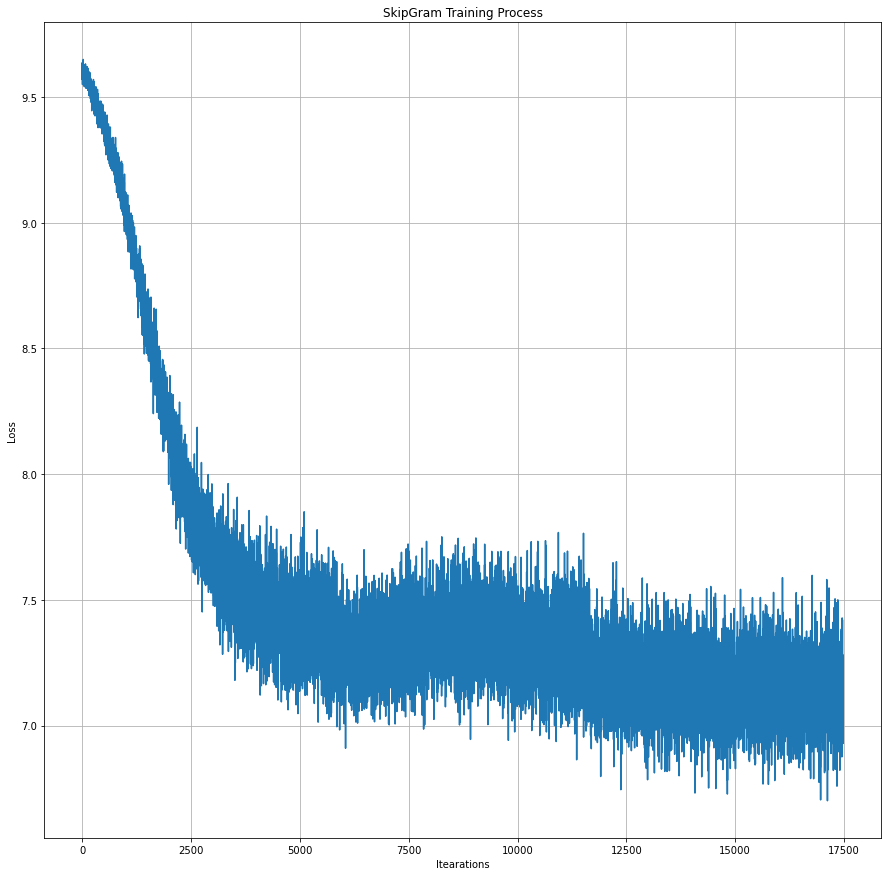

In [67]:
plt.title('SkipGram Training Process')
plt.xlabel('Itearations')
plt.ylabel('Loss')
plt.grid()
plt.plot(losses)

In [68]:
# проверка, что хоть что-то выучилось
assert np.mean(losses[-1000:]) < 7.5

In [69]:
embedding_matrix = model.in_embedding.weight.detach()

In [70]:
def cos_sim(embedding_matrix, token2id, word1, word2):
    
    i1 = token2id[word1]
    i2 = token2id[word2]
    
    v1, v2 = embedding_matrix[i1], embedding_matrix[i2]
    
    v1_n = v1.div(v1.norm(keepdim=True))
    v2_n = v2.div(v2.norm(keepdim=True))
    
    similarity = torch.dot(v1_n, v2_n).item()
    
    return similarity

# Косинусная близость
От 0 до 1, где 0 - вектора абсолютно разные, где 1 - идентичные.

In [71]:
cos_sim(embedding_matrix, word2index, 'день', 'месяц')

0.7647284269332886

In [72]:
cos_sim(embedding_matrix, word2index, 'минута', 'месяц')

0.6940157413482666

In [73]:
cos_sim(embedding_matrix, word2index, 'сотрудник', 'сотрудница')

0.6814225912094116

In [74]:
cos_sim(embedding_matrix, word2index, 'вклад', 'перевод')

0.6710851788520813

In [75]:
random_word = random.choice(list(word2index.keys()))
sim = cos_sim(embedding_matrix, word2index, 'день', random_word)
'Косинусная близость слова "день" к случайному выбраному слову "{}" равна {:.3f}'.format(random_word, sim)

'Косинусная близость слова "день" к случайному выбраному слову "напрямую" равна 0.520'

In [76]:
freq = {}

for text in corpus:
    for token in text:
        if token in freq:
            freq[token] += 1
        else:
            freq[token] = 1

In [77]:
sorted_freq = [(k, freq[k]) for k in sorted(freq, key=freq.get, reverse=True)]
top_sorted_freq = sorted_freq[0:200]

In [78]:
tsne = TSNE(n_components=2, init='pca', random_state=42, verbose=2)
reduced = tsne.fit_transform(embedding_matrix)

/Users/ciwwwnd/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 13076 samples in 0.001s...
[t-SNE] Computed neighbors for 13076 samples in 3.105s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13076
[t-SNE] Computed conditional probabilities for sample 2000 / 13076
[t-SNE] Computed conditional probabilities for sample 3000 / 13076
[t-SNE] Computed conditional probabilities for sample 4000 / 13076
[t-SNE] Computed conditional probabilities for sample 5000 / 13076
[t-SNE] Computed conditional probabilities for sample 6000 / 13076
[t-SNE] Computed conditional probabilities for sample 7000 / 13076
[t-SNE] Computed conditional probabilities for sample 8000 / 13076
[t-SNE] Computed conditional probabilities for sample 9000 / 13076
[t-SNE] Computed conditional probabilities for sample 10000 / 13076
[t-SNE] Computed conditional probabilities for sample 11000 / 13076
[t-SNE] Computed conditional probabilities for sample 12000 / 13076
[t-SNE] Computed conditional probabilities for sam

/Users/ciwwwnd/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] Iteration 50: error = 96.9745178, gradient norm = 0.0000995 (50 iterations in 2.410s)
[t-SNE] Iteration 100: error = 96.9884491, gradient norm = 0.0000003 (50 iterations in 1.377s)
[t-SNE] Iteration 150: error = 96.9884567, gradient norm = 0.0000004 (50 iterations in 1.394s)
[t-SNE] Iteration 200: error = 96.9884567, gradient norm = 0.0000004 (50 iterations in 1.409s)
[t-SNE] Iteration 250: error = 96.9884567, gradient norm = 0.0000004 (50 iterations in 1.381s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 96.988457
[t-SNE] Iteration 300: error = 4.7972956, gradient norm = 0.0004786 (50 iterations in 1.415s)
[t-SNE] Iteration 350: error = 4.2979994, gradient norm = 0.0006697 (50 iterations in 1.795s)
[t-SNE] Iteration 400: error = 4.1565766, gradient norm = 0.0003439 (50 iterations in 1.561s)
[t-SNE] Iteration 450: error = 4.0733032, gradient norm = 0.0002281 (50 iterations in 1.528s)
[t-SNE] Iteration 500: error = 4.0145340, gradient norm = 0.0001687 (50 

In [79]:
top_words = [a for a,_ in top_sorted_freq]

In [80]:
inds = [word2index[word] for word in top_words]
x_coords = [coords[0] for coords in reduced[inds]]
y_coords = [coords[1] for coords in reduced[inds]]

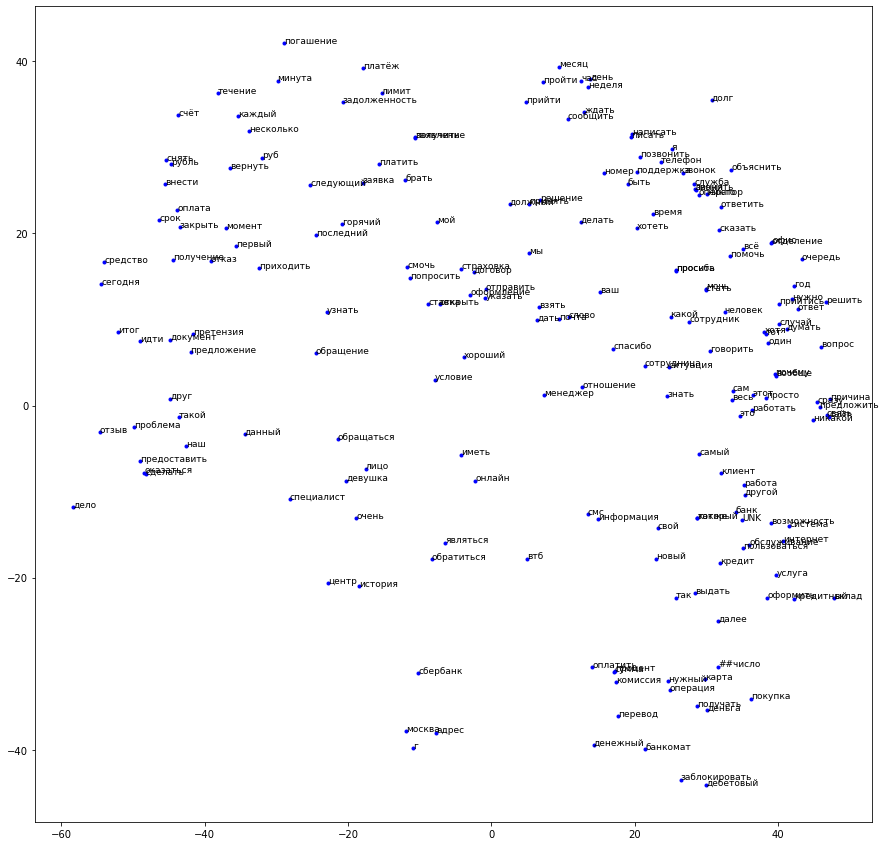

In [81]:
for (x, y, word) in zip(x_coords, y_coords, top_words):
    plt.scatter(x, y, marker='.', color='blue')
    plt.text(x+0.01, y+0.01, word, fontsize=9)
plt.show()

In [139]:
import pandas as pd
df = pd.read_table("/Users/ciwwwnd/Downloads/ru_simlex965_tagged.tsv") 

In [140]:
df['# Word1'] = df['# Word1'].apply(lambda x: x.split('_')[0])
df['Word2'] = df['Word2'].apply(lambda x: x.split('_')[0])

In [135]:
df

,# Word1,Word2,Average Score,AS cossim
0,авария,бедствие,0.615,NaN
1,август,месяц,0.285,0.776777
2,авиация,полет,0.677,NaN
3,автомобиль,гудок,0.185,0.623454
4,автомобиль,автострада,0.123,NaN
...,...,...,...,...
960,яблоко,солнце,0.015,NaN
961,ядро,пушка,0.277,NaN
962,язык,горло,0.138,0.591768
963,ярд,дюйм,0.262,NaN


In [141]:
df["AS cossim"] = np.nan

In [142]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[['Average Score']] = scaler.fit_transform(df[['Average Score']])

In [143]:
for idx, row in df.iterrows():
        try:
            value = cos_sim(embedding_matrix, word2index, row['# Word1'], row['Word2'])
            df.loc[idx, 'AS cossim'] = value
        except KeyError:
            pass

In [144]:
df['AS cossim'] = scaler.fit_transform(df[['AS cossim']])

In [145]:
df = df.dropna()

In [146]:
def get_mse(df, embedding_matrix, word2index):
    
    err_sum, n, not_in_vocab = 0, 0, 0

    for idx, row in df.iterrows():
        try:
            err_sum += (row['Average Score'] - row['AS cossim']) ** 2
            n += 1
        except:
            not_in_vocab += 1
            
    mse = err_sum / n
    return mse

In [147]:
get_mse(df, embedding_matrix, word2index)

0.20849134702175243

# Оценка
1. Вы добрались сюда и все работает, значит уже получили 7 баллов.
2. 8 баллов - Взяли корпус для оценка качества эмбеддингов [здесь](https://rusvectores.org/static/testsets/ru_simlex965_tagged.tsv). Описание к нему [здесь](https://arxiv.org/pdf/1801.06407.pdf). Его английская версия для понимания, того что же это такое [тут](https://fh295.github.io/simlex.html). Если в кратце - он похож а гугл аналогии, просто иначе составлен. Определили качество своих эмбеддингов. Как качество измерить? Можете все значения отнормировать (привести к 1) и затем считать MSE между тем что у вас и что в оригинале.
3. 9 баллов - Поставили эксперименты, поменяли любые параметры, хоть корпус увеличили или как то почистили. Показали метрики до и после. После должно быть лучше, иначе это все еще 8 баллов.
4. 10 баллов - удивили своим подходом (или просто удивили) пока делили на 9 баллов

#### Поменяем из интереса (по приколу) lr  и количество эпох!

In [148]:
optimizer = torch.optim.Adam(params=model.parameters(), lr = 0.01)

# aka loss function
criterion = torch.nn.CrossEntropyLoss()

In [150]:
epochs = 5

losses = []

for n_epoch in range(epochs):

    try:

        progress_bar = tqdm(total=len(dataset_loader.dataset), desc='Epoch {}'.format(n_epoch + 1))

        for X_train, y_train in dataset_loader:

            y_pred = model(X_train)
            loss = criterion(y_pred, y_train)
            loss.backward()
            optimizer.step()
            
            
            losses.append(loss.item())
            
            progress_bar.set_postfix(loss=np.mean(losses[-100:]))

            progress_bar.update(X_train.shape[0])

        progress_bar.close()

    except KeyboardInterrupt:

        progress_bar.close()
        break





Epoch 1:   0%|                                                                                  | 0/2983124 [00:00<?, ?it/s]



Epoch 1:   0%|                                                                       | 0/2983124 [00:00<?, ?it/s, loss=6.99]



Epoch 1:   0%|                                                           | 512/2983124 [00:00<27:10, 1829.17it/s, loss=6.99]



Epoch 1:   0%|                                                           | 512/2983124 [00:00<27:10, 1829.17it/s, loss=7.04]



Epoch 1:   0%|                                                          | 1024/2983124 [00:00<22:01, 2256.72it/s, loss=7.04]



Epoch 1:   0%|                                                          | 1024/2983124 [00:00<22:01, 2256.72it/s, loss=7.04]



Epoch 1:   0%|                                                          | 1536/2983124 [00:00<22:01, 2256.72it/s, loss=7.09]



Epoch 1:   0%|                                                          | 2048/2983124 [00:00<18:00,

Epoch 1:   1%|▎                                                        | 19456/2983124 [00:03<08:52, 5561.78it/s, loss=7.91]



Epoch 1:   1%|▎                                                        | 19456/2983124 [00:03<08:52, 5561.78it/s, loss=7.94]



Epoch 1:   1%|▍                                                        | 19968/2983124 [00:03<08:52, 5561.78it/s, loss=7.98]



Epoch 1:   1%|▍                                                        | 20480/2983124 [00:03<08:53, 5552.34it/s, loss=7.98]



Epoch 1:   1%|▍                                                        | 20480/2983124 [00:03<08:53, 5552.34it/s, loss=8.02]



Epoch 1:   1%|▍                                                        | 20992/2983124 [00:04<08:53, 5552.34it/s, loss=8.05]



Epoch 1:   1%|▍                                                        | 21504/2983124 [00:04<08:51, 5576.28it/s, loss=8.05]



Epoch 1:   1%|▍                                                         | 21504/2983124 [00:04<08:51, 55

Epoch 1:   1%|▋                                                        | 38912/2983124 [00:07<08:10, 5997.77it/s, loss=9.69]



Epoch 1:   1%|▊                                                        | 39424/2983124 [00:07<08:10, 5997.77it/s, loss=9.75]



Epoch 1:   1%|▊                                                        | 39936/2983124 [00:07<08:06, 6050.05it/s, loss=9.75]



Epoch 1:   1%|▊                                                         | 39936/2983124 [00:07<08:06, 6050.05it/s, loss=9.8]



Epoch 1:   1%|▊                                                        | 40448/2983124 [00:07<08:06, 6050.05it/s, loss=9.86]



Epoch 1:   1%|▊                                                        | 40960/2983124 [00:07<08:00, 6117.38it/s, loss=9.86]



Epoch 1:   1%|▊                                                        | 40960/2983124 [00:07<08:00, 6117.38it/s, loss=9.91]



Epoch 1:   1%|▊                                                        | 41472/2983124 [00:07<08:00, 611

Epoch 1:   2%|█▏                                                       | 58880/2983124 [00:10<08:00, 6091.46it/s, loss=12.7]



Epoch 1:   2%|█▏                                                       | 59392/2983124 [00:10<07:56, 6137.40it/s, loss=12.7]



Epoch 1:   2%|█▏                                                       | 59392/2983124 [00:10<07:56, 6137.40it/s, loss=12.8]



Epoch 1:   2%|█▏                                                       | 59904/2983124 [00:10<07:56, 6137.40it/s, loss=12.9]



Epoch 1:   2%|█▏                                                       | 60416/2983124 [00:10<07:56, 6136.89it/s, loss=12.9]



Epoch 1:   2%|█▏                                                         | 60416/2983124 [00:10<07:56, 6136.89it/s, loss=13]



Epoch 1:   2%|█▏                                                       | 60928/2983124 [00:10<07:56, 6136.89it/s, loss=13.1]



Epoch 1:   2%|█▏                                                       | 61440/2983124 [00:10<07:55, 613

Epoch 1:   3%|█▌                                                       | 78848/2983124 [00:13<07:55, 6109.91it/s, loss=17.6]



Epoch 1:   3%|█▌                                                       | 78848/2983124 [00:13<07:55, 6109.91it/s, loss=17.7]



Epoch 1:   3%|█▌                                                       | 79360/2983124 [00:13<07:55, 6109.91it/s, loss=17.9]



Epoch 1:   3%|█▌                                                       | 79872/2983124 [00:13<07:55, 6109.67it/s, loss=17.9]



Epoch 1:   3%|█▌                                                         | 79872/2983124 [00:13<07:55, 6109.67it/s, loss=18]



Epoch 1:   3%|█▌                                                       | 80384/2983124 [00:13<07:55, 6109.67it/s, loss=18.2]



Epoch 1:   3%|█▌                                                       | 80896/2983124 [00:13<07:53, 6132.29it/s, loss=18.2]



Epoch 1:   3%|█▌                                                       | 80896/2983124 [00:13<07:53, 613

Epoch 1:   3%|█▉                                                       | 98304/2983124 [00:16<08:09, 5890.17it/s, loss=23.3]



Epoch 1:   3%|█▉                                                       | 98816/2983124 [00:17<08:09, 5890.17it/s, loss=23.4]



Epoch 1:   3%|█▉                                                       | 99328/2983124 [00:17<08:10, 5883.07it/s, loss=23.4]



Epoch 1:   3%|█▉                                                       | 99328/2983124 [00:17<08:10, 5883.07it/s, loss=23.6]



Epoch 1:   3%|█▉                                                       | 99840/2983124 [00:17<08:10, 5883.07it/s, loss=23.7]



Epoch 1:   3%|█▉                                                      | 100352/2983124 [00:17<08:18, 5779.55it/s, loss=23.7]



Epoch 1:   3%|█▉                                                      | 100352/2983124 [00:17<08:18, 5779.55it/s, loss=23.9]



Epoch 1:   3%|█▉                                                        | 100864/2983124 [00:17<08:18, 5

Epoch 1:   4%|██▏                                                     | 118272/2983124 [00:20<08:34, 5573.01it/s, loss=28.9]



Epoch 1:   4%|██▏                                                     | 118784/2983124 [00:20<08:25, 5663.96it/s, loss=28.9]



Epoch 1:   4%|██▏                                                     | 118784/2983124 [00:20<08:25, 5663.96it/s, loss=29.1]



Epoch 1:   4%|██▏                                                     | 119296/2983124 [00:20<08:25, 5663.96it/s, loss=29.2]



Epoch 1:   4%|██▏                                                     | 119808/2983124 [00:20<08:19, 5737.98it/s, loss=29.2]



Epoch 1:   4%|██▏                                                     | 119808/2983124 [00:20<08:19, 5737.98it/s, loss=29.3]



Epoch 1:   4%|██▎                                                     | 120320/2983124 [00:20<08:18, 5737.98it/s, loss=29.5]



Epoch 1:   4%|██▎                                                     | 120832/2983124 [00:20<08:15, 577

Epoch 1:   5%|██▌                                                     | 138240/2983124 [00:23<09:14, 5126.81it/s, loss=34.1]



Epoch 1:   5%|██▌                                                     | 138240/2983124 [00:24<09:14, 5126.81it/s, loss=34.2]



Epoch 1:   5%|██▌                                                     | 138752/2983124 [00:24<09:14, 5126.81it/s, loss=34.3]



Epoch 1:   5%|██▌                                                     | 139264/2983124 [00:24<09:11, 5159.00it/s, loss=34.3]



Epoch 1:   5%|██▌                                                     | 139264/2983124 [00:24<09:11, 5159.00it/s, loss=34.5]



Epoch 1:   5%|██▌                                                     | 139776/2983124 [00:24<09:11, 5159.00it/s, loss=34.6]



Epoch 1:   5%|██▋                                                     | 140288/2983124 [00:24<09:04, 5220.69it/s, loss=34.6]



Epoch 1:   5%|██▋                                                     | 140288/2983124 [00:24<09:04, 522

Epoch 1:   5%|██▉                                                     | 157696/2983124 [00:27<08:54, 5286.76it/s, loss=38.7]



Epoch 1:   5%|██▉                                                     | 158208/2983124 [00:27<08:54, 5286.76it/s, loss=38.9]



Epoch 1:   5%|██▉                                                     | 158720/2983124 [00:27<08:57, 5255.76it/s, loss=38.9]



Epoch 1:   5%|███                                                       | 158720/2983124 [00:27<08:57, 5255.76it/s, loss=39]



Epoch 1:   5%|██▉                                                     | 159232/2983124 [00:27<08:57, 5255.76it/s, loss=39.1]



Epoch 1:   5%|██▉                                                     | 159744/2983124 [00:27<08:55, 5272.07it/s, loss=39.1]



Epoch 1:   5%|██▉                                                     | 159744/2983124 [00:28<08:55, 5272.07it/s, loss=39.2]



Epoch 1:   5%|███                                                     | 160256/2983124 [00:28<08:55, 527

Epoch 1:   6%|███▍                                                      | 177664/2983124 [00:31<09:07, 5128.42it/s, loss=43]



Epoch 1:   6%|███▍                                                      | 178176/2983124 [00:31<09:25, 4957.28it/s, loss=43]



Epoch 1:   6%|███▎                                                    | 178176/2983124 [00:31<09:25, 4957.28it/s, loss=43.1]



Epoch 1:   6%|███▎                                                    | 178688/2983124 [00:31<09:28, 4930.48it/s, loss=43.1]



Epoch 1:   6%|███▎                                                    | 178688/2983124 [00:31<09:28, 4930.48it/s, loss=43.2]



Epoch 1:   6%|███▎                                                    | 179200/2983124 [00:31<09:38, 4848.73it/s, loss=43.2]



Epoch 1:   6%|███▎                                                    | 179200/2983124 [00:31<09:38, 4848.73it/s, loss=43.3]



Epoch 1:   6%|███▎                                                    | 179712/2983124 [00:31<09:40, 482

Epoch 1:   6%|███▌                                                    | 192512/2983124 [00:34<09:23, 4956.52it/s, loss=45.8]



Epoch 1:   6%|███▌                                                    | 193024/2983124 [00:34<09:22, 4963.08it/s, loss=45.8]



Epoch 1:   6%|███▊                                                      | 193024/2983124 [00:34<09:22, 4963.08it/s, loss=46]



Epoch 1:   6%|███▋                                                    | 193536/2983124 [00:34<09:22, 4963.08it/s, loss=46.1]



Epoch 1:   7%|███▋                                                    | 194048/2983124 [00:34<09:13, 5043.04it/s, loss=46.1]



Epoch 1:   7%|███▋                                                    | 194048/2983124 [00:34<09:13, 5043.04it/s, loss=46.2]



Epoch 1:   7%|███▋                                                    | 194560/2983124 [00:35<09:12, 5043.04it/s, loss=46.3]



Epoch 1:   7%|███▋                                                    | 195072/2983124 [00:35<09:08, 508

Epoch 1:   7%|███▉                                                    | 211456/2983124 [00:38<09:38, 4793.42it/s, loss=49.5]



Epoch 1:   7%|███▉                                                    | 211456/2983124 [00:38<09:38, 4793.42it/s, loss=49.5]



Epoch 1:   7%|███▉                                                    | 211968/2983124 [00:38<09:51, 4683.04it/s, loss=49.5]



Epoch 1:   7%|███▉                                                    | 211968/2983124 [00:38<09:51, 4683.04it/s, loss=49.6]



Epoch 1:   7%|███▉                                                    | 212480/2983124 [00:38<09:55, 4652.00it/s, loss=49.6]



Epoch 1:   7%|███▉                                                    | 212480/2983124 [00:38<09:55, 4652.00it/s, loss=49.7]



Epoch 1:   7%|███▉                                                    | 212992/2983124 [00:38<09:51, 4680.11it/s, loss=49.7]



Epoch 1:   7%|███▉                                                    | 212992/2983124 [00:38<09:51, 468

Epoch 1:   8%|████▎                                                   | 227840/2983124 [00:41<08:54, 5156.73it/s, loss=52.5]



Epoch 1:   8%|████▎                                                   | 228352/2983124 [00:41<08:54, 5156.73it/s, loss=52.6]



Epoch 1:   8%|████▎                                                   | 228864/2983124 [00:41<09:06, 5042.91it/s, loss=52.6]



Epoch 1:   8%|████▎                                                   | 228864/2983124 [00:41<09:06, 5042.91it/s, loss=52.6]



Epoch 1:   8%|████▎                                                   | 229376/2983124 [00:41<09:12, 4982.29it/s, loss=52.6]



Epoch 1:   8%|████▎                                                   | 229376/2983124 [00:41<09:12, 4982.29it/s, loss=52.8]



Epoch 1:   8%|████▎                                                   | 229888/2983124 [00:41<09:14, 4963.87it/s, loss=52.8]



Epoch 1:   8%|████▎                                                   | 229888/2983124 [00:42<09:14, 496

Epoch 1:   8%|████▌                                                   | 244224/2983124 [00:44<09:10, 4972.09it/s, loss=55.6]



Epoch 1:   8%|████▌                                                   | 244736/2983124 [00:44<09:09, 4985.74it/s, loss=55.6]



Epoch 1:   8%|████▌                                                   | 244736/2983124 [00:45<09:09, 4985.74it/s, loss=55.6]



Epoch 1:   8%|████▌                                                   | 245248/2983124 [00:45<09:09, 4985.74it/s, loss=55.8]



Epoch 1:   8%|████▌                                                   | 245760/2983124 [00:45<08:57, 5091.86it/s, loss=55.8]



Epoch 1:   8%|████▌                                                   | 245760/2983124 [00:45<08:57, 5091.86it/s, loss=55.9]



Epoch 1:   8%|████▌                                                   | 246272/2983124 [00:45<09:06, 5011.05it/s, loss=55.9]



Epoch 1:   8%|████▊                                                     | 246272/2983124 [00:45<09:06, 5

Epoch 1:   9%|████▉                                                   | 263168/2983124 [00:48<08:45, 5173.74it/s, loss=59.2]



Epoch 1:   9%|████▉                                                   | 263680/2983124 [00:48<08:55, 5074.02it/s, loss=59.2]



Epoch 1:   9%|████▉                                                   | 263680/2983124 [00:48<08:55, 5074.02it/s, loss=59.3]



Epoch 1:   9%|████▉                                                   | 264192/2983124 [00:48<09:06, 4977.03it/s, loss=59.3]



Epoch 1:   9%|████▉                                                   | 264192/2983124 [00:48<09:06, 4977.03it/s, loss=59.4]



Epoch 1:   9%|████▉                                                   | 264704/2983124 [00:48<09:15, 4895.42it/s, loss=59.4]



Epoch 1:   9%|████▉                                                   | 264704/2983124 [00:48<09:15, 4895.42it/s, loss=59.5]



Epoch 1:   9%|████▉                                                   | 265216/2983124 [00:48<09:12, 492

Epoch 1:   9%|█████▍                                                    | 282112/2983124 [00:52<08:18, 5419.22it/s, loss=63]



Epoch 1:   9%|█████▎                                                  | 282112/2983124 [00:52<08:18, 5419.22it/s, loss=63.1]



Epoch 1:   9%|█████▎                                                  | 282624/2983124 [00:52<08:18, 5419.22it/s, loss=63.2]



Epoch 1:   9%|█████▎                                                  | 283136/2983124 [00:52<08:17, 5428.07it/s, loss=63.2]



Epoch 1:   9%|█████▎                                                  | 283136/2983124 [00:52<08:17, 5428.07it/s, loss=63.3]



Epoch 1:  10%|█████▎                                                  | 283648/2983124 [00:52<08:17, 5428.07it/s, loss=63.5]



Epoch 1:  10%|█████▎                                                  | 284160/2983124 [00:52<08:14, 5456.73it/s, loss=63.5]



Epoch 1:  10%|█████▎                                                  | 284160/2983124 [00:52<08:14, 545

Epoch 1:  10%|█████▋                                                  | 301568/2983124 [00:55<08:12, 5448.21it/s, loss=67.1]



Epoch 1:  10%|█████▋                                                  | 302080/2983124 [00:55<08:12, 5448.21it/s, loss=67.2]



Epoch 1:  10%|█████▋                                                  | 302592/2983124 [00:55<08:09, 5478.52it/s, loss=67.2]



Epoch 1:  10%|█████▋                                                  | 302592/2983124 [00:56<08:09, 5478.52it/s, loss=67.4]



Epoch 1:  10%|█████▋                                                  | 303104/2983124 [00:56<08:09, 5478.52it/s, loss=67.5]



Epoch 1:  10%|█████▋                                                  | 303616/2983124 [00:56<08:06, 5512.79it/s, loss=67.5]



Epoch 1:  10%|█████▋                                                  | 303616/2983124 [00:56<08:06, 5512.79it/s, loss=67.7]



Epoch 1:  10%|█████▋                                                  | 304128/2983124 [00:56<08:05, 551

Epoch 1:  11%|██████                                                  | 321536/2983124 [00:59<08:40, 5117.66it/s, loss=72.1]



Epoch 1:  11%|██████                                                  | 322048/2983124 [00:59<08:40, 5111.07it/s, loss=72.1]



Epoch 1:  11%|██████                                                  | 322048/2983124 [00:59<08:40, 5111.07it/s, loss=72.3]



Epoch 1:  11%|██████                                                  | 322560/2983124 [00:59<08:40, 5111.07it/s, loss=72.2]



Epoch 1:  11%|██████                                                  | 323072/2983124 [00:59<08:30, 5211.07it/s, loss=72.2]



Epoch 1:  11%|██████                                                  | 323072/2983124 [00:59<08:30, 5211.07it/s, loss=72.5]



Epoch 1:  11%|██████                                                  | 323584/2983124 [00:59<08:30, 5211.07it/s, loss=72.6]



Epoch 1:  11%|██████                                                  | 324096/2983124 [00:59<08:23, 528

Epoch 1:  11%|██████▍                                                 | 341504/2983124 [01:03<08:01, 5485.64it/s, loss=76.9]



Epoch 1:  11%|██████▍                                                 | 341504/2983124 [01:03<08:01, 5485.64it/s, loss=77.1]



Epoch 1:  11%|██████▍                                                 | 342016/2983124 [01:03<08:01, 5485.64it/s, loss=77.2]



Epoch 1:  11%|██████▍                                                 | 342528/2983124 [01:03<07:57, 5524.28it/s, loss=77.2]



Epoch 1:  11%|██████▍                                                 | 342528/2983124 [01:03<07:57, 5524.28it/s, loss=77.3]



Epoch 1:  11%|██████▍                                                 | 343040/2983124 [01:03<07:57, 5524.28it/s, loss=77.4]



Epoch 1:  12%|██████▍                                                 | 343552/2983124 [01:03<07:56, 5544.24it/s, loss=77.4]



Epoch 1:  12%|██████▍                                                 | 343552/2983124 [01:03<07:56, 554

Epoch 1:  12%|██████▊                                                 | 360960/2983124 [01:06<08:35, 5087.87it/s, loss=81.5]



Epoch 1:  12%|██████▊                                                 | 361472/2983124 [01:06<08:35, 5087.87it/s, loss=81.6]



Epoch 1:  12%|██████▊                                                 | 361984/2983124 [01:06<08:27, 5160.71it/s, loss=81.6]



Epoch 1:  12%|██████▊                                                 | 361984/2983124 [01:07<08:27, 5160.71it/s, loss=81.8]



Epoch 1:  12%|██████▊                                                 | 362496/2983124 [01:07<08:27, 5160.71it/s, loss=81.9]



Epoch 1:  12%|██████▊                                                 | 363008/2983124 [01:07<08:23, 5206.62it/s, loss=81.9]



Epoch 1:  12%|██████▊                                                 | 363008/2983124 [01:07<08:23, 5206.62it/s, loss=81.9]



Epoch 1:  12%|███████                                                   | 363520/2983124 [01:07<08:23, 5

Epoch 1:  13%|███████▍                                                  | 380928/2983124 [01:10<07:46, 5574.99it/s, loss=86]



Epoch 1:  13%|███████▍                                                  | 381440/2983124 [01:10<07:47, 5563.80it/s, loss=86]



Epoch 1:  13%|███████▏                                                | 381440/2983124 [01:10<07:47, 5563.80it/s, loss=86.2]



Epoch 1:  13%|███████▏                                                | 381952/2983124 [01:10<07:47, 5563.80it/s, loss=86.3]



Epoch 1:  13%|███████▏                                                | 382464/2983124 [01:10<07:48, 5549.62it/s, loss=86.3]



Epoch 1:  13%|███████▏                                                | 382464/2983124 [01:10<07:48, 5549.62it/s, loss=86.4]



Epoch 1:  13%|███████▏                                                | 382976/2983124 [01:10<07:48, 5549.62it/s, loss=86.5]



Epoch 1:  13%|███████▏                                                | 383488/2983124 [01:10<07:51, 551

Epoch 1:  13%|███████▌                                                | 400896/2983124 [01:13<07:38, 5633.48it/s, loss=90.3]



Epoch 1:  13%|███████▌                                                | 400896/2983124 [01:14<07:38, 5633.48it/s, loss=90.5]



Epoch 1:  13%|███████▌                                                | 401408/2983124 [01:14<07:38, 5633.48it/s, loss=90.4]



Epoch 1:  13%|███████▌                                                | 401920/2983124 [01:14<07:34, 5677.70it/s, loss=90.4]



Epoch 1:  13%|███████▌                                                | 401920/2983124 [01:14<07:34, 5677.70it/s, loss=90.6]



Epoch 1:  13%|███████▌                                                | 402432/2983124 [01:14<07:34, 5677.70it/s, loss=90.8]



Epoch 1:  14%|███████▌                                                | 402944/2983124 [01:14<07:33, 5684.16it/s, loss=90.8]



Epoch 1:  14%|███████▌                                                | 402944/2983124 [01:14<07:33, 568

Epoch 1:  14%|███████▉                                                | 420352/2983124 [01:17<07:37, 5602.77it/s, loss=93.9]



Epoch 1:  14%|████████▏                                                 | 420864/2983124 [01:17<07:37, 5602.77it/s, loss=94]



Epoch 1:  14%|████████▏                                                 | 421376/2983124 [01:17<07:34, 5635.51it/s, loss=94]



Epoch 1:  14%|████████▏                                                 | 421376/2983124 [01:17<07:34, 5635.51it/s, loss=94]



Epoch 1:  14%|███████▉                                                | 421888/2983124 [01:17<07:34, 5635.51it/s, loss=94.1]



Epoch 1:  14%|███████▉                                                | 422400/2983124 [01:17<07:38, 5590.84it/s, loss=94.1]



Epoch 1:  14%|███████▉                                                | 422400/2983124 [01:17<07:38, 5590.84it/s, loss=94.2]



Epoch 1:  14%|███████▉                                                | 422912/2983124 [01:17<07:37, 559

Epoch 1:  15%|████████▎                                               | 440320/2983124 [01:21<07:33, 5611.22it/s, loss=98.7]



Epoch 1:  15%|████████▎                                               | 440832/2983124 [01:21<07:31, 5628.00it/s, loss=98.7]



Epoch 1:  15%|████████▎                                               | 440832/2983124 [01:21<07:31, 5628.00it/s, loss=98.9]



Epoch 1:  15%|████████▌                                                 | 441344/2983124 [01:21<07:31, 5628.00it/s, loss=99]



Epoch 1:  15%|████████▌                                                 | 441856/2983124 [01:21<07:28, 5660.07it/s, loss=99]



Epoch 1:  15%|████████▎                                               | 441856/2983124 [01:21<07:28, 5660.07it/s, loss=99.1]



Epoch 1:  15%|████████▌                                                 | 442368/2983124 [01:21<07:28, 5660.07it/s, loss=99]



Epoch 1:  15%|████████▌                                                 | 442880/2983124 [01:21<07:28, 5

Epoch 1:  15%|████████▊                                                | 460288/2983124 [01:24<07:37, 5510.99it/s, loss=103]



Epoch 1:  15%|████████▊                                                | 460288/2983124 [01:24<07:37, 5510.99it/s, loss=103]



Epoch 1:  15%|████████▊                                                | 460800/2983124 [01:24<07:37, 5510.99it/s, loss=103]



Epoch 1:  15%|████████▊                                                | 461312/2983124 [01:24<07:38, 5500.29it/s, loss=103]



Epoch 1:  15%|████████▊                                                | 461312/2983124 [01:24<07:38, 5500.29it/s, loss=103]



Epoch 1:  15%|████████▊                                                | 461824/2983124 [01:25<07:38, 5500.29it/s, loss=103]



Epoch 1:  15%|████████▊                                                | 462336/2983124 [01:25<07:35, 5534.56it/s, loss=103]



Epoch 1:  15%|████████▊                                                | 462336/2983124 [01:25<07:35, 55

Epoch 1:  16%|█████████▏                                               | 479744/2983124 [01:28<07:42, 5416.20it/s, loss=106]



Epoch 1:  16%|█████████▏                                               | 480256/2983124 [01:28<07:42, 5416.20it/s, loss=107]



Epoch 1:  16%|█████████▏                                               | 480768/2983124 [01:28<07:45, 5375.62it/s, loss=107]



Epoch 1:  16%|█████████▏                                               | 480768/2983124 [01:28<07:45, 5375.62it/s, loss=107]



Epoch 1:  16%|█████████▏                                               | 481280/2983124 [01:28<07:45, 5375.62it/s, loss=107]



Epoch 1:  16%|█████████▏                                               | 481792/2983124 [01:28<07:40, 5433.77it/s, loss=107]



Epoch 1:  16%|█████████▏                                               | 481792/2983124 [01:28<07:40, 5433.77it/s, loss=107]



Epoch 1:  16%|█████████▏                                               | 482304/2983124 [01:28<07:40, 54

Epoch 1:  17%|█████████▌                                               | 499712/2983124 [01:31<07:35, 5457.38it/s, loss=111]



Epoch 1:  17%|█████████▌                                               | 500224/2983124 [01:31<07:33, 5474.74it/s, loss=111]



Epoch 1:  17%|█████████▌                                               | 500224/2983124 [01:31<07:33, 5474.74it/s, loss=111]



Epoch 1:  17%|█████████▌                                               | 500736/2983124 [01:32<07:33, 5474.74it/s, loss=111]



Epoch 1:  17%|█████████▌                                               | 501248/2983124 [01:32<07:33, 5472.83it/s, loss=111]



Epoch 1:  17%|█████████▌                                               | 501248/2983124 [01:32<07:33, 5472.83it/s, loss=111]



Epoch 1:  17%|█████████▌                                               | 501760/2983124 [01:32<07:33, 5472.83it/s, loss=111]



Epoch 1:  17%|█████████▌                                               | 502272/2983124 [01:32<07:31, 54

Epoch 1:  17%|█████████▉                                               | 519680/2983124 [01:35<07:20, 5588.31it/s, loss=114]



Epoch 1:  17%|█████████▉                                               | 519680/2983124 [01:35<07:20, 5588.31it/s, loss=114]



Epoch 1:  17%|█████████▉                                               | 520192/2983124 [01:35<07:20, 5588.31it/s, loss=114]



Epoch 1:  17%|█████████▉                                               | 520704/2983124 [01:35<07:17, 5630.14it/s, loss=114]



Epoch 1:  17%|█████████▉                                               | 520704/2983124 [01:35<07:17, 5630.14it/s, loss=114]



Epoch 1:  17%|█████████▉                                               | 521216/2983124 [01:35<07:17, 5630.14it/s, loss=115]



Epoch 1:  17%|█████████▉                                               | 521728/2983124 [01:35<07:15, 5650.56it/s, loss=115]



Epoch 1:  17%|█████████▉                                               | 521728/2983124 [01:35<07:15, 56

Epoch 1:  18%|██████████▎                                              | 539136/2983124 [01:39<07:31, 5417.67it/s, loss=120]



Epoch 1:  18%|██████████▎                                              | 539648/2983124 [01:39<07:31, 5417.67it/s, loss=120]



Epoch 1:  18%|██████████▎                                              | 540160/2983124 [01:39<07:23, 5506.23it/s, loss=120]



Epoch 1:  18%|██████████▎                                              | 540160/2983124 [01:39<07:23, 5506.23it/s, loss=120]



Epoch 1:  18%|██████████▎                                              | 540672/2983124 [01:39<07:23, 5506.23it/s, loss=120]



Epoch 1:  18%|██████████▎                                              | 541184/2983124 [01:39<07:16, 5591.58it/s, loss=120]



Epoch 1:  18%|██████████▎                                              | 541184/2983124 [01:39<07:16, 5591.58it/s, loss=120]



Epoch 1:  18%|██████████▎                                              | 541696/2983124 [01:39<07:16, 55

Epoch 1:  19%|██████████▋                                              | 559104/2983124 [01:42<07:07, 5666.63it/s, loss=124]



Epoch 1:  19%|██████████▋                                              | 559616/2983124 [01:42<07:07, 5671.51it/s, loss=124]



Epoch 1:  19%|██████████▋                                              | 559616/2983124 [01:42<07:07, 5671.51it/s, loss=124]



Epoch 1:  19%|██████████▋                                              | 560128/2983124 [01:42<07:07, 5671.51it/s, loss=124]



Epoch 1:  19%|██████████▋                                              | 560640/2983124 [01:42<07:11, 5612.44it/s, loss=124]



Epoch 1:  19%|██████████▋                                              | 560640/2983124 [01:42<07:11, 5612.44it/s, loss=124]



Epoch 1:  19%|██████████▋                                              | 561152/2983124 [01:43<07:11, 5612.44it/s, loss=124]



Epoch 1:  19%|██████████▋                                              | 561664/2983124 [01:43<07:47, 51

Epoch 1:  19%|███████████                                              | 579072/2983124 [01:46<06:51, 5847.55it/s, loss=127]



Epoch 1:  19%|███████████                                              | 579072/2983124 [01:46<06:51, 5847.55it/s, loss=128]



Epoch 1:  19%|███████████                                              | 579584/2983124 [01:46<06:51, 5847.55it/s, loss=128]



Epoch 1:  19%|███████████                                              | 580096/2983124 [01:46<06:49, 5864.08it/s, loss=128]



Epoch 1:  19%|███████████                                              | 580096/2983124 [01:46<06:49, 5864.08it/s, loss=128]



Epoch 1:  19%|███████████                                              | 580608/2983124 [01:46<06:49, 5864.08it/s, loss=128]



Epoch 1:  19%|███████████                                              | 581120/2983124 [01:46<06:48, 5875.18it/s, loss=128]



Epoch 1:  19%|███████████                                              | 581120/2983124 [01:46<06:48, 58

Epoch 1:  20%|███████████▍                                             | 598528/2983124 [01:49<07:46, 5108.41it/s, loss=129]



Epoch 1:  20%|███████████▍                                             | 599040/2983124 [01:49<07:46, 5108.41it/s, loss=129]



Epoch 1:  20%|███████████▍                                             | 599552/2983124 [01:49<08:03, 4928.38it/s, loss=129]



Epoch 1:  20%|███████████▍                                             | 599552/2983124 [01:49<08:03, 4928.38it/s, loss=129]



Epoch 1:  20%|███████████▍                                             | 600064/2983124 [01:49<08:03, 4928.38it/s, loss=129]



Epoch 1:  20%|███████████▍                                             | 600576/2983124 [01:49<07:45, 5122.37it/s, loss=129]



Epoch 1:  20%|███████████▍                                             | 600576/2983124 [01:49<07:45, 5122.37it/s, loss=130]



Epoch 1:  20%|███████████▍                                             | 601088/2983124 [01:50<07:45, 51

Epoch 1:  21%|███████████▊                                             | 618496/2983124 [01:52<06:31, 6039.63it/s, loss=132]



Epoch 1:  21%|███████████▊                                             | 619008/2983124 [01:52<06:32, 6027.52it/s, loss=132]



Epoch 1:  21%|███████████▊                                             | 619008/2983124 [01:53<06:32, 6027.52it/s, loss=132]



Epoch 1:  21%|███████████▊                                             | 619520/2983124 [01:53<06:32, 6027.52it/s, loss=132]



Epoch 1:  21%|███████████▊                                             | 620032/2983124 [01:53<06:32, 6019.00it/s, loss=132]



Epoch 1:  21%|███████████▊                                             | 620032/2983124 [01:53<06:32, 6019.00it/s, loss=132]



Epoch 1:  21%|███████████▊                                             | 620544/2983124 [01:53<06:32, 6019.00it/s, loss=132]



Epoch 1:  21%|███████████▊                                             | 621056/2983124 [01:53<06:31, 60

Epoch 1:  21%|████████████▏                                            | 638464/2983124 [01:56<06:26, 6072.02it/s, loss=135]



Epoch 1:  21%|████████████▏                                            | 638464/2983124 [01:56<06:26, 6072.02it/s, loss=135]



Epoch 1:  21%|████████████▏                                            | 638976/2983124 [01:56<06:26, 6072.02it/s, loss=135]



Epoch 1:  21%|████████████▏                                            | 639488/2983124 [01:56<06:26, 6068.13it/s, loss=135]



Epoch 1:  21%|████████████▏                                            | 639488/2983124 [01:56<06:26, 6068.13it/s, loss=136]



Epoch 1:  21%|████████████▏                                            | 640000/2983124 [01:56<06:26, 6068.13it/s, loss=136]



Epoch 1:  21%|████████████▏                                            | 640512/2983124 [01:56<06:25, 6071.00it/s, loss=136]



Epoch 1:  21%|████████████▏                                            | 640512/2983124 [01:56<06:25, 60

Epoch 1:  22%|████████████▌                                            | 657920/2983124 [01:59<06:29, 5962.46it/s, loss=140]



Epoch 1:  22%|████████████▌                                            | 658432/2983124 [01:59<06:29, 5962.46it/s, loss=140]



Epoch 1:  22%|████████████▌                                            | 658944/2983124 [01:59<06:27, 5994.75it/s, loss=140]



Epoch 1:  22%|████████████▌                                            | 658944/2983124 [01:59<06:27, 5994.75it/s, loss=140]



Epoch 1:  22%|████████████▌                                            | 659456/2983124 [01:59<06:27, 5994.75it/s, loss=140]



Epoch 1:  22%|████████████▌                                            | 659968/2983124 [01:59<06:25, 6028.60it/s, loss=140]



Epoch 1:  22%|████████████▌                                            | 659968/2983124 [01:59<06:25, 6028.60it/s, loss=140]



Epoch 1:  22%|████████████▌                                            | 660480/2983124 [01:59<06:25, 60

Epoch 1:  23%|████████████▉                                            | 677888/2983124 [02:02<06:14, 6148.23it/s, loss=144]



Epoch 1:  23%|████████████▉                                            | 678400/2983124 [02:02<06:14, 6156.30it/s, loss=144]



Epoch 1:  23%|████████████▉                                            | 678400/2983124 [02:02<06:14, 6156.30it/s, loss=144]



Epoch 1:  23%|████████████▉                                            | 678912/2983124 [02:02<06:14, 6156.30it/s, loss=144]



Epoch 1:  23%|████████████▉                                            | 679424/2983124 [02:02<06:13, 6171.19it/s, loss=144]



Epoch 1:  23%|████████████▉                                            | 679424/2983124 [02:03<06:13, 6171.19it/s, loss=145]



Epoch 1:  23%|████████████▉                                            | 679936/2983124 [02:03<06:13, 6171.19it/s, loss=145]



Epoch 1:  23%|█████████████                                            | 680448/2983124 [02:03<06:14, 61

Epoch 1:  23%|█████████████▎                                           | 697856/2983124 [02:05<06:13, 6119.17it/s, loss=147]



Epoch 1:  23%|█████████████▎                                           | 697856/2983124 [02:06<06:13, 6119.17it/s, loss=147]



Epoch 1:  23%|█████████████▎                                           | 698368/2983124 [02:06<06:13, 6119.17it/s, loss=147]



Epoch 1:  23%|█████████████▎                                           | 698880/2983124 [02:06<06:12, 6127.76it/s, loss=147]



Epoch 1:  23%|█████████████▎                                           | 698880/2983124 [02:06<06:12, 6127.76it/s, loss=147]



Epoch 1:  23%|█████████████▎                                           | 699392/2983124 [02:06<06:12, 6127.76it/s, loss=147]



Epoch 1:  23%|█████████████▎                                           | 699904/2983124 [02:06<06:15, 6075.19it/s, loss=147]



Epoch 1:  23%|█████████████▎                                           | 699904/2983124 [02:06<06:15, 60

Epoch 1:  24%|█████████████▋                                           | 717312/2983124 [02:09<06:05, 6198.47it/s, loss=150]



Epoch 1:  24%|█████████████▋                                           | 717824/2983124 [02:09<06:05, 6198.47it/s, loss=150]



Epoch 1:  24%|█████████████▋                                           | 718336/2983124 [02:09<06:06, 6178.51it/s, loss=150]



Epoch 1:  24%|█████████████▋                                           | 718336/2983124 [02:09<06:06, 6178.51it/s, loss=150]



Epoch 1:  24%|█████████████▋                                           | 718848/2983124 [02:09<06:06, 6178.51it/s, loss=150]



Epoch 1:  24%|█████████████▋                                           | 719360/2983124 [02:09<06:07, 6166.34it/s, loss=150]



Epoch 1:  24%|█████████████▋                                           | 719360/2983124 [02:09<06:07, 6166.34it/s, loss=150]



Epoch 1:  24%|█████████████▊                                           | 719872/2983124 [02:09<06:07, 61

Epoch 1:  25%|██████████████                                           | 737280/2983124 [02:12<06:03, 6184.51it/s, loss=154]



Epoch 1:  25%|██████████████                                           | 737792/2983124 [02:12<06:02, 6201.60it/s, loss=154]



Epoch 1:  25%|██████████████                                           | 737792/2983124 [02:12<06:02, 6201.60it/s, loss=154]



Epoch 1:  25%|██████████████                                           | 738304/2983124 [02:12<06:01, 6201.60it/s, loss=154]



Epoch 1:  25%|██████████████                                           | 738816/2983124 [02:12<06:00, 6218.55it/s, loss=154]



Epoch 1:  25%|██████████████                                           | 738816/2983124 [02:12<06:00, 6218.55it/s, loss=154]



Epoch 1:  25%|██████████████▏                                          | 739328/2983124 [02:12<06:00, 6218.55it/s, loss=154]



Epoch 1:  25%|██████████████▏                                          | 739840/2983124 [02:12<06:01, 62

Epoch 1:  25%|██████████████▍                                          | 757248/2983124 [02:15<06:52, 5400.89it/s, loss=156]



Epoch 1:  25%|██████████████▍                                          | 757248/2983124 [02:16<06:52, 5400.89it/s, loss=156]



Epoch 1:  25%|██████████████▍                                          | 757760/2983124 [02:16<06:52, 5400.89it/s, loss=157]



Epoch 1:  25%|██████████████▍                                          | 758272/2983124 [02:16<06:55, 5356.30it/s, loss=157]



Epoch 1:  25%|██████████████▍                                          | 758272/2983124 [02:16<06:55, 5356.30it/s, loss=157]



Epoch 1:  25%|██████████████▍                                          | 758784/2983124 [02:16<06:55, 5356.30it/s, loss=157]



Epoch 1:  25%|██████████████▌                                          | 759296/2983124 [02:16<06:56, 5344.84it/s, loss=157]



Epoch 1:  25%|██████████████▌                                          | 759296/2983124 [02:16<06:56, 53

Epoch 1:  26%|██████████████▊                                          | 776192/2983124 [02:19<08:00, 4589.92it/s, loss=160]



Epoch 1:  26%|██████████████▊                                          | 776704/2983124 [02:19<08:00, 4588.49it/s, loss=160]



Epoch 1:  26%|██████████████▊                                          | 776704/2983124 [02:19<08:00, 4588.49it/s, loss=160]



Epoch 1:  26%|██████████████▊                                          | 777216/2983124 [02:19<07:55, 4642.92it/s, loss=160]



Epoch 1:  26%|██████████████▊                                          | 777216/2983124 [02:20<07:55, 4642.92it/s, loss=160]



Epoch 1:  26%|██████████████▊                                          | 777728/2983124 [02:20<08:08, 4519.04it/s, loss=160]



Epoch 1:  26%|██████████████▊                                          | 777728/2983124 [02:20<08:08, 4519.04it/s, loss=160]



Epoch 1:  26%|██████████████▊                                          | 778240/2983124 [02:20<07:54, 46

Epoch 1:  27%|███████████████▏                                         | 794624/2983124 [02:23<06:08, 5946.54it/s, loss=162]



Epoch 1:  27%|███████████████▏                                         | 795136/2983124 [02:23<06:07, 5946.54it/s, loss=162]



Epoch 1:  27%|███████████████▏                                         | 795648/2983124 [02:23<06:04, 6000.89it/s, loss=162]



Epoch 1:  27%|███████████████▏                                         | 795648/2983124 [02:23<06:04, 6000.89it/s, loss=162]



Epoch 1:  27%|███████████████▏                                         | 796160/2983124 [02:23<06:04, 6000.89it/s, loss=162]



Epoch 1:  27%|███████████████▏                                         | 796672/2983124 [02:23<06:08, 5934.09it/s, loss=162]



Epoch 1:  27%|███████████████▏                                         | 796672/2983124 [02:23<06:08, 5934.09it/s, loss=162]



Epoch 1:  27%|███████████████▏                                         | 797184/2983124 [02:23<06:08, 59

Epoch 1:  27%|███████████████▌                                         | 814592/2983124 [02:26<06:02, 5984.29it/s, loss=166]



Epoch 1:  27%|███████████████▌                                         | 815104/2983124 [02:26<05:59, 6031.27it/s, loss=166]



Epoch 1:  27%|███████████████▌                                         | 815104/2983124 [02:26<05:59, 6031.27it/s, loss=166]



Epoch 1:  27%|███████████████▌                                         | 815616/2983124 [02:26<05:59, 6031.27it/s, loss=166]



Epoch 1:  27%|███████████████▌                                         | 816128/2983124 [02:26<05:57, 6060.80it/s, loss=166]



Epoch 1:  27%|███████████████▌                                         | 816128/2983124 [02:26<05:57, 6060.80it/s, loss=166]



Epoch 1:  27%|███████████████▌                                         | 816640/2983124 [02:26<05:57, 6060.80it/s, loss=166]



Epoch 1:  27%|███████████████▌                                         | 817152/2983124 [02:26<05:56, 60

Epoch 1:  28%|███████████████▉                                         | 833536/2983124 [02:30<07:33, 4736.37it/s, loss=168]



Epoch 1:  28%|███████████████▉                                         | 834048/2983124 [02:30<07:12, 4964.93it/s, loss=168]



Epoch 1:  28%|███████████████▉                                         | 834048/2983124 [02:30<07:12, 4964.93it/s, loss=168]



Epoch 1:  28%|███████████████▉                                         | 834560/2983124 [02:30<07:12, 4964.93it/s, loss=168]



Epoch 1:  28%|███████████████▉                                         | 835072/2983124 [02:30<06:53, 5199.58it/s, loss=168]



Epoch 1:  28%|███████████████▉                                         | 835072/2983124 [02:30<06:53, 5199.58it/s, loss=168]



Epoch 1:  28%|███████████████▉                                         | 835584/2983124 [02:30<06:53, 5199.58it/s, loss=168]



Epoch 1:  28%|███████████████▉                                         | 836096/2983124 [02:30<06:35, 54

Epoch 1:  29%|████████████████▎                                        | 853504/2983124 [02:33<06:13, 5705.78it/s, loss=172]



Epoch 1:  29%|████████████████▎                                        | 853504/2983124 [02:33<06:13, 5705.78it/s, loss=172]



Epoch 1:  29%|████████████████▎                                        | 854016/2983124 [02:33<06:13, 5705.78it/s, loss=172]



Epoch 1:  29%|████████████████▎                                        | 854528/2983124 [02:33<06:07, 5788.35it/s, loss=172]



Epoch 1:  29%|████████████████▎                                        | 854528/2983124 [02:33<06:07, 5788.35it/s, loss=172]



Epoch 1:  29%|████████████████▎                                        | 855040/2983124 [02:33<06:07, 5788.35it/s, loss=172]



Epoch 1:  29%|████████████████▎                                        | 855552/2983124 [02:33<06:04, 5840.94it/s, loss=172]



Epoch 1:  29%|████████████████▎                                        | 855552/2983124 [02:34<06:04, 58

Epoch 1:  29%|████████████████▋                                        | 872448/2983124 [02:37<05:50, 6028.05it/s, loss=174]



Epoch 1:  29%|████████████████▋                                        | 872448/2983124 [02:37<05:50, 6028.05it/s, loss=174]



Epoch 1:  29%|████████████████▋                                        | 872960/2983124 [02:37<05:50, 6028.05it/s, loss=173]



Epoch 1:  29%|████████████████▋                                        | 873472/2983124 [02:37<05:44, 6118.01it/s, loss=173]



Epoch 1:  29%|████████████████▋                                        | 873472/2983124 [02:37<05:44, 6118.01it/s, loss=173]



Epoch 1:  29%|████████████████▋                                        | 873984/2983124 [02:37<05:44, 6118.01it/s, loss=173]



Epoch 1:  29%|████████████████▋                                        | 874496/2983124 [02:37<05:42, 6153.25it/s, loss=173]



Epoch 1:  29%|████████████████▋                                        | 874496/2983124 [02:37<05:42, 61

Epoch 1:  30%|█████████████████                                        | 891904/2983124 [02:40<05:27, 6376.81it/s, loss=177]



Epoch 1:  30%|█████████████████                                        | 892416/2983124 [02:40<05:27, 6376.81it/s, loss=177]



Epoch 1:  30%|█████████████████                                        | 892928/2983124 [02:40<05:27, 6382.80it/s, loss=177]



Epoch 1:  30%|█████████████████                                        | 892928/2983124 [02:40<05:27, 6382.80it/s, loss=176]



Epoch 1:  30%|█████████████████                                        | 893440/2983124 [02:40<05:27, 6382.80it/s, loss=177]



Epoch 1:  30%|█████████████████                                        | 893952/2983124 [02:40<05:27, 6385.39it/s, loss=177]



Epoch 1:  30%|█████████████████                                        | 893952/2983124 [02:40<05:27, 6385.39it/s, loss=177]



Epoch 1:  30%|█████████████████                                        | 894464/2983124 [02:40<05:27, 63

Epoch 1:  31%|█████████████████▍                                       | 911872/2983124 [02:43<05:22, 6414.65it/s, loss=179]



Epoch 1:  31%|█████████████████▍                                       | 912384/2983124 [02:43<05:23, 6404.51it/s, loss=179]



Epoch 1:  31%|█████████████████▍                                       | 912384/2983124 [02:43<05:23, 6404.51it/s, loss=179]



Epoch 1:  31%|█████████████████▍                                       | 912896/2983124 [02:43<05:23, 6404.51it/s, loss=179]



Epoch 1:  31%|█████████████████▍                                       | 913408/2983124 [02:43<05:23, 6395.61it/s, loss=179]



Epoch 1:  31%|█████████████████▍                                       | 913408/2983124 [02:43<05:23, 6395.61it/s, loss=179]



Epoch 1:  31%|█████████████████▍                                       | 913920/2983124 [02:43<05:23, 6395.61it/s, loss=179]



Epoch 1:  31%|█████████████████▍                                       | 914432/2983124 [02:43<05:22, 64

Epoch 1:  31%|█████████████████▊                                       | 931840/2983124 [02:46<05:18, 6447.78it/s, loss=184]



Epoch 1:  31%|█████████████████▊                                       | 931840/2983124 [02:46<05:18, 6447.78it/s, loss=183]



Epoch 1:  31%|█████████████████▊                                       | 932352/2983124 [02:46<05:18, 6447.78it/s, loss=184]



Epoch 1:  31%|█████████████████▊                                       | 932864/2983124 [02:46<05:17, 6453.72it/s, loss=184]



Epoch 1:  31%|█████████████████▊                                       | 932864/2983124 [02:46<05:17, 6453.72it/s, loss=184]



Epoch 1:  31%|█████████████████▊                                       | 933376/2983124 [02:46<05:17, 6453.72it/s, loss=184]



Epoch 1:  31%|█████████████████▊                                       | 933888/2983124 [02:46<05:16, 6472.22it/s, loss=184]



Epoch 1:  31%|█████████████████▊                                       | 933888/2983124 [02:46<05:16, 64

Epoch 1:  32%|██████████████████▏                                      | 951296/2983124 [02:49<05:09, 6563.17it/s, loss=186]



Epoch 1:  32%|██████████████████▏                                      | 951808/2983124 [02:49<05:09, 6563.17it/s, loss=186]



Epoch 1:  32%|██████████████████▏                                      | 952320/2983124 [02:49<05:12, 6491.79it/s, loss=186]



Epoch 1:  32%|██████████████████▏                                      | 952320/2983124 [02:49<05:12, 6491.79it/s, loss=186]



Epoch 1:  32%|██████████████████▏                                      | 952832/2983124 [02:49<05:12, 6491.79it/s, loss=186]



Epoch 1:  32%|██████████████████▏                                      | 953344/2983124 [02:49<05:13, 6471.17it/s, loss=186]



Epoch 1:  32%|██████████████████▏                                      | 953344/2983124 [02:49<05:13, 6471.17it/s, loss=186]



Epoch 1:  32%|██████████████████▏                                      | 953856/2983124 [02:49<05:13, 64

Epoch 1:  33%|██████████████████▌                                      | 971264/2983124 [02:52<05:08, 6516.15it/s, loss=189]



Epoch 1:  33%|██████████████████▌                                      | 971776/2983124 [02:52<05:07, 6540.31it/s, loss=189]



Epoch 1:  33%|██████████████████▌                                      | 971776/2983124 [02:52<05:07, 6540.31it/s, loss=189]



Epoch 1:  33%|██████████████████▌                                      | 972288/2983124 [02:52<05:07, 6540.31it/s, loss=190]



Epoch 1:  33%|██████████████████▌                                      | 972800/2983124 [02:52<05:06, 6564.47it/s, loss=190]



Epoch 1:  33%|██████████████████▌                                      | 972800/2983124 [02:52<05:06, 6564.47it/s, loss=190]



Epoch 1:  33%|██████████████████▌                                      | 973312/2983124 [02:52<05:06, 6564.47it/s, loss=190]



Epoch 1:  33%|██████████████████▌                                      | 973824/2983124 [02:52<05:04, 65

Epoch 1:  33%|██████████████████▉                                      | 991232/2983124 [02:55<05:06, 6503.52it/s, loss=192]



Epoch 1:  33%|██████████████████▉                                      | 991232/2983124 [02:55<05:06, 6503.52it/s, loss=192]



Epoch 1:  33%|██████████████████▉                                      | 991744/2983124 [02:55<05:06, 6503.52it/s, loss=192]



Epoch 1:  33%|██████████████████▉                                      | 992256/2983124 [02:55<05:05, 6520.06it/s, loss=192]



Epoch 1:  33%|██████████████████▉                                      | 992256/2983124 [02:55<05:05, 6520.06it/s, loss=192]



Epoch 1:  33%|██████████████████▉                                      | 992768/2983124 [02:55<05:05, 6520.06it/s, loss=192]



Epoch 1:  33%|██████████████████▉                                      | 993280/2983124 [02:55<05:04, 6534.35it/s, loss=192]



Epoch 1:  33%|██████████████████▉                                      | 993280/2983124 [02:56<05:04, 65

Epoch 1:  34%|██████████████████▉                                     | 1010688/2983124 [02:58<04:55, 6670.71it/s, loss=196]



Epoch 1:  34%|██████████████████▉                                     | 1011200/2983124 [02:58<04:55, 6670.71it/s, loss=196]



Epoch 1:  34%|██████████████████▉                                     | 1011712/2983124 [02:58<04:55, 6671.87it/s, loss=196]



Epoch 1:  34%|██████████████████▉                                     | 1011712/2983124 [02:58<04:55, 6671.87it/s, loss=196]



Epoch 1:  34%|███████████████████                                     | 1012224/2983124 [02:58<04:55, 6671.87it/s, loss=196]



Epoch 1:  34%|███████████████████                                     | 1012736/2983124 [02:58<04:56, 6650.22it/s, loss=196]



Epoch 1:  34%|███████████████████                                     | 1012736/2983124 [02:58<04:56, 6650.22it/s, loss=196]



Epoch 1:  34%|███████████████████                                     | 1013248/2983124 [02:59<04:56, 66

Epoch 1:  35%|███████████████████▎                                    | 1030656/2983124 [03:01<04:51, 6687.33it/s, loss=199]



Epoch 1:  35%|███████████████████▎                                    | 1031168/2983124 [03:01<04:51, 6704.62it/s, loss=199]



Epoch 1:  35%|███████████████████▎                                    | 1031168/2983124 [03:01<04:51, 6704.62it/s, loss=199]



Epoch 1:  35%|███████████████████▎                                    | 1031680/2983124 [03:01<04:51, 6704.62it/s, loss=199]



Epoch 1:  35%|███████████████████▍                                    | 1032192/2983124 [03:01<04:50, 6719.97it/s, loss=199]



Epoch 1:  35%|███████████████████▍                                    | 1032192/2983124 [03:01<04:50, 6719.97it/s, loss=199]



Epoch 1:  35%|███████████████████▍                                    | 1032704/2983124 [03:01<04:50, 6719.97it/s, loss=199]



Epoch 1:  35%|███████████████████▍                                    | 1033216/2983124 [03:01<04:56, 65

Epoch 1:  35%|███████████████████▋                                    | 1050624/2983124 [03:04<04:48, 6687.06it/s, loss=203]



Epoch 1:  35%|███████████████████▋                                    | 1050624/2983124 [03:04<04:48, 6687.06it/s, loss=203]



Epoch 1:  35%|███████████████████▋                                    | 1051136/2983124 [03:04<04:48, 6687.06it/s, loss=203]



Epoch 1:  35%|███████████████████▋                                    | 1051648/2983124 [03:04<04:48, 6704.44it/s, loss=203]



Epoch 1:  35%|███████████████████▋                                    | 1051648/2983124 [03:04<04:48, 6704.44it/s, loss=203]



Epoch 1:  35%|███████████████████▊                                    | 1052160/2983124 [03:04<04:48, 6704.44it/s, loss=203]



Epoch 1:  35%|███████████████████▊                                    | 1052672/2983124 [03:04<04:47, 6707.27it/s, loss=203]



Epoch 1:  35%|███████████████████▊                                    | 1052672/2983124 [03:04<04:47, 67

Epoch 1:  36%|████████████████████                                    | 1070080/2983124 [03:07<04:44, 6717.95it/s, loss=207]



Epoch 1:  36%|████████████████████                                    | 1070592/2983124 [03:07<04:44, 6717.95it/s, loss=207]



Epoch 1:  36%|████████████████████                                    | 1071104/2983124 [03:07<04:44, 6721.49it/s, loss=207]



Epoch 1:  36%|████████████████████                                    | 1071104/2983124 [03:07<04:44, 6721.49it/s, loss=206]



Epoch 1:  36%|████████████████████                                    | 1071616/2983124 [03:07<04:44, 6721.49it/s, loss=207]



Epoch 1:  36%|████████████████████▏                                   | 1072128/2983124 [03:07<04:43, 6729.62it/s, loss=207]



Epoch 1:  36%|████████████████████▏                                   | 1072128/2983124 [03:07<04:43, 6729.62it/s, loss=207]



Epoch 1:  36%|████████████████████▏                                   | 1072640/2983124 [03:07<04:43, 67

Epoch 1:  37%|████████████████████▍                                   | 1090048/2983124 [03:10<04:42, 6690.37it/s, loss=209]



Epoch 1:  37%|████████████████████▍                                   | 1090560/2983124 [03:10<04:44, 6658.92it/s, loss=209]



Epoch 1:  37%|████████████████████▍                                   | 1090560/2983124 [03:10<04:44, 6658.92it/s, loss=208]



Epoch 1:  37%|████████████████████▍                                   | 1091072/2983124 [03:10<04:44, 6658.92it/s, loss=208]



Epoch 1:  37%|████████████████████▍                                   | 1091584/2983124 [03:10<04:43, 6671.82it/s, loss=208]



Epoch 1:  37%|████████████████████▍                                   | 1091584/2983124 [03:10<04:43, 6671.82it/s, loss=209]



Epoch 1:  37%|████████████████████▌                                   | 1092096/2983124 [03:10<04:43, 6671.82it/s, loss=208]



Epoch 1:  37%|████████████████████▌                                   | 1092608/2983124 [03:10<04:43, 66

Epoch 1:  37%|████████████████████▊                                   | 1110016/2983124 [03:13<04:37, 6751.09it/s, loss=210]



Epoch 1:  37%|████████████████████▊                                   | 1110016/2983124 [03:13<04:37, 6751.09it/s, loss=210]



Epoch 1:  37%|████████████████████▊                                   | 1110528/2983124 [03:13<04:37, 6751.09it/s, loss=210]



Epoch 1:  37%|████████████████████▊                                   | 1111040/2983124 [03:13<04:36, 6764.87it/s, loss=210]



Epoch 1:  37%|████████████████████▊                                   | 1111040/2983124 [03:13<04:36, 6764.87it/s, loss=210]



Epoch 1:  37%|████████████████████▊                                   | 1111552/2983124 [03:13<04:36, 6764.87it/s, loss=210]



Epoch 1:  37%|████████████████████▉                                   | 1112064/2983124 [03:13<04:36, 6768.74it/s, loss=210]



Epoch 1:  37%|████████████████████▉                                   | 1112064/2983124 [03:13<04:36, 67

Epoch 1:  38%|█████████████████████▏                                  | 1129472/2983124 [03:16<04:35, 6716.31it/s, loss=212]



Epoch 1:  38%|█████████████████████▏                                  | 1129984/2983124 [03:16<04:35, 6716.31it/s, loss=212]



Epoch 1:  38%|█████████████████████▏                                  | 1130496/2983124 [03:16<04:35, 6728.80it/s, loss=212]



Epoch 1:  38%|█████████████████████▏                                  | 1130496/2983124 [03:16<04:35, 6728.80it/s, loss=212]



Epoch 1:  38%|█████████████████████▏                                  | 1131008/2983124 [03:16<04:35, 6728.80it/s, loss=213]



Epoch 1:  38%|█████████████████████▏                                  | 1131520/2983124 [03:16<04:35, 6731.53it/s, loss=213]



Epoch 1:  38%|█████████████████████▏                                  | 1131520/2983124 [03:16<04:35, 6731.53it/s, loss=213]



Epoch 1:  38%|█████████████████████▎                                  | 1132032/2983124 [03:16<04:34, 67

Epoch 1:  39%|█████████████████████▌                                  | 1149440/2983124 [03:19<04:30, 6768.03it/s, loss=215]



Epoch 1:  39%|█████████████████████▌                                  | 1149952/2983124 [03:19<04:30, 6783.41it/s, loss=215]



Epoch 1:  39%|█████████████████████▌                                  | 1149952/2983124 [03:19<04:30, 6783.41it/s, loss=215]



Epoch 1:  39%|█████████████████████▌                                  | 1150464/2983124 [03:19<04:30, 6783.41it/s, loss=214]



Epoch 1:  39%|█████████████████████▌                                  | 1150976/2983124 [03:19<04:30, 6783.78it/s, loss=214]



Epoch 1:  39%|█████████████████████▌                                  | 1150976/2983124 [03:19<04:30, 6783.78it/s, loss=215]



Epoch 1:  39%|█████████████████████▌                                  | 1151488/2983124 [03:19<04:30, 6783.78it/s, loss=214]



Epoch 1:  39%|█████████████████████▋                                  | 1152000/2983124 [03:19<04:29, 67

Epoch 1:  39%|█████████████████████▉                                  | 1169408/2983124 [03:22<04:26, 6796.88it/s, loss=216]



Epoch 1:  39%|█████████████████████▉                                  | 1169408/2983124 [03:22<04:26, 6796.88it/s, loss=216]



Epoch 1:  39%|█████████████████████▉                                  | 1169920/2983124 [03:22<04:26, 6796.88it/s, loss=216]



Epoch 1:  39%|█████████████████████▉                                  | 1170432/2983124 [03:22<04:26, 6805.69it/s, loss=216]



Epoch 1:  39%|█████████████████████▉                                  | 1170432/2983124 [03:22<04:26, 6805.69it/s, loss=216]



Epoch 1:  39%|█████████████████████▉                                  | 1170944/2983124 [03:22<04:26, 6805.69it/s, loss=216]



Epoch 1:  39%|█████████████████████▉                                  | 1171456/2983124 [03:22<04:25, 6811.13it/s, loss=216]



Epoch 1:  39%|█████████████████████▉                                  | 1171456/2983124 [03:22<04:25, 68

Epoch 1:  40%|██████████████████████▎                                 | 1188864/2983124 [03:25<04:22, 6846.31it/s, loss=217]



Epoch 1:  40%|██████████████████████▎                                 | 1189376/2983124 [03:25<04:22, 6846.31it/s, loss=217]



Epoch 1:  40%|██████████████████████▎                                 | 1189888/2983124 [03:25<04:21, 6857.86it/s, loss=217]



Epoch 1:  40%|██████████████████████▎                                 | 1189888/2983124 [03:25<04:21, 6857.86it/s, loss=217]



Epoch 1:  40%|██████████████████████▎                                 | 1190400/2983124 [03:25<04:21, 6857.86it/s, loss=217]



Epoch 1:  40%|██████████████████████▎                                 | 1190912/2983124 [03:25<04:21, 6858.33it/s, loss=217]



Epoch 1:  40%|██████████████████████▎                                 | 1190912/2983124 [03:25<04:21, 6858.33it/s, loss=217]



Epoch 1:  40%|██████████████████████▎                                 | 1191424/2983124 [03:25<04:21, 68

Epoch 1:  41%|██████████████████████▋                                 | 1208832/2983124 [03:28<04:17, 6878.02it/s, loss=222]



Epoch 1:  41%|██████████████████████▋                                 | 1209344/2983124 [03:28<04:17, 6884.46it/s, loss=222]



Epoch 1:  41%|██████████████████████▋                                 | 1209344/2983124 [03:28<04:17, 6884.46it/s, loss=222]



Epoch 1:  41%|██████████████████████▋                                 | 1209856/2983124 [03:28<04:17, 6884.46it/s, loss=223]



Epoch 1:  41%|██████████████████████▋                                 | 1210368/2983124 [03:28<04:17, 6886.11it/s, loss=223]



Epoch 1:  41%|██████████████████████▋                                 | 1210368/2983124 [03:28<04:17, 6886.11it/s, loss=222]



Epoch 1:  41%|██████████████████████▋                                 | 1210880/2983124 [03:28<04:17, 6886.11it/s, loss=223]



Epoch 1:  41%|██████████████████████▋                                 | 1211392/2983124 [03:28<04:17, 68

Epoch 1:  41%|███████████████████████                                 | 1228800/2983124 [03:30<04:17, 6813.85it/s, loss=225]



Epoch 1:  41%|███████████████████████                                 | 1228800/2983124 [03:30<04:17, 6813.85it/s, loss=225]



Epoch 1:  41%|███████████████████████                                 | 1229312/2983124 [03:31<04:17, 6813.85it/s, loss=225]



Epoch 1:  41%|███████████████████████                                 | 1229824/2983124 [03:31<04:16, 6827.48it/s, loss=225]



Epoch 1:  41%|███████████████████████                                 | 1229824/2983124 [03:31<04:16, 6827.48it/s, loss=225]



Epoch 1:  41%|███████████████████████                                 | 1230336/2983124 [03:31<04:16, 6827.48it/s, loss=225]



Epoch 1:  41%|███████████████████████                                 | 1230848/2983124 [03:31<04:16, 6839.57it/s, loss=225]



Epoch 1:  41%|███████████████████████                                 | 1230848/2983124 [03:31<04:16, 68

Epoch 1:  42%|███████████████████████▍                                | 1248256/2983124 [03:33<04:13, 6845.93it/s, loss=228]



Epoch 1:  42%|███████████████████████▍                                | 1248768/2983124 [03:33<04:13, 6845.93it/s, loss=229]



Epoch 1:  42%|███████████████████████▍                                | 1249280/2983124 [03:33<04:13, 6844.24it/s, loss=229]



Epoch 1:  42%|███████████████████████▍                                | 1249280/2983124 [03:33<04:13, 6844.24it/s, loss=229]



Epoch 1:  42%|███████████████████████▍                                | 1249792/2983124 [03:34<04:13, 6844.24it/s, loss=228]



Epoch 1:  42%|███████████████████████▍                                | 1250304/2983124 [03:34<04:13, 6837.06it/s, loss=228]



Epoch 1:  42%|███████████████████████▍                                | 1250304/2983124 [03:34<04:13, 6837.06it/s, loss=228]



Epoch 1:  42%|███████████████████████▍                                | 1250816/2983124 [03:34<04:13, 68

Epoch 1:  43%|███████████████████████▊                                | 1268224/2983124 [03:36<04:13, 6778.06it/s, loss=229]



Epoch 1:  43%|███████████████████████▊                                | 1268736/2983124 [03:36<04:12, 6794.07it/s, loss=229]



Epoch 1:  43%|███████████████████████▊                                | 1268736/2983124 [03:36<04:12, 6794.07it/s, loss=229]



Epoch 1:  43%|███████████████████████▊                                | 1269248/2983124 [03:36<04:12, 6794.07it/s, loss=229]



Epoch 1:  43%|███████████████████████▊                                | 1269760/2983124 [03:36<04:12, 6789.61it/s, loss=229]



Epoch 1:  43%|███████████████████████▊                                | 1269760/2983124 [03:36<04:12, 6789.61it/s, loss=229]



Epoch 1:  43%|███████████████████████▊                                | 1270272/2983124 [03:37<04:12, 6789.61it/s, loss=230]



Epoch 1:  43%|███████████████████████▊                                | 1270784/2983124 [03:37<04:11, 68

Epoch 1:  43%|████████████████████████▏                               | 1288192/2983124 [03:39<04:05, 6902.37it/s, loss=233]



Epoch 1:  43%|████████████████████████▏                               | 1288192/2983124 [03:39<04:05, 6902.37it/s, loss=233]



Epoch 1:  43%|████████████████████████▏                               | 1288704/2983124 [03:39<04:05, 6902.37it/s, loss=232]



Epoch 1:  43%|████████████████████████▏                               | 1289216/2983124 [03:39<04:05, 6905.86it/s, loss=232]



Epoch 1:  43%|████████████████████████▏                               | 1289216/2983124 [03:39<04:05, 6905.86it/s, loss=232]



Epoch 1:  43%|████████████████████████▏                               | 1289728/2983124 [03:39<04:05, 6905.86it/s, loss=232]



Epoch 1:  43%|████████████████████████▏                               | 1290240/2983124 [03:39<04:05, 6905.32it/s, loss=232]



Epoch 1:  43%|████████████████████████▏                               | 1290240/2983124 [03:39<04:05, 69

Epoch 1:  44%|████████████████████████▌                               | 1307648/2983124 [03:42<04:02, 6907.88it/s, loss=234]



Epoch 1:  44%|████████████████████████▌                               | 1308160/2983124 [03:42<04:02, 6907.88it/s, loss=233]



Epoch 1:  44%|████████████████████████▌                               | 1308672/2983124 [03:42<04:01, 6919.88it/s, loss=233]



Epoch 1:  44%|████████████████████████▌                               | 1308672/2983124 [03:42<04:01, 6919.88it/s, loss=234]



Epoch 1:  44%|████████████████████████▌                               | 1309184/2983124 [03:42<04:01, 6919.88it/s, loss=234]



Epoch 1:  44%|████████████████████████▌                               | 1309696/2983124 [03:42<04:01, 6916.26it/s, loss=234]



Epoch 1:  44%|████████████████████████▌                               | 1309696/2983124 [03:42<04:01, 6916.26it/s, loss=234]



Epoch 1:  44%|████████████████████████▌                               | 1310208/2983124 [03:42<04:01, 69

Epoch 1:  45%|████████████████████████▉                               | 1327616/2983124 [03:45<03:59, 6922.35it/s, loss=236]



Epoch 1:  45%|████████████████████████▉                               | 1328128/2983124 [03:45<03:58, 6935.71it/s, loss=236]



Epoch 1:  45%|████████████████████████▉                               | 1328128/2983124 [03:45<03:58, 6935.71it/s, loss=236]



Epoch 1:  45%|████████████████████████▉                               | 1328640/2983124 [03:45<03:58, 6935.71it/s, loss=236]



Epoch 1:  45%|████████████████████████▉                               | 1329152/2983124 [03:45<03:58, 6927.97it/s, loss=236]



Epoch 1:  45%|████████████████████████▉                               | 1329152/2983124 [03:45<03:58, 6927.97it/s, loss=236]



Epoch 1:  45%|████████████████████████▉                               | 1329664/2983124 [03:45<03:58, 6927.97it/s, loss=236]



Epoch 1:  45%|████████████████████████▉                               | 1330176/2983124 [03:45<03:58, 69

Epoch 1:  45%|█████████████████████████▎                              | 1347584/2983124 [03:48<03:58, 6866.93it/s, loss=240]



Epoch 1:  45%|█████████████████████████▎                              | 1347584/2983124 [03:48<03:58, 6866.93it/s, loss=240]



Epoch 1:  45%|█████████████████████████▎                              | 1348096/2983124 [03:48<03:58, 6866.93it/s, loss=240]



Epoch 1:  45%|█████████████████████████▎                              | 1348608/2983124 [03:48<03:57, 6890.31it/s, loss=240]



Epoch 1:  45%|█████████████████████████▎                              | 1348608/2983124 [03:48<03:57, 6890.31it/s, loss=241]



Epoch 1:  45%|█████████████████████████▎                              | 1349120/2983124 [03:48<03:57, 6890.31it/s, loss=241]



Epoch 1:  45%|█████████████████████████▎                              | 1349632/2983124 [03:48<03:56, 6896.97it/s, loss=241]



Epoch 1:  45%|█████████████████████████▎                              | 1349632/2983124 [03:48<03:56, 68

Epoch 1:  46%|█████████████████████████▋                              | 1367040/2983124 [03:51<03:54, 6900.72it/s, loss=244]



Epoch 1:  46%|█████████████████████████▋                              | 1367552/2983124 [03:51<03:54, 6900.72it/s, loss=245]



Epoch 1:  46%|█████████████████████████▋                              | 1368064/2983124 [03:51<03:53, 6907.61it/s, loss=245]



Epoch 1:  46%|█████████████████████████▋                              | 1368064/2983124 [03:51<03:53, 6907.61it/s, loss=244]



Epoch 1:  46%|█████████████████████████▋                              | 1368576/2983124 [03:51<03:53, 6907.61it/s, loss=245]



Epoch 1:  46%|█████████████████████████▋                              | 1369088/2983124 [03:51<03:53, 6917.76it/s, loss=245]



Epoch 1:  46%|█████████████████████████▋                              | 1369088/2983124 [03:51<03:53, 6917.76it/s, loss=245]



Epoch 1:  46%|█████████████████████████▋                              | 1369600/2983124 [03:51<03:53, 69

Epoch 1:  46%|██████████████████████████                              | 1387008/2983124 [03:53<03:50, 6911.49it/s, loss=247]



Epoch 1:  47%|██████████████████████████                              | 1387520/2983124 [03:53<03:51, 6896.13it/s, loss=247]



Epoch 1:  47%|██████████████████████████                              | 1387520/2983124 [03:54<03:51, 6896.13it/s, loss=247]



Epoch 1:  47%|██████████████████████████                              | 1388032/2983124 [03:54<03:51, 6896.13it/s, loss=247]



Epoch 1:  47%|██████████████████████████                              | 1388544/2983124 [03:54<03:50, 6911.23it/s, loss=247]



Epoch 1:  47%|██████████████████████████                              | 1388544/2983124 [03:54<03:50, 6911.23it/s, loss=247]



Epoch 1:  47%|██████████████████████████                              | 1389056/2983124 [03:54<03:50, 6911.23it/s, loss=246]



Epoch 1:  47%|██████████████████████████                              | 1389568/2983124 [03:54<03:51, 68

Epoch 1:  47%|██████████████████████████▍                             | 1406976/2983124 [03:56<03:49, 6872.25it/s, loss=248]



Epoch 1:  47%|██████████████████████████▍                             | 1406976/2983124 [03:56<03:49, 6872.25it/s, loss=247]



Epoch 1:  47%|██████████████████████████▍                             | 1407488/2983124 [03:56<03:49, 6872.25it/s, loss=248]



Epoch 1:  47%|██████████████████████████▍                             | 1408000/2983124 [03:56<03:48, 6887.57it/s, loss=248]



Epoch 1:  47%|██████████████████████████▍                             | 1408000/2983124 [03:57<03:48, 6887.57it/s, loss=248]



Epoch 1:  47%|██████████████████████████▍                             | 1408512/2983124 [03:57<03:48, 6887.57it/s, loss=248]



Epoch 1:  47%|██████████████████████████▍                             | 1409024/2983124 [03:57<03:48, 6903.25it/s, loss=248]



Epoch 1:  47%|██████████████████████████▍                             | 1409024/2983124 [03:57<03:48, 69

Epoch 1:  48%|██████████████████████████▊                             | 1426432/2983124 [03:59<03:44, 6930.92it/s, loss=248]



Epoch 1:  48%|██████████████████████████▊                             | 1426944/2983124 [03:59<03:44, 6930.92it/s, loss=248]



Epoch 1:  48%|██████████████████████████▊                             | 1427456/2983124 [03:59<03:44, 6916.38it/s, loss=248]



Epoch 1:  48%|██████████████████████████▊                             | 1427456/2983124 [03:59<03:44, 6916.38it/s, loss=248]



Epoch 1:  48%|██████████████████████████▊                             | 1427968/2983124 [03:59<03:44, 6916.38it/s, loss=248]



Epoch 1:  48%|██████████████████████████▊                             | 1428480/2983124 [03:59<03:44, 6922.71it/s, loss=248]



Epoch 1:  48%|██████████████████████████▊                             | 1428480/2983124 [04:00<03:44, 6922.71it/s, loss=248]



Epoch 1:  48%|██████████████████████████▊                             | 1428992/2983124 [04:00<03:44, 69

Epoch 1:  48%|███████████████████████████▏                            | 1446400/2983124 [04:02<03:40, 6957.11it/s, loss=250]



Epoch 1:  49%|███████████████████████████▏                            | 1446912/2983124 [04:02<03:40, 6959.05it/s, loss=250]



Epoch 1:  49%|███████████████████████████▏                            | 1446912/2983124 [04:02<03:40, 6959.05it/s, loss=250]



Epoch 1:  49%|███████████████████████████▏                            | 1447424/2983124 [04:02<03:40, 6959.05it/s, loss=249]



Epoch 1:  49%|███████████████████████████▏                            | 1447936/2983124 [04:02<03:40, 6952.23it/s, loss=249]



Epoch 1:  49%|███████████████████████████▏                            | 1447936/2983124 [04:02<03:40, 6952.23it/s, loss=250]



Epoch 1:  49%|███████████████████████████▏                            | 1448448/2983124 [04:02<03:40, 6952.23it/s, loss=250]



Epoch 1:  49%|███████████████████████████▏                            | 1448960/2983124 [04:02<03:40, 69

Epoch 1:  49%|███████████████████████████▌                            | 1466368/2983124 [04:05<03:38, 6955.17it/s, loss=255]



Epoch 1:  49%|███████████████████████████▌                            | 1466368/2983124 [04:05<03:38, 6955.17it/s, loss=255]



Epoch 1:  49%|███████████████████████████▌                            | 1466880/2983124 [04:05<03:38, 6955.17it/s, loss=256]



Epoch 1:  49%|███████████████████████████▌                            | 1467392/2983124 [04:05<03:37, 6958.17it/s, loss=256]



Epoch 1:  49%|███████████████████████████▌                            | 1467392/2983124 [04:05<03:37, 6958.17it/s, loss=256]



Epoch 1:  49%|███████████████████████████▌                            | 1467904/2983124 [04:05<03:37, 6958.17it/s, loss=255]



Epoch 1:  49%|███████████████████████████▌                            | 1468416/2983124 [04:05<03:37, 6964.79it/s, loss=255]



Epoch 1:  49%|███████████████████████████▌                            | 1468416/2983124 [04:05<03:37, 69

Epoch 1:  50%|███████████████████████████▉                            | 1485824/2983124 [04:08<03:34, 6984.87it/s, loss=258]



Epoch 1:  50%|███████████████████████████▉                            | 1486336/2983124 [04:08<03:34, 6984.87it/s, loss=258]



Epoch 1:  50%|███████████████████████████▉                            | 1486848/2983124 [04:08<03:34, 6970.12it/s, loss=258]



Epoch 1:  50%|███████████████████████████▉                            | 1486848/2983124 [04:08<03:34, 6970.12it/s, loss=258]



Epoch 1:  50%|███████████████████████████▉                            | 1487360/2983124 [04:08<03:34, 6970.12it/s, loss=258]



Epoch 1:  50%|███████████████████████████▉                            | 1487872/2983124 [04:08<03:34, 6983.72it/s, loss=258]



Epoch 1:  50%|███████████████████████████▉                            | 1487872/2983124 [04:08<03:34, 6983.72it/s, loss=257]



Epoch 1:  50%|███████████████████████████▉                            | 1488384/2983124 [04:08<03:34, 69

Epoch 1:  50%|████████████████████████████▎                           | 1505792/2983124 [04:11<03:33, 6935.48it/s, loss=262]



Epoch 1:  50%|████████████████████████████▎                           | 1506304/2983124 [04:11<03:32, 6952.97it/s, loss=262]



Epoch 1:  50%|████████████████████████████▎                           | 1506304/2983124 [04:11<03:32, 6952.97it/s, loss=262]



Epoch 1:  51%|████████████████████████████▎                           | 1506816/2983124 [04:11<03:32, 6952.97it/s, loss=261]



Epoch 1:  51%|████████████████████████████▎                           | 1507328/2983124 [04:11<03:32, 6958.23it/s, loss=261]



Epoch 1:  51%|████████████████████████████▎                           | 1507328/2983124 [04:11<03:32, 6958.23it/s, loss=261]



Epoch 1:  51%|████████████████████████████▎                           | 1507840/2983124 [04:11<03:32, 6958.23it/s, loss=261]



Epoch 1:  51%|████████████████████████████▎                           | 1508352/2983124 [04:11<03:31, 69

Epoch 1:  51%|████████████████████████████▋                           | 1525760/2983124 [04:13<03:30, 6927.33it/s, loss=263]



Epoch 1:  51%|████████████████████████████▋                           | 1525760/2983124 [04:14<03:30, 6927.33it/s, loss=263]



Epoch 1:  51%|████████████████████████████▋                           | 1526272/2983124 [04:14<03:30, 6927.33it/s, loss=264]



Epoch 1:  51%|████████████████████████████▋                           | 1526784/2983124 [04:14<03:30, 6920.62it/s, loss=264]



Epoch 1:  51%|████████████████████████████▋                           | 1526784/2983124 [04:14<03:30, 6920.62it/s, loss=264]



Epoch 1:  51%|████████████████████████████▋                           | 1527296/2983124 [04:14<03:30, 6920.62it/s, loss=264]



Epoch 1:  51%|████████████████████████████▋                           | 1527808/2983124 [04:14<03:30, 6907.92it/s, loss=264]



Epoch 1:  51%|████████████████████████████▋                           | 1527808/2983124 [04:14<03:30, 69

Epoch 1:  52%|█████████████████████████████                           | 1545216/2983124 [04:16<03:26, 6963.78it/s, loss=266]



Epoch 1:  52%|█████████████████████████████                           | 1545728/2983124 [04:16<03:26, 6963.78it/s, loss=265]



Epoch 1:  52%|█████████████████████████████                           | 1546240/2983124 [04:16<03:26, 6973.43it/s, loss=265]



Epoch 1:  52%|█████████████████████████████                           | 1546240/2983124 [04:16<03:26, 6973.43it/s, loss=265]



Epoch 1:  52%|█████████████████████████████                           | 1546752/2983124 [04:17<03:25, 6973.43it/s, loss=265]



Epoch 1:  52%|█████████████████████████████                           | 1547264/2983124 [04:17<03:25, 6977.58it/s, loss=265]



Epoch 1:  52%|█████████████████████████████                           | 1547264/2983124 [04:17<03:25, 6977.58it/s, loss=266]



Epoch 1:  52%|█████████████████████████████                           | 1547776/2983124 [04:17<03:25, 69

Epoch 1:  52%|█████████████████████████████▍                          | 1565184/2983124 [04:19<03:30, 6737.87it/s, loss=268]



Epoch 1:  52%|█████████████████████████████▍                          | 1565696/2983124 [04:19<03:31, 6696.00it/s, loss=268]



Epoch 1:  52%|█████████████████████████████▍                          | 1565696/2983124 [04:19<03:31, 6696.00it/s, loss=268]



Epoch 1:  53%|█████████████████████████████▍                          | 1566208/2983124 [04:19<03:31, 6696.00it/s, loss=269]



Epoch 1:  53%|█████████████████████████████▍                          | 1566720/2983124 [04:19<03:30, 6716.08it/s, loss=269]



Epoch 1:  53%|█████████████████████████████▍                          | 1566720/2983124 [04:20<03:30, 6716.08it/s, loss=269]



Epoch 1:  53%|█████████████████████████████▍                          | 1567232/2983124 [04:20<03:30, 6716.08it/s, loss=269]



Epoch 1:  53%|█████████████████████████████▍                          | 1567744/2983124 [04:20<03:29, 67

Epoch 1:  53%|█████████████████████████████▊                          | 1585152/2983124 [04:22<03:22, 6902.90it/s, loss=270]



Epoch 1:  53%|█████████████████████████████▊                          | 1585152/2983124 [04:22<03:22, 6902.90it/s, loss=271]



Epoch 1:  53%|█████████████████████████████▊                          | 1585664/2983124 [04:22<03:22, 6902.90it/s, loss=271]



Epoch 1:  53%|█████████████████████████████▊                          | 1586176/2983124 [04:22<03:22, 6893.93it/s, loss=271]



Epoch 1:  53%|█████████████████████████████▊                          | 1586176/2983124 [04:22<03:22, 6893.93it/s, loss=271]



Epoch 1:  53%|█████████████████████████████▊                          | 1586688/2983124 [04:22<03:22, 6893.93it/s, loss=271]



Epoch 1:  53%|█████████████████████████████▊                          | 1587200/2983124 [04:22<03:22, 6886.93it/s, loss=271]



Epoch 1:  53%|█████████████████████████████▊                          | 1587200/2983124 [04:23<03:22, 68

Epoch 1:  54%|██████████████████████████████                          | 1604608/2983124 [04:25<03:17, 6994.28it/s, loss=273]



Epoch 1:  54%|██████████████████████████████▏                         | 1605120/2983124 [04:25<03:17, 6994.28it/s, loss=273]



Epoch 1:  54%|██████████████████████████████▏                         | 1605632/2983124 [04:25<03:17, 6991.82it/s, loss=273]



Epoch 1:  54%|██████████████████████████████▏                         | 1605632/2983124 [04:25<03:17, 6991.82it/s, loss=273]



Epoch 1:  54%|██████████████████████████████▏                         | 1606144/2983124 [04:25<03:16, 6991.82it/s, loss=273]



Epoch 1:  54%|██████████████████████████████▏                         | 1606656/2983124 [04:25<03:16, 6998.70it/s, loss=273]



Epoch 1:  54%|██████████████████████████████▏                         | 1606656/2983124 [04:25<03:16, 6998.70it/s, loss=273]



Epoch 1:  54%|██████████████████████████████▏                         | 1607168/2983124 [04:25<03:16, 69

Epoch 1:  54%|██████████████████████████████▍                         | 1624576/2983124 [04:28<03:14, 6975.37it/s, loss=275]



Epoch 1:  54%|██████████████████████████████▌                         | 1625088/2983124 [04:28<03:15, 6955.73it/s, loss=275]



Epoch 1:  54%|██████████████████████████████▌                         | 1625088/2983124 [04:28<03:15, 6955.73it/s, loss=276]



Epoch 1:  54%|██████████████████████████████▌                         | 1625600/2983124 [04:28<03:15, 6955.73it/s, loss=276]



Epoch 1:  55%|██████████████████████████████▌                         | 1626112/2983124 [04:28<03:15, 6951.65it/s, loss=276]



Epoch 1:  55%|██████████████████████████████▌                         | 1626112/2983124 [04:28<03:15, 6951.65it/s, loss=277]



Epoch 1:  55%|██████████████████████████████▌                         | 1626624/2983124 [04:28<03:15, 6951.65it/s, loss=276]



Epoch 1:  55%|██████████████████████████████▌                         | 1627136/2983124 [04:28<03:15, 69

Epoch 1:  55%|██████████████████████████████▊                         | 1644544/2983124 [04:31<03:11, 6980.44it/s, loss=278]



Epoch 1:  55%|██████████████████████████████▊                         | 1644544/2983124 [04:31<03:11, 6980.44it/s, loss=278]



Epoch 1:  55%|██████████████████████████████▉                         | 1645056/2983124 [04:31<03:11, 6980.44it/s, loss=278]



Epoch 1:  55%|██████████████████████████████▉                         | 1645568/2983124 [04:31<03:12, 6960.73it/s, loss=278]



Epoch 1:  55%|██████████████████████████████▉                         | 1645568/2983124 [04:31<03:12, 6960.73it/s, loss=278]



Epoch 1:  55%|██████████████████████████████▉                         | 1646080/2983124 [04:31<03:12, 6960.73it/s, loss=277]



Epoch 1:  55%|██████████████████████████████▉                         | 1646592/2983124 [04:31<03:11, 6972.12it/s, loss=277]



Epoch 1:  55%|██████████████████████████████▉                         | 1646592/2983124 [04:31<03:11, 69

Epoch 1:  56%|███████████████████████████████▏                        | 1664000/2983124 [04:34<03:07, 7023.05it/s, loss=278]



Epoch 1:  56%|███████████████████████████████▏                        | 1664512/2983124 [04:34<03:07, 7023.05it/s, loss=279]



Epoch 1:  56%|███████████████████████████████▎                        | 1665024/2983124 [04:34<03:07, 7045.09it/s, loss=279]



Epoch 1:  56%|███████████████████████████████▎                        | 1665024/2983124 [04:34<03:07, 7045.09it/s, loss=279]



Epoch 1:  56%|███████████████████████████████▎                        | 1665536/2983124 [04:34<03:07, 7045.09it/s, loss=279]



Epoch 1:  56%|███████████████████████████████▎                        | 1666048/2983124 [04:34<03:06, 7047.59it/s, loss=279]



Epoch 1:  56%|███████████████████████████████▎                        | 1666048/2983124 [04:34<03:06, 7047.59it/s, loss=279]



Epoch 1:  56%|███████████████████████████████▎                        | 1666560/2983124 [04:34<03:06, 70

Epoch 1:  56%|███████████████████████████████▌                        | 1683968/2983124 [04:36<03:03, 7073.70it/s, loss=285]



Epoch 1:  56%|███████████████████████████████▌                        | 1684480/2983124 [04:36<03:03, 7080.52it/s, loss=285]



Epoch 1:  56%|███████████████████████████████▌                        | 1684480/2983124 [04:36<03:03, 7080.52it/s, loss=285]



Epoch 1:  56%|███████████████████████████████▋                        | 1684992/2983124 [04:37<03:03, 7080.52it/s, loss=284]



Epoch 1:  57%|███████████████████████████████▋                        | 1685504/2983124 [04:37<03:03, 7084.15it/s, loss=284]



Epoch 1:  57%|███████████████████████████████▋                        | 1685504/2983124 [04:37<03:03, 7084.15it/s, loss=284]



Epoch 1:  57%|███████████████████████████████▋                        | 1686016/2983124 [04:37<03:03, 7084.15it/s, loss=284]



Epoch 1:  57%|███████████████████████████████▋                        | 1686528/2983124 [04:37<03:02, 70

Epoch 1:  57%|███████████████████████████████▉                        | 1703936/2983124 [04:39<03:00, 7105.06it/s, loss=287]



Epoch 1:  57%|███████████████████████████████▉                        | 1703936/2983124 [04:39<03:00, 7105.06it/s, loss=287]



Epoch 1:  57%|███████████████████████████████▉                        | 1704448/2983124 [04:39<02:59, 7105.06it/s, loss=288]



Epoch 1:  57%|████████████████████████████████                        | 1704960/2983124 [04:39<03:00, 7098.11it/s, loss=288]



Epoch 1:  57%|████████████████████████████████                        | 1704960/2983124 [04:39<03:00, 7098.11it/s, loss=288]



Epoch 1:  57%|████████████████████████████████                        | 1705472/2983124 [04:39<02:59, 7098.11it/s, loss=289]



Epoch 1:  57%|████████████████████████████████                        | 1705984/2983124 [04:39<02:59, 7108.45it/s, loss=289]



Epoch 1:  57%|████████████████████████████████                        | 1705984/2983124 [04:39<02:59, 71

Epoch 1:  58%|████████████████████████████████▎                       | 1723392/2983124 [04:42<02:57, 7079.54it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▎                       | 1723904/2983124 [04:42<02:57, 7079.54it/s, loss=292]



Epoch 1:  58%|████████████████████████████████▎                       | 1724416/2983124 [04:42<02:58, 7067.11it/s, loss=292]



Epoch 1:  58%|████████████████████████████████▎                       | 1724416/2983124 [04:42<02:58, 7067.11it/s, loss=292]



Epoch 1:  58%|████████████████████████████████▍                       | 1724928/2983124 [04:42<02:58, 7067.11it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▍                       | 1725440/2983124 [04:42<02:57, 7080.12it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▍                       | 1725440/2983124 [04:42<02:57, 7080.12it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▍                       | 1725952/2983124 [04:42<02:57, 70

Epoch 1:  58%|████████████████████████████████▋                       | 1743360/2983124 [04:45<02:55, 7082.79it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▋                       | 1743872/2983124 [04:45<02:55, 7056.36it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▋                       | 1743872/2983124 [04:45<02:55, 7056.36it/s, loss=292]



Epoch 1:  58%|████████████████████████████████▋                       | 1744384/2983124 [04:45<02:55, 7056.36it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▊                       | 1744896/2983124 [04:45<02:56, 7035.29it/s, loss=291]



Epoch 1:  58%|████████████████████████████████▊                       | 1744896/2983124 [04:45<02:56, 7035.29it/s, loss=291]



Epoch 1:  59%|████████████████████████████████▊                       | 1745408/2983124 [04:45<02:55, 7035.29it/s, loss=291]



Epoch 1:  59%|████████████████████████████████▊                       | 1745920/2983124 [04:45<02:55, 70

Epoch 1:  59%|█████████████████████████████████                       | 1763328/2983124 [04:48<02:52, 7086.38it/s, loss=295]



Epoch 1:  59%|█████████████████████████████████                       | 1763328/2983124 [04:48<02:52, 7086.38it/s, loss=295]



Epoch 1:  59%|█████████████████████████████████                       | 1763840/2983124 [04:48<02:52, 7086.38it/s, loss=295]



Epoch 1:  59%|█████████████████████████████████                       | 1764352/2983124 [04:48<02:51, 7097.12it/s, loss=295]



Epoch 1:  59%|█████████████████████████████████                       | 1764352/2983124 [04:48<02:51, 7097.12it/s, loss=296]



Epoch 1:  59%|█████████████████████████████████▏                      | 1764864/2983124 [04:48<02:51, 7097.12it/s, loss=296]



Epoch 1:  59%|█████████████████████████████████▏                      | 1765376/2983124 [04:48<02:51, 7102.73it/s, loss=296]



Epoch 1:  59%|█████████████████████████████████▏                      | 1765376/2983124 [04:48<02:51, 71

Epoch 1:  60%|█████████████████████████████████▍                      | 1782784/2983124 [04:50<02:50, 7026.71it/s, loss=294]



Epoch 1:  60%|█████████████████████████████████▍                      | 1783296/2983124 [04:50<02:50, 7026.71it/s, loss=294]



Epoch 1:  60%|█████████████████████████████████▍                      | 1783808/2983124 [04:50<02:50, 7023.78it/s, loss=294]



Epoch 1:  60%|█████████████████████████████████▍                      | 1783808/2983124 [04:50<02:50, 7023.78it/s, loss=294]



Epoch 1:  60%|█████████████████████████████████▍                      | 1784320/2983124 [04:51<02:50, 7023.78it/s, loss=294]



Epoch 1:  60%|█████████████████████████████████▌                      | 1784832/2983124 [04:51<02:50, 7011.25it/s, loss=294]



Epoch 1:  60%|█████████████████████████████████▌                      | 1784832/2983124 [04:51<02:50, 7011.25it/s, loss=294]



Epoch 1:  60%|█████████████████████████████████▌                      | 1785344/2983124 [04:51<02:50, 70

Epoch 1:  60%|█████████████████████████████████▊                      | 1802752/2983124 [04:53<02:46, 7090.48it/s, loss=299]



Epoch 1:  60%|█████████████████████████████████▊                      | 1803264/2983124 [04:53<02:46, 7085.46it/s, loss=299]



Epoch 1:  60%|█████████████████████████████████▊                      | 1803264/2983124 [04:53<02:46, 7085.46it/s, loss=299]



Epoch 1:  60%|█████████████████████████████████▊                      | 1803776/2983124 [04:53<02:46, 7085.46it/s, loss=299]



Epoch 1:  60%|█████████████████████████████████▊                      | 1804288/2983124 [04:53<02:46, 7078.15it/s, loss=299]



Epoch 1:  60%|█████████████████████████████████▊                      | 1804288/2983124 [04:53<02:46, 7078.15it/s, loss=299]



Epoch 1:  61%|█████████████████████████████████▉                      | 1804800/2983124 [04:53<02:46, 7078.15it/s, loss=299]



Epoch 1:  61%|█████████████████████████████████▉                      | 1805312/2983124 [04:53<02:46, 70

Epoch 1:  61%|██████████████████████████████████▏                     | 1822720/2983124 [04:56<02:45, 7003.88it/s, loss=299]



Epoch 1:  61%|██████████████████████████████████▏                     | 1822720/2983124 [04:56<02:45, 7003.88it/s, loss=300]



Epoch 1:  61%|██████████████████████████████████▏                     | 1823232/2983124 [04:56<02:45, 7003.88it/s, loss=300]



Epoch 1:  61%|██████████████████████████████████▏                     | 1823744/2983124 [04:56<02:45, 7021.24it/s, loss=300]



Epoch 1:  61%|██████████████████████████████████▏                     | 1823744/2983124 [04:56<02:45, 7021.24it/s, loss=300]



Epoch 1:  61%|██████████████████████████████████▏                     | 1824256/2983124 [04:56<02:45, 7021.24it/s, loss=301]



Epoch 1:  61%|██████████████████████████████████▎                     | 1824768/2983124 [04:56<02:45, 7006.34it/s, loss=301]



Epoch 1:  61%|██████████████████████████████████▎                     | 1824768/2983124 [04:56<02:45, 70

Epoch 1:  62%|██████████████████████████████████▌                     | 1842176/2983124 [04:59<02:42, 7007.75it/s, loss=303]



Epoch 1:  62%|██████████████████████████████████▌                     | 1842688/2983124 [04:59<02:42, 7007.75it/s, loss=303]



Epoch 1:  62%|██████████████████████████████████▌                     | 1843200/2983124 [04:59<02:42, 7028.19it/s, loss=303]



Epoch 1:  62%|██████████████████████████████████▌                     | 1843200/2983124 [04:59<02:42, 7028.19it/s, loss=303]



Epoch 1:  62%|██████████████████████████████████▌                     | 1843712/2983124 [04:59<02:42, 7028.19it/s, loss=302]



Epoch 1:  62%|██████████████████████████████████▌                     | 1844224/2983124 [04:59<02:41, 7030.38it/s, loss=302]



Epoch 1:  62%|██████████████████████████████████▌                     | 1844224/2983124 [04:59<02:41, 7030.38it/s, loss=302]



Epoch 1:  62%|██████████████████████████████████▋                     | 1844736/2983124 [04:59<02:41, 70

Epoch 1:  62%|██████████████████████████████████▉                     | 1862144/2983124 [05:02<02:38, 7083.21it/s, loss=304]



Epoch 1:  62%|██████████████████████████████████▉                     | 1862656/2983124 [05:02<02:39, 7027.17it/s, loss=304]



Epoch 1:  62%|██████████████████████████████████▉                     | 1862656/2983124 [05:02<02:39, 7027.17it/s, loss=304]



Epoch 1:  62%|██████████████████████████████████▉                     | 1863168/2983124 [05:02<02:39, 7027.17it/s, loss=305]



Epoch 1:  62%|██████████████████████████████████▉                     | 1863680/2983124 [05:02<02:38, 7047.43it/s, loss=305]



Epoch 1:  62%|██████████████████████████████████▉                     | 1863680/2983124 [05:02<02:38, 7047.43it/s, loss=305]



Epoch 1:  62%|██████████████████████████████████▉                     | 1864192/2983124 [05:02<02:38, 7047.43it/s, loss=305]



Epoch 1:  63%|███████████████████████████████████                     | 1864704/2983124 [05:02<02:38, 70

Epoch 1:  63%|███████████████████████████████████▎                    | 1882112/2983124 [05:04<02:35, 7084.53it/s, loss=307]



Epoch 1:  63%|███████████████████████████████████▎                    | 1882112/2983124 [05:04<02:35, 7084.53it/s, loss=307]



Epoch 1:  63%|███████████████████████████████████▎                    | 1882624/2983124 [05:05<02:35, 7084.53it/s, loss=306]



Epoch 1:  63%|███████████████████████████████████▎                    | 1883136/2983124 [05:05<02:35, 7072.05it/s, loss=306]



Epoch 1:  63%|███████████████████████████████████▎                    | 1883136/2983124 [05:05<02:35, 7072.05it/s, loss=307]



Epoch 1:  63%|███████████████████████████████████▎                    | 1883648/2983124 [05:05<02:35, 7072.05it/s, loss=307]



Epoch 1:  63%|███████████████████████████████████▎                    | 1884160/2983124 [05:05<02:35, 7065.65it/s, loss=307]



Epoch 1:  63%|███████████████████████████████████▎                    | 1884160/2983124 [05:05<02:35, 70

Epoch 1:  64%|███████████████████████████████████▋                    | 1901568/2983124 [05:07<02:32, 7070.45it/s, loss=309]



Epoch 1:  64%|███████████████████████████████████▋                    | 1902080/2983124 [05:07<02:32, 7070.45it/s, loss=310]



Epoch 1:  64%|███████████████████████████████████▋                    | 1902592/2983124 [05:07<02:32, 7074.32it/s, loss=310]



Epoch 1:  64%|███████████████████████████████████▋                    | 1902592/2983124 [05:07<02:32, 7074.32it/s, loss=310]



Epoch 1:  64%|███████████████████████████████████▋                    | 1903104/2983124 [05:07<02:32, 7074.32it/s, loss=310]



Epoch 1:  64%|███████████████████████████████████▋                    | 1903616/2983124 [05:07<02:32, 7075.96it/s, loss=310]



Epoch 1:  64%|███████████████████████████████████▋                    | 1903616/2983124 [05:07<02:32, 7075.96it/s, loss=311]



Epoch 1:  64%|███████████████████████████████████▋                    | 1904128/2983124 [05:08<02:32, 70

Epoch 1:  64%|████████████████████████████████████                    | 1921536/2983124 [05:10<02:30, 7035.69it/s, loss=314]



Epoch 1:  64%|████████████████████████████████████                    | 1922048/2983124 [05:10<02:30, 7061.14it/s, loss=314]



Epoch 1:  64%|████████████████████████████████████                    | 1922048/2983124 [05:10<02:30, 7061.14it/s, loss=315]



Epoch 1:  64%|████████████████████████████████████                    | 1922560/2983124 [05:10<02:30, 7061.14it/s, loss=315]



Epoch 1:  64%|████████████████████████████████████                    | 1923072/2983124 [05:10<02:29, 7075.49it/s, loss=315]



Epoch 1:  64%|████████████████████████████████████                    | 1923072/2983124 [05:10<02:29, 7075.49it/s, loss=315]



Epoch 1:  64%|████████████████████████████████████                    | 1923584/2983124 [05:10<02:29, 7075.49it/s, loss=315]



Epoch 1:  64%|████████████████████████████████████                    | 1924096/2983124 [05:10<02:29, 70

Epoch 1:  65%|████████████████████████████████████▍                   | 1941504/2983124 [05:13<02:27, 7075.85it/s, loss=314]



Epoch 1:  65%|████████████████████████████████████▍                   | 1941504/2983124 [05:13<02:27, 7075.85it/s, loss=315]



Epoch 1:  65%|████████████████████████████████████▍                   | 1942016/2983124 [05:13<02:27, 7075.85it/s, loss=315]



Epoch 1:  65%|████████████████████████████████████▍                   | 1942528/2983124 [05:13<02:26, 7079.59it/s, loss=315]



Epoch 1:  65%|████████████████████████████████████▍                   | 1942528/2983124 [05:13<02:26, 7079.59it/s, loss=315]



Epoch 1:  65%|████████████████████████████████████▍                   | 1943040/2983124 [05:13<02:26, 7079.59it/s, loss=315]



Epoch 1:  65%|████████████████████████████████████▍                   | 1943552/2983124 [05:13<02:26, 7103.16it/s, loss=315]



Epoch 1:  65%|████████████████████████████████████▍                   | 1943552/2983124 [05:13<02:26, 71

Epoch 1:  66%|████████████████████████████████████▊                   | 1960960/2983124 [05:16<02:23, 7098.53it/s, loss=318]



Epoch 1:  66%|████████████████████████████████████▊                   | 1961472/2983124 [05:16<02:23, 7098.53it/s, loss=319]



Epoch 1:  66%|████████████████████████████████████▊                   | 1961984/2983124 [05:16<02:23, 7128.17it/s, loss=319]



Epoch 1:  66%|████████████████████████████████████▊                   | 1961984/2983124 [05:16<02:23, 7128.17it/s, loss=319]



Epoch 1:  66%|████████████████████████████████████▊                   | 1962496/2983124 [05:16<02:23, 7128.17it/s, loss=319]



Epoch 1:  66%|████████████████████████████████████▊                   | 1963008/2983124 [05:16<02:23, 7109.76it/s, loss=319]



Epoch 1:  66%|████████████████████████████████████▊                   | 1963008/2983124 [05:16<02:23, 7109.76it/s, loss=319]



Epoch 1:  66%|████████████████████████████████████▊                   | 1963520/2983124 [05:16<02:23, 71

Epoch 1:  66%|█████████████████████████████████████▏                  | 1980928/2983124 [05:18<02:19, 7171.12it/s, loss=322]



Epoch 1:  66%|█████████████████████████████████████▏                  | 1981440/2983124 [05:18<02:19, 7163.34it/s, loss=322]



Epoch 1:  66%|█████████████████████████████████████▏                  | 1981440/2983124 [05:18<02:19, 7163.34it/s, loss=322]



Epoch 1:  66%|█████████████████████████████████████▏                  | 1981952/2983124 [05:19<02:19, 7163.34it/s, loss=322]



Epoch 1:  66%|█████████████████████████████████████▏                  | 1982464/2983124 [05:19<02:19, 7155.56it/s, loss=322]



Epoch 1:  66%|█████████████████████████████████████▏                  | 1982464/2983124 [05:19<02:19, 7155.56it/s, loss=322]



Epoch 1:  66%|█████████████████████████████████████▏                  | 1982976/2983124 [05:19<02:19, 7155.56it/s, loss=322]



Epoch 1:  66%|█████████████████████████████████████▏                  | 1983488/2983124 [05:19<02:19, 71

Epoch 1:  67%|█████████████████████████████████████▌                  | 2000896/2983124 [05:21<02:17, 7157.00it/s, loss=324]



Epoch 1:  67%|█████████████████████████████████████▌                  | 2000896/2983124 [05:21<02:17, 7157.00it/s, loss=323]



Epoch 1:  67%|█████████████████████████████████████▌                  | 2001408/2983124 [05:21<02:17, 7157.00it/s, loss=323]



Epoch 1:  67%|█████████████████████████████████████▌                  | 2001920/2983124 [05:21<02:16, 7164.93it/s, loss=323]



Epoch 1:  67%|█████████████████████████████████████▌                  | 2001920/2983124 [05:21<02:16, 7164.93it/s, loss=323]



Epoch 1:  67%|█████████████████████████████████████▌                  | 2002432/2983124 [05:21<02:16, 7164.93it/s, loss=323]



Epoch 1:  67%|█████████████████████████████████████▌                  | 2002944/2983124 [05:21<02:16, 7159.10it/s, loss=323]



Epoch 1:  67%|█████████████████████████████████████▌                  | 2002944/2983124 [05:21<02:16, 71

Epoch 1:  68%|█████████████████████████████████████▉                  | 2020352/2983124 [05:24<02:14, 7171.47it/s, loss=323]



Epoch 1:  68%|█████████████████████████████████████▉                  | 2020864/2983124 [05:24<02:14, 7171.47it/s, loss=324]



Epoch 1:  68%|█████████████████████████████████████▉                  | 2021376/2983124 [05:24<02:14, 7176.28it/s, loss=324]



Epoch 1:  68%|█████████████████████████████████████▉                  | 2021376/2983124 [05:24<02:14, 7176.28it/s, loss=325]



Epoch 1:  68%|█████████████████████████████████████▉                  | 2021888/2983124 [05:24<02:13, 7176.28it/s, loss=325]



Epoch 1:  68%|█████████████████████████████████████▉                  | 2022400/2983124 [05:24<02:13, 7181.66it/s, loss=325]



Epoch 1:  68%|█████████████████████████████████████▉                  | 2022400/2983124 [05:24<02:13, 7181.66it/s, loss=325]



Epoch 1:  68%|█████████████████████████████████████▉                  | 2022912/2983124 [05:24<02:13, 71

Epoch 1:  68%|██████████████████████████████████████▎                 | 2040320/2983124 [05:27<02:11, 7171.38it/s, loss=327]



Epoch 1:  68%|██████████████████████████████████████▎                 | 2040832/2983124 [05:27<02:11, 7168.55it/s, loss=327]



Epoch 1:  68%|██████████████████████████████████████▎                 | 2040832/2983124 [05:27<02:11, 7168.55it/s, loss=327]



Epoch 1:  68%|██████████████████████████████████████▎                 | 2041344/2983124 [05:27<02:11, 7168.55it/s, loss=327]



Epoch 1:  68%|██████████████████████████████████████▎                 | 2041856/2983124 [05:27<02:11, 7150.52it/s, loss=327]



Epoch 1:  68%|██████████████████████████████████████▎                 | 2041856/2983124 [05:27<02:11, 7150.52it/s, loss=327]



Epoch 1:  68%|██████████████████████████████████████▎                 | 2042368/2983124 [05:27<02:11, 7150.52it/s, loss=327]



Epoch 1:  68%|██████████████████████████████████████▎                 | 2042880/2983124 [05:27<02:11, 71

Epoch 1:  69%|██████████████████████████████████████▋                 | 2060288/2983124 [05:29<02:09, 7120.37it/s, loss=333]



Epoch 1:  69%|██████████████████████████████████████▋                 | 2060288/2983124 [05:29<02:09, 7120.37it/s, loss=332]



Epoch 1:  69%|██████████████████████████████████████▋                 | 2060800/2983124 [05:30<02:09, 7120.37it/s, loss=333]



Epoch 1:  69%|██████████████████████████████████████▋                 | 2061312/2983124 [05:30<02:09, 7133.91it/s, loss=333]



Epoch 1:  69%|██████████████████████████████████████▋                 | 2061312/2983124 [05:30<02:09, 7133.91it/s, loss=332]



Epoch 1:  69%|██████████████████████████████████████▋                 | 2061824/2983124 [05:30<02:09, 7133.91it/s, loss=332]



Epoch 1:  69%|██████████████████████████████████████▋                 | 2062336/2983124 [05:30<02:08, 7146.90it/s, loss=332]



Epoch 1:  69%|██████████████████████████████████████▋                 | 2062336/2983124 [05:30<02:08, 71

Epoch 1:  70%|███████████████████████████████████████                 | 2079744/2983124 [05:32<02:06, 7169.64it/s, loss=331]



Epoch 1:  70%|███████████████████████████████████████                 | 2080256/2983124 [05:32<02:05, 7169.64it/s, loss=330]



Epoch 1:  70%|███████████████████████████████████████                 | 2080768/2983124 [05:32<02:05, 7170.24it/s, loss=330]



Epoch 1:  70%|███████████████████████████████████████                 | 2080768/2983124 [05:32<02:05, 7170.24it/s, loss=330]



Epoch 1:  70%|███████████████████████████████████████                 | 2081280/2983124 [05:32<02:05, 7170.24it/s, loss=331]



Epoch 1:  70%|███████████████████████████████████████                 | 2081792/2983124 [05:32<02:05, 7176.92it/s, loss=331]



Epoch 1:  70%|███████████████████████████████████████                 | 2081792/2983124 [05:32<02:05, 7176.92it/s, loss=331]



Epoch 1:  70%|███████████████████████████████████████                 | 2082304/2983124 [05:33<02:05, 71

Epoch 1:  70%|███████████████████████████████████████▍                | 2099712/2983124 [05:35<02:03, 7157.87it/s, loss=333]



Epoch 1:  70%|███████████████████████████████████████▍                | 2100224/2983124 [05:35<02:03, 7168.20it/s, loss=333]



Epoch 1:  70%|███████████████████████████████████████▍                | 2100224/2983124 [05:35<02:03, 7168.20it/s, loss=333]



Epoch 1:  70%|███████████████████████████████████████▍                | 2100736/2983124 [05:35<02:03, 7168.20it/s, loss=333]



Epoch 1:  70%|███████████████████████████████████████▍                | 2101248/2983124 [05:35<02:03, 7137.01it/s, loss=333]



Epoch 1:  70%|███████████████████████████████████████▍                | 2101248/2983124 [05:35<02:03, 7137.01it/s, loss=332]



Epoch 1:  70%|███████████████████████████████████████▍                | 2101760/2983124 [05:35<02:03, 7137.01it/s, loss=332]



Epoch 1:  70%|███████████████████████████████████████▍                | 2102272/2983124 [05:35<02:03, 71

Epoch 1:  71%|███████████████████████████████████████▊                | 2119680/2983124 [05:38<02:01, 7081.80it/s, loss=334]



Epoch 1:  71%|███████████████████████████████████████▊                | 2119680/2983124 [05:38<02:01, 7081.80it/s, loss=335]



Epoch 1:  71%|███████████████████████████████████████▊                | 2120192/2983124 [05:38<02:01, 7081.80it/s, loss=335]



Epoch 1:  71%|███████████████████████████████████████▊                | 2120704/2983124 [05:38<02:01, 7100.69it/s, loss=335]



Epoch 1:  71%|███████████████████████████████████████▊                | 2120704/2983124 [05:38<02:01, 7100.69it/s, loss=336]



Epoch 1:  71%|███████████████████████████████████████▊                | 2121216/2983124 [05:38<02:01, 7100.69it/s, loss=336]



Epoch 1:  71%|███████████████████████████████████████▊                | 2121728/2983124 [05:38<02:00, 7123.40it/s, loss=336]



Epoch 1:  71%|███████████████████████████████████████▊                | 2121728/2983124 [05:38<02:00, 71

Epoch 1:  72%|████████████████████████████████████████▏               | 2139136/2983124 [05:41<01:59, 7084.93it/s, loss=336]



Epoch 1:  72%|████████████████████████████████████████▏               | 2139648/2983124 [05:41<01:59, 7084.93it/s, loss=336]



Epoch 1:  72%|████████████████████████████████████████▏               | 2140160/2983124 [05:41<01:58, 7108.00it/s, loss=336]



Epoch 1:  72%|████████████████████████████████████████▏               | 2140160/2983124 [05:41<01:58, 7108.00it/s, loss=335]



Epoch 1:  72%|████████████████████████████████████████▏               | 2140672/2983124 [05:41<01:58, 7108.00it/s, loss=335]



Epoch 1:  72%|████████████████████████████████████████▏               | 2141184/2983124 [05:41<01:58, 7110.34it/s, loss=335]



Epoch 1:  72%|████████████████████████████████████████▏               | 2141184/2983124 [05:41<01:58, 7110.34it/s, loss=335]



Epoch 1:  72%|████████████████████████████████████████▏               | 2141696/2983124 [05:41<01:58, 71

Epoch 1:  72%|████████████████████████████████████████▌               | 2159104/2983124 [05:43<01:55, 7155.09it/s, loss=337]



Epoch 1:  72%|████████████████████████████████████████▌               | 2159616/2983124 [05:43<01:55, 7157.73it/s, loss=337]



Epoch 1:  72%|████████████████████████████████████████▌               | 2159616/2983124 [05:43<01:55, 7157.73it/s, loss=337]



Epoch 1:  72%|████████████████████████████████████████▌               | 2160128/2983124 [05:44<01:54, 7157.73it/s, loss=336]



Epoch 1:  72%|████████████████████████████████████████▌               | 2160640/2983124 [05:44<01:55, 7148.33it/s, loss=336]



Epoch 1:  72%|████████████████████████████████████████▌               | 2160640/2983124 [05:44<01:55, 7148.33it/s, loss=337]



Epoch 1:  72%|████████████████████████████████████████▌               | 2161152/2983124 [05:44<01:54, 7148.33it/s, loss=337]



Epoch 1:  72%|████████████████████████████████████████▌               | 2161664/2983124 [05:44<01:54, 71

Epoch 1:  73%|████████████████████████████████████████▉               | 2179072/2983124 [05:46<01:53, 7096.67it/s, loss=342]



Epoch 1:  73%|████████████████████████████████████████▉               | 2179072/2983124 [05:46<01:53, 7096.67it/s, loss=342]



Epoch 1:  73%|████████████████████████████████████████▉               | 2179584/2983124 [05:46<01:53, 7096.67it/s, loss=342]



Epoch 1:  73%|████████████████████████████████████████▉               | 2180096/2983124 [05:46<01:52, 7110.50it/s, loss=342]



Epoch 1:  73%|████████████████████████████████████████▉               | 2180096/2983124 [05:46<01:52, 7110.50it/s, loss=342]



Epoch 1:  73%|████████████████████████████████████████▉               | 2180608/2983124 [05:46<01:52, 7110.50it/s, loss=342]



Epoch 1:  73%|████████████████████████████████████████▉               | 2181120/2983124 [05:46<01:52, 7122.13it/s, loss=342]



Epoch 1:  73%|████████████████████████████████████████▉               | 2181120/2983124 [05:46<01:52, 71

Epoch 1:  74%|█████████████████████████████████████████▎              | 2198528/2983124 [05:49<01:49, 7150.44it/s, loss=346]



Epoch 1:  74%|█████████████████████████████████████████▎              | 2199040/2983124 [05:49<01:49, 7150.44it/s, loss=345]



Epoch 1:  74%|█████████████████████████████████████████▎              | 2199552/2983124 [05:49<01:49, 7161.55it/s, loss=345]



Epoch 1:  74%|█████████████████████████████████████████▎              | 2199552/2983124 [05:49<01:49, 7161.55it/s, loss=345]



Epoch 1:  74%|█████████████████████████████████████████▎              | 2200064/2983124 [05:49<01:49, 7161.55it/s, loss=345]



Epoch 1:  74%|█████████████████████████████████████████▎              | 2200576/2983124 [05:49<01:49, 7173.15it/s, loss=345]



Epoch 1:  74%|█████████████████████████████████████████▎              | 2200576/2983124 [05:49<01:49, 7173.15it/s, loss=346]



Epoch 1:  74%|█████████████████████████████████████████▎              | 2201088/2983124 [05:49<01:49, 71

Epoch 1:  74%|█████████████████████████████████████████▋              | 2218496/2983124 [05:52<01:46, 7154.14it/s, loss=349]



Epoch 1:  74%|█████████████████████████████████████████▋              | 2219008/2983124 [05:52<01:47, 7121.02it/s, loss=349]



Epoch 1:  74%|█████████████████████████████████████████▋              | 2219008/2983124 [05:52<01:47, 7121.02it/s, loss=349]



Epoch 1:  74%|█████████████████████████████████████████▋              | 2219520/2983124 [05:52<01:47, 7121.02it/s, loss=349]



Epoch 1:  74%|█████████████████████████████████████████▋              | 2220032/2983124 [05:52<01:46, 7137.54it/s, loss=349]



Epoch 1:  74%|█████████████████████████████████████████▋              | 2220032/2983124 [05:52<01:46, 7137.54it/s, loss=349]



Epoch 1:  74%|█████████████████████████████████████████▋              | 2220544/2983124 [05:52<01:46, 7137.54it/s, loss=349]



Epoch 1:  74%|█████████████████████████████████████████▋              | 2221056/2983124 [05:52<01:48, 70

Epoch 1:  75%|██████████████████████████████████████████              | 2238464/2983124 [05:54<01:44, 7151.55it/s, loss=350]



Epoch 1:  75%|██████████████████████████████████████████              | 2238464/2983124 [05:54<01:44, 7151.55it/s, loss=350]



Epoch 1:  75%|██████████████████████████████████████████              | 2238976/2983124 [05:55<01:44, 7151.55it/s, loss=350]



Epoch 1:  75%|██████████████████████████████████████████              | 2239488/2983124 [05:55<01:44, 7150.02it/s, loss=350]



Epoch 1:  75%|██████████████████████████████████████████              | 2239488/2983124 [05:55<01:44, 7150.02it/s, loss=350]



Epoch 1:  75%|██████████████████████████████████████████              | 2240000/2983124 [05:55<01:43, 7150.02it/s, loss=350]



Epoch 1:  75%|██████████████████████████████████████████              | 2240512/2983124 [05:55<01:44, 7138.84it/s, loss=350]



Epoch 1:  75%|██████████████████████████████████████████              | 2240512/2983124 [05:55<01:44, 71

Epoch 1:  76%|██████████████████████████████████████████▍             | 2257920/2983124 [05:57<01:41, 7129.66it/s, loss=353]



Epoch 1:  76%|██████████████████████████████████████████▍             | 2258432/2983124 [05:57<01:41, 7129.66it/s, loss=353]



Epoch 1:  76%|██████████████████████████████████████████▍             | 2258944/2983124 [05:57<01:41, 7139.14it/s, loss=353]



Epoch 1:  76%|██████████████████████████████████████████▍             | 2258944/2983124 [05:57<01:41, 7139.14it/s, loss=353]



Epoch 1:  76%|██████████████████████████████████████████▍             | 2259456/2983124 [05:57<01:41, 7139.14it/s, loss=353]



Epoch 1:  76%|██████████████████████████████████████████▍             | 2259968/2983124 [05:57<01:41, 7148.88it/s, loss=353]



Epoch 1:  76%|██████████████████████████████████████████▍             | 2259968/2983124 [05:58<01:41, 7148.88it/s, loss=353]



Epoch 1:  76%|██████████████████████████████████████████▍             | 2260480/2983124 [05:58<01:41, 71

Epoch 1:  76%|██████████████████████████████████████████▊             | 2277888/2983124 [06:00<01:38, 7129.57it/s, loss=349]



Epoch 1:  76%|██████████████████████████████████████████▊             | 2278400/2983124 [06:00<01:38, 7124.55it/s, loss=349]



Epoch 1:  76%|██████████████████████████████████████████▊             | 2278400/2983124 [06:00<01:38, 7124.55it/s, loss=349]



Epoch 1:  76%|██████████████████████████████████████████▊             | 2278912/2983124 [06:00<01:38, 7124.55it/s, loss=348]



Epoch 1:  76%|██████████████████████████████████████████▊             | 2279424/2983124 [06:00<01:38, 7109.72it/s, loss=348]



Epoch 1:  76%|██████████████████████████████████████████▊             | 2279424/2983124 [06:00<01:38, 7109.72it/s, loss=348]



Epoch 1:  76%|██████████████████████████████████████████▊             | 2279936/2983124 [06:00<01:38, 7109.72it/s, loss=349]



Epoch 1:  76%|██████████████████████████████████████████▊             | 2280448/2983124 [06:00<01:38, 71

Epoch 1:  77%|███████████████████████████████████████████▏            | 2297856/2983124 [06:03<01:36, 7103.18it/s, loss=348]



Epoch 1:  77%|███████████████████████████████████████████▏            | 2297856/2983124 [06:03<01:36, 7103.18it/s, loss=349]



Epoch 1:  77%|███████████████████████████████████████████▏            | 2298368/2983124 [06:03<01:36, 7103.18it/s, loss=348]



Epoch 1:  77%|███████████████████████████████████████████▏            | 2298880/2983124 [06:03<01:36, 7082.66it/s, loss=348]



Epoch 1:  77%|███████████████████████████████████████████▏            | 2298880/2983124 [06:03<01:36, 7082.66it/s, loss=348]



Epoch 1:  77%|███████████████████████████████████████████▏            | 2299392/2983124 [06:03<01:36, 7082.66it/s, loss=348]



Epoch 1:  77%|███████████████████████████████████████████▏            | 2299904/2983124 [06:03<01:36, 7107.99it/s, loss=348]



Epoch 1:  77%|███████████████████████████████████████████▏            | 2299904/2983124 [06:03<01:36, 71

Epoch 1:  78%|███████████████████████████████████████████▌            | 2317312/2983124 [06:06<01:33, 7115.40it/s, loss=355]



Epoch 1:  78%|███████████████████████████████████████████▌            | 2317824/2983124 [06:06<01:33, 7115.40it/s, loss=355]



Epoch 1:  78%|███████████████████████████████████████████▌            | 2318336/2983124 [06:06<01:34, 7060.42it/s, loss=355]



Epoch 1:  78%|███████████████████████████████████████████▌            | 2318336/2983124 [06:06<01:34, 7060.42it/s, loss=355]



Epoch 1:  78%|███████████████████████████████████████████▌            | 2318848/2983124 [06:06<01:34, 7060.42it/s, loss=355]



Epoch 1:  78%|███████████████████████████████████████████▌            | 2319360/2983124 [06:06<01:34, 7051.01it/s, loss=355]



Epoch 1:  78%|███████████████████████████████████████████▌            | 2319360/2983124 [06:06<01:34, 7051.01it/s, loss=355]



Epoch 1:  78%|███████████████████████████████████████████▌            | 2319872/2983124 [06:06<01:34, 70

Epoch 1:  78%|███████████████████████████████████████████▉            | 2337280/2983124 [06:08<01:29, 7200.64it/s, loss=357]



Epoch 1:  78%|███████████████████████████████████████████▉            | 2337792/2983124 [06:08<01:29, 7178.86it/s, loss=357]



Epoch 1:  78%|███████████████████████████████████████████▉            | 2337792/2983124 [06:08<01:29, 7178.86it/s, loss=357]



Epoch 1:  78%|███████████████████████████████████████████▉            | 2338304/2983124 [06:09<01:29, 7178.86it/s, loss=358]



Epoch 1:  78%|███████████████████████████████████████████▉            | 2338816/2983124 [06:09<01:29, 7166.98it/s, loss=358]



Epoch 1:  78%|███████████████████████████████████████████▉            | 2338816/2983124 [06:09<01:29, 7166.98it/s, loss=358]



Epoch 1:  78%|███████████████████████████████████████████▉            | 2339328/2983124 [06:09<01:29, 7166.98it/s, loss=358]



Epoch 1:  78%|███████████████████████████████████████████▉            | 2339840/2983124 [06:09<01:29, 71

Epoch 1:  79%|████████████████████████████████████████████▎           | 2357248/2983124 [06:11<01:27, 7193.56it/s, loss=361]



Epoch 1:  79%|████████████████████████████████████████████▎           | 2357248/2983124 [06:11<01:27, 7193.56it/s, loss=361]



Epoch 1:  79%|████████████████████████████████████████████▎           | 2357760/2983124 [06:11<01:26, 7193.56it/s, loss=360]



Epoch 1:  79%|████████████████████████████████████████████▎           | 2358272/2983124 [06:11<01:26, 7193.95it/s, loss=360]



Epoch 1:  79%|████████████████████████████████████████████▎           | 2358272/2983124 [06:11<01:26, 7193.95it/s, loss=361]



Epoch 1:  79%|████████████████████████████████████████████▎           | 2358784/2983124 [06:11<01:26, 7193.95it/s, loss=361]



Epoch 1:  79%|████████████████████████████████████████████▎           | 2359296/2983124 [06:11<01:26, 7200.72it/s, loss=361]



Epoch 1:  79%|████████████████████████████████████████████▎           | 2359296/2983124 [06:11<01:26, 72

Epoch 1:  80%|████████████████████████████████████████████▌           | 2376704/2983124 [06:14<01:24, 7174.13it/s, loss=368]



Epoch 1:  80%|████████████████████████████████████████████▋           | 2377216/2983124 [06:14<01:24, 7174.13it/s, loss=369]



Epoch 1:  80%|████████████████████████████████████████████▋           | 2377728/2983124 [06:14<01:24, 7179.39it/s, loss=369]



Epoch 1:  80%|████████████████████████████████████████████▋           | 2377728/2983124 [06:14<01:24, 7179.39it/s, loss=369]



Epoch 1:  80%|████████████████████████████████████████████▋           | 2378240/2983124 [06:14<01:24, 7179.39it/s, loss=369]



Epoch 1:  80%|████████████████████████████████████████████▋           | 2378752/2983124 [06:14<01:24, 7183.68it/s, loss=369]



Epoch 1:  80%|████████████████████████████████████████████▋           | 2378752/2983124 [06:14<01:24, 7183.68it/s, loss=369]



Epoch 1:  80%|████████████████████████████████████████████▋           | 2379264/2983124 [06:14<01:24, 71

Epoch 1:  80%|████████████████████████████████████████████▉           | 2396672/2983124 [06:17<01:21, 7196.03it/s, loss=371]



Epoch 1:  80%|█████████████████████████████████████████████           | 2397184/2983124 [06:17<01:21, 7193.86it/s, loss=371]



Epoch 1:  80%|█████████████████████████████████████████████           | 2397184/2983124 [06:17<01:21, 7193.86it/s, loss=371]



Epoch 1:  80%|█████████████████████████████████████████████           | 2397696/2983124 [06:17<01:21, 7193.86it/s, loss=372]



Epoch 1:  80%|█████████████████████████████████████████████           | 2398208/2983124 [06:17<01:21, 7191.15it/s, loss=372]



Epoch 1:  80%|█████████████████████████████████████████████           | 2398208/2983124 [06:17<01:21, 7191.15it/s, loss=372]



Epoch 1:  80%|█████████████████████████████████████████████           | 2398720/2983124 [06:17<01:21, 7191.15it/s, loss=372]



Epoch 1:  80%|█████████████████████████████████████████████           | 2399232/2983124 [06:17<01:21, 71

Epoch 1:  81%|█████████████████████████████████████████████▎          | 2416640/2983124 [06:19<01:20, 6999.10it/s, loss=369]



Epoch 1:  81%|█████████████████████████████████████████████▎          | 2416640/2983124 [06:20<01:20, 6999.10it/s, loss=368]



Epoch 1:  81%|█████████████████████████████████████████████▍          | 2417152/2983124 [06:20<01:20, 6999.10it/s, loss=368]



Epoch 1:  81%|█████████████████████████████████████████████▍          | 2417664/2983124 [06:20<01:20, 6990.33it/s, loss=368]



Epoch 1:  81%|█████████████████████████████████████████████▍          | 2417664/2983124 [06:20<01:20, 6990.33it/s, loss=368]



Epoch 1:  81%|█████████████████████████████████████████████▍          | 2418176/2983124 [06:20<01:20, 6990.33it/s, loss=368]



Epoch 1:  81%|█████████████████████████████████████████████▍          | 2418688/2983124 [06:20<01:20, 6992.44it/s, loss=368]



Epoch 1:  81%|█████████████████████████████████████████████▍          | 2418688/2983124 [06:20<01:20, 69

Epoch 1:  82%|█████████████████████████████████████████████▋          | 2436096/2983124 [06:22<01:16, 7111.88it/s, loss=370]



Epoch 1:  82%|█████████████████████████████████████████████▋          | 2436608/2983124 [06:22<01:16, 7111.88it/s, loss=370]



Epoch 1:  82%|█████████████████████████████████████████████▊          | 2437120/2983124 [06:22<01:16, 7108.39it/s, loss=370]



Epoch 1:  82%|█████████████████████████████████████████████▊          | 2437120/2983124 [06:22<01:16, 7108.39it/s, loss=370]



Epoch 1:  82%|█████████████████████████████████████████████▊          | 2437632/2983124 [06:22<01:16, 7108.39it/s, loss=371]



Epoch 1:  82%|█████████████████████████████████████████████▊          | 2438144/2983124 [06:22<01:16, 7110.08it/s, loss=371]



Epoch 1:  82%|█████████████████████████████████████████████▊          | 2438144/2983124 [06:23<01:16, 7110.08it/s, loss=371]



Epoch 1:  82%|█████████████████████████████████████████████▊          | 2438656/2983124 [06:23<01:16, 71

Epoch 1:  82%|██████████████████████████████████████████████          | 2456064/2983124 [06:25<01:14, 7060.09it/s, loss=371]



Epoch 1:  82%|██████████████████████████████████████████████          | 2456576/2983124 [06:25<01:14, 7062.22it/s, loss=371]



Epoch 1:  82%|██████████████████████████████████████████████          | 2456576/2983124 [06:25<01:14, 7062.22it/s, loss=371]



Epoch 1:  82%|██████████████████████████████████████████████▏         | 2457088/2983124 [06:25<01:14, 7062.22it/s, loss=372]



Epoch 1:  82%|██████████████████████████████████████████████▏         | 2457600/2983124 [06:25<01:14, 7039.58it/s, loss=372]



Epoch 1:  82%|██████████████████████████████████████████████▏         | 2457600/2983124 [06:25<01:14, 7039.58it/s, loss=372]



Epoch 1:  82%|██████████████████████████████████████████████▏         | 2458112/2983124 [06:25<01:14, 7039.58it/s, loss=372]



Epoch 1:  82%|██████████████████████████████████████████████▏         | 2458624/2983124 [06:25<01:14, 70

Epoch 1:  83%|██████████████████████████████████████████████▍         | 2476032/2983124 [06:28<01:11, 7105.08it/s, loss=371]



Epoch 1:  83%|██████████████████████████████████████████████▍         | 2476032/2983124 [06:28<01:11, 7105.08it/s, loss=371]



Epoch 1:  83%|██████████████████████████████████████████████▍         | 2476544/2983124 [06:28<01:11, 7105.08it/s, loss=372]



Epoch 1:  83%|██████████████████████████████████████████████▍         | 2477056/2983124 [06:28<01:11, 7121.92it/s, loss=372]



Epoch 1:  83%|██████████████████████████████████████████████▍         | 2477056/2983124 [06:28<01:11, 7121.92it/s, loss=371]



Epoch 1:  83%|██████████████████████████████████████████████▌         | 2477568/2983124 [06:28<01:10, 7121.92it/s, loss=371]



Epoch 1:  83%|██████████████████████████████████████████████▌         | 2478080/2983124 [06:28<01:10, 7127.71it/s, loss=371]



Epoch 1:  83%|██████████████████████████████████████████████▌         | 2478080/2983124 [06:28<01:10, 71

Epoch 1:  84%|██████████████████████████████████████████████▊         | 2495488/2983124 [06:31<01:08, 7101.83it/s, loss=370]



Epoch 1:  84%|██████████████████████████████████████████████▊         | 2496000/2983124 [06:31<01:08, 7101.83it/s, loss=371]



Epoch 1:  84%|██████████████████████████████████████████████▊         | 2496512/2983124 [06:31<01:08, 7104.29it/s, loss=371]



Epoch 1:  84%|██████████████████████████████████████████████▊         | 2496512/2983124 [06:31<01:08, 7104.29it/s, loss=371]



Epoch 1:  84%|██████████████████████████████████████████████▊         | 2497024/2983124 [06:31<01:08, 7104.29it/s, loss=371]



Epoch 1:  84%|██████████████████████████████████████████████▉         | 2497536/2983124 [06:31<01:08, 7100.34it/s, loss=371]



Epoch 1:  84%|██████████████████████████████████████████████▉         | 2497536/2983124 [06:31<01:08, 7100.34it/s, loss=371]



Epoch 1:  84%|██████████████████████████████████████████████▉         | 2498048/2983124 [06:31<01:08, 71

Epoch 1:  84%|███████████████████████████████████████████████▏        | 2515456/2983124 [06:33<01:05, 7131.54it/s, loss=375]



Epoch 1:  84%|███████████████████████████████████████████████▏        | 2515968/2983124 [06:33<01:05, 7132.11it/s, loss=375]



Epoch 1:  84%|███████████████████████████████████████████████▏        | 2515968/2983124 [06:34<01:05, 7132.11it/s, loss=376]



Epoch 1:  84%|███████████████████████████████████████████████▏        | 2516480/2983124 [06:34<01:05, 7132.11it/s, loss=376]



Epoch 1:  84%|███████████████████████████████████████████████▏        | 2516992/2983124 [06:34<01:05, 7153.26it/s, loss=376]



Epoch 1:  84%|███████████████████████████████████████████████▏        | 2516992/2983124 [06:34<01:05, 7153.26it/s, loss=375]



Epoch 1:  84%|███████████████████████████████████████████████▎        | 2517504/2983124 [06:34<01:05, 7153.26it/s, loss=375]



Epoch 1:  84%|███████████████████████████████████████████████▎        | 2518016/2983124 [06:34<01:05, 71

Epoch 1:  85%|███████████████████████████████████████████████▌        | 2535424/2983124 [06:36<01:02, 7129.25it/s, loss=382]



Epoch 1:  85%|███████████████████████████████████████████████▌        | 2535424/2983124 [06:36<01:02, 7129.25it/s, loss=381]



Epoch 1:  85%|███████████████████████████████████████████████▌        | 2535936/2983124 [06:36<01:02, 7129.25it/s, loss=381]



Epoch 1:  85%|███████████████████████████████████████████████▌        | 2536448/2983124 [06:36<01:02, 7131.06it/s, loss=381]



Epoch 1:  85%|███████████████████████████████████████████████▌        | 2536448/2983124 [06:36<01:02, 7131.06it/s, loss=381]



Epoch 1:  85%|███████████████████████████████████████████████▌        | 2536960/2983124 [06:36<01:02, 7131.06it/s, loss=382]



Epoch 1:  85%|███████████████████████████████████████████████▋        | 2537472/2983124 [06:36<01:02, 7155.06it/s, loss=382]



Epoch 1:  85%|███████████████████████████████████████████████▋        | 2537472/2983124 [06:37<01:02, 71

Epoch 1:  86%|███████████████████████████████████████████████▉        | 2554880/2983124 [06:39<00:59, 7169.83it/s, loss=382]



Epoch 1:  86%|███████████████████████████████████████████████▉        | 2555392/2983124 [06:39<00:59, 7169.83it/s, loss=383]



Epoch 1:  86%|███████████████████████████████████████████████▉        | 2555904/2983124 [06:39<00:59, 7146.86it/s, loss=383]



Epoch 1:  86%|███████████████████████████████████████████████▉        | 2555904/2983124 [06:39<00:59, 7146.86it/s, loss=383]



Epoch 1:  86%|███████████████████████████████████████████████▉        | 2556416/2983124 [06:39<00:59, 7146.86it/s, loss=383]



Epoch 1:  86%|███████████████████████████████████████████████▉        | 2556928/2983124 [06:39<00:59, 7169.54it/s, loss=383]



Epoch 1:  86%|███████████████████████████████████████████████▉        | 2556928/2983124 [06:39<00:59, 7169.54it/s, loss=383]



Epoch 1:  86%|████████████████████████████████████████████████        | 2557440/2983124 [06:39<00:59, 71

Epoch 1:  86%|████████████████████████████████████████████████▎       | 2574848/2983124 [06:42<00:56, 7243.97it/s, loss=383]



Epoch 1:  86%|████████████████████████████████████████████████▎       | 2575360/2983124 [06:42<00:56, 7244.05it/s, loss=383]



Epoch 1:  86%|████████████████████████████████████████████████▎       | 2575360/2983124 [06:42<00:56, 7244.05it/s, loss=383]



Epoch 1:  86%|████████████████████████████████████████████████▎       | 2575872/2983124 [06:42<00:56, 7244.05it/s, loss=382]



Epoch 1:  86%|████████████████████████████████████████████████▎       | 2576384/2983124 [06:42<00:56, 7235.24it/s, loss=382]



Epoch 1:  86%|████████████████████████████████████████████████▎       | 2576384/2983124 [06:42<00:56, 7235.24it/s, loss=383]



Epoch 1:  86%|████████████████████████████████████████████████▎       | 2576896/2983124 [06:42<00:56, 7235.24it/s, loss=383]



Epoch 1:  86%|████████████████████████████████████████████████▍       | 2577408/2983124 [06:42<00:55, 72

Epoch 1:  87%|████████████████████████████████████████████████▋       | 2594816/2983124 [06:44<00:53, 7230.95it/s, loss=387]



Epoch 1:  87%|████████████████████████████████████████████████▋       | 2594816/2983124 [06:44<00:53, 7230.95it/s, loss=388]



Epoch 1:  87%|████████████████████████████████████████████████▋       | 2595328/2983124 [06:45<00:53, 7230.95it/s, loss=387]



Epoch 1:  87%|████████████████████████████████████████████████▋       | 2595840/2983124 [06:45<00:53, 7236.20it/s, loss=387]



Epoch 1:  87%|████████████████████████████████████████████████▋       | 2595840/2983124 [06:45<00:53, 7236.20it/s, loss=388]



Epoch 1:  87%|████████████████████████████████████████████████▋       | 2596352/2983124 [06:45<00:53, 7236.20it/s, loss=388]



Epoch 1:  87%|████████████████████████████████████████████████▋       | 2596864/2983124 [06:45<00:53, 7237.47it/s, loss=388]



Epoch 1:  87%|████████████████████████████████████████████████▋       | 2596864/2983124 [06:45<00:53, 72

Epoch 1:  88%|█████████████████████████████████████████████████       | 2614272/2983124 [06:47<00:50, 7260.57it/s, loss=392]



Epoch 1:  88%|█████████████████████████████████████████████████       | 2614784/2983124 [06:47<00:50, 7260.57it/s, loss=391]



Epoch 1:  88%|█████████████████████████████████████████████████       | 2615296/2983124 [06:47<00:50, 7262.05it/s, loss=391]



Epoch 1:  88%|█████████████████████████████████████████████████       | 2615296/2983124 [06:47<00:50, 7262.05it/s, loss=392]



Epoch 1:  88%|█████████████████████████████████████████████████       | 2615808/2983124 [06:47<00:50, 7262.05it/s, loss=391]



Epoch 1:  88%|█████████████████████████████████████████████████       | 2616320/2983124 [06:47<00:50, 7238.04it/s, loss=391]



Epoch 1:  88%|█████████████████████████████████████████████████       | 2616320/2983124 [06:47<00:50, 7238.04it/s, loss=391]



Epoch 1:  88%|█████████████████████████████████████████████████       | 2616832/2983124 [06:47<00:50, 72

Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2634240/2983124 [06:50<00:48, 7166.43it/s, loss=392]



Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2634752/2983124 [06:50<00:48, 7176.58it/s, loss=392]



Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2634752/2983124 [06:50<00:48, 7176.58it/s, loss=392]



Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2635264/2983124 [06:50<00:48, 7176.58it/s, loss=391]



Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2635776/2983124 [06:50<00:48, 7168.78it/s, loss=391]



Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2635776/2983124 [06:50<00:48, 7168.78it/s, loss=392]



Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2636288/2983124 [06:50<00:48, 7168.78it/s, loss=392]



Epoch 1:  88%|█████████████████████████████████████████████████▍      | 2636800/2983124 [06:50<00:48, 71

Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2654208/2983124 [06:53<00:46, 7042.31it/s, loss=391]



Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2654208/2983124 [06:53<00:46, 7042.31it/s, loss=392]



Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2654720/2983124 [06:53<00:46, 7042.31it/s, loss=392]



Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2655232/2983124 [06:53<00:46, 7038.67it/s, loss=392]



Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2655232/2983124 [06:53<00:46, 7038.67it/s, loss=392]



Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2655744/2983124 [06:53<00:46, 7038.67it/s, loss=391]



Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2656256/2983124 [06:53<00:46, 7072.26it/s, loss=391]



Epoch 1:  89%|█████████████████████████████████████████████████▊      | 2656256/2983124 [06:53<00:46, 70

Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2673664/2983124 [06:55<00:43, 7156.37it/s, loss=394]



Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2674176/2983124 [06:56<00:43, 7156.37it/s, loss=394]



Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2674688/2983124 [06:56<00:43, 7139.33it/s, loss=394]



Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2674688/2983124 [06:56<00:43, 7139.33it/s, loss=394]



Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2675200/2983124 [06:56<00:43, 7139.33it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2675712/2983124 [06:56<00:43, 7138.30it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2675712/2983124 [06:56<00:43, 7138.30it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▏     | 2676224/2983124 [06:56<00:42, 71

Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2693632/2983124 [06:58<00:40, 7212.96it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2694144/2983124 [06:58<00:40, 7222.71it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2694144/2983124 [06:58<00:40, 7222.71it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2694656/2983124 [06:58<00:39, 7222.71it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2695168/2983124 [06:58<00:39, 7239.09it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2695168/2983124 [06:58<00:39, 7239.09it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2695680/2983124 [06:59<00:39, 7239.09it/s, loss=395]



Epoch 1:  90%|██████████████████████████████████████████████████▌     | 2696192/2983124 [06:59<00:39, 72

Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2713600/2983124 [07:01<00:37, 7221.35it/s, loss=399]



Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2713600/2983124 [07:01<00:37, 7221.35it/s, loss=399]



Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2714112/2983124 [07:01<00:37, 7221.35it/s, loss=400]



Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2714624/2983124 [07:01<00:37, 7231.73it/s, loss=400]



Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2714624/2983124 [07:01<00:37, 7231.73it/s, loss=399]



Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2715136/2983124 [07:01<00:37, 7231.73it/s, loss=399]



Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2715648/2983124 [07:01<00:36, 7237.99it/s, loss=399]



Epoch 1:  91%|██████████████████████████████████████████████████▉     | 2715648/2983124 [07:01<00:36, 72

Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2733056/2983124 [07:04<00:34, 7244.18it/s, loss=400]



Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2733568/2983124 [07:04<00:34, 7244.18it/s, loss=400]



Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2734080/2983124 [07:04<00:34, 7192.93it/s, loss=400]



Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2734080/2983124 [07:04<00:34, 7192.93it/s, loss=399]



Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2734592/2983124 [07:04<00:34, 7192.93it/s, loss=399]



Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2735104/2983124 [07:04<00:34, 7173.51it/s, loss=399]



Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2735104/2983124 [07:04<00:34, 7173.51it/s, loss=399]



Epoch 1:  92%|███████████████████████████████████████████████████▎    | 2735616/2983124 [07:04<00:34, 71

Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2753024/2983124 [07:07<00:32, 7143.13it/s, loss=398]



Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2753536/2983124 [07:07<00:32, 7126.60it/s, loss=398]



Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2753536/2983124 [07:07<00:32, 7126.60it/s, loss=398]



Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2754048/2983124 [07:07<00:32, 7126.60it/s, loss=398]



Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2754560/2983124 [07:07<00:31, 7149.97it/s, loss=398]



Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2754560/2983124 [07:07<00:31, 7149.97it/s, loss=397]



Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2755072/2983124 [07:07<00:31, 7149.97it/s, loss=397]



Epoch 1:  92%|███████████████████████████████████████████████████▋    | 2755584/2983124 [07:07<00:31, 71

Epoch 1:  93%|████████████████████████████████████████████████████    | 2772992/2983124 [07:09<00:29, 7175.79it/s, loss=398]



Epoch 1:  93%|████████████████████████████████████████████████████    | 2772992/2983124 [07:09<00:29, 7175.79it/s, loss=399]



Epoch 1:  93%|████████████████████████████████████████████████████    | 2773504/2983124 [07:09<00:29, 7175.79it/s, loss=400]



Epoch 1:  93%|████████████████████████████████████████████████████    | 2774016/2983124 [07:09<00:29, 7156.19it/s, loss=400]



Epoch 1:  93%|████████████████████████████████████████████████████    | 2774016/2983124 [07:09<00:29, 7156.19it/s, loss=400]



Epoch 1:  93%|████████████████████████████████████████████████████    | 2774528/2983124 [07:09<00:29, 7156.19it/s, loss=400]



Epoch 1:  93%|████████████████████████████████████████████████████    | 2775040/2983124 [07:09<00:28, 7176.66it/s, loss=400]



Epoch 1:  93%|████████████████████████████████████████████████████    | 2775040/2983124 [07:10<00:28, 71

Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2792448/2983124 [07:12<00:26, 7213.47it/s, loss=402]



Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2792960/2983124 [07:12<00:26, 7213.47it/s, loss=402]



Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2793472/2983124 [07:12<00:26, 7223.45it/s, loss=402]



Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2793472/2983124 [07:12<00:26, 7223.45it/s, loss=402]



Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2793984/2983124 [07:12<00:26, 7223.45it/s, loss=402]



Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2794496/2983124 [07:12<00:26, 7221.67it/s, loss=402]



Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2794496/2983124 [07:12<00:26, 7221.67it/s, loss=402]



Epoch 1:  94%|████████████████████████████████████████████████████▍   | 2795008/2983124 [07:12<00:26, 72

Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2812416/2983124 [07:15<00:23, 7230.42it/s, loss=398]



Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2812928/2983124 [07:15<00:23, 7240.13it/s, loss=398]



Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2812928/2983124 [07:15<00:23, 7240.13it/s, loss=398]



Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2813440/2983124 [07:15<00:23, 7240.13it/s, loss=398]



Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2813952/2983124 [07:15<00:23, 7251.88it/s, loss=398]



Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2813952/2983124 [07:15<00:23, 7251.88it/s, loss=397]



Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2814464/2983124 [07:15<00:23, 7251.88it/s, loss=398]



Epoch 1:  94%|████████████████████████████████████████████████████▊   | 2814976/2983124 [07:15<00:23, 72

Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2832384/2983124 [07:17<00:20, 7200.83it/s, loss=400]



Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2832384/2983124 [07:18<00:20, 7200.83it/s, loss=400]



Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2832896/2983124 [07:18<00:20, 7200.83it/s, loss=401]



Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2833408/2983124 [07:18<00:20, 7205.89it/s, loss=401]



Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2833408/2983124 [07:18<00:20, 7205.89it/s, loss=402]



Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2833920/2983124 [07:18<00:20, 7205.89it/s, loss=402]



Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2834432/2983124 [07:18<00:20, 7226.62it/s, loss=402]



Epoch 1:  95%|█████████████████████████████████████████████████████▏  | 2834432/2983124 [07:18<00:20, 72

Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2851840/2983124 [07:20<00:18, 7221.57it/s, loss=406]



Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2852352/2983124 [07:20<00:18, 7221.57it/s, loss=407]



Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2852864/2983124 [07:20<00:18, 7173.92it/s, loss=407]



Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2852864/2983124 [07:20<00:18, 7173.92it/s, loss=407]



Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2853376/2983124 [07:20<00:18, 7173.92it/s, loss=408]



Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2853888/2983124 [07:20<00:17, 7194.78it/s, loss=408]



Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2853888/2983124 [07:20<00:17, 7194.78it/s, loss=408]



Epoch 1:  96%|█████████████████████████████████████████████████████▌  | 2854400/2983124 [07:21<00:17, 71

Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2871808/2983124 [07:23<00:15, 7085.38it/s, loss=414]



Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2872320/2983124 [07:23<00:15, 7084.65it/s, loss=414]



Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2872320/2983124 [07:23<00:15, 7084.65it/s, loss=414]



Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2872832/2983124 [07:23<00:15, 7084.65it/s, loss=415]



Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2873344/2983124 [07:23<00:15, 7138.88it/s, loss=415]



Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2873344/2983124 [07:23<00:15, 7138.88it/s, loss=415]



Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2873856/2983124 [07:23<00:15, 7138.88it/s, loss=415]



Epoch 1:  96%|█████████████████████████████████████████████████████▉  | 2874368/2983124 [07:23<00:15, 71

Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2891776/2983124 [07:26<00:12, 7226.95it/s, loss=422]



Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2891776/2983124 [07:26<00:12, 7226.95it/s, loss=421]



Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2892288/2983124 [07:26<00:12, 7226.95it/s, loss=421]



Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2892800/2983124 [07:26<00:12, 7215.33it/s, loss=421]



Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2892800/2983124 [07:26<00:12, 7215.33it/s, loss=422]



Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2893312/2983124 [07:26<00:12, 7215.33it/s, loss=423]



Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2893824/2983124 [07:26<00:12, 7186.60it/s, loss=423]



Epoch 1:  97%|██████████████████████████████████████████████████████▎ | 2893824/2983124 [07:26<00:12, 71

Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2911232/2983124 [07:28<00:10, 7178.73it/s, loss=426]



Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2911744/2983124 [07:29<00:09, 7178.73it/s, loss=426]



Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2912256/2983124 [07:29<00:09, 7173.52it/s, loss=426]



Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2912256/2983124 [07:29<00:09, 7173.52it/s, loss=426]



Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2912768/2983124 [07:29<00:09, 7173.52it/s, loss=426]



Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2913280/2983124 [07:29<00:09, 7184.05it/s, loss=426]



Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2913280/2983124 [07:29<00:09, 7184.05it/s, loss=426]



Epoch 1:  98%|██████████████████████████████████████████████████████▋ | 2913792/2983124 [07:29<00:09, 71

Epoch 1:  98%|███████████████████████████████████████████████████████ | 2931200/2983124 [07:31<00:07, 7151.77it/s, loss=423]



Epoch 1:  98%|███████████████████████████████████████████████████████ | 2931712/2983124 [07:31<00:07, 7140.71it/s, loss=423]



Epoch 1:  98%|███████████████████████████████████████████████████████ | 2931712/2983124 [07:31<00:07, 7140.71it/s, loss=422]



Epoch 1:  98%|███████████████████████████████████████████████████████ | 2932224/2983124 [07:31<00:07, 7140.71it/s, loss=422]



Epoch 1:  98%|███████████████████████████████████████████████████████ | 2932736/2983124 [07:31<00:07, 7160.87it/s, loss=422]



Epoch 1:  98%|███████████████████████████████████████████████████████ | 2932736/2983124 [07:31<00:07, 7160.87it/s, loss=422]



Epoch 1:  98%|███████████████████████████████████████████████████████ | 2933248/2983124 [07:32<00:06, 7160.87it/s, loss=422]



Epoch 1:  98%|███████████████████████████████████████████████████████ | 2933760/2983124 [07:32<00:06, 71

Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2951168/2983124 [07:34<00:04, 7199.96it/s, loss=416]



Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2951168/2983124 [07:34<00:04, 7199.96it/s, loss=417]



Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2951680/2983124 [07:34<00:04, 7199.96it/s, loss=418]



Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2952192/2983124 [07:34<00:04, 7212.50it/s, loss=418]



Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2952192/2983124 [07:34<00:04, 7212.50it/s, loss=418]



Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2952704/2983124 [07:34<00:04, 7212.50it/s, loss=418]



Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2953216/2983124 [07:34<00:04, 7212.91it/s, loss=418]



Epoch 1:  99%|███████████████████████████████████████████████████████▍| 2953216/2983124 [07:34<00:04, 72

Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2970624/2983124 [07:37<00:01, 6958.34it/s, loss=416]



Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2971136/2983124 [07:37<00:01, 6958.34it/s, loss=417]



Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2971648/2983124 [07:37<00:01, 7037.81it/s, loss=417]



Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2971648/2983124 [07:37<00:01, 7037.81it/s, loss=417]



Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2972160/2983124 [07:37<00:01, 7037.81it/s, loss=418]



Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2972672/2983124 [07:37<00:01, 7103.04it/s, loss=418]



Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2972672/2983124 [07:37<00:01, 7103.04it/s, loss=419]



Epoch 1: 100%|███████████████████████████████████████████████████████▊| 2973184/2983124 [07:37<00:01, 71

Epoch 2:   0%|▏                                                          | 6656/2983124 [00:01<07:46, 6377.12it/s, loss=423]



Epoch 2:   0%|▏                                                          | 7168/2983124 [00:01<07:46, 6377.12it/s, loss=424]



Epoch 2:   0%|▏                                                          | 7680/2983124 [00:01<07:30, 6610.41it/s, loss=424]



Epoch 2:   0%|▏                                                          | 7680/2983124 [00:01<07:30, 6610.41it/s, loss=424]



Epoch 2:   0%|▏                                                          | 8192/2983124 [00:01<07:30, 6610.41it/s, loss=424]



Epoch 2:   0%|▏                                                          | 8704/2983124 [00:01<07:17, 6802.48it/s, loss=424]



Epoch 2:   0%|▏                                                          | 8704/2983124 [00:01<07:17, 6802.48it/s, loss=423]



Epoch 2:   0%|▏                                                          | 9216/2983124 [00:01<07:17, 68

Epoch 2:   1%|▌                                                         | 26624/2983124 [00:03<06:45, 7288.76it/s, loss=420]



Epoch 2:   1%|▌                                                         | 27136/2983124 [00:03<06:45, 7283.56it/s, loss=420]



Epoch 2:   1%|▌                                                         | 27136/2983124 [00:03<06:45, 7283.56it/s, loss=420]



Epoch 2:   1%|▌                                                         | 27648/2983124 [00:03<06:45, 7283.56it/s, loss=420]



Epoch 2:   1%|▌                                                         | 28160/2983124 [00:03<06:46, 7264.02it/s, loss=420]



Epoch 2:   1%|▌                                                         | 28160/2983124 [00:04<06:46, 7264.02it/s, loss=419]



Epoch 2:   1%|▌                                                         | 28672/2983124 [00:04<06:46, 7264.02it/s, loss=419]



Epoch 2:   1%|▌                                                         | 29184/2983124 [00:04<06:47, 72

Epoch 2:   2%|▉                                                         | 46592/2983124 [00:06<06:48, 7186.39it/s, loss=416]



Epoch 2:   2%|▉                                                         | 46592/2983124 [00:06<06:48, 7186.39it/s, loss=416]



Epoch 2:   2%|▉                                                         | 47104/2983124 [00:06<06:48, 7186.39it/s, loss=417]



Epoch 2:   2%|▉                                                         | 47616/2983124 [00:06<06:48, 7185.79it/s, loss=417]



Epoch 2:   2%|▉                                                         | 47616/2983124 [00:06<06:48, 7185.79it/s, loss=416]



Epoch 2:   2%|▉                                                         | 48128/2983124 [00:06<06:48, 7185.79it/s, loss=416]



Epoch 2:   2%|▉                                                         | 48640/2983124 [00:06<06:47, 7207.00it/s, loss=416]



Epoch 2:   2%|▉                                                         | 48640/2983124 [00:06<06:47, 72

Epoch 2:   2%|█▎                                                        | 66048/2983124 [00:09<06:41, 7273.45it/s, loss=411]



Epoch 2:   2%|█▎                                                        | 66560/2983124 [00:09<06:40, 7273.45it/s, loss=411]



Epoch 2:   2%|█▎                                                        | 67072/2983124 [00:09<06:40, 7285.87it/s, loss=411]



Epoch 2:   2%|█▎                                                        | 67072/2983124 [00:09<06:40, 7285.87it/s, loss=411]



Epoch 2:   2%|█▎                                                        | 67584/2983124 [00:09<06:40, 7285.87it/s, loss=412]



Epoch 2:   2%|█▎                                                        | 68096/2983124 [00:09<06:40, 7281.58it/s, loss=412]



Epoch 2:   2%|█▎                                                        | 68096/2983124 [00:09<06:40, 7281.58it/s, loss=412]



Epoch 2:   2%|█▎                                                        | 68608/2983124 [00:09<06:40, 72

Epoch 2:   3%|█▋                                                        | 86016/2983124 [00:12<06:39, 7255.86it/s, loss=413]



Epoch 2:   3%|█▋                                                        | 86528/2983124 [00:12<06:40, 7232.15it/s, loss=413]



Epoch 2:   3%|█▋                                                        | 86528/2983124 [00:12<06:40, 7232.15it/s, loss=414]



Epoch 2:   3%|█▋                                                        | 87040/2983124 [00:12<06:40, 7232.15it/s, loss=414]



Epoch 2:   3%|█▋                                                        | 87552/2983124 [00:12<06:40, 7236.61it/s, loss=414]



Epoch 2:   3%|█▋                                                        | 87552/2983124 [00:12<06:40, 7236.61it/s, loss=414]



Epoch 2:   3%|█▋                                                        | 88064/2983124 [00:12<06:40, 7236.61it/s, loss=415]



Epoch 2:   3%|█▋                                                        | 88576/2983124 [00:12<06:39, 72

Epoch 2:   4%|██                                                       | 105984/2983124 [00:14<06:38, 7213.86it/s, loss=418]



Epoch 2:   4%|██                                                       | 105984/2983124 [00:14<06:38, 7213.86it/s, loss=418]



Epoch 2:   4%|██                                                       | 106496/2983124 [00:14<06:38, 7213.86it/s, loss=419]



Epoch 2:   4%|██                                                       | 107008/2983124 [00:14<06:36, 7245.09it/s, loss=419]



Epoch 2:   4%|██                                                       | 107008/2983124 [00:14<06:36, 7245.09it/s, loss=420]



Epoch 2:   4%|██                                                       | 107520/2983124 [00:15<06:36, 7245.09it/s, loss=421]



Epoch 2:   4%|██                                                       | 108032/2983124 [00:15<06:36, 7257.63it/s, loss=421]



Epoch 2:   4%|██                                                       | 108032/2983124 [00:15<06:36, 72

Epoch 2:   4%|██▍                                                      | 125440/2983124 [00:17<06:31, 7293.68it/s, loss=423]



Epoch 2:   4%|██▍                                                      | 125952/2983124 [00:17<06:31, 7293.68it/s, loss=423]



Epoch 2:   4%|██▍                                                      | 126464/2983124 [00:17<06:34, 7236.12it/s, loss=423]



Epoch 2:   4%|██▍                                                      | 126464/2983124 [00:17<06:34, 7236.12it/s, loss=424]



Epoch 2:   4%|██▍                                                      | 126976/2983124 [00:17<06:34, 7236.12it/s, loss=424]



Epoch 2:   4%|██▍                                                      | 127488/2983124 [00:17<06:40, 7122.61it/s, loss=424]



Epoch 2:   4%|██▍                                                      | 127488/2983124 [00:17<06:40, 7122.61it/s, loss=424]



Epoch 2:   4%|██▍                                                      | 128000/2983124 [00:17<06:40, 71

Epoch 2:   5%|██▊                                                      | 145408/2983124 [00:20<06:30, 7268.23it/s, loss=422]



Epoch 2:   5%|██▊                                                      | 145920/2983124 [00:20<06:30, 7264.63it/s, loss=422]



Epoch 2:   5%|██▊                                                      | 145920/2983124 [00:20<06:30, 7264.63it/s, loss=421]



Epoch 2:   5%|██▊                                                      | 146432/2983124 [00:20<06:30, 7264.63it/s, loss=422]



Epoch 2:   5%|██▊                                                      | 146944/2983124 [00:20<06:29, 7273.90it/s, loss=422]



Epoch 2:   5%|██▊                                                      | 146944/2983124 [00:20<06:29, 7273.90it/s, loss=423]



Epoch 2:   5%|██▊                                                      | 147456/2983124 [00:20<06:29, 7273.90it/s, loss=424]



Epoch 2:   5%|██▊                                                      | 147968/2983124 [00:20<06:29, 72

Epoch 2:   6%|███▏                                                     | 165376/2983124 [00:22<06:26, 7285.60it/s, loss=424]



Epoch 2:   6%|███▏                                                     | 165376/2983124 [00:22<06:26, 7285.60it/s, loss=424]



Epoch 2:   6%|███▏                                                     | 165888/2983124 [00:23<06:26, 7285.60it/s, loss=424]



Epoch 2:   6%|███▏                                                     | 166400/2983124 [00:23<06:27, 7276.76it/s, loss=424]



Epoch 2:   6%|███▏                                                     | 166400/2983124 [00:23<06:27, 7276.76it/s, loss=424]



Epoch 2:   6%|███▏                                                     | 166912/2983124 [00:23<06:27, 7276.76it/s, loss=423]



Epoch 2:   6%|███▏                                                     | 167424/2983124 [00:23<06:27, 7273.68it/s, loss=423]



Epoch 2:   6%|███▏                                                     | 167424/2983124 [00:23<06:27, 72

Epoch 2:   6%|███▌                                                     | 184832/2983124 [00:25<06:27, 7224.07it/s, loss=427]



Epoch 2:   6%|███▌                                                     | 185344/2983124 [00:25<06:27, 7224.07it/s, loss=427]



Epoch 2:   6%|███▌                                                     | 185856/2983124 [00:25<06:27, 7226.11it/s, loss=427]



Epoch 2:   6%|███▌                                                     | 185856/2983124 [00:25<06:27, 7226.11it/s, loss=427]



Epoch 2:   6%|███▌                                                     | 186368/2983124 [00:25<06:27, 7226.11it/s, loss=427]



Epoch 2:   6%|███▌                                                     | 186880/2983124 [00:25<06:26, 7240.71it/s, loss=427]



Epoch 2:   6%|███▌                                                     | 186880/2983124 [00:25<06:26, 7240.71it/s, loss=426]



Epoch 2:   6%|███▌                                                     | 187392/2983124 [00:26<06:26, 72

Epoch 2:   7%|███▉                                                     | 204800/2983124 [00:28<06:21, 7281.45it/s, loss=427]



Epoch 2:   7%|███▉                                                     | 205312/2983124 [00:28<06:21, 7286.88it/s, loss=427]



Epoch 2:   7%|███▉                                                     | 205312/2983124 [00:28<06:21, 7286.88it/s, loss=428]



Epoch 2:   7%|███▉                                                     | 205824/2983124 [00:28<06:21, 7286.88it/s, loss=428]



Epoch 2:   7%|███▉                                                     | 206336/2983124 [00:28<06:20, 7294.18it/s, loss=428]



Epoch 2:   7%|███▉                                                     | 206336/2983124 [00:28<06:20, 7294.18it/s, loss=427]



Epoch 2:   7%|███▉                                                     | 206848/2983124 [00:28<06:20, 7294.18it/s, loss=427]



Epoch 2:   7%|███▉                                                     | 207360/2983124 [00:28<06:20, 72

Epoch 2:   8%|████▎                                                    | 224768/2983124 [00:31<06:17, 7307.96it/s, loss=428]



Epoch 2:   8%|████▎                                                    | 224768/2983124 [00:31<06:17, 7307.96it/s, loss=429]



Epoch 2:   8%|████▎                                                    | 225280/2983124 [00:31<06:17, 7307.96it/s, loss=429]



Epoch 2:   8%|████▎                                                    | 225792/2983124 [00:31<06:16, 7315.14it/s, loss=429]



Epoch 2:   8%|████▎                                                    | 225792/2983124 [00:31<06:16, 7315.14it/s, loss=429]



Epoch 2:   8%|████▎                                                    | 226304/2983124 [00:31<06:16, 7315.14it/s, loss=430]



Epoch 2:   8%|████▎                                                    | 226816/2983124 [00:31<06:16, 7315.87it/s, loss=430]



Epoch 2:   8%|████▎                                                    | 226816/2983124 [00:31<06:16, 73

Epoch 2:   8%|████▋                                                    | 244224/2983124 [00:33<06:14, 7309.68it/s, loss=432]



Epoch 2:   8%|████▋                                                    | 244736/2983124 [00:33<06:14, 7309.68it/s, loss=433]



Epoch 2:   8%|████▋                                                    | 245248/2983124 [00:33<06:13, 7321.07it/s, loss=433]



Epoch 2:   8%|████▋                                                    | 245248/2983124 [00:33<06:13, 7321.07it/s, loss=433]



Epoch 2:   8%|████▋                                                    | 245760/2983124 [00:34<06:13, 7321.07it/s, loss=433]



Epoch 2:   8%|████▋                                                    | 246272/2983124 [00:34<06:14, 7311.38it/s, loss=433]



Epoch 2:   8%|████▋                                                    | 246272/2983124 [00:34<06:14, 7311.38it/s, loss=433]



Epoch 2:   8%|████▋                                                    | 246784/2983124 [00:34<06:14, 73

Epoch 2:   9%|█████                                                    | 264192/2983124 [00:36<06:13, 7285.63it/s, loss=436]



Epoch 2:   9%|█████                                                    | 264704/2983124 [00:36<06:12, 7292.42it/s, loss=436]



Epoch 2:   9%|█████                                                    | 264704/2983124 [00:36<06:12, 7292.42it/s, loss=436]



Epoch 2:   9%|█████                                                    | 265216/2983124 [00:36<06:12, 7292.42it/s, loss=436]



Epoch 2:   9%|█████                                                    | 265728/2983124 [00:36<06:12, 7301.70it/s, loss=436]



Epoch 2:   9%|█████                                                    | 265728/2983124 [00:36<06:12, 7301.70it/s, loss=436]



Epoch 2:   9%|█████                                                    | 266240/2983124 [00:36<06:12, 7301.70it/s, loss=436]



Epoch 2:   9%|█████                                                    | 266752/2983124 [00:36<06:11, 73

Epoch 2:  10%|█████▍                                                   | 284160/2983124 [00:39<06:09, 7297.27it/s, loss=438]



Epoch 2:  10%|█████▍                                                   | 284160/2983124 [00:39<06:09, 7297.27it/s, loss=438]



Epoch 2:  10%|█████▍                                                   | 284672/2983124 [00:39<06:09, 7297.27it/s, loss=438]



Epoch 2:  10%|█████▍                                                   | 285184/2983124 [00:39<06:10, 7286.37it/s, loss=438]



Epoch 2:  10%|█████▍                                                   | 285184/2983124 [00:39<06:10, 7286.37it/s, loss=440]



Epoch 2:  10%|█████▍                                                   | 285696/2983124 [00:39<06:10, 7286.37it/s, loss=439]



Epoch 2:  10%|█████▍                                                   | 286208/2983124 [00:39<06:11, 7262.67it/s, loss=439]



Epoch 2:  10%|█████▍                                                   | 286208/2983124 [00:39<06:11, 72

Epoch 2:  10%|█████▊                                                   | 303616/2983124 [00:41<06:08, 7269.35it/s, loss=441]



Epoch 2:  10%|█████▊                                                   | 304128/2983124 [00:42<06:08, 7269.35it/s, loss=442]



Epoch 2:  10%|█████▊                                                   | 304640/2983124 [00:42<06:08, 7269.67it/s, loss=442]



Epoch 2:  10%|█████▊                                                   | 304640/2983124 [00:42<06:08, 7269.67it/s, loss=442]



Epoch 2:  10%|█████▊                                                   | 305152/2983124 [00:42<06:08, 7269.67it/s, loss=443]



Epoch 2:  10%|█████▊                                                   | 305664/2983124 [00:42<06:08, 7257.40it/s, loss=443]



Epoch 2:  10%|█████▊                                                   | 305664/2983124 [00:42<06:08, 7257.40it/s, loss=443]



Epoch 2:  10%|█████▊                                                   | 306176/2983124 [00:42<06:08, 72

Epoch 2:  11%|██████▏                                                  | 323584/2983124 [00:44<06:08, 7224.20it/s, loss=439]



Epoch 2:  11%|██████▏                                                  | 324096/2983124 [00:44<06:07, 7227.00it/s, loss=439]



Epoch 2:  11%|██████▏                                                  | 324096/2983124 [00:44<06:07, 7227.00it/s, loss=439]



Epoch 2:  11%|██████▏                                                  | 324608/2983124 [00:44<06:07, 7227.00it/s, loss=439]



Epoch 2:  11%|██████▏                                                  | 325120/2983124 [00:44<06:06, 7244.83it/s, loss=439]



Epoch 2:  11%|██████▏                                                  | 325120/2983124 [00:44<06:06, 7244.83it/s, loss=440]



Epoch 2:  11%|██████▏                                                  | 325632/2983124 [00:45<06:06, 7244.83it/s, loss=440]



Epoch 2:  11%|██████▏                                                  | 326144/2983124 [00:45<06:06, 72

Epoch 2:  12%|██████▌                                                  | 343552/2983124 [00:47<06:01, 7297.28it/s, loss=439]



Epoch 2:  12%|██████▌                                                  | 343552/2983124 [00:47<06:01, 7297.28it/s, loss=439]



Epoch 2:  12%|██████▌                                                  | 344064/2983124 [00:47<06:01, 7297.28it/s, loss=439]



Epoch 2:  12%|██████▌                                                  | 344576/2983124 [00:47<06:01, 7301.14it/s, loss=439]



Epoch 2:  12%|██████▌                                                  | 344576/2983124 [00:47<06:01, 7301.14it/s, loss=439]



Epoch 2:  12%|██████▌                                                  | 345088/2983124 [00:47<06:01, 7301.14it/s, loss=439]



Epoch 2:  12%|██████▌                                                  | 345600/2983124 [00:47<06:01, 7290.96it/s, loss=439]



Epoch 2:  12%|██████▌                                                  | 345600/2983124 [00:47<06:01, 72

Epoch 2:  12%|██████▉                                                  | 363008/2983124 [00:50<05:58, 7300.51it/s, loss=443]



Epoch 2:  12%|██████▉                                                  | 363520/2983124 [00:50<05:58, 7300.51it/s, loss=443]



Epoch 2:  12%|██████▉                                                  | 364032/2983124 [00:50<05:58, 7306.40it/s, loss=443]



Epoch 2:  12%|██████▉                                                  | 364032/2983124 [00:50<05:58, 7306.40it/s, loss=443]



Epoch 2:  12%|██████▉                                                  | 364544/2983124 [00:50<05:58, 7306.40it/s, loss=443]



Epoch 2:  12%|██████▉                                                  | 365056/2983124 [00:50<05:58, 7312.41it/s, loss=443]



Epoch 2:  12%|██████▉                                                  | 365056/2983124 [00:50<05:58, 7312.41it/s, loss=443]



Epoch 2:  12%|██████▉                                                  | 365568/2983124 [00:50<05:57, 73

Epoch 2:  13%|███████▎                                                 | 382976/2983124 [00:52<06:08, 7051.88it/s, loss=444]



Epoch 2:  13%|███████▎                                                 | 383488/2983124 [00:52<06:05, 7113.40it/s, loss=444]



Epoch 2:  13%|███████▎                                                 | 383488/2983124 [00:52<06:05, 7113.40it/s, loss=445]



Epoch 2:  13%|███████▎                                                 | 384000/2983124 [00:53<06:05, 7113.40it/s, loss=446]



Epoch 2:  13%|███████▎                                                 | 384512/2983124 [00:53<06:03, 7156.47it/s, loss=446]



Epoch 2:  13%|███████▎                                                 | 384512/2983124 [00:53<06:03, 7156.47it/s, loss=446]



Epoch 2:  13%|███████▎                                                 | 385024/2983124 [00:53<06:03, 7156.47it/s, loss=446]



Epoch 2:  13%|███████▎                                                 | 385536/2983124 [00:53<06:01, 71

Epoch 2:  14%|███████▋                                                 | 402944/2983124 [00:55<05:52, 7313.08it/s, loss=453]



Epoch 2:  14%|███████▋                                                 | 402944/2983124 [00:55<05:52, 7313.08it/s, loss=452]



Epoch 2:  14%|███████▋                                                 | 403456/2983124 [00:55<05:52, 7313.08it/s, loss=452]



Epoch 2:  14%|███████▋                                                 | 403968/2983124 [00:55<05:52, 7324.79it/s, loss=452]



Epoch 2:  14%|███████▋                                                 | 403968/2983124 [00:55<05:52, 7324.79it/s, loss=452]



Epoch 2:  14%|███████▋                                                 | 404480/2983124 [00:55<05:52, 7324.79it/s, loss=452]



Epoch 2:  14%|███████▋                                                 | 404992/2983124 [00:55<05:52, 7309.56it/s, loss=452]



Epoch 2:  14%|███████▋                                                 | 404992/2983124 [00:55<05:52, 73

Epoch 2:  14%|████████                                                 | 422400/2983124 [00:58<05:49, 7324.65it/s, loss=458]



Epoch 2:  14%|████████                                                 | 422912/2983124 [00:58<05:49, 7324.65it/s, loss=457]



Epoch 2:  14%|████████                                                 | 423424/2983124 [00:58<05:48, 7337.80it/s, loss=457]



Epoch 2:  14%|████████                                                 | 423424/2983124 [00:58<05:48, 7337.80it/s, loss=458]



Epoch 2:  14%|████████                                                 | 423936/2983124 [00:58<05:48, 7337.80it/s, loss=457]



Epoch 2:  14%|████████                                                 | 424448/2983124 [00:58<05:48, 7341.56it/s, loss=457]



Epoch 2:  14%|████████                                                 | 424448/2983124 [00:58<05:48, 7341.56it/s, loss=458]



Epoch 2:  14%|████████                                                 | 424960/2983124 [00:58<05:48, 73

Epoch 2:  15%|████████▍                                                | 442368/2983124 [01:01<05:45, 7352.70it/s, loss=462]



Epoch 2:  15%|████████▍                                                | 442880/2983124 [01:01<05:50, 7251.53it/s, loss=462]



Epoch 2:  15%|████████▍                                                | 442880/2983124 [01:01<05:50, 7251.53it/s, loss=462]



Epoch 2:  15%|████████▍                                                | 443392/2983124 [01:01<05:50, 7251.53it/s, loss=461]



Epoch 2:  15%|████████▍                                                | 443904/2983124 [01:01<05:51, 7227.82it/s, loss=461]



Epoch 2:  15%|████████▍                                                | 443904/2983124 [01:01<05:51, 7227.82it/s, loss=462]



Epoch 2:  15%|████████▍                                                | 444416/2983124 [01:01<05:51, 7227.82it/s, loss=461]



Epoch 2:  15%|████████▌                                                | 444928/2983124 [01:01<05:49, 72

Epoch 2:  15%|████████▊                                                | 462336/2983124 [01:03<05:46, 7268.71it/s, loss=467]



Epoch 2:  15%|████████▊                                                | 462336/2983124 [01:03<05:46, 7268.71it/s, loss=466]



Epoch 2:  16%|████████▊                                                | 462848/2983124 [01:03<05:46, 7268.71it/s, loss=466]



Epoch 2:  16%|████████▊                                                | 463360/2983124 [01:03<05:45, 7289.40it/s, loss=466]



Epoch 2:  16%|████████▊                                                | 463360/2983124 [01:03<05:45, 7289.40it/s, loss=466]



Epoch 2:  16%|████████▊                                                | 463872/2983124 [01:03<05:45, 7289.40it/s, loss=467]



Epoch 2:  16%|████████▊                                                | 464384/2983124 [01:03<05:45, 7292.02it/s, loss=467]



Epoch 2:  16%|████████▊                                                | 464384/2983124 [01:04<05:45, 72

Epoch 2:  16%|█████████▏                                               | 481792/2983124 [01:06<05:41, 7315.49it/s, loss=464]



Epoch 2:  16%|█████████▏                                               | 482304/2983124 [01:06<05:41, 7315.49it/s, loss=463]



Epoch 2:  16%|█████████▏                                               | 482816/2983124 [01:06<05:41, 7320.27it/s, loss=463]



Epoch 2:  16%|█████████▏                                               | 482816/2983124 [01:06<05:41, 7320.27it/s, loss=464]



Epoch 2:  16%|█████████▏                                               | 483328/2983124 [01:06<05:41, 7320.27it/s, loss=465]



Epoch 2:  16%|█████████▏                                               | 483840/2983124 [01:06<05:41, 7316.05it/s, loss=465]



Epoch 2:  16%|█████████▏                                               | 483840/2983124 [01:06<05:41, 7316.05it/s, loss=464]



Epoch 2:  16%|█████████▎                                               | 484352/2983124 [01:06<05:41, 73

Epoch 2:  17%|█████████▌                                               | 501760/2983124 [01:09<05:38, 7337.55it/s, loss=466]



Epoch 2:  17%|█████████▌                                               | 502272/2983124 [01:09<05:39, 7317.29it/s, loss=466]



Epoch 2:  17%|█████████▌                                               | 502272/2983124 [01:09<05:39, 7317.29it/s, loss=465]



Epoch 2:  17%|█████████▌                                               | 502784/2983124 [01:09<05:38, 7317.29it/s, loss=464]



Epoch 2:  17%|█████████▌                                               | 503296/2983124 [01:09<05:38, 7330.27it/s, loss=464]



Epoch 2:  17%|█████████▌                                               | 503296/2983124 [01:09<05:38, 7330.27it/s, loss=464]



Epoch 2:  17%|█████████▋                                               | 503808/2983124 [01:09<05:38, 7330.27it/s, loss=464]



Epoch 2:  17%|█████████▋                                               | 504320/2983124 [01:09<05:37, 73

Epoch 2:  17%|█████████▉                                               | 521728/2983124 [01:11<05:40, 7222.85it/s, loss=465]



Epoch 2:  17%|█████████▉                                               | 521728/2983124 [01:11<05:40, 7222.85it/s, loss=466]



Epoch 2:  18%|█████████▉                                               | 522240/2983124 [01:11<05:40, 7222.85it/s, loss=466]



Epoch 2:  18%|█████████▉                                               | 522752/2983124 [01:11<05:39, 7243.78it/s, loss=466]



Epoch 2:  18%|█████████▉                                               | 522752/2983124 [01:12<05:39, 7243.78it/s, loss=466]



Epoch 2:  18%|█████████▉                                               | 523264/2983124 [01:12<05:39, 7243.78it/s, loss=467]



Epoch 2:  18%|██████████                                               | 523776/2983124 [01:12<05:38, 7257.15it/s, loss=467]



Epoch 2:  18%|██████████                                               | 523776/2983124 [01:12<05:38, 72

Epoch 2:  18%|██████████▎                                              | 541184/2983124 [01:14<05:37, 7231.84it/s, loss=471]



Epoch 2:  18%|██████████▎                                              | 541696/2983124 [01:14<05:37, 7231.84it/s, loss=471]



Epoch 2:  18%|██████████▎                                              | 542208/2983124 [01:14<05:38, 7201.52it/s, loss=471]



Epoch 2:  18%|██████████▎                                              | 542208/2983124 [01:14<05:38, 7201.52it/s, loss=471]



Epoch 2:  18%|██████████▎                                              | 542720/2983124 [01:14<05:38, 7201.52it/s, loss=471]



Epoch 2:  18%|██████████▍                                              | 543232/2983124 [01:14<05:38, 7212.62it/s, loss=471]



Epoch 2:  18%|██████████▍                                              | 543232/2983124 [01:14<05:38, 7212.62it/s, loss=471]



Epoch 2:  18%|██████████▍                                              | 543744/2983124 [01:14<05:38, 72

Epoch 2:  19%|██████████▋                                              | 561152/2983124 [01:17<05:35, 7227.00it/s, loss=473]



Epoch 2:  19%|██████████▋                                              | 561664/2983124 [01:17<05:33, 7251.43it/s, loss=473]



Epoch 2:  19%|██████████▋                                              | 561664/2983124 [01:17<05:33, 7251.43it/s, loss=474]



Epoch 2:  19%|██████████▋                                              | 562176/2983124 [01:17<05:33, 7251.43it/s, loss=474]



Epoch 2:  19%|██████████▊                                              | 562688/2983124 [01:17<05:32, 7277.69it/s, loss=474]



Epoch 2:  19%|██████████▊                                              | 562688/2983124 [01:17<05:32, 7277.69it/s, loss=474]



Epoch 2:  19%|██████████▊                                              | 563200/2983124 [01:17<05:32, 7277.69it/s, loss=475]



Epoch 2:  19%|██████████▊                                              | 563712/2983124 [01:17<05:31, 72

Epoch 2:  19%|███████████                                              | 581120/2983124 [01:20<05:32, 7222.98it/s, loss=478]



Epoch 2:  19%|███████████                                              | 581120/2983124 [01:20<05:32, 7222.98it/s, loss=478]



Epoch 2:  19%|███████████                                              | 581632/2983124 [01:20<05:32, 7222.98it/s, loss=477]



Epoch 2:  20%|███████████                                              | 582144/2983124 [01:20<05:31, 7243.97it/s, loss=477]



Epoch 2:  20%|███████████                                              | 582144/2983124 [01:20<05:31, 7243.97it/s, loss=476]



Epoch 2:  20%|███████████▏                                             | 582656/2983124 [01:20<05:31, 7243.97it/s, loss=476]



Epoch 2:  20%|███████████▏                                             | 583168/2983124 [01:20<05:30, 7250.75it/s, loss=476]



Epoch 2:  20%|███████████▏                                             | 583168/2983124 [01:20<05:30, 72

Epoch 2:  20%|███████████▍                                             | 600576/2983124 [01:22<05:28, 7244.69it/s, loss=476]



Epoch 2:  20%|███████████▍                                             | 601088/2983124 [01:22<05:28, 7244.69it/s, loss=476]



Epoch 2:  20%|███████████▍                                             | 601600/2983124 [01:22<05:28, 7258.92it/s, loss=476]



Epoch 2:  20%|███████████▍                                             | 601600/2983124 [01:22<05:28, 7258.92it/s, loss=476]



Epoch 2:  20%|███████████▌                                             | 602112/2983124 [01:23<05:28, 7258.92it/s, loss=476]



Epoch 2:  20%|███████████▌                                             | 602624/2983124 [01:23<05:27, 7262.55it/s, loss=476]



Epoch 2:  20%|███████████▌                                             | 602624/2983124 [01:23<05:27, 7262.55it/s, loss=476]



Epoch 2:  20%|███████████▌                                             | 603136/2983124 [01:23<05:27, 72

Epoch 2:  21%|███████████▊                                             | 620544/2983124 [01:25<05:25, 7267.97it/s, loss=478]



Epoch 2:  21%|███████████▊                                             | 621056/2983124 [01:25<05:25, 7266.60it/s, loss=478]



Epoch 2:  21%|███████████▊                                             | 621056/2983124 [01:25<05:25, 7266.60it/s, loss=479]



Epoch 2:  21%|███████████▉                                             | 621568/2983124 [01:25<05:24, 7266.60it/s, loss=478]



Epoch 2:  21%|███████████▉                                             | 622080/2983124 [01:25<05:24, 7273.30it/s, loss=478]



Epoch 2:  21%|███████████▉                                             | 622080/2983124 [01:25<05:24, 7273.30it/s, loss=479]



Epoch 2:  21%|███████████▉                                             | 622592/2983124 [01:25<05:24, 7273.30it/s, loss=478]



Epoch 2:  21%|███████████▉                                             | 623104/2983124 [01:25<05:24, 72

Epoch 2:  21%|████████████▏                                            | 640512/2983124 [01:28<05:21, 7286.72it/s, loss=482]



Epoch 2:  21%|████████████▏                                            | 640512/2983124 [01:28<05:21, 7286.72it/s, loss=481]



Epoch 2:  21%|████████████▏                                            | 641024/2983124 [01:28<05:21, 7286.72it/s, loss=482]



Epoch 2:  22%|████████████▎                                            | 641536/2983124 [01:28<05:23, 7242.79it/s, loss=482]



Epoch 2:  22%|████████████▎                                            | 641536/2983124 [01:28<05:23, 7242.79it/s, loss=483]



Epoch 2:  22%|████████████▎                                            | 642048/2983124 [01:28<05:23, 7242.79it/s, loss=481]



Epoch 2:  22%|████████████▎                                            | 642560/2983124 [01:28<05:22, 7257.28it/s, loss=481]



Epoch 2:  22%|████████████▎                                            | 642560/2983124 [01:28<05:22, 72

Epoch 2:  22%|████████████▌                                            | 659968/2983124 [01:31<05:29, 7057.47it/s, loss=483]



Epoch 2:  22%|████████████▌                                            | 660480/2983124 [01:31<05:29, 7057.47it/s, loss=483]



Epoch 2:  22%|████████████▋                                            | 660992/2983124 [01:31<05:31, 6995.99it/s, loss=483]



Epoch 2:  22%|████████████▋                                            | 660992/2983124 [01:31<05:31, 6995.99it/s, loss=483]



Epoch 2:  22%|████████████▋                                            | 661504/2983124 [01:31<05:31, 6995.99it/s, loss=482]



Epoch 2:  22%|████████████▋                                            | 662016/2983124 [01:31<05:28, 7060.96it/s, loss=482]



Epoch 2:  22%|████████████▋                                            | 662016/2983124 [01:31<05:28, 7060.96it/s, loss=482]



Epoch 2:  22%|████████████▋                                            | 662528/2983124 [01:31<05:28, 70

Epoch 2:  23%|████████████▉                                            | 679936/2983124 [01:33<05:17, 7251.89it/s, loss=483]



Epoch 2:  23%|█████████████                                            | 680448/2983124 [01:33<05:17, 7248.77it/s, loss=483]



Epoch 2:  23%|█████████████                                            | 680448/2983124 [01:33<05:17, 7248.77it/s, loss=482]



Epoch 2:  23%|█████████████                                            | 680960/2983124 [01:33<05:17, 7248.77it/s, loss=481]



Epoch 2:  23%|█████████████                                            | 681472/2983124 [01:33<05:17, 7250.70it/s, loss=481]



Epoch 2:  23%|█████████████                                            | 681472/2983124 [01:34<05:17, 7250.70it/s, loss=482]



Epoch 2:  23%|█████████████                                            | 681984/2983124 [01:34<05:17, 7250.70it/s, loss=482]



Epoch 2:  23%|█████████████                                            | 682496/2983124 [01:34<05:17, 72

Epoch 2:  23%|█████████████▎                                           | 699904/2983124 [01:36<05:55, 6416.21it/s, loss=477]



Epoch 2:  23%|█████████████▎                                           | 699904/2983124 [01:37<05:55, 6416.21it/s, loss=477]



Epoch 2:  23%|█████████████▍                                           | 700416/2983124 [01:37<05:55, 6416.21it/s, loss=477]



Epoch 2:  23%|█████████████▍                                           | 700928/2983124 [01:37<05:47, 6565.99it/s, loss=477]



Epoch 2:  23%|█████████████▍                                           | 700928/2983124 [01:37<05:47, 6565.99it/s, loss=477]



Epoch 2:  24%|█████████████▍                                           | 701440/2983124 [01:37<05:47, 6565.99it/s, loss=476]



Epoch 2:  24%|█████████████▍                                           | 701952/2983124 [01:37<05:43, 6647.19it/s, loss=476]



Epoch 2:  24%|█████████████▍                                           | 701952/2983124 [01:37<05:43, 66

Epoch 2:  24%|█████████████▋                                           | 719360/2983124 [01:40<05:52, 6429.88it/s, loss=473]



Epoch 2:  24%|█████████████▊                                           | 719872/2983124 [01:40<05:51, 6429.88it/s, loss=473]



Epoch 2:  24%|█████████████▊                                           | 720384/2983124 [01:40<05:46, 6524.91it/s, loss=473]



Epoch 2:  24%|█████████████▊                                           | 720384/2983124 [01:40<05:46, 6524.91it/s, loss=472]



Epoch 2:  24%|█████████████▊                                           | 720896/2983124 [01:40<05:46, 6524.91it/s, loss=472]



Epoch 2:  24%|█████████████▊                                           | 721408/2983124 [01:40<05:40, 6645.40it/s, loss=472]



Epoch 2:  24%|█████████████▊                                           | 721408/2983124 [01:40<05:40, 6645.40it/s, loss=472]



Epoch 2:  24%|█████████████▊                                           | 721920/2983124 [01:40<05:40, 66

Epoch 2:  25%|██████████████▏                                          | 739328/2983124 [01:43<05:30, 6797.62it/s, loss=475]



Epoch 2:  25%|██████████████▏                                          | 739840/2983124 [01:43<05:27, 6854.39it/s, loss=475]



Epoch 2:  25%|██████████████▏                                          | 739840/2983124 [01:43<05:27, 6854.39it/s, loss=475]



Epoch 2:  25%|██████████████▏                                          | 740352/2983124 [01:43<05:27, 6854.39it/s, loss=475]



Epoch 2:  25%|██████████████▏                                          | 740864/2983124 [01:43<05:31, 6767.39it/s, loss=475]



Epoch 2:  25%|██████████████▏                                          | 740864/2983124 [01:43<05:31, 6767.39it/s, loss=476]



Epoch 2:  25%|██████████████▏                                          | 741376/2983124 [01:43<05:31, 6767.39it/s, loss=476]



Epoch 2:  25%|██████████████▏                                          | 741888/2983124 [01:43<05:34, 66

Epoch 2:  25%|██████████████▌                                          | 759296/2983124 [01:46<05:18, 6971.78it/s, loss=484]



Epoch 2:  25%|██████████████▌                                          | 759296/2983124 [01:46<05:18, 6971.78it/s, loss=483]



Epoch 2:  25%|██████████████▌                                          | 759808/2983124 [01:46<05:18, 6971.78it/s, loss=483]



Epoch 2:  25%|██████████████▌                                          | 760320/2983124 [01:46<05:17, 6994.45it/s, loss=483]



Epoch 2:  25%|██████████████▌                                          | 760320/2983124 [01:46<05:17, 6994.45it/s, loss=483]



Epoch 2:  26%|██████████████▌                                          | 760832/2983124 [01:46<05:17, 6994.45it/s, loss=482]



Epoch 2:  26%|██████████████▌                                          | 761344/2983124 [01:46<05:16, 7025.27it/s, loss=482]



Epoch 2:  26%|██████████████▌                                          | 761344/2983124 [01:46<05:16, 70

Epoch 2:  26%|██████████████▉                                          | 778752/2983124 [01:48<05:10, 7097.69it/s, loss=489]



Epoch 2:  26%|██████████████▉                                          | 779264/2983124 [01:48<05:10, 7097.69it/s, loss=489]



Epoch 2:  26%|██████████████▉                                          | 779776/2983124 [01:48<05:10, 7096.40it/s, loss=489]



Epoch 2:  26%|██████████████▉                                          | 779776/2983124 [01:49<05:10, 7096.40it/s, loss=490]



Epoch 2:  26%|██████████████▉                                          | 780288/2983124 [01:49<05:10, 7096.40it/s, loss=491]



Epoch 2:  26%|██████████████▉                                          | 780800/2983124 [01:49<05:09, 7120.18it/s, loss=491]



Epoch 2:  26%|██████████████▉                                          | 780800/2983124 [01:49<05:09, 7120.18it/s, loss=492]



Epoch 2:  26%|██████████████▉                                          | 781312/2983124 [01:49<05:09, 71

Epoch 2:  27%|███████████████▎                                         | 798720/2983124 [01:51<04:56, 7356.33it/s, loss=493]



Epoch 2:  27%|███████████████▎                                         | 799232/2983124 [01:51<04:56, 7364.11it/s, loss=493]



Epoch 2:  27%|███████████████▎                                         | 799232/2983124 [01:51<04:56, 7364.11it/s, loss=494]



Epoch 2:  27%|███████████████▎                                         | 799744/2983124 [01:51<04:56, 7364.11it/s, loss=496]



Epoch 2:  27%|███████████████▎                                         | 800256/2983124 [01:51<04:56, 7362.18it/s, loss=496]



Epoch 2:  27%|███████████████▎                                         | 800256/2983124 [01:51<04:56, 7362.18it/s, loss=497]



Epoch 2:  27%|███████████████▎                                         | 800768/2983124 [01:51<04:56, 7362.18it/s, loss=497]



Epoch 2:  27%|███████████████▎                                         | 801280/2983124 [01:51<04:56, 73

Epoch 2:  27%|███████████████▋                                         | 818688/2983124 [01:54<04:56, 7300.77it/s, loss=500]



Epoch 2:  27%|███████████████▋                                         | 818688/2983124 [01:54<04:56, 7300.77it/s, loss=500]



Epoch 2:  27%|███████████████▋                                         | 819200/2983124 [01:54<04:56, 7300.77it/s, loss=501]



Epoch 2:  27%|███████████████▋                                         | 819712/2983124 [01:54<04:56, 7288.45it/s, loss=501]



Epoch 2:  27%|███████████████▋                                         | 819712/2983124 [01:54<04:56, 7288.45it/s, loss=501]



Epoch 2:  27%|███████████████▋                                         | 820224/2983124 [01:54<04:56, 7288.45it/s, loss=501]



Epoch 2:  28%|███████████████▋                                         | 820736/2983124 [01:54<04:56, 7292.15it/s, loss=501]



Epoch 2:  28%|███████████████▋                                         | 820736/2983124 [01:54<04:56, 72

Epoch 2:  28%|████████████████                                         | 838144/2983124 [01:57<04:53, 7302.55it/s, loss=505]



Epoch 2:  28%|████████████████                                         | 838656/2983124 [01:57<04:53, 7302.55it/s, loss=504]



Epoch 2:  28%|████████████████                                         | 839168/2983124 [01:57<04:56, 7225.60it/s, loss=504]



Epoch 2:  28%|████████████████                                         | 839168/2983124 [01:57<04:56, 7225.60it/s, loss=505]



Epoch 2:  28%|████████████████                                         | 839680/2983124 [01:57<04:56, 7225.60it/s, loss=504]



Epoch 2:  28%|████████████████                                         | 840192/2983124 [01:57<04:56, 7237.12it/s, loss=504]



Epoch 2:  28%|████████████████                                         | 840192/2983124 [01:57<04:56, 7237.12it/s, loss=504]



Epoch 2:  28%|████████████████                                         | 840704/2983124 [01:57<04:56, 72

Epoch 2:  29%|████████████████▍                                        | 858112/2983124 [01:59<04:50, 7320.37it/s, loss=505]



Epoch 2:  29%|████████████████▍                                        | 858624/2983124 [01:59<04:51, 7296.33it/s, loss=505]



Epoch 2:  29%|████████████████▍                                        | 858624/2983124 [01:59<04:51, 7296.33it/s, loss=505]



Epoch 2:  29%|████████████████▍                                        | 859136/2983124 [01:59<04:51, 7296.33it/s, loss=506]



Epoch 2:  29%|████████████████▍                                        | 859648/2983124 [01:59<04:50, 7313.25it/s, loss=506]



Epoch 2:  29%|████████████████▍                                        | 859648/2983124 [02:00<04:50, 7313.25it/s, loss=506]



Epoch 2:  29%|████████████████▍                                        | 860160/2983124 [02:00<04:50, 7313.25it/s, loss=506]



Epoch 2:  29%|████████████████▍                                        | 860672/2983124 [02:00<04:50, 72

Epoch 2:  29%|████████████████▊                                        | 878080/2983124 [02:02<04:47, 7332.67it/s, loss=509]



Epoch 2:  29%|████████████████▊                                        | 878080/2983124 [02:02<04:47, 7332.67it/s, loss=510]



Epoch 2:  29%|████████████████▊                                        | 878592/2983124 [02:02<04:47, 7332.67it/s, loss=509]



Epoch 2:  29%|████████████████▊                                        | 879104/2983124 [02:02<04:47, 7308.48it/s, loss=509]



Epoch 2:  29%|████████████████▊                                        | 879104/2983124 [02:02<04:47, 7308.48it/s, loss=508]



Epoch 2:  29%|████████████████▊                                        | 879616/2983124 [02:02<04:47, 7308.48it/s, loss=507]



Epoch 2:  30%|████████████████▊                                        | 880128/2983124 [02:02<04:48, 7298.66it/s, loss=507]



Epoch 2:  30%|████████████████▊                                        | 880128/2983124 [02:02<04:48, 72

Epoch 2:  30%|█████████████████▏                                       | 897536/2983124 [02:05<04:42, 7374.51it/s, loss=511]



Epoch 2:  30%|█████████████████▏                                       | 898048/2983124 [02:05<04:42, 7374.51it/s, loss=509]



Epoch 2:  30%|█████████████████▏                                       | 898560/2983124 [02:05<04:42, 7388.39it/s, loss=509]



Epoch 2:  30%|█████████████████▏                                       | 898560/2983124 [02:05<04:42, 7388.39it/s, loss=509]



Epoch 2:  30%|█████████████████▏                                       | 899072/2983124 [02:05<04:42, 7388.39it/s, loss=510]



Epoch 2:  30%|█████████████████▏                                       | 899584/2983124 [02:05<04:44, 7330.03it/s, loss=510]



Epoch 2:  30%|█████████████████▏                                       | 899584/2983124 [02:05<04:44, 7330.03it/s, loss=509]



Epoch 2:  30%|█████████████████▏                                       | 900096/2983124 [02:05<04:44, 73

Epoch 2:  31%|█████████████████▌                                       | 917504/2983124 [02:07<04:41, 7336.83it/s, loss=514]



Epoch 2:  31%|█████████████████▌                                       | 918016/2983124 [02:07<04:42, 7315.99it/s, loss=514]



Epoch 2:  31%|█████████████████▌                                       | 918016/2983124 [02:07<04:42, 7315.99it/s, loss=514]



Epoch 2:  31%|█████████████████▌                                       | 918528/2983124 [02:08<04:42, 7315.99it/s, loss=514]



Epoch 2:  31%|█████████████████▌                                       | 919040/2983124 [02:08<04:42, 7314.87it/s, loss=514]



Epoch 2:  31%|█████████████████▌                                       | 919040/2983124 [02:08<04:42, 7314.87it/s, loss=514]



Epoch 2:  31%|█████████████████▌                                       | 919552/2983124 [02:08<04:42, 7314.87it/s, loss=513]



Epoch 2:  31%|█████████████████▌                                       | 920064/2983124 [02:08<04:43, 72

Epoch 2:  31%|█████████████████▉                                       | 937472/2983124 [02:10<04:38, 7348.02it/s, loss=522]



Epoch 2:  31%|█████████████████▉                                       | 937472/2983124 [02:10<04:38, 7348.02it/s, loss=522]



Epoch 2:  31%|█████████████████▉                                       | 937984/2983124 [02:10<04:38, 7348.02it/s, loss=523]



Epoch 2:  31%|█████████████████▉                                       | 938496/2983124 [02:10<04:39, 7319.55it/s, loss=523]



Epoch 2:  31%|█████████████████▉                                       | 938496/2983124 [02:10<04:39, 7319.55it/s, loss=524]



Epoch 2:  31%|█████████████████▉                                       | 939008/2983124 [02:10<04:39, 7319.55it/s, loss=525]



Epoch 2:  31%|█████████████████▉                                       | 939520/2983124 [02:10<04:38, 7326.03it/s, loss=525]



Epoch 2:  31%|█████████████████▉                                       | 939520/2983124 [02:10<04:38, 73

Epoch 2:  32%|██████████████████▎                                      | 956928/2983124 [02:13<04:34, 7387.88it/s, loss=527]



Epoch 2:  32%|██████████████████▎                                      | 957440/2983124 [02:13<04:34, 7387.88it/s, loss=526]



Epoch 2:  32%|██████████████████▎                                      | 957952/2983124 [02:13<04:34, 7385.24it/s, loss=526]



Epoch 2:  32%|██████████████████▎                                      | 957952/2983124 [02:13<04:34, 7385.24it/s, loss=526]



Epoch 2:  32%|██████████████████▎                                      | 958464/2983124 [02:13<04:34, 7385.24it/s, loss=526]



Epoch 2:  32%|██████████████████▎                                      | 958976/2983124 [02:13<04:34, 7377.26it/s, loss=526]



Epoch 2:  32%|██████████████████▎                                      | 958976/2983124 [02:13<04:34, 7377.26it/s, loss=525]



Epoch 2:  32%|██████████████████▎                                      | 959488/2983124 [02:13<04:34, 73

Epoch 2:  33%|██████████████████▋                                      | 976896/2983124 [02:16<04:31, 7383.44it/s, loss=519]



Epoch 2:  33%|██████████████████▋                                      | 977408/2983124 [02:16<04:32, 7368.39it/s, loss=519]



Epoch 2:  33%|██████████████████▋                                      | 977408/2983124 [02:16<04:32, 7368.39it/s, loss=520]



Epoch 2:  33%|██████████████████▋                                      | 977920/2983124 [02:16<04:32, 7368.39it/s, loss=519]



Epoch 2:  33%|██████████████████▋                                      | 978432/2983124 [02:16<04:31, 7375.78it/s, loss=519]



Epoch 2:  33%|██████████████████▋                                      | 978432/2983124 [02:16<04:31, 7375.78it/s, loss=518]



Epoch 2:  33%|██████████████████▋                                      | 978944/2983124 [02:16<04:31, 7375.78it/s, loss=518]



Epoch 2:  33%|██████████████████▋                                      | 979456/2983124 [02:16<04:32, 73

Epoch 2:  33%|███████████████████                                      | 996864/2983124 [02:18<04:28, 7402.12it/s, loss=514]



Epoch 2:  33%|███████████████████                                      | 996864/2983124 [02:18<04:28, 7402.12it/s, loss=514]



Epoch 2:  33%|███████████████████                                      | 997376/2983124 [02:18<04:28, 7402.12it/s, loss=514]



Epoch 2:  33%|███████████████████                                      | 997888/2983124 [02:18<04:28, 7390.35it/s, loss=514]



Epoch 2:  33%|███████████████████                                      | 997888/2983124 [02:18<04:28, 7390.35it/s, loss=514]



Epoch 2:  33%|███████████████████                                      | 998400/2983124 [02:18<04:28, 7390.35it/s, loss=514]



Epoch 2:  33%|███████████████████                                      | 998912/2983124 [02:18<04:28, 7377.40it/s, loss=514]



Epoch 2:  33%|███████████████████                                      | 998912/2983124 [02:19<04:28, 73

Epoch 2:  34%|███████████████████                                     | 1016320/2983124 [02:21<04:29, 7286.95it/s, loss=515]



Epoch 2:  34%|███████████████████                                     | 1016832/2983124 [02:21<04:29, 7286.95it/s, loss=515]



Epoch 2:  34%|███████████████████                                     | 1017344/2983124 [02:21<04:29, 7290.88it/s, loss=515]



Epoch 2:  34%|███████████████████                                     | 1017344/2983124 [02:21<04:29, 7290.88it/s, loss=515]



Epoch 2:  34%|███████████████████                                     | 1017856/2983124 [02:21<04:29, 7290.88it/s, loss=516]



Epoch 2:  34%|███████████████████                                     | 1018368/2983124 [02:21<04:29, 7288.88it/s, loss=516]



Epoch 2:  34%|███████████████████                                     | 1018368/2983124 [02:21<04:29, 7288.88it/s, loss=516]



Epoch 2:  34%|███████████████████▏                                    | 1018880/2983124 [02:21<04:29, 72

Epoch 2:  35%|███████████████████▍                                    | 1036288/2983124 [02:24<04:35, 7071.92it/s, loss=521]



Epoch 2:  35%|███████████████████▍                                    | 1036800/2983124 [02:24<04:32, 7143.04it/s, loss=521]



Epoch 2:  35%|███████████████████▍                                    | 1036800/2983124 [02:24<04:32, 7143.04it/s, loss=520]



Epoch 2:  35%|███████████████████▍                                    | 1037312/2983124 [02:24<04:32, 7143.04it/s, loss=522]



Epoch 2:  35%|███████████████████▍                                    | 1037824/2983124 [02:24<04:30, 7182.76it/s, loss=522]



Epoch 2:  35%|███████████████████▍                                    | 1037824/2983124 [02:24<04:30, 7182.76it/s, loss=521]



Epoch 2:  35%|███████████████████▍                                    | 1038336/2983124 [02:24<04:30, 7182.76it/s, loss=520]



Epoch 2:  35%|███████████████████▌                                    | 1038848/2983124 [02:24<04:32, 71

Epoch 2:  35%|███████████████████▊                                    | 1056256/2983124 [02:26<04:23, 7325.58it/s, loss=527]



Epoch 2:  35%|███████████████████▊                                    | 1056256/2983124 [02:26<04:23, 7325.58it/s, loss=527]



Epoch 2:  35%|███████████████████▊                                    | 1056768/2983124 [02:27<04:22, 7325.58it/s, loss=528]



Epoch 2:  35%|███████████████████▊                                    | 1057280/2983124 [02:27<04:22, 7336.10it/s, loss=528]



Epoch 2:  35%|███████████████████▊                                    | 1057280/2983124 [02:27<04:22, 7336.10it/s, loss=528]



Epoch 2:  35%|███████████████████▊                                    | 1057792/2983124 [02:27<04:22, 7336.10it/s, loss=529]



Epoch 2:  35%|███████████████████▊                                    | 1058304/2983124 [02:27<04:23, 7316.69it/s, loss=529]



Epoch 2:  35%|███████████████████▊                                    | 1058304/2983124 [02:27<04:23, 73

Epoch 2:  36%|████████████████████▏                                   | 1075712/2983124 [02:29<04:21, 7283.50it/s, loss=526]



Epoch 2:  36%|████████████████████▏                                   | 1076224/2983124 [02:29<04:21, 7283.50it/s, loss=525]



Epoch 2:  36%|████████████████████▏                                   | 1076736/2983124 [02:29<04:20, 7306.56it/s, loss=525]



Epoch 2:  36%|████████████████████▏                                   | 1076736/2983124 [02:29<04:20, 7306.56it/s, loss=527]



Epoch 2:  36%|████████████████████▏                                   | 1077248/2983124 [02:29<04:20, 7306.56it/s, loss=527]



Epoch 2:  36%|████████████████████▏                                   | 1077760/2983124 [02:29<04:20, 7312.96it/s, loss=527]



Epoch 2:  36%|████████████████████▏                                   | 1077760/2983124 [02:29<04:20, 7312.96it/s, loss=528]



Epoch 2:  36%|████████████████████▏                                   | 1078272/2983124 [02:29<04:20, 73

Epoch 2:  37%|████████████████████▌                                   | 1095680/2983124 [02:32<04:18, 7314.34it/s, loss=537]



Epoch 2:  37%|████████████████████▌                                   | 1096192/2983124 [02:32<04:17, 7322.36it/s, loss=537]



Epoch 2:  37%|████████████████████▌                                   | 1096192/2983124 [02:32<04:17, 7322.36it/s, loss=537]



Epoch 2:  37%|████████████████████▌                                   | 1096704/2983124 [02:32<04:17, 7322.36it/s, loss=536]



Epoch 2:  37%|████████████████████▌                                   | 1097216/2983124 [02:32<04:18, 7296.87it/s, loss=536]



Epoch 2:  37%|████████████████████▌                                   | 1097216/2983124 [02:32<04:18, 7296.87it/s, loss=537]



Epoch 2:  37%|████████████████████▌                                   | 1097728/2983124 [02:32<04:18, 7296.87it/s, loss=536]



Epoch 2:  37%|████████████████████▌                                   | 1098240/2983124 [02:32<04:18, 72

Epoch 2:  37%|████████████████████▉                                   | 1115648/2983124 [02:35<04:16, 7272.83it/s, loss=537]



Epoch 2:  37%|████████████████████▉                                   | 1115648/2983124 [02:35<04:16, 7272.83it/s, loss=538]



Epoch 2:  37%|████████████████████▉                                   | 1116160/2983124 [02:35<04:16, 7272.83it/s, loss=537]



Epoch 2:  37%|████████████████████▉                                   | 1116672/2983124 [02:35<04:16, 7268.95it/s, loss=537]



Epoch 2:  37%|████████████████████▉                                   | 1116672/2983124 [02:35<04:16, 7268.95it/s, loss=537]



Epoch 2:  37%|████████████████████▉                                   | 1117184/2983124 [02:35<04:16, 7268.95it/s, loss=538]



Epoch 2:  37%|████████████████████▉                                   | 1117696/2983124 [02:35<04:17, 7247.63it/s, loss=538]



Epoch 2:  37%|████████████████████▉                                   | 1117696/2983124 [02:35<04:17, 72

Epoch 2:  38%|█████████████████████▎                                  | 1135104/2983124 [02:37<04:14, 7266.24it/s, loss=534]



Epoch 2:  38%|█████████████████████▎                                  | 1135616/2983124 [02:37<04:14, 7266.24it/s, loss=534]



Epoch 2:  38%|█████████████████████▎                                  | 1136128/2983124 [02:37<04:13, 7277.95it/s, loss=534]



Epoch 2:  38%|█████████████████████▎                                  | 1136128/2983124 [02:37<04:13, 7277.95it/s, loss=534]



Epoch 2:  38%|█████████████████████▎                                  | 1136640/2983124 [02:37<04:13, 7277.95it/s, loss=534]



Epoch 2:  38%|█████████████████████▎                                  | 1137152/2983124 [02:37<04:12, 7302.49it/s, loss=534]



Epoch 2:  38%|█████████████████████▎                                  | 1137152/2983124 [02:38<04:12, 7302.49it/s, loss=534]



Epoch 2:  38%|█████████████████████▎                                  | 1137664/2983124 [02:38<04:12, 73

Epoch 2:  39%|█████████████████████▋                                  | 1155072/2983124 [02:40<04:11, 7269.10it/s, loss=528]



Epoch 2:  39%|█████████████████████▋                                  | 1155584/2983124 [02:40<04:11, 7276.33it/s, loss=528]



Epoch 2:  39%|█████████████████████▋                                  | 1155584/2983124 [02:40<04:11, 7276.33it/s, loss=527]



Epoch 2:  39%|█████████████████████▋                                  | 1156096/2983124 [02:40<04:11, 7276.33it/s, loss=528]



Epoch 2:  39%|█████████████████████▋                                  | 1156608/2983124 [02:40<04:10, 7282.68it/s, loss=528]



Epoch 2:  39%|█████████████████████▋                                  | 1156608/2983124 [02:40<04:10, 7282.68it/s, loss=528]



Epoch 2:  39%|█████████████████████▋                                  | 1157120/2983124 [02:40<04:10, 7282.68it/s, loss=528]



Epoch 2:  39%|█████████████████████▋                                  | 1157632/2983124 [02:40<04:11, 72

Epoch 2:  39%|██████████████████████                                  | 1175040/2983124 [02:43<04:07, 7290.90it/s, loss=528]



Epoch 2:  39%|██████████████████████                                  | 1175040/2983124 [02:43<04:07, 7290.90it/s, loss=528]



Epoch 2:  39%|██████████████████████                                  | 1175552/2983124 [02:43<04:07, 7290.90it/s, loss=529]



Epoch 2:  39%|██████████████████████                                  | 1176064/2983124 [02:43<04:08, 7285.27it/s, loss=529]



Epoch 2:  39%|██████████████████████                                  | 1176064/2983124 [02:43<04:08, 7285.27it/s, loss=528]



Epoch 2:  39%|██████████████████████                                  | 1176576/2983124 [02:43<04:07, 7285.27it/s, loss=529]



Epoch 2:  39%|██████████████████████                                  | 1177088/2983124 [02:43<04:10, 7207.27it/s, loss=529]



Epoch 2:  39%|██████████████████████                                  | 1177088/2983124 [02:43<04:10, 72

Epoch 2:  40%|██████████████████████▍                                 | 1194496/2983124 [02:45<04:04, 7315.78it/s, loss=534]



Epoch 2:  40%|██████████████████████▍                                 | 1195008/2983124 [02:46<04:04, 7315.78it/s, loss=535]



Epoch 2:  40%|██████████████████████▍                                 | 1195520/2983124 [02:46<04:04, 7307.62it/s, loss=535]



Epoch 2:  40%|██████████████████████▍                                 | 1195520/2983124 [02:46<04:04, 7307.62it/s, loss=536]



Epoch 2:  40%|██████████████████████▍                                 | 1196032/2983124 [02:46<04:04, 7307.62it/s, loss=535]



Epoch 2:  40%|██████████████████████▍                                 | 1196544/2983124 [02:46<04:04, 7307.95it/s, loss=535]



Epoch 2:  40%|██████████████████████▍                                 | 1196544/2983124 [02:46<04:04, 7307.95it/s, loss=535]



Epoch 2:  40%|██████████████████████▍                                 | 1197056/2983124 [02:46<04:04, 73

Epoch 2:  41%|██████████████████████▊                                 | 1214464/2983124 [02:48<03:59, 7370.75it/s, loss=538]



Epoch 2:  41%|██████████████████████▊                                 | 1214976/2983124 [02:48<03:59, 7377.58it/s, loss=538]



Epoch 2:  41%|██████████████████████▊                                 | 1214976/2983124 [02:48<03:59, 7377.58it/s, loss=537]



Epoch 2:  41%|██████████████████████▊                                 | 1215488/2983124 [02:48<03:59, 7377.58it/s, loss=536]



Epoch 2:  41%|██████████████████████▊                                 | 1216000/2983124 [02:48<03:59, 7373.43it/s, loss=536]



Epoch 2:  41%|██████████████████████▊                                 | 1216000/2983124 [02:48<03:59, 7373.43it/s, loss=535]



Epoch 2:  41%|██████████████████████▊                                 | 1216512/2983124 [02:48<03:59, 7373.43it/s, loss=534]



Epoch 2:  41%|██████████████████████▊                                 | 1217024/2983124 [02:48<03:59, 73

Epoch 2:  41%|███████████████████████▏                                | 1234432/2983124 [02:51<03:58, 7319.61it/s, loss=532]



Epoch 2:  41%|███████████████████████▏                                | 1234432/2983124 [02:51<03:58, 7319.61it/s, loss=531]



Epoch 2:  41%|███████████████████████▏                                | 1234944/2983124 [02:51<03:58, 7319.61it/s, loss=531]



Epoch 2:  41%|███████████████████████▏                                | 1235456/2983124 [02:51<04:00, 7266.11it/s, loss=531]



Epoch 2:  41%|███████████████████████▏                                | 1235456/2983124 [02:51<04:00, 7266.11it/s, loss=530]



Epoch 2:  41%|███████████████████████▏                                | 1235968/2983124 [02:51<04:00, 7266.11it/s, loss=530]



Epoch 2:  41%|███████████████████████▏                                | 1236480/2983124 [02:51<03:59, 7280.80it/s, loss=530]



Epoch 2:  41%|███████████████████████▏                                | 1236480/2983124 [02:51<03:59, 72

Epoch 2:  42%|███████████████████████▌                                | 1253888/2983124 [02:54<03:54, 7371.81it/s, loss=527]



Epoch 2:  42%|███████████████████████▌                                | 1254400/2983124 [02:54<03:54, 7371.81it/s, loss=526]



Epoch 2:  42%|███████████████████████▌                                | 1254912/2983124 [02:54<03:54, 7368.87it/s, loss=526]



Epoch 2:  42%|███████████████████████▌                                | 1254912/2983124 [02:54<03:54, 7368.87it/s, loss=525]



Epoch 2:  42%|███████████████████████▌                                | 1255424/2983124 [02:54<03:54, 7368.87it/s, loss=526]



Epoch 2:  42%|███████████████████████▌                                | 1255936/2983124 [02:54<03:54, 7365.91it/s, loss=526]



Epoch 2:  42%|███████████████████████▌                                | 1255936/2983124 [02:54<03:54, 7365.91it/s, loss=526]



Epoch 2:  42%|███████████████████████▌                                | 1256448/2983124 [02:54<03:54, 73

Epoch 2:  43%|███████████████████████▉                                | 1273856/2983124 [02:56<03:52, 7346.43it/s, loss=537]



Epoch 2:  43%|███████████████████████▉                                | 1274368/2983124 [02:56<03:53, 7329.56it/s, loss=537]



Epoch 2:  43%|███████████████████████▉                                | 1274368/2983124 [02:56<03:53, 7329.56it/s, loss=538]



Epoch 2:  43%|███████████████████████▉                                | 1274880/2983124 [02:56<03:53, 7329.56it/s, loss=539]



Epoch 2:  43%|███████████████████████▉                                | 1275392/2983124 [02:56<03:53, 7305.76it/s, loss=539]



Epoch 2:  43%|███████████████████████▉                                | 1275392/2983124 [02:57<03:53, 7305.76it/s, loss=537]



Epoch 2:  43%|███████████████████████▉                                | 1275904/2983124 [02:57<03:53, 7305.76it/s, loss=537]



Epoch 2:  43%|███████████████████████▉                                | 1276416/2983124 [02:57<03:53, 73

Epoch 2:  43%|████████████████████████▎                               | 1293824/2983124 [02:59<03:49, 7359.74it/s, loss=541]



Epoch 2:  43%|████████████████████████▎                               | 1293824/2983124 [02:59<03:49, 7359.74it/s, loss=541]



Epoch 2:  43%|████████████████████████▎                               | 1294336/2983124 [02:59<03:49, 7359.74it/s, loss=542]



Epoch 2:  43%|████████████████████████▎                               | 1294848/2983124 [02:59<03:49, 7367.42it/s, loss=542]



Epoch 2:  43%|████████████████████████▎                               | 1294848/2983124 [02:59<03:49, 7367.42it/s, loss=542]



Epoch 2:  43%|████████████████████████▎                               | 1295360/2983124 [02:59<03:49, 7367.42it/s, loss=541]



Epoch 2:  43%|████████████████████████▎                               | 1295872/2983124 [02:59<03:49, 7367.68it/s, loss=541]



Epoch 2:  43%|████████████████████████▎                               | 1295872/2983124 [02:59<03:49, 73

Epoch 2:  44%|████████████████████████▋                               | 1313280/2983124 [03:02<03:46, 7369.51it/s, loss=546]



Epoch 2:  44%|████████████████████████▋                               | 1313792/2983124 [03:02<03:46, 7369.51it/s, loss=546]



Epoch 2:  44%|████████████████████████▋                               | 1314304/2983124 [03:02<03:47, 7343.22it/s, loss=546]



Epoch 2:  44%|████████████████████████▋                               | 1314304/2983124 [03:02<03:47, 7343.22it/s, loss=547]



Epoch 2:  44%|████████████████████████▋                               | 1314816/2983124 [03:02<03:47, 7343.22it/s, loss=547]



Epoch 2:  44%|████████████████████████▋                               | 1315328/2983124 [03:02<03:46, 7350.82it/s, loss=547]



Epoch 2:  44%|████████████████████████▋                               | 1315328/2983124 [03:02<03:46, 7350.82it/s, loss=547]



Epoch 2:  44%|████████████████████████▋                               | 1315840/2983124 [03:02<03:46, 73

Epoch 2:  45%|█████████████████████████                               | 1333248/2983124 [03:04<03:45, 7313.97it/s, loss=545]



Epoch 2:  45%|█████████████████████████                               | 1333760/2983124 [03:04<03:45, 7325.24it/s, loss=545]



Epoch 2:  45%|█████████████████████████                               | 1333760/2983124 [03:05<03:45, 7325.24it/s, loss=545]



Epoch 2:  45%|█████████████████████████                               | 1334272/2983124 [03:05<03:45, 7325.24it/s, loss=545]



Epoch 2:  45%|█████████████████████████                               | 1334784/2983124 [03:05<03:45, 7325.06it/s, loss=545]



Epoch 2:  45%|█████████████████████████                               | 1334784/2983124 [03:05<03:45, 7325.06it/s, loss=545]



Epoch 2:  45%|█████████████████████████                               | 1335296/2983124 [03:05<03:44, 7325.06it/s, loss=545]



Epoch 2:  45%|█████████████████████████                               | 1335808/2983124 [03:05<03:45, 73

Epoch 2:  45%|█████████████████████████▍                              | 1353216/2983124 [03:07<03:42, 7331.80it/s, loss=547]



Epoch 2:  45%|█████████████████████████▍                              | 1353216/2983124 [03:07<03:42, 7331.80it/s, loss=547]



Epoch 2:  45%|█████████████████████████▍                              | 1353728/2983124 [03:07<03:42, 7331.80it/s, loss=548]



Epoch 2:  45%|█████████████████████████▍                              | 1354240/2983124 [03:07<03:41, 7357.67it/s, loss=548]



Epoch 2:  45%|█████████████████████████▍                              | 1354240/2983124 [03:07<03:41, 7357.67it/s, loss=547]



Epoch 2:  45%|█████████████████████████▍                              | 1354752/2983124 [03:07<03:41, 7357.67it/s, loss=547]



Epoch 2:  45%|█████████████████████████▍                              | 1355264/2983124 [03:07<03:41, 7352.49it/s, loss=547]



Epoch 2:  45%|█████████████████████████▍                              | 1355264/2983124 [03:07<03:41, 73

Epoch 2:  46%|█████████████████████████▊                              | 1372672/2983124 [03:10<03:50, 6994.61it/s, loss=553]



Epoch 2:  46%|█████████████████████████▊                              | 1373184/2983124 [03:10<03:50, 6994.61it/s, loss=553]



Epoch 2:  46%|█████████████████████████▊                              | 1373696/2983124 [03:10<03:48, 7056.40it/s, loss=553]



Epoch 2:  46%|█████████████████████████▊                              | 1373696/2983124 [03:10<03:48, 7056.40it/s, loss=554]



Epoch 2:  46%|█████████████████████████▊                              | 1374208/2983124 [03:10<03:48, 7056.40it/s, loss=554]



Epoch 2:  46%|█████████████████████████▊                              | 1374720/2983124 [03:10<03:45, 7129.99it/s, loss=554]



Epoch 2:  46%|█████████████████████████▊                              | 1374720/2983124 [03:10<03:45, 7129.99it/s, loss=554]



Epoch 2:  46%|█████████████████████████▊                              | 1375232/2983124 [03:10<03:45, 71

Epoch 2:  47%|██████████████████████████▏                             | 1392640/2983124 [03:13<03:36, 7354.69it/s, loss=556]



Epoch 2:  47%|██████████████████████████▏                             | 1393152/2983124 [03:13<03:36, 7353.14it/s, loss=556]



Epoch 2:  47%|██████████████████████████▏                             | 1393152/2983124 [03:13<03:36, 7353.14it/s, loss=555]



Epoch 2:  47%|██████████████████████████▏                             | 1393664/2983124 [03:13<03:36, 7353.14it/s, loss=555]



Epoch 2:  47%|██████████████████████████▏                             | 1394176/2983124 [03:13<03:36, 7349.07it/s, loss=555]



Epoch 2:  47%|██████████████████████████▏                             | 1394176/2983124 [03:13<03:36, 7349.07it/s, loss=555]



Epoch 2:  47%|██████████████████████████▏                             | 1394688/2983124 [03:13<03:36, 7349.07it/s, loss=555]



Epoch 2:  47%|██████████████████████████▏                             | 1395200/2983124 [03:13<03:36, 73

Epoch 2:  47%|██████████████████████████▌                             | 1412608/2983124 [03:15<03:34, 7325.03it/s, loss=554]



Epoch 2:  47%|██████████████████████████▌                             | 1412608/2983124 [03:15<03:34, 7325.03it/s, loss=554]



Epoch 2:  47%|██████████████████████████▌                             | 1413120/2983124 [03:15<03:34, 7325.03it/s, loss=555]



Epoch 2:  47%|██████████████████████████▌                             | 1413632/2983124 [03:15<03:34, 7328.33it/s, loss=555]



Epoch 2:  47%|██████████████████████████▌                             | 1413632/2983124 [03:15<03:34, 7328.33it/s, loss=555]



Epoch 2:  47%|██████████████████████████▌                             | 1414144/2983124 [03:15<03:34, 7328.33it/s, loss=556]



Epoch 2:  47%|██████████████████████████▌                             | 1414656/2983124 [03:15<03:34, 7303.39it/s, loss=556]



Epoch 2:  47%|██████████████████████████▌                             | 1414656/2983124 [03:16<03:34, 73

Epoch 2:  48%|██████████████████████████▉                             | 1432064/2983124 [03:18<03:31, 7341.38it/s, loss=560]



Epoch 2:  48%|██████████████████████████▉                             | 1432576/2983124 [03:18<03:31, 7341.38it/s, loss=559]



Epoch 2:  48%|██████████████████████████▉                             | 1433088/2983124 [03:18<03:31, 7342.81it/s, loss=559]



Epoch 2:  48%|██████████████████████████▉                             | 1433088/2983124 [03:18<03:31, 7342.81it/s, loss=559]



Epoch 2:  48%|██████████████████████████▉                             | 1433600/2983124 [03:18<03:31, 7342.81it/s, loss=559]



Epoch 2:  48%|██████████████████████████▉                             | 1434112/2983124 [03:18<03:30, 7345.59it/s, loss=559]



Epoch 2:  48%|██████████████████████████▉                             | 1434112/2983124 [03:18<03:30, 7345.59it/s, loss=558]



Epoch 2:  48%|██████████████████████████▉                             | 1434624/2983124 [03:18<03:30, 73

Epoch 2:  49%|███████████████████████████▎                            | 1452032/2983124 [03:21<03:27, 7378.94it/s, loss=559]



Epoch 2:  49%|███████████████████████████▎                            | 1452544/2983124 [03:21<03:27, 7363.89it/s, loss=559]



Epoch 2:  49%|███████████████████████████▎                            | 1452544/2983124 [03:21<03:27, 7363.89it/s, loss=560]



Epoch 2:  49%|███████████████████████████▎                            | 1453056/2983124 [03:21<03:27, 7363.89it/s, loss=560]



Epoch 2:  49%|███████████████████████████▎                            | 1453568/2983124 [03:21<03:27, 7358.87it/s, loss=560]



Epoch 2:  49%|███████████████████████████▎                            | 1453568/2983124 [03:21<03:27, 7358.87it/s, loss=560]



Epoch 2:  49%|███████████████████████████▎                            | 1454080/2983124 [03:21<03:27, 7358.87it/s, loss=560]



Epoch 2:  49%|███████████████████████████▎                            | 1454592/2983124 [03:21<03:28, 73

Epoch 2:  49%|███████████████████████████▋                            | 1472000/2983124 [03:23<03:26, 7322.05it/s, loss=556]



Epoch 2:  49%|███████████████████████████▋                            | 1472000/2983124 [03:23<03:26, 7322.05it/s, loss=556]



Epoch 2:  49%|███████████████████████████▋                            | 1472512/2983124 [03:23<03:26, 7322.05it/s, loss=556]



Epoch 2:  49%|███████████████████████████▋                            | 1473024/2983124 [03:23<03:26, 7328.70it/s, loss=556]



Epoch 2:  49%|███████████████████████████▋                            | 1473024/2983124 [03:24<03:26, 7328.70it/s, loss=556]



Epoch 2:  49%|███████████████████████████▋                            | 1473536/2983124 [03:24<03:25, 7328.70it/s, loss=555]



Epoch 2:  49%|███████████████████████████▋                            | 1474048/2983124 [03:24<03:26, 7321.40it/s, loss=555]



Epoch 2:  49%|███████████████████████████▋                            | 1474048/2983124 [03:24<03:26, 73

Epoch 2:  50%|███████████████████████████▉                            | 1491456/2983124 [03:26<03:22, 7348.56it/s, loss=559]



Epoch 2:  50%|████████████████████████████                            | 1491968/2983124 [03:26<03:22, 7348.56it/s, loss=561]



Epoch 2:  50%|████████████████████████████                            | 1492480/2983124 [03:26<03:23, 7334.93it/s, loss=561]



Epoch 2:  50%|████████████████████████████                            | 1492480/2983124 [03:26<03:23, 7334.93it/s, loss=561]



Epoch 2:  50%|████████████████████████████                            | 1492992/2983124 [03:26<03:23, 7334.93it/s, loss=562]



Epoch 2:  50%|████████████████████████████                            | 1493504/2983124 [03:26<03:23, 7321.63it/s, loss=562]



Epoch 2:  50%|████████████████████████████                            | 1493504/2983124 [03:26<03:23, 7321.63it/s, loss=562]



Epoch 2:  50%|████████████████████████████                            | 1494016/2983124 [03:26<03:23, 73

Epoch 2:  51%|████████████████████████████▎                           | 1511424/2983124 [03:29<03:18, 7400.58it/s, loss=568]



Epoch 2:  51%|████████████████████████████▍                           | 1511936/2983124 [03:29<03:18, 7395.76it/s, loss=568]



Epoch 2:  51%|████████████████████████████▍                           | 1511936/2983124 [03:29<03:18, 7395.76it/s, loss=567]



Epoch 2:  51%|████████████████████████████▍                           | 1512448/2983124 [03:29<03:18, 7395.76it/s, loss=568]



Epoch 2:  51%|████████████████████████████▍                           | 1512960/2983124 [03:29<03:18, 7404.65it/s, loss=568]



Epoch 2:  51%|████████████████████████████▍                           | 1512960/2983124 [03:29<03:18, 7404.65it/s, loss=568]



Epoch 2:  51%|████████████████████████████▍                           | 1513472/2983124 [03:29<03:18, 7404.65it/s, loss=568]



Epoch 2:  51%|████████████████████████████▍                           | 1513984/2983124 [03:29<03:18, 73

Epoch 2:  51%|████████████████████████████▋                           | 1531392/2983124 [03:31<03:16, 7397.84it/s, loss=573]



Epoch 2:  51%|████████████████████████████▋                           | 1531392/2983124 [03:31<03:16, 7397.84it/s, loss=571]



Epoch 2:  51%|████████████████████████████▊                           | 1531904/2983124 [03:32<03:16, 7397.84it/s, loss=572]



Epoch 2:  51%|████████████████████████████▊                           | 1532416/2983124 [03:32<03:17, 7363.60it/s, loss=572]



Epoch 2:  51%|████████████████████████████▊                           | 1532416/2983124 [03:32<03:17, 7363.60it/s, loss=574]



Epoch 2:  51%|████████████████████████████▊                           | 1532928/2983124 [03:32<03:16, 7363.60it/s, loss=573]



Epoch 2:  51%|████████████████████████████▊                           | 1533440/2983124 [03:32<03:17, 7343.01it/s, loss=573]



Epoch 2:  51%|████████████████████████████▊                           | 1533440/2983124 [03:32<03:17, 73

Epoch 2:  52%|█████████████████████████████                           | 1550848/2983124 [03:34<03:14, 7348.30it/s, loss=569]



Epoch 2:  52%|█████████████████████████████                           | 1551360/2983124 [03:34<03:14, 7348.30it/s, loss=570]



Epoch 2:  52%|█████████████████████████████▏                          | 1551872/2983124 [03:34<03:14, 7343.41it/s, loss=570]



Epoch 2:  52%|█████████████████████████████▏                          | 1551872/2983124 [03:34<03:14, 7343.41it/s, loss=571]



Epoch 2:  52%|█████████████████████████████▏                          | 1552384/2983124 [03:34<03:14, 7343.41it/s, loss=570]



Epoch 2:  52%|█████████████████████████████▏                          | 1552896/2983124 [03:34<03:15, 7322.33it/s, loss=570]



Epoch 2:  52%|█████████████████████████████▏                          | 1552896/2983124 [03:34<03:15, 7322.33it/s, loss=570]



Epoch 2:  52%|█████████████████████████████▏                          | 1553408/2983124 [03:34<03:15, 73

Epoch 2:  53%|█████████████████████████████▍                          | 1570816/2983124 [03:37<03:11, 7358.51it/s, loss=571]



Epoch 2:  53%|█████████████████████████████▍                          | 1571328/2983124 [03:37<03:12, 7348.95it/s, loss=571]



Epoch 2:  53%|█████████████████████████████▍                          | 1571328/2983124 [03:37<03:12, 7348.95it/s, loss=571]



Epoch 2:  53%|█████████████████████████████▌                          | 1571840/2983124 [03:37<03:12, 7348.95it/s, loss=571]



Epoch 2:  53%|█████████████████████████████▌                          | 1572352/2983124 [03:37<03:12, 7345.19it/s, loss=571]



Epoch 2:  53%|█████████████████████████████▌                          | 1572352/2983124 [03:37<03:12, 7345.19it/s, loss=572]



Epoch 2:  53%|█████████████████████████████▌                          | 1572864/2983124 [03:37<03:11, 7345.19it/s, loss=571]



Epoch 2:  53%|█████████████████████████████▌                          | 1573376/2983124 [03:37<03:11, 73

Epoch 2:  53%|█████████████████████████████▊                          | 1590784/2983124 [03:40<03:11, 7260.15it/s, loss=580]



Epoch 2:  53%|█████████████████████████████▊                          | 1590784/2983124 [03:40<03:11, 7260.15it/s, loss=580]



Epoch 2:  53%|█████████████████████████████▊                          | 1591296/2983124 [03:40<03:11, 7260.15it/s, loss=580]



Epoch 2:  53%|█████████████████████████████▉                          | 1591808/2983124 [03:40<03:11, 7260.77it/s, loss=580]



Epoch 2:  53%|█████████████████████████████▉                          | 1591808/2983124 [03:40<03:11, 7260.77it/s, loss=580]



Epoch 2:  53%|█████████████████████████████▉                          | 1592320/2983124 [03:40<03:11, 7260.77it/s, loss=580]



Epoch 2:  53%|█████████████████████████████▉                          | 1592832/2983124 [03:40<03:11, 7269.83it/s, loss=580]



Epoch 2:  53%|█████████████████████████████▉                          | 1592832/2983124 [03:40<03:11, 72

Epoch 2:  54%|██████████████████████████████▏                         | 1610240/2983124 [03:42<03:07, 7326.17it/s, loss=583]



Epoch 2:  54%|██████████████████████████████▏                         | 1610752/2983124 [03:42<03:07, 7326.17it/s, loss=582]



Epoch 2:  54%|██████████████████████████████▏                         | 1611264/2983124 [03:42<03:07, 7327.36it/s, loss=582]



Epoch 2:  54%|██████████████████████████████▏                         | 1611264/2983124 [03:42<03:07, 7327.36it/s, loss=582]



Epoch 2:  54%|██████████████████████████████▎                         | 1611776/2983124 [03:42<03:07, 7327.36it/s, loss=583]



Epoch 2:  54%|██████████████████████████████▎                         | 1612288/2983124 [03:42<03:07, 7328.46it/s, loss=583]



Epoch 2:  54%|██████████████████████████████▎                         | 1612288/2983124 [03:43<03:07, 7328.46it/s, loss=583]



Epoch 2:  54%|██████████████████████████████▎                         | 1612800/2983124 [03:43<03:06, 73

Epoch 2:  55%|██████████████████████████████▌                         | 1630208/2983124 [03:45<03:04, 7332.46it/s, loss=578]



Epoch 2:  55%|██████████████████████████████▌                         | 1630720/2983124 [03:45<03:05, 7298.28it/s, loss=578]



Epoch 2:  55%|██████████████████████████████▌                         | 1630720/2983124 [03:45<03:05, 7298.28it/s, loss=577]



Epoch 2:  55%|██████████████████████████████▌                         | 1631232/2983124 [03:45<03:05, 7298.28it/s, loss=576]



Epoch 2:  55%|██████████████████████████████▋                         | 1631744/2983124 [03:45<03:05, 7292.21it/s, loss=576]



Epoch 2:  55%|██████████████████████████████▋                         | 1631744/2983124 [03:45<03:05, 7292.21it/s, loss=577]



Epoch 2:  55%|██████████████████████████████▋                         | 1632256/2983124 [03:45<03:05, 7292.21it/s, loss=578]



Epoch 2:  55%|██████████████████████████████▋                         | 1632768/2983124 [03:45<03:05, 72

Epoch 2:  55%|██████████████████████████████▉                         | 1650176/2983124 [03:48<03:02, 7312.95it/s, loss=571]



Epoch 2:  55%|██████████████████████████████▉                         | 1650176/2983124 [03:48<03:02, 7312.95it/s, loss=571]



Epoch 2:  55%|██████████████████████████████▉                         | 1650688/2983124 [03:48<03:02, 7312.95it/s, loss=570]



Epoch 2:  55%|██████████████████████████████▉                         | 1651200/2983124 [03:48<03:02, 7310.06it/s, loss=570]



Epoch 2:  55%|██████████████████████████████▉                         | 1651200/2983124 [03:48<03:02, 7310.06it/s, loss=569]



Epoch 2:  55%|███████████████████████████████                         | 1651712/2983124 [03:48<03:02, 7310.06it/s, loss=568]



Epoch 2:  55%|███████████████████████████████                         | 1652224/2983124 [03:48<03:01, 7324.76it/s, loss=568]



Epoch 2:  55%|███████████████████████████████                         | 1652224/2983124 [03:48<03:01, 73

Epoch 2:  56%|███████████████████████████████▎                        | 1669632/2983124 [03:50<02:58, 7362.35it/s, loss=567]



Epoch 2:  56%|███████████████████████████████▎                        | 1670144/2983124 [03:50<02:58, 7362.35it/s, loss=567]



Epoch 2:  56%|███████████████████████████████▎                        | 1670656/2983124 [03:50<02:57, 7373.47it/s, loss=567]



Epoch 2:  56%|███████████████████████████████▎                        | 1670656/2983124 [03:51<02:57, 7373.47it/s, loss=567]



Epoch 2:  56%|███████████████████████████████▎                        | 1671168/2983124 [03:51<02:57, 7373.47it/s, loss=567]



Epoch 2:  56%|███████████████████████████████▍                        | 1671680/2983124 [03:51<02:58, 7356.88it/s, loss=567]



Epoch 2:  56%|███████████████████████████████▍                        | 1671680/2983124 [03:51<02:58, 7356.88it/s, loss=565]



Epoch 2:  56%|███████████████████████████████▍                        | 1672192/2983124 [03:51<02:58, 73

Epoch 2:  57%|███████████████████████████████▋                        | 1689600/2983124 [03:53<02:55, 7352.66it/s, loss=562]



Epoch 2:  57%|███████████████████████████████▋                        | 1690112/2983124 [03:53<02:55, 7350.86it/s, loss=562]



Epoch 2:  57%|███████████████████████████████▋                        | 1690112/2983124 [03:53<02:55, 7350.86it/s, loss=561]



Epoch 2:  57%|███████████████████████████████▋                        | 1690624/2983124 [03:53<02:55, 7350.86it/s, loss=561]



Epoch 2:  57%|███████████████████████████████▋                        | 1691136/2983124 [03:53<02:55, 7352.64it/s, loss=561]



Epoch 2:  57%|███████████████████████████████▋                        | 1691136/2983124 [03:53<02:55, 7352.64it/s, loss=561]



Epoch 2:  57%|███████████████████████████████▊                        | 1691648/2983124 [03:53<02:55, 7352.64it/s, loss=561]



Epoch 2:  57%|███████████████████████████████▊                        | 1692160/2983124 [03:53<02:55, 73

Epoch 2:  57%|████████████████████████████████                        | 1709568/2983124 [03:56<02:56, 7208.03it/s, loss=572]



Epoch 2:  57%|████████████████████████████████                        | 1709568/2983124 [03:56<02:56, 7208.03it/s, loss=572]



Epoch 2:  57%|████████████████████████████████                        | 1710080/2983124 [03:56<02:56, 7208.03it/s, loss=572]



Epoch 2:  57%|████████████████████████████████                        | 1710592/2983124 [03:56<02:56, 7202.20it/s, loss=572]



Epoch 2:  57%|████████████████████████████████                        | 1710592/2983124 [03:56<02:56, 7202.20it/s, loss=572]



Epoch 2:  57%|████████████████████████████████                        | 1711104/2983124 [03:56<02:56, 7202.20it/s, loss=573]



Epoch 2:  57%|████████████████████████████████▏                       | 1711616/2983124 [03:56<02:55, 7229.99it/s, loss=573]



Epoch 2:  57%|████████████████████████████████▏                       | 1711616/2983124 [03:56<02:55, 72

Epoch 2:  58%|████████████████████████████████▍                       | 1729024/2983124 [03:59<02:51, 7320.57it/s, loss=575]



Epoch 2:  58%|████████████████████████████████▍                       | 1729536/2983124 [03:59<02:51, 7320.57it/s, loss=576]



Epoch 2:  58%|████████████████████████████████▍                       | 1730048/2983124 [03:59<02:50, 7340.39it/s, loss=576]



Epoch 2:  58%|████████████████████████████████▍                       | 1730048/2983124 [03:59<02:50, 7340.39it/s, loss=577]



Epoch 2:  58%|████████████████████████████████▍                       | 1730560/2983124 [03:59<02:50, 7340.39it/s, loss=577]



Epoch 2:  58%|████████████████████████████████▍                       | 1731072/2983124 [03:59<02:50, 7344.26it/s, loss=577]



Epoch 2:  58%|████████████████████████████████▍                       | 1731072/2983124 [03:59<02:50, 7344.26it/s, loss=577]



Epoch 2:  58%|████████████████████████████████▌                       | 1731584/2983124 [03:59<02:50, 73

Epoch 2:  59%|████████████████████████████████▊                       | 1748992/2983124 [04:01<02:47, 7358.91it/s, loss=580]



Epoch 2:  59%|████████████████████████████████▊                       | 1749504/2983124 [04:01<02:47, 7351.84it/s, loss=580]



Epoch 2:  59%|████████████████████████████████▊                       | 1749504/2983124 [04:01<02:47, 7351.84it/s, loss=581]



Epoch 2:  59%|████████████████████████████████▊                       | 1750016/2983124 [04:01<02:47, 7351.84it/s, loss=580]



Epoch 2:  59%|████████████████████████████████▊                       | 1750528/2983124 [04:01<02:47, 7345.56it/s, loss=580]



Epoch 2:  59%|████████████████████████████████▊                       | 1750528/2983124 [04:02<02:47, 7345.56it/s, loss=581]



Epoch 2:  59%|████████████████████████████████▊                       | 1751040/2983124 [04:02<02:47, 7345.56it/s, loss=580]



Epoch 2:  59%|████████████████████████████████▉                       | 1751552/2983124 [04:02<02:47, 73

Epoch 2:  59%|█████████████████████████████████▏                      | 1768960/2983124 [04:04<02:46, 7301.22it/s, loss=581]



Epoch 2:  59%|█████████████████████████████████▏                      | 1768960/2983124 [04:04<02:46, 7301.22it/s, loss=581]



Epoch 2:  59%|█████████████████████████████████▏                      | 1769472/2983124 [04:04<02:46, 7301.22it/s, loss=580]



Epoch 2:  59%|█████████████████████████████████▏                      | 1769984/2983124 [04:04<02:46, 7291.43it/s, loss=580]



Epoch 2:  59%|█████████████████████████████████▏                      | 1769984/2983124 [04:04<02:46, 7291.43it/s, loss=579]



Epoch 2:  59%|█████████████████████████████████▏                      | 1770496/2983124 [04:04<02:46, 7291.43it/s, loss=579]



Epoch 2:  59%|█████████████████████████████████▏                      | 1771008/2983124 [04:04<02:46, 7294.22it/s, loss=579]



Epoch 2:  59%|█████████████████████████████████▏                      | 1771008/2983124 [04:04<02:46, 72

Epoch 2:  60%|█████████████████████████████████▌                      | 1788416/2983124 [04:07<02:42, 7360.37it/s, loss=578]



Epoch 2:  60%|█████████████████████████████████▌                      | 1788928/2983124 [04:07<02:42, 7360.37it/s, loss=579]



Epoch 2:  60%|█████████████████████████████████▌                      | 1789440/2983124 [04:07<02:42, 7338.93it/s, loss=579]



Epoch 2:  60%|█████████████████████████████████▌                      | 1789440/2983124 [04:07<02:42, 7338.93it/s, loss=578]



Epoch 2:  60%|█████████████████████████████████▌                      | 1789952/2983124 [04:07<02:42, 7338.93it/s, loss=579]



Epoch 2:  60%|█████████████████████████████████▌                      | 1790464/2983124 [04:07<02:42, 7343.44it/s, loss=579]



Epoch 2:  60%|█████████████████████████████████▌                      | 1790464/2983124 [04:07<02:42, 7343.44it/s, loss=579]



Epoch 2:  60%|█████████████████████████████████▌                      | 1790976/2983124 [04:07<02:42, 73

Epoch 2:  61%|█████████████████████████████████▉                      | 1808384/2983124 [04:09<02:40, 7334.92it/s, loss=585]



Epoch 2:  61%|█████████████████████████████████▉                      | 1808896/2983124 [04:09<02:39, 7343.64it/s, loss=585]



Epoch 2:  61%|█████████████████████████████████▉                      | 1808896/2983124 [04:10<02:39, 7343.64it/s, loss=584]



Epoch 2:  61%|█████████████████████████████████▉                      | 1809408/2983124 [04:10<02:39, 7343.64it/s, loss=584]



Epoch 2:  61%|█████████████████████████████████▉                      | 1809920/2983124 [04:10<02:39, 7333.88it/s, loss=584]



Epoch 2:  61%|█████████████████████████████████▉                      | 1809920/2983124 [04:10<02:39, 7333.88it/s, loss=583]



Epoch 2:  61%|█████████████████████████████████▉                      | 1810432/2983124 [04:10<02:39, 7333.88it/s, loss=582]



Epoch 2:  61%|█████████████████████████████████▉                      | 1810944/2983124 [04:10<02:39, 73

Epoch 2:  61%|██████████████████████████████████▎                     | 1828352/2983124 [04:12<02:41, 7169.98it/s, loss=590]



Epoch 2:  61%|██████████████████████████████████▎                     | 1828352/2983124 [04:12<02:41, 7169.98it/s, loss=591]



Epoch 2:  61%|██████████████████████████████████▎                     | 1828864/2983124 [04:12<02:40, 7169.98it/s, loss=592]



Epoch 2:  61%|██████████████████████████████████▎                     | 1829376/2983124 [04:12<02:40, 7180.71it/s, loss=592]



Epoch 2:  61%|██████████████████████████████████▎                     | 1829376/2983124 [04:12<02:40, 7180.71it/s, loss=594]



Epoch 2:  61%|██████████████████████████████████▎                     | 1829888/2983124 [04:12<02:40, 7180.71it/s, loss=594]



Epoch 2:  61%|██████████████████████████████████▎                     | 1830400/2983124 [04:12<02:39, 7211.06it/s, loss=594]



Epoch 2:  61%|██████████████████████████████████▎                     | 1830400/2983124 [04:13<02:39, 72

Epoch 2:  62%|██████████████████████████████████▋                     | 1847808/2983124 [04:15<02:37, 7202.43it/s, loss=591]



Epoch 2:  62%|██████████████████████████████████▋                     | 1848320/2983124 [04:15<02:37, 7202.43it/s, loss=590]



Epoch 2:  62%|██████████████████████████████████▋                     | 1848832/2983124 [04:15<02:36, 7233.37it/s, loss=590]



Epoch 2:  62%|██████████████████████████████████▋                     | 1848832/2983124 [04:15<02:36, 7233.37it/s, loss=587]



Epoch 2:  62%|██████████████████████████████████▋                     | 1849344/2983124 [04:15<02:36, 7233.37it/s, loss=587]



Epoch 2:  62%|██████████████████████████████████▋                     | 1849856/2983124 [04:15<02:36, 7239.20it/s, loss=587]



Epoch 2:  62%|██████████████████████████████████▋                     | 1849856/2983124 [04:15<02:36, 7239.20it/s, loss=588]



Epoch 2:  62%|██████████████████████████████████▋                     | 1850368/2983124 [04:15<02:36, 72

Epoch 2:  63%|███████████████████████████████████                     | 1867776/2983124 [04:18<02:31, 7352.04it/s, loss=590]



Epoch 2:  63%|███████████████████████████████████                     | 1868288/2983124 [04:18<02:31, 7363.40it/s, loss=590]



Epoch 2:  63%|███████████████████████████████████                     | 1868288/2983124 [04:18<02:31, 7363.40it/s, loss=589]



Epoch 2:  63%|███████████████████████████████████                     | 1868800/2983124 [04:18<02:31, 7363.40it/s, loss=590]



Epoch 2:  63%|███████████████████████████████████                     | 1869312/2983124 [04:18<02:31, 7363.86it/s, loss=590]



Epoch 2:  63%|███████████████████████████████████                     | 1869312/2983124 [04:18<02:31, 7363.86it/s, loss=590]



Epoch 2:  63%|███████████████████████████████████                     | 1869824/2983124 [04:18<02:31, 7363.86it/s, loss=589]



Epoch 2:  63%|███████████████████████████████████                     | 1870336/2983124 [04:18<02:31, 73

Epoch 2:  63%|███████████████████████████████████▍                    | 1887744/2983124 [04:20<02:28, 7362.61it/s, loss=596]



Epoch 2:  63%|███████████████████████████████████▍                    | 1887744/2983124 [04:20<02:28, 7362.61it/s, loss=594]



Epoch 2:  63%|███████████████████████████████████▍                    | 1888256/2983124 [04:20<02:28, 7362.61it/s, loss=593]



Epoch 2:  63%|███████████████████████████████████▍                    | 1888768/2983124 [04:20<02:28, 7372.43it/s, loss=593]



Epoch 2:  63%|███████████████████████████████████▍                    | 1888768/2983124 [04:21<02:28, 7372.43it/s, loss=593]



Epoch 2:  63%|███████████████████████████████████▍                    | 1889280/2983124 [04:21<02:28, 7372.43it/s, loss=593]



Epoch 2:  63%|███████████████████████████████████▍                    | 1889792/2983124 [04:21<02:28, 7370.42it/s, loss=593]



Epoch 2:  63%|███████████████████████████████████▍                    | 1889792/2983124 [04:21<02:28, 73

Epoch 2:  64%|███████████████████████████████████▊                    | 1907200/2983124 [04:23<02:25, 7392.90it/s, loss=597]



Epoch 2:  64%|███████████████████████████████████▊                    | 1907712/2983124 [04:23<02:25, 7392.90it/s, loss=597]



Epoch 2:  64%|███████████████████████████████████▊                    | 1908224/2983124 [04:23<02:27, 7309.76it/s, loss=597]



Epoch 2:  64%|███████████████████████████████████▊                    | 1908224/2983124 [04:23<02:27, 7309.76it/s, loss=596]



Epoch 2:  64%|███████████████████████████████████▊                    | 1908736/2983124 [04:23<02:26, 7309.76it/s, loss=598]



Epoch 2:  64%|███████████████████████████████████▊                    | 1909248/2983124 [04:23<02:27, 7298.59it/s, loss=598]



Epoch 2:  64%|███████████████████████████████████▊                    | 1909248/2983124 [04:23<02:27, 7298.59it/s, loss=597]



Epoch 2:  64%|███████████████████████████████████▊                    | 1909760/2983124 [04:23<02:27, 72

Epoch 2:  65%|████████████████████████████████████▏                   | 1927168/2983124 [04:26<02:23, 7382.83it/s, loss=594]



Epoch 2:  65%|████████████████████████████████████▏                   | 1927680/2983124 [04:26<02:22, 7391.75it/s, loss=594]



Epoch 2:  65%|████████████████████████████████████▏                   | 1927680/2983124 [04:26<02:22, 7391.75it/s, loss=593]



Epoch 2:  65%|████████████████████████████████████▏                   | 1928192/2983124 [04:26<02:22, 7391.75it/s, loss=593]



Epoch 2:  65%|████████████████████████████████████▏                   | 1928704/2983124 [04:26<02:22, 7396.04it/s, loss=593]



Epoch 2:  65%|████████████████████████████████████▏                   | 1928704/2983124 [04:26<02:22, 7396.04it/s, loss=593]



Epoch 2:  65%|████████████████████████████████████▏                   | 1929216/2983124 [04:26<02:22, 7396.04it/s, loss=593]



Epoch 2:  65%|████████████████████████████████████▏                   | 1929728/2983124 [04:26<02:22, 73

Epoch 2:  65%|████████████████████████████████████▌                   | 1947136/2983124 [04:28<02:20, 7388.41it/s, loss=595]



Epoch 2:  65%|████████████████████████████████████▌                   | 1947136/2983124 [04:28<02:20, 7388.41it/s, loss=595]



Epoch 2:  65%|████████████████████████████████████▌                   | 1947648/2983124 [04:28<02:20, 7388.41it/s, loss=594]



Epoch 2:  65%|████████████████████████████████████▌                   | 1948160/2983124 [04:28<02:20, 7391.75it/s, loss=594]



Epoch 2:  65%|████████████████████████████████████▌                   | 1948160/2983124 [04:29<02:20, 7391.75it/s, loss=596]



Epoch 2:  65%|████████████████████████████████████▌                   | 1948672/2983124 [04:29<02:19, 7391.75it/s, loss=597]



Epoch 2:  65%|████████████████████████████████████▌                   | 1949184/2983124 [04:29<02:20, 7384.28it/s, loss=597]



Epoch 2:  65%|████████████████████████████████████▌                   | 1949184/2983124 [04:29<02:20, 73

Epoch 2:  66%|████████████████████████████████████▉                   | 1966592/2983124 [04:31<02:17, 7393.99it/s, loss=591]



Epoch 2:  66%|████████████████████████████████████▉                   | 1967104/2983124 [04:31<02:17, 7393.99it/s, loss=591]



Epoch 2:  66%|████████████████████████████████████▉                   | 1967616/2983124 [04:31<02:17, 7394.83it/s, loss=591]



Epoch 2:  66%|████████████████████████████████████▉                   | 1967616/2983124 [04:31<02:17, 7394.83it/s, loss=590]



Epoch 2:  66%|████████████████████████████████████▉                   | 1968128/2983124 [04:31<02:17, 7394.83it/s, loss=590]



Epoch 2:  66%|████████████████████████████████████▉                   | 1968640/2983124 [04:31<02:17, 7404.81it/s, loss=590]



Epoch 2:  66%|████████████████████████████████████▉                   | 1968640/2983124 [04:31<02:17, 7404.81it/s, loss=590]



Epoch 2:  66%|████████████████████████████████████▉                   | 1969152/2983124 [04:31<02:16, 74

Epoch 2:  67%|█████████████████████████████████████▎                  | 1986560/2983124 [04:34<02:14, 7416.56it/s, loss=601]



Epoch 2:  67%|█████████████████████████████████████▎                  | 1987072/2983124 [04:34<02:14, 7398.71it/s, loss=601]



Epoch 2:  67%|█████████████████████████████████████▎                  | 1987072/2983124 [04:34<02:14, 7398.71it/s, loss=601]



Epoch 2:  67%|█████████████████████████████████████▎                  | 1987584/2983124 [04:34<02:14, 7398.71it/s, loss=602]



Epoch 2:  67%|█████████████████████████████████████▎                  | 1988096/2983124 [04:34<02:15, 7355.33it/s, loss=602]



Epoch 2:  67%|█████████████████████████████████████▎                  | 1988096/2983124 [04:34<02:15, 7355.33it/s, loss=601]



Epoch 2:  67%|█████████████████████████████████████▎                  | 1988608/2983124 [04:34<02:15, 7355.33it/s, loss=601]



Epoch 2:  67%|█████████████████████████████████████▎                  | 1989120/2983124 [04:34<02:15, 73

Epoch 2:  67%|█████████████████████████████████████▋                  | 2006528/2983124 [04:36<02:14, 7245.77it/s, loss=599]



Epoch 2:  67%|█████████████████████████████████████▋                  | 2006528/2983124 [04:37<02:14, 7245.77it/s, loss=599]



Epoch 2:  67%|█████████████████████████████████████▋                  | 2007040/2983124 [04:37<02:14, 7245.77it/s, loss=598]



Epoch 2:  67%|█████████████████████████████████████▋                  | 2007552/2983124 [04:37<02:14, 7262.57it/s, loss=598]



Epoch 2:  67%|█████████████████████████████████████▋                  | 2007552/2983124 [04:37<02:14, 7262.57it/s, loss=596]



Epoch 2:  67%|█████████████████████████████████████▋                  | 2008064/2983124 [04:37<02:14, 7262.57it/s, loss=597]



Epoch 2:  67%|█████████████████████████████████████▋                  | 2008576/2983124 [04:37<02:14, 7229.01it/s, loss=597]



Epoch 2:  67%|█████████████████████████████████████▋                  | 2008576/2983124 [04:37<02:14, 72

Epoch 2:  68%|██████████████████████████████████████                  | 2025984/2983124 [04:39<02:10, 7338.92it/s, loss=593]



Epoch 2:  68%|██████████████████████████████████████                  | 2026496/2983124 [04:39<02:10, 7338.92it/s, loss=593]



Epoch 2:  68%|██████████████████████████████████████                  | 2027008/2983124 [04:39<02:10, 7345.89it/s, loss=593]



Epoch 2:  68%|██████████████████████████████████████                  | 2027008/2983124 [04:39<02:10, 7345.89it/s, loss=592]



Epoch 2:  68%|██████████████████████████████████████                  | 2027520/2983124 [04:39<02:10, 7345.89it/s, loss=593]



Epoch 2:  68%|██████████████████████████████████████                  | 2028032/2983124 [04:39<02:10, 7342.44it/s, loss=593]



Epoch 2:  68%|██████████████████████████████████████                  | 2028032/2983124 [04:39<02:10, 7342.44it/s, loss=592]



Epoch 2:  68%|██████████████████████████████████████                  | 2028544/2983124 [04:40<02:10, 73

Epoch 2:  69%|██████████████████████████████████████▍                 | 2045952/2983124 [04:42<02:33, 6106.44it/s, loss=592]



Epoch 2:  69%|██████████████████████████████████████▍                 | 2046464/2983124 [04:42<02:29, 6249.80it/s, loss=592]



Epoch 2:  69%|██████████████████████████████████████▍                 | 2046464/2983124 [04:42<02:29, 6249.80it/s, loss=593]



Epoch 2:  69%|██████████████████████████████████████▍                 | 2046976/2983124 [04:42<02:29, 6249.80it/s, loss=592]



Epoch 2:  69%|██████████████████████████████████████▍                 | 2047488/2983124 [04:42<02:30, 6224.01it/s, loss=592]



Epoch 2:  69%|██████████████████████████████████████▍                 | 2047488/2983124 [04:42<02:30, 6224.01it/s, loss=592]



Epoch 2:  69%|██████████████████████████████████████▍                 | 2048000/2983124 [04:42<02:30, 6224.01it/s, loss=593]



Epoch 2:  69%|██████████████████████████████████████▍                 | 2048512/2983124 [04:42<02:24, 64

Epoch 2:  69%|██████████████████████████████████████▊                 | 2065920/2983124 [04:45<02:09, 7063.96it/s, loss=594]



Epoch 2:  69%|██████████████████████████████████████▊                 | 2065920/2983124 [04:45<02:09, 7063.96it/s, loss=596]



Epoch 2:  69%|██████████████████████████████████████▊                 | 2066432/2983124 [04:45<02:09, 7063.96it/s, loss=596]



Epoch 2:  69%|██████████████████████████████████████▊                 | 2066944/2983124 [04:45<02:09, 7096.19it/s, loss=596]



Epoch 2:  69%|██████████████████████████████████████▊                 | 2066944/2983124 [04:45<02:09, 7096.19it/s, loss=597]



Epoch 2:  69%|██████████████████████████████████████▊                 | 2067456/2983124 [04:45<02:09, 7096.19it/s, loss=598]



Epoch 2:  69%|██████████████████████████████████████▊                 | 2067968/2983124 [04:45<02:08, 7120.31it/s, loss=598]



Epoch 2:  69%|██████████████████████████████████████▊                 | 2067968/2983124 [04:45<02:08, 71

Epoch 2:  70%|███████████████████████████████████████▏                | 2085376/2983124 [04:48<02:04, 7224.29it/s, loss=608]



Epoch 2:  70%|███████████████████████████████████████▏                | 2085888/2983124 [04:48<02:04, 7224.29it/s, loss=609]



Epoch 2:  70%|███████████████████████████████████████▏                | 2086400/2983124 [04:48<02:05, 7120.51it/s, loss=609]



Epoch 2:  70%|███████████████████████████████████████▏                | 2086400/2983124 [04:48<02:05, 7120.51it/s, loss=608]



Epoch 2:  70%|███████████████████████████████████████▏                | 2086912/2983124 [04:48<02:05, 7120.51it/s, loss=606]



Epoch 2:  70%|███████████████████████████████████████▏                | 2087424/2983124 [04:48<02:06, 7107.68it/s, loss=606]



Epoch 2:  70%|███████████████████████████████████████▏                | 2087424/2983124 [04:48<02:06, 7107.68it/s, loss=605]



Epoch 2:  70%|███████████████████████████████████████▏                | 2087936/2983124 [04:48<02:05, 71

Epoch 2:  71%|███████████████████████████████████████▌                | 2105344/2983124 [04:51<02:11, 6666.72it/s, loss=605]



Epoch 2:  71%|███████████████████████████████████████▌                | 2105856/2983124 [04:51<02:09, 6773.93it/s, loss=605]



Epoch 2:  71%|███████████████████████████████████████▌                | 2105856/2983124 [04:51<02:09, 6773.93it/s, loss=606]



Epoch 2:  71%|███████████████████████████████████████▌                | 2106368/2983124 [04:51<02:09, 6773.93it/s, loss=605]



Epoch 2:  71%|███████████████████████████████████████▌                | 2106880/2983124 [04:51<02:07, 6855.52it/s, loss=605]



Epoch 2:  71%|███████████████████████████████████████▌                | 2106880/2983124 [04:51<02:07, 6855.52it/s, loss=604]



Epoch 2:  71%|███████████████████████████████████████▌                | 2107392/2983124 [04:51<02:07, 6855.52it/s, loss=605]



Epoch 2:  71%|███████████████████████████████████████▌                | 2107904/2983124 [04:51<02:06, 69

Epoch 2:  71%|███████████████████████████████████████▉                | 2125312/2983124 [04:53<01:58, 7215.89it/s, loss=606]



Epoch 2:  71%|███████████████████████████████████████▉                | 2125312/2983124 [04:53<01:58, 7215.89it/s, loss=604]



Epoch 2:  71%|███████████████████████████████████████▉                | 2125824/2983124 [04:54<01:58, 7215.89it/s, loss=604]



Epoch 2:  71%|███████████████████████████████████████▉                | 2126336/2983124 [04:54<01:58, 7222.00it/s, loss=604]



Epoch 2:  71%|███████████████████████████████████████▉                | 2126336/2983124 [04:54<01:58, 7222.00it/s, loss=604]



Epoch 2:  71%|███████████████████████████████████████▉                | 2126848/2983124 [04:54<01:58, 7222.00it/s, loss=604]



Epoch 2:  71%|███████████████████████████████████████▉                | 2127360/2983124 [04:54<01:59, 7142.27it/s, loss=604]



Epoch 2:  71%|███████████████████████████████████████▉                | 2127360/2983124 [04:54<01:59, 71

Epoch 2:  72%|████████████████████████████████████████▎               | 2144768/2983124 [04:56<01:59, 7021.62it/s, loss=607]



Epoch 2:  72%|████████████████████████████████████████▎               | 2145280/2983124 [04:56<01:59, 7021.62it/s, loss=609]



Epoch 2:  72%|████████████████████████████████████████▎               | 2145792/2983124 [04:56<02:00, 6928.13it/s, loss=609]



Epoch 2:  72%|████████████████████████████████████████▎               | 2145792/2983124 [04:56<02:00, 6928.13it/s, loss=610]



Epoch 2:  72%|████████████████████████████████████████▎               | 2146304/2983124 [04:56<02:00, 6928.13it/s, loss=611]



Epoch 2:  72%|████████████████████████████████████████▎               | 2146816/2983124 [04:56<02:03, 6791.16it/s, loss=611]



Epoch 2:  72%|████████████████████████████████████████▎               | 2146816/2983124 [04:57<02:03, 6791.16it/s, loss=609]



Epoch 2:  72%|████████████████████████████████████████▎               | 2147328/2983124 [04:57<02:03, 67

Epoch 2:  73%|████████████████████████████████████████▋               | 2164736/2983124 [04:59<01:59, 6845.82it/s, loss=611]



Epoch 2:  73%|████████████████████████████████████████▋               | 2165248/2983124 [04:59<02:00, 6795.61it/s, loss=611]



Epoch 2:  73%|████████████████████████████████████████▋               | 2165248/2983124 [04:59<02:00, 6795.61it/s, loss=610]



Epoch 2:  73%|████████████████████████████████████████▋               | 2165760/2983124 [04:59<02:00, 6795.61it/s, loss=611]



Epoch 2:  73%|████████████████████████████████████████▋               | 2166272/2983124 [04:59<01:59, 6853.55it/s, loss=611]



Epoch 2:  73%|████████████████████████████████████████▋               | 2166272/2983124 [04:59<01:59, 6853.55it/s, loss=611]



Epoch 2:  73%|████████████████████████████████████████▋               | 2166784/2983124 [04:59<01:59, 6853.55it/s, loss=612]



Epoch 2:  73%|████████████████████████████████████████▋               | 2167296/2983124 [04:59<01:57, 69

Epoch 2:  73%|█████████████████████████████████████████               | 2184704/2983124 [05:02<01:50, 7216.05it/s, loss=613]



Epoch 2:  73%|█████████████████████████████████████████               | 2184704/2983124 [05:02<01:50, 7216.05it/s, loss=612]



Epoch 2:  73%|█████████████████████████████████████████               | 2185216/2983124 [05:02<01:50, 7216.05it/s, loss=611]



Epoch 2:  73%|█████████████████████████████████████████               | 2185728/2983124 [05:02<01:50, 7206.75it/s, loss=611]



Epoch 2:  73%|█████████████████████████████████████████               | 2185728/2983124 [05:02<01:50, 7206.75it/s, loss=611]



Epoch 2:  73%|█████████████████████████████████████████               | 2186240/2983124 [05:02<01:50, 7206.75it/s, loss=609]



Epoch 2:  73%|█████████████████████████████████████████               | 2186752/2983124 [05:02<01:50, 7231.76it/s, loss=609]



Epoch 2:  73%|█████████████████████████████████████████               | 2186752/2983124 [05:02<01:50, 72

Epoch 2:  74%|█████████████████████████████████████████▍              | 2204160/2983124 [05:05<01:48, 7170.30it/s, loss=607]



Epoch 2:  74%|█████████████████████████████████████████▍              | 2204672/2983124 [05:05<01:48, 7170.30it/s, loss=608]



Epoch 2:  74%|█████████████████████████████████████████▍              | 2205184/2983124 [05:05<01:54, 6815.38it/s, loss=608]



Epoch 2:  74%|█████████████████████████████████████████▍              | 2205184/2983124 [05:05<01:54, 6815.38it/s, loss=606]



Epoch 2:  74%|█████████████████████████████████████████▍              | 2205696/2983124 [05:05<01:54, 6815.38it/s, loss=607]



Epoch 2:  74%|█████████████████████████████████████████▍              | 2206208/2983124 [05:05<02:03, 6284.47it/s, loss=607]



Epoch 2:  74%|█████████████████████████████████████████▍              | 2206208/2983124 [05:05<02:03, 6284.47it/s, loss=605]



Epoch 2:  74%|█████████████████████████████████████████▍              | 2206720/2983124 [05:05<02:03, 62

Epoch 2:  75%|█████████████████████████████████████████▊              | 2224128/2983124 [05:08<01:48, 6983.89it/s, loss=605]



Epoch 2:  75%|█████████████████████████████████████████▊              | 2224640/2983124 [05:08<01:47, 7060.45it/s, loss=605]



Epoch 2:  75%|█████████████████████████████████████████▊              | 2224640/2983124 [05:08<01:47, 7060.45it/s, loss=606]



Epoch 2:  75%|█████████████████████████████████████████▊              | 2225152/2983124 [05:08<01:47, 7060.45it/s, loss=606]



Epoch 2:  75%|█████████████████████████████████████████▊              | 2225664/2983124 [05:08<01:46, 7113.75it/s, loss=606]



Epoch 2:  75%|█████████████████████████████████████████▊              | 2225664/2983124 [05:08<01:46, 7113.75it/s, loss=606]



Epoch 2:  75%|█████████████████████████████████████████▊              | 2226176/2983124 [05:08<01:46, 7113.75it/s, loss=606]



Epoch 2:  75%|█████████████████████████████████████████▊              | 2226688/2983124 [05:08<01:45, 71

Epoch 2:  75%|██████████████████████████████████████████▏             | 2244096/2983124 [05:10<01:42, 7231.63it/s, loss=612]



Epoch 2:  75%|██████████████████████████████████████████▏             | 2244096/2983124 [05:10<01:42, 7231.63it/s, loss=611]



Epoch 2:  75%|██████████████████████████████████████████▏             | 2244608/2983124 [05:10<01:42, 7231.63it/s, loss=611]



Epoch 2:  75%|██████████████████████████████████████████▏             | 2245120/2983124 [05:10<01:41, 7254.86it/s, loss=611]



Epoch 2:  75%|██████████████████████████████████████████▏             | 2245120/2983124 [05:10<01:41, 7254.86it/s, loss=609]



Epoch 2:  75%|██████████████████████████████████████████▏             | 2245632/2983124 [05:11<01:41, 7254.86it/s, loss=608]



Epoch 2:  75%|██████████████████████████████████████████▏             | 2246144/2983124 [05:11<01:41, 7266.22it/s, loss=608]



Epoch 2:  75%|██████████████████████████████████████████▏             | 2246144/2983124 [05:11<01:41, 72

Epoch 2:  76%|██████████████████████████████████████████▍             | 2263552/2983124 [05:13<01:39, 7238.56it/s, loss=618]



Epoch 2:  76%|██████████████████████████████████████████▌             | 2264064/2983124 [05:13<01:39, 7238.56it/s, loss=618]



Epoch 2:  76%|██████████████████████████████████████████▌             | 2264576/2983124 [05:13<01:38, 7262.69it/s, loss=618]



Epoch 2:  76%|██████████████████████████████████████████▌             | 2264576/2983124 [05:13<01:38, 7262.69it/s, loss=618]



Epoch 2:  76%|██████████████████████████████████████████▌             | 2265088/2983124 [05:13<01:38, 7262.69it/s, loss=619]



Epoch 2:  76%|██████████████████████████████████████████▌             | 2265600/2983124 [05:13<01:38, 7282.53it/s, loss=619]



Epoch 2:  76%|██████████████████████████████████████████▌             | 2265600/2983124 [05:13<01:38, 7282.53it/s, loss=619]



Epoch 2:  76%|██████████████████████████████████████████▌             | 2266112/2983124 [05:13<01:38, 72

Epoch 2:  77%|██████████████████████████████████████████▊             | 2283520/2983124 [05:16<01:35, 7320.81it/s, loss=622]



Epoch 2:  77%|██████████████████████████████████████████▉             | 2284032/2983124 [05:16<01:35, 7319.08it/s, loss=622]



Epoch 2:  77%|██████████████████████████████████████████▉             | 2284032/2983124 [05:16<01:35, 7319.08it/s, loss=623]



Epoch 2:  77%|██████████████████████████████████████████▉             | 2284544/2983124 [05:16<01:35, 7319.08it/s, loss=624]



Epoch 2:  77%|██████████████████████████████████████████▉             | 2285056/2983124 [05:16<01:35, 7299.97it/s, loss=624]



Epoch 2:  77%|██████████████████████████████████████████▉             | 2285056/2983124 [05:16<01:35, 7299.97it/s, loss=624]



Epoch 2:  77%|██████████████████████████████████████████▉             | 2285568/2983124 [05:16<01:35, 7299.97it/s, loss=625]



Epoch 2:  77%|██████████████████████████████████████████▉             | 2286080/2983124 [05:16<01:35, 73

Epoch 2:  77%|███████████████████████████████████████████▏            | 2303488/2983124 [05:18<01:32, 7370.53it/s, loss=623]



Epoch 2:  77%|███████████████████████████████████████████▏            | 2303488/2983124 [05:18<01:32, 7370.53it/s, loss=621]



Epoch 2:  77%|███████████████████████████████████████████▎            | 2304000/2983124 [05:19<01:32, 7370.53it/s, loss=619]



Epoch 2:  77%|███████████████████████████████████████████▎            | 2304512/2983124 [05:19<01:32, 7349.15it/s, loss=619]



Epoch 2:  77%|███████████████████████████████████████████▎            | 2304512/2983124 [05:19<01:32, 7349.15it/s, loss=618]



Epoch 2:  77%|███████████████████████████████████████████▎            | 2305024/2983124 [05:19<01:32, 7349.15it/s, loss=618]



Epoch 2:  77%|███████████████████████████████████████████▎            | 2305536/2983124 [05:19<01:32, 7330.03it/s, loss=618]



Epoch 2:  77%|███████████████████████████████████████████▎            | 2305536/2983124 [05:19<01:32, 73

Epoch 2:  78%|███████████████████████████████████████████▌            | 2322944/2983124 [05:21<01:30, 7290.31it/s, loss=632]



Epoch 2:  78%|███████████████████████████████████████████▌            | 2323456/2983124 [05:21<01:30, 7290.31it/s, loss=631]



Epoch 2:  78%|███████████████████████████████████████████▋            | 2323968/2983124 [05:21<01:30, 7308.07it/s, loss=631]



Epoch 2:  78%|███████████████████████████████████████████▋            | 2323968/2983124 [05:21<01:30, 7308.07it/s, loss=633]



Epoch 2:  78%|███████████████████████████████████████████▋            | 2324480/2983124 [05:21<01:30, 7308.07it/s, loss=633]



Epoch 2:  78%|███████████████████████████████████████████▋            | 2324992/2983124 [05:21<01:29, 7321.05it/s, loss=633]



Epoch 2:  78%|███████████████████████████████████████████▋            | 2324992/2983124 [05:21<01:29, 7321.05it/s, loss=632]



Epoch 2:  78%|███████████████████████████████████████████▋            | 2325504/2983124 [05:22<01:29, 73

Epoch 2:  79%|███████████████████████████████████████████▉            | 2342912/2983124 [05:24<01:28, 7236.18it/s, loss=635]



Epoch 2:  79%|███████████████████████████████████████████▉            | 2343424/2983124 [05:24<01:28, 7263.26it/s, loss=635]



Epoch 2:  79%|███████████████████████████████████████████▉            | 2343424/2983124 [05:24<01:28, 7263.26it/s, loss=636]



Epoch 2:  79%|████████████████████████████████████████████            | 2343936/2983124 [05:24<01:28, 7263.26it/s, loss=637]



Epoch 2:  79%|████████████████████████████████████████████            | 2344448/2983124 [05:24<01:27, 7280.25it/s, loss=637]



Epoch 2:  79%|████████████████████████████████████████████            | 2344448/2983124 [05:24<01:27, 7280.25it/s, loss=636]



Epoch 2:  79%|████████████████████████████████████████████            | 2344960/2983124 [05:24<01:27, 7280.25it/s, loss=636]



Epoch 2:  79%|████████████████████████████████████████████            | 2345472/2983124 [05:24<01:27, 73

Epoch 2:  79%|████████████████████████████████████████████▎           | 2362880/2983124 [05:27<01:24, 7342.92it/s, loss=634]



Epoch 2:  79%|████████████████████████████████████████████▎           | 2362880/2983124 [05:27<01:24, 7342.92it/s, loss=635]



Epoch 2:  79%|████████████████████████████████████████████▎           | 2363392/2983124 [05:27<01:24, 7342.92it/s, loss=635]



Epoch 2:  79%|████████████████████████████████████████████▍           | 2363904/2983124 [05:27<01:24, 7332.68it/s, loss=635]



Epoch 2:  79%|████████████████████████████████████████████▍           | 2363904/2983124 [05:27<01:24, 7332.68it/s, loss=636]



Epoch 2:  79%|████████████████████████████████████████████▍           | 2364416/2983124 [05:27<01:24, 7332.68it/s, loss=636]



Epoch 2:  79%|████████████████████████████████████████████▍           | 2364928/2983124 [05:27<01:24, 7326.15it/s, loss=636]



Epoch 2:  79%|████████████████████████████████████████████▍           | 2364928/2983124 [05:27<01:24, 73

Epoch 2:  80%|████████████████████████████████████████████▋           | 2382336/2983124 [05:29<01:21, 7358.07it/s, loss=639]



Epoch 2:  80%|████████████████████████████████████████████▋           | 2382848/2983124 [05:29<01:21, 7358.07it/s, loss=637]



Epoch 2:  80%|████████████████████████████████████████████▋           | 2383360/2983124 [05:29<01:21, 7344.60it/s, loss=637]



Epoch 2:  80%|████████████████████████████████████████████▋           | 2383360/2983124 [05:29<01:21, 7344.60it/s, loss=637]



Epoch 2:  80%|████████████████████████████████████████████▊           | 2383872/2983124 [05:30<01:21, 7344.60it/s, loss=637]



Epoch 2:  80%|████████████████████████████████████████████▊           | 2384384/2983124 [05:30<01:21, 7344.23it/s, loss=637]



Epoch 2:  80%|████████████████████████████████████████████▊           | 2384384/2983124 [05:30<01:21, 7344.23it/s, loss=637]



Epoch 2:  80%|████████████████████████████████████████████▊           | 2384896/2983124 [05:30<01:21, 73

Epoch 2:  81%|█████████████████████████████████████████████           | 2402304/2983124 [05:32<01:19, 7339.77it/s, loss=644]



Epoch 2:  81%|█████████████████████████████████████████████           | 2402816/2983124 [05:32<01:18, 7358.06it/s, loss=644]



Epoch 2:  81%|█████████████████████████████████████████████           | 2402816/2983124 [05:32<01:18, 7358.06it/s, loss=644]



Epoch 2:  81%|█████████████████████████████████████████████           | 2403328/2983124 [05:32<01:18, 7358.06it/s, loss=644]



Epoch 2:  81%|█████████████████████████████████████████████▏          | 2403840/2983124 [05:32<01:18, 7369.80it/s, loss=644]



Epoch 2:  81%|█████████████████████████████████████████████▏          | 2403840/2983124 [05:32<01:18, 7369.80it/s, loss=642]



Epoch 2:  81%|█████████████████████████████████████████████▏          | 2404352/2983124 [05:32<01:18, 7369.80it/s, loss=642]



Epoch 2:  81%|█████████████████████████████████████████████▏          | 2404864/2983124 [05:32<01:18, 73

Epoch 2:  81%|█████████████████████████████████████████████▍          | 2422272/2983124 [05:35<01:16, 7299.58it/s, loss=647]



Epoch 2:  81%|█████████████████████████████████████████████▍          | 2422272/2983124 [05:35<01:16, 7299.58it/s, loss=647]



Epoch 2:  81%|█████████████████████████████████████████████▍          | 2422784/2983124 [05:35<01:16, 7299.58it/s, loss=647]



Epoch 2:  81%|█████████████████████████████████████████████▍          | 2423296/2983124 [05:35<01:16, 7310.69it/s, loss=647]



Epoch 2:  81%|█████████████████████████████████████████████▍          | 2423296/2983124 [05:35<01:16, 7310.69it/s, loss=647]



Epoch 2:  81%|█████████████████████████████████████████████▌          | 2423808/2983124 [05:35<01:16, 7310.69it/s, loss=647]



Epoch 2:  81%|█████████████████████████████████████████████▌          | 2424320/2983124 [05:35<01:16, 7323.79it/s, loss=647]



Epoch 2:  81%|█████████████████████████████████████████████▌          | 2424320/2983124 [05:35<01:16, 73

Epoch 2:  82%|█████████████████████████████████████████████▊          | 2441728/2983124 [05:37<01:13, 7344.29it/s, loss=646]



Epoch 2:  82%|█████████████████████████████████████████████▊          | 2442240/2983124 [05:37<01:13, 7344.29it/s, loss=647]



Epoch 2:  82%|█████████████████████████████████████████████▊          | 2442752/2983124 [05:37<01:13, 7337.42it/s, loss=647]



Epoch 2:  82%|█████████████████████████████████████████████▊          | 2442752/2983124 [05:38<01:13, 7337.42it/s, loss=648]



Epoch 2:  82%|█████████████████████████████████████████████▊          | 2443264/2983124 [05:38<01:13, 7337.42it/s, loss=649]



Epoch 2:  82%|█████████████████████████████████████████████▉          | 2443776/2983124 [05:38<01:13, 7339.42it/s, loss=649]



Epoch 2:  82%|█████████████████████████████████████████████▉          | 2443776/2983124 [05:38<01:13, 7339.42it/s, loss=648]



Epoch 2:  82%|█████████████████████████████████████████████▉          | 2444288/2983124 [05:38<01:13, 73

Epoch 2:  83%|██████████████████████████████████████████████▏         | 2461696/2983124 [05:40<01:10, 7359.97it/s, loss=653]



Epoch 2:  83%|██████████████████████████████████████████████▏         | 2462208/2983124 [05:40<01:10, 7343.84it/s, loss=653]



Epoch 2:  83%|██████████████████████████████████████████████▏         | 2462208/2983124 [05:40<01:10, 7343.84it/s, loss=652]



Epoch 2:  83%|██████████████████████████████████████████████▏         | 2462720/2983124 [05:40<01:10, 7343.84it/s, loss=650]



Epoch 2:  83%|██████████████████████████████████████████████▏         | 2463232/2983124 [05:40<01:10, 7331.15it/s, loss=650]



Epoch 2:  83%|██████████████████████████████████████████████▏         | 2463232/2983124 [05:40<01:10, 7331.15it/s, loss=650]



Epoch 2:  83%|██████████████████████████████████████████████▎         | 2463744/2983124 [05:40<01:10, 7331.15it/s, loss=650]



Epoch 2:  83%|██████████████████████████████████████████████▎         | 2464256/2983124 [05:40<01:10, 73

Epoch 2:  83%|██████████████████████████████████████████████▌         | 2481664/2983124 [05:43<01:07, 7378.73it/s, loss=644]



Epoch 2:  83%|██████████████████████████████████████████████▌         | 2481664/2983124 [05:43<01:07, 7378.73it/s, loss=643]



Epoch 2:  83%|██████████████████████████████████████████████▌         | 2482176/2983124 [05:43<01:07, 7378.73it/s, loss=643]



Epoch 2:  83%|██████████████████████████████████████████████▌         | 2482688/2983124 [05:43<01:08, 7357.37it/s, loss=643]



Epoch 2:  83%|██████████████████████████████████████████████▌         | 2482688/2983124 [05:43<01:08, 7357.37it/s, loss=643]



Epoch 2:  83%|██████████████████████████████████████████████▌         | 2483200/2983124 [05:43<01:07, 7357.37it/s, loss=643]



Epoch 2:  83%|██████████████████████████████████████████████▌         | 2483712/2983124 [05:43<01:07, 7346.21it/s, loss=643]



Epoch 2:  83%|██████████████████████████████████████████████▌         | 2483712/2983124 [05:43<01:07, 73

Epoch 2:  84%|██████████████████████████████████████████████▉         | 2501120/2983124 [05:46<01:05, 7378.21it/s, loss=642]



Epoch 2:  84%|██████████████████████████████████████████████▉         | 2501632/2983124 [05:46<01:05, 7378.21it/s, loss=642]



Epoch 2:  84%|██████████████████████████████████████████████▉         | 2502144/2983124 [05:46<01:05, 7380.83it/s, loss=642]



Epoch 2:  84%|██████████████████████████████████████████████▉         | 2502144/2983124 [05:46<01:05, 7380.83it/s, loss=642]



Epoch 2:  84%|██████████████████████████████████████████████▉         | 2502656/2983124 [05:46<01:05, 7380.83it/s, loss=642]



Epoch 2:  84%|██████████████████████████████████████████████▉         | 2503168/2983124 [05:46<01:05, 7371.22it/s, loss=642]



Epoch 2:  84%|██████████████████████████████████████████████▉         | 2503168/2983124 [05:46<01:05, 7371.22it/s, loss=643]



Epoch 2:  84%|██████████████████████████████████████████████▉         | 2503680/2983124 [05:46<01:05, 73

Epoch 2:  85%|███████████████████████████████████████████████▎        | 2521088/2983124 [05:48<01:03, 7275.65it/s, loss=633]



Epoch 2:  85%|███████████████████████████████████████████████▎        | 2521600/2983124 [05:48<01:03, 7288.15it/s, loss=633]



Epoch 2:  85%|███████████████████████████████████████████████▎        | 2521600/2983124 [05:48<01:03, 7288.15it/s, loss=633]



Epoch 2:  85%|███████████████████████████████████████████████▎        | 2522112/2983124 [05:48<01:03, 7288.15it/s, loss=632]



Epoch 2:  85%|███████████████████████████████████████████████▎        | 2522624/2983124 [05:48<01:02, 7309.92it/s, loss=632]



Epoch 2:  85%|███████████████████████████████████████████████▎        | 2522624/2983124 [05:48<01:02, 7309.92it/s, loss=632]



Epoch 2:  85%|███████████████████████████████████████████████▎        | 2523136/2983124 [05:49<01:02, 7309.92it/s, loss=633]



Epoch 2:  85%|███████████████████████████████████████████████▎        | 2523648/2983124 [05:49<01:02, 73

Epoch 2:  85%|███████████████████████████████████████████████▋        | 2541056/2983124 [05:51<01:00, 7251.55it/s, loss=645]



Epoch 2:  85%|███████████████████████████████████████████████▋        | 2541056/2983124 [05:51<01:00, 7251.55it/s, loss=645]



Epoch 2:  85%|███████████████████████████████████████████████▋        | 2541568/2983124 [05:51<01:00, 7251.55it/s, loss=646]



Epoch 2:  85%|███████████████████████████████████████████████▋        | 2542080/2983124 [05:51<01:00, 7278.34it/s, loss=646]



Epoch 2:  85%|███████████████████████████████████████████████▋        | 2542080/2983124 [05:51<01:00, 7278.34it/s, loss=645]



Epoch 2:  85%|███████████████████████████████████████████████▋        | 2542592/2983124 [05:51<01:00, 7278.34it/s, loss=645]



Epoch 2:  85%|███████████████████████████████████████████████▋        | 2543104/2983124 [05:51<01:00, 7295.91it/s, loss=645]



Epoch 2:  85%|███████████████████████████████████████████████▋        | 2543104/2983124 [05:51<01:00, 72

Epoch 2:  86%|████████████████████████████████████████████████        | 2560512/2983124 [05:54<00:57, 7350.58it/s, loss=648]



Epoch 2:  86%|████████████████████████████████████████████████        | 2561024/2983124 [05:54<00:57, 7350.58it/s, loss=650]



Epoch 2:  86%|████████████████████████████████████████████████        | 2561536/2983124 [05:54<00:57, 7361.60it/s, loss=650]



Epoch 2:  86%|████████████████████████████████████████████████        | 2561536/2983124 [05:54<00:57, 7361.60it/s, loss=651]



Epoch 2:  86%|████████████████████████████████████████████████        | 2562048/2983124 [05:54<00:57, 7361.60it/s, loss=651]



Epoch 2:  86%|████████████████████████████████████████████████        | 2562560/2983124 [05:54<00:57, 7296.01it/s, loss=651]



Epoch 2:  86%|████████████████████████████████████████████████        | 2562560/2983124 [05:54<00:57, 7296.01it/s, loss=653]



Epoch 2:  86%|████████████████████████████████████████████████        | 2563072/2983124 [05:54<00:57, 72

Epoch 2:  87%|████████████████████████████████████████████████▍       | 2580480/2983124 [05:56<00:54, 7382.22it/s, loss=644]



Epoch 2:  87%|████████████████████████████████████████████████▍       | 2580992/2983124 [05:56<00:54, 7383.33it/s, loss=644]



Epoch 2:  87%|████████████████████████████████████████████████▍       | 2580992/2983124 [05:56<00:54, 7383.33it/s, loss=645]



Epoch 2:  87%|████████████████████████████████████████████████▍       | 2581504/2983124 [05:56<00:54, 7383.33it/s, loss=644]



Epoch 2:  87%|████████████████████████████████████████████████▍       | 2582016/2983124 [05:56<00:54, 7389.27it/s, loss=644]



Epoch 2:  87%|████████████████████████████████████████████████▍       | 2582016/2983124 [05:57<00:54, 7389.27it/s, loss=645]



Epoch 2:  87%|████████████████████████████████████████████████▍       | 2582528/2983124 [05:57<00:54, 7389.27it/s, loss=646]



Epoch 2:  87%|████████████████████████████████████████████████▍       | 2583040/2983124 [05:57<00:54, 73

Epoch 2:  87%|████████████████████████████████████████████████▊       | 2600448/2983124 [05:59<00:52, 7307.62it/s, loss=650]



Epoch 2:  87%|████████████████████████████████████████████████▊       | 2600448/2983124 [05:59<00:52, 7307.62it/s, loss=650]



Epoch 2:  87%|████████████████████████████████████████████████▊       | 2600960/2983124 [05:59<00:52, 7307.62it/s, loss=650]



Epoch 2:  87%|████████████████████████████████████████████████▊       | 2601472/2983124 [05:59<00:52, 7301.57it/s, loss=650]



Epoch 2:  87%|████████████████████████████████████████████████▊       | 2601472/2983124 [05:59<00:52, 7301.57it/s, loss=651]



Epoch 2:  87%|████████████████████████████████████████████████▊       | 2601984/2983124 [05:59<00:52, 7301.57it/s, loss=650]



Epoch 2:  87%|████████████████████████████████████████████████▊       | 2602496/2983124 [05:59<00:52, 7301.18it/s, loss=650]



Epoch 2:  87%|████████████████████████████████████████████████▊       | 2602496/2983124 [05:59<00:52, 73

Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2619904/2983124 [06:02<00:49, 7389.71it/s, loss=649]



Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2620416/2983124 [06:02<00:49, 7389.71it/s, loss=648]



Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2620928/2983124 [06:02<00:49, 7383.27it/s, loss=648]



Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2620928/2983124 [06:02<00:49, 7383.27it/s, loss=646]



Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2621440/2983124 [06:02<00:48, 7383.27it/s, loss=646]



Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2621952/2983124 [06:02<00:48, 7388.97it/s, loss=646]



Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2621952/2983124 [06:02<00:48, 7388.97it/s, loss=645]



Epoch 2:  88%|█████████████████████████████████████████████████▏      | 2622464/2983124 [06:02<00:48, 73

Epoch 2:  88%|█████████████████████████████████████████████████▌      | 2639872/2983124 [06:04<00:46, 7362.60it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▌      | 2640384/2983124 [06:04<00:46, 7342.46it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▌      | 2640384/2983124 [06:05<00:46, 7342.46it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▌      | 2640896/2983124 [06:05<00:46, 7342.46it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▌      | 2641408/2983124 [06:05<00:46, 7348.75it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▌      | 2641408/2983124 [06:05<00:46, 7348.75it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▌      | 2641920/2983124 [06:05<00:46, 7348.75it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▌      | 2642432/2983124 [06:05<00:46, 73

Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2659840/2983124 [06:07<00:44, 7329.84it/s, loss=661]



Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2659840/2983124 [06:07<00:44, 7329.84it/s, loss=664]



Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2660352/2983124 [06:07<00:44, 7329.84it/s, loss=664]



Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2660864/2983124 [06:07<00:43, 7344.95it/s, loss=664]



Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2660864/2983124 [06:07<00:43, 7344.95it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2661376/2983124 [06:07<00:43, 7344.95it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2661888/2983124 [06:07<00:43, 7309.63it/s, loss=663]



Epoch 2:  89%|█████████████████████████████████████████████████▉      | 2661888/2983124 [06:07<00:43, 73

Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2679296/2983124 [06:10<00:41, 7327.57it/s, loss=663]



Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2679808/2983124 [06:10<00:41, 7327.57it/s, loss=661]



Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2680320/2983124 [06:10<00:41, 7330.18it/s, loss=661]



Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2680320/2983124 [06:10<00:41, 7330.18it/s, loss=661]



Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2680832/2983124 [06:10<00:41, 7330.18it/s, loss=663]



Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2681344/2983124 [06:10<00:41, 7330.14it/s, loss=663]



Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2681344/2983124 [06:10<00:41, 7330.14it/s, loss=663]



Epoch 2:  90%|██████████████████████████████████████████████████▎     | 2681856/2983124 [06:10<00:41, 73

Epoch 2:  90%|██████████████████████████████████████████████████▋     | 2699264/2983124 [06:13<00:38, 7330.63it/s, loss=655]



Epoch 2:  91%|██████████████████████████████████████████████████▋     | 2699776/2983124 [06:13<00:38, 7328.87it/s, loss=655]



Epoch 2:  91%|██████████████████████████████████████████████████▋     | 2699776/2983124 [06:13<00:38, 7328.87it/s, loss=653]



Epoch 2:  91%|██████████████████████████████████████████████████▋     | 2700288/2983124 [06:13<00:38, 7328.87it/s, loss=654]



Epoch 2:  91%|██████████████████████████████████████████████████▋     | 2700800/2983124 [06:13<00:38, 7334.17it/s, loss=654]



Epoch 2:  91%|██████████████████████████████████████████████████▋     | 2700800/2983124 [06:13<00:38, 7334.17it/s, loss=654]



Epoch 2:  91%|██████████████████████████████████████████████████▋     | 2701312/2983124 [06:13<00:38, 7334.17it/s, loss=655]



Epoch 2:  91%|██████████████████████████████████████████████████▋     | 2701824/2983124 [06:13<00:38, 73

Epoch 2:  91%|███████████████████████████████████████████████████     | 2719232/2983124 [06:15<00:35, 7332.52it/s, loss=662]



Epoch 2:  91%|███████████████████████████████████████████████████     | 2719232/2983124 [06:15<00:35, 7332.52it/s, loss=661]



Epoch 2:  91%|███████████████████████████████████████████████████     | 2719744/2983124 [06:15<00:35, 7332.52it/s, loss=661]



Epoch 2:  91%|███████████████████████████████████████████████████     | 2720256/2983124 [06:15<00:35, 7322.53it/s, loss=661]



Epoch 2:  91%|███████████████████████████████████████████████████     | 2720256/2983124 [06:15<00:35, 7322.53it/s, loss=661]



Epoch 2:  91%|███████████████████████████████████████████████████     | 2720768/2983124 [06:15<00:35, 7322.53it/s, loss=663]



Epoch 2:  91%|███████████████████████████████████████████████████     | 2721280/2983124 [06:15<00:35, 7344.15it/s, loss=663]



Epoch 2:  91%|███████████████████████████████████████████████████     | 2721280/2983124 [06:16<00:35, 73

Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2738688/2983124 [06:18<00:33, 7347.03it/s, loss=661]



Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2739200/2983124 [06:18<00:33, 7347.03it/s, loss=662]



Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2739712/2983124 [06:18<00:33, 7322.60it/s, loss=662]



Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2739712/2983124 [06:18<00:33, 7322.60it/s, loss=663]



Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2740224/2983124 [06:18<00:33, 7322.60it/s, loss=663]



Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2740736/2983124 [06:18<00:33, 7335.31it/s, loss=663]



Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2740736/2983124 [06:18<00:33, 7335.31it/s, loss=664]



Epoch 2:  92%|███████████████████████████████████████████████████▍    | 2741248/2983124 [06:18<00:32, 73

Epoch 2:  92%|███████████████████████████████████████████████████▊    | 2758656/2983124 [06:21<00:30, 7367.59it/s, loss=668]



Epoch 2:  92%|███████████████████████████████████████████████████▊    | 2759168/2983124 [06:21<00:30, 7360.95it/s, loss=668]



Epoch 2:  92%|███████████████████████████████████████████████████▊    | 2759168/2983124 [06:21<00:30, 7360.95it/s, loss=667]



Epoch 2:  93%|███████████████████████████████████████████████████▊    | 2759680/2983124 [06:21<00:30, 7360.95it/s, loss=667]



Epoch 2:  93%|███████████████████████████████████████████████████▊    | 2760192/2983124 [06:21<00:30, 7359.66it/s, loss=667]



Epoch 2:  93%|███████████████████████████████████████████████████▊    | 2760192/2983124 [06:21<00:30, 7359.66it/s, loss=668]



Epoch 2:  93%|███████████████████████████████████████████████████▊    | 2760704/2983124 [06:21<00:30, 7359.66it/s, loss=667]



Epoch 2:  93%|███████████████████████████████████████████████████▊    | 2761216/2983124 [06:21<00:30, 73

Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2778624/2983124 [06:23<00:28, 7207.76it/s, loss=661]



Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2778624/2983124 [06:23<00:28, 7207.76it/s, loss=661]



Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2779136/2983124 [06:24<00:28, 7207.76it/s, loss=663]



Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2779648/2983124 [06:24<00:28, 7236.46it/s, loss=663]



Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2779648/2983124 [06:24<00:28, 7236.46it/s, loss=663]



Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2780160/2983124 [06:24<00:28, 7236.46it/s, loss=662]



Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2780672/2983124 [06:24<00:27, 7250.26it/s, loss=662]



Epoch 2:  93%|████████████████████████████████████████████████████▏   | 2780672/2983124 [06:24<00:27, 72

Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2798080/2983124 [06:26<00:25, 7257.00it/s, loss=660]



Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2798592/2983124 [06:26<00:25, 7257.00it/s, loss=661]



Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2799104/2983124 [06:26<00:25, 7253.40it/s, loss=661]



Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2799104/2983124 [06:26<00:25, 7253.40it/s, loss=660]



Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2799616/2983124 [06:26<00:25, 7253.40it/s, loss=659]



Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2800128/2983124 [06:26<00:25, 7291.38it/s, loss=659]



Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2800128/2983124 [06:26<00:25, 7291.38it/s, loss=663]



Epoch 2:  94%|████████████████████████████████████████████████████▌   | 2800640/2983124 [06:27<00:25, 72

Epoch 2:  94%|████████████████████████████████████████████████████▉   | 2818048/2983124 [06:29<00:22, 7345.49it/s, loss=664]



Epoch 2:  94%|████████████████████████████████████████████████████▉   | 2818560/2983124 [06:29<00:22, 7335.44it/s, loss=664]



Epoch 2:  94%|████████████████████████████████████████████████████▉   | 2818560/2983124 [06:29<00:22, 7335.44it/s, loss=662]



Epoch 2:  95%|████████████████████████████████████████████████████▉   | 2819072/2983124 [06:29<00:22, 7335.44it/s, loss=662]



Epoch 2:  95%|████████████████████████████████████████████████████▉   | 2819584/2983124 [06:29<00:22, 7346.31it/s, loss=662]



Epoch 2:  95%|████████████████████████████████████████████████████▉   | 2819584/2983124 [06:29<00:22, 7346.31it/s, loss=663]



Epoch 2:  95%|████████████████████████████████████████████████████▉   | 2820096/2983124 [06:29<00:22, 7346.31it/s, loss=663]



Epoch 2:  95%|████████████████████████████████████████████████████▉   | 2820608/2983124 [06:29<00:22, 73

Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2838016/2983124 [06:32<00:19, 7380.10it/s, loss=670]



Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2838016/2983124 [06:32<00:19, 7380.10it/s, loss=670]



Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2838528/2983124 [06:32<00:19, 7380.10it/s, loss=671]



Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2839040/2983124 [06:32<00:19, 7388.24it/s, loss=671]



Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2839040/2983124 [06:32<00:19, 7388.24it/s, loss=670]



Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2839552/2983124 [06:32<00:19, 7388.24it/s, loss=670]



Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2840064/2983124 [06:32<00:19, 7309.82it/s, loss=670]



Epoch 2:  95%|█████████████████████████████████████████████████████▎  | 2840064/2983124 [06:32<00:19, 73

Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2857472/2983124 [06:34<00:16, 7396.06it/s, loss=674]



Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2857984/2983124 [06:34<00:16, 7396.06it/s, loss=674]



Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2858496/2983124 [06:34<00:16, 7396.96it/s, loss=674]



Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2858496/2983124 [06:34<00:16, 7396.96it/s, loss=675]



Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2859008/2983124 [06:34<00:16, 7396.96it/s, loss=674]



Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2859520/2983124 [06:34<00:16, 7400.19it/s, loss=674]



Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2859520/2983124 [06:35<00:16, 7400.19it/s, loss=674]



Epoch 2:  96%|█████████████████████████████████████████████████████▋  | 2860032/2983124 [06:35<00:16, 74

Epoch 2:  96%|██████████████████████████████████████████████████████  | 2877440/2983124 [06:37<00:14, 7398.86it/s, loss=666]



Epoch 2:  96%|██████████████████████████████████████████████████████  | 2877952/2983124 [06:37<00:14, 7398.79it/s, loss=666]



Epoch 2:  96%|██████████████████████████████████████████████████████  | 2877952/2983124 [06:37<00:14, 7398.79it/s, loss=667]



Epoch 2:  96%|██████████████████████████████████████████████████████  | 2878464/2983124 [06:37<00:14, 7398.79it/s, loss=665]



Epoch 2:  97%|██████████████████████████████████████████████████████  | 2878976/2983124 [06:37<00:14, 7399.24it/s, loss=665]



Epoch 2:  97%|██████████████████████████████████████████████████████  | 2878976/2983124 [06:37<00:14, 7399.24it/s, loss=664]



Epoch 2:  97%|██████████████████████████████████████████████████████  | 2879488/2983124 [06:37<00:14, 7399.24it/s, loss=664]



Epoch 2:  97%|██████████████████████████████████████████████████████  | 2880000/2983124 [06:37<00:13, 73

Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2897408/2983124 [06:40<00:11, 7390.21it/s, loss=665]



Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2897408/2983124 [06:40<00:11, 7390.21it/s, loss=662]



Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2897920/2983124 [06:40<00:11, 7390.21it/s, loss=661]



Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2898432/2983124 [06:40<00:11, 7400.36it/s, loss=661]



Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2898432/2983124 [06:40<00:11, 7400.36it/s, loss=661]



Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2898944/2983124 [06:40<00:11, 7400.36it/s, loss=661]



Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2899456/2983124 [06:40<00:11, 7400.05it/s, loss=661]



Epoch 2:  97%|██████████████████████████████████████████████████████▍ | 2899456/2983124 [06:40<00:11, 74

Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2916864/2983124 [06:42<00:09, 7300.88it/s, loss=672]



Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2917376/2983124 [06:42<00:09, 7300.88it/s, loss=674]



Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2917888/2983124 [06:42<00:08, 7328.59it/s, loss=674]



Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2917888/2983124 [06:42<00:08, 7328.59it/s, loss=674]



Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2918400/2983124 [06:42<00:08, 7328.59it/s, loss=674]



Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2918912/2983124 [06:42<00:08, 7355.96it/s, loss=674]



Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2918912/2983124 [06:43<00:08, 7355.96it/s, loss=674]



Epoch 2:  98%|██████████████████████████████████████████████████████▊ | 2919424/2983124 [06:43<00:08, 73

Epoch 2:  98%|███████████████████████████████████████████████████████▏| 2936832/2983124 [06:45<00:06, 7331.16it/s, loss=680]



Epoch 2:  98%|███████████████████████████████████████████████████████▏| 2937344/2983124 [06:45<00:06, 7348.07it/s, loss=680]



Epoch 2:  98%|███████████████████████████████████████████████████████▏| 2937344/2983124 [06:45<00:06, 7348.07it/s, loss=678]



Epoch 2:  98%|███████████████████████████████████████████████████████▏| 2937856/2983124 [06:45<00:06, 7348.07it/s, loss=678]



Epoch 2:  98%|███████████████████████████████████████████████████████▏| 2938368/2983124 [06:45<00:06, 7367.06it/s, loss=678]



Epoch 2:  98%|███████████████████████████████████████████████████████▏| 2938368/2983124 [06:45<00:06, 7367.06it/s, loss=678]



Epoch 2:  99%|███████████████████████████████████████████████████████▏| 2938880/2983124 [06:45<00:06, 7367.06it/s, loss=679]



Epoch 2:  99%|███████████████████████████████████████████████████████▏| 2939392/2983124 [06:45<00:05, 73

Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2956800/2983124 [06:48<00:03, 7389.81it/s, loss=681]



Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2956800/2983124 [06:48<00:03, 7389.81it/s, loss=680]



Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2957312/2983124 [06:48<00:03, 7389.81it/s, loss=680]



Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2957824/2983124 [06:48<00:03, 7392.09it/s, loss=680]



Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2957824/2983124 [06:48<00:03, 7392.09it/s, loss=680]



Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2958336/2983124 [06:48<00:03, 7392.09it/s, loss=680]



Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2958848/2983124 [06:48<00:03, 7399.19it/s, loss=680]



Epoch 2:  99%|███████████████████████████████████████████████████████▌| 2958848/2983124 [06:48<00:03, 73

Epoch 2: 100%|███████████████████████████████████████████████████████▊| 2976256/2983124 [06:50<00:00, 7391.30it/s, loss=673]



Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2976768/2983124 [06:50<00:00, 7391.30it/s, loss=673]



Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2977280/2983124 [06:50<00:00, 7385.64it/s, loss=673]



Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2977280/2983124 [06:50<00:00, 7385.64it/s, loss=672]



Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2977792/2983124 [06:51<00:00, 7385.64it/s, loss=673]



Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2978304/2983124 [06:51<00:00, 7391.90it/s, loss=673]



Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2978304/2983124 [06:51<00:00, 7391.90it/s, loss=671]



Epoch 2: 100%|███████████████████████████████████████████████████████▉| 2978816/2983124 [06:51<00:00, 73

Epoch 3:   0%|▏                                                         | 12800/2983124 [00:01<06:54, 7166.13it/s, loss=668]



Epoch 3:   0%|▏                                                         | 12800/2983124 [00:01<06:54, 7166.13it/s, loss=667]



Epoch 3:   0%|▎                                                         | 13312/2983124 [00:02<06:54, 7166.13it/s, loss=665]



Epoch 3:   0%|▎                                                         | 13824/2983124 [00:02<06:51, 7213.77it/s, loss=665]



Epoch 3:   0%|▎                                                         | 13824/2983124 [00:02<06:51, 7213.77it/s, loss=663]



Epoch 3:   0%|▎                                                         | 14336/2983124 [00:02<06:51, 7213.77it/s, loss=663]



Epoch 3:   0%|▎                                                         | 14848/2983124 [00:02<06:49, 7251.63it/s, loss=663]



Epoch 3:   0%|▎                                                         | 14848/2983124 [00:02<06:49, 72

Epoch 3:   1%|▋                                                         | 32256/2983124 [00:04<06:47, 7240.73it/s, loss=652]



Epoch 3:   1%|▋                                                         | 32768/2983124 [00:04<06:47, 7240.73it/s, loss=652]



Epoch 3:   1%|▋                                                         | 33280/2983124 [00:04<06:45, 7271.74it/s, loss=652]



Epoch 3:   1%|▋                                                         | 33280/2983124 [00:04<06:45, 7271.74it/s, loss=652]



Epoch 3:   1%|▋                                                         | 33792/2983124 [00:04<06:45, 7271.74it/s, loss=650]



Epoch 3:   1%|▋                                                         | 34304/2983124 [00:04<06:44, 7292.36it/s, loss=650]



Epoch 3:   1%|▋                                                         | 34304/2983124 [00:04<06:44, 7292.36it/s, loss=648]



Epoch 3:   1%|▋                                                         | 34816/2983124 [00:04<06:44, 72

Epoch 3:   2%|█                                                         | 52224/2983124 [00:07<06:37, 7377.15it/s, loss=636]



Epoch 3:   2%|█                                                         | 52736/2983124 [00:07<06:38, 7348.65it/s, loss=636]



Epoch 3:   2%|█                                                         | 52736/2983124 [00:07<06:38, 7348.65it/s, loss=635]



Epoch 3:   2%|█                                                         | 53248/2983124 [00:07<06:38, 7348.65it/s, loss=635]



Epoch 3:   2%|█                                                         | 53760/2983124 [00:07<06:38, 7350.53it/s, loss=635]



Epoch 3:   2%|█                                                         | 53760/2983124 [00:07<06:38, 7350.53it/s, loss=635]



Epoch 3:   2%|█                                                         | 54272/2983124 [00:07<06:38, 7350.53it/s, loss=634]



Epoch 3:   2%|█                                                         | 54784/2983124 [00:07<06:37, 73

Epoch 3:   2%|█▍                                                        | 72192/2983124 [00:10<06:36, 7339.31it/s, loss=641]



Epoch 3:   2%|█▍                                                        | 72192/2983124 [00:10<06:36, 7339.31it/s, loss=641]



Epoch 3:   2%|█▍                                                        | 72704/2983124 [00:10<06:36, 7339.31it/s, loss=640]



Epoch 3:   2%|█▍                                                        | 73216/2983124 [00:10<06:35, 7349.89it/s, loss=640]



Epoch 3:   2%|█▍                                                        | 73216/2983124 [00:10<06:35, 7349.89it/s, loss=642]



Epoch 3:   2%|█▍                                                        | 73728/2983124 [00:10<06:35, 7349.89it/s, loss=642]



Epoch 3:   2%|█▍                                                        | 74240/2983124 [00:10<06:35, 7356.22it/s, loss=642]



Epoch 3:   2%|█▍                                                        | 74240/2983124 [00:10<06:35, 73

Epoch 3:   3%|█▊                                                        | 91648/2983124 [00:12<06:33, 7345.84it/s, loss=640]



Epoch 3:   3%|█▊                                                        | 92160/2983124 [00:12<06:33, 7345.84it/s, loss=638]



Epoch 3:   3%|█▊                                                        | 92672/2983124 [00:12<06:33, 7350.66it/s, loss=638]



Epoch 3:   3%|█▊                                                        | 92672/2983124 [00:12<06:33, 7350.66it/s, loss=639]



Epoch 3:   3%|█▊                                                        | 93184/2983124 [00:12<06:33, 7350.66it/s, loss=641]



Epoch 3:   3%|█▊                                                        | 93696/2983124 [00:12<06:32, 7355.30it/s, loss=641]



Epoch 3:   3%|█▊                                                        | 93696/2983124 [00:13<06:32, 7355.30it/s, loss=643]



Epoch 3:   3%|█▊                                                        | 94208/2983124 [00:13<06:32, 73

Epoch 3:   4%|██▏                                                      | 111616/2983124 [00:15<06:33, 7303.21it/s, loss=648]



Epoch 3:   4%|██▏                                                      | 112128/2983124 [00:15<06:32, 7311.38it/s, loss=648]



Epoch 3:   4%|██▏                                                      | 112128/2983124 [00:15<06:32, 7311.38it/s, loss=648]



Epoch 3:   4%|██▏                                                      | 112640/2983124 [00:15<06:32, 7311.38it/s, loss=648]



Epoch 3:   4%|██▏                                                      | 113152/2983124 [00:15<06:31, 7326.77it/s, loss=648]



Epoch 3:   4%|██▏                                                      | 113152/2983124 [00:15<06:31, 7326.77it/s, loss=649]



Epoch 3:   4%|██▏                                                      | 113664/2983124 [00:15<06:31, 7326.77it/s, loss=649]



Epoch 3:   4%|██▏                                                      | 114176/2983124 [00:15<06:30, 73

Epoch 3:   4%|██▌                                                      | 131584/2983124 [00:18<06:29, 7323.72it/s, loss=648]



Epoch 3:   4%|██▌                                                      | 131584/2983124 [00:18<06:29, 7323.72it/s, loss=649]



Epoch 3:   4%|██▌                                                      | 132096/2983124 [00:18<06:29, 7323.72it/s, loss=649]



Epoch 3:   4%|██▌                                                      | 132608/2983124 [00:18<06:28, 7344.45it/s, loss=649]



Epoch 3:   4%|██▌                                                      | 132608/2983124 [00:18<06:28, 7344.45it/s, loss=647]



Epoch 3:   4%|██▌                                                      | 133120/2983124 [00:18<06:28, 7344.45it/s, loss=648]



Epoch 3:   4%|██▌                                                      | 133632/2983124 [00:18<06:26, 7369.04it/s, loss=648]



Epoch 3:   4%|██▌                                                      | 133632/2983124 [00:18<06:26, 73

Epoch 3:   5%|██▉                                                      | 151040/2983124 [00:20<06:26, 7333.82it/s, loss=657]



Epoch 3:   5%|██▉                                                      | 151552/2983124 [00:20<06:26, 7333.82it/s, loss=658]



Epoch 3:   5%|██▉                                                      | 152064/2983124 [00:20<06:25, 7343.67it/s, loss=658]



Epoch 3:   5%|██▉                                                      | 152064/2983124 [00:20<06:25, 7343.67it/s, loss=660]



Epoch 3:   5%|██▉                                                      | 152576/2983124 [00:21<06:25, 7343.67it/s, loss=661]



Epoch 3:   5%|██▉                                                      | 153088/2983124 [00:21<06:24, 7354.44it/s, loss=661]



Epoch 3:   5%|██▉                                                      | 153088/2983124 [00:21<06:24, 7354.44it/s, loss=660]



Epoch 3:   5%|██▉                                                      | 153600/2983124 [00:21<06:24, 73

Epoch 3:   6%|███▎                                                     | 171008/2983124 [00:23<06:19, 7413.77it/s, loss=664]



Epoch 3:   6%|███▎                                                     | 171520/2983124 [00:23<06:19, 7417.84it/s, loss=664]



Epoch 3:   6%|███▎                                                     | 171520/2983124 [00:23<06:19, 7417.84it/s, loss=665]



Epoch 3:   6%|███▎                                                     | 172032/2983124 [00:23<06:18, 7417.84it/s, loss=664]



Epoch 3:   6%|███▎                                                     | 172544/2983124 [00:23<06:18, 7421.04it/s, loss=664]



Epoch 3:   6%|███▎                                                     | 172544/2983124 [00:23<06:18, 7421.04it/s, loss=665]



Epoch 3:   6%|███▎                                                     | 173056/2983124 [00:23<06:18, 7421.04it/s, loss=664]



Epoch 3:   6%|███▎                                                     | 173568/2983124 [00:23<06:18, 74

Epoch 3:   6%|███▋                                                     | 190976/2983124 [00:26<06:20, 7339.20it/s, loss=672]



Epoch 3:   6%|███▋                                                     | 190976/2983124 [00:26<06:20, 7339.20it/s, loss=672]



Epoch 3:   6%|███▋                                                     | 191488/2983124 [00:26<06:20, 7339.20it/s, loss=673]



Epoch 3:   6%|███▋                                                     | 192000/2983124 [00:26<06:18, 7369.49it/s, loss=673]



Epoch 3:   6%|███▋                                                     | 192000/2983124 [00:26<06:18, 7369.49it/s, loss=672]



Epoch 3:   6%|███▋                                                     | 192512/2983124 [00:26<06:18, 7369.49it/s, loss=673]



Epoch 3:   6%|███▋                                                     | 193024/2983124 [00:26<06:16, 7401.81it/s, loss=673]



Epoch 3:   6%|███▋                                                     | 193024/2983124 [00:26<06:16, 74

Epoch 3:   7%|████                                                     | 210432/2983124 [00:28<06:12, 7439.66it/s, loss=672]



Epoch 3:   7%|████                                                     | 210944/2983124 [00:28<06:12, 7439.66it/s, loss=673]



Epoch 3:   7%|████                                                     | 211456/2983124 [00:28<06:12, 7437.70it/s, loss=673]



Epoch 3:   7%|████                                                     | 211456/2983124 [00:28<06:12, 7437.70it/s, loss=672]



Epoch 3:   7%|████                                                     | 211968/2983124 [00:29<06:12, 7437.70it/s, loss=673]



Epoch 3:   7%|████                                                     | 212480/2983124 [00:29<06:12, 7441.80it/s, loss=673]



Epoch 3:   7%|████                                                     | 212480/2983124 [00:29<06:12, 7441.80it/s, loss=673]



Epoch 3:   7%|████                                                     | 212992/2983124 [00:29<06:12, 74

Epoch 3:   8%|████▍                                                    | 230400/2983124 [00:31<06:11, 7418.19it/s, loss=676]



Epoch 3:   8%|████▍                                                    | 230912/2983124 [00:31<06:10, 7425.21it/s, loss=676]



Epoch 3:   8%|████▍                                                    | 230912/2983124 [00:31<06:10, 7425.21it/s, loss=677]



Epoch 3:   8%|████▍                                                    | 231424/2983124 [00:31<06:10, 7425.21it/s, loss=678]



Epoch 3:   8%|████▍                                                    | 231936/2983124 [00:31<06:10, 7427.91it/s, loss=678]



Epoch 3:   8%|████▍                                                    | 231936/2983124 [00:31<06:10, 7427.91it/s, loss=677]



Epoch 3:   8%|████▍                                                    | 232448/2983124 [00:31<06:10, 7427.91it/s, loss=677]



Epoch 3:   8%|████▍                                                    | 232960/2983124 [00:31<06:09, 74

Epoch 3:   8%|████▊                                                    | 250368/2983124 [00:34<06:07, 7439.81it/s, loss=677]



Epoch 3:   8%|████▊                                                    | 250368/2983124 [00:34<06:07, 7439.81it/s, loss=677]



Epoch 3:   8%|████▊                                                    | 250880/2983124 [00:34<06:07, 7439.81it/s, loss=677]



Epoch 3:   8%|████▊                                                    | 251392/2983124 [00:34<06:07, 7439.01it/s, loss=677]



Epoch 3:   8%|████▊                                                    | 251392/2983124 [00:34<06:07, 7439.01it/s, loss=677]



Epoch 3:   8%|████▊                                                    | 251904/2983124 [00:34<06:07, 7439.01it/s, loss=677]



Epoch 3:   8%|████▊                                                    | 252416/2983124 [00:34<06:06, 7447.22it/s, loss=677]



Epoch 3:   8%|████▊                                                    | 252416/2983124 [00:34<06:06, 74

Epoch 3:   9%|█████▏                                                   | 269824/2983124 [00:36<06:04, 7449.59it/s, loss=686]



Epoch 3:   9%|█████▏                                                   | 270336/2983124 [00:36<06:04, 7449.59it/s, loss=687]



Epoch 3:   9%|█████▏                                                   | 270848/2983124 [00:36<06:04, 7449.62it/s, loss=687]



Epoch 3:   9%|█████▏                                                   | 270848/2983124 [00:36<06:04, 7449.62it/s, loss=686]



Epoch 3:   9%|█████▏                                                   | 271360/2983124 [00:36<06:04, 7449.62it/s, loss=688]



Epoch 3:   9%|█████▏                                                   | 271872/2983124 [00:36<06:04, 7445.72it/s, loss=688]



Epoch 3:   9%|█████▏                                                   | 271872/2983124 [00:37<06:04, 7445.72it/s, loss=689]



Epoch 3:   9%|█████▏                                                   | 272384/2983124 [00:37<06:04, 74

Epoch 3:  10%|█████▌                                                   | 289792/2983124 [00:39<06:03, 7403.66it/s, loss=684]



Epoch 3:  10%|█████▌                                                   | 290304/2983124 [00:39<06:03, 7410.28it/s, loss=684]



Epoch 3:  10%|█████▌                                                   | 290304/2983124 [00:39<06:03, 7410.28it/s, loss=683]



Epoch 3:  10%|█████▌                                                   | 290816/2983124 [00:39<06:03, 7410.28it/s, loss=684]



Epoch 3:  10%|█████▌                                                   | 291328/2983124 [00:39<06:03, 7409.98it/s, loss=684]



Epoch 3:  10%|█████▌                                                   | 291328/2983124 [00:39<06:03, 7409.98it/s, loss=684]



Epoch 3:  10%|█████▌                                                   | 291840/2983124 [00:39<06:03, 7409.98it/s, loss=684]



Epoch 3:  10%|█████▌                                                   | 292352/2983124 [00:39<06:02, 74

Epoch 3:  10%|█████▉                                                   | 309760/2983124 [00:42<06:01, 7400.58it/s, loss=679]



Epoch 3:  10%|█████▉                                                   | 309760/2983124 [00:42<06:01, 7400.58it/s, loss=678]



Epoch 3:  10%|█████▉                                                   | 310272/2983124 [00:42<06:01, 7400.58it/s, loss=678]



Epoch 3:  10%|█████▉                                                   | 310784/2983124 [00:42<06:01, 7402.16it/s, loss=678]



Epoch 3:  10%|█████▉                                                   | 310784/2983124 [00:42<06:01, 7402.16it/s, loss=678]



Epoch 3:  10%|█████▉                                                   | 311296/2983124 [00:42<06:00, 7402.16it/s, loss=678]



Epoch 3:  10%|█████▉                                                   | 311808/2983124 [00:42<06:01, 7380.53it/s, loss=678]



Epoch 3:  10%|█████▉                                                   | 311808/2983124 [00:42<06:01, 73

Epoch 3:  11%|██████▎                                                  | 329216/2983124 [00:44<06:01, 7336.94it/s, loss=674]



Epoch 3:  11%|██████▎                                                  | 329728/2983124 [00:44<06:01, 7336.94it/s, loss=676]



Epoch 3:  11%|██████▎                                                  | 330240/2983124 [00:44<06:01, 7330.83it/s, loss=676]



Epoch 3:  11%|██████▎                                                  | 330240/2983124 [00:44<06:01, 7330.83it/s, loss=675]



Epoch 3:  11%|██████▎                                                  | 330752/2983124 [00:45<06:01, 7330.83it/s, loss=675]



Epoch 3:  11%|██████▎                                                  | 331264/2983124 [00:45<06:02, 7322.14it/s, loss=675]



Epoch 3:  11%|██████▎                                                  | 331264/2983124 [00:45<06:02, 7322.14it/s, loss=675]



Epoch 3:  11%|██████▎                                                  | 331776/2983124 [00:45<06:02, 73

Epoch 3:  12%|██████▋                                                  | 349184/2983124 [00:47<05:54, 7432.89it/s, loss=679]



Epoch 3:  12%|██████▋                                                  | 349696/2983124 [00:47<05:54, 7430.27it/s, loss=679]



Epoch 3:  12%|██████▋                                                  | 349696/2983124 [00:47<05:54, 7430.27it/s, loss=680]



Epoch 3:  12%|██████▋                                                  | 350208/2983124 [00:47<05:54, 7430.27it/s, loss=678]



Epoch 3:  12%|██████▋                                                  | 350720/2983124 [00:47<05:54, 7434.46it/s, loss=678]



Epoch 3:  12%|██████▋                                                  | 350720/2983124 [00:47<05:54, 7434.46it/s, loss=678]



Epoch 3:  12%|██████▋                                                  | 351232/2983124 [00:47<05:54, 7434.46it/s, loss=677]



Epoch 3:  12%|██████▋                                                  | 351744/2983124 [00:47<05:53, 74

Epoch 3:  12%|███████                                                  | 369152/2983124 [00:50<05:55, 7346.54it/s, loss=685]



Epoch 3:  12%|███████                                                  | 369152/2983124 [00:50<05:55, 7346.54it/s, loss=684]



Epoch 3:  12%|███████                                                  | 369664/2983124 [00:50<05:55, 7346.54it/s, loss=685]



Epoch 3:  12%|███████                                                  | 370176/2983124 [00:50<05:55, 7345.12it/s, loss=685]



Epoch 3:  12%|███████                                                  | 370176/2983124 [00:50<05:55, 7345.12it/s, loss=685]



Epoch 3:  12%|███████                                                  | 370688/2983124 [00:50<05:55, 7345.12it/s, loss=686]



Epoch 3:  12%|███████                                                  | 371200/2983124 [00:50<05:54, 7372.39it/s, loss=686]



Epoch 3:  12%|███████                                                  | 371200/2983124 [00:50<05:54, 73

Epoch 3:  13%|███████▍                                                 | 388608/2983124 [00:52<05:52, 7357.21it/s, loss=689]



Epoch 3:  13%|███████▍                                                 | 389120/2983124 [00:52<05:52, 7357.21it/s, loss=688]



Epoch 3:  13%|███████▍                                                 | 389632/2983124 [00:52<05:53, 7332.37it/s, loss=688]



Epoch 3:  13%|███████▍                                                 | 389632/2983124 [00:53<05:53, 7332.37it/s, loss=690]



Epoch 3:  13%|███████▍                                                 | 390144/2983124 [00:53<05:53, 7332.37it/s, loss=689]



Epoch 3:  13%|███████▍                                                 | 390656/2983124 [00:53<05:53, 7332.77it/s, loss=689]



Epoch 3:  13%|███████▍                                                 | 390656/2983124 [00:53<05:53, 7332.77it/s, loss=688]



Epoch 3:  13%|███████▍                                                 | 391168/2983124 [00:53<05:53, 73

Epoch 3:  14%|███████▊                                                 | 408576/2983124 [00:55<05:46, 7430.77it/s, loss=695]



Epoch 3:  14%|███████▊                                                 | 409088/2983124 [00:55<05:46, 7433.02it/s, loss=695]



Epoch 3:  14%|███████▊                                                 | 409088/2983124 [00:55<05:46, 7433.02it/s, loss=696]



Epoch 3:  14%|███████▊                                                 | 409600/2983124 [00:55<05:46, 7433.02it/s, loss=697]



Epoch 3:  14%|███████▊                                                 | 410112/2983124 [00:55<05:46, 7433.74it/s, loss=697]



Epoch 3:  14%|███████▊                                                 | 410112/2983124 [00:55<05:46, 7433.74it/s, loss=696]



Epoch 3:  14%|███████▊                                                 | 410624/2983124 [00:55<05:46, 7433.74it/s, loss=696]



Epoch 3:  14%|███████▊                                                 | 411136/2983124 [00:55<05:45, 74

Epoch 3:  14%|████████▏                                                | 428544/2983124 [00:58<05:43, 7433.08it/s, loss=694]



Epoch 3:  14%|████████▏                                                | 428544/2983124 [00:58<05:43, 7433.08it/s, loss=695]



Epoch 3:  14%|████████▏                                                | 429056/2983124 [00:58<05:43, 7433.08it/s, loss=694]



Epoch 3:  14%|████████▏                                                | 429568/2983124 [00:58<05:43, 7434.23it/s, loss=694]



Epoch 3:  14%|████████▏                                                | 429568/2983124 [00:58<05:43, 7434.23it/s, loss=695]



Epoch 3:  14%|████████▏                                                | 430080/2983124 [00:58<05:43, 7434.23it/s, loss=694]



Epoch 3:  14%|████████▏                                                | 430592/2983124 [00:58<05:43, 7438.38it/s, loss=694]



Epoch 3:  14%|████████▏                                                | 430592/2983124 [00:58<05:43, 74

Epoch 3:  15%|████████▌                                                | 448000/2983124 [01:00<05:41, 7431.18it/s, loss=700]



Epoch 3:  15%|████████▌                                                | 448512/2983124 [01:00<05:41, 7431.18it/s, loss=703]



Epoch 3:  15%|████████▌                                                | 449024/2983124 [01:00<05:41, 7431.20it/s, loss=703]



Epoch 3:  15%|████████▌                                                | 449024/2983124 [01:01<05:41, 7431.20it/s, loss=703]



Epoch 3:  15%|████████▌                                                | 449536/2983124 [01:01<05:40, 7431.20it/s, loss=703]



Epoch 3:  15%|████████▌                                                | 450048/2983124 [01:01<06:08, 6874.16it/s, loss=703]



Epoch 3:  15%|████████▌                                                | 450048/2983124 [01:01<06:08, 6874.16it/s, loss=701]



Epoch 3:  15%|████████▌                                                | 450560/2983124 [01:01<06:08, 68

Epoch 3:  16%|████████▉                                                | 467968/2983124 [01:04<06:40, 6277.58it/s, loss=689]



Epoch 3:  16%|████████▉                                                | 468480/2983124 [01:04<06:26, 6504.21it/s, loss=689]



Epoch 3:  16%|████████▉                                                | 468480/2983124 [01:04<06:26, 6504.21it/s, loss=687]



Epoch 3:  16%|████████▉                                                | 468992/2983124 [01:04<06:26, 6504.21it/s, loss=689]



Epoch 3:  16%|████████▉                                                | 469504/2983124 [01:04<06:17, 6667.20it/s, loss=689]



Epoch 3:  16%|████████▉                                                | 469504/2983124 [01:04<06:17, 6667.20it/s, loss=689]



Epoch 3:  16%|████████▉                                                | 470016/2983124 [01:04<06:16, 6667.20it/s, loss=690]



Epoch 3:  16%|████████▉                                                | 470528/2983124 [01:04<06:09, 68

Epoch 3:  16%|█████████▎                                               | 487936/2983124 [01:06<05:48, 7165.95it/s, loss=682]



Epoch 3:  16%|█████████▎                                               | 487936/2983124 [01:07<05:48, 7165.95it/s, loss=683]



Epoch 3:  16%|█████████▎                                               | 488448/2983124 [01:07<05:48, 7165.95it/s, loss=683]



Epoch 3:  16%|█████████▎                                               | 488960/2983124 [01:07<05:48, 7148.74it/s, loss=683]



Epoch 3:  16%|█████████▎                                               | 488960/2983124 [01:07<05:48, 7148.74it/s, loss=686]



Epoch 3:  16%|█████████▎                                               | 489472/2983124 [01:07<05:48, 7148.74it/s, loss=686]



Epoch 3:  16%|█████████▎                                               | 489984/2983124 [01:07<05:48, 7156.56it/s, loss=686]



Epoch 3:  16%|█████████▎                                               | 489984/2983124 [01:07<05:48, 71

Epoch 3:  17%|█████████▋                                               | 507392/2983124 [01:09<05:42, 7224.64it/s, loss=686]



Epoch 3:  17%|█████████▋                                               | 507904/2983124 [01:09<05:42, 7224.64it/s, loss=687]



Epoch 3:  17%|█████████▋                                               | 508416/2983124 [01:09<05:40, 7266.30it/s, loss=687]



Epoch 3:  17%|█████████▋                                               | 508416/2983124 [01:09<05:40, 7266.30it/s, loss=687]



Epoch 3:  17%|█████████▋                                               | 508928/2983124 [01:09<05:40, 7266.30it/s, loss=687]



Epoch 3:  17%|█████████▋                                               | 509440/2983124 [01:09<05:38, 7302.00it/s, loss=687]



Epoch 3:  17%|█████████▋                                               | 509440/2983124 [01:10<05:38, 7302.00it/s, loss=687]



Epoch 3:  17%|█████████▋                                               | 509952/2983124 [01:10<05:38, 73

Epoch 3:  18%|██████████                                               | 527360/2983124 [01:12<05:33, 7374.67it/s, loss=685]



Epoch 3:  18%|██████████                                               | 527872/2983124 [01:12<05:33, 7364.51it/s, loss=685]



Epoch 3:  18%|██████████                                               | 527872/2983124 [01:12<05:33, 7364.51it/s, loss=685]



Epoch 3:  18%|██████████                                               | 528384/2983124 [01:12<05:33, 7364.51it/s, loss=685]



Epoch 3:  18%|██████████                                               | 528896/2983124 [01:12<05:33, 7362.35it/s, loss=685]



Epoch 3:  18%|██████████                                               | 528896/2983124 [01:12<05:33, 7362.35it/s, loss=685]



Epoch 3:  18%|██████████                                               | 529408/2983124 [01:12<05:33, 7362.35it/s, loss=686]



Epoch 3:  18%|██████████▏                                              | 529920/2983124 [01:12<05:33, 73

Epoch 3:  18%|██████████▍                                              | 547328/2983124 [01:15<05:43, 7099.59it/s, loss=689]



Epoch 3:  18%|██████████▍                                              | 547328/2983124 [01:15<05:43, 7099.59it/s, loss=689]



Epoch 3:  18%|██████████▍                                              | 547840/2983124 [01:15<05:43, 7099.59it/s, loss=690]



Epoch 3:  18%|██████████▍                                              | 548352/2983124 [01:15<05:40, 7144.09it/s, loss=690]



Epoch 3:  18%|██████████▍                                              | 548352/2983124 [01:15<05:40, 7144.09it/s, loss=690]



Epoch 3:  18%|██████████▍                                              | 548864/2983124 [01:15<05:40, 7144.09it/s, loss=690]



Epoch 3:  18%|██████████▍                                              | 549376/2983124 [01:15<05:38, 7184.13it/s, loss=690]



Epoch 3:  18%|██████████▍                                              | 549376/2983124 [01:15<05:38, 71

Epoch 3:  19%|██████████▊                                              | 566784/2983124 [01:17<05:28, 7361.31it/s, loss=694]



Epoch 3:  19%|██████████▊                                              | 567296/2983124 [01:17<05:28, 7361.31it/s, loss=695]



Epoch 3:  19%|██████████▊                                              | 567808/2983124 [01:17<05:28, 7349.02it/s, loss=695]



Epoch 3:  19%|██████████▊                                              | 567808/2983124 [01:17<05:28, 7349.02it/s, loss=696]



Epoch 3:  19%|██████████▊                                              | 568320/2983124 [01:18<05:28, 7349.02it/s, loss=695]



Epoch 3:  19%|██████████▊                                              | 568832/2983124 [01:18<05:28, 7352.43it/s, loss=695]



Epoch 3:  19%|██████████▊                                              | 568832/2983124 [01:18<05:28, 7352.43it/s, loss=695]



Epoch 3:  19%|██████████▉                                              | 569344/2983124 [01:18<05:28, 73

Epoch 3:  20%|███████████▏                                             | 586752/2983124 [01:20<05:27, 7314.99it/s, loss=703]



Epoch 3:  20%|███████████▏                                             | 587264/2983124 [01:20<05:26, 7331.21it/s, loss=703]



Epoch 3:  20%|███████████▏                                             | 587264/2983124 [01:20<05:26, 7331.21it/s, loss=704]



Epoch 3:  20%|███████████▏                                             | 587776/2983124 [01:20<05:26, 7331.21it/s, loss=704]



Epoch 3:  20%|███████████▏                                             | 588288/2983124 [01:20<05:26, 7339.63it/s, loss=704]



Epoch 3:  20%|███████████▏                                             | 588288/2983124 [01:20<05:26, 7339.63it/s, loss=704]



Epoch 3:  20%|███████████▎                                             | 588800/2983124 [01:20<05:26, 7339.63it/s, loss=704]



Epoch 3:  20%|███████████▎                                             | 589312/2983124 [01:20<05:25, 73

Epoch 3:  20%|███████████▌                                             | 606720/2983124 [01:23<05:22, 7369.97it/s, loss=711]



Epoch 3:  20%|███████████▌                                             | 606720/2983124 [01:23<05:22, 7369.97it/s, loss=711]



Epoch 3:  20%|███████████▌                                             | 607232/2983124 [01:23<05:22, 7369.97it/s, loss=712]



Epoch 3:  20%|███████████▌                                             | 607744/2983124 [01:23<05:22, 7371.98it/s, loss=712]



Epoch 3:  20%|███████████▌                                             | 607744/2983124 [01:23<05:22, 7371.98it/s, loss=714]



Epoch 3:  20%|███████████▌                                             | 608256/2983124 [01:23<05:22, 7371.98it/s, loss=712]



Epoch 3:  20%|███████████▋                                             | 608768/2983124 [01:23<05:21, 7382.79it/s, loss=712]



Epoch 3:  20%|███████████▋                                             | 608768/2983124 [01:23<05:21, 73

Epoch 3:  21%|███████████▉                                             | 626176/2983124 [01:25<05:21, 7325.99it/s, loss=712]



Epoch 3:  21%|███████████▉                                             | 626688/2983124 [01:25<05:21, 7325.99it/s, loss=713]



Epoch 3:  21%|███████████▉                                             | 627200/2983124 [01:25<05:21, 7323.02it/s, loss=713]



Epoch 3:  21%|███████████▉                                             | 627200/2983124 [01:26<05:21, 7323.02it/s, loss=712]



Epoch 3:  21%|███████████▉                                             | 627712/2983124 [01:26<05:21, 7323.02it/s, loss=712]



Epoch 3:  21%|████████████                                             | 628224/2983124 [01:26<05:21, 7320.96it/s, loss=712]



Epoch 3:  21%|████████████                                             | 628224/2983124 [01:26<05:21, 7320.96it/s, loss=712]



Epoch 3:  21%|████████████                                             | 628736/2983124 [01:26<05:21, 73

Epoch 3:  22%|████████████▎                                            | 646144/2983124 [01:28<05:18, 7345.98it/s, loss=706]



Epoch 3:  22%|████████████▎                                            | 646656/2983124 [01:28<05:18, 7345.66it/s, loss=706]



Epoch 3:  22%|████████████▎                                            | 646656/2983124 [01:28<05:18, 7345.66it/s, loss=708]



Epoch 3:  22%|████████████▎                                            | 647168/2983124 [01:28<05:18, 7345.66it/s, loss=709]



Epoch 3:  22%|████████████▍                                            | 647680/2983124 [01:28<05:17, 7345.41it/s, loss=709]



Epoch 3:  22%|████████████▍                                            | 647680/2983124 [01:28<05:17, 7345.41it/s, loss=708]



Epoch 3:  22%|████████████▍                                            | 648192/2983124 [01:28<05:17, 7345.41it/s, loss=706]



Epoch 3:  22%|████████████▍                                            | 648704/2983124 [01:28<05:16, 73

Epoch 3:  22%|████████████▋                                            | 666112/2983124 [01:31<05:16, 7325.64it/s, loss=713]



Epoch 3:  22%|████████████▋                                            | 666112/2983124 [01:31<05:16, 7325.64it/s, loss=712]



Epoch 3:  22%|████████████▋                                            | 666624/2983124 [01:31<05:16, 7325.64it/s, loss=711]



Epoch 3:  22%|████████████▋                                            | 667136/2983124 [01:31<05:15, 7344.31it/s, loss=711]



Epoch 3:  22%|████████████▋                                            | 667136/2983124 [01:31<05:15, 7344.31it/s, loss=710]



Epoch 3:  22%|████████████▊                                            | 667648/2983124 [01:31<05:15, 7344.31it/s, loss=708]



Epoch 3:  22%|████████████▊                                            | 668160/2983124 [01:31<05:14, 7351.34it/s, loss=708]



Epoch 3:  22%|████████████▊                                            | 668160/2983124 [01:31<05:14, 73

Epoch 3:  23%|█████████████                                            | 685568/2983124 [01:33<05:14, 7313.65it/s, loss=711]



Epoch 3:  23%|█████████████                                            | 686080/2983124 [01:34<05:14, 7313.65it/s, loss=711]



Epoch 3:  23%|█████████████                                            | 686592/2983124 [01:34<05:13, 7324.39it/s, loss=711]



Epoch 3:  23%|█████████████                                            | 686592/2983124 [01:34<05:13, 7324.39it/s, loss=712]



Epoch 3:  23%|█████████████▏                                           | 687104/2983124 [01:34<05:13, 7324.39it/s, loss=711]



Epoch 3:  23%|█████████████▏                                           | 687616/2983124 [01:34<05:13, 7312.18it/s, loss=711]



Epoch 3:  23%|█████████████▏                                           | 687616/2983124 [01:34<05:13, 7312.18it/s, loss=711]



Epoch 3:  23%|█████████████▏                                           | 688128/2983124 [01:34<05:13, 73

Epoch 3:  24%|█████████████▍                                           | 705536/2983124 [01:36<05:06, 7429.86it/s, loss=704]



Epoch 3:  24%|█████████████▍                                           | 706048/2983124 [01:36<05:06, 7435.33it/s, loss=704]



Epoch 3:  24%|█████████████▍                                           | 706048/2983124 [01:36<05:06, 7435.33it/s, loss=705]



Epoch 3:  24%|█████████████▌                                           | 706560/2983124 [01:36<05:06, 7435.33it/s, loss=704]



Epoch 3:  24%|█████████████▌                                           | 707072/2983124 [01:36<05:07, 7398.52it/s, loss=704]



Epoch 3:  24%|█████████████▌                                           | 707072/2983124 [01:36<05:07, 7398.52it/s, loss=704]



Epoch 3:  24%|█████████████▌                                           | 707584/2983124 [01:36<05:07, 7398.52it/s, loss=705]



Epoch 3:  24%|█████████████▌                                           | 708096/2983124 [01:36<05:06, 74

Epoch 3:  24%|█████████████▊                                           | 725504/2983124 [01:39<05:03, 7435.93it/s, loss=710]



Epoch 3:  24%|█████████████▊                                           | 725504/2983124 [01:39<05:03, 7435.93it/s, loss=710]



Epoch 3:  24%|█████████████▊                                           | 726016/2983124 [01:39<05:03, 7435.93it/s, loss=710]



Epoch 3:  24%|█████████████▉                                           | 726528/2983124 [01:39<05:03, 7439.12it/s, loss=710]



Epoch 3:  24%|█████████████▉                                           | 726528/2983124 [01:39<05:03, 7439.12it/s, loss=709]



Epoch 3:  24%|█████████████▉                                           | 727040/2983124 [01:39<05:03, 7439.12it/s, loss=709]



Epoch 3:  24%|█████████████▉                                           | 727552/2983124 [01:39<05:03, 7441.08it/s, loss=709]



Epoch 3:  24%|█████████████▉                                           | 727552/2983124 [01:39<05:03, 74

Epoch 3:  25%|██████████████▏                                          | 744960/2983124 [01:42<05:02, 7389.56it/s, loss=712]



Epoch 3:  25%|██████████████▏                                          | 745472/2983124 [01:42<05:02, 7389.56it/s, loss=711]



Epoch 3:  25%|██████████████▎                                          | 745984/2983124 [01:42<05:02, 7399.18it/s, loss=711]



Epoch 3:  25%|██████████████▎                                          | 745984/2983124 [01:42<05:02, 7399.18it/s, loss=711]



Epoch 3:  25%|██████████████▎                                          | 746496/2983124 [01:42<05:02, 7399.18it/s, loss=711]



Epoch 3:  25%|██████████████▎                                          | 747008/2983124 [01:42<05:01, 7407.86it/s, loss=711]



Epoch 3:  25%|██████████████▎                                          | 747008/2983124 [01:42<05:01, 7407.86it/s, loss=712]



Epoch 3:  25%|██████████████▎                                          | 747520/2983124 [01:42<05:01, 74

Epoch 3:  26%|██████████████▌                                          | 764928/2983124 [01:44<04:59, 7402.96it/s, loss=706]



Epoch 3:  26%|██████████████▋                                          | 765440/2983124 [01:44<05:00, 7385.94it/s, loss=706]



Epoch 3:  26%|██████████████▋                                          | 765440/2983124 [01:44<05:00, 7385.94it/s, loss=704]



Epoch 3:  26%|██████████████▋                                          | 765952/2983124 [01:44<05:00, 7385.94it/s, loss=704]



Epoch 3:  26%|██████████████▋                                          | 766464/2983124 [01:44<04:59, 7390.09it/s, loss=704]



Epoch 3:  26%|██████████████▋                                          | 766464/2983124 [01:44<04:59, 7390.09it/s, loss=705]



Epoch 3:  26%|██████████████▋                                          | 766976/2983124 [01:44<04:59, 7390.09it/s, loss=703]



Epoch 3:  26%|██████████████▋                                          | 767488/2983124 [01:44<04:58, 74

Epoch 3:  26%|██████████████▉                                          | 784896/2983124 [01:47<04:55, 7439.15it/s, loss=709]



Epoch 3:  26%|██████████████▉                                          | 784896/2983124 [01:47<04:55, 7439.15it/s, loss=710]



Epoch 3:  26%|███████████████                                          | 785408/2983124 [01:47<04:55, 7439.15it/s, loss=712]



Epoch 3:  26%|███████████████                                          | 785920/2983124 [01:47<04:55, 7442.46it/s, loss=712]



Epoch 3:  26%|███████████████                                          | 785920/2983124 [01:47<04:55, 7442.46it/s, loss=713]



Epoch 3:  26%|███████████████                                          | 786432/2983124 [01:47<04:55, 7442.46it/s, loss=715]



Epoch 3:  26%|███████████████                                          | 786944/2983124 [01:47<04:54, 7455.87it/s, loss=715]



Epoch 3:  26%|███████████████                                          | 786944/2983124 [01:47<04:54, 74

Epoch 3:  27%|███████████████▎                                         | 804352/2983124 [01:50<04:52, 7455.42it/s, loss=725]



Epoch 3:  27%|███████████████▍                                         | 804864/2983124 [01:50<04:52, 7455.42it/s, loss=724]



Epoch 3:  27%|███████████████▍                                         | 805376/2983124 [01:50<04:52, 7443.85it/s, loss=724]



Epoch 3:  27%|███████████████▍                                         | 805376/2983124 [01:50<04:52, 7443.85it/s, loss=724]



Epoch 3:  27%|███████████████▍                                         | 805888/2983124 [01:50<04:52, 7443.85it/s, loss=724]



Epoch 3:  27%|███████████████▍                                         | 806400/2983124 [01:50<05:03, 7160.57it/s, loss=724]



Epoch 3:  27%|███████████████▍                                         | 806400/2983124 [01:50<05:03, 7160.57it/s, loss=724]



Epoch 3:  27%|███████████████▍                                         | 806912/2983124 [01:50<05:03, 71

Epoch 3:  28%|███████████████▊                                         | 824320/2983124 [01:52<04:51, 7409.20it/s, loss=736]



Epoch 3:  28%|███████████████▊                                         | 824832/2983124 [01:52<04:51, 7415.06it/s, loss=736]



Epoch 3:  28%|███████████████▊                                         | 824832/2983124 [01:52<04:51, 7415.06it/s, loss=736]



Epoch 3:  28%|███████████████▊                                         | 825344/2983124 [01:52<04:50, 7415.06it/s, loss=739]



Epoch 3:  28%|███████████████▊                                         | 825856/2983124 [01:52<04:50, 7420.34it/s, loss=739]



Epoch 3:  28%|███████████████▊                                         | 825856/2983124 [01:52<04:50, 7420.34it/s, loss=739]



Epoch 3:  28%|███████████████▊                                         | 826368/2983124 [01:53<04:50, 7420.34it/s, loss=739]



Epoch 3:  28%|███████████████▊                                         | 826880/2983124 [01:53<04:49, 74

Epoch 3:  28%|████████████████▏                                        | 844288/2983124 [01:55<04:47, 7443.80it/s, loss=736]



Epoch 3:  28%|████████████████▏                                        | 844288/2983124 [01:55<04:47, 7443.80it/s, loss=735]



Epoch 3:  28%|████████████████▏                                        | 844800/2983124 [01:55<04:47, 7443.80it/s, loss=736]



Epoch 3:  28%|████████████████▏                                        | 845312/2983124 [01:55<04:47, 7437.09it/s, loss=736]



Epoch 3:  28%|████████████████▏                                        | 845312/2983124 [01:55<04:47, 7437.09it/s, loss=736]



Epoch 3:  28%|████████████████▏                                        | 845824/2983124 [01:55<04:47, 7437.09it/s, loss=733]



Epoch 3:  28%|████████████████▏                                        | 846336/2983124 [01:55<04:47, 7438.91it/s, loss=733]



Epoch 3:  28%|████████████████▏                                        | 846336/2983124 [01:55<04:47, 74

Epoch 3:  29%|████████████████▌                                        | 863744/2983124 [01:58<04:44, 7446.86it/s, loss=726]



Epoch 3:  29%|████████████████▌                                        | 864256/2983124 [01:58<04:44, 7446.86it/s, loss=726]



Epoch 3:  29%|████████████████▌                                        | 864768/2983124 [01:58<04:44, 7446.71it/s, loss=726]



Epoch 3:  29%|████████████████▌                                        | 864768/2983124 [01:58<04:44, 7446.71it/s, loss=726]



Epoch 3:  29%|████████████████▌                                        | 865280/2983124 [01:58<04:44, 7446.71it/s, loss=727]



Epoch 3:  29%|████████████████▌                                        | 865792/2983124 [01:58<04:44, 7437.39it/s, loss=727]



Epoch 3:  29%|████████████████▌                                        | 865792/2983124 [01:58<04:44, 7437.39it/s, loss=725]



Epoch 3:  29%|████████████████▌                                        | 866304/2983124 [01:58<04:44, 74

Epoch 3:  30%|████████████████▉                                        | 883712/2983124 [02:00<04:44, 7387.76it/s, loss=725]



Epoch 3:  30%|████████████████▉                                        | 884224/2983124 [02:00<04:43, 7399.17it/s, loss=725]



Epoch 3:  30%|████████████████▉                                        | 884224/2983124 [02:00<04:43, 7399.17it/s, loss=725]



Epoch 3:  30%|████████████████▉                                        | 884736/2983124 [02:00<04:43, 7399.17it/s, loss=724]



Epoch 3:  30%|████████████████▉                                        | 885248/2983124 [02:00<04:43, 7404.90it/s, loss=724]



Epoch 3:  30%|████████████████▉                                        | 885248/2983124 [02:00<04:43, 7404.90it/s, loss=726]



Epoch 3:  30%|████████████████▉                                        | 885760/2983124 [02:01<04:43, 7404.90it/s, loss=728]



Epoch 3:  30%|████████████████▉                                        | 886272/2983124 [02:01<04:42, 74

Epoch 3:  30%|█████████████████▎                                       | 903680/2983124 [02:03<04:40, 7405.66it/s, loss=728]



Epoch 3:  30%|█████████████████▎                                       | 903680/2983124 [02:03<04:40, 7405.66it/s, loss=728]



Epoch 3:  30%|█████████████████▎                                       | 904192/2983124 [02:03<04:40, 7405.66it/s, loss=728]



Epoch 3:  30%|█████████████████▎                                       | 904704/2983124 [02:03<04:40, 7408.94it/s, loss=728]



Epoch 3:  30%|█████████████████▎                                       | 904704/2983124 [02:03<04:40, 7408.94it/s, loss=728]



Epoch 3:  30%|█████████████████▎                                       | 905216/2983124 [02:03<04:40, 7408.94it/s, loss=727]



Epoch 3:  30%|█████████████████▎                                       | 905728/2983124 [02:03<04:39, 7422.25it/s, loss=727]



Epoch 3:  30%|█████████████████▎                                       | 905728/2983124 [02:03<04:39, 74

Epoch 3:  31%|█████████████████▋                                       | 923136/2983124 [02:06<04:36, 7439.88it/s, loss=736]



Epoch 3:  31%|█████████████████▋                                       | 923648/2983124 [02:06<04:36, 7439.88it/s, loss=735]



Epoch 3:  31%|█████████████████▋                                       | 924160/2983124 [02:06<04:37, 7430.99it/s, loss=735]



Epoch 3:  31%|█████████████████▋                                       | 924160/2983124 [02:06<04:37, 7430.99it/s, loss=738]



Epoch 3:  31%|█████████████████▋                                       | 924672/2983124 [02:06<04:37, 7430.99it/s, loss=736]



Epoch 3:  31%|█████████████████▋                                       | 925184/2983124 [02:06<04:39, 7356.64it/s, loss=736]



Epoch 3:  31%|█████████████████▋                                       | 925184/2983124 [02:06<04:39, 7356.64it/s, loss=735]



Epoch 3:  31%|█████████████████▋                                       | 925696/2983124 [02:06<04:39, 73

Epoch 3:  32%|██████████████████                                       | 943104/2983124 [02:08<04:34, 7435.11it/s, loss=742]



Epoch 3:  32%|██████████████████                                       | 943616/2983124 [02:08<04:34, 7435.98it/s, loss=742]



Epoch 3:  32%|██████████████████                                       | 943616/2983124 [02:08<04:34, 7435.98it/s, loss=744]



Epoch 3:  32%|██████████████████                                       | 944128/2983124 [02:08<04:34, 7435.98it/s, loss=745]



Epoch 3:  32%|██████████████████                                       | 944640/2983124 [02:08<04:34, 7437.19it/s, loss=745]



Epoch 3:  32%|██████████████████                                       | 944640/2983124 [02:08<04:34, 7437.19it/s, loss=746]



Epoch 3:  32%|██████████████████                                       | 945152/2983124 [02:09<04:34, 7437.19it/s, loss=746]



Epoch 3:  32%|██████████████████                                       | 945664/2983124 [02:09<04:33, 74

Epoch 3:  32%|██████████████████▍                                      | 963072/2983124 [02:11<04:32, 7404.09it/s, loss=750]



Epoch 3:  32%|██████████████████▍                                      | 963072/2983124 [02:11<04:32, 7404.09it/s, loss=750]



Epoch 3:  32%|██████████████████▍                                      | 963584/2983124 [02:11<04:32, 7404.09it/s, loss=749]



Epoch 3:  32%|██████████████████▍                                      | 964096/2983124 [02:11<04:32, 7412.37it/s, loss=749]



Epoch 3:  32%|██████████████████▍                                      | 964096/2983124 [02:11<04:32, 7412.37it/s, loss=750]



Epoch 3:  32%|██████████████████▍                                      | 964608/2983124 [02:11<04:32, 7412.37it/s, loss=750]



Epoch 3:  32%|██████████████████▍                                      | 965120/2983124 [02:11<04:32, 7417.43it/s, loss=750]



Epoch 3:  32%|██████████████████▍                                      | 965120/2983124 [02:11<04:32, 74

Epoch 3:  33%|██████████████████▊                                      | 982528/2983124 [02:14<04:32, 7350.19it/s, loss=750]



Epoch 3:  33%|██████████████████▊                                      | 983040/2983124 [02:14<04:32, 7350.19it/s, loss=749]



Epoch 3:  33%|██████████████████▊                                      | 983552/2983124 [02:14<04:31, 7353.53it/s, loss=749]



Epoch 3:  33%|██████████████████▊                                      | 983552/2983124 [02:14<04:31, 7353.53it/s, loss=748]



Epoch 3:  33%|██████████████████▊                                      | 984064/2983124 [02:14<04:31, 7353.53it/s, loss=748]



Epoch 3:  33%|██████████████████▊                                      | 984576/2983124 [02:14<04:31, 7360.06it/s, loss=748]



Epoch 3:  33%|██████████████████▊                                      | 984576/2983124 [02:14<04:31, 7360.06it/s, loss=748]



Epoch 3:  33%|██████████████████▊                                      | 985088/2983124 [02:14<04:31, 73

Epoch 3:  34%|██████████████████▊                                     | 1002496/2983124 [02:16<04:29, 7362.06it/s, loss=741]



Epoch 3:  34%|██████████████████▊                                     | 1003008/2983124 [02:16<04:28, 7368.88it/s, loss=741]



Epoch 3:  34%|██████████████████▊                                     | 1003008/2983124 [02:16<04:28, 7368.88it/s, loss=740]



Epoch 3:  34%|██████████████████▊                                     | 1003520/2983124 [02:16<04:28, 7368.88it/s, loss=740]



Epoch 3:  34%|██████████████████▊                                     | 1004032/2983124 [02:16<04:28, 7376.16it/s, loss=740]



Epoch 3:  34%|██████████████████▊                                     | 1004032/2983124 [02:16<04:28, 7376.16it/s, loss=740]



Epoch 3:  34%|██████████████████▊                                     | 1004544/2983124 [02:17<04:28, 7376.16it/s, loss=741]



Epoch 3:  34%|██████████████████▊                                     | 1005056/2983124 [02:17<04:27, 73

Epoch 3:  34%|███████████████████▏                                    | 1022464/2983124 [02:19<04:25, 7379.90it/s, loss=738]



Epoch 3:  34%|███████████████████▏                                    | 1022464/2983124 [02:19<04:25, 7379.90it/s, loss=740]



Epoch 3:  34%|███████████████████▏                                    | 1022976/2983124 [02:19<04:25, 7379.90it/s, loss=740]



Epoch 3:  34%|███████████████████▏                                    | 1023488/2983124 [02:19<04:25, 7384.32it/s, loss=740]



Epoch 3:  34%|███████████████████▏                                    | 1023488/2983124 [02:19<04:25, 7384.32it/s, loss=738]



Epoch 3:  34%|███████████████████▏                                    | 1024000/2983124 [02:19<04:25, 7384.32it/s, loss=738]



Epoch 3:  34%|███████████████████▏                                    | 1024512/2983124 [02:19<04:24, 7396.83it/s, loss=738]



Epoch 3:  34%|███████████████████▏                                    | 1024512/2983124 [02:19<04:24, 73

Epoch 3:  35%|███████████████████▌                                    | 1041920/2983124 [02:22<04:22, 7394.08it/s, loss=756]



Epoch 3:  35%|███████████████████▌                                    | 1042432/2983124 [02:22<04:22, 7394.08it/s, loss=754]



Epoch 3:  35%|███████████████████▌                                    | 1042944/2983124 [02:22<04:22, 7381.13it/s, loss=754]



Epoch 3:  35%|███████████████████▌                                    | 1042944/2983124 [02:22<04:22, 7381.13it/s, loss=754]



Epoch 3:  35%|███████████████████▌                                    | 1043456/2983124 [02:22<04:22, 7381.13it/s, loss=756]



Epoch 3:  35%|███████████████████▌                                    | 1043968/2983124 [02:22<04:22, 7383.05it/s, loss=756]



Epoch 3:  35%|███████████████████▌                                    | 1043968/2983124 [02:22<04:22, 7383.05it/s, loss=755]



Epoch 3:  35%|███████████████████▌                                    | 1044480/2983124 [02:22<04:22, 73

Epoch 3:  36%|███████████████████▉                                    | 1061888/2983124 [02:24<04:19, 7405.56it/s, loss=749]



Epoch 3:  36%|███████████████████▉                                    | 1062400/2983124 [02:24<04:19, 7415.25it/s, loss=749]



Epoch 3:  36%|███████████████████▉                                    | 1062400/2983124 [02:24<04:19, 7415.25it/s, loss=749]



Epoch 3:  36%|███████████████████▉                                    | 1062912/2983124 [02:24<04:18, 7415.25it/s, loss=751]



Epoch 3:  36%|███████████████████▉                                    | 1063424/2983124 [02:24<04:18, 7417.88it/s, loss=751]



Epoch 3:  36%|███████████████████▉                                    | 1063424/2983124 [02:24<04:18, 7417.88it/s, loss=750]



Epoch 3:  36%|███████████████████▉                                    | 1063936/2983124 [02:25<04:18, 7417.88it/s, loss=751]



Epoch 3:  36%|███████████████████▉                                    | 1064448/2983124 [02:25<04:18, 74

Epoch 3:  36%|████████████████████▎                                   | 1081856/2983124 [02:27<04:16, 7406.95it/s, loss=749]



Epoch 3:  36%|████████████████████▎                                   | 1081856/2983124 [02:27<04:16, 7406.95it/s, loss=747]



Epoch 3:  36%|████████████████████▎                                   | 1082368/2983124 [02:27<04:16, 7406.95it/s, loss=748]



Epoch 3:  36%|████████████████████▎                                   | 1082880/2983124 [02:27<04:16, 7415.74it/s, loss=748]



Epoch 3:  36%|████████████████████▎                                   | 1082880/2983124 [02:27<04:16, 7415.74it/s, loss=747]



Epoch 3:  36%|████████████████████▎                                   | 1083392/2983124 [02:27<04:16, 7415.74it/s, loss=747]



Epoch 3:  36%|████████████████████▎                                   | 1083904/2983124 [02:27<04:15, 7425.03it/s, loss=747]



Epoch 3:  36%|████████████████████▎                                   | 1083904/2983124 [02:27<04:15, 74

Epoch 3:  37%|████████████████████▋                                   | 1101312/2983124 [02:30<04:14, 7387.38it/s, loss=750]



Epoch 3:  37%|████████████████████▋                                   | 1101824/2983124 [02:30<04:14, 7387.38it/s, loss=750]



Epoch 3:  37%|████████████████████▋                                   | 1102336/2983124 [02:30<04:14, 7395.65it/s, loss=750]



Epoch 3:  37%|████████████████████▋                                   | 1102336/2983124 [02:30<04:14, 7395.65it/s, loss=750]



Epoch 3:  37%|████████████████████▋                                   | 1102848/2983124 [02:30<04:14, 7395.65it/s, loss=750]



Epoch 3:  37%|████████████████████▋                                   | 1103360/2983124 [02:30<04:13, 7405.16it/s, loss=750]



Epoch 3:  37%|████████████████████▋                                   | 1103360/2983124 [02:30<04:13, 7405.16it/s, loss=752]



Epoch 3:  37%|████████████████████▋                                   | 1103872/2983124 [02:30<04:13, 74

Epoch 3:  38%|█████████████████████                                   | 1121280/2983124 [02:32<04:10, 7446.86it/s, loss=754]



Epoch 3:  38%|█████████████████████                                   | 1121792/2983124 [02:32<04:10, 7436.23it/s, loss=754]



Epoch 3:  38%|█████████████████████                                   | 1121792/2983124 [02:32<04:10, 7436.23it/s, loss=753]



Epoch 3:  38%|█████████████████████                                   | 1122304/2983124 [02:32<04:10, 7436.23it/s, loss=753]



Epoch 3:  38%|█████████████████████                                   | 1122816/2983124 [02:32<04:09, 7442.10it/s, loss=753]



Epoch 3:  38%|█████████████████████                                   | 1122816/2983124 [02:32<04:09, 7442.10it/s, loss=754]



Epoch 3:  38%|█████████████████████                                   | 1123328/2983124 [02:33<04:09, 7442.10it/s, loss=755]



Epoch 3:  38%|█████████████████████                                   | 1123840/2983124 [02:33<04:09, 74

Epoch 3:  38%|█████████████████████▍                                  | 1141248/2983124 [02:35<04:07, 7439.60it/s, loss=749]



Epoch 3:  38%|█████████████████████▍                                  | 1141248/2983124 [02:35<04:07, 7439.60it/s, loss=749]



Epoch 3:  38%|█████████████████████▍                                  | 1141760/2983124 [02:35<04:07, 7439.60it/s, loss=748]



Epoch 3:  38%|█████████████████████▍                                  | 1142272/2983124 [02:35<04:07, 7439.73it/s, loss=748]



Epoch 3:  38%|█████████████████████▍                                  | 1142272/2983124 [02:35<04:07, 7439.73it/s, loss=749]



Epoch 3:  38%|█████████████████████▍                                  | 1142784/2983124 [02:35<04:07, 7439.73it/s, loss=749]



Epoch 3:  38%|█████████████████████▍                                  | 1143296/2983124 [02:35<04:06, 7457.44it/s, loss=749]



Epoch 3:  38%|█████████████████████▍                                  | 1143296/2983124 [02:35<04:06, 74

Epoch 3:  39%|█████████████████████▊                                  | 1160704/2983124 [02:38<04:04, 7441.78it/s, loss=743]



Epoch 3:  39%|█████████████████████▊                                  | 1161216/2983124 [02:38<04:04, 7441.78it/s, loss=743]



Epoch 3:  39%|█████████████████████▊                                  | 1161728/2983124 [02:38<04:04, 7445.17it/s, loss=743]



Epoch 3:  39%|█████████████████████▊                                  | 1161728/2983124 [02:38<04:04, 7445.17it/s, loss=742]



Epoch 3:  39%|█████████████████████▊                                  | 1162240/2983124 [02:38<04:04, 7445.17it/s, loss=742]



Epoch 3:  39%|█████████████████████▊                                  | 1162752/2983124 [02:38<04:04, 7437.45it/s, loss=742]



Epoch 3:  39%|█████████████████████▊                                  | 1162752/2983124 [02:38<04:04, 7437.45it/s, loss=741]



Epoch 3:  39%|█████████████████████▊                                  | 1163264/2983124 [02:38<04:04, 74

Epoch 3:  40%|██████████████████████▏                                 | 1180672/2983124 [02:40<04:01, 7451.21it/s, loss=745]



Epoch 3:  40%|██████████████████████▏                                 | 1181184/2983124 [02:40<04:02, 7440.83it/s, loss=745]



Epoch 3:  40%|██████████████████████▏                                 | 1181184/2983124 [02:40<04:02, 7440.83it/s, loss=743]



Epoch 3:  40%|██████████████████████▏                                 | 1181696/2983124 [02:40<04:02, 7440.83it/s, loss=742]



Epoch 3:  40%|██████████████████████▏                                 | 1182208/2983124 [02:40<04:02, 7439.80it/s, loss=742]



Epoch 3:  40%|██████████████████████▏                                 | 1182208/2983124 [02:40<04:02, 7439.80it/s, loss=743]



Epoch 3:  40%|██████████████████████▏                                 | 1182720/2983124 [02:41<04:01, 7439.80it/s, loss=743]



Epoch 3:  40%|██████████████████████▏                                 | 1183232/2983124 [02:41<04:01, 74

Epoch 3:  40%|██████████████████████▌                                 | 1200640/2983124 [02:43<04:00, 7423.00it/s, loss=738]



Epoch 3:  40%|██████████████████████▌                                 | 1200640/2983124 [02:43<04:00, 7423.00it/s, loss=740]



Epoch 3:  40%|██████████████████████▌                                 | 1201152/2983124 [02:43<04:00, 7423.00it/s, loss=738]



Epoch 3:  40%|██████████████████████▌                                 | 1201664/2983124 [02:43<04:00, 7405.69it/s, loss=738]



Epoch 3:  40%|██████████████████████▌                                 | 1201664/2983124 [02:43<04:00, 7405.69it/s, loss=737]



Epoch 3:  40%|██████████████████████▌                                 | 1202176/2983124 [02:43<04:00, 7405.69it/s, loss=737]



Epoch 3:  40%|██████████████████████▌                                 | 1202688/2983124 [02:43<04:02, 7356.14it/s, loss=737]



Epoch 3:  40%|██████████████████████▌                                 | 1202688/2983124 [02:43<04:02, 73

Epoch 3:  41%|██████████████████████▉                                 | 1220096/2983124 [02:46<04:12, 6976.12it/s, loss=749]



Epoch 3:  41%|██████████████████████▉                                 | 1220608/2983124 [02:46<04:12, 6976.12it/s, loss=749]



Epoch 3:  41%|██████████████████████▉                                 | 1221120/2983124 [02:46<04:08, 7086.36it/s, loss=749]



Epoch 3:  41%|██████████████████████▉                                 | 1221120/2983124 [02:46<04:08, 7086.36it/s, loss=750]



Epoch 3:  41%|██████████████████████▉                                 | 1221632/2983124 [02:46<04:08, 7086.36it/s, loss=748]



Epoch 3:  41%|██████████████████████▉                                 | 1222144/2983124 [02:46<04:05, 7174.11it/s, loss=748]



Epoch 3:  41%|██████████████████████▉                                 | 1222144/2983124 [02:46<04:05, 7174.11it/s, loss=748]



Epoch 3:  41%|██████████████████████▉                                 | 1222656/2983124 [02:46<04:05, 71

Epoch 3:  42%|███████████████████████▎                                | 1240064/2983124 [02:48<03:56, 7379.90it/s, loss=754]



Epoch 3:  42%|███████████████████████▎                                | 1240576/2983124 [02:48<03:55, 7388.29it/s, loss=754]



Epoch 3:  42%|███████████████████████▎                                | 1240576/2983124 [02:48<03:55, 7388.29it/s, loss=754]



Epoch 3:  42%|███████████████████████▎                                | 1241088/2983124 [02:48<03:55, 7388.29it/s, loss=754]



Epoch 3:  42%|███████████████████████▎                                | 1241600/2983124 [02:48<03:55, 7386.86it/s, loss=754]



Epoch 3:  42%|███████████████████████▎                                | 1241600/2983124 [02:49<03:55, 7386.86it/s, loss=754]



Epoch 3:  42%|███████████████████████▎                                | 1242112/2983124 [02:49<03:55, 7386.86it/s, loss=755]



Epoch 3:  42%|███████████████████████▎                                | 1242624/2983124 [02:49<03:55, 74

Epoch 3:  42%|███████████████████████▋                                | 1260032/2983124 [02:51<03:52, 7405.16it/s, loss=762]



Epoch 3:  42%|███████████████████████▋                                | 1260032/2983124 [02:51<03:52, 7405.16it/s, loss=761]



Epoch 3:  42%|███████████████████████▋                                | 1260544/2983124 [02:51<03:52, 7405.16it/s, loss=761]



Epoch 3:  42%|███████████████████████▋                                | 1261056/2983124 [02:51<03:52, 7411.33it/s, loss=761]



Epoch 3:  42%|███████████████████████▋                                | 1261056/2983124 [02:51<03:52, 7411.33it/s, loss=761]



Epoch 3:  42%|███████████████████████▋                                | 1261568/2983124 [02:51<03:52, 7411.33it/s, loss=761]



Epoch 3:  42%|███████████████████████▋                                | 1262080/2983124 [02:51<03:52, 7415.72it/s, loss=761]



Epoch 3:  42%|███████████████████████▋                                | 1262080/2983124 [02:51<03:52, 74

Epoch 3:  43%|████████████████████████                                | 1279488/2983124 [02:54<03:49, 7410.59it/s, loss=766]



Epoch 3:  43%|████████████████████████                                | 1280000/2983124 [02:54<03:49, 7410.59it/s, loss=767]



Epoch 3:  43%|████████████████████████                                | 1280512/2983124 [02:54<03:49, 7415.21it/s, loss=767]



Epoch 3:  43%|████████████████████████                                | 1280512/2983124 [02:54<03:49, 7415.21it/s, loss=767]



Epoch 3:  43%|████████████████████████                                | 1281024/2983124 [02:54<03:49, 7415.21it/s, loss=769]



Epoch 3:  43%|████████████████████████                                | 1281536/2983124 [02:54<03:49, 7421.11it/s, loss=769]



Epoch 3:  43%|████████████████████████                                | 1281536/2983124 [02:54<03:49, 7421.11it/s, loss=767]



Epoch 3:  43%|████████████████████████                                | 1282048/2983124 [02:54<03:49, 74

Epoch 3:  44%|████████████████████████▍                               | 1299456/2983124 [02:56<03:46, 7443.00it/s, loss=779]



Epoch 3:  44%|████████████████████████▍                               | 1299968/2983124 [02:56<03:46, 7446.41it/s, loss=779]



Epoch 3:  44%|████████████████████████▍                               | 1299968/2983124 [02:56<03:46, 7446.41it/s, loss=780]



Epoch 3:  44%|████████████████████████▍                               | 1300480/2983124 [02:56<03:45, 7446.41it/s, loss=779]



Epoch 3:  44%|████████████████████████▍                               | 1300992/2983124 [02:56<03:45, 7449.99it/s, loss=779]



Epoch 3:  44%|████████████████████████▍                               | 1300992/2983124 [02:57<03:45, 7449.99it/s, loss=780]



Epoch 3:  44%|████████████████████████▍                               | 1301504/2983124 [02:57<03:45, 7449.99it/s, loss=776]



Epoch 3:  44%|████████████████████████▍                               | 1302016/2983124 [02:57<03:45, 74

Epoch 3:  44%|████████████████████████▊                               | 1319424/2983124 [02:59<03:43, 7439.40it/s, loss=773]



Epoch 3:  44%|████████████████████████▊                               | 1319424/2983124 [02:59<03:43, 7439.40it/s, loss=772]



Epoch 3:  44%|████████████████████████▊                               | 1319936/2983124 [02:59<03:43, 7439.40it/s, loss=768]



Epoch 3:  44%|████████████████████████▊                               | 1320448/2983124 [02:59<03:43, 7436.52it/s, loss=768]



Epoch 3:  44%|████████████████████████▊                               | 1320448/2983124 [02:59<03:43, 7436.52it/s, loss=770]



Epoch 3:  44%|████████████████████████▊                               | 1320960/2983124 [02:59<03:43, 7436.52it/s, loss=772]



Epoch 3:  44%|████████████████████████▊                               | 1321472/2983124 [02:59<03:44, 7412.95it/s, loss=772]



Epoch 3:  44%|████████████████████████▊                               | 1321472/2983124 [02:59<03:44, 74

Epoch 3:  45%|█████████████████████████▏                              | 1338880/2983124 [03:02<03:44, 7318.43it/s, loss=782]



Epoch 3:  45%|█████████████████████████▏                              | 1339392/2983124 [03:02<03:44, 7318.43it/s, loss=782]



Epoch 3:  45%|█████████████████████████▏                              | 1339904/2983124 [03:02<03:46, 7254.62it/s, loss=782]



Epoch 3:  45%|█████████████████████████▏                              | 1339904/2983124 [03:02<03:46, 7254.62it/s, loss=780]



Epoch 3:  45%|█████████████████████████▏                              | 1340416/2983124 [03:02<03:46, 7254.62it/s, loss=779]



Epoch 3:  45%|█████████████████████████▏                              | 1340928/2983124 [03:02<03:44, 7306.07it/s, loss=779]



Epoch 3:  45%|█████████████████████████▏                              | 1340928/2983124 [03:02<03:44, 7306.07it/s, loss=780]



Epoch 3:  45%|█████████████████████████▏                              | 1341440/2983124 [03:02<03:44, 73

Epoch 3:  46%|█████████████████████████▌                              | 1358848/2983124 [03:04<03:40, 7382.45it/s, loss=777]



Epoch 3:  46%|█████████████████████████▌                              | 1359360/2983124 [03:04<03:39, 7390.45it/s, loss=777]



Epoch 3:  46%|█████████████████████████▌                              | 1359360/2983124 [03:04<03:39, 7390.45it/s, loss=777]



Epoch 3:  46%|█████████████████████████▌                              | 1359872/2983124 [03:05<03:39, 7390.45it/s, loss=779]



Epoch 3:  46%|█████████████████████████▌                              | 1360384/2983124 [03:05<03:39, 7396.38it/s, loss=779]



Epoch 3:  46%|█████████████████████████▌                              | 1360384/2983124 [03:05<03:39, 7396.38it/s, loss=779]



Epoch 3:  46%|█████████████████████████▌                              | 1360896/2983124 [03:05<03:39, 7396.38it/s, loss=779]



Epoch 3:  46%|█████████████████████████▌                              | 1361408/2983124 [03:05<03:38, 74

Epoch 3:  46%|█████████████████████████▉                              | 1378816/2983124 [03:07<03:36, 7399.57it/s, loss=783]



Epoch 3:  46%|█████████████████████████▉                              | 1378816/2983124 [03:07<03:36, 7399.57it/s, loss=783]



Epoch 3:  46%|█████████████████████████▉                              | 1379328/2983124 [03:07<03:36, 7399.57it/s, loss=782]



Epoch 3:  46%|█████████████████████████▉                              | 1379840/2983124 [03:07<03:36, 7393.74it/s, loss=782]



Epoch 3:  46%|█████████████████████████▉                              | 1379840/2983124 [03:07<03:36, 7393.74it/s, loss=781]



Epoch 3:  46%|█████████████████████████▉                              | 1380352/2983124 [03:07<03:36, 7393.74it/s, loss=783]



Epoch 3:  46%|█████████████████████████▉                              | 1380864/2983124 [03:07<03:36, 7405.17it/s, loss=783]



Epoch 3:  46%|█████████████████████████▉                              | 1380864/2983124 [03:07<03:36, 74

Epoch 3:  47%|██████████████████████████▏                             | 1398272/2983124 [03:10<03:34, 7396.47it/s, loss=779]



Epoch 3:  47%|██████████████████████████▎                             | 1398784/2983124 [03:10<03:34, 7396.47it/s, loss=781]



Epoch 3:  47%|██████████████████████████▎                             | 1399296/2983124 [03:10<03:34, 7393.88it/s, loss=781]



Epoch 3:  47%|██████████████████████████▎                             | 1399296/2983124 [03:10<03:34, 7393.88it/s, loss=782]



Epoch 3:  47%|██████████████████████████▎                             | 1399808/2983124 [03:10<03:34, 7393.88it/s, loss=781]



Epoch 3:  47%|██████████████████████████▎                             | 1400320/2983124 [03:10<03:34, 7387.30it/s, loss=781]



Epoch 3:  47%|██████████████████████████▎                             | 1400320/2983124 [03:10<03:34, 7387.30it/s, loss=781]



Epoch 3:  47%|██████████████████████████▎                             | 1400832/2983124 [03:10<03:34, 73

Epoch 3:  48%|██████████████████████████▌                             | 1418240/2983124 [03:12<03:31, 7410.32it/s, loss=783]



Epoch 3:  48%|██████████████████████████▋                             | 1418752/2983124 [03:12<03:30, 7422.06it/s, loss=783]



Epoch 3:  48%|██████████████████████████▋                             | 1418752/2983124 [03:12<03:30, 7422.06it/s, loss=783]



Epoch 3:  48%|██████████████████████████▋                             | 1419264/2983124 [03:13<03:30, 7422.06it/s, loss=782]



Epoch 3:  48%|██████████████████████████▋                             | 1419776/2983124 [03:13<03:30, 7422.90it/s, loss=782]



Epoch 3:  48%|██████████████████████████▋                             | 1419776/2983124 [03:13<03:30, 7422.90it/s, loss=781]



Epoch 3:  48%|██████████████████████████▋                             | 1420288/2983124 [03:13<03:30, 7422.90it/s, loss=782]



Epoch 3:  48%|██████████████████████████▋                             | 1420800/2983124 [03:13<03:30, 74

Epoch 3:  48%|██████████████████████████▉                             | 1438208/2983124 [03:15<03:30, 7341.82it/s, loss=785]



Epoch 3:  48%|██████████████████████████▉                             | 1438208/2983124 [03:15<03:30, 7341.82it/s, loss=786]



Epoch 3:  48%|███████████████████████████                             | 1438720/2983124 [03:15<03:30, 7341.82it/s, loss=785]



Epoch 3:  48%|███████████████████████████                             | 1439232/2983124 [03:15<03:29, 7365.91it/s, loss=785]



Epoch 3:  48%|███████████████████████████                             | 1439232/2983124 [03:15<03:29, 7365.91it/s, loss=786]



Epoch 3:  48%|███████████████████████████                             | 1439744/2983124 [03:15<03:29, 7365.91it/s, loss=784]



Epoch 3:  48%|███████████████████████████                             | 1440256/2983124 [03:15<03:28, 7392.50it/s, loss=784]



Epoch 3:  48%|███████████████████████████                             | 1440256/2983124 [03:15<03:28, 73

Epoch 3:  49%|███████████████████████████▎                            | 1457664/2983124 [03:18<03:27, 7346.35it/s, loss=789]



Epoch 3:  49%|███████████████████████████▎                            | 1458176/2983124 [03:18<03:27, 7346.35it/s, loss=789]



Epoch 3:  49%|███████████████████████████▍                            | 1458688/2983124 [03:18<03:27, 7333.94it/s, loss=789]



Epoch 3:  49%|███████████████████████████▍                            | 1458688/2983124 [03:18<03:27, 7333.94it/s, loss=789]



Epoch 3:  49%|███████████████████████████▍                            | 1459200/2983124 [03:18<03:27, 7333.94it/s, loss=788]



Epoch 3:  49%|███████████████████████████▍                            | 1459712/2983124 [03:18<03:28, 7313.93it/s, loss=788]



Epoch 3:  49%|███████████████████████████▍                            | 1459712/2983124 [03:18<03:28, 7313.93it/s, loss=787]



Epoch 3:  49%|███████████████████████████▍                            | 1460224/2983124 [03:18<03:28, 73

Epoch 3:  50%|███████████████████████████▋                            | 1477632/2983124 [03:21<03:22, 7418.24it/s, loss=787]



Epoch 3:  50%|███████████████████████████▋                            | 1478144/2983124 [03:21<03:22, 7420.47it/s, loss=787]



Epoch 3:  50%|███████████████████████████▋                            | 1478144/2983124 [03:21<03:22, 7420.47it/s, loss=787]



Epoch 3:  50%|███████████████████████████▊                            | 1478656/2983124 [03:21<03:22, 7420.47it/s, loss=789]



Epoch 3:  50%|███████████████████████████▊                            | 1479168/2983124 [03:21<03:22, 7413.95it/s, loss=789]



Epoch 3:  50%|███████████████████████████▊                            | 1479168/2983124 [03:21<03:22, 7413.95it/s, loss=791]



Epoch 3:  50%|███████████████████████████▊                            | 1479680/2983124 [03:21<03:22, 7413.95it/s, loss=790]



Epoch 3:  50%|███████████████████████████▊                            | 1480192/2983124 [03:21<03:22, 74

Epoch 3:  50%|████████████████████████████                            | 1497600/2983124 [03:23<03:21, 7359.09it/s, loss=800]



Epoch 3:  50%|████████████████████████████                            | 1497600/2983124 [03:23<03:21, 7359.09it/s, loss=800]



Epoch 3:  50%|████████████████████████████                            | 1498112/2983124 [03:23<03:21, 7359.09it/s, loss=801]



Epoch 3:  50%|████████████████████████████▏                           | 1498624/2983124 [03:23<03:21, 7365.20it/s, loss=801]



Epoch 3:  50%|████████████████████████████▏                           | 1498624/2983124 [03:23<03:21, 7365.20it/s, loss=798]



Epoch 3:  50%|████████████████████████████▏                           | 1499136/2983124 [03:23<03:21, 7365.20it/s, loss=799]



Epoch 3:  50%|████████████████████████████▏                           | 1499648/2983124 [03:23<03:20, 7396.87it/s, loss=799]



Epoch 3:  50%|████████████████████████████▏                           | 1499648/2983124 [03:24<03:20, 73

Epoch 3:  51%|████████████████████████████▍                           | 1517056/2983124 [03:26<03:18, 7382.92it/s, loss=797]



Epoch 3:  51%|████████████████████████████▍                           | 1517568/2983124 [03:26<03:18, 7382.92it/s, loss=797]



Epoch 3:  51%|████████████████████████████▍                           | 1518080/2983124 [03:26<03:18, 7382.19it/s, loss=797]



Epoch 3:  51%|████████████████████████████▍                           | 1518080/2983124 [03:26<03:18, 7382.19it/s, loss=797]



Epoch 3:  51%|████████████████████████████▌                           | 1518592/2983124 [03:26<03:18, 7382.19it/s, loss=798]



Epoch 3:  51%|████████████████████████████▌                           | 1519104/2983124 [03:26<03:19, 7354.98it/s, loss=798]



Epoch 3:  51%|████████████████████████████▌                           | 1519104/2983124 [03:26<03:19, 7354.98it/s, loss=797]



Epoch 3:  51%|████████████████████████████▌                           | 1519616/2983124 [03:26<03:18, 73

Epoch 3:  52%|████████████████████████████▊                           | 1537024/2983124 [03:29<03:15, 7382.43it/s, loss=799]



Epoch 3:  52%|████████████████████████████▊                           | 1537536/2983124 [03:29<03:17, 7326.19it/s, loss=799]



Epoch 3:  52%|████████████████████████████▊                           | 1537536/2983124 [03:29<03:17, 7326.19it/s, loss=798]



Epoch 3:  52%|████████████████████████████▊                           | 1538048/2983124 [03:29<03:17, 7326.19it/s, loss=799]



Epoch 3:  52%|████████████████████████████▉                           | 1538560/2983124 [03:29<03:16, 7335.61it/s, loss=799]



Epoch 3:  52%|████████████████████████████▉                           | 1538560/2983124 [03:29<03:16, 7335.61it/s, loss=800]



Epoch 3:  52%|████████████████████████████▉                           | 1539072/2983124 [03:29<03:16, 7335.61it/s, loss=799]



Epoch 3:  52%|████████████████████████████▉                           | 1539584/2983124 [03:29<03:16, 73

Epoch 3:  52%|█████████████████████████████▏                          | 1556992/2983124 [03:31<03:12, 7399.74it/s, loss=803]



Epoch 3:  52%|█████████████████████████████▏                          | 1556992/2983124 [03:31<03:12, 7399.74it/s, loss=803]



Epoch 3:  52%|█████████████████████████████▏                          | 1557504/2983124 [03:31<03:12, 7399.74it/s, loss=804]



Epoch 3:  52%|█████████████████████████████▏                          | 1558016/2983124 [03:31<03:12, 7399.56it/s, loss=804]



Epoch 3:  52%|█████████████████████████████▏                          | 1558016/2983124 [03:31<03:12, 7399.56it/s, loss=806]



Epoch 3:  52%|█████████████████████████████▎                          | 1558528/2983124 [03:31<03:12, 7399.56it/s, loss=805]



Epoch 3:  52%|█████████████████████████████▎                          | 1559040/2983124 [03:31<03:12, 7405.38it/s, loss=805]



Epoch 3:  52%|█████████████████████████████▎                          | 1559040/2983124 [03:32<03:12, 74

Epoch 3:  53%|█████████████████████████████▌                          | 1576448/2983124 [03:34<03:10, 7379.92it/s, loss=807]



Epoch 3:  53%|█████████████████████████████▌                          | 1576960/2983124 [03:34<03:10, 7379.92it/s, loss=807]



Epoch 3:  53%|█████████████████████████████▌                          | 1577472/2983124 [03:34<03:10, 7371.36it/s, loss=807]



Epoch 3:  53%|█████████████████████████████▌                          | 1577472/2983124 [03:34<03:10, 7371.36it/s, loss=809]



Epoch 3:  53%|█████████████████████████████▌                          | 1577984/2983124 [03:34<03:10, 7371.36it/s, loss=808]



Epoch 3:  53%|█████████████████████████████▋                          | 1578496/2983124 [03:34<03:10, 7387.34it/s, loss=808]



Epoch 3:  53%|█████████████████████████████▋                          | 1578496/2983124 [03:34<03:10, 7387.34it/s, loss=807]



Epoch 3:  53%|█████████████████████████████▋                          | 1579008/2983124 [03:34<03:10, 73

Epoch 3:  54%|█████████████████████████████▉                          | 1596416/2983124 [03:37<03:07, 7390.45it/s, loss=811]



Epoch 3:  54%|█████████████████████████████▉                          | 1596928/2983124 [03:37<03:07, 7398.18it/s, loss=811]



Epoch 3:  54%|█████████████████████████████▉                          | 1596928/2983124 [03:37<03:07, 7398.18it/s, loss=813]



Epoch 3:  54%|█████████████████████████████▉                          | 1597440/2983124 [03:37<03:07, 7398.18it/s, loss=811]



Epoch 3:  54%|█████████████████████████████▉                          | 1597952/2983124 [03:37<03:07, 7395.72it/s, loss=811]



Epoch 3:  54%|█████████████████████████████▉                          | 1597952/2983124 [03:37<03:07, 7395.72it/s, loss=812]



Epoch 3:  54%|██████████████████████████████                          | 1598464/2983124 [03:37<03:07, 7395.72it/s, loss=813]



Epoch 3:  54%|██████████████████████████████                          | 1598976/2983124 [03:37<03:06, 74

Epoch 3:  54%|██████████████████████████████▎                         | 1616384/2983124 [03:39<03:06, 7343.08it/s, loss=800]



Epoch 3:  54%|██████████████████████████████▎                         | 1616384/2983124 [03:39<03:06, 7343.08it/s, loss=802]



Epoch 3:  54%|██████████████████████████████▎                         | 1616896/2983124 [03:39<03:06, 7343.08it/s, loss=804]



Epoch 3:  54%|██████████████████████████████▎                         | 1617408/2983124 [03:39<03:05, 7361.10it/s, loss=804]



Epoch 3:  54%|██████████████████████████████▎                         | 1617408/2983124 [03:39<03:05, 7361.10it/s, loss=800]



Epoch 3:  54%|██████████████████████████████▎                         | 1617920/2983124 [03:40<03:05, 7361.10it/s, loss=800]



Epoch 3:  54%|██████████████████████████████▍                         | 1618432/2983124 [03:40<03:04, 7387.64it/s, loss=800]



Epoch 3:  54%|██████████████████████████████▍                         | 1618432/2983124 [03:40<03:04, 73

Epoch 3:  55%|██████████████████████████████▋                         | 1635840/2983124 [03:42<03:01, 7422.55it/s, loss=808]



Epoch 3:  55%|██████████████████████████████▋                         | 1636352/2983124 [03:42<03:01, 7422.55it/s, loss=808]



Epoch 3:  55%|██████████████████████████████▋                         | 1636864/2983124 [03:42<03:01, 7428.57it/s, loss=808]



Epoch 3:  55%|██████████████████████████████▋                         | 1636864/2983124 [03:42<03:01, 7428.57it/s, loss=806]



Epoch 3:  55%|██████████████████████████████▋                         | 1637376/2983124 [03:42<03:01, 7428.57it/s, loss=808]



Epoch 3:  55%|██████████████████████████████▋                         | 1637888/2983124 [03:42<03:01, 7430.85it/s, loss=808]



Epoch 3:  55%|██████████████████████████████▋                         | 1637888/2983124 [03:42<03:01, 7430.85it/s, loss=809]



Epoch 3:  55%|██████████████████████████████▊                         | 1638400/2983124 [03:42<03:00, 74

Epoch 3:  56%|███████████████████████████████                         | 1655808/2983124 [03:45<02:58, 7422.74it/s, loss=804]



Epoch 3:  56%|███████████████████████████████                         | 1656320/2983124 [03:45<02:58, 7434.92it/s, loss=804]



Epoch 3:  56%|███████████████████████████████                         | 1656320/2983124 [03:45<02:58, 7434.92it/s, loss=805]



Epoch 3:  56%|███████████████████████████████                         | 1656832/2983124 [03:45<02:58, 7434.92it/s, loss=803]



Epoch 3:  56%|███████████████████████████████                         | 1657344/2983124 [03:45<02:58, 7431.33it/s, loss=803]



Epoch 3:  56%|███████████████████████████████                         | 1657344/2983124 [03:45<02:58, 7431.33it/s, loss=806]



Epoch 3:  56%|███████████████████████████████                         | 1657856/2983124 [03:45<02:58, 7431.33it/s, loss=805]



Epoch 3:  56%|███████████████████████████████▏                        | 1658368/2983124 [03:45<02:58, 74

Epoch 3:  56%|███████████████████████████████▍                        | 1675776/2983124 [03:47<02:56, 7410.42it/s, loss=793]



Epoch 3:  56%|███████████████████████████████▍                        | 1675776/2983124 [03:47<02:56, 7410.42it/s, loss=794]



Epoch 3:  56%|███████████████████████████████▍                        | 1676288/2983124 [03:47<02:56, 7410.42it/s, loss=794]



Epoch 3:  56%|███████████████████████████████▍                        | 1676800/2983124 [03:47<02:56, 7411.00it/s, loss=794]



Epoch 3:  56%|███████████████████████████████▍                        | 1676800/2983124 [03:47<02:56, 7411.00it/s, loss=794]



Epoch 3:  56%|███████████████████████████████▍                        | 1677312/2983124 [03:47<02:56, 7411.00it/s, loss=794]



Epoch 3:  56%|███████████████████████████████▍                        | 1677824/2983124 [03:47<02:55, 7420.82it/s, loss=794]



Epoch 3:  56%|███████████████████████████████▍                        | 1677824/2983124 [03:48<02:55, 74

Epoch 3:  57%|███████████████████████████████▊                        | 1695232/2983124 [03:50<02:53, 7422.12it/s, loss=799]



Epoch 3:  57%|███████████████████████████████▊                        | 1695744/2983124 [03:50<02:53, 7422.12it/s, loss=801]



Epoch 3:  57%|███████████████████████████████▊                        | 1696256/2983124 [03:50<02:53, 7431.26it/s, loss=801]



Epoch 3:  57%|███████████████████████████████▊                        | 1696256/2983124 [03:50<02:53, 7431.26it/s, loss=803]



Epoch 3:  57%|███████████████████████████████▊                        | 1696768/2983124 [03:50<02:53, 7431.26it/s, loss=801]



Epoch 3:  57%|███████████████████████████████▊                        | 1697280/2983124 [03:50<02:53, 7431.77it/s, loss=801]



Epoch 3:  57%|███████████████████████████████▊                        | 1697280/2983124 [03:50<02:53, 7431.77it/s, loss=801]



Epoch 3:  57%|███████████████████████████████▊                        | 1697792/2983124 [03:50<02:52, 74

Epoch 3:  57%|████████████████████████████████▏                       | 1715200/2983124 [03:53<02:50, 7430.20it/s, loss=801]



Epoch 3:  58%|████████████████████████████████▏                       | 1715712/2983124 [03:53<02:50, 7417.91it/s, loss=801]



Epoch 3:  58%|████████████████████████████████▏                       | 1715712/2983124 [03:53<02:50, 7417.91it/s, loss=800]



Epoch 3:  58%|████████████████████████████████▏                       | 1716224/2983124 [03:53<02:50, 7417.91it/s, loss=801]



Epoch 3:  58%|████████████████████████████████▏                       | 1716736/2983124 [03:53<02:50, 7407.89it/s, loss=801]



Epoch 3:  58%|████████████████████████████████▏                       | 1716736/2983124 [03:53<02:50, 7407.89it/s, loss=801]



Epoch 3:  58%|████████████████████████████████▏                       | 1717248/2983124 [03:53<02:50, 7407.89it/s, loss=800]



Epoch 3:  58%|████████████████████████████████▏                       | 1717760/2983124 [03:53<02:50, 74

Epoch 3:  58%|████████████████████████████████▌                       | 1735168/2983124 [03:55<02:48, 7413.35it/s, loss=799]



Epoch 3:  58%|████████████████████████████████▌                       | 1735168/2983124 [03:55<02:48, 7413.35it/s, loss=799]



Epoch 3:  58%|████████████████████████████████▌                       | 1735680/2983124 [03:55<02:48, 7413.35it/s, loss=799]



Epoch 3:  58%|████████████████████████████████▌                       | 1736192/2983124 [03:55<02:48, 7417.00it/s, loss=799]



Epoch 3:  58%|████████████████████████████████▌                       | 1736192/2983124 [03:55<02:48, 7417.00it/s, loss=802]



Epoch 3:  58%|████████████████████████████████▌                       | 1736704/2983124 [03:55<02:48, 7417.00it/s, loss=803]



Epoch 3:  58%|████████████████████████████████▌                       | 1737216/2983124 [03:55<02:47, 7426.14it/s, loss=803]



Epoch 3:  58%|████████████████████████████████▌                       | 1737216/2983124 [03:56<02:47, 74

Epoch 3:  59%|████████████████████████████████▉                       | 1754624/2983124 [03:58<02:46, 7392.02it/s, loss=804]



Epoch 3:  59%|████████████████████████████████▉                       | 1755136/2983124 [03:58<02:46, 7392.02it/s, loss=803]



Epoch 3:  59%|████████████████████████████████▉                       | 1755648/2983124 [03:58<02:48, 7273.74it/s, loss=803]



Epoch 3:  59%|████████████████████████████████▉                       | 1755648/2983124 [03:58<02:48, 7273.74it/s, loss=802]



Epoch 3:  59%|████████████████████████████████▉                       | 1756160/2983124 [03:58<02:48, 7273.74it/s, loss=801]



Epoch 3:  59%|████████████████████████████████▉                       | 1756672/2983124 [03:58<02:47, 7300.97it/s, loss=801]



Epoch 3:  59%|████████████████████████████████▉                       | 1756672/2983124 [03:58<02:47, 7300.97it/s, loss=800]



Epoch 3:  59%|████████████████████████████████▉                       | 1757184/2983124 [03:58<02:47, 73

Epoch 3:  59%|█████████████████████████████████▎                      | 1774592/2983124 [04:01<02:42, 7426.33it/s, loss=809]



Epoch 3:  60%|█████████████████████████████████▎                      | 1775104/2983124 [04:01<02:42, 7424.21it/s, loss=809]



Epoch 3:  60%|█████████████████████████████████▎                      | 1775104/2983124 [04:01<02:42, 7424.21it/s, loss=809]



Epoch 3:  60%|█████████████████████████████████▎                      | 1775616/2983124 [04:01<02:42, 7424.21it/s, loss=809]



Epoch 3:  60%|█████████████████████████████████▎                      | 1776128/2983124 [04:01<02:42, 7424.97it/s, loss=809]



Epoch 3:  60%|█████████████████████████████████▎                      | 1776128/2983124 [04:01<02:42, 7424.97it/s, loss=810]



Epoch 3:  60%|█████████████████████████████████▎                      | 1776640/2983124 [04:01<02:42, 7424.97it/s, loss=811]



Epoch 3:  60%|█████████████████████████████████▎                      | 1777152/2983124 [04:01<02:42, 74

Epoch 3:  60%|█████████████████████████████████▋                      | 1794560/2983124 [04:03<02:57, 6702.38it/s, loss=805]



Epoch 3:  60%|█████████████████████████████████▋                      | 1794560/2983124 [04:03<02:57, 6702.38it/s, loss=803]



Epoch 3:  60%|█████████████████████████████████▋                      | 1795072/2983124 [04:04<02:57, 6702.38it/s, loss=801]



Epoch 3:  60%|█████████████████████████████████▋                      | 1795584/2983124 [04:04<03:36, 5480.11it/s, loss=801]



Epoch 3:  60%|█████████████████████████████████▋                      | 1795584/2983124 [04:04<03:36, 5480.11it/s, loss=802]



Epoch 3:  60%|█████████████████████████████████▋                      | 1796096/2983124 [04:04<03:36, 5480.11it/s, loss=801]



Epoch 3:  60%|█████████████████████████████████▋                      | 1796608/2983124 [04:04<03:26, 5753.38it/s, loss=801]



Epoch 3:  60%|█████████████████████████████████▋                      | 1796608/2983124 [04:04<03:26, 57

Epoch 3:  61%|██████████████████████████████████                      | 1814016/2983124 [04:06<02:52, 6773.95it/s, loss=808]



Epoch 3:  61%|██████████████████████████████████                      | 1814528/2983124 [04:07<02:52, 6773.95it/s, loss=809]



Epoch 3:  61%|██████████████████████████████████                      | 1815040/2983124 [04:07<02:50, 6839.01it/s, loss=809]



Epoch 3:  61%|██████████████████████████████████                      | 1815040/2983124 [04:07<02:50, 6839.01it/s, loss=811]



Epoch 3:  61%|██████████████████████████████████                      | 1815552/2983124 [04:07<02:50, 6839.01it/s, loss=812]



Epoch 3:  61%|██████████████████████████████████                      | 1816064/2983124 [04:07<02:48, 6909.54it/s, loss=812]



Epoch 3:  61%|██████████████████████████████████                      | 1816064/2983124 [04:07<02:48, 6909.54it/s, loss=811]



Epoch 3:  61%|██████████████████████████████████                      | 1816576/2983124 [04:07<02:48, 69

Epoch 3:  61%|██████████████████████████████████▍                     | 1833984/2983124 [04:09<02:43, 7036.04it/s, loss=808]



Epoch 3:  61%|██████████████████████████████████▍                     | 1834496/2983124 [04:09<02:42, 7069.28it/s, loss=808]



Epoch 3:  61%|██████████████████████████████████▍                     | 1834496/2983124 [04:09<02:42, 7069.28it/s, loss=808]



Epoch 3:  62%|██████████████████████████████████▍                     | 1835008/2983124 [04:09<02:42, 7069.28it/s, loss=807]



Epoch 3:  62%|██████████████████████████████████▍                     | 1835520/2983124 [04:09<02:41, 7090.46it/s, loss=807]



Epoch 3:  62%|██████████████████████████████████▍                     | 1835520/2983124 [04:10<02:41, 7090.46it/s, loss=808]



Epoch 3:  62%|██████████████████████████████████▍                     | 1836032/2983124 [04:10<02:41, 7090.46it/s, loss=809]



Epoch 3:  62%|██████████████████████████████████▍                     | 1836544/2983124 [04:10<02:41, 71

Epoch 3:  62%|██████████████████████████████████▊                     | 1853952/2983124 [04:12<02:33, 7369.08it/s, loss=816]



Epoch 3:  62%|██████████████████████████████████▊                     | 1853952/2983124 [04:12<02:33, 7369.08it/s, loss=815]



Epoch 3:  62%|██████████████████████████████████▊                     | 1854464/2983124 [04:12<02:33, 7369.08it/s, loss=813]



Epoch 3:  62%|██████████████████████████████████▊                     | 1854976/2983124 [04:12<02:33, 7368.50it/s, loss=813]



Epoch 3:  62%|██████████████████████████████████▊                     | 1854976/2983124 [04:12<02:33, 7368.50it/s, loss=814]



Epoch 3:  62%|██████████████████████████████████▊                     | 1855488/2983124 [04:12<02:33, 7368.50it/s, loss=814]



Epoch 3:  62%|██████████████████████████████████▊                     | 1856000/2983124 [04:12<02:32, 7392.21it/s, loss=814]



Epoch 3:  62%|██████████████████████████████████▊                     | 1856000/2983124 [04:12<02:32, 73

Epoch 3:  63%|███████████████████████████████████▏                    | 1873408/2983124 [04:15<02:30, 7350.46it/s, loss=821]



Epoch 3:  63%|███████████████████████████████████▏                    | 1873920/2983124 [04:15<02:30, 7350.46it/s, loss=819]



Epoch 3:  63%|███████████████████████████████████▏                    | 1874432/2983124 [04:15<02:30, 7342.54it/s, loss=819]



Epoch 3:  63%|███████████████████████████████████▏                    | 1874432/2983124 [04:15<02:30, 7342.54it/s, loss=820]



Epoch 3:  63%|███████████████████████████████████▏                    | 1874944/2983124 [04:15<02:30, 7342.54it/s, loss=821]



Epoch 3:  63%|███████████████████████████████████▏                    | 1875456/2983124 [04:15<02:30, 7353.81it/s, loss=821]



Epoch 3:  63%|███████████████████████████████████▏                    | 1875456/2983124 [04:15<02:30, 7353.81it/s, loss=821]



Epoch 3:  63%|███████████████████████████████████▏                    | 1875968/2983124 [04:15<02:30, 73

Epoch 3:  63%|███████████████████████████████████▌                    | 1893376/2983124 [04:17<02:27, 7405.28it/s, loss=830]



Epoch 3:  63%|███████████████████████████████████▌                    | 1893888/2983124 [04:17<02:26, 7414.22it/s, loss=830]



Epoch 3:  63%|███████████████████████████████████▌                    | 1893888/2983124 [04:17<02:26, 7414.22it/s, loss=831]



Epoch 3:  64%|███████████████████████████████████▌                    | 1894400/2983124 [04:18<02:26, 7414.22it/s, loss=829]



Epoch 3:  64%|███████████████████████████████████▌                    | 1894912/2983124 [04:18<02:26, 7413.59it/s, loss=829]



Epoch 3:  64%|███████████████████████████████████▌                    | 1894912/2983124 [04:18<02:26, 7413.59it/s, loss=830]



Epoch 3:  64%|███████████████████████████████████▌                    | 1895424/2983124 [04:18<02:26, 7413.59it/s, loss=829]



Epoch 3:  64%|███████████████████████████████████▌                    | 1895936/2983124 [04:18<02:26, 74

Epoch 3:  64%|███████████████████████████████████▉                    | 1913344/2983124 [04:20<02:23, 7432.17it/s, loss=825]



Epoch 3:  64%|███████████████████████████████████▉                    | 1913344/2983124 [04:20<02:23, 7432.17it/s, loss=823]



Epoch 3:  64%|███████████████████████████████████▉                    | 1913856/2983124 [04:20<02:23, 7432.17it/s, loss=823]



Epoch 3:  64%|███████████████████████████████████▉                    | 1914368/2983124 [04:20<02:23, 7432.70it/s, loss=823]



Epoch 3:  64%|███████████████████████████████████▉                    | 1914368/2983124 [04:20<02:23, 7432.70it/s, loss=821]



Epoch 3:  64%|███████████████████████████████████▉                    | 1914880/2983124 [04:20<02:23, 7432.70it/s, loss=821]



Epoch 3:  64%|███████████████████████████████████▉                    | 1915392/2983124 [04:20<02:23, 7440.23it/s, loss=821]



Epoch 3:  64%|███████████████████████████████████▉                    | 1915392/2983124 [04:20<02:23, 74

Epoch 3:  65%|████████████████████████████████████▎                   | 1932800/2983124 [04:23<02:21, 7421.10it/s, loss=809]



Epoch 3:  65%|████████████████████████████████████▎                   | 1933312/2983124 [04:23<02:21, 7421.10it/s, loss=810]



Epoch 3:  65%|████████████████████████████████████▎                   | 1933824/2983124 [04:23<02:21, 7402.09it/s, loss=810]



Epoch 3:  65%|████████████████████████████████████▎                   | 1933824/2983124 [04:23<02:21, 7402.09it/s, loss=809]



Epoch 3:  65%|████████████████████████████████████▎                   | 1934336/2983124 [04:23<02:21, 7402.09it/s, loss=811]



Epoch 3:  65%|████████████████████████████████████▎                   | 1934848/2983124 [04:23<02:21, 7403.79it/s, loss=811]



Epoch 3:  65%|████████████████████████████████████▎                   | 1934848/2983124 [04:23<02:21, 7403.79it/s, loss=811]



Epoch 3:  65%|████████████████████████████████████▎                   | 1935360/2983124 [04:23<02:21, 74

Epoch 3:  65%|████████████████████████████████████▋                   | 1952768/2983124 [04:25<02:18, 7418.95it/s, loss=818]



Epoch 3:  65%|████████████████████████████████████▋                   | 1953280/2983124 [04:25<02:18, 7429.90it/s, loss=818]



Epoch 3:  65%|████████████████████████████████████▋                   | 1953280/2983124 [04:25<02:18, 7429.90it/s, loss=819]



Epoch 3:  65%|████████████████████████████████████▋                   | 1953792/2983124 [04:26<02:18, 7429.90it/s, loss=819]



Epoch 3:  66%|████████████████████████████████████▋                   | 1954304/2983124 [04:26<02:19, 7372.43it/s, loss=819]



Epoch 3:  66%|████████████████████████████████████▋                   | 1954304/2983124 [04:26<02:19, 7372.43it/s, loss=819]



Epoch 3:  66%|████████████████████████████████████▋                   | 1954816/2983124 [04:26<02:19, 7372.43it/s, loss=820]



Epoch 3:  66%|████████████████████████████████████▋                   | 1955328/2983124 [04:26<02:19, 73

Epoch 3:  66%|█████████████████████████████████████                   | 1972736/2983124 [04:28<02:26, 6918.61it/s, loss=832]



Epoch 3:  66%|█████████████████████████████████████                   | 1972736/2983124 [04:28<02:26, 6918.61it/s, loss=835]



Epoch 3:  66%|█████████████████████████████████████                   | 1973248/2983124 [04:28<02:25, 6918.61it/s, loss=836]



Epoch 3:  66%|█████████████████████████████████████                   | 1973760/2983124 [04:28<02:23, 7019.92it/s, loss=836]



Epoch 3:  66%|█████████████████████████████████████                   | 1973760/2983124 [04:28<02:23, 7019.92it/s, loss=837]



Epoch 3:  66%|█████████████████████████████████████                   | 1974272/2983124 [04:28<02:23, 7019.92it/s, loss=837]



Epoch 3:  66%|█████████████████████████████████████                   | 1974784/2983124 [04:28<02:21, 7117.12it/s, loss=837]



Epoch 3:  66%|█████████████████████████████████████                   | 1974784/2983124 [04:28<02:21, 71

Epoch 3:  67%|█████████████████████████████████████▍                  | 1992192/2983124 [04:31<02:14, 7382.61it/s, loss=833]



Epoch 3:  67%|█████████████████████████████████████▍                  | 1992704/2983124 [04:31<02:14, 7382.61it/s, loss=834]



Epoch 3:  67%|█████████████████████████████████████▍                  | 1993216/2983124 [04:31<02:14, 7359.68it/s, loss=834]



Epoch 3:  67%|█████████████████████████████████████▍                  | 1993216/2983124 [04:31<02:14, 7359.68it/s, loss=833]



Epoch 3:  67%|█████████████████████████████████████▍                  | 1993728/2983124 [04:31<02:14, 7359.68it/s, loss=834]



Epoch 3:  67%|█████████████████████████████████████▍                  | 1994240/2983124 [04:31<02:14, 7360.43it/s, loss=834]



Epoch 3:  67%|█████████████████████████████████████▍                  | 1994240/2983124 [04:31<02:14, 7360.43it/s, loss=834]



Epoch 3:  67%|█████████████████████████████████████▍                  | 1994752/2983124 [04:31<02:14, 73

Epoch 3:  67%|█████████████████████████████████████▊                  | 2012160/2983124 [04:33<02:11, 7381.79it/s, loss=843]



Epoch 3:  67%|█████████████████████████████████████▊                  | 2012672/2983124 [04:33<02:11, 7391.40it/s, loss=843]



Epoch 3:  67%|█████████████████████████████████████▊                  | 2012672/2983124 [04:34<02:11, 7391.40it/s, loss=842]



Epoch 3:  67%|█████████████████████████████████████▊                  | 2013184/2983124 [04:34<02:11, 7391.40it/s, loss=842]



Epoch 3:  68%|█████████████████████████████████████▊                  | 2013696/2983124 [04:34<02:11, 7396.54it/s, loss=842]



Epoch 3:  68%|█████████████████████████████████████▊                  | 2013696/2983124 [04:34<02:11, 7396.54it/s, loss=839]



Epoch 3:  68%|█████████████████████████████████████▊                  | 2014208/2983124 [04:34<02:10, 7396.54it/s, loss=839]



Epoch 3:  68%|█████████████████████████████████████▊                  | 2014720/2983124 [04:34<02:10, 74

Epoch 3:  68%|██████████████████████████████████████▏                 | 2032128/2983124 [04:36<02:08, 7422.87it/s, loss=838]



Epoch 3:  68%|██████████████████████████████████████▏                 | 2032128/2983124 [04:36<02:08, 7422.87it/s, loss=837]



Epoch 3:  68%|██████████████████████████████████████▏                 | 2032640/2983124 [04:36<02:08, 7422.87it/s, loss=836]



Epoch 3:  68%|██████████████████████████████████████▏                 | 2033152/2983124 [04:36<02:07, 7423.90it/s, loss=836]



Epoch 3:  68%|██████████████████████████████████████▏                 | 2033152/2983124 [04:36<02:07, 7423.90it/s, loss=837]



Epoch 3:  68%|██████████████████████████████████████▏                 | 2033664/2983124 [04:36<02:07, 7423.90it/s, loss=835]



Epoch 3:  68%|██████████████████████████████████████▏                 | 2034176/2983124 [04:36<02:07, 7432.77it/s, loss=835]



Epoch 3:  68%|██████████████████████████████████████▏                 | 2034176/2983124 [04:36<02:07, 74

Epoch 3:  69%|██████████████████████████████████████▌                 | 2051584/2983124 [04:39<02:05, 7431.68it/s, loss=830]



Epoch 3:  69%|██████████████████████████████████████▌                 | 2052096/2983124 [04:39<02:05, 7431.68it/s, loss=829]



Epoch 3:  69%|██████████████████████████████████████▌                 | 2052608/2983124 [04:39<02:05, 7426.21it/s, loss=829]



Epoch 3:  69%|██████████████████████████████████████▌                 | 2052608/2983124 [04:39<02:05, 7426.21it/s, loss=828]



Epoch 3:  69%|██████████████████████████████████████▌                 | 2053120/2983124 [04:39<02:05, 7426.21it/s, loss=826]



Epoch 3:  69%|██████████████████████████████████████▌                 | 2053632/2983124 [04:39<02:05, 7435.56it/s, loss=826]



Epoch 3:  69%|██████████████████████████████████████▌                 | 2053632/2983124 [04:39<02:05, 7435.56it/s, loss=824]



Epoch 3:  69%|██████████████████████████████████████▌                 | 2054144/2983124 [04:39<02:04, 74

Epoch 3:  69%|██████████████████████████████████████▉                 | 2071552/2983124 [04:41<02:02, 7440.46it/s, loss=820]



Epoch 3:  69%|██████████████████████████████████████▉                 | 2072064/2983124 [04:41<02:02, 7442.77it/s, loss=820]



Epoch 3:  69%|██████████████████████████████████████▉                 | 2072064/2983124 [04:42<02:02, 7442.77it/s, loss=823]



Epoch 3:  69%|██████████████████████████████████████▉                 | 2072576/2983124 [04:42<02:02, 7442.77it/s, loss=823]



Epoch 3:  69%|██████████████████████████████████████▉                 | 2073088/2983124 [04:42<02:02, 7446.09it/s, loss=823]



Epoch 3:  69%|██████████████████████████████████████▉                 | 2073088/2983124 [04:42<02:02, 7446.09it/s, loss=822]



Epoch 3:  70%|██████████████████████████████████████▉                 | 2073600/2983124 [04:42<02:02, 7446.09it/s, loss=823]



Epoch 3:  70%|██████████████████████████████████████▉                 | 2074112/2983124 [04:42<02:01, 74

Epoch 3:  70%|███████████████████████████████████████▎                | 2091520/2983124 [04:44<01:59, 7433.57it/s, loss=829]



Epoch 3:  70%|███████████████████████████████████████▎                | 2091520/2983124 [04:44<01:59, 7433.57it/s, loss=829]



Epoch 3:  70%|███████████████████████████████████████▎                | 2092032/2983124 [04:44<01:59, 7433.57it/s, loss=831]



Epoch 3:  70%|███████████████████████████████████████▎                | 2092544/2983124 [04:44<01:59, 7438.79it/s, loss=831]



Epoch 3:  70%|███████████████████████████████████████▎                | 2092544/2983124 [04:44<01:59, 7438.79it/s, loss=830]



Epoch 3:  70%|███████████████████████████████████████▎                | 2093056/2983124 [04:44<01:59, 7438.79it/s, loss=831]



Epoch 3:  70%|███████████████████████████████████████▎                | 2093568/2983124 [04:44<01:59, 7452.38it/s, loss=831]



Epoch 3:  70%|███████████████████████████████████████▎                | 2093568/2983124 [04:44<01:59, 74

Epoch 3:  71%|███████████████████████████████████████▋                | 2110976/2983124 [04:47<01:58, 7364.02it/s, loss=837]



Epoch 3:  71%|███████████████████████████████████████▋                | 2111488/2983124 [04:47<01:58, 7364.02it/s, loss=836]



Epoch 3:  71%|███████████████████████████████████████▋                | 2112000/2983124 [04:47<01:58, 7360.75it/s, loss=836]



Epoch 3:  71%|███████████████████████████████████████▋                | 2112000/2983124 [04:47<01:58, 7360.75it/s, loss=837]



Epoch 3:  71%|███████████████████████████████████████▋                | 2112512/2983124 [04:47<01:58, 7360.75it/s, loss=838]



Epoch 3:  71%|███████████████████████████████████████▋                | 2113024/2983124 [04:47<01:57, 7384.60it/s, loss=838]



Epoch 3:  71%|███████████████████████████████████████▋                | 2113024/2983124 [04:47<01:57, 7384.60it/s, loss=837]



Epoch 3:  71%|███████████████████████████████████████▋                | 2113536/2983124 [04:47<01:57, 73

Epoch 3:  71%|████████████████████████████████████████                | 2130944/2983124 [04:49<01:54, 7427.34it/s, loss=830]



Epoch 3:  71%|████████████████████████████████████████                | 2131456/2983124 [04:49<01:54, 7426.98it/s, loss=830]



Epoch 3:  71%|████████████████████████████████████████                | 2131456/2983124 [04:50<01:54, 7426.98it/s, loss=831]



Epoch 3:  71%|████████████████████████████████████████                | 2131968/2983124 [04:50<01:54, 7426.98it/s, loss=833]



Epoch 3:  71%|████████████████████████████████████████                | 2132480/2983124 [04:50<01:54, 7424.11it/s, loss=833]



Epoch 3:  71%|████████████████████████████████████████                | 2132480/2983124 [04:50<01:54, 7424.11it/s, loss=832]



Epoch 3:  72%|████████████████████████████████████████                | 2132992/2983124 [04:50<01:54, 7424.11it/s, loss=833]



Epoch 3:  72%|████████████████████████████████████████                | 2133504/2983124 [04:50<01:54, 74

Epoch 3:  72%|████████████████████████████████████████▍               | 2150912/2983124 [04:52<01:52, 7400.52it/s, loss=839]



Epoch 3:  72%|████████████████████████████████████████▍               | 2150912/2983124 [04:52<01:52, 7400.52it/s, loss=839]



Epoch 3:  72%|████████████████████████████████████████▍               | 2151424/2983124 [04:52<01:52, 7400.52it/s, loss=839]



Epoch 3:  72%|████████████████████████████████████████▍               | 2151936/2983124 [04:52<01:52, 7408.31it/s, loss=839]



Epoch 3:  72%|████████████████████████████████████████▍               | 2151936/2983124 [04:52<01:52, 7408.31it/s, loss=839]



Epoch 3:  72%|████████████████████████████████████████▍               | 2152448/2983124 [04:52<01:52, 7408.31it/s, loss=840]



Epoch 3:  72%|████████████████████████████████████████▍               | 2152960/2983124 [04:52<01:51, 7418.84it/s, loss=840]



Epoch 3:  72%|████████████████████████████████████████▍               | 2152960/2983124 [04:52<01:51, 74

Epoch 3:  73%|████████████████████████████████████████▋               | 2170368/2983124 [04:55<01:49, 7396.73it/s, loss=854]



Epoch 3:  73%|████████████████████████████████████████▊               | 2170880/2983124 [04:55<01:49, 7396.73it/s, loss=853]



Epoch 3:  73%|████████████████████████████████████████▊               | 2171392/2983124 [04:55<01:49, 7406.67it/s, loss=853]



Epoch 3:  73%|████████████████████████████████████████▊               | 2171392/2983124 [04:55<01:49, 7406.67it/s, loss=852]



Epoch 3:  73%|████████████████████████████████████████▊               | 2171904/2983124 [04:55<01:49, 7406.67it/s, loss=853]



Epoch 3:  73%|████████████████████████████████████████▊               | 2172416/2983124 [04:55<01:49, 7416.16it/s, loss=853]



Epoch 3:  73%|████████████████████████████████████████▊               | 2172416/2983124 [04:55<01:49, 7416.16it/s, loss=851]



Epoch 3:  73%|████████████████████████████████████████▊               | 2172928/2983124 [04:55<01:49, 74

Epoch 3:  73%|█████████████████████████████████████████               | 2190336/2983124 [04:57<01:46, 7428.90it/s, loss=856]



Epoch 3:  73%|█████████████████████████████████████████▏              | 2190848/2983124 [04:57<01:46, 7428.44it/s, loss=856]



Epoch 3:  73%|█████████████████████████████████████████▏              | 2190848/2983124 [04:58<01:46, 7428.44it/s, loss=856]



Epoch 3:  73%|█████████████████████████████████████████▏              | 2191360/2983124 [04:58<01:46, 7428.44it/s, loss=854]



Epoch 3:  73%|█████████████████████████████████████████▏              | 2191872/2983124 [04:58<01:46, 7419.24it/s, loss=854]



Epoch 3:  73%|█████████████████████████████████████████▏              | 2191872/2983124 [04:58<01:46, 7419.24it/s, loss=855]



Epoch 3:  73%|█████████████████████████████████████████▏              | 2192384/2983124 [04:58<01:46, 7419.24it/s, loss=853]



Epoch 3:  74%|█████████████████████████████████████████▏              | 2192896/2983124 [04:58<01:46, 74

Epoch 3:  74%|█████████████████████████████████████████▍              | 2210304/2983124 [05:00<01:43, 7439.20it/s, loss=855]



Epoch 3:  74%|█████████████████████████████████████████▍              | 2210304/2983124 [05:00<01:43, 7439.20it/s, loss=854]



Epoch 3:  74%|█████████████████████████████████████████▌              | 2210816/2983124 [05:00<01:43, 7439.20it/s, loss=853]



Epoch 3:  74%|█████████████████████████████████████████▌              | 2211328/2983124 [05:00<01:43, 7438.75it/s, loss=853]



Epoch 3:  74%|█████████████████████████████████████████▌              | 2211328/2983124 [05:00<01:43, 7438.75it/s, loss=853]



Epoch 3:  74%|█████████████████████████████████████████▌              | 2211840/2983124 [05:00<01:43, 7438.75it/s, loss=853]



Epoch 3:  74%|█████████████████████████████████████████▌              | 2212352/2983124 [05:00<01:43, 7449.39it/s, loss=853]



Epoch 3:  74%|█████████████████████████████████████████▌              | 2212352/2983124 [05:00<01:43, 74

Epoch 3:  75%|█████████████████████████████████████████▊              | 2229760/2983124 [05:03<01:41, 7405.26it/s, loss=855]



Epoch 3:  75%|█████████████████████████████████████████▊              | 2230272/2983124 [05:03<01:41, 7405.26it/s, loss=855]



Epoch 3:  75%|█████████████████████████████████████████▉              | 2230784/2983124 [05:03<01:41, 7408.99it/s, loss=855]



Epoch 3:  75%|█████████████████████████████████████████▉              | 2230784/2983124 [05:03<01:41, 7408.99it/s, loss=855]



Epoch 3:  75%|█████████████████████████████████████████▉              | 2231296/2983124 [05:03<01:41, 7408.99it/s, loss=855]



Epoch 3:  75%|█████████████████████████████████████████▉              | 2231808/2983124 [05:03<01:41, 7400.95it/s, loss=855]



Epoch 3:  75%|█████████████████████████████████████████▉              | 2231808/2983124 [05:03<01:41, 7400.95it/s, loss=856]



Epoch 3:  75%|█████████████████████████████████████████▉              | 2232320/2983124 [05:03<01:41, 74

Epoch 3:  75%|██████████████████████████████████████████▏             | 2249728/2983124 [05:06<01:53, 6451.43it/s, loss=858]



Epoch 3:  75%|██████████████████████████████████████████▏             | 2250240/2983124 [05:06<01:51, 6562.23it/s, loss=858]



Epoch 3:  75%|██████████████████████████████████████████▏             | 2250240/2983124 [05:06<01:51, 6562.23it/s, loss=857]



Epoch 3:  75%|██████████████████████████████████████████▎             | 2250752/2983124 [05:06<01:51, 6562.23it/s, loss=857]



Epoch 3:  75%|██████████████████████████████████████████▎             | 2251264/2983124 [05:06<01:50, 6634.14it/s, loss=857]



Epoch 3:  75%|██████████████████████████████████████████▎             | 2251264/2983124 [05:06<01:50, 6634.14it/s, loss=858]



Epoch 3:  75%|██████████████████████████████████████████▎             | 2251776/2983124 [05:06<01:50, 6634.14it/s, loss=857]



Epoch 3:  76%|██████████████████████████████████████████▎             | 2252288/2983124 [05:06<01:52, 64

Epoch 3:  76%|██████████████████████████████████████████▌             | 2269696/2983124 [05:09<01:40, 7098.17it/s, loss=856]



Epoch 3:  76%|██████████████████████████████████████████▌             | 2269696/2983124 [05:09<01:40, 7098.17it/s, loss=855]



Epoch 3:  76%|██████████████████████████████████████████▌             | 2270208/2983124 [05:09<01:40, 7098.17it/s, loss=852]



Epoch 3:  76%|██████████████████████████████████████████▋             | 2270720/2983124 [05:09<01:40, 7116.53it/s, loss=852]



Epoch 3:  76%|██████████████████████████████████████████▋             | 2270720/2983124 [05:09<01:40, 7116.53it/s, loss=852]



Epoch 3:  76%|██████████████████████████████████████████▋             | 2271232/2983124 [05:09<01:40, 7116.53it/s, loss=853]



Epoch 3:  76%|██████████████████████████████████████████▋             | 2271744/2983124 [05:09<01:40, 7060.77it/s, loss=853]



Epoch 3:  76%|██████████████████████████████████████████▋             | 2271744/2983124 [05:09<01:40, 70

Epoch 3:  77%|██████████████████████████████████████████▉             | 2289152/2983124 [05:11<01:35, 7253.02it/s, loss=860]



Epoch 3:  77%|██████████████████████████████████████████▉             | 2289664/2983124 [05:11<01:35, 7253.02it/s, loss=861]



Epoch 3:  77%|██████████████████████████████████████████▉             | 2290176/2983124 [05:11<01:35, 7275.41it/s, loss=861]



Epoch 3:  77%|██████████████████████████████████████████▉             | 2290176/2983124 [05:12<01:35, 7275.41it/s, loss=861]



Epoch 3:  77%|███████████████████████████████████████████             | 2290688/2983124 [05:12<01:35, 7275.41it/s, loss=860]



Epoch 3:  77%|███████████████████████████████████████████             | 2291200/2983124 [05:12<01:34, 7317.86it/s, loss=860]



Epoch 3:  77%|███████████████████████████████████████████             | 2291200/2983124 [05:12<01:34, 7317.86it/s, loss=861]



Epoch 3:  77%|███████████████████████████████████████████             | 2291712/2983124 [05:12<01:34, 73

Epoch 3:  77%|███████████████████████████████████████████▎            | 2309120/2983124 [05:14<01:31, 7385.95it/s, loss=853]



Epoch 3:  77%|███████████████████████████████████████████▎            | 2309632/2983124 [05:14<01:31, 7374.33it/s, loss=853]



Epoch 3:  77%|███████████████████████████████████████████▎            | 2309632/2983124 [05:14<01:31, 7374.33it/s, loss=852]



Epoch 3:  77%|███████████████████████████████████████████▎            | 2310144/2983124 [05:14<01:31, 7374.33it/s, loss=853]



Epoch 3:  77%|███████████████████████████████████████████▍            | 2310656/2983124 [05:14<01:31, 7370.57it/s, loss=853]



Epoch 3:  77%|███████████████████████████████████████████▍            | 2310656/2983124 [05:14<01:31, 7370.57it/s, loss=856]



Epoch 3:  77%|███████████████████████████████████████████▍            | 2311168/2983124 [05:14<01:31, 7370.57it/s, loss=857]



Epoch 3:  77%|███████████████████████████████████████████▍            | 2311680/2983124 [05:14<01:30, 73

Epoch 3:  78%|███████████████████████████████████████████▋            | 2329088/2983124 [05:17<01:28, 7377.17it/s, loss=845]



Epoch 3:  78%|███████████████████████████████████████████▋            | 2329088/2983124 [05:17<01:28, 7377.17it/s, loss=847]



Epoch 3:  78%|███████████████████████████████████████████▋            | 2329600/2983124 [05:17<01:28, 7377.17it/s, loss=847]



Epoch 3:  78%|███████████████████████████████████████████▋            | 2330112/2983124 [05:17<01:28, 7382.93it/s, loss=847]



Epoch 3:  78%|███████████████████████████████████████████▋            | 2330112/2983124 [05:17<01:28, 7382.93it/s, loss=850]



Epoch 3:  78%|███████████████████████████████████████████▊            | 2330624/2983124 [05:17<01:28, 7382.93it/s, loss=851]



Epoch 3:  78%|███████████████████████████████████████████▊            | 2331136/2983124 [05:17<01:28, 7402.26it/s, loss=851]



Epoch 3:  78%|███████████████████████████████████████████▊            | 2331136/2983124 [05:17<01:28, 74

Epoch 3:  79%|████████████████████████████████████████████            | 2348544/2983124 [05:19<01:25, 7394.37it/s, loss=840]



Epoch 3:  79%|████████████████████████████████████████████            | 2349056/2983124 [05:19<01:25, 7394.37it/s, loss=841]



Epoch 3:  79%|████████████████████████████████████████████            | 2349568/2983124 [05:19<01:25, 7393.02it/s, loss=841]



Epoch 3:  79%|████████████████████████████████████████████            | 2349568/2983124 [05:20<01:25, 7393.02it/s, loss=840]



Epoch 3:  79%|████████████████████████████████████████████            | 2350080/2983124 [05:20<01:25, 7393.02it/s, loss=840]



Epoch 3:  79%|████████████████████████████████████████████▏           | 2350592/2983124 [05:20<01:25, 7387.13it/s, loss=840]



Epoch 3:  79%|████████████████████████████████████████████▏           | 2350592/2983124 [05:20<01:25, 7387.13it/s, loss=842]



Epoch 3:  79%|████████████████████████████████████████████▏           | 2351104/2983124 [05:20<01:25, 73

Epoch 3:  79%|████████████████████████████████████████████▍           | 2368512/2983124 [05:22<01:22, 7414.88it/s, loss=853]



Epoch 3:  79%|████████████████████████████████████████████▍           | 2369024/2983124 [05:22<01:23, 7381.01it/s, loss=853]



Epoch 3:  79%|████████████████████████████████████████████▍           | 2369024/2983124 [05:22<01:23, 7381.01it/s, loss=852]



Epoch 3:  79%|████████████████████████████████████████████▍           | 2369536/2983124 [05:22<01:23, 7381.01it/s, loss=850]



Epoch 3:  79%|████████████████████████████████████████████▍           | 2370048/2983124 [05:22<01:23, 7380.88it/s, loss=850]



Epoch 3:  79%|████████████████████████████████████████████▍           | 2370048/2983124 [05:22<01:23, 7380.88it/s, loss=851]



Epoch 3:  79%|████████████████████████████████████████████▌           | 2370560/2983124 [05:22<01:22, 7380.88it/s, loss=853]



Epoch 3:  79%|████████████████████████████████████████████▌           | 2371072/2983124 [05:22<01:22, 74

Epoch 3:  80%|████████████████████████████████████████████▊           | 2388480/2983124 [05:25<01:21, 7282.71it/s, loss=840]



Epoch 3:  80%|████████████████████████████████████████████▊           | 2388480/2983124 [05:25<01:21, 7282.71it/s, loss=840]



Epoch 3:  80%|████████████████████████████████████████████▊           | 2388992/2983124 [05:25<01:21, 7282.71it/s, loss=841]



Epoch 3:  80%|████████████████████████████████████████████▊           | 2389504/2983124 [05:25<01:21, 7300.34it/s, loss=841]



Epoch 3:  80%|████████████████████████████████████████████▊           | 2389504/2983124 [05:25<01:21, 7300.34it/s, loss=840]



Epoch 3:  80%|████████████████████████████████████████████▊           | 2390016/2983124 [05:25<01:21, 7300.34it/s, loss=838]



Epoch 3:  80%|████████████████████████████████████████████▉           | 2390528/2983124 [05:25<01:21, 7310.46it/s, loss=838]



Epoch 3:  80%|████████████████████████████████████████████▉           | 2390528/2983124 [05:25<01:21, 73

Epoch 3:  81%|█████████████████████████████████████████████▏          | 2407936/2983124 [05:27<01:17, 7378.61it/s, loss=838]



Epoch 3:  81%|█████████████████████████████████████████████▏          | 2408448/2983124 [05:28<01:17, 7378.61it/s, loss=840]



Epoch 3:  81%|█████████████████████████████████████████████▏          | 2408960/2983124 [05:28<01:17, 7377.24it/s, loss=840]



Epoch 3:  81%|█████████████████████████████████████████████▏          | 2408960/2983124 [05:28<01:17, 7377.24it/s, loss=839]



Epoch 3:  81%|█████████████████████████████████████████████▏          | 2409472/2983124 [05:28<01:17, 7377.24it/s, loss=842]



Epoch 3:  81%|█████████████████████████████████████████████▏          | 2409984/2983124 [05:28<01:17, 7391.17it/s, loss=842]



Epoch 3:  81%|█████████████████████████████████████████████▏          | 2409984/2983124 [05:28<01:17, 7391.17it/s, loss=840]



Epoch 3:  81%|█████████████████████████████████████████████▎          | 2410496/2983124 [05:28<01:17, 73

Epoch 3:  81%|█████████████████████████████████████████████▌          | 2427904/2983124 [05:30<01:14, 7446.29it/s, loss=844]



Epoch 3:  81%|█████████████████████████████████████████████▌          | 2428416/2983124 [05:30<01:14, 7447.87it/s, loss=844]



Epoch 3:  81%|█████████████████████████████████████████████▌          | 2428416/2983124 [05:30<01:14, 7447.87it/s, loss=845]



Epoch 3:  81%|█████████████████████████████████████████████▌          | 2428928/2983124 [05:30<01:14, 7447.87it/s, loss=847]



Epoch 3:  81%|█████████████████████████████████████████████▌          | 2429440/2983124 [05:30<01:14, 7439.32it/s, loss=847]



Epoch 3:  81%|█████████████████████████████████████████████▌          | 2429440/2983124 [05:30<01:14, 7439.32it/s, loss=847]



Epoch 3:  81%|█████████████████████████████████████████████▌          | 2429952/2983124 [05:30<01:14, 7439.32it/s, loss=847]



Epoch 3:  81%|█████████████████████████████████████████████▋          | 2430464/2983124 [05:30<01:14, 74

Epoch 3:  82%|█████████████████████████████████████████████▉          | 2447872/2983124 [05:33<01:11, 7451.25it/s, loss=857]



Epoch 3:  82%|█████████████████████████████████████████████▉          | 2447872/2983124 [05:33<01:11, 7451.25it/s, loss=858]



Epoch 3:  82%|█████████████████████████████████████████████▉          | 2448384/2983124 [05:33<01:11, 7451.25it/s, loss=860]



Epoch 3:  82%|█████████████████████████████████████████████▉          | 2448896/2983124 [05:33<01:11, 7448.69it/s, loss=860]



Epoch 3:  82%|█████████████████████████████████████████████▉          | 2448896/2983124 [05:33<01:11, 7448.69it/s, loss=860]



Epoch 3:  82%|█████████████████████████████████████████████▉          | 2449408/2983124 [05:33<01:11, 7448.69it/s, loss=861]



Epoch 3:  82%|█████████████████████████████████████████████▉          | 2449920/2983124 [05:33<01:11, 7456.76it/s, loss=861]



Epoch 3:  82%|█████████████████████████████████████████████▉          | 2449920/2983124 [05:33<01:11, 74

Epoch 3:  83%|██████████████████████████████████████████████▎         | 2467328/2983124 [05:35<01:09, 7457.25it/s, loss=871]



Epoch 3:  83%|██████████████████████████████████████████████▎         | 2467840/2983124 [05:35<01:09, 7457.25it/s, loss=870]



Epoch 3:  83%|██████████████████████████████████████████████▎         | 2468352/2983124 [05:35<01:09, 7453.91it/s, loss=870]



Epoch 3:  83%|██████████████████████████████████████████████▎         | 2468352/2983124 [05:36<01:09, 7453.91it/s, loss=872]



Epoch 3:  83%|██████████████████████████████████████████████▎         | 2468864/2983124 [05:36<01:08, 7453.91it/s, loss=870]



Epoch 3:  83%|██████████████████████████████████████████████▎         | 2469376/2983124 [05:36<01:08, 7448.33it/s, loss=870]



Epoch 3:  83%|██████████████████████████████████████████████▎         | 2469376/2983124 [05:36<01:08, 7448.33it/s, loss=870]



Epoch 3:  83%|██████████████████████████████████████████████▎         | 2469888/2983124 [05:36<01:08, 74

Epoch 3:  83%|██████████████████████████████████████████████▋         | 2487296/2983124 [05:38<01:07, 7387.60it/s, loss=869]



Epoch 3:  83%|██████████████████████████████████████████████▋         | 2487808/2983124 [05:38<01:07, 7346.16it/s, loss=869]



Epoch 3:  83%|██████████████████████████████████████████████▋         | 2487808/2983124 [05:38<01:07, 7346.16it/s, loss=867]



Epoch 3:  83%|██████████████████████████████████████████████▋         | 2488320/2983124 [05:38<01:07, 7346.16it/s, loss=867]



Epoch 3:  83%|██████████████████████████████████████████████▋         | 2488832/2983124 [05:38<01:07, 7364.38it/s, loss=867]



Epoch 3:  83%|██████████████████████████████████████████████▋         | 2488832/2983124 [05:38<01:07, 7364.38it/s, loss=865]



Epoch 3:  83%|██████████████████████████████████████████████▋         | 2489344/2983124 [05:38<01:07, 7364.38it/s, loss=865]



Epoch 3:  83%|██████████████████████████████████████████████▋         | 2489856/2983124 [05:38<01:06, 73

Epoch 3:  84%|███████████████████████████████████████████████         | 2507264/2983124 [05:41<01:04, 7346.63it/s, loss=858]



Epoch 3:  84%|███████████████████████████████████████████████         | 2507264/2983124 [05:41<01:04, 7346.63it/s, loss=857]



Epoch 3:  84%|███████████████████████████████████████████████         | 2507776/2983124 [05:41<01:04, 7346.63it/s, loss=856]



Epoch 3:  84%|███████████████████████████████████████████████         | 2508288/2983124 [05:41<01:04, 7317.03it/s, loss=856]



Epoch 3:  84%|███████████████████████████████████████████████         | 2508288/2983124 [05:41<01:04, 7317.03it/s, loss=860]



Epoch 3:  84%|███████████████████████████████████████████████         | 2508800/2983124 [05:41<01:04, 7317.03it/s, loss=859]



Epoch 3:  84%|███████████████████████████████████████████████         | 2509312/2983124 [05:41<01:04, 7343.61it/s, loss=859]



Epoch 3:  84%|███████████████████████████████████████████████         | 2509312/2983124 [05:41<01:04, 73

Epoch 3:  85%|███████████████████████████████████████████████▍        | 2526720/2983124 [05:43<01:01, 7374.96it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▍        | 2527232/2983124 [05:44<01:01, 7374.96it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▍        | 2527744/2983124 [05:44<01:01, 7388.17it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▍        | 2527744/2983124 [05:44<01:01, 7388.17it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▍        | 2528256/2983124 [05:44<01:01, 7388.17it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▍        | 2528768/2983124 [05:44<01:01, 7357.94it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▍        | 2528768/2983124 [05:44<01:01, 7357.94it/s, loss=859]



Epoch 3:  85%|███████████████████████████████████████████████▍        | 2529280/2983124 [05:44<01:01, 73

Epoch 3:  85%|███████████████████████████████████████████████▊        | 2546688/2983124 [05:46<00:59, 7383.41it/s, loss=857]



Epoch 3:  85%|███████████████████████████████████████████████▊        | 2547200/2983124 [05:46<00:59, 7369.83it/s, loss=857]



Epoch 3:  85%|███████████████████████████████████████████████▊        | 2547200/2983124 [05:46<00:59, 7369.83it/s, loss=857]



Epoch 3:  85%|███████████████████████████████████████████████▊        | 2547712/2983124 [05:46<00:59, 7369.83it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▊        | 2548224/2983124 [05:46<00:59, 7327.27it/s, loss=858]



Epoch 3:  85%|███████████████████████████████████████████████▊        | 2548224/2983124 [05:46<00:59, 7327.27it/s, loss=859]



Epoch 3:  85%|███████████████████████████████████████████████▊        | 2548736/2983124 [05:46<00:59, 7327.27it/s, loss=861]



Epoch 3:  85%|███████████████████████████████████████████████▊        | 2549248/2983124 [05:46<00:59, 73

Epoch 3:  86%|████████████████████████████████████████████████▏       | 2566656/2983124 [05:49<00:56, 7361.42it/s, loss=856]



Epoch 3:  86%|████████████████████████████████████████████████▏       | 2566656/2983124 [05:49<00:56, 7361.42it/s, loss=855]



Epoch 3:  86%|████████████████████████████████████████████████▏       | 2567168/2983124 [05:49<00:56, 7361.42it/s, loss=857]



Epoch 3:  86%|████████████████████████████████████████████████▏       | 2567680/2983124 [05:49<00:56, 7375.86it/s, loss=857]



Epoch 3:  86%|████████████████████████████████████████████████▏       | 2567680/2983124 [05:49<00:56, 7375.86it/s, loss=856]



Epoch 3:  86%|████████████████████████████████████████████████▏       | 2568192/2983124 [05:49<00:56, 7375.86it/s, loss=857]



Epoch 3:  86%|████████████████████████████████████████████████▏       | 2568704/2983124 [05:49<00:55, 7404.60it/s, loss=857]



Epoch 3:  86%|████████████████████████████████████████████████▏       | 2568704/2983124 [05:49<00:55, 74

Epoch 3:  87%|████████████████████████████████████████████████▌       | 2586112/2983124 [05:52<00:54, 7254.89it/s, loss=869]



Epoch 3:  87%|████████████████████████████████████████████████▌       | 2586624/2983124 [05:52<00:54, 7254.89it/s, loss=871]



Epoch 3:  87%|████████████████████████████████████████████████▌       | 2587136/2983124 [05:52<00:54, 7286.29it/s, loss=871]



Epoch 3:  87%|████████████████████████████████████████████████▌       | 2587136/2983124 [05:52<00:54, 7286.29it/s, loss=873]



Epoch 3:  87%|████████████████████████████████████████████████▌       | 2587648/2983124 [05:52<00:54, 7286.29it/s, loss=872]



Epoch 3:  87%|████████████████████████████████████████████████▌       | 2588160/2983124 [05:52<00:54, 7291.96it/s, loss=872]



Epoch 3:  87%|████████████████████████████████████████████████▌       | 2588160/2983124 [05:52<00:54, 7291.96it/s, loss=872]



Epoch 3:  87%|████████████████████████████████████████████████▌       | 2588672/2983124 [05:52<00:54, 72

Epoch 3:  87%|████████████████████████████████████████████████▉       | 2606080/2983124 [05:54<00:51, 7263.62it/s, loss=893]



Epoch 3:  87%|████████████████████████████████████████████████▉       | 2606592/2983124 [05:54<00:51, 7295.80it/s, loss=893]



Epoch 3:  87%|████████████████████████████████████████████████▉       | 2606592/2983124 [05:54<00:51, 7295.80it/s, loss=895]



Epoch 3:  87%|████████████████████████████████████████████████▉       | 2607104/2983124 [05:54<00:51, 7295.80it/s, loss=893]



Epoch 3:  87%|████████████████████████████████████████████████▉       | 2607616/2983124 [05:54<00:51, 7327.70it/s, loss=893]



Epoch 3:  87%|████████████████████████████████████████████████▉       | 2607616/2983124 [05:54<00:51, 7327.70it/s, loss=891]



Epoch 3:  87%|████████████████████████████████████████████████▉       | 2608128/2983124 [05:55<00:51, 7327.70it/s, loss=890]



Epoch 3:  87%|████████████████████████████████████████████████▉       | 2608640/2983124 [05:55<00:51, 73

Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2626048/2983124 [05:57<00:48, 7397.25it/s, loss=881]



Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2626048/2983124 [05:57<00:48, 7397.25it/s, loss=885]



Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2626560/2983124 [05:57<00:48, 7397.25it/s, loss=884]



Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2627072/2983124 [05:57<00:48, 7406.65it/s, loss=884]



Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2627072/2983124 [05:57<00:48, 7406.65it/s, loss=887]



Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2627584/2983124 [05:57<00:48, 7406.65it/s, loss=886]



Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2628096/2983124 [05:57<00:47, 7424.16it/s, loss=886]



Epoch 3:  88%|█████████████████████████████████████████████████▎      | 2628096/2983124 [05:57<00:47, 74

Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2645504/2983124 [06:00<00:46, 7317.67it/s, loss=875]



Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2646016/2983124 [06:00<00:46, 7317.67it/s, loss=874]



Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2646528/2983124 [06:00<00:45, 7336.74it/s, loss=874]



Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2646528/2983124 [06:00<00:45, 7336.74it/s, loss=874]



Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2647040/2983124 [06:00<00:45, 7336.74it/s, loss=876]



Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2647552/2983124 [06:00<00:46, 7293.18it/s, loss=876]



Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2647552/2983124 [06:00<00:46, 7293.18it/s, loss=878]



Epoch 3:  89%|█████████████████████████████████████████████████▋      | 2648064/2983124 [06:00<00:45, 72

Epoch 3:  89%|██████████████████████████████████████████████████      | 2665472/2983124 [06:02<00:42, 7448.98it/s, loss=877]



Epoch 3:  89%|██████████████████████████████████████████████████      | 2665984/2983124 [06:02<00:42, 7444.50it/s, loss=877]



Epoch 3:  89%|██████████████████████████████████████████████████      | 2665984/2983124 [06:02<00:42, 7444.50it/s, loss=876]



Epoch 3:  89%|██████████████████████████████████████████████████      | 2666496/2983124 [06:02<00:42, 7444.50it/s, loss=875]



Epoch 3:  89%|██████████████████████████████████████████████████      | 2667008/2983124 [06:02<00:42, 7440.45it/s, loss=875]



Epoch 3:  89%|██████████████████████████████████████████████████      | 2667008/2983124 [06:02<00:42, 7440.45it/s, loss=875]



Epoch 3:  89%|██████████████████████████████████████████████████      | 2667520/2983124 [06:03<00:42, 7440.45it/s, loss=875]



Epoch 3:  89%|██████████████████████████████████████████████████      | 2668032/2983124 [06:03<00:42, 74

Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2685440/2983124 [06:05<00:40, 7365.27it/s, loss=875]



Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2685440/2983124 [06:05<00:40, 7365.27it/s, loss=873]



Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2685952/2983124 [06:05<00:40, 7365.27it/s, loss=875]



Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2686464/2983124 [06:05<00:40, 7389.12it/s, loss=875]



Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2686464/2983124 [06:05<00:40, 7389.12it/s, loss=875]



Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2686976/2983124 [06:05<00:40, 7389.12it/s, loss=873]



Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2687488/2983124 [06:05<00:39, 7405.11it/s, loss=873]



Epoch 3:  90%|██████████████████████████████████████████████████▍     | 2687488/2983124 [06:05<00:39, 74

Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2704896/2983124 [06:08<00:37, 7392.83it/s, loss=873]



Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2705408/2983124 [06:08<00:37, 7392.83it/s, loss=873]



Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2705920/2983124 [06:08<00:37, 7359.19it/s, loss=873]



Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2705920/2983124 [06:08<00:37, 7359.19it/s, loss=874]



Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2706432/2983124 [06:08<00:37, 7359.19it/s, loss=874]



Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2706944/2983124 [06:08<00:37, 7377.16it/s, loss=874]



Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2706944/2983124 [06:08<00:37, 7377.16it/s, loss=874]



Epoch 3:  91%|██████████████████████████████████████████████████▊     | 2707456/2983124 [06:08<00:37, 73

Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2724864/2983124 [06:10<00:34, 7458.37it/s, loss=883]



Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2725376/2983124 [06:10<00:34, 7449.47it/s, loss=883]



Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2725376/2983124 [06:10<00:34, 7449.47it/s, loss=884]



Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2725888/2983124 [06:10<00:34, 7449.47it/s, loss=883]



Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2726400/2983124 [06:10<00:34, 7453.37it/s, loss=883]



Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2726400/2983124 [06:10<00:34, 7453.37it/s, loss=884]



Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2726912/2983124 [06:11<00:34, 7453.37it/s, loss=884]



Epoch 3:  91%|███████████████████████████████████████████████████▏    | 2727424/2983124 [06:11<00:34, 74

Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2744832/2983124 [06:13<00:31, 7452.22it/s, loss=883]



Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2744832/2983124 [06:13<00:31, 7452.22it/s, loss=883]



Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2745344/2983124 [06:13<00:31, 7452.22it/s, loss=882]



Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2745856/2983124 [06:13<00:31, 7443.93it/s, loss=882]



Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2745856/2983124 [06:13<00:31, 7443.93it/s, loss=882]



Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2746368/2983124 [06:13<00:31, 7443.93it/s, loss=881]



Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2746880/2983124 [06:13<00:31, 7449.97it/s, loss=881]



Epoch 3:  92%|███████████████████████████████████████████████████▌    | 2746880/2983124 [06:13<00:31, 74

Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2764288/2983124 [06:16<00:29, 7443.31it/s, loss=874]



Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2764800/2983124 [06:16<00:29, 7443.31it/s, loss=876]



Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2765312/2983124 [06:16<00:29, 7434.87it/s, loss=876]



Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2765312/2983124 [06:16<00:29, 7434.87it/s, loss=877]



Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2765824/2983124 [06:16<00:29, 7434.87it/s, loss=876]



Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2766336/2983124 [06:16<00:29, 7433.55it/s, loss=876]



Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2766336/2983124 [06:16<00:29, 7433.55it/s, loss=878]



Epoch 3:  93%|███████████████████████████████████████████████████▉    | 2766848/2983124 [06:16<00:29, 74

Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2784256/2983124 [06:18<00:26, 7453.65it/s, loss=877]



Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2784768/2983124 [06:18<00:26, 7454.16it/s, loss=877]



Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2784768/2983124 [06:18<00:26, 7454.16it/s, loss=879]



Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2785280/2983124 [06:18<00:26, 7454.16it/s, loss=883]



Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2785792/2983124 [06:18<00:26, 7453.84it/s, loss=883]



Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2785792/2983124 [06:18<00:26, 7453.84it/s, loss=883]



Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2786304/2983124 [06:19<00:26, 7453.84it/s, loss=884]



Epoch 3:  93%|████████████████████████████████████████████████████▎   | 2786816/2983124 [06:19<00:26, 74

Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2804224/2983124 [06:21<00:24, 7382.17it/s, loss=902]



Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2804224/2983124 [06:21<00:24, 7382.17it/s, loss=902]



Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2804736/2983124 [06:21<00:24, 7382.17it/s, loss=904]



Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2805248/2983124 [06:21<00:24, 7354.06it/s, loss=904]



Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2805248/2983124 [06:21<00:24, 7354.06it/s, loss=904]



Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2805760/2983124 [06:21<00:24, 7354.06it/s, loss=904]



Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2806272/2983124 [06:21<00:24, 7357.70it/s, loss=904]



Epoch 3:  94%|████████████████████████████████████████████████████▋   | 2806272/2983124 [06:21<00:24, 73

Epoch 3:  95%|█████████████████████████████████████████████████████   | 2823680/2983124 [06:24<00:21, 7436.33it/s, loss=914]



Epoch 3:  95%|█████████████████████████████████████████████████████   | 2824192/2983124 [06:24<00:21, 7436.33it/s, loss=915]



Epoch 3:  95%|█████████████████████████████████████████████████████   | 2824704/2983124 [06:24<00:21, 7439.59it/s, loss=915]



Epoch 3:  95%|█████████████████████████████████████████████████████   | 2824704/2983124 [06:24<00:21, 7439.59it/s, loss=915]



Epoch 3:  95%|█████████████████████████████████████████████████████   | 2825216/2983124 [06:24<00:21, 7439.59it/s, loss=913]



Epoch 3:  95%|█████████████████████████████████████████████████████   | 2825728/2983124 [06:24<00:21, 7447.48it/s, loss=913]



Epoch 3:  95%|█████████████████████████████████████████████████████   | 2825728/2983124 [06:24<00:21, 7447.48it/s, loss=915]



Epoch 3:  95%|█████████████████████████████████████████████████████   | 2826240/2983124 [06:24<00:21, 74

Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2843648/2983124 [06:26<00:18, 7440.14it/s, loss=919]



Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2844160/2983124 [06:26<00:18, 7437.82it/s, loss=919]



Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2844160/2983124 [06:26<00:18, 7437.82it/s, loss=917]



Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2844672/2983124 [06:26<00:18, 7437.82it/s, loss=917]



Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2845184/2983124 [06:26<00:18, 7435.74it/s, loss=917]



Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2845184/2983124 [06:26<00:18, 7435.74it/s, loss=918]



Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2845696/2983124 [06:27<00:18, 7435.74it/s, loss=917]



Epoch 3:  95%|█████████████████████████████████████████████████████▍  | 2846208/2983124 [06:27<00:18, 74

Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2863616/2983124 [06:29<00:16, 7371.32it/s, loss=904]



Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2863616/2983124 [06:29<00:16, 7371.32it/s, loss=905]



Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2864128/2983124 [06:29<00:16, 7371.32it/s, loss=907]



Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2864640/2983124 [06:29<00:16, 7381.38it/s, loss=907]



Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2864640/2983124 [06:29<00:16, 7381.38it/s, loss=906]



Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2865152/2983124 [06:29<00:15, 7381.38it/s, loss=904]



Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2865664/2983124 [06:29<00:15, 7402.10it/s, loss=904]



Epoch 3:  96%|█████████████████████████████████████████████████████▊  | 2865664/2983124 [06:29<00:15, 74

Epoch 3:  97%|██████████████████████████████████████████████████████  | 2883072/2983124 [06:32<00:13, 7446.66it/s, loss=888]



Epoch 3:  97%|██████████████████████████████████████████████████████▏ | 2883584/2983124 [06:32<00:13, 7446.66it/s, loss=888]



Epoch 3:  97%|██████████████████████████████████████████████████████▏ | 2884096/2983124 [06:32<00:13, 7442.56it/s, loss=888]



Epoch 3:  97%|██████████████████████████████████████████████████████▏ | 2884096/2983124 [06:32<00:13, 7442.56it/s, loss=886]



Epoch 3:  97%|██████████████████████████████████████████████████████▏ | 2884608/2983124 [06:32<00:13, 7442.56it/s, loss=886]



Epoch 3:  97%|██████████████████████████████████████████████████████▏ | 2885120/2983124 [06:32<00:13, 7446.85it/s, loss=886]



Epoch 3:  97%|██████████████████████████████████████████████████████▏ | 2885120/2983124 [06:32<00:13, 7446.85it/s, loss=886]



Epoch 3:  97%|██████████████████████████████████████████████████████▏ | 2885632/2983124 [06:32<00:13, 74

Epoch 3:  97%|██████████████████████████████████████████████████████▍ | 2903040/2983124 [06:34<00:10, 7460.54it/s, loss=887]



Epoch 3:  97%|██████████████████████████████████████████████████████▌ | 2903552/2983124 [06:34<00:10, 7467.42it/s, loss=887]



Epoch 3:  97%|██████████████████████████████████████████████████████▌ | 2903552/2983124 [06:34<00:10, 7467.42it/s, loss=887]



Epoch 3:  97%|██████████████████████████████████████████████████████▌ | 2904064/2983124 [06:34<00:10, 7467.42it/s, loss=889]



Epoch 3:  97%|██████████████████████████████████████████████████████▌ | 2904576/2983124 [06:34<00:10, 7454.31it/s, loss=889]



Epoch 3:  97%|██████████████████████████████████████████████████████▌ | 2904576/2983124 [06:34<00:10, 7454.31it/s, loss=889]



Epoch 3:  97%|██████████████████████████████████████████████████████▌ | 2905088/2983124 [06:34<00:10, 7454.31it/s, loss=887]



Epoch 3:  97%|██████████████████████████████████████████████████████▌ | 2905600/2983124 [06:34<00:10, 74

Epoch 3:  98%|██████████████████████████████████████████████████████▊ | 2923008/2983124 [06:37<00:08, 7464.98it/s, loss=901]



Epoch 3:  98%|██████████████████████████████████████████████████████▊ | 2923008/2983124 [06:37<00:08, 7464.98it/s, loss=901]



Epoch 3:  98%|██████████████████████████████████████████████████████▉ | 2923520/2983124 [06:37<00:07, 7464.98it/s, loss=903]



Epoch 3:  98%|██████████████████████████████████████████████████████▉ | 2924032/2983124 [06:37<00:07, 7468.31it/s, loss=903]



Epoch 3:  98%|██████████████████████████████████████████████████████▉ | 2924032/2983124 [06:37<00:07, 7468.31it/s, loss=901]



Epoch 3:  98%|██████████████████████████████████████████████████████▉ | 2924544/2983124 [06:37<00:07, 7468.31it/s, loss=904]



Epoch 3:  98%|██████████████████████████████████████████████████████▉ | 2925056/2983124 [06:37<00:07, 7477.32it/s, loss=904]



Epoch 3:  98%|██████████████████████████████████████████████████████▉ | 2925056/2983124 [06:37<00:07, 74

Epoch 3:  99%|███████████████████████████████████████████████████████▏| 2942464/2983124 [06:40<00:05, 7443.97it/s, loss=914]



Epoch 3:  99%|███████████████████████████████████████████████████████▏| 2942976/2983124 [06:40<00:05, 7443.97it/s, loss=913]



Epoch 3:  99%|███████████████████████████████████████████████████████▎| 2943488/2983124 [06:40<00:05, 7432.87it/s, loss=913]



Epoch 3:  99%|███████████████████████████████████████████████████████▎| 2943488/2983124 [06:40<00:05, 7432.87it/s, loss=915]



Epoch 3:  99%|███████████████████████████████████████████████████████▎| 2944000/2983124 [06:40<00:05, 7432.87it/s, loss=915]



Epoch 3:  99%|███████████████████████████████████████████████████████▎| 2944512/2983124 [06:40<00:05, 7433.10it/s, loss=915]



Epoch 3:  99%|███████████████████████████████████████████████████████▎| 2944512/2983124 [06:40<00:05, 7433.10it/s, loss=915]



Epoch 3:  99%|███████████████████████████████████████████████████████▎| 2945024/2983124 [06:40<00:05, 74

Epoch 3:  99%|███████████████████████████████████████████████████████▌| 2962432/2983124 [06:42<00:02, 7440.57it/s, loss=925]



Epoch 3:  99%|███████████████████████████████████████████████████████▌| 2962944/2983124 [06:42<00:02, 7441.39it/s, loss=925]



Epoch 3:  99%|███████████████████████████████████████████████████████▌| 2962944/2983124 [06:42<00:02, 7441.39it/s, loss=925]



Epoch 3:  99%|███████████████████████████████████████████████████████▋| 2963456/2983124 [06:42<00:02, 7441.39it/s, loss=924]



Epoch 3:  99%|███████████████████████████████████████████████████████▋| 2963968/2983124 [06:42<00:02, 7403.52it/s, loss=924]



Epoch 3:  99%|███████████████████████████████████████████████████████▋| 2963968/2983124 [06:42<00:02, 7403.52it/s, loss=925]



Epoch 3:  99%|███████████████████████████████████████████████████████▋| 2964480/2983124 [06:42<00:02, 7403.52it/s, loss=924]



Epoch 3:  99%|███████████████████████████████████████████████████████▋| 2964992/2983124 [06:42<00:02, 73

Epoch 3: 100%|███████████████████████████████████████████████████████▉| 2982400/2983124 [06:45<00:00, 7395.59it/s, loss=919]



Epoch 3: 100%|███████████████████████████████████████████████████████▉| 2982400/2983124 [06:45<00:00, 7395.59it/s, loss=920]



Epoch 3: 100%|████████████████████████████████████████████████████████| 2983124/2983124 [06:45<00:00, 7354.22it/s, loss=921]




Epoch 4:   0%|                                                                                  | 0/2983124 [00:00<?, ?it/s]



Epoch 4:   0%|                                                                        | 0/2983124 [00:00<?, ?it/s, loss=919]



Epoch 4:   0%|                                                            | 512/2983124 [00:00<15:06, 3289.14it/s, loss=919]



Epoch 4:   0%|                                                            | 512/2983124 [00:00<15:06, 3289.14it/s, loss=919]



Epoch 4:   0%|                                                           | 1024/2983124 [00:00<15:06, 3

Epoch 4:   1%|▎                                                         | 18432/2983124 [00:02<06:45, 7313.79it/s, loss=889]



Epoch 4:   1%|▎                                                         | 18944/2983124 [00:02<06:44, 7319.53it/s, loss=889]



Epoch 4:   1%|▎                                                         | 18944/2983124 [00:02<06:44, 7319.53it/s, loss=889]



Epoch 4:   1%|▍                                                         | 19456/2983124 [00:02<06:44, 7319.53it/s, loss=887]



Epoch 4:   1%|▍                                                         | 19968/2983124 [00:02<06:44, 7324.75it/s, loss=887]



Epoch 4:   1%|▍                                                         | 19968/2983124 [00:02<06:44, 7324.75it/s, loss=886]



Epoch 4:   1%|▍                                                         | 20480/2983124 [00:02<06:44, 7324.75it/s, loss=885]



Epoch 4:   1%|▍                                                         | 20992/2983124 [00:02<06:43, 73

Epoch 4:   1%|▋                                                         | 38400/2983124 [00:05<06:39, 7377.58it/s, loss=866]



Epoch 4:   1%|▋                                                         | 38400/2983124 [00:05<06:39, 7377.58it/s, loss=866]



Epoch 4:   1%|▊                                                         | 38912/2983124 [00:05<06:39, 7377.58it/s, loss=868]



Epoch 4:   1%|▊                                                         | 39424/2983124 [00:05<06:40, 7353.28it/s, loss=868]



Epoch 4:   1%|▊                                                         | 39424/2983124 [00:05<06:40, 7353.28it/s, loss=868]



Epoch 4:   1%|▊                                                         | 39936/2983124 [00:05<06:40, 7353.28it/s, loss=869]



Epoch 4:   1%|▊                                                         | 40448/2983124 [00:05<06:39, 7364.27it/s, loss=869]



Epoch 4:   1%|▊                                                         | 40448/2983124 [00:05<06:39, 73

Epoch 4:   2%|█                                                         | 57856/2983124 [00:08<06:38, 7340.14it/s, loss=859]



Epoch 4:   2%|█▏                                                        | 58368/2983124 [00:08<06:38, 7340.14it/s, loss=859]



Epoch 4:   2%|█▏                                                        | 58880/2983124 [00:08<06:37, 7353.29it/s, loss=859]



Epoch 4:   2%|█▏                                                        | 58880/2983124 [00:08<06:37, 7353.29it/s, loss=860]



Epoch 4:   2%|█▏                                                        | 59392/2983124 [00:08<06:37, 7353.29it/s, loss=861]



Epoch 4:   2%|█▏                                                        | 59904/2983124 [00:08<06:40, 7298.49it/s, loss=861]



Epoch 4:   2%|█▏                                                        | 59904/2983124 [00:08<06:40, 7298.49it/s, loss=862]



Epoch 4:   2%|█▏                                                        | 60416/2983124 [00:08<06:40, 72

Epoch 4:   3%|█▌                                                        | 77824/2983124 [00:10<06:34, 7361.03it/s, loss=864]



Epoch 4:   3%|█▌                                                        | 78336/2983124 [00:10<06:35, 7347.48it/s, loss=864]



Epoch 4:   3%|█▌                                                        | 78336/2983124 [00:10<06:35, 7347.48it/s, loss=864]



Epoch 4:   3%|█▌                                                        | 78848/2983124 [00:10<06:35, 7347.48it/s, loss=863]



Epoch 4:   3%|█▌                                                        | 79360/2983124 [00:10<06:35, 7337.70it/s, loss=863]



Epoch 4:   3%|█▌                                                        | 79360/2983124 [00:10<06:35, 7337.70it/s, loss=862]



Epoch 4:   3%|█▌                                                        | 79872/2983124 [00:11<06:35, 7337.70it/s, loss=862]



Epoch 4:   3%|█▌                                                        | 80384/2983124 [00:11<06:33, 73

Epoch 4:   3%|█▉                                                        | 97792/2983124 [00:13<06:28, 7424.93it/s, loss=857]



Epoch 4:   3%|█▉                                                        | 97792/2983124 [00:13<06:28, 7424.93it/s, loss=857]



Epoch 4:   3%|█▉                                                        | 98304/2983124 [00:13<06:28, 7424.93it/s, loss=857]



Epoch 4:   3%|█▉                                                        | 98816/2983124 [00:13<06:28, 7419.52it/s, loss=857]



Epoch 4:   3%|█▉                                                        | 98816/2983124 [00:13<06:28, 7419.52it/s, loss=858]



Epoch 4:   3%|█▉                                                        | 99328/2983124 [00:13<06:28, 7419.52it/s, loss=858]



Epoch 4:   3%|█▉                                                        | 99840/2983124 [00:13<06:28, 7429.15it/s, loss=858]



Epoch 4:   3%|█▉                                                        | 99840/2983124 [00:13<06:28, 74

Epoch 4:   4%|██▏                                                      | 117248/2983124 [00:16<06:43, 7109.74it/s, loss=867]



Epoch 4:   4%|██▎                                                      | 117760/2983124 [00:16<06:43, 7109.74it/s, loss=866]



Epoch 4:   4%|██▎                                                      | 118272/2983124 [00:16<06:48, 7012.26it/s, loss=866]



Epoch 4:   4%|██▎                                                      | 118272/2983124 [00:16<06:48, 7012.26it/s, loss=865]



Epoch 4:   4%|██▎                                                      | 118784/2983124 [00:16<06:48, 7012.26it/s, loss=864]



Epoch 4:   4%|██▎                                                      | 119296/2983124 [00:16<06:45, 7066.48it/s, loss=864]



Epoch 4:   4%|██▎                                                      | 119296/2983124 [00:16<06:45, 7066.48it/s, loss=863]



Epoch 4:   4%|██▎                                                      | 119808/2983124 [00:16<06:45, 70

Epoch 4:   5%|██▌                                                      | 137216/2983124 [00:18<06:27, 7337.44it/s, loss=869]



Epoch 4:   5%|██▋                                                      | 137728/2983124 [00:18<06:26, 7362.15it/s, loss=869]



Epoch 4:   5%|██▋                                                      | 137728/2983124 [00:18<06:26, 7362.15it/s, loss=868]



Epoch 4:   5%|██▋                                                      | 138240/2983124 [00:18<06:26, 7362.15it/s, loss=866]



Epoch 4:   5%|██▋                                                      | 138752/2983124 [00:18<06:25, 7377.82it/s, loss=866]



Epoch 4:   5%|██▋                                                      | 138752/2983124 [00:19<06:25, 7377.82it/s, loss=867]



Epoch 4:   5%|██▋                                                      | 139264/2983124 [00:19<06:25, 7377.82it/s, loss=867]



Epoch 4:   5%|██▋                                                      | 139776/2983124 [00:19<06:24, 74

Epoch 4:   5%|███                                                      | 157184/2983124 [00:21<06:19, 7439.30it/s, loss=869]



Epoch 4:   5%|███                                                      | 157184/2983124 [00:21<06:19, 7439.30it/s, loss=868]



Epoch 4:   5%|███                                                      | 157696/2983124 [00:21<06:19, 7439.30it/s, loss=867]



Epoch 4:   5%|███                                                      | 158208/2983124 [00:21<06:19, 7438.20it/s, loss=867]



Epoch 4:   5%|███                                                      | 158208/2983124 [00:21<06:19, 7438.20it/s, loss=867]



Epoch 4:   5%|███                                                      | 158720/2983124 [00:21<06:19, 7438.20it/s, loss=867]



Epoch 4:   5%|███                                                      | 159232/2983124 [00:21<06:18, 7451.65it/s, loss=867]



Epoch 4:   5%|███                                                      | 159232/2983124 [00:21<06:18, 74

Epoch 4:   6%|███▍                                                     | 176640/2983124 [00:24<06:20, 7370.24it/s, loss=870]



Epoch 4:   6%|███▍                                                     | 177152/2983124 [00:24<06:20, 7370.24it/s, loss=872]



Epoch 4:   6%|███▍                                                     | 177664/2983124 [00:24<06:20, 7378.08it/s, loss=872]



Epoch 4:   6%|███▍                                                     | 177664/2983124 [00:24<06:20, 7378.08it/s, loss=873]



Epoch 4:   6%|███▍                                                     | 178176/2983124 [00:24<06:20, 7378.08it/s, loss=871]



Epoch 4:   6%|███▍                                                     | 178688/2983124 [00:24<06:26, 7251.98it/s, loss=871]



Epoch 4:   6%|███▍                                                     | 178688/2983124 [00:24<06:26, 7251.98it/s, loss=872]



Epoch 4:   6%|███▍                                                     | 179200/2983124 [00:24<06:26, 72

Epoch 4:   7%|███▊                                                     | 196608/2983124 [00:26<06:16, 7393.61it/s, loss=867]



Epoch 4:   7%|███▊                                                     | 197120/2983124 [00:26<06:16, 7404.74it/s, loss=867]



Epoch 4:   7%|███▊                                                     | 197120/2983124 [00:26<06:16, 7404.74it/s, loss=867]



Epoch 4:   7%|███▊                                                     | 197632/2983124 [00:26<06:16, 7404.74it/s, loss=865]



Epoch 4:   7%|███▊                                                     | 198144/2983124 [00:26<06:16, 7397.04it/s, loss=865]



Epoch 4:   7%|███▊                                                     | 198144/2983124 [00:27<06:16, 7397.04it/s, loss=867]



Epoch 4:   7%|███▊                                                     | 198656/2983124 [00:27<06:16, 7397.04it/s, loss=866]



Epoch 4:   7%|███▊                                                     | 199168/2983124 [00:27<06:15, 74

Epoch 4:   7%|████▏                                                    | 216576/2983124 [00:29<06:17, 7335.31it/s, loss=867]



Epoch 4:   7%|████▏                                                    | 216576/2983124 [00:29<06:17, 7335.31it/s, loss=867]



Epoch 4:   7%|████▏                                                    | 217088/2983124 [00:29<06:17, 7335.31it/s, loss=865]



Epoch 4:   7%|████▏                                                    | 217600/2983124 [00:29<06:15, 7361.71it/s, loss=865]



Epoch 4:   7%|████▏                                                    | 217600/2983124 [00:29<06:15, 7361.71it/s, loss=865]



Epoch 4:   7%|████▏                                                    | 218112/2983124 [00:29<06:15, 7361.71it/s, loss=866]



Epoch 4:   7%|████▏                                                    | 218624/2983124 [00:29<06:14, 7375.23it/s, loss=866]



Epoch 4:   7%|████▏                                                    | 218624/2983124 [00:29<06:14, 73

Epoch 4:   8%|████▌                                                    | 236032/2983124 [00:32<06:11, 7387.38it/s, loss=858]



Epoch 4:   8%|████▌                                                    | 236544/2983124 [00:32<06:11, 7387.38it/s, loss=858]



Epoch 4:   8%|████▌                                                    | 237056/2983124 [00:32<06:11, 7393.75it/s, loss=858]



Epoch 4:   8%|████▌                                                    | 237056/2983124 [00:32<06:11, 7393.75it/s, loss=860]



Epoch 4:   8%|████▌                                                    | 237568/2983124 [00:32<06:11, 7393.75it/s, loss=860]



Epoch 4:   8%|████▌                                                    | 238080/2983124 [00:32<06:11, 7396.88it/s, loss=860]



Epoch 4:   8%|████▌                                                    | 238080/2983124 [00:32<06:11, 7396.88it/s, loss=863]



Epoch 4:   8%|████▌                                                    | 238592/2983124 [00:32<06:11, 73

Epoch 4:   9%|████▉                                                    | 256000/2983124 [00:34<06:09, 7373.32it/s, loss=871]



Epoch 4:   9%|████▉                                                    | 256512/2983124 [00:34<06:09, 7379.75it/s, loss=871]



Epoch 4:   9%|████▉                                                    | 256512/2983124 [00:34<06:09, 7379.75it/s, loss=872]



Epoch 4:   9%|████▉                                                    | 257024/2983124 [00:35<06:09, 7379.75it/s, loss=871]



Epoch 4:   9%|████▉                                                    | 257536/2983124 [00:35<06:09, 7370.95it/s, loss=871]



Epoch 4:   9%|████▉                                                    | 257536/2983124 [00:35<06:09, 7370.95it/s, loss=872]



Epoch 4:   9%|████▉                                                    | 258048/2983124 [00:35<06:09, 7370.95it/s, loss=873]



Epoch 4:   9%|████▉                                                    | 258560/2983124 [00:35<06:08, 73

Epoch 4:   9%|█████▎                                                   | 275968/2983124 [00:37<06:06, 7392.52it/s, loss=874]



Epoch 4:   9%|█████▎                                                   | 275968/2983124 [00:37<06:06, 7392.52it/s, loss=874]



Epoch 4:   9%|█████▎                                                   | 276480/2983124 [00:37<06:06, 7392.52it/s, loss=875]



Epoch 4:   9%|█████▎                                                   | 276992/2983124 [00:37<06:08, 7350.20it/s, loss=875]



Epoch 4:   9%|█████▎                                                   | 276992/2983124 [00:37<06:08, 7350.20it/s, loss=874]



Epoch 4:   9%|█████▎                                                   | 277504/2983124 [00:37<06:08, 7350.20it/s, loss=873]



Epoch 4:   9%|█████▎                                                   | 278016/2983124 [00:37<06:07, 7350.99it/s, loss=873]



Epoch 4:   9%|█████▎                                                   | 278016/2983124 [00:37<06:07, 73

Epoch 4:  10%|█████▋                                                   | 295424/2983124 [00:40<06:01, 7437.76it/s, loss=868]



Epoch 4:  10%|█████▋                                                   | 295936/2983124 [00:40<06:01, 7437.76it/s, loss=869]



Epoch 4:  10%|█████▋                                                   | 296448/2983124 [00:40<06:01, 7434.26it/s, loss=869]



Epoch 4:  10%|█████▋                                                   | 296448/2983124 [00:40<06:01, 7434.26it/s, loss=868]



Epoch 4:  10%|█████▋                                                   | 296960/2983124 [00:40<06:01, 7434.26it/s, loss=867]



Epoch 4:  10%|█████▋                                                   | 297472/2983124 [00:40<06:01, 7436.91it/s, loss=867]



Epoch 4:  10%|█████▋                                                   | 297472/2983124 [00:40<06:01, 7436.91it/s, loss=867]



Epoch 4:  10%|█████▋                                                   | 297984/2983124 [00:40<06:01, 74

Epoch 4:  11%|██████                                                   | 315392/2983124 [00:42<06:03, 7343.78it/s, loss=866]



Epoch 4:  11%|██████                                                   | 315904/2983124 [00:42<06:04, 7324.68it/s, loss=866]



Epoch 4:  11%|██████                                                   | 315904/2983124 [00:43<06:04, 7324.68it/s, loss=867]



Epoch 4:  11%|██████                                                   | 316416/2983124 [00:43<06:04, 7324.68it/s, loss=868]



Epoch 4:  11%|██████                                                   | 316928/2983124 [00:43<06:05, 7302.12it/s, loss=868]



Epoch 4:  11%|██████                                                   | 316928/2983124 [00:43<06:05, 7302.12it/s, loss=867]



Epoch 4:  11%|██████                                                   | 317440/2983124 [00:43<06:05, 7302.12it/s, loss=868]



Epoch 4:  11%|██████                                                   | 317952/2983124 [00:43<06:03, 73

Epoch 4:  11%|██████▍                                                  | 335360/2983124 [00:45<05:57, 7408.00it/s, loss=881]



Epoch 4:  11%|██████▍                                                  | 335360/2983124 [00:45<05:57, 7408.00it/s, loss=882]



Epoch 4:  11%|██████▍                                                  | 335872/2983124 [00:45<05:57, 7408.00it/s, loss=882]



Epoch 4:  11%|██████▍                                                  | 336384/2983124 [00:45<05:57, 7397.07it/s, loss=882]



Epoch 4:  11%|██████▍                                                  | 336384/2983124 [00:45<05:57, 7397.07it/s, loss=883]



Epoch 4:  11%|██████▍                                                  | 336896/2983124 [00:45<05:57, 7397.07it/s, loss=883]



Epoch 4:  11%|██████▍                                                  | 337408/2983124 [00:45<05:57, 7408.01it/s, loss=883]



Epoch 4:  11%|██████▍                                                  | 337408/2983124 [00:45<05:57, 74

Epoch 4:  12%|██████▊                                                  | 354816/2983124 [00:48<05:59, 7318.79it/s, loss=885]



Epoch 4:  12%|██████▊                                                  | 355328/2983124 [00:48<05:59, 7318.79it/s, loss=884]



Epoch 4:  12%|██████▊                                                  | 355840/2983124 [00:48<05:58, 7321.55it/s, loss=884]



Epoch 4:  12%|██████▊                                                  | 355840/2983124 [00:48<05:58, 7321.55it/s, loss=886]



Epoch 4:  12%|██████▊                                                  | 356352/2983124 [00:48<05:58, 7321.55it/s, loss=887]



Epoch 4:  12%|██████▊                                                  | 356864/2983124 [00:48<05:58, 7322.92it/s, loss=887]



Epoch 4:  12%|██████▊                                                  | 356864/2983124 [00:48<05:58, 7322.92it/s, loss=887]



Epoch 4:  12%|██████▊                                                  | 357376/2983124 [00:48<05:58, 73

Epoch 4:  13%|███████▏                                                 | 374784/2983124 [00:50<05:50, 7444.21it/s, loss=886]



Epoch 4:  13%|███████▏                                                 | 375296/2983124 [00:50<05:51, 7424.95it/s, loss=886]



Epoch 4:  13%|███████▏                                                 | 375296/2983124 [00:51<05:51, 7424.95it/s, loss=887]



Epoch 4:  13%|███████▏                                                 | 375808/2983124 [00:51<05:51, 7424.95it/s, loss=885]



Epoch 4:  13%|███████▏                                                 | 376320/2983124 [00:51<05:51, 7418.18it/s, loss=885]



Epoch 4:  13%|███████▏                                                 | 376320/2983124 [00:51<05:51, 7418.18it/s, loss=884]



Epoch 4:  13%|███████▏                                                 | 376832/2983124 [00:51<05:51, 7418.18it/s, loss=884]



Epoch 4:  13%|███████▏                                                 | 377344/2983124 [00:51<05:51, 74

Epoch 4:  13%|███████▌                                                 | 394752/2983124 [00:53<05:52, 7346.30it/s, loss=877]



Epoch 4:  13%|███████▌                                                 | 394752/2983124 [00:53<05:52, 7346.30it/s, loss=876]



Epoch 4:  13%|███████▌                                                 | 395264/2983124 [00:53<05:52, 7346.30it/s, loss=877]



Epoch 4:  13%|███████▌                                                 | 395776/2983124 [00:53<05:52, 7346.29it/s, loss=877]



Epoch 4:  13%|███████▌                                                 | 395776/2983124 [00:53<05:52, 7346.29it/s, loss=879]



Epoch 4:  13%|███████▌                                                 | 396288/2983124 [00:53<05:52, 7346.29it/s, loss=879]



Epoch 4:  13%|███████▌                                                 | 396800/2983124 [00:53<05:50, 7372.93it/s, loss=879]



Epoch 4:  13%|███████▌                                                 | 396800/2983124 [00:53<05:50, 73

Epoch 4:  14%|███████▉                                                 | 414208/2983124 [00:56<05:49, 7346.67it/s, loss=888]



Epoch 4:  14%|███████▉                                                 | 414720/2983124 [00:56<05:49, 7346.67it/s, loss=887]



Epoch 4:  14%|███████▉                                                 | 415232/2983124 [00:56<05:49, 7344.74it/s, loss=887]



Epoch 4:  14%|███████▉                                                 | 415232/2983124 [00:56<05:49, 7344.74it/s, loss=886]



Epoch 4:  14%|███████▉                                                 | 415744/2983124 [00:56<05:49, 7344.74it/s, loss=884]



Epoch 4:  14%|███████▉                                                 | 416256/2983124 [00:56<05:49, 7350.66it/s, loss=884]



Epoch 4:  14%|███████▉                                                 | 416256/2983124 [00:56<05:49, 7350.66it/s, loss=883]



Epoch 4:  14%|███████▉                                                 | 416768/2983124 [00:56<05:49, 73

Epoch 4:  15%|████████▎                                                | 434176/2983124 [00:59<05:44, 7400.46it/s, loss=888]



Epoch 4:  15%|████████▎                                                | 434688/2983124 [00:59<05:43, 7408.57it/s, loss=888]



Epoch 4:  15%|████████▎                                                | 434688/2983124 [00:59<05:43, 7408.57it/s, loss=887]



Epoch 4:  15%|████████▎                                                | 435200/2983124 [00:59<05:43, 7408.57it/s, loss=887]



Epoch 4:  15%|████████▎                                                | 435712/2983124 [00:59<05:43, 7414.76it/s, loss=887]



Epoch 4:  15%|████████▎                                                | 435712/2983124 [00:59<05:43, 7414.76it/s, loss=886]



Epoch 4:  15%|████████▎                                                | 436224/2983124 [00:59<05:43, 7414.76it/s, loss=888]



Epoch 4:  15%|████████▎                                                | 436736/2983124 [00:59<05:43, 74

Epoch 4:  15%|████████▋                                                | 454144/2983124 [01:01<05:41, 7401.36it/s, loss=893]



Epoch 4:  15%|████████▋                                                | 454144/2983124 [01:01<05:41, 7401.36it/s, loss=891]



Epoch 4:  15%|████████▋                                                | 454656/2983124 [01:01<05:41, 7401.36it/s, loss=891]



Epoch 4:  15%|████████▋                                                | 455168/2983124 [01:01<05:41, 7408.12it/s, loss=891]



Epoch 4:  15%|████████▋                                                | 455168/2983124 [01:01<05:41, 7408.12it/s, loss=890]



Epoch 4:  15%|████████▋                                                | 455680/2983124 [01:01<05:41, 7408.12it/s, loss=889]



Epoch 4:  15%|████████▋                                                | 456192/2983124 [01:01<05:40, 7422.23it/s, loss=889]



Epoch 4:  15%|████████▋                                                | 456192/2983124 [01:02<05:40, 74

Epoch 4:  16%|█████████                                                | 473600/2983124 [01:04<05:39, 7383.03it/s, loss=900]



Epoch 4:  16%|█████████                                                | 474112/2983124 [01:04<05:39, 7383.03it/s, loss=898]



Epoch 4:  16%|█████████                                                | 474624/2983124 [01:04<05:38, 7400.94it/s, loss=898]



Epoch 4:  16%|█████████                                                | 474624/2983124 [01:04<05:38, 7400.94it/s, loss=900]



Epoch 4:  16%|█████████                                                | 475136/2983124 [01:04<05:38, 7400.94it/s, loss=901]



Epoch 4:  16%|█████████                                                | 475648/2983124 [01:04<05:38, 7402.07it/s, loss=901]



Epoch 4:  16%|█████████                                                | 475648/2983124 [01:04<05:38, 7402.07it/s, loss=900]



Epoch 4:  16%|█████████                                                | 476160/2983124 [01:04<05:38, 74

Epoch 4:  17%|█████████▍                                               | 493568/2983124 [01:07<05:42, 7275.82it/s, loss=896]



Epoch 4:  17%|█████████▍                                               | 494080/2983124 [01:07<05:40, 7314.53it/s, loss=896]



Epoch 4:  17%|█████████▍                                               | 494080/2983124 [01:07<05:40, 7314.53it/s, loss=895]



Epoch 4:  17%|█████████▍                                               | 494592/2983124 [01:07<05:40, 7314.53it/s, loss=893]



Epoch 4:  17%|█████████▍                                               | 495104/2983124 [01:07<05:39, 7333.16it/s, loss=893]



Epoch 4:  17%|█████████▍                                               | 495104/2983124 [01:07<05:39, 7333.16it/s, loss=894]



Epoch 4:  17%|█████████▍                                               | 495616/2983124 [01:07<05:39, 7333.16it/s, loss=895]



Epoch 4:  17%|█████████▍                                               | 496128/2983124 [01:07<05:38, 73

Epoch 4:  17%|█████████▊                                               | 513536/2983124 [01:09<05:32, 7417.57it/s, loss=890]



Epoch 4:  17%|█████████▊                                               | 513536/2983124 [01:09<05:32, 7417.57it/s, loss=888]



Epoch 4:  17%|█████████▊                                               | 514048/2983124 [01:09<05:32, 7417.57it/s, loss=888]



Epoch 4:  17%|█████████▊                                               | 514560/2983124 [01:09<05:32, 7419.06it/s, loss=888]



Epoch 4:  17%|█████████▊                                               | 514560/2983124 [01:09<05:32, 7419.06it/s, loss=890]



Epoch 4:  17%|█████████▊                                               | 515072/2983124 [01:09<05:32, 7419.06it/s, loss=888]



Epoch 4:  17%|█████████▊                                               | 515584/2983124 [01:09<05:32, 7416.58it/s, loss=888]



Epoch 4:  17%|█████████▊                                               | 515584/2983124 [01:10<05:32, 74

Epoch 4:  18%|██████████▏                                              | 532992/2983124 [01:12<05:29, 7442.16it/s, loss=880]



Epoch 4:  18%|██████████▏                                              | 533504/2983124 [01:12<05:29, 7442.16it/s, loss=882]



Epoch 4:  18%|██████████▏                                              | 534016/2983124 [01:12<05:30, 7400.48it/s, loss=882]



Epoch 4:  18%|██████████▏                                              | 534016/2983124 [01:12<05:30, 7400.48it/s, loss=881]



Epoch 4:  18%|██████████▏                                              | 534528/2983124 [01:12<05:30, 7400.48it/s, loss=884]



Epoch 4:  18%|██████████▏                                              | 535040/2983124 [01:12<05:30, 7396.57it/s, loss=884]



Epoch 4:  18%|██████████▏                                              | 535040/2983124 [01:12<05:30, 7396.57it/s, loss=881]



Epoch 4:  18%|██████████▏                                              | 535552/2983124 [01:12<05:30, 73

Epoch 4:  19%|██████████▌                                              | 552960/2983124 [01:15<05:28, 7392.00it/s, loss=897]



Epoch 4:  19%|██████████▌                                              | 553472/2983124 [01:15<05:28, 7398.68it/s, loss=897]



Epoch 4:  19%|██████████▌                                              | 553472/2983124 [01:15<05:28, 7398.68it/s, loss=895]



Epoch 4:  19%|██████████▌                                              | 553984/2983124 [01:15<05:28, 7398.68it/s, loss=895]



Epoch 4:  19%|██████████▌                                              | 554496/2983124 [01:15<05:29, 7371.76it/s, loss=895]



Epoch 4:  19%|██████████▌                                              | 554496/2983124 [01:15<05:29, 7371.76it/s, loss=894]



Epoch 4:  19%|██████████▌                                              | 555008/2983124 [01:15<05:29, 7371.76it/s, loss=892]



Epoch 4:  19%|██████████▌                                              | 555520/2983124 [01:15<05:28, 73

Epoch 4:  19%|██████████▉                                              | 572928/2983124 [01:17<05:24, 7435.28it/s, loss=905]



Epoch 4:  19%|██████████▉                                              | 572928/2983124 [01:17<05:24, 7435.28it/s, loss=904]



Epoch 4:  19%|██████████▉                                              | 573440/2983124 [01:17<05:24, 7435.28it/s, loss=905]



Epoch 4:  19%|██████████▉                                              | 573952/2983124 [01:17<05:23, 7441.26it/s, loss=905]



Epoch 4:  19%|██████████▉                                              | 573952/2983124 [01:17<05:23, 7441.26it/s, loss=906]



Epoch 4:  19%|██████████▉                                              | 574464/2983124 [01:17<05:23, 7441.26it/s, loss=908]



Epoch 4:  19%|██████████▉                                              | 574976/2983124 [01:17<05:23, 7447.11it/s, loss=908]



Epoch 4:  19%|██████████▉                                              | 574976/2983124 [01:18<05:23, 74

Epoch 4:  20%|███████████▎                                             | 592384/2983124 [01:20<05:22, 7404.80it/s, loss=911]



Epoch 4:  20%|███████████▎                                             | 592896/2983124 [01:20<05:22, 7404.80it/s, loss=911]



Epoch 4:  20%|███████████▎                                             | 593408/2983124 [01:20<05:22, 7418.29it/s, loss=911]



Epoch 4:  20%|███████████▎                                             | 593408/2983124 [01:20<05:22, 7418.29it/s, loss=909]



Epoch 4:  20%|███████████▎                                             | 593920/2983124 [01:20<05:22, 7418.29it/s, loss=909]



Epoch 4:  20%|███████████▎                                             | 594432/2983124 [01:20<05:21, 7426.24it/s, loss=909]



Epoch 4:  20%|███████████▎                                             | 594432/2983124 [01:20<05:21, 7426.24it/s, loss=909]



Epoch 4:  20%|███████████▎                                             | 594944/2983124 [01:20<05:21, 74

Epoch 4:  21%|███████████▋                                             | 612352/2983124 [01:23<05:20, 7393.26it/s, loss=903]



Epoch 4:  21%|███████████▋                                             | 612864/2983124 [01:23<05:19, 7409.06it/s, loss=903]



Epoch 4:  21%|███████████▋                                             | 612864/2983124 [01:23<05:19, 7409.06it/s, loss=903]



Epoch 4:  21%|███████████▋                                             | 613376/2983124 [01:23<05:19, 7409.06it/s, loss=903]



Epoch 4:  21%|███████████▋                                             | 613888/2983124 [01:23<05:19, 7414.75it/s, loss=903]



Epoch 4:  21%|███████████▋                                             | 613888/2983124 [01:23<05:19, 7414.75it/s, loss=901]



Epoch 4:  21%|███████████▋                                             | 614400/2983124 [01:23<05:19, 7414.75it/s, loss=903]



Epoch 4:  21%|███████████▋                                             | 614912/2983124 [01:23<05:18, 74

Epoch 4:  21%|████████████                                             | 632320/2983124 [01:25<05:15, 7454.70it/s, loss=903]



Epoch 4:  21%|████████████                                             | 632320/2983124 [01:25<05:15, 7454.70it/s, loss=902]



Epoch 4:  21%|████████████                                             | 632832/2983124 [01:25<05:15, 7454.70it/s, loss=901]



Epoch 4:  21%|████████████                                             | 633344/2983124 [01:25<05:15, 7454.60it/s, loss=901]



Epoch 4:  21%|████████████                                             | 633344/2983124 [01:25<05:15, 7454.60it/s, loss=902]



Epoch 4:  21%|████████████                                             | 633856/2983124 [01:25<05:15, 7454.60it/s, loss=901]



Epoch 4:  21%|████████████                                             | 634368/2983124 [01:25<05:15, 7453.80it/s, loss=901]



Epoch 4:  21%|████████████                                             | 634368/2983124 [01:26<05:15, 74

Epoch 4:  22%|████████████▍                                            | 651776/2983124 [01:28<05:15, 7390.21it/s, loss=900]



Epoch 4:  22%|████████████▍                                            | 652288/2983124 [01:28<05:15, 7390.21it/s, loss=900]



Epoch 4:  22%|████████████▍                                            | 652800/2983124 [01:28<05:14, 7401.81it/s, loss=900]



Epoch 4:  22%|████████████▍                                            | 652800/2983124 [01:28<05:14, 7401.81it/s, loss=900]



Epoch 4:  22%|████████████▍                                            | 653312/2983124 [01:28<05:14, 7401.81it/s, loss=900]



Epoch 4:  22%|████████████▍                                            | 653824/2983124 [01:28<05:15, 7390.05it/s, loss=900]



Epoch 4:  22%|████████████▍                                            | 653824/2983124 [01:28<05:15, 7390.05it/s, loss=903]



Epoch 4:  22%|████████████▌                                            | 654336/2983124 [01:28<05:15, 73

Epoch 4:  23%|████████████▊                                            | 671744/2983124 [01:31<05:11, 7421.39it/s, loss=904]



Epoch 4:  23%|████████████▊                                            | 672256/2983124 [01:31<05:11, 7415.12it/s, loss=904]



Epoch 4:  23%|████████████▊                                            | 672256/2983124 [01:31<05:11, 7415.12it/s, loss=903]



Epoch 4:  23%|████████████▊                                            | 672768/2983124 [01:31<05:11, 7415.12it/s, loss=905]



Epoch 4:  23%|████████████▊                                            | 673280/2983124 [01:31<05:11, 7411.61it/s, loss=905]



Epoch 4:  23%|████████████▊                                            | 673280/2983124 [01:31<05:11, 7411.61it/s, loss=906]



Epoch 4:  23%|████████████▊                                            | 673792/2983124 [01:31<05:11, 7411.61it/s, loss=908]



Epoch 4:  23%|████████████▉                                            | 674304/2983124 [01:31<05:11, 74

Epoch 4:  23%|█████████████▏                                           | 691712/2983124 [01:33<05:10, 7369.34it/s, loss=915]



Epoch 4:  23%|█████████████▏                                           | 691712/2983124 [01:33<05:10, 7369.34it/s, loss=913]



Epoch 4:  23%|█████████████▏                                           | 692224/2983124 [01:33<05:10, 7369.34it/s, loss=911]



Epoch 4:  23%|█████████████▏                                           | 692736/2983124 [01:33<05:10, 7386.45it/s, loss=911]



Epoch 4:  23%|█████████████▏                                           | 692736/2983124 [01:33<05:10, 7386.45it/s, loss=911]



Epoch 4:  23%|█████████████▏                                           | 693248/2983124 [01:34<05:10, 7386.45it/s, loss=910]



Epoch 4:  23%|█████████████▎                                           | 693760/2983124 [01:34<05:09, 7391.59it/s, loss=910]



Epoch 4:  23%|█████████████▎                                           | 693760/2983124 [01:34<05:09, 73

Epoch 4:  24%|█████████████▌                                           | 711168/2983124 [01:36<05:08, 7367.72it/s, loss=908]



Epoch 4:  24%|█████████████▌                                           | 711680/2983124 [01:36<05:08, 7367.72it/s, loss=910]



Epoch 4:  24%|█████████████▌                                           | 712192/2983124 [01:36<05:08, 7369.31it/s, loss=910]



Epoch 4:  24%|█████████████▌                                           | 712192/2983124 [01:36<05:08, 7369.31it/s, loss=912]



Epoch 4:  24%|█████████████▌                                           | 712704/2983124 [01:36<05:08, 7369.31it/s, loss=912]



Epoch 4:  24%|█████████████▋                                           | 713216/2983124 [01:36<05:07, 7387.15it/s, loss=912]



Epoch 4:  24%|█████████████▋                                           | 713216/2983124 [01:36<05:07, 7387.15it/s, loss=911]



Epoch 4:  24%|█████████████▋                                           | 713728/2983124 [01:36<05:07, 73

Epoch 4:  25%|█████████████▉                                           | 731136/2983124 [01:39<05:03, 7418.35it/s, loss=910]



Epoch 4:  25%|█████████████▉                                           | 731648/2983124 [01:39<05:03, 7423.15it/s, loss=910]



Epoch 4:  25%|█████████████▉                                           | 731648/2983124 [01:39<05:03, 7423.15it/s, loss=910]



Epoch 4:  25%|█████████████▉                                           | 732160/2983124 [01:39<05:03, 7423.15it/s, loss=910]



Epoch 4:  25%|█████████████▉                                           | 732672/2983124 [01:39<05:03, 7407.98it/s, loss=910]



Epoch 4:  25%|█████████████▉                                           | 732672/2983124 [01:39<05:03, 7407.98it/s, loss=910]



Epoch 4:  25%|██████████████                                           | 733184/2983124 [01:39<05:03, 7407.98it/s, loss=911]



Epoch 4:  25%|██████████████                                           | 733696/2983124 [01:39<05:02, 74

Epoch 4:  25%|██████████████▎                                          | 751104/2983124 [01:41<05:01, 7410.33it/s, loss=912]



Epoch 4:  25%|██████████████▎                                          | 751104/2983124 [01:41<05:01, 7410.33it/s, loss=912]



Epoch 4:  25%|██████████████▎                                          | 751616/2983124 [01:41<05:01, 7410.33it/s, loss=912]



Epoch 4:  25%|██████████████▎                                          | 752128/2983124 [01:41<05:01, 7390.42it/s, loss=912]



Epoch 4:  25%|██████████████▎                                          | 752128/2983124 [01:41<05:01, 7390.42it/s, loss=914]



Epoch 4:  25%|██████████████▍                                          | 752640/2983124 [01:42<05:01, 7390.42it/s, loss=913]



Epoch 4:  25%|██████████████▍                                          | 753152/2983124 [01:42<05:01, 7392.77it/s, loss=913]



Epoch 4:  25%|██████████████▍                                          | 753152/2983124 [01:42<05:01, 73

Epoch 4:  26%|██████████████▋                                          | 770560/2983124 [01:44<05:02, 7316.36it/s, loss=906]



Epoch 4:  26%|██████████████▋                                          | 771072/2983124 [01:44<05:02, 7316.36it/s, loss=905]



Epoch 4:  26%|██████████████▋                                          | 771584/2983124 [01:44<05:02, 7318.56it/s, loss=905]



Epoch 4:  26%|██████████████▋                                          | 771584/2983124 [01:44<05:02, 7318.56it/s, loss=903]



Epoch 4:  26%|██████████████▊                                          | 772096/2983124 [01:44<05:02, 7318.56it/s, loss=902]



Epoch 4:  26%|██████████████▊                                          | 772608/2983124 [01:44<05:00, 7347.18it/s, loss=902]



Epoch 4:  26%|██████████████▊                                          | 772608/2983124 [01:44<05:00, 7347.18it/s, loss=901]



Epoch 4:  26%|██████████████▊                                          | 773120/2983124 [01:44<05:00, 73

Epoch 4:  27%|███████████████                                          | 790528/2983124 [01:47<04:55, 7422.67it/s, loss=905]



Epoch 4:  27%|███████████████                                          | 791040/2983124 [01:47<04:55, 7429.95it/s, loss=905]



Epoch 4:  27%|███████████████                                          | 791040/2983124 [01:47<04:55, 7429.95it/s, loss=906]



Epoch 4:  27%|███████████████                                          | 791552/2983124 [01:47<04:54, 7429.95it/s, loss=904]



Epoch 4:  27%|███████████████▏                                         | 792064/2983124 [01:47<04:54, 7429.05it/s, loss=904]



Epoch 4:  27%|███████████████▏                                         | 792064/2983124 [01:47<04:54, 7429.05it/s, loss=903]



Epoch 4:  27%|███████████████▏                                         | 792576/2983124 [01:47<04:54, 7429.05it/s, loss=902]



Epoch 4:  27%|███████████████▏                                         | 793088/2983124 [01:47<04:55, 74

Epoch 4:  27%|███████████████▍                                         | 810496/2983124 [01:49<04:52, 7423.54it/s, loss=894]



Epoch 4:  27%|███████████████▍                                         | 810496/2983124 [01:49<04:52, 7423.54it/s, loss=893]



Epoch 4:  27%|███████████████▍                                         | 811008/2983124 [01:49<04:52, 7423.54it/s, loss=893]



Epoch 4:  27%|███████████████▌                                         | 811520/2983124 [01:49<04:52, 7427.55it/s, loss=893]



Epoch 4:  27%|███████████████▌                                         | 811520/2983124 [01:50<04:52, 7427.55it/s, loss=892]



Epoch 4:  27%|███████████████▌                                         | 812032/2983124 [01:50<04:52, 7427.55it/s, loss=891]



Epoch 4:  27%|███████████████▌                                         | 812544/2983124 [01:50<04:52, 7415.36it/s, loss=891]



Epoch 4:  27%|███████████████▌                                         | 812544/2983124 [01:50<04:52, 74

Epoch 4:  28%|███████████████▊                                         | 829952/2983124 [01:52<04:50, 7414.93it/s, loss=900]



Epoch 4:  28%|███████████████▊                                         | 830464/2983124 [01:52<04:50, 7414.93it/s, loss=899]



Epoch 4:  28%|███████████████▉                                         | 830976/2983124 [01:52<04:50, 7415.70it/s, loss=899]



Epoch 4:  28%|███████████████▉                                         | 830976/2983124 [01:52<04:50, 7415.70it/s, loss=899]



Epoch 4:  28%|███████████████▉                                         | 831488/2983124 [01:52<04:50, 7415.70it/s, loss=900]



Epoch 4:  28%|███████████████▉                                         | 832000/2983124 [01:52<04:49, 7418.87it/s, loss=900]



Epoch 4:  28%|███████████████▉                                         | 832000/2983124 [01:52<04:49, 7418.87it/s, loss=900]



Epoch 4:  28%|███████████████▉                                         | 832512/2983124 [01:52<04:49, 74

Epoch 4:  28%|████████████████▏                                        | 849920/2983124 [01:55<04:49, 7375.82it/s, loss=902]



Epoch 4:  29%|████████████████▏                                        | 850432/2983124 [01:55<04:49, 7370.15it/s, loss=902]



Epoch 4:  29%|████████████████▏                                        | 850432/2983124 [01:55<04:49, 7370.15it/s, loss=903]



Epoch 4:  29%|████████████████▎                                        | 850944/2983124 [01:55<04:49, 7370.15it/s, loss=902]



Epoch 4:  29%|████████████████▎                                        | 851456/2983124 [01:55<04:49, 7357.91it/s, loss=902]



Epoch 4:  29%|████████████████▎                                        | 851456/2983124 [01:55<04:49, 7357.91it/s, loss=906]



Epoch 4:  29%|████████████████▎                                        | 851968/2983124 [01:55<04:49, 7357.91it/s, loss=907]



Epoch 4:  29%|████████████████▎                                        | 852480/2983124 [01:55<04:50, 73

Epoch 4:  29%|████████████████▌                                        | 869888/2983124 [01:57<04:45, 7397.31it/s, loss=905]



Epoch 4:  29%|████████████████▌                                        | 869888/2983124 [01:57<04:45, 7397.31it/s, loss=908]



Epoch 4:  29%|████████████████▋                                        | 870400/2983124 [01:57<04:45, 7397.31it/s, loss=908]



Epoch 4:  29%|████████████████▋                                        | 870912/2983124 [01:57<04:45, 7402.81it/s, loss=908]



Epoch 4:  29%|████████████████▋                                        | 870912/2983124 [01:58<04:45, 7402.81it/s, loss=906]



Epoch 4:  29%|████████████████▋                                        | 871424/2983124 [01:58<04:45, 7402.81it/s, loss=910]



Epoch 4:  29%|████████████████▋                                        | 871936/2983124 [01:58<04:45, 7407.43it/s, loss=910]



Epoch 4:  29%|████████████████▋                                        | 871936/2983124 [01:58<04:45, 74

Epoch 4:  30%|████████████████▉                                        | 889344/2983124 [02:00<04:41, 7435.22it/s, loss=923]



Epoch 4:  30%|█████████████████                                        | 889856/2983124 [02:00<04:41, 7435.22it/s, loss=924]



Epoch 4:  30%|█████████████████                                        | 890368/2983124 [02:00<04:41, 7429.44it/s, loss=924]



Epoch 4:  30%|█████████████████                                        | 890368/2983124 [02:00<04:41, 7429.44it/s, loss=925]



Epoch 4:  30%|█████████████████                                        | 890880/2983124 [02:00<04:41, 7429.44it/s, loss=926]



Epoch 4:  30%|█████████████████                                        | 891392/2983124 [02:00<04:41, 7439.25it/s, loss=926]



Epoch 4:  30%|█████████████████                                        | 891392/2983124 [02:00<04:41, 7439.25it/s, loss=926]



Epoch 4:  30%|█████████████████                                        | 891904/2983124 [02:00<04:41, 74

Epoch 4:  30%|█████████████████▎                                       | 909312/2983124 [02:03<04:40, 7385.06it/s, loss=926]



Epoch 4:  30%|█████████████████▍                                       | 909824/2983124 [02:03<04:41, 7369.87it/s, loss=926]



Epoch 4:  30%|█████████████████▍                                       | 909824/2983124 [02:03<04:41, 7369.87it/s, loss=923]



Epoch 4:  31%|█████████████████▍                                       | 910336/2983124 [02:03<04:41, 7369.87it/s, loss=922]



Epoch 4:  31%|█████████████████▍                                       | 910848/2983124 [02:03<04:40, 7376.15it/s, loss=922]



Epoch 4:  31%|█████████████████▍                                       | 910848/2983124 [02:03<04:40, 7376.15it/s, loss=922]



Epoch 4:  31%|█████████████████▍                                       | 911360/2983124 [02:03<04:40, 7376.15it/s, loss=921]



Epoch 4:  31%|█████████████████▍                                       | 911872/2983124 [02:03<04:40, 73

Epoch 4:  31%|█████████████████▊                                       | 929280/2983124 [02:05<04:36, 7418.15it/s, loss=904]



Epoch 4:  31%|█████████████████▊                                       | 929280/2983124 [02:05<04:36, 7418.15it/s, loss=906]



Epoch 4:  31%|█████████████████▊                                       | 929792/2983124 [02:05<04:36, 7418.15it/s, loss=905]



Epoch 4:  31%|█████████████████▊                                       | 930304/2983124 [02:05<04:37, 7407.04it/s, loss=905]



Epoch 4:  31%|█████████████████▊                                       | 930304/2983124 [02:06<04:37, 7407.04it/s, loss=905]



Epoch 4:  31%|█████████████████▊                                       | 930816/2983124 [02:06<04:37, 7407.04it/s, loss=905]



Epoch 4:  31%|█████████████████▊                                       | 931328/2983124 [02:06<04:36, 7412.46it/s, loss=905]



Epoch 4:  31%|█████████████████▊                                       | 931328/2983124 [02:06<04:36, 74

Epoch 4:  32%|██████████████████▏                                      | 948736/2983124 [02:08<04:33, 7425.11it/s, loss=918]



Epoch 4:  32%|██████████████████▏                                      | 949248/2983124 [02:08<04:33, 7425.11it/s, loss=916]



Epoch 4:  32%|██████████████████▏                                      | 949760/2983124 [02:08<04:34, 7412.61it/s, loss=916]



Epoch 4:  32%|██████████████████▏                                      | 949760/2983124 [02:08<04:34, 7412.61it/s, loss=916]



Epoch 4:  32%|██████████████████▏                                      | 950272/2983124 [02:08<04:34, 7412.61it/s, loss=915]



Epoch 4:  32%|██████████████████▏                                      | 950784/2983124 [02:08<04:33, 7427.17it/s, loss=915]



Epoch 4:  32%|██████████████████▏                                      | 950784/2983124 [02:08<04:33, 7427.17it/s, loss=913]



Epoch 4:  32%|██████████████████▏                                      | 951296/2983124 [02:08<04:33, 74

Epoch 4:  32%|██████████████████▌                                      | 968704/2983124 [02:11<04:31, 7424.64it/s, loss=927]



Epoch 4:  32%|██████████████████▌                                      | 969216/2983124 [02:11<04:31, 7413.20it/s, loss=927]



Epoch 4:  32%|██████████████████▌                                      | 969216/2983124 [02:11<04:31, 7413.20it/s, loss=927]



Epoch 4:  33%|██████████████████▌                                      | 969728/2983124 [02:11<04:31, 7413.20it/s, loss=928]



Epoch 4:  33%|██████████████████▌                                      | 970240/2983124 [02:11<04:31, 7419.64it/s, loss=928]



Epoch 4:  33%|██████████████████▌                                      | 970240/2983124 [02:11<04:31, 7419.64it/s, loss=928]



Epoch 4:  33%|██████████████████▌                                      | 970752/2983124 [02:11<04:31, 7419.64it/s, loss=929]



Epoch 4:  33%|██████████████████▌                                      | 971264/2983124 [02:11<04:30, 74

Epoch 4:  33%|██████████████████▉                                      | 988672/2983124 [02:13<04:30, 7370.85it/s, loss=939]



Epoch 4:  33%|██████████████████▉                                      | 988672/2983124 [02:13<04:30, 7370.85it/s, loss=937]



Epoch 4:  33%|██████████████████▉                                      | 989184/2983124 [02:13<04:30, 7370.85it/s, loss=935]



Epoch 4:  33%|██████████████████▉                                      | 989696/2983124 [02:13<04:29, 7383.47it/s, loss=935]



Epoch 4:  33%|██████████████████▉                                      | 989696/2983124 [02:14<04:29, 7383.47it/s, loss=934]



Epoch 4:  33%|██████████████████▉                                      | 990208/2983124 [02:14<04:29, 7383.47it/s, loss=932]



Epoch 4:  33%|██████████████████▉                                      | 990720/2983124 [02:14<04:28, 7410.92it/s, loss=932]



Epoch 4:  33%|██████████████████▉                                      | 990720/2983124 [02:14<04:28, 74

Epoch 4:  34%|██████████████████▉                                     | 1008128/2983124 [02:16<04:28, 7366.91it/s, loss=939]



Epoch 4:  34%|██████████████████▉                                     | 1008640/2983124 [02:16<04:28, 7366.91it/s, loss=940]



Epoch 4:  34%|██████████████████▉                                     | 1009152/2983124 [02:16<04:27, 7367.54it/s, loss=940]



Epoch 4:  34%|██████████████████▉                                     | 1009152/2983124 [02:16<04:27, 7367.54it/s, loss=942]



Epoch 4:  34%|██████████████████▉                                     | 1009664/2983124 [02:16<04:27, 7367.54it/s, loss=940]



Epoch 4:  34%|██████████████████▉                                     | 1010176/2983124 [02:16<04:27, 7375.85it/s, loss=940]



Epoch 4:  34%|██████████████████▉                                     | 1010176/2983124 [02:16<04:27, 7375.85it/s, loss=941]



Epoch 4:  34%|██████████████████▉                                     | 1010688/2983124 [02:16<04:27, 73

Epoch 4:  34%|███████████████████▎                                    | 1028096/2983124 [02:19<04:23, 7405.69it/s, loss=945]



Epoch 4:  34%|███████████████████▎                                    | 1028608/2983124 [02:19<04:24, 7401.16it/s, loss=945]



Epoch 4:  34%|███████████████████▎                                    | 1028608/2983124 [02:19<04:24, 7401.16it/s, loss=946]



Epoch 4:  34%|███████████████████▎                                    | 1029120/2983124 [02:19<04:24, 7401.16it/s, loss=946]



Epoch 4:  35%|███████████████████▎                                    | 1029632/2983124 [02:19<04:25, 7367.05it/s, loss=946]



Epoch 4:  35%|███████████████████▎                                    | 1029632/2983124 [02:19<04:25, 7367.05it/s, loss=946]



Epoch 4:  35%|███████████████████▎                                    | 1030144/2983124 [02:19<04:25, 7367.05it/s, loss=945]



Epoch 4:  35%|███████████████████▎                                    | 1030656/2983124 [02:19<04:24, 73

Epoch 4:  35%|███████████████████▋                                    | 1048064/2983124 [02:21<04:23, 7350.21it/s, loss=948]



Epoch 4:  35%|███████████████████▋                                    | 1048064/2983124 [02:21<04:23, 7350.21it/s, loss=951]



Epoch 4:  35%|███████████████████▋                                    | 1048576/2983124 [02:21<04:23, 7350.21it/s, loss=950]



Epoch 4:  35%|███████████████████▋                                    | 1049088/2983124 [02:21<04:22, 7355.67it/s, loss=950]



Epoch 4:  35%|███████████████████▋                                    | 1049088/2983124 [02:22<04:22, 7355.67it/s, loss=951]



Epoch 4:  35%|███████████████████▋                                    | 1049600/2983124 [02:22<04:22, 7355.67it/s, loss=951]



Epoch 4:  35%|███████████████████▋                                    | 1050112/2983124 [02:22<04:21, 7379.55it/s, loss=951]



Epoch 4:  35%|███████████████████▋                                    | 1050112/2983124 [02:22<04:21, 73

Epoch 4:  36%|████████████████████                                    | 1067520/2983124 [02:24<04:19, 7370.74it/s, loss=925]



Epoch 4:  36%|████████████████████                                    | 1068032/2983124 [02:24<04:19, 7370.74it/s, loss=928]



Epoch 4:  36%|████████████████████                                    | 1068544/2983124 [02:24<04:19, 7366.90it/s, loss=928]



Epoch 4:  36%|████████████████████                                    | 1068544/2983124 [02:24<04:19, 7366.90it/s, loss=929]



Epoch 4:  36%|████████████████████                                    | 1069056/2983124 [02:24<04:19, 7366.90it/s, loss=929]



Epoch 4:  36%|████████████████████                                    | 1069568/2983124 [02:24<04:19, 7369.06it/s, loss=929]



Epoch 4:  36%|████████████████████                                    | 1069568/2983124 [02:24<04:19, 7369.06it/s, loss=929]



Epoch 4:  36%|████████████████████                                    | 1070080/2983124 [02:24<04:19, 73

Epoch 4:  36%|████████████████████▍                                   | 1087488/2983124 [02:27<04:15, 7408.93it/s, loss=928]



Epoch 4:  36%|████████████████████▍                                   | 1088000/2983124 [02:27<04:16, 7383.97it/s, loss=928]



Epoch 4:  36%|████████████████████▍                                   | 1088000/2983124 [02:27<04:16, 7383.97it/s, loss=928]



Epoch 4:  36%|████████████████████▍                                   | 1088512/2983124 [02:27<04:16, 7383.97it/s, loss=929]



Epoch 4:  37%|████████████████████▍                                   | 1089024/2983124 [02:27<04:16, 7374.08it/s, loss=929]



Epoch 4:  37%|████████████████████▍                                   | 1089024/2983124 [02:27<04:16, 7374.08it/s, loss=928]



Epoch 4:  37%|████████████████████▍                                   | 1089536/2983124 [02:27<04:16, 7374.08it/s, loss=926]



Epoch 4:  37%|████████████████████▍                                   | 1090048/2983124 [02:27<04:16, 73

Epoch 4:  37%|████████████████████▊                                   | 1107456/2983124 [02:29<04:14, 7362.88it/s, loss=938]



Epoch 4:  37%|████████████████████▊                                   | 1107456/2983124 [02:29<04:14, 7362.88it/s, loss=938]



Epoch 4:  37%|████████████████████▊                                   | 1107968/2983124 [02:30<04:14, 7362.88it/s, loss=938]



Epoch 4:  37%|████████████████████▊                                   | 1108480/2983124 [02:30<04:14, 7353.92it/s, loss=938]



Epoch 4:  37%|████████████████████▊                                   | 1108480/2983124 [02:30<04:14, 7353.92it/s, loss=939]



Epoch 4:  37%|████████████████████▊                                   | 1108992/2983124 [02:30<04:14, 7353.92it/s, loss=939]



Epoch 4:  37%|████████████████████▊                                   | 1109504/2983124 [02:30<04:14, 7352.03it/s, loss=939]



Epoch 4:  37%|████████████████████▊                                   | 1109504/2983124 [02:30<04:14, 73

Epoch 4:  38%|█████████████████████▏                                  | 1126912/2983124 [02:32<04:11, 7367.27it/s, loss=946]



Epoch 4:  38%|█████████████████████▏                                  | 1127424/2983124 [02:32<04:11, 7367.27it/s, loss=947]



Epoch 4:  38%|█████████████████████▏                                  | 1127936/2983124 [02:32<04:11, 7369.52it/s, loss=947]



Epoch 4:  38%|█████████████████████▏                                  | 1127936/2983124 [02:32<04:11, 7369.52it/s, loss=946]



Epoch 4:  38%|█████████████████████▏                                  | 1128448/2983124 [02:32<04:11, 7369.52it/s, loss=948]



Epoch 4:  38%|█████████████████████▏                                  | 1128960/2983124 [02:32<04:11, 7374.31it/s, loss=948]



Epoch 4:  38%|█████████████████████▏                                  | 1128960/2983124 [02:32<04:11, 7374.31it/s, loss=947]



Epoch 4:  38%|█████████████████████▏                                  | 1129472/2983124 [02:32<04:11, 73

Epoch 4:  38%|█████████████████████▌                                  | 1146880/2983124 [02:35<04:12, 7285.13it/s, loss=951]



Epoch 4:  38%|█████████████████████▌                                  | 1147392/2983124 [02:35<04:13, 7248.67it/s, loss=951]



Epoch 4:  38%|█████████████████████▌                                  | 1147392/2983124 [02:35<04:13, 7248.67it/s, loss=952]



Epoch 4:  38%|█████████████████████▌                                  | 1147904/2983124 [02:35<04:13, 7248.67it/s, loss=951]



Epoch 4:  38%|█████████████████████▌                                  | 1148416/2983124 [02:35<04:11, 7289.15it/s, loss=951]



Epoch 4:  38%|█████████████████████▌                                  | 1148416/2983124 [02:35<04:11, 7289.15it/s, loss=949]



Epoch 4:  39%|█████████████████████▌                                  | 1148928/2983124 [02:35<04:11, 7289.15it/s, loss=949]



Epoch 4:  39%|█████████████████████▌                                  | 1149440/2983124 [02:35<04:11, 72

Epoch 4:  39%|█████████████████████▉                                  | 1166848/2983124 [02:38<04:08, 7310.38it/s, loss=945]



Epoch 4:  39%|█████████████████████▉                                  | 1166848/2983124 [02:38<04:08, 7310.38it/s, loss=946]



Epoch 4:  39%|█████████████████████▉                                  | 1167360/2983124 [02:38<04:08, 7310.38it/s, loss=943]



Epoch 4:  39%|█████████████████████▉                                  | 1167872/2983124 [02:38<04:08, 7311.27it/s, loss=943]



Epoch 4:  39%|█████████████████████▉                                  | 1167872/2983124 [02:38<04:08, 7311.27it/s, loss=941]



Epoch 4:  39%|█████████████████████▉                                  | 1168384/2983124 [02:38<04:08, 7311.27it/s, loss=941]



Epoch 4:  39%|█████████████████████▉                                  | 1168896/2983124 [02:38<04:07, 7342.64it/s, loss=941]



Epoch 4:  39%|█████████████████████▉                                  | 1168896/2983124 [02:38<04:07, 73

Epoch 4:  40%|██████████████████████▎                                 | 1186304/2983124 [02:40<04:01, 7427.42it/s, loss=933]



Epoch 4:  40%|██████████████████████▎                                 | 1186816/2983124 [02:40<04:01, 7427.42it/s, loss=932]



Epoch 4:  40%|██████████████████████▎                                 | 1187328/2983124 [02:40<04:01, 7429.48it/s, loss=932]



Epoch 4:  40%|██████████████████████▎                                 | 1187328/2983124 [02:40<04:01, 7429.48it/s, loss=933]



Epoch 4:  40%|██████████████████████▎                                 | 1187840/2983124 [02:40<04:01, 7429.48it/s, loss=933]



Epoch 4:  40%|██████████████████████▎                                 | 1188352/2983124 [02:40<04:01, 7426.33it/s, loss=933]



Epoch 4:  40%|██████████████████████▎                                 | 1188352/2983124 [02:40<04:01, 7426.33it/s, loss=934]



Epoch 4:  40%|██████████████████████▎                                 | 1188864/2983124 [02:41<04:01, 74

Epoch 4:  40%|██████████████████████▋                                 | 1206272/2983124 [02:43<03:59, 7427.56it/s, loss=931]



Epoch 4:  40%|██████████████████████▋                                 | 1206784/2983124 [02:43<03:59, 7420.12it/s, loss=931]



Epoch 4:  40%|██████████████████████▋                                 | 1206784/2983124 [02:43<03:59, 7420.12it/s, loss=930]



Epoch 4:  40%|██████████████████████▋                                 | 1207296/2983124 [02:43<03:59, 7420.12it/s, loss=932]



Epoch 4:  40%|██████████████████████▋                                 | 1207808/2983124 [02:43<04:00, 7386.10it/s, loss=932]



Epoch 4:  40%|██████████████████████▋                                 | 1207808/2983124 [02:43<04:00, 7386.10it/s, loss=932]



Epoch 4:  41%|██████████████████████▋                                 | 1208320/2983124 [02:43<04:00, 7386.10it/s, loss=930]



Epoch 4:  41%|██████████████████████▋                                 | 1208832/2983124 [02:43<04:02, 73

Epoch 4:  41%|███████████████████████                                 | 1226240/2983124 [02:46<03:57, 7410.56it/s, loss=947]



Epoch 4:  41%|███████████████████████                                 | 1226240/2983124 [02:46<03:57, 7410.56it/s, loss=947]



Epoch 4:  41%|███████████████████████                                 | 1226752/2983124 [02:46<03:57, 7410.56it/s, loss=947]



Epoch 4:  41%|███████████████████████                                 | 1227264/2983124 [02:46<03:56, 7421.41it/s, loss=947]



Epoch 4:  41%|███████████████████████                                 | 1227264/2983124 [02:46<03:56, 7421.41it/s, loss=946]



Epoch 4:  41%|███████████████████████                                 | 1227776/2983124 [02:46<03:56, 7421.41it/s, loss=946]



Epoch 4:  41%|███████████████████████                                 | 1228288/2983124 [02:46<03:56, 7423.43it/s, loss=946]



Epoch 4:  41%|███████████████████████                                 | 1228288/2983124 [02:46<03:56, 74

Epoch 4:  42%|███████████████████████▍                                | 1245696/2983124 [02:48<04:04, 7098.70it/s, loss=961]



Epoch 4:  42%|███████████████████████▍                                | 1246208/2983124 [02:48<04:04, 7098.70it/s, loss=960]



Epoch 4:  42%|███████████████████████▍                                | 1246720/2983124 [02:48<04:01, 7175.29it/s, loss=960]



Epoch 4:  42%|███████████████████████▍                                | 1246720/2983124 [02:48<04:01, 7175.29it/s, loss=961]



Epoch 4:  42%|███████████████████████▍                                | 1247232/2983124 [02:48<04:01, 7175.29it/s, loss=960]



Epoch 4:  42%|███████████████████████▍                                | 1247744/2983124 [02:48<04:01, 7195.29it/s, loss=960]



Epoch 4:  42%|███████████████████████▍                                | 1247744/2983124 [02:49<04:01, 7195.29it/s, loss=961]



Epoch 4:  42%|███████████████████████▍                                | 1248256/2983124 [02:49<04:01, 71

Epoch 4:  42%|███████████████████████▊                                | 1265664/2983124 [02:51<03:54, 7312.07it/s, loss=951]



Epoch 4:  42%|███████████████████████▊                                | 1266176/2983124 [02:51<03:54, 7333.40it/s, loss=951]



Epoch 4:  42%|███████████████████████▊                                | 1266176/2983124 [02:51<03:54, 7333.40it/s, loss=952]



Epoch 4:  42%|███████████████████████▊                                | 1266688/2983124 [02:51<03:54, 7333.40it/s, loss=953]



Epoch 4:  42%|███████████████████████▊                                | 1267200/2983124 [02:51<03:54, 7325.36it/s, loss=953]



Epoch 4:  42%|███████████████████████▊                                | 1267200/2983124 [02:51<03:54, 7325.36it/s, loss=952]



Epoch 4:  42%|███████████████████████▊                                | 1267712/2983124 [02:51<03:54, 7325.36it/s, loss=952]



Epoch 4:  43%|███████████████████████▊                                | 1268224/2983124 [02:51<03:53, 73

Epoch 4:  43%|████████████████████████▏                               | 1285632/2983124 [02:54<04:24, 6429.83it/s, loss=951]



Epoch 4:  43%|████████████████████████▏                               | 1285632/2983124 [02:54<04:24, 6429.83it/s, loss=953]



Epoch 4:  43%|████████████████████████▏                               | 1286144/2983124 [02:54<04:23, 6429.83it/s, loss=952]



Epoch 4:  43%|████████████████████████▏                               | 1286656/2983124 [02:54<04:22, 6465.10it/s, loss=952]



Epoch 4:  43%|████████████████████████▏                               | 1286656/2983124 [02:54<04:22, 6465.10it/s, loss=950]



Epoch 4:  43%|████████████████████████▏                               | 1287168/2983124 [02:54<04:22, 6465.10it/s, loss=951]



Epoch 4:  43%|████████████████████████▏                               | 1287680/2983124 [02:54<04:20, 6519.14it/s, loss=951]



Epoch 4:  43%|████████████████████████▏                               | 1287680/2983124 [02:54<04:20, 65

Epoch 4:  44%|████████████████████████▍                               | 1305088/2983124 [02:57<04:02, 6905.67it/s, loss=968]



Epoch 4:  44%|████████████████████████▌                               | 1305600/2983124 [02:57<04:02, 6905.67it/s, loss=969]



Epoch 4:  44%|████████████████████████▌                               | 1306112/2983124 [02:57<04:01, 6946.65it/s, loss=969]



Epoch 4:  44%|████████████████████████▌                               | 1306112/2983124 [02:57<04:01, 6946.65it/s, loss=967]



Epoch 4:  44%|████████████████████████▌                               | 1306624/2983124 [02:57<04:01, 6946.65it/s, loss=965]



Epoch 4:  44%|████████████████████████▌                               | 1307136/2983124 [02:57<04:09, 6727.52it/s, loss=965]



Epoch 4:  44%|████████████████████████▌                               | 1307136/2983124 [02:57<04:09, 6727.52it/s, loss=966]



Epoch 4:  44%|████████████████████████▌                               | 1307648/2983124 [02:57<04:09, 67

Epoch 4:  44%|████████████████████████▊                               | 1325056/2983124 [03:00<03:50, 7190.21it/s, loss=961]



Epoch 4:  44%|████████████████████████▉                               | 1325568/2983124 [03:00<03:50, 7193.86it/s, loss=961]



Epoch 4:  44%|████████████████████████▉                               | 1325568/2983124 [03:00<03:50, 7193.86it/s, loss=962]



Epoch 4:  44%|████████████████████████▉                               | 1326080/2983124 [03:00<03:50, 7193.86it/s, loss=960]



Epoch 4:  44%|████████████████████████▉                               | 1326592/2983124 [03:00<03:50, 7200.64it/s, loss=960]



Epoch 4:  44%|████████████████████████▉                               | 1326592/2983124 [03:00<03:50, 7200.64it/s, loss=961]



Epoch 4:  44%|████████████████████████▉                               | 1327104/2983124 [03:00<03:49, 7200.64it/s, loss=961]



Epoch 4:  45%|████████████████████████▉                               | 1327616/2983124 [03:00<03:50, 71

Epoch 4:  45%|█████████████████████████▏                              | 1345024/2983124 [03:03<03:50, 7105.30it/s, loss=956]



Epoch 4:  45%|█████████████████████████▏                              | 1345024/2983124 [03:03<03:50, 7105.30it/s, loss=951]



Epoch 4:  45%|█████████████████████████▎                              | 1345536/2983124 [03:03<03:50, 7105.30it/s, loss=951]



Epoch 4:  45%|█████████████████████████▎                              | 1346048/2983124 [03:03<03:49, 7129.52it/s, loss=951]



Epoch 4:  45%|█████████████████████████▎                              | 1346048/2983124 [03:03<03:49, 7129.52it/s, loss=954]



Epoch 4:  45%|█████████████████████████▎                              | 1346560/2983124 [03:03<03:49, 7129.52it/s, loss=954]



Epoch 4:  45%|█████████████████████████▎                              | 1347072/2983124 [03:03<03:52, 7031.46it/s, loss=954]



Epoch 4:  45%|█████████████████████████▎                              | 1347072/2983124 [03:03<03:52, 70

Epoch 4:  46%|█████████████████████████▌                              | 1364480/2983124 [03:06<03:50, 7021.41it/s, loss=937]



Epoch 4:  46%|█████████████████████████▌                              | 1364992/2983124 [03:06<03:50, 7021.41it/s, loss=937]



Epoch 4:  46%|█████████████████████████▋                              | 1365504/2983124 [03:06<03:51, 6992.68it/s, loss=937]



Epoch 4:  46%|█████████████████████████▋                              | 1365504/2983124 [03:06<03:51, 6992.68it/s, loss=938]



Epoch 4:  46%|█████████████████████████▋                              | 1366016/2983124 [03:06<03:51, 6992.68it/s, loss=938]



Epoch 4:  46%|█████████████████████████▋                              | 1366528/2983124 [03:06<03:50, 7010.88it/s, loss=938]



Epoch 4:  46%|█████████████████████████▋                              | 1366528/2983124 [03:06<03:50, 7010.88it/s, loss=940]



Epoch 4:  46%|█████████████████████████▋                              | 1367040/2983124 [03:06<03:50, 70

Epoch 4:  46%|█████████████████████████▉                              | 1384448/2983124 [03:08<03:44, 7133.05it/s, loss=934]



Epoch 4:  46%|█████████████████████████▉                              | 1384960/2983124 [03:08<03:43, 7159.19it/s, loss=934]



Epoch 4:  46%|█████████████████████████▉                              | 1384960/2983124 [03:08<03:43, 7159.19it/s, loss=933]



Epoch 4:  46%|██████████████████████████                              | 1385472/2983124 [03:08<03:43, 7159.19it/s, loss=934]



Epoch 4:  46%|██████████████████████████                              | 1385984/2983124 [03:08<03:42, 7172.07it/s, loss=934]



Epoch 4:  46%|██████████████████████████                              | 1385984/2983124 [03:09<03:42, 7172.07it/s, loss=936]



Epoch 4:  46%|██████████████████████████                              | 1386496/2983124 [03:09<03:42, 7172.07it/s, loss=937]



Epoch 4:  46%|██████████████████████████                              | 1387008/2983124 [03:09<03:43, 71

Epoch 4:  47%|██████████████████████████▎                             | 1404416/2983124 [03:11<03:40, 7152.14it/s, loss=946]



Epoch 4:  47%|██████████████████████████▎                             | 1404416/2983124 [03:11<03:40, 7152.14it/s, loss=948]



Epoch 4:  47%|██████████████████████████▎                             | 1404928/2983124 [03:11<03:40, 7152.14it/s, loss=948]



Epoch 4:  47%|██████████████████████████▍                             | 1405440/2983124 [03:11<03:42, 7079.22it/s, loss=948]



Epoch 4:  47%|██████████████████████████▍                             | 1405440/2983124 [03:11<03:42, 7079.22it/s, loss=948]



Epoch 4:  47%|██████████████████████████▍                             | 1405952/2983124 [03:11<03:42, 7079.22it/s, loss=949]



Epoch 4:  47%|██████████████████████████▍                             | 1406464/2983124 [03:11<03:43, 7047.21it/s, loss=949]



Epoch 4:  47%|██████████████████████████▍                             | 1406464/2983124 [03:11<03:43, 70

Epoch 4:  48%|██████████████████████████▋                             | 1423872/2983124 [03:14<03:59, 6515.40it/s, loss=971]



Epoch 4:  48%|██████████████████████████▋                             | 1424384/2983124 [03:14<03:59, 6515.40it/s, loss=971]



Epoch 4:  48%|██████████████████████████▋                             | 1424896/2983124 [03:14<03:55, 6627.33it/s, loss=971]



Epoch 4:  48%|██████████████████████████▋                             | 1424896/2983124 [03:14<03:55, 6627.33it/s, loss=969]



Epoch 4:  48%|██████████████████████████▊                             | 1425408/2983124 [03:14<03:55, 6627.33it/s, loss=969]



Epoch 4:  48%|██████████████████████████▊                             | 1425920/2983124 [03:14<03:49, 6792.01it/s, loss=969]



Epoch 4:  48%|██████████████████████████▊                             | 1425920/2983124 [03:14<03:49, 6792.01it/s, loss=971]



Epoch 4:  48%|██████████████████████████▊                             | 1426432/2983124 [03:14<03:49, 67

Epoch 4:  48%|███████████████████████████                             | 1443840/2983124 [03:17<03:47, 6767.49it/s, loss=977]



Epoch 4:  48%|███████████████████████████                             | 1444352/2983124 [03:17<03:59, 6419.50it/s, loss=977]



Epoch 4:  48%|███████████████████████████                             | 1444352/2983124 [03:17<03:59, 6419.50it/s, loss=979]



Epoch 4:  48%|███████████████████████████                             | 1444864/2983124 [03:17<03:59, 6419.50it/s, loss=982]



Epoch 4:  48%|███████████████████████████▏                            | 1445376/2983124 [03:17<04:14, 6040.55it/s, loss=982]



Epoch 4:  48%|███████████████████████████▏                            | 1445376/2983124 [03:17<04:14, 6040.55it/s, loss=982]



Epoch 4:  48%|███████████████████████████▏                            | 1445888/2983124 [03:17<04:14, 6040.55it/s, loss=981]



Epoch 4:  48%|███████████████████████████▏                            | 1446400/2983124 [03:17<04:06, 62

Epoch 4:  49%|███████████████████████████▍                            | 1463808/2983124 [03:20<03:29, 7263.51it/s, loss=988]



Epoch 4:  49%|███████████████████████████▍                            | 1463808/2983124 [03:20<03:29, 7263.51it/s, loss=987]



Epoch 4:  49%|███████████████████████████▍                            | 1464320/2983124 [03:20<03:29, 7263.51it/s, loss=989]



Epoch 4:  49%|███████████████████████████▍                            | 1464832/2983124 [03:20<03:28, 7268.92it/s, loss=989]



Epoch 4:  49%|███████████████████████████▍                            | 1464832/2983124 [03:20<03:28, 7268.92it/s, loss=991]



Epoch 4:  49%|███████████████████████████▌                            | 1465344/2983124 [03:20<03:28, 7268.92it/s, loss=991]



Epoch 4:  49%|███████████████████████████▌                            | 1465856/2983124 [03:20<03:28, 7273.44it/s, loss=991]



Epoch 4:  49%|███████████████████████████▌                            | 1465856/2983124 [03:20<03:28, 72

Epoch 4:  50%|█████████████████████████▊                          | 1483264/2983124 [03:23<03:23, 7362.92it/s, loss=1.01e+3]



Epoch 4:  50%|█████████████████████████▊                          | 1483776/2983124 [03:23<03:23, 7362.92it/s, loss=1.01e+3]



Epoch 4:  50%|█████████████████████████▊                          | 1484288/2983124 [03:23<03:22, 7397.07it/s, loss=1.01e+3]



Epoch 4:  50%|█████████████████████████▊                          | 1484288/2983124 [03:23<03:22, 7397.07it/s, loss=1.01e+3]



Epoch 4:  50%|█████████████████████████▉                          | 1484800/2983124 [03:23<03:22, 7397.07it/s, loss=1.01e+3]



Epoch 4:  50%|█████████████████████████▉                          | 1485312/2983124 [03:23<03:22, 7411.79it/s, loss=1.01e+3]



Epoch 4:  50%|█████████████████████████▉                          | 1485312/2983124 [03:23<03:22, 7411.79it/s, loss=1.01e+3]



Epoch 4:  50%|█████████████████████████▉                          | 1485824/2983124 [03:23<03:22, 7411.7

Epoch 4:  50%|███████████████████████████▋                           | 1503232/2983124 [03:25<03:19, 7403.31it/s, loss=1e+3]



Epoch 4:  50%|███████████████████████████▋                           | 1503744/2983124 [03:25<03:19, 7429.02it/s, loss=1e+3]



Epoch 4:  50%|██████████████████████████▏                         | 1503744/2983124 [03:25<03:19, 7429.02it/s, loss=1.01e+3]



Epoch 4:  50%|██████████████████████████▏                         | 1504256/2983124 [03:25<03:19, 7429.02it/s, loss=1.01e+3]



Epoch 4:  50%|██████████████████████████▏                         | 1504768/2983124 [03:25<03:18, 7443.21it/s, loss=1.01e+3]



Epoch 4:  50%|██████████████████████████▏                         | 1504768/2983124 [03:25<03:18, 7443.21it/s, loss=1.01e+3]



Epoch 4:  50%|██████████████████████████▏                         | 1505280/2983124 [03:26<03:18, 7443.21it/s, loss=1.01e+3]



Epoch 4:  50%|██████████████████████████▏                         | 1505792/2983124 [03:26<03:19, 7413.4

Epoch 4:  51%|████████████████████████████▌                           | 1523200/2983124 [03:28<03:16, 7430.46it/s, loss=988]



Epoch 4:  51%|████████████████████████████▌                           | 1523200/2983124 [03:28<03:16, 7430.46it/s, loss=987]



Epoch 4:  51%|████████████████████████████▌                           | 1523712/2983124 [03:28<03:16, 7430.46it/s, loss=987]



Epoch 4:  51%|████████████████████████████▌                           | 1524224/2983124 [03:28<03:16, 7441.89it/s, loss=987]



Epoch 4:  51%|████████████████████████████▌                           | 1524224/2983124 [03:28<03:16, 7441.89it/s, loss=986]



Epoch 4:  51%|████████████████████████████▌                           | 1524736/2983124 [03:28<03:15, 7441.89it/s, loss=986]



Epoch 4:  51%|████████████████████████████▋                           | 1525248/2983124 [03:28<03:15, 7448.86it/s, loss=986]



Epoch 4:  51%|████████████████████████████▋                           | 1525248/2983124 [03:28<03:15, 74

Epoch 4:  52%|████████████████████████████▉                           | 1542656/2983124 [03:31<03:13, 7451.02it/s, loss=968]



Epoch 4:  52%|████████████████████████████▉                           | 1543168/2983124 [03:31<03:13, 7451.02it/s, loss=966]



Epoch 4:  52%|████████████████████████████▉                           | 1543680/2983124 [03:31<03:13, 7451.62it/s, loss=966]



Epoch 4:  52%|████████████████████████████▉                           | 1543680/2983124 [03:31<03:13, 7451.62it/s, loss=966]



Epoch 4:  52%|████████████████████████████▉                           | 1544192/2983124 [03:31<03:13, 7451.62it/s, loss=965]



Epoch 4:  52%|████████████████████████████▉                           | 1544704/2983124 [03:31<03:12, 7456.67it/s, loss=965]



Epoch 4:  52%|████████████████████████████▉                           | 1544704/2983124 [03:31<03:12, 7456.67it/s, loss=964]



Epoch 4:  52%|█████████████████████████████                           | 1545216/2983124 [03:31<03:12, 74

Epoch 4:  52%|█████████████████████████████▎                          | 1562624/2983124 [03:33<03:11, 7418.24it/s, loss=964]



Epoch 4:  52%|█████████████████████████████▎                          | 1563136/2983124 [03:33<03:11, 7433.89it/s, loss=964]



Epoch 4:  52%|█████████████████████████████▎                          | 1563136/2983124 [03:33<03:11, 7433.89it/s, loss=963]



Epoch 4:  52%|█████████████████████████████▎                          | 1563648/2983124 [03:33<03:10, 7433.89it/s, loss=965]



Epoch 4:  52%|█████████████████████████████▎                          | 1564160/2983124 [03:33<03:10, 7449.41it/s, loss=965]



Epoch 4:  52%|█████████████████████████████▎                          | 1564160/2983124 [03:33<03:10, 7449.41it/s, loss=966]



Epoch 4:  52%|█████████████████████████████▎                          | 1564672/2983124 [03:33<03:10, 7449.41it/s, loss=967]



Epoch 4:  52%|█████████████████████████████▍                          | 1565184/2983124 [03:33<03:10, 74

Epoch 4:  53%|█████████████████████████████▋                          | 1582592/2983124 [03:36<03:08, 7438.59it/s, loss=989]



Epoch 4:  53%|█████████████████████████████▋                          | 1582592/2983124 [03:36<03:08, 7438.59it/s, loss=989]



Epoch 4:  53%|█████████████████████████████▋                          | 1583104/2983124 [03:36<03:08, 7438.59it/s, loss=992]



Epoch 4:  53%|█████████████████████████████▋                          | 1583616/2983124 [03:36<03:07, 7448.36it/s, loss=992]



Epoch 4:  53%|█████████████████████████████▋                          | 1583616/2983124 [03:36<03:07, 7448.36it/s, loss=992]



Epoch 4:  53%|█████████████████████████████▋                          | 1584128/2983124 [03:36<03:07, 7448.36it/s, loss=993]



Epoch 4:  53%|█████████████████████████████▋                          | 1584640/2983124 [03:36<03:07, 7454.31it/s, loss=993]



Epoch 4:  53%|█████████████████████████████▋                          | 1584640/2983124 [03:36<03:07, 74

Epoch 4:  54%|███████████████████████████▉                        | 1602048/2983124 [03:39<03:04, 7476.71it/s, loss=1.01e+3]



Epoch 4:  54%|███████████████████████████▉                        | 1602560/2983124 [03:39<03:04, 7476.71it/s, loss=1.01e+3]



Epoch 4:  54%|███████████████████████████▉                        | 1603072/2983124 [03:39<03:04, 7467.28it/s, loss=1.01e+3]



Epoch 4:  54%|███████████████████████████▉                        | 1603072/2983124 [03:39<03:04, 7467.28it/s, loss=1.01e+3]



Epoch 4:  54%|███████████████████████████▉                        | 1603584/2983124 [03:39<03:04, 7467.28it/s, loss=1.01e+3]



Epoch 4:  54%|███████████████████████████▉                        | 1604096/2983124 [03:39<03:04, 7470.45it/s, loss=1.01e+3]



Epoch 4:  54%|███████████████████████████▉                        | 1604096/2983124 [03:39<03:04, 7470.45it/s, loss=1.01e+3]



Epoch 4:  54%|███████████████████████████▉                        | 1604608/2983124 [03:39<03:04, 7470.4

Epoch 4:  54%|█████████████████████████████▉                         | 1622016/2983124 [03:41<03:02, 7467.22it/s, loss=1e+3]



Epoch 4:  54%|█████████████████████████████▉                         | 1622528/2983124 [03:41<03:02, 7449.37it/s, loss=1e+3]



Epoch 4:  54%|█████████████████████████████▉                         | 1622528/2983124 [03:41<03:02, 7449.37it/s, loss=1e+3]



Epoch 4:  54%|█████████████████████████████▉                         | 1623040/2983124 [03:41<03:02, 7449.37it/s, loss=1e+3]



Epoch 4:  54%|█████████████████████████████▉                         | 1623552/2983124 [03:41<03:02, 7464.04it/s, loss=1e+3]



Epoch 4:  54%|█████████████████████████████▉                         | 1623552/2983124 [03:41<03:02, 7464.04it/s, loss=1e+3]



Epoch 4:  54%|█████████████████████████████▉                         | 1624064/2983124 [03:41<03:02, 7464.04it/s, loss=1e+3]



Epoch 4:  54%|█████████████████████████████▉                         | 1624576/2983124 [03:41<03:02, 745

Epoch 4:  55%|██████████████████████████████▊                         | 1641984/2983124 [03:44<02:59, 7455.71it/s, loss=983]



Epoch 4:  55%|██████████████████████████████▊                         | 1641984/2983124 [03:44<02:59, 7455.71it/s, loss=983]



Epoch 4:  55%|██████████████████████████████▊                         | 1642496/2983124 [03:44<02:59, 7455.71it/s, loss=982]



Epoch 4:  55%|██████████████████████████████▊                         | 1643008/2983124 [03:44<02:59, 7458.08it/s, loss=982]



Epoch 4:  55%|██████████████████████████████▊                         | 1643008/2983124 [03:44<02:59, 7458.08it/s, loss=982]



Epoch 4:  55%|██████████████████████████████▊                         | 1643520/2983124 [03:44<02:59, 7458.08it/s, loss=981]



Epoch 4:  55%|██████████████████████████████▊                         | 1644032/2983124 [03:44<02:59, 7451.21it/s, loss=981]



Epoch 4:  55%|██████████████████████████████▊                         | 1644032/2983124 [03:44<02:59, 74

Epoch 4:  56%|███████████████████████████████▏                        | 1661440/2983124 [03:47<03:00, 7337.02it/s, loss=981]



Epoch 4:  56%|███████████████████████████████▏                        | 1661952/2983124 [03:47<03:00, 7337.02it/s, loss=981]



Epoch 4:  56%|███████████████████████████████▏                        | 1662464/2983124 [03:47<02:59, 7362.55it/s, loss=981]



Epoch 4:  56%|███████████████████████████████▏                        | 1662464/2983124 [03:47<02:59, 7362.55it/s, loss=982]



Epoch 4:  56%|███████████████████████████████▏                        | 1662976/2983124 [03:47<02:59, 7362.55it/s, loss=982]



Epoch 4:  56%|███████████████████████████████▏                        | 1663488/2983124 [03:47<02:59, 7365.95it/s, loss=982]



Epoch 4:  56%|███████████████████████████████▏                        | 1663488/2983124 [03:47<02:59, 7365.95it/s, loss=985]



Epoch 4:  56%|███████████████████████████████▏                        | 1664000/2983124 [03:47<02:59, 73

Epoch 4:  56%|███████████████████████████████                        | 1681408/2983124 [03:49<02:55, 7416.57it/s, loss=1e+3]



Epoch 4:  56%|███████████████████████████████                        | 1681920/2983124 [03:49<02:54, 7436.73it/s, loss=1e+3]



Epoch 4:  56%|███████████████████████████████                        | 1681920/2983124 [03:49<02:54, 7436.73it/s, loss=1e+3]



Epoch 4:  56%|███████████████████████████████                        | 1682432/2983124 [03:49<02:54, 7436.73it/s, loss=1e+3]



Epoch 4:  56%|███████████████████████████████                        | 1682944/2983124 [03:49<02:54, 7439.45it/s, loss=1e+3]



Epoch 4:  56%|███████████████████████████████                        | 1682944/2983124 [03:49<02:54, 7439.45it/s, loss=1e+3]



Epoch 4:  56%|███████████████████████████████                        | 1683456/2983124 [03:49<02:54, 7439.45it/s, loss=1e+3]



Epoch 4:  56%|███████████████████████████████                        | 1683968/2983124 [03:49<02:54, 743

Epoch 4:  57%|███████████████████████████████▎                       | 1701376/2983124 [03:52<02:52, 7432.84it/s, loss=1e+3]



Epoch 4:  57%|███████████████████████████████▎                       | 1701376/2983124 [03:52<02:52, 7432.84it/s, loss=1e+3]



Epoch 4:  57%|███████████████████████████████▍                       | 1701888/2983124 [03:52<02:52, 7432.84it/s, loss=1e+3]



Epoch 4:  57%|███████████████████████████████▍                       | 1702400/2983124 [03:52<02:52, 7439.86it/s, loss=1e+3]



Epoch 4:  57%|█████████████████████████████▋                      | 1702400/2983124 [03:52<02:52, 7439.86it/s, loss=1.01e+3]



Epoch 4:  57%|███████████████████████████████▍                       | 1702912/2983124 [03:52<02:52, 7439.86it/s, loss=1e+3]



Epoch 4:  57%|███████████████████████████████▍                       | 1703424/2983124 [03:52<02:52, 7433.84it/s, loss=1e+3]



Epoch 4:  57%|███████████████████████████████▍                       | 1703424/2983124 [03:52<02:52, 743

Epoch 4:  58%|███████████████████████████████▋                       | 1720832/2983124 [03:55<02:51, 7371.21it/s, loss=1e+3]



Epoch 4:  58%|███████████████████████████████▋                       | 1721344/2983124 [03:55<02:51, 7371.21it/s, loss=1e+3]



Epoch 4:  58%|███████████████████████████████▋                       | 1721856/2983124 [03:55<02:50, 7386.33it/s, loss=1e+3]



Epoch 4:  58%|███████████████████████████████▋                       | 1721856/2983124 [03:55<02:50, 7386.33it/s, loss=1e+3]



Epoch 4:  58%|███████████████████████████████▊                       | 1722368/2983124 [03:55<02:50, 7386.33it/s, loss=1e+3]



Epoch 4:  58%|███████████████████████████████▊                       | 1722880/2983124 [03:55<02:50, 7391.92it/s, loss=1e+3]



Epoch 4:  58%|███████████████████████████████▊                       | 1722880/2983124 [03:55<02:50, 7391.92it/s, loss=1e+3]



Epoch 4:  58%|███████████████████████████████▊                       | 1723392/2983124 [03:55<02:50, 739

Epoch 4:  58%|████████████████████████████████▋                       | 1740800/2983124 [03:57<02:47, 7422.94it/s, loss=979]



Epoch 4:  58%|████████████████████████████████▋                       | 1741312/2983124 [03:57<02:46, 7438.32it/s, loss=979]



Epoch 4:  58%|████████████████████████████████▋                       | 1741312/2983124 [03:57<02:46, 7438.32it/s, loss=980]



Epoch 4:  58%|████████████████████████████████▋                       | 1741824/2983124 [03:57<02:46, 7438.32it/s, loss=983]



Epoch 4:  58%|████████████████████████████████▋                       | 1742336/2983124 [03:57<02:46, 7448.23it/s, loss=983]



Epoch 4:  58%|████████████████████████████████▋                       | 1742336/2983124 [03:57<02:46, 7448.23it/s, loss=983]



Epoch 4:  58%|████████████████████████████████▋                       | 1742848/2983124 [03:58<02:46, 7448.23it/s, loss=983]



Epoch 4:  58%|████████████████████████████████▋                       | 1743360/2983124 [03:58<02:46, 74

Epoch 4:  59%|█████████████████████████████████                       | 1760768/2983124 [04:00<02:44, 7444.32it/s, loss=982]



Epoch 4:  59%|█████████████████████████████████                       | 1760768/2983124 [04:00<02:44, 7444.32it/s, loss=981]



Epoch 4:  59%|█████████████████████████████████                       | 1761280/2983124 [04:00<02:44, 7444.32it/s, loss=981]



Epoch 4:  59%|█████████████████████████████████                       | 1761792/2983124 [04:00<02:43, 7449.23it/s, loss=981]



Epoch 4:  59%|█████████████████████████████████                       | 1761792/2983124 [04:00<02:43, 7449.23it/s, loss=979]



Epoch 4:  59%|█████████████████████████████████                       | 1762304/2983124 [04:00<02:43, 7449.23it/s, loss=979]



Epoch 4:  59%|█████████████████████████████████                       | 1762816/2983124 [04:00<02:43, 7446.06it/s, loss=979]



Epoch 4:  59%|█████████████████████████████████                       | 1762816/2983124 [04:00<02:43, 74

Epoch 4:  60%|█████████████████████████████████▍                      | 1780224/2983124 [04:03<02:42, 7421.62it/s, loss=978]



Epoch 4:  60%|█████████████████████████████████▍                      | 1780736/2983124 [04:03<02:42, 7421.62it/s, loss=979]



Epoch 4:  60%|█████████████████████████████████▍                      | 1781248/2983124 [04:03<02:41, 7441.23it/s, loss=979]



Epoch 4:  60%|█████████████████████████████████▍                      | 1781248/2983124 [04:03<02:41, 7441.23it/s, loss=980]



Epoch 4:  60%|█████████████████████████████████▍                      | 1781760/2983124 [04:03<02:41, 7441.23it/s, loss=980]



Epoch 4:  60%|█████████████████████████████████▍                      | 1782272/2983124 [04:03<02:41, 7438.89it/s, loss=980]



Epoch 4:  60%|█████████████████████████████████▍                      | 1782272/2983124 [04:03<02:41, 7438.89it/s, loss=979]



Epoch 4:  60%|█████████████████████████████████▍                      | 1782784/2983124 [04:03<02:41, 74

Epoch 4:  60%|█████████████████████████████████▊                      | 1800192/2983124 [04:05<02:38, 7449.81it/s, loss=982]



Epoch 4:  60%|█████████████████████████████████▊                      | 1800704/2983124 [04:05<02:38, 7464.48it/s, loss=982]



Epoch 4:  60%|█████████████████████████████████▊                      | 1800704/2983124 [04:05<02:38, 7464.48it/s, loss=983]



Epoch 4:  60%|█████████████████████████████████▊                      | 1801216/2983124 [04:05<02:38, 7464.48it/s, loss=984]



Epoch 4:  60%|█████████████████████████████████▊                      | 1801728/2983124 [04:05<02:38, 7474.72it/s, loss=984]



Epoch 4:  60%|█████████████████████████████████▊                      | 1801728/2983124 [04:05<02:38, 7474.72it/s, loss=983]



Epoch 4:  60%|█████████████████████████████████▊                      | 1802240/2983124 [04:06<02:37, 7474.72it/s, loss=983]



Epoch 4:  60%|█████████████████████████████████▊                      | 1802752/2983124 [04:06<02:38, 74

Epoch 4:  61%|██████████████████████████████████▏                     | 1820160/2983124 [04:08<02:37, 7396.26it/s, loss=993]



Epoch 4:  61%|██████████████████████████████████▏                     | 1820160/2983124 [04:08<02:37, 7396.26it/s, loss=993]



Epoch 4:  61%|██████████████████████████████████▏                     | 1820672/2983124 [04:08<02:37, 7396.26it/s, loss=993]



Epoch 4:  61%|██████████████████████████████████▏                     | 1821184/2983124 [04:08<02:36, 7409.21it/s, loss=993]



Epoch 4:  61%|██████████████████████████████████▏                     | 1821184/2983124 [04:08<02:36, 7409.21it/s, loss=991]



Epoch 4:  61%|██████████████████████████████████▏                     | 1821696/2983124 [04:08<02:36, 7409.21it/s, loss=990]



Epoch 4:  61%|██████████████████████████████████▏                     | 1822208/2983124 [04:08<02:36, 7399.17it/s, loss=990]



Epoch 4:  61%|██████████████████████████████████▏                     | 1822208/2983124 [04:08<02:36, 73

Epoch 4:  62%|██████████████████████████████████▌                     | 1839616/2983124 [04:11<02:34, 7391.10it/s, loss=983]



Epoch 4:  62%|██████████████████████████████████▌                     | 1840128/2983124 [04:11<02:34, 7391.10it/s, loss=982]



Epoch 4:  62%|██████████████████████████████████▌                     | 1840640/2983124 [04:11<02:34, 7397.67it/s, loss=982]



Epoch 4:  62%|██████████████████████████████████▌                     | 1840640/2983124 [04:11<02:34, 7397.67it/s, loss=982]



Epoch 4:  62%|██████████████████████████████████▌                     | 1841152/2983124 [04:11<02:34, 7397.67it/s, loss=980]



Epoch 4:  62%|██████████████████████████████████▌                     | 1841664/2983124 [04:11<02:34, 7410.28it/s, loss=980]



Epoch 4:  62%|██████████████████████████████████▌                     | 1841664/2983124 [04:11<02:34, 7410.28it/s, loss=981]



Epoch 4:  62%|██████████████████████████████████▌                     | 1842176/2983124 [04:11<02:33, 74

Epoch 4:  62%|██████████████████████████████████▉                     | 1859584/2983124 [04:13<02:30, 7441.99it/s, loss=990]



Epoch 4:  62%|██████████████████████████████████▉                     | 1860096/2983124 [04:13<02:31, 7397.46it/s, loss=990]



Epoch 4:  62%|██████████████████████████████████▉                     | 1860096/2983124 [04:13<02:31, 7397.46it/s, loss=990]



Epoch 4:  62%|██████████████████████████████████▉                     | 1860608/2983124 [04:13<02:31, 7397.46it/s, loss=990]



Epoch 4:  62%|██████████████████████████████████▉                     | 1861120/2983124 [04:13<02:31, 7396.21it/s, loss=990]



Epoch 4:  62%|██████████████████████████████████▉                     | 1861120/2983124 [04:13<02:31, 7396.21it/s, loss=990]



Epoch 4:  62%|██████████████████████████████████▉                     | 1861632/2983124 [04:14<02:31, 7396.21it/s, loss=991]



Epoch 4:  62%|██████████████████████████████████▉                     | 1862144/2983124 [04:14<02:31, 74

Epoch 4:  63%|███████████████████████████████████▎                    | 1879552/2983124 [04:16<02:29, 7404.16it/s, loss=986]



Epoch 4:  63%|███████████████████████████████████▎                    | 1879552/2983124 [04:16<02:29, 7404.16it/s, loss=987]



Epoch 4:  63%|███████████████████████████████████▎                    | 1880064/2983124 [04:16<02:28, 7404.16it/s, loss=989]



Epoch 4:  63%|███████████████████████████████████▎                    | 1880576/2983124 [04:16<02:29, 7395.84it/s, loss=989]



Epoch 4:  63%|███████████████████████████████████▎                    | 1880576/2983124 [04:16<02:29, 7395.84it/s, loss=989]



Epoch 4:  63%|███████████████████████████████████▎                    | 1881088/2983124 [04:16<02:29, 7395.84it/s, loss=989]



Epoch 4:  63%|███████████████████████████████████▎                    | 1881600/2983124 [04:16<02:29, 7387.26it/s, loss=989]



Epoch 4:  63%|███████████████████████████████████▎                    | 1881600/2983124 [04:16<02:29, 73

Epoch 4:  64%|███████████████████████████████████                    | 1899008/2983124 [04:19<02:25, 7428.37it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████                    | 1899520/2983124 [04:19<02:25, 7428.37it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████                    | 1900032/2983124 [04:19<02:25, 7433.85it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████                    | 1900032/2983124 [04:19<02:25, 7433.85it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████                    | 1900544/2983124 [04:19<02:25, 7433.85it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████                    | 1901056/2983124 [04:19<02:25, 7446.53it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████                    | 1901056/2983124 [04:19<02:25, 7446.53it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████                    | 1901568/2983124 [04:19<02:25, 744

Epoch 4:  64%|███████████████████████████████████▍                   | 1918976/2983124 [04:21<02:23, 7438.03it/s, loss=1e+3]



Epoch 4:  64%|███████████████████████████████████▍                   | 1919488/2983124 [04:21<02:22, 7460.72it/s, loss=1e+3]



Epoch 4:  64%|█████████████████████████████████▍                  | 1919488/2983124 [04:21<02:22, 7460.72it/s, loss=1.01e+3]



Epoch 4:  64%|█████████████████████████████████▍                  | 1920000/2983124 [04:21<02:22, 7460.72it/s, loss=1.01e+3]



Epoch 4:  64%|█████████████████████████████████▍                  | 1920512/2983124 [04:21<02:22, 7470.08it/s, loss=1.01e+3]



Epoch 4:  64%|█████████████████████████████████▍                  | 1920512/2983124 [04:22<02:22, 7470.08it/s, loss=1.01e+3]



Epoch 4:  64%|█████████████████████████████████▍                  | 1921024/2983124 [04:22<02:22, 7470.08it/s, loss=1.01e+3]



Epoch 4:  64%|█████████████████████████████████▍                  | 1921536/2983124 [04:22<02:22, 7467.6

Epoch 4:  65%|█████████████████████████████████▊                  | 1938944/2983124 [04:24<02:20, 7448.88it/s, loss=1.02e+3]



Epoch 4:  65%|█████████████████████████████████▊                  | 1938944/2983124 [04:24<02:20, 7448.88it/s, loss=1.02e+3]



Epoch 4:  65%|█████████████████████████████████▊                  | 1939456/2983124 [04:24<02:20, 7448.88it/s, loss=1.02e+3]



Epoch 4:  65%|█████████████████████████████████▊                  | 1939968/2983124 [04:24<02:20, 7429.68it/s, loss=1.02e+3]



Epoch 4:  65%|█████████████████████████████████▊                  | 1939968/2983124 [04:24<02:20, 7429.68it/s, loss=1.02e+3]



Epoch 4:  65%|█████████████████████████████████▊                  | 1940480/2983124 [04:24<02:20, 7429.68it/s, loss=1.02e+3]



Epoch 4:  65%|█████████████████████████████████▊                  | 1940992/2983124 [04:24<02:20, 7423.67it/s, loss=1.02e+3]



Epoch 4:  65%|█████████████████████████████████▊                  | 1940992/2983124 [04:24<02:20, 7423.6

Epoch 4:  66%|██████████████████████████████████▏                 | 1958400/2983124 [04:27<02:17, 7474.97it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▏                 | 1958912/2983124 [04:27<02:17, 7474.97it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▏                 | 1959424/2983124 [04:27<02:16, 7480.14it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▏                 | 1959424/2983124 [04:27<02:16, 7480.14it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▏                 | 1959936/2983124 [04:27<02:16, 7480.14it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▏                 | 1960448/2983124 [04:27<02:17, 7460.53it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▏                 | 1960448/2983124 [04:27<02:17, 7460.53it/s, loss=1.02e+3]



Epoch 4:  66%|██████████████████████████████████▏                 | 1960960/2983124 [04:27<02:17, 7460.5

Epoch 4:  66%|██████████████████████████████████▍                 | 1978368/2983124 [04:29<02:15, 7408.99it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▍                 | 1978880/2983124 [04:29<02:15, 7424.95it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▍                 | 1978880/2983124 [04:29<02:15, 7424.95it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▌                 | 1979392/2983124 [04:29<02:15, 7424.95it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▌                 | 1979904/2983124 [04:29<02:15, 7406.72it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▌                 | 1979904/2983124 [04:30<02:15, 7406.72it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▌                 | 1980416/2983124 [04:30<02:15, 7406.72it/s, loss=1.03e+3]



Epoch 4:  66%|██████████████████████████████████▌                 | 1980928/2983124 [04:30<02:15, 7394.3

Epoch 4:  67%|██████████████████████████████████▊                 | 1998336/2983124 [04:32<02:12, 7426.22it/s, loss=1.01e+3]



Epoch 4:  67%|██████████████████████████████████▊                 | 1998336/2983124 [04:32<02:12, 7426.22it/s, loss=1.01e+3]



Epoch 4:  67%|██████████████████████████████████▊                 | 1998848/2983124 [04:32<02:12, 7426.22it/s, loss=1.01e+3]



Epoch 4:  67%|██████████████████████████████████▊                 | 1999360/2983124 [04:32<02:12, 7420.36it/s, loss=1.01e+3]



Epoch 4:  67%|██████████████████████████████████▊                 | 1999360/2983124 [04:32<02:12, 7420.36it/s, loss=1.01e+3]



Epoch 4:  67%|██████████████████████████████████▊                 | 1999872/2983124 [04:32<02:12, 7420.36it/s, loss=1.01e+3]



Epoch 4:  67%|██████████████████████████████████▊                 | 2000384/2983124 [04:32<02:12, 7398.15it/s, loss=1.01e+3]



Epoch 4:  67%|██████████████████████████████████▊                 | 2000384/2983124 [04:32<02:12, 7398.1

Epoch 4:  68%|███████████████████████████████████▏                | 2017792/2983124 [04:35<02:10, 7397.94it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▏                | 2018304/2983124 [04:35<02:10, 7397.94it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▏                | 2018816/2983124 [04:35<02:10, 7409.08it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▏                | 2018816/2983124 [04:35<02:10, 7409.08it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▏                | 2019328/2983124 [04:35<02:10, 7409.08it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▏                | 2019840/2983124 [04:35<02:09, 7422.42it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▏                | 2019840/2983124 [04:35<02:09, 7422.42it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▏                | 2020352/2983124 [04:35<02:09, 7422.4

Epoch 4:  68%|███████████████████████████████████▌                | 2037760/2983124 [04:37<02:07, 7400.73it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▌                | 2038272/2983124 [04:37<02:08, 7381.07it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▌                | 2038272/2983124 [04:37<02:08, 7381.07it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▌                | 2038784/2983124 [04:38<02:07, 7381.07it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▌                | 2039296/2983124 [04:38<02:07, 7377.90it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▌                | 2039296/2983124 [04:38<02:07, 7377.90it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▌                | 2039808/2983124 [04:38<02:07, 7377.90it/s, loss=1.02e+3]



Epoch 4:  68%|███████████████████████████████████▌                | 2040320/2983124 [04:38<02:07, 7387.3

Epoch 4:  69%|███████████████████████████████████▊                | 2057728/2983124 [04:40<02:05, 7384.58it/s, loss=1.02e+3]



Epoch 4:  69%|███████████████████████████████████▊                | 2057728/2983124 [04:40<02:05, 7384.58it/s, loss=1.02e+3]



Epoch 4:  69%|███████████████████████████████████▉                | 2058240/2983124 [04:40<02:05, 7384.58it/s, loss=1.03e+3]



Epoch 4:  69%|███████████████████████████████████▉                | 2058752/2983124 [04:40<02:04, 7401.85it/s, loss=1.03e+3]



Epoch 4:  69%|███████████████████████████████████▉                | 2058752/2983124 [04:40<02:04, 7401.85it/s, loss=1.02e+3]



Epoch 4:  69%|███████████████████████████████████▉                | 2059264/2983124 [04:40<02:04, 7401.85it/s, loss=1.03e+3]



Epoch 4:  69%|███████████████████████████████████▉                | 2059776/2983124 [04:40<02:05, 7365.10it/s, loss=1.03e+3]



Epoch 4:  69%|███████████████████████████████████▉                | 2059776/2983124 [04:40<02:05, 7365.1

Epoch 4:  70%|████████████████████████████████████▏               | 2077184/2983124 [04:43<02:01, 7470.25it/s, loss=1.02e+3]



Epoch 4:  70%|████████████████████████████████████▏               | 2077696/2983124 [04:43<02:01, 7470.25it/s, loss=1.02e+3]



Epoch 4:  70%|████████████████████████████████████▏               | 2078208/2983124 [04:43<02:01, 7476.66it/s, loss=1.02e+3]



Epoch 4:  70%|████████████████████████████████████▏               | 2078208/2983124 [04:43<02:01, 7476.66it/s, loss=1.02e+3]



Epoch 4:  70%|████████████████████████████████████▏               | 2078720/2983124 [04:43<02:00, 7476.66it/s, loss=1.02e+3]



Epoch 4:  70%|████████████████████████████████████▏               | 2079232/2983124 [04:43<02:00, 7470.52it/s, loss=1.02e+3]



Epoch 4:  70%|████████████████████████████████████▏               | 2079232/2983124 [04:43<02:00, 7470.52it/s, loss=1.02e+3]



Epoch 4:  70%|████████████████████████████████████▎               | 2079744/2983124 [04:43<02:00, 7470.5

Epoch 4:  70%|████████████████████████████████████▌               | 2097152/2983124 [04:45<01:58, 7445.79it/s, loss=1.01e+3]



Epoch 4:  70%|████████████████████████████████████▌               | 2097664/2983124 [04:45<01:58, 7460.53it/s, loss=1.01e+3]



Epoch 4:  70%|████████████████████████████████████▌               | 2097664/2983124 [04:45<01:58, 7460.53it/s, loss=1.01e+3]



Epoch 4:  70%|████████████████████████████████████▌               | 2098176/2983124 [04:46<01:58, 7460.53it/s, loss=1.01e+3]



Epoch 4:  70%|████████████████████████████████████▌               | 2098688/2983124 [04:46<01:58, 7461.90it/s, loss=1.01e+3]



Epoch 4:  70%|████████████████████████████████████▌               | 2098688/2983124 [04:46<01:58, 7461.90it/s, loss=1.01e+3]



Epoch 4:  70%|████████████████████████████████████▌               | 2099200/2983124 [04:46<01:58, 7461.90it/s, loss=1.01e+3]



Epoch 4:  70%|████████████████████████████████████▌               | 2099712/2983124 [04:46<01:58, 7427.3

Epoch 4:  71%|████████████████████████████████████▉               | 2117120/2983124 [04:48<01:58, 7327.70it/s, loss=1.03e+3]



Epoch 4:  71%|████████████████████████████████████▉               | 2117120/2983124 [04:48<01:58, 7327.70it/s, loss=1.03e+3]



Epoch 4:  71%|████████████████████████████████████▉               | 2117632/2983124 [04:48<01:58, 7327.70it/s, loss=1.03e+3]



Epoch 4:  71%|████████████████████████████████████▉               | 2118144/2983124 [04:48<01:57, 7358.96it/s, loss=1.03e+3]



Epoch 4:  71%|████████████████████████████████████▉               | 2118144/2983124 [04:48<01:57, 7358.96it/s, loss=1.03e+3]



Epoch 4:  71%|████████████████████████████████████▉               | 2118656/2983124 [04:48<01:57, 7358.96it/s, loss=1.03e+3]



Epoch 4:  71%|████████████████████████████████████▉               | 2119168/2983124 [04:48<01:57, 7343.35it/s, loss=1.03e+3]



Epoch 4:  71%|████████████████████████████████████▉               | 2119168/2983124 [04:48<01:57, 7343.3

Epoch 4:  72%|█████████████████████████████████████▏              | 2136576/2983124 [04:51<01:53, 7473.46it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▎              | 2137088/2983124 [04:51<01:53, 7473.46it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▎              | 2137600/2983124 [04:51<01:53, 7474.53it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▎              | 2137600/2983124 [04:51<01:53, 7474.53it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▎              | 2138112/2983124 [04:51<01:53, 7474.53it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▎              | 2138624/2983124 [04:51<01:53, 7463.13it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▎              | 2138624/2983124 [04:51<01:53, 7463.13it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▎              | 2139136/2983124 [04:51<01:53, 7463.1

Epoch 4:  72%|█████████████████████████████████████▌              | 2156544/2983124 [04:53<01:53, 7275.45it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▌              | 2157056/2983124 [04:53<01:53, 7307.71it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▌              | 2157056/2983124 [04:53<01:53, 7307.71it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▌              | 2157568/2983124 [04:54<01:52, 7307.71it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▌              | 2158080/2983124 [04:54<01:52, 7349.87it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▌              | 2158080/2983124 [04:54<01:52, 7349.87it/s, loss=1.03e+3]



Epoch 4:  72%|█████████████████████████████████████▋              | 2158592/2983124 [04:54<01:52, 7349.87it/s, loss=1.04e+3]



Epoch 4:  72%|█████████████████████████████████████▋              | 2159104/2983124 [04:54<01:51, 7372.2

Epoch 4:  73%|█████████████████████████████████████▉              | 2176512/2983124 [04:56<01:48, 7457.79it/s, loss=1.04e+3]



Epoch 4:  73%|█████████████████████████████████████▉              | 2176512/2983124 [04:56<01:48, 7457.79it/s, loss=1.04e+3]



Epoch 4:  73%|█████████████████████████████████████▉              | 2177024/2983124 [04:56<01:48, 7457.79it/s, loss=1.04e+3]



Epoch 4:  73%|█████████████████████████████████████▉              | 2177536/2983124 [04:56<01:47, 7461.12it/s, loss=1.04e+3]



Epoch 4:  73%|█████████████████████████████████████▉              | 2177536/2983124 [04:56<01:47, 7461.12it/s, loss=1.04e+3]



Epoch 4:  73%|█████████████████████████████████████▉              | 2178048/2983124 [04:56<01:47, 7461.12it/s, loss=1.04e+3]



Epoch 4:  73%|█████████████████████████████████████▉              | 2178560/2983124 [04:56<01:48, 7426.78it/s, loss=1.04e+3]



Epoch 4:  73%|█████████████████████████████████████▉              | 2178560/2983124 [04:56<01:48, 7426.7

Epoch 4:  74%|██████████████████████████████████████▎             | 2195968/2983124 [04:59<01:46, 7371.93it/s, loss=1.05e+3]



Epoch 4:  74%|██████████████████████████████████████▎             | 2196480/2983124 [04:59<01:46, 7371.93it/s, loss=1.05e+3]



Epoch 4:  74%|██████████████████████████████████████▎             | 2196992/2983124 [04:59<01:46, 7380.62it/s, loss=1.05e+3]



Epoch 4:  74%|██████████████████████████████████████▎             | 2196992/2983124 [04:59<01:46, 7380.62it/s, loss=1.05e+3]



Epoch 4:  74%|██████████████████████████████████████▎             | 2197504/2983124 [04:59<01:46, 7380.62it/s, loss=1.05e+3]



Epoch 4:  74%|██████████████████████████████████████▎             | 2198016/2983124 [04:59<01:46, 7371.95it/s, loss=1.05e+3]



Epoch 4:  74%|██████████████████████████████████████▎             | 2198016/2983124 [04:59<01:46, 7371.95it/s, loss=1.05e+3]



Epoch 4:  74%|██████████████████████████████████████▎             | 2198528/2983124 [04:59<01:46, 7371.9

Epoch 4:  74%|██████████████████████████████████████▋             | 2215936/2983124 [05:01<01:43, 7396.82it/s, loss=1.03e+3]



Epoch 4:  74%|██████████████████████████████████████▋             | 2216448/2983124 [05:01<01:43, 7406.19it/s, loss=1.03e+3]



Epoch 4:  74%|██████████████████████████████████████▋             | 2216448/2983124 [05:02<01:43, 7406.19it/s, loss=1.03e+3]



Epoch 4:  74%|██████████████████████████████████████▋             | 2216960/2983124 [05:02<01:43, 7406.19it/s, loss=1.04e+3]



Epoch 4:  74%|██████████████████████████████████████▋             | 2217472/2983124 [05:02<01:43, 7418.01it/s, loss=1.04e+3]



Epoch 4:  74%|██████████████████████████████████████▋             | 2217472/2983124 [05:02<01:43, 7418.01it/s, loss=1.03e+3]



Epoch 4:  74%|██████████████████████████████████████▋             | 2217984/2983124 [05:02<01:43, 7418.01it/s, loss=1.03e+3]



Epoch 4:  74%|██████████████████████████████████████▋             | 2218496/2983124 [05:02<01:43, 7411.5

Epoch 4:  75%|██████████████████████████████████████▉             | 2235904/2983124 [05:04<01:40, 7411.75it/s, loss=1.02e+3]



Epoch 4:  75%|██████████████████████████████████████▉             | 2235904/2983124 [05:04<01:40, 7411.75it/s, loss=1.02e+3]



Epoch 4:  75%|██████████████████████████████████████▉             | 2236416/2983124 [05:04<01:40, 7411.75it/s, loss=1.03e+3]



Epoch 4:  75%|██████████████████████████████████████▉             | 2236928/2983124 [05:04<01:40, 7424.09it/s, loss=1.03e+3]



Epoch 4:  75%|██████████████████████████████████████▉             | 2236928/2983124 [05:04<01:40, 7424.09it/s, loss=1.03e+3]



Epoch 4:  75%|███████████████████████████████████████             | 2237440/2983124 [05:04<01:40, 7424.09it/s, loss=1.03e+3]



Epoch 4:  75%|███████████████████████████████████████             | 2237952/2983124 [05:04<01:40, 7421.52it/s, loss=1.03e+3]



Epoch 4:  75%|███████████████████████████████████████             | 2237952/2983124 [05:04<01:40, 7421.5

Epoch 4:  76%|███████████████████████████████████████▎            | 2255360/2983124 [05:07<01:38, 7412.19it/s, loss=1.01e+3]



Epoch 4:  76%|███████████████████████████████████████▎            | 2255872/2983124 [05:07<01:38, 7412.19it/s, loss=1.01e+3]



Epoch 4:  76%|███████████████████████████████████████▎            | 2256384/2983124 [05:07<01:38, 7411.64it/s, loss=1.01e+3]



Epoch 4:  76%|███████████████████████████████████████▎            | 2256384/2983124 [05:07<01:38, 7411.64it/s, loss=1.01e+3]



Epoch 4:  76%|███████████████████████████████████████▎            | 2256896/2983124 [05:07<01:37, 7411.64it/s, loss=1.01e+3]



Epoch 4:  76%|███████████████████████████████████████▎            | 2257408/2983124 [05:07<01:37, 7423.04it/s, loss=1.01e+3]



Epoch 4:  76%|███████████████████████████████████████▎            | 2257408/2983124 [05:07<01:37, 7423.04it/s, loss=1.01e+3]



Epoch 4:  76%|███████████████████████████████████████▎            | 2257920/2983124 [05:07<01:37, 7423.0

Epoch 4:  76%|███████████████████████████████████████▋            | 2275328/2983124 [05:10<01:34, 7478.96it/s, loss=1.03e+3]



Epoch 4:  76%|███████████████████████████████████████▋            | 2275840/2983124 [05:10<01:34, 7490.95it/s, loss=1.03e+3]



Epoch 4:  76%|███████████████████████████████████████▋            | 2275840/2983124 [05:10<01:34, 7490.95it/s, loss=1.03e+3]



Epoch 4:  76%|███████████████████████████████████████▋            | 2276352/2983124 [05:10<01:34, 7490.95it/s, loss=1.04e+3]



Epoch 4:  76%|███████████████████████████████████████▋            | 2276864/2983124 [05:10<01:34, 7492.48it/s, loss=1.04e+3]



Epoch 4:  76%|███████████████████████████████████████▋            | 2276864/2983124 [05:10<01:34, 7492.48it/s, loss=1.04e+3]



Epoch 4:  76%|███████████████████████████████████████▋            | 2277376/2983124 [05:10<01:34, 7492.48it/s, loss=1.04e+3]



Epoch 4:  76%|███████████████████████████████████████▋            | 2277888/2983124 [05:10<01:34, 7465.7

Epoch 4:  77%|████████████████████████████████████████            | 2295296/2983124 [05:12<01:32, 7454.73it/s, loss=1.03e+3]



Epoch 4:  77%|████████████████████████████████████████            | 2295296/2983124 [05:12<01:32, 7454.73it/s, loss=1.03e+3]



Epoch 4:  77%|████████████████████████████████████████            | 2295808/2983124 [05:12<01:32, 7454.73it/s, loss=1.03e+3]



Epoch 4:  77%|████████████████████████████████████████            | 2296320/2983124 [05:12<01:32, 7459.48it/s, loss=1.03e+3]



Epoch 4:  77%|████████████████████████████████████████            | 2296320/2983124 [05:12<01:32, 7459.48it/s, loss=1.03e+3]



Epoch 4:  77%|████████████████████████████████████████            | 2296832/2983124 [05:12<01:32, 7459.48it/s, loss=1.03e+3]



Epoch 4:  77%|████████████████████████████████████████            | 2297344/2983124 [05:12<01:32, 7446.33it/s, loss=1.03e+3]



Epoch 4:  77%|████████████████████████████████████████            | 2297344/2983124 [05:12<01:32, 7446.3

Epoch 4:  78%|████████████████████████████████████████▎           | 2314752/2983124 [05:15<01:29, 7452.08it/s, loss=1.05e+3]



Epoch 4:  78%|████████████████████████████████████████▎           | 2315264/2983124 [05:15<01:29, 7452.08it/s, loss=1.05e+3]



Epoch 4:  78%|████████████████████████████████████████▎           | 2315776/2983124 [05:15<01:31, 7311.37it/s, loss=1.05e+3]



Epoch 4:  78%|████████████████████████████████████████▎           | 2315776/2983124 [05:15<01:31, 7311.37it/s, loss=1.05e+3]



Epoch 4:  78%|████████████████████████████████████████▍           | 2316288/2983124 [05:15<01:31, 7311.37it/s, loss=1.04e+3]



Epoch 4:  78%|████████████████████████████████████████▍           | 2316800/2983124 [05:15<01:30, 7343.19it/s, loss=1.04e+3]



Epoch 4:  78%|████████████████████████████████████████▍           | 2316800/2983124 [05:15<01:30, 7343.19it/s, loss=1.04e+3]



Epoch 4:  78%|████████████████████████████████████████▍           | 2317312/2983124 [05:15<01:30, 7343.1

Epoch 4:  78%|████████████████████████████████████████▋           | 2334720/2983124 [05:18<01:26, 7473.13it/s, loss=1.05e+3]



Epoch 4:  78%|████████████████████████████████████████▋           | 2335232/2983124 [05:18<01:26, 7481.74it/s, loss=1.05e+3]



Epoch 4:  78%|████████████████████████████████████████▋           | 2335232/2983124 [05:18<01:26, 7481.74it/s, loss=1.05e+3]



Epoch 4:  78%|████████████████████████████████████████▋           | 2335744/2983124 [05:18<01:26, 7481.74it/s, loss=1.04e+3]



Epoch 4:  78%|████████████████████████████████████████▋           | 2336256/2983124 [05:18<01:26, 7472.28it/s, loss=1.04e+3]



Epoch 4:  78%|████████████████████████████████████████▋           | 2336256/2983124 [05:18<01:26, 7472.28it/s, loss=1.04e+3]



Epoch 4:  78%|████████████████████████████████████████▋           | 2336768/2983124 [05:18<01:26, 7472.28it/s, loss=1.04e+3]



Epoch 4:  78%|████████████████████████████████████████▋           | 2337280/2983124 [05:18<01:26, 7462.2

Epoch 4:  79%|█████████████████████████████████████████           | 2354688/2983124 [05:20<01:24, 7415.44it/s, loss=1.05e+3]



Epoch 4:  79%|█████████████████████████████████████████           | 2354688/2983124 [05:20<01:24, 7415.44it/s, loss=1.05e+3]



Epoch 4:  79%|█████████████████████████████████████████           | 2355200/2983124 [05:20<01:24, 7415.44it/s, loss=1.05e+3]



Epoch 4:  79%|█████████████████████████████████████████           | 2355712/2983124 [05:20<01:24, 7420.93it/s, loss=1.05e+3]



Epoch 4:  79%|█████████████████████████████████████████           | 2355712/2983124 [05:20<01:24, 7420.93it/s, loss=1.05e+3]



Epoch 4:  79%|█████████████████████████████████████████           | 2356224/2983124 [05:20<01:24, 7420.93it/s, loss=1.05e+3]



Epoch 4:  79%|█████████████████████████████████████████           | 2356736/2983124 [05:20<01:24, 7398.17it/s, loss=1.05e+3]



Epoch 4:  79%|█████████████████████████████████████████           | 2356736/2983124 [05:20<01:24, 7398.1

Epoch 4:  80%|█████████████████████████████████████████▍          | 2374144/2983124 [05:23<01:22, 7418.93it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▍          | 2374656/2983124 [05:23<01:22, 7418.93it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▍          | 2375168/2983124 [05:23<01:21, 7430.91it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▍          | 2375168/2983124 [05:23<01:21, 7430.91it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▍          | 2375680/2983124 [05:23<01:21, 7430.91it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▍          | 2376192/2983124 [05:23<01:21, 7407.14it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▍          | 2376192/2983124 [05:23<01:21, 7407.14it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▍          | 2376704/2983124 [05:23<01:21, 7407.1

Epoch 4:  80%|█████████████████████████████████████████▋          | 2394112/2983124 [05:26<01:18, 7467.29it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▋          | 2394624/2983124 [05:26<01:18, 7475.41it/s, loss=1.05e+3]



Epoch 4:  80%|█████████████████████████████████████████▋          | 2394624/2983124 [05:26<01:18, 7475.41it/s, loss=1.04e+3]



Epoch 4:  80%|█████████████████████████████████████████▊          | 2395136/2983124 [05:26<01:18, 7475.41it/s, loss=1.04e+3]



Epoch 4:  80%|█████████████████████████████████████████▊          | 2395648/2983124 [05:26<01:18, 7476.25it/s, loss=1.04e+3]



Epoch 4:  80%|█████████████████████████████████████████▊          | 2395648/2983124 [05:26<01:18, 7476.25it/s, loss=1.04e+3]



Epoch 4:  80%|█████████████████████████████████████████▊          | 2396160/2983124 [05:26<01:18, 7476.25it/s, loss=1.04e+3]



Epoch 4:  80%|█████████████████████████████████████████▊          | 2396672/2983124 [05:26<01:18, 7462.2

Epoch 4:  81%|██████████████████████████████████████████          | 2414080/2983124 [05:28<01:16, 7425.74it/s, loss=1.05e+3]



Epoch 4:  81%|██████████████████████████████████████████          | 2414080/2983124 [05:28<01:16, 7425.74it/s, loss=1.06e+3]



Epoch 4:  81%|██████████████████████████████████████████          | 2414592/2983124 [05:28<01:16, 7425.74it/s, loss=1.05e+3]



Epoch 4:  81%|██████████████████████████████████████████          | 2415104/2983124 [05:28<01:16, 7436.62it/s, loss=1.05e+3]



Epoch 4:  81%|██████████████████████████████████████████          | 2415104/2983124 [05:28<01:16, 7436.62it/s, loss=1.05e+3]



Epoch 4:  81%|██████████████████████████████████████████          | 2415616/2983124 [05:28<01:16, 7436.62it/s, loss=1.05e+3]



Epoch 4:  81%|██████████████████████████████████████████          | 2416128/2983124 [05:28<01:16, 7409.47it/s, loss=1.05e+3]



Epoch 4:  81%|██████████████████████████████████████████          | 2416128/2983124 [05:29<01:16, 7409.4

Epoch 4:  82%|██████████████████████████████████████████▍         | 2433536/2983124 [05:31<01:13, 7449.36it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▍         | 2434048/2983124 [05:31<01:13, 7449.36it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▍         | 2434560/2983124 [05:31<01:13, 7463.69it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▍         | 2434560/2983124 [05:31<01:13, 7463.69it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▍         | 2435072/2983124 [05:31<01:13, 7463.69it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▍         | 2435584/2983124 [05:31<01:13, 7462.20it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▍         | 2435584/2983124 [05:31<01:13, 7462.20it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▍         | 2436096/2983124 [05:31<01:13, 7462.2

Epoch 4:  82%|██████████████████████████████████████████▊         | 2453504/2983124 [05:34<01:11, 7429.93it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▊         | 2454016/2983124 [05:34<01:11, 7442.21it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▊         | 2454016/2983124 [05:34<01:11, 7442.21it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▊         | 2454528/2983124 [05:34<01:11, 7442.21it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▊         | 2455040/2983124 [05:34<01:10, 7458.45it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▊         | 2455040/2983124 [05:34<01:10, 7458.45it/s, loss=1.06e+3]



Epoch 4:  82%|██████████████████████████████████████████▊         | 2455552/2983124 [05:34<01:10, 7458.45it/s, loss=1.05e+3]



Epoch 4:  82%|██████████████████████████████████████████▊         | 2456064/2983124 [05:34<01:10, 7466.7

Epoch 4:  83%|███████████████████████████████████████████         | 2473472/2983124 [05:36<01:08, 7485.68it/s, loss=1.05e+3]



Epoch 4:  83%|███████████████████████████████████████████         | 2473472/2983124 [05:36<01:08, 7485.68it/s, loss=1.05e+3]



Epoch 4:  83%|███████████████████████████████████████████         | 2473984/2983124 [05:36<01:08, 7485.68it/s, loss=1.05e+3]



Epoch 4:  83%|███████████████████████████████████████████▏        | 2474496/2983124 [05:36<01:07, 7494.12it/s, loss=1.05e+3]



Epoch 4:  83%|███████████████████████████████████████████▏        | 2474496/2983124 [05:36<01:07, 7494.12it/s, loss=1.05e+3]



Epoch 4:  83%|███████████████████████████████████████████▏        | 2475008/2983124 [05:36<01:07, 7494.12it/s, loss=1.05e+3]



Epoch 4:  83%|███████████████████████████████████████████▏        | 2475520/2983124 [05:36<01:07, 7479.56it/s, loss=1.05e+3]



Epoch 4:  83%|███████████████████████████████████████████▏        | 2475520/2983124 [05:36<01:07, 7479.5

Epoch 4:  84%|███████████████████████████████████████████▍        | 2492928/2983124 [05:39<01:06, 7412.14it/s, loss=1.04e+3]



Epoch 4:  84%|███████████████████████████████████████████▍        | 2493440/2983124 [05:39<01:06, 7412.14it/s, loss=1.04e+3]



Epoch 4:  84%|███████████████████████████████████████████▍        | 2493952/2983124 [05:39<01:05, 7421.84it/s, loss=1.04e+3]



Epoch 4:  84%|███████████████████████████████████████████▍        | 2493952/2983124 [05:39<01:05, 7421.84it/s, loss=1.04e+3]



Epoch 4:  84%|███████████████████████████████████████████▍        | 2494464/2983124 [05:39<01:05, 7421.84it/s, loss=1.04e+3]



Epoch 4:  84%|███████████████████████████████████████████▍        | 2494976/2983124 [05:39<01:05, 7413.14it/s, loss=1.04e+3]



Epoch 4:  84%|███████████████████████████████████████████▍        | 2494976/2983124 [05:39<01:05, 7413.14it/s, loss=1.04e+3]



Epoch 4:  84%|███████████████████████████████████████████▍        | 2495488/2983124 [05:39<01:05, 7413.1

Epoch 4:  84%|███████████████████████████████████████████▊        | 2512896/2983124 [05:42<01:03, 7454.11it/s, loss=1.05e+3]



Epoch 4:  84%|███████████████████████████████████████████▊        | 2513408/2983124 [05:42<01:03, 7437.40it/s, loss=1.05e+3]



Epoch 4:  84%|███████████████████████████████████████████▊        | 2513408/2983124 [05:42<01:03, 7437.40it/s, loss=1.05e+3]



Epoch 4:  84%|███████████████████████████████████████████▊        | 2513920/2983124 [05:42<01:03, 7437.40it/s, loss=1.05e+3]



Epoch 4:  84%|███████████████████████████████████████████▊        | 2514432/2983124 [05:42<01:02, 7441.83it/s, loss=1.05e+3]



Epoch 4:  84%|███████████████████████████████████████████▊        | 2514432/2983124 [05:42<01:02, 7441.83it/s, loss=1.05e+3]



Epoch 4:  84%|███████████████████████████████████████████▊        | 2514944/2983124 [05:42<01:02, 7441.83it/s, loss=1.05e+3]



Epoch 4:  84%|███████████████████████████████████████████▊        | 2515456/2983124 [05:42<01:02, 7424.3

Epoch 4:  85%|████████████████████████████████████████████▏       | 2532864/2983124 [05:44<01:00, 7438.10it/s, loss=1.04e+3]



Epoch 4:  85%|████████████████████████████████████████████▏       | 2532864/2983124 [05:44<01:00, 7438.10it/s, loss=1.04e+3]



Epoch 4:  85%|████████████████████████████████████████████▏       | 2533376/2983124 [05:44<01:00, 7438.10it/s, loss=1.05e+3]



Epoch 4:  85%|████████████████████████████████████████████▏       | 2533888/2983124 [05:44<01:00, 7453.39it/s, loss=1.05e+3]



Epoch 4:  85%|████████████████████████████████████████████▏       | 2533888/2983124 [05:44<01:00, 7453.39it/s, loss=1.05e+3]



Epoch 4:  85%|████████████████████████████████████████████▏       | 2534400/2983124 [05:44<01:00, 7453.39it/s, loss=1.05e+3]



Epoch 4:  85%|████████████████████████████████████████████▏       | 2534912/2983124 [05:44<01:00, 7447.28it/s, loss=1.05e+3]



Epoch 4:  85%|████████████████████████████████████████████▏       | 2534912/2983124 [05:45<01:00, 7447.2

Epoch 4:  86%|████████████████████████████████████████████▍       | 2552320/2983124 [05:47<00:57, 7444.00it/s, loss=1.07e+3]



Epoch 4:  86%|████████████████████████████████████████████▍       | 2552832/2983124 [05:47<00:57, 7444.00it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▌       | 2553344/2983124 [05:47<00:57, 7456.80it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▌       | 2553344/2983124 [05:47<00:57, 7456.80it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▌       | 2553856/2983124 [05:47<00:57, 7456.80it/s, loss=1.07e+3]



Epoch 4:  86%|████████████████████████████████████████████▌       | 2554368/2983124 [05:47<00:57, 7410.02it/s, loss=1.07e+3]



Epoch 4:  86%|████████████████████████████████████████████▌       | 2554368/2983124 [05:47<00:57, 7410.02it/s, loss=1.07e+3]



Epoch 4:  86%|████████████████████████████████████████████▌       | 2554880/2983124 [05:47<00:57, 7410.0

Epoch 4:  86%|████████████████████████████████████████████▊       | 2572288/2983124 [05:50<00:55, 7373.34it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▊       | 2572800/2983124 [05:50<00:55, 7414.00it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▊       | 2572800/2983124 [05:50<00:55, 7414.00it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▊       | 2573312/2983124 [05:50<00:55, 7414.00it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▊       | 2573824/2983124 [05:50<00:55, 7431.58it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▊       | 2573824/2983124 [05:50<00:55, 7431.58it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▊       | 2574336/2983124 [05:50<00:55, 7431.58it/s, loss=1.08e+3]



Epoch 4:  86%|████████████████████████████████████████████▉       | 2574848/2983124 [05:50<00:55, 7404.3

Epoch 4:  87%|█████████████████████████████████████████████▏      | 2592256/2983124 [05:52<00:52, 7390.24it/s, loss=1.07e+3]



Epoch 4:  87%|█████████████████████████████████████████████▏      | 2592256/2983124 [05:52<00:52, 7390.24it/s, loss=1.07e+3]



Epoch 4:  87%|█████████████████████████████████████████████▏      | 2592768/2983124 [05:52<00:52, 7390.24it/s, loss=1.06e+3]



Epoch 4:  87%|█████████████████████████████████████████████▏      | 2593280/2983124 [05:52<00:52, 7391.81it/s, loss=1.06e+3]



Epoch 4:  87%|█████████████████████████████████████████████▏      | 2593280/2983124 [05:52<00:52, 7391.81it/s, loss=1.06e+3]



Epoch 4:  87%|█████████████████████████████████████████████▏      | 2593792/2983124 [05:52<00:52, 7391.81it/s, loss=1.06e+3]



Epoch 4:  87%|█████████████████████████████████████████████▏      | 2594304/2983124 [05:52<00:52, 7368.30it/s, loss=1.06e+3]



Epoch 4:  87%|█████████████████████████████████████████████▏      | 2594304/2983124 [05:53<00:52, 7368.3

Epoch 4:  88%|█████████████████████████████████████████████▌      | 2611712/2983124 [05:55<00:49, 7431.39it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▌      | 2612224/2983124 [05:55<00:49, 7431.39it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▌      | 2612736/2983124 [05:55<00:49, 7452.35it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▌      | 2612736/2983124 [05:55<00:49, 7452.35it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▌      | 2613248/2983124 [05:55<00:49, 7452.35it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▌      | 2613760/2983124 [05:55<00:49, 7430.31it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▌      | 2613760/2983124 [05:55<00:49, 7430.31it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▌      | 2614272/2983124 [05:55<00:49, 7430.3

Epoch 4:  88%|█████████████████████████████████████████████▊      | 2631680/2983124 [05:58<00:47, 7376.60it/s, loss=1.06e+3]



Epoch 4:  88%|█████████████████████████████████████████████▉      | 2632192/2983124 [05:58<00:47, 7411.60it/s, loss=1.06e+3]



Epoch 4:  88%|█████████████████████████████████████████████▉      | 2632192/2983124 [05:58<00:47, 7411.60it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▉      | 2632704/2983124 [05:58<00:47, 7411.60it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▉      | 2633216/2983124 [05:58<00:47, 7414.35it/s, loss=1.07e+3]



Epoch 4:  88%|█████████████████████████████████████████████▉      | 2633216/2983124 [05:58<00:47, 7414.35it/s, loss=1.06e+3]



Epoch 4:  88%|█████████████████████████████████████████████▉      | 2633728/2983124 [05:58<00:47, 7414.35it/s, loss=1.06e+3]



Epoch 4:  88%|█████████████████████████████████████████████▉      | 2634240/2983124 [05:58<00:47, 7385.3

Epoch 4:  89%|██████████████████████████████████████████████▏     | 2651648/2983124 [06:00<00:44, 7473.08it/s, loss=1.06e+3]



Epoch 4:  89%|██████████████████████████████████████████████▏     | 2651648/2983124 [06:00<00:44, 7473.08it/s, loss=1.06e+3]



Epoch 4:  89%|██████████████████████████████████████████████▏     | 2652160/2983124 [06:00<00:44, 7473.08it/s, loss=1.06e+3]



Epoch 4:  89%|██████████████████████████████████████████████▏     | 2652672/2983124 [06:00<00:44, 7405.07it/s, loss=1.06e+3]



Epoch 4:  89%|██████████████████████████████████████████████▏     | 2652672/2983124 [06:00<00:44, 7405.07it/s, loss=1.06e+3]



Epoch 4:  89%|██████████████████████████████████████████████▏     | 2653184/2983124 [06:01<00:44, 7405.07it/s, loss=1.06e+3]



Epoch 4:  89%|██████████████████████████████████████████████▎     | 2653696/2983124 [06:01<00:44, 7413.49it/s, loss=1.06e+3]



Epoch 4:  89%|██████████████████████████████████████████████▎     | 2653696/2983124 [06:01<00:44, 7413.4

Epoch 4:  90%|██████████████████████████████████████████████▌     | 2671104/2983124 [06:03<00:41, 7466.56it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▌     | 2671616/2983124 [06:03<00:41, 7466.56it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▌     | 2672128/2983124 [06:03<00:41, 7478.71it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▌     | 2672128/2983124 [06:03<00:41, 7478.71it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▌     | 2672640/2983124 [06:03<00:41, 7478.71it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▌     | 2673152/2983124 [06:03<00:41, 7488.23it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▌     | 2673152/2983124 [06:03<00:41, 7488.23it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▌     | 2673664/2983124 [06:03<00:41, 7488.2

Epoch 4:  90%|██████████████████████████████████████████████▉     | 2691072/2983124 [06:06<00:39, 7359.94it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▉     | 2691584/2983124 [06:06<00:39, 7370.66it/s, loss=1.05e+3]



Epoch 4:  90%|██████████████████████████████████████████████▉     | 2691584/2983124 [06:06<00:39, 7370.66it/s, loss=1.06e+3]



Epoch 4:  90%|██████████████████████████████████████████████▉     | 2692096/2983124 [06:06<00:39, 7370.66it/s, loss=1.06e+3]



Epoch 4:  90%|██████████████████████████████████████████████▉     | 2692608/2983124 [06:06<00:39, 7402.78it/s, loss=1.06e+3]



Epoch 4:  90%|██████████████████████████████████████████████▉     | 2692608/2983124 [06:06<00:39, 7402.78it/s, loss=1.06e+3]



Epoch 4:  90%|██████████████████████████████████████████████▉     | 2693120/2983124 [06:06<00:39, 7402.78it/s, loss=1.06e+3]



Epoch 4:  90%|██████████████████████████████████████████████▉     | 2693632/2983124 [06:06<00:39, 7382.2

Epoch 4:  91%|███████████████████████████████████████████████▎    | 2711040/2983124 [06:08<00:36, 7395.59it/s, loss=1.08e+3]



Epoch 4:  91%|███████████████████████████████████████████████▎    | 2711040/2983124 [06:08<00:36, 7395.59it/s, loss=1.07e+3]



Epoch 4:  91%|███████████████████████████████████████████████▎    | 2711552/2983124 [06:08<00:36, 7395.59it/s, loss=1.07e+3]



Epoch 4:  91%|███████████████████████████████████████████████▎    | 2712064/2983124 [06:08<00:36, 7386.26it/s, loss=1.07e+3]



Epoch 4:  91%|███████████████████████████████████████████████▎    | 2712064/2983124 [06:09<00:36, 7386.26it/s, loss=1.07e+3]



Epoch 4:  91%|███████████████████████████████████████████████▎    | 2712576/2983124 [06:09<00:36, 7386.26it/s, loss=1.07e+3]



Epoch 4:  91%|███████████████████████████████████████████████▎    | 2713088/2983124 [06:09<00:36, 7371.34it/s, loss=1.07e+3]



Epoch 4:  91%|███████████████████████████████████████████████▎    | 2713088/2983124 [06:09<00:36, 7371.3

Epoch 4:  92%|███████████████████████████████████████████████▌    | 2730496/2983124 [06:11<00:34, 7394.15it/s, loss=1.06e+3]



Epoch 4:  92%|███████████████████████████████████████████████▌    | 2731008/2983124 [06:11<00:34, 7394.15it/s, loss=1.06e+3]



Epoch 4:  92%|███████████████████████████████████████████████▌    | 2731520/2983124 [06:11<00:34, 7393.88it/s, loss=1.06e+3]



Epoch 4:  92%|███████████████████████████████████████████████▌    | 2731520/2983124 [06:11<00:34, 7393.88it/s, loss=1.06e+3]



Epoch 4:  92%|███████████████████████████████████████████████▌    | 2732032/2983124 [06:11<00:33, 7393.88it/s, loss=1.06e+3]



Epoch 4:  92%|███████████████████████████████████████████████▋    | 2732544/2983124 [06:11<00:33, 7393.30it/s, loss=1.06e+3]



Epoch 4:  92%|███████████████████████████████████████████████▋    | 2732544/2983124 [06:11<00:33, 7393.30it/s, loss=1.06e+3]



Epoch 4:  92%|███████████████████████████████████████████████▋    | 2733056/2983124 [06:11<00:33, 7393.3

Epoch 4:  92%|███████████████████████████████████████████████▉    | 2750464/2983124 [06:14<00:31, 7327.01it/s, loss=1.07e+3]



Epoch 4:  92%|███████████████████████████████████████████████▉    | 2750976/2983124 [06:14<00:32, 7070.44it/s, loss=1.07e+3]



Epoch 4:  92%|███████████████████████████████████████████████▉    | 2750976/2983124 [06:14<00:32, 7070.44it/s, loss=1.07e+3]



Epoch 4:  92%|███████████████████████████████████████████████▉    | 2751488/2983124 [06:14<00:32, 7070.44it/s, loss=1.07e+3]



Epoch 4:  92%|███████████████████████████████████████████████▉    | 2752000/2983124 [06:14<00:34, 6608.65it/s, loss=1.07e+3]



Epoch 4:  92%|███████████████████████████████████████████████▉    | 2752000/2983124 [06:14<00:34, 6608.65it/s, loss=1.07e+3]



Epoch 4:  92%|███████████████████████████████████████████████▉    | 2752512/2983124 [06:14<00:34, 6608.65it/s, loss=1.07e+3]



Epoch 4:  92%|███████████████████████████████████████████████▉    | 2753024/2983124 [06:14<00:33, 6768.8

Epoch 4:  93%|████████████████████████████████████████████████▎   | 2770432/2983124 [06:16<00:28, 7388.13it/s, loss=1.09e+3]



Epoch 4:  93%|████████████████████████████████████████████████▎   | 2770432/2983124 [06:16<00:28, 7388.13it/s, loss=1.09e+3]



Epoch 4:  93%|████████████████████████████████████████████████▎   | 2770944/2983124 [06:17<00:28, 7388.13it/s, loss=1.09e+3]



Epoch 4:  93%|████████████████████████████████████████████████▎   | 2771456/2983124 [06:17<00:28, 7377.60it/s, loss=1.09e+3]



Epoch 4:  93%|████████████████████████████████████████████████▎   | 2771456/2983124 [06:17<00:28, 7377.60it/s, loss=1.08e+3]



Epoch 4:  93%|████████████████████████████████████████████████▎   | 2771968/2983124 [06:17<00:28, 7377.60it/s, loss=1.08e+3]



Epoch 4:  93%|████████████████████████████████████████████████▎   | 2772480/2983124 [06:17<00:28, 7359.51it/s, loss=1.08e+3]



Epoch 4:  93%|████████████████████████████████████████████████▎   | 2772480/2983124 [06:17<00:28, 7359.5

Epoch 4:  94%|████████████████████████████████████████████████▋   | 2789888/2983124 [06:19<00:26, 7389.07it/s, loss=1.09e+3]



Epoch 4:  94%|████████████████████████████████████████████████▋   | 2790400/2983124 [06:19<00:26, 7389.07it/s, loss=1.09e+3]



Epoch 4:  94%|████████████████████████████████████████████████▋   | 2790912/2983124 [06:19<00:25, 7403.15it/s, loss=1.09e+3]



Epoch 4:  94%|████████████████████████████████████████████████▋   | 2790912/2983124 [06:19<00:25, 7403.15it/s, loss=1.09e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▌   | 2791424/2983124 [06:19<00:25, 7403.15it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▌   | 2791936/2983124 [06:19<00:25, 7389.05it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▌   | 2791936/2983124 [06:19<00:25, 7389.05it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▌   | 2792448/2983124 [06:19<00:25, 7389.

Epoch 4:  94%|█████████████████████████████████████████████████▉   | 2809856/2983124 [06:22<00:23, 7410.37it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▉   | 2810368/2983124 [06:22<00:23, 7416.84it/s, loss=1.1e+3]



Epoch 4:  94%|████████████████████████████████████████████████▉   | 2810368/2983124 [06:22<00:23, 7416.84it/s, loss=1.09e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▉   | 2810880/2983124 [06:22<00:23, 7416.84it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▉   | 2811392/2983124 [06:22<00:23, 7425.01it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▉   | 2811392/2983124 [06:22<00:23, 7425.01it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▉   | 2811904/2983124 [06:22<00:23, 7425.01it/s, loss=1.1e+3]



Epoch 4:  94%|█████████████████████████████████████████████████▉   | 2812416/2983124 [06:22<00:23, 7394.

Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2829824/2983124 [06:24<00:20, 7456.57it/s, loss=1.1e+3]



Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2829824/2983124 [06:25<00:20, 7456.57it/s, loss=1.1e+3]



Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2830336/2983124 [06:25<00:20, 7456.57it/s, loss=1.1e+3]



Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2830848/2983124 [06:25<00:20, 7427.16it/s, loss=1.1e+3]



Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2830848/2983124 [06:25<00:20, 7427.16it/s, loss=1.1e+3]



Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2831360/2983124 [06:25<00:20, 7427.16it/s, loss=1.1e+3]



Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2831872/2983124 [06:25<00:20, 7425.12it/s, loss=1.1e+3]



Epoch 4:  95%|██████████████████████████████████████████████████▎  | 2831872/2983124 [06:25<00:20, 7425.

Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2849280/2983124 [06:27<00:17, 7461.98it/s, loss=1.08e+3]



Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2849792/2983124 [06:27<00:17, 7461.98it/s, loss=1.08e+3]



Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2850304/2983124 [06:27<00:17, 7466.16it/s, loss=1.08e+3]



Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2850304/2983124 [06:27<00:17, 7466.16it/s, loss=1.08e+3]



Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2850816/2983124 [06:27<00:17, 7466.16it/s, loss=1.08e+3]



Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2851328/2983124 [06:27<00:17, 7439.67it/s, loss=1.08e+3]



Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2851328/2983124 [06:27<00:17, 7439.67it/s, loss=1.08e+3]



Epoch 4:  96%|█████████████████████████████████████████████████▋  | 2851840/2983124 [06:27<00:17, 7439.6

Epoch 4:  96%|██████████████████████████████████████████████████  | 2869248/2983124 [06:30<00:15, 7487.33it/s, loss=1.07e+3]



Epoch 4:  96%|██████████████████████████████████████████████████  | 2869760/2983124 [06:30<00:15, 7501.10it/s, loss=1.07e+3]



Epoch 4:  96%|██████████████████████████████████████████████████  | 2869760/2983124 [06:30<00:15, 7501.10it/s, loss=1.07e+3]



Epoch 4:  96%|██████████████████████████████████████████████████  | 2870272/2983124 [06:30<00:15, 7501.10it/s, loss=1.07e+3]



Epoch 4:  96%|██████████████████████████████████████████████████  | 2870784/2983124 [06:30<00:14, 7499.98it/s, loss=1.07e+3]



Epoch 4:  96%|██████████████████████████████████████████████████  | 2870784/2983124 [06:30<00:14, 7499.98it/s, loss=1.07e+3]



Epoch 4:  96%|██████████████████████████████████████████████████  | 2871296/2983124 [06:30<00:14, 7499.98it/s, loss=1.07e+3]



Epoch 4:  96%|██████████████████████████████████████████████████  | 2871808/2983124 [06:30<00:14, 7492.1

Epoch 4:  97%|██████████████████████████████████████████████████▎ | 2889216/2983124 [06:32<00:12, 7507.71it/s, loss=1.08e+3]



Epoch 4:  97%|██████████████████████████████████████████████████▎ | 2889216/2983124 [06:32<00:12, 7507.71it/s, loss=1.08e+3]



Epoch 4:  97%|██████████████████████████████████████████████████▎ | 2889728/2983124 [06:33<00:12, 7507.71it/s, loss=1.08e+3]



Epoch 4:  97%|██████████████████████████████████████████████████▍ | 2890240/2983124 [06:33<00:12, 7505.12it/s, loss=1.08e+3]



Epoch 4:  97%|██████████████████████████████████████████████████▍ | 2890240/2983124 [06:33<00:12, 7505.12it/s, loss=1.08e+3]



Epoch 4:  97%|██████████████████████████████████████████████████▍ | 2890752/2983124 [06:33<00:12, 7505.12it/s, loss=1.08e+3]



Epoch 4:  97%|██████████████████████████████████████████████████▍ | 2891264/2983124 [06:33<00:12, 7493.29it/s, loss=1.08e+3]



Epoch 4:  97%|██████████████████████████████████████████████████▍ | 2891264/2983124 [06:33<00:12, 7493.2

Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2908672/2983124 [06:35<00:09, 7489.83it/s, loss=1.09e+3]



Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2909184/2983124 [06:35<00:09, 7489.83it/s, loss=1.09e+3]



Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2909696/2983124 [06:35<00:09, 7480.13it/s, loss=1.09e+3]



Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2909696/2983124 [06:35<00:09, 7480.13it/s, loss=1.09e+3]



Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2910208/2983124 [06:35<00:09, 7480.13it/s, loss=1.09e+3]



Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2910720/2983124 [06:35<00:09, 7469.14it/s, loss=1.09e+3]



Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2910720/2983124 [06:35<00:09, 7469.14it/s, loss=1.09e+3]



Epoch 4:  98%|██████████████████████████████████████████████████▋ | 2911232/2983124 [06:35<00:09, 7469.1

Epoch 4:  98%|███████████████████████████████████████████████████ | 2928640/2983124 [06:38<00:07, 7491.45it/s, loss=1.07e+3]



Epoch 4:  98%|███████████████████████████████████████████████████ | 2929152/2983124 [06:38<00:07, 7493.06it/s, loss=1.07e+3]



Epoch 4:  98%|███████████████████████████████████████████████████ | 2929152/2983124 [06:38<00:07, 7493.06it/s, loss=1.07e+3]



Epoch 4:  98%|███████████████████████████████████████████████████ | 2929664/2983124 [06:38<00:07, 7493.06it/s, loss=1.06e+3]



Epoch 4:  98%|███████████████████████████████████████████████████ | 2930176/2983124 [06:38<00:07, 7490.98it/s, loss=1.06e+3]



Epoch 4:  98%|███████████████████████████████████████████████████ | 2930176/2983124 [06:38<00:07, 7490.98it/s, loss=1.06e+3]



Epoch 4:  98%|███████████████████████████████████████████████████ | 2930688/2983124 [06:38<00:06, 7490.98it/s, loss=1.06e+3]



Epoch 4:  98%|███████████████████████████████████████████████████ | 2931200/2983124 [06:38<00:06, 7484.6

Epoch 4:  99%|███████████████████████████████████████████████████▍| 2948608/2983124 [06:40<00:04, 7497.16it/s, loss=1.06e+3]



Epoch 4:  99%|███████████████████████████████████████████████████▍| 2948608/2983124 [06:40<00:04, 7497.16it/s, loss=1.06e+3]



Epoch 4:  99%|███████████████████████████████████████████████████▍| 2949120/2983124 [06:41<00:04, 7497.16it/s, loss=1.06e+3]



Epoch 4:  99%|███████████████████████████████████████████████████▍| 2949632/2983124 [06:41<00:04, 7495.79it/s, loss=1.06e+3]



Epoch 4:  99%|███████████████████████████████████████████████████▍| 2949632/2983124 [06:41<00:04, 7495.79it/s, loss=1.07e+3]



Epoch 4:  99%|███████████████████████████████████████████████████▍| 2950144/2983124 [06:41<00:04, 7495.79it/s, loss=1.07e+3]



Epoch 4:  99%|███████████████████████████████████████████████████▍| 2950656/2983124 [06:41<00:04, 7489.02it/s, loss=1.07e+3]



Epoch 4:  99%|███████████████████████████████████████████████████▍| 2950656/2983124 [06:41<00:04, 7489.0

Epoch 4:  99%|███████████████████████████████████████████████████▋| 2968064/2983124 [06:43<00:02, 7497.32it/s, loss=1.07e+3]



Epoch 4: 100%|███████████████████████████████████████████████████▋| 2968576/2983124 [06:43<00:01, 7497.32it/s, loss=1.07e+3]



Epoch 4: 100%|███████████████████████████████████████████████████▊| 2969088/2983124 [06:43<00:01, 7411.82it/s, loss=1.07e+3]



Epoch 4: 100%|███████████████████████████████████████████████████▊| 2969088/2983124 [06:43<00:01, 7411.82it/s, loss=1.07e+3]



Epoch 4: 100%|███████████████████████████████████████████████████▊| 2969600/2983124 [06:43<00:01, 7411.82it/s, loss=1.07e+3]



Epoch 4: 100%|███████████████████████████████████████████████████▊| 2970112/2983124 [06:43<00:01, 7418.89it/s, loss=1.07e+3]



Epoch 4: 100%|███████████████████████████████████████████████████▊| 2970112/2983124 [06:43<00:01, 7418.89it/s, loss=1.08e+3]



Epoch 4: 100%|███████████████████████████████████████████████████▊| 2970624/2983124 [06:43<00:01, 7418.8

Epoch 5:   0%|                                                       | 4608/2983124 [00:00<09:07, 5440.06it/s, loss=1.08e+3]



Epoch 5:   0%|                                                       | 4608/2983124 [00:00<09:07, 5440.06it/s, loss=1.09e+3]



Epoch 5:   0%|                                                       | 5120/2983124 [00:00<09:07, 5440.06it/s, loss=1.08e+3]



Epoch 5:   0%|                                                       | 5632/2983124 [00:00<08:41, 5713.41it/s, loss=1.08e+3]



Epoch 5:   0%|                                                       | 5632/2983124 [00:00<08:41, 5713.41it/s, loss=1.08e+3]



Epoch 5:   0%|                                                       | 6144/2983124 [00:01<08:41, 5713.41it/s, loss=1.08e+3]



Epoch 5:   0%|                                                       | 6656/2983124 [00:01<08:06, 6117.48it/s, loss=1.08e+3]



Epoch 5:   0%|                                                       | 6656/2983124 [00:01<08:06, 6117.4

Epoch 5:   1%|▍                                                     | 24064/2983124 [00:03<06:40, 7380.19it/s, loss=1.05e+3]



Epoch 5:   1%|▍                                                     | 24576/2983124 [00:03<06:40, 7380.19it/s, loss=1.05e+3]



Epoch 5:   1%|▍                                                     | 25088/2983124 [00:03<06:40, 7383.81it/s, loss=1.05e+3]



Epoch 5:   1%|▍                                                     | 25088/2983124 [00:03<06:40, 7383.81it/s, loss=1.06e+3]



Epoch 5:   1%|▍                                                     | 25600/2983124 [00:03<06:40, 7383.81it/s, loss=1.05e+3]



Epoch 5:   1%|▍                                                     | 26112/2983124 [00:03<06:39, 7397.58it/s, loss=1.05e+3]



Epoch 5:   1%|▍                                                     | 26112/2983124 [00:03<06:39, 7397.58it/s, loss=1.05e+3]



Epoch 5:   1%|▍                                                     | 26624/2983124 [00:03<06:39, 7397.5

Epoch 5:   1%|▊                                                     | 44032/2983124 [00:06<06:39, 7359.80it/s, loss=1.02e+3]



Epoch 5:   1%|▊                                                     | 44544/2983124 [00:06<06:37, 7390.07it/s, loss=1.02e+3]



Epoch 5:   1%|▊                                                     | 44544/2983124 [00:06<06:37, 7390.07it/s, loss=1.02e+3]



Epoch 5:   2%|▊                                                     | 45056/2983124 [00:06<06:37, 7390.07it/s, loss=1.02e+3]



Epoch 5:   2%|▊                                                     | 45568/2983124 [00:06<06:38, 7380.36it/s, loss=1.02e+3]



Epoch 5:   2%|▊                                                     | 45568/2983124 [00:06<06:38, 7380.36it/s, loss=1.02e+3]



Epoch 5:   2%|▊                                                     | 46080/2983124 [00:06<06:37, 7380.36it/s, loss=1.02e+3]



Epoch 5:   2%|▊                                                     | 46592/2983124 [00:06<06:38, 7374.9

Epoch 5:   2%|█▏                                                    | 64000/2983124 [00:08<06:35, 7378.37it/s, loss=1.02e+3]



Epoch 5:   2%|█▏                                                    | 64000/2983124 [00:08<06:35, 7378.37it/s, loss=1.02e+3]



Epoch 5:   2%|█▏                                                    | 64512/2983124 [00:08<06:35, 7378.37it/s, loss=1.02e+3]



Epoch 5:   2%|█▏                                                    | 65024/2983124 [00:08<06:35, 7377.96it/s, loss=1.02e+3]



Epoch 5:   2%|█▏                                                    | 65024/2983124 [00:09<06:35, 7377.96it/s, loss=1.02e+3]



Epoch 5:   2%|█▏                                                    | 65536/2983124 [00:09<06:35, 7377.96it/s, loss=1.02e+3]



Epoch 5:   2%|█▏                                                    | 66048/2983124 [00:09<06:35, 7381.96it/s, loss=1.02e+3]



Epoch 5:   2%|█▏                                                    | 66048/2983124 [00:09<06:35, 7381.9

Epoch 5:   3%|█▌                                                    | 83456/2983124 [00:11<06:30, 7426.27it/s, loss=1.02e+3]



Epoch 5:   3%|█▌                                                    | 83968/2983124 [00:11<06:30, 7426.27it/s, loss=1.02e+3]



Epoch 5:   3%|█▌                                                    | 84480/2983124 [00:11<06:32, 7390.62it/s, loss=1.02e+3]



Epoch 5:   3%|█▌                                                    | 84480/2983124 [00:11<06:32, 7390.62it/s, loss=1.02e+3]



Epoch 5:   3%|█▌                                                    | 84992/2983124 [00:11<06:32, 7390.62it/s, loss=1.02e+3]



Epoch 5:   3%|█▌                                                    | 85504/2983124 [00:11<06:32, 7376.62it/s, loss=1.02e+3]



Epoch 5:   3%|█▌                                                    | 85504/2983124 [00:11<06:32, 7376.62it/s, loss=1.02e+3]



Epoch 5:   3%|█▌                                                    | 86016/2983124 [00:11<06:32, 7376.6

Epoch 5:   3%|█▊                                                   | 103424/2983124 [00:14<06:25, 7475.37it/s, loss=1.02e+3]



Epoch 5:   3%|█▊                                                   | 103936/2983124 [00:14<06:25, 7473.33it/s, loss=1.02e+3]



Epoch 5:   3%|█▊                                                   | 103936/2983124 [00:14<06:25, 7473.33it/s, loss=1.02e+3]



Epoch 5:   4%|█▊                                                   | 104448/2983124 [00:14<06:25, 7473.33it/s, loss=1.02e+3]



Epoch 5:   4%|█▊                                                   | 104960/2983124 [00:14<06:25, 7467.59it/s, loss=1.02e+3]



Epoch 5:   4%|█▊                                                   | 104960/2983124 [00:14<06:25, 7467.59it/s, loss=1.02e+3]



Epoch 5:   4%|█▊                                                   | 105472/2983124 [00:14<06:25, 7467.59it/s, loss=1.01e+3]



Epoch 5:   4%|█▉                                                   | 105984/2983124 [00:14<06:26, 7445.1

Epoch 5:   4%|██▎                                                     | 123392/2983124 [00:16<06:22, 7472.90it/s, loss=1e+3]



Epoch 5:   4%|██▎                                                     | 123392/2983124 [00:16<06:22, 7472.90it/s, loss=1e+3]



Epoch 5:   4%|██▎                                                     | 123904/2983124 [00:16<06:22, 7472.90it/s, loss=1e+3]



Epoch 5:   4%|██▎                                                     | 124416/2983124 [00:16<06:22, 7464.16it/s, loss=1e+3]



Epoch 5:   4%|██▎                                                     | 124416/2983124 [00:17<06:22, 7464.16it/s, loss=1e+3]



Epoch 5:   4%|██▎                                                     | 124928/2983124 [00:17<06:22, 7464.16it/s, loss=1e+3]



Epoch 5:   4%|██▎                                                     | 125440/2983124 [00:17<06:23, 7460.17it/s, loss=1e+3]



Epoch 5:   4%|██▎                                                     | 125440/2983124 [00:17<06:23, 746

Epoch 5:   5%|██▌                                                  | 142848/2983124 [00:19<06:20, 7456.55it/s, loss=1.01e+3]



Epoch 5:   5%|██▌                                                  | 143360/2983124 [00:19<06:20, 7456.55it/s, loss=1.01e+3]



Epoch 5:   5%|██▌                                                  | 143872/2983124 [00:19<06:20, 7461.76it/s, loss=1.01e+3]



Epoch 5:   5%|██▌                                                  | 143872/2983124 [00:19<06:20, 7461.76it/s, loss=1.01e+3]



Epoch 5:   5%|██▌                                                  | 144384/2983124 [00:19<06:20, 7461.76it/s, loss=1.01e+3]



Epoch 5:   5%|██▌                                                  | 144896/2983124 [00:19<06:20, 7457.58it/s, loss=1.01e+3]



Epoch 5:   5%|██▌                                                  | 144896/2983124 [00:19<06:20, 7457.58it/s, loss=1.01e+3]



Epoch 5:   5%|██▌                                                  | 145408/2983124 [00:19<06:20, 7457.5

Epoch 5:   5%|██▉                                                  | 162816/2983124 [00:22<06:16, 7499.82it/s, loss=1.02e+3]



Epoch 5:   5%|██▉                                                  | 163328/2983124 [00:22<06:16, 7495.86it/s, loss=1.02e+3]



Epoch 5:   5%|██▉                                                  | 163328/2983124 [00:22<06:16, 7495.86it/s, loss=1.02e+3]



Epoch 5:   5%|██▉                                                  | 163840/2983124 [00:22<06:16, 7495.86it/s, loss=1.02e+3]



Epoch 5:   6%|██▉                                                  | 164352/2983124 [00:22<06:16, 7490.45it/s, loss=1.02e+3]



Epoch 5:   6%|██▉                                                  | 164352/2983124 [00:22<06:16, 7490.45it/s, loss=1.02e+3]



Epoch 5:   6%|██▉                                                  | 164864/2983124 [00:22<06:16, 7490.45it/s, loss=1.02e+3]



Epoch 5:   6%|██▉                                                  | 165376/2983124 [00:22<06:16, 7481.7

Epoch 5:   6%|███▏                                                 | 182784/2983124 [00:24<06:14, 7470.39it/s, loss=1.03e+3]



Epoch 5:   6%|███▏                                                 | 182784/2983124 [00:24<06:14, 7470.39it/s, loss=1.03e+3]



Epoch 5:   6%|███▎                                                 | 183296/2983124 [00:24<06:14, 7470.39it/s, loss=1.03e+3]



Epoch 5:   6%|███▎                                                 | 183808/2983124 [00:24<06:14, 7468.44it/s, loss=1.03e+3]



Epoch 5:   6%|███▎                                                 | 183808/2983124 [00:24<06:14, 7468.44it/s, loss=1.03e+3]



Epoch 5:   6%|███▎                                                 | 184320/2983124 [00:25<06:14, 7468.44it/s, loss=1.03e+3]



Epoch 5:   6%|███▎                                                 | 184832/2983124 [00:25<06:14, 7471.67it/s, loss=1.03e+3]



Epoch 5:   6%|███▎                                                 | 184832/2983124 [00:25<06:14, 7471.6

Epoch 5:   7%|███▌                                                 | 202240/2983124 [00:27<06:10, 7498.67it/s, loss=1.04e+3]



Epoch 5:   7%|███▌                                                 | 202752/2983124 [00:27<06:10, 7498.67it/s, loss=1.04e+3]



Epoch 5:   7%|███▌                                                 | 203264/2983124 [00:27<06:11, 7480.34it/s, loss=1.04e+3]



Epoch 5:   7%|███▌                                                 | 203264/2983124 [00:27<06:11, 7480.34it/s, loss=1.04e+3]



Epoch 5:   7%|███▌                                                 | 203776/2983124 [00:27<06:11, 7480.34it/s, loss=1.04e+3]



Epoch 5:   7%|███▋                                                 | 204288/2983124 [00:27<06:13, 7448.89it/s, loss=1.04e+3]



Epoch 5:   7%|███▋                                                 | 204288/2983124 [00:27<06:13, 7448.89it/s, loss=1.04e+3]



Epoch 5:   7%|███▋                                                 | 204800/2983124 [00:27<06:12, 7448.8

Epoch 5:   7%|███▉                                                 | 222208/2983124 [00:30<06:07, 7503.50it/s, loss=1.03e+3]



Epoch 5:   7%|███▉                                                 | 222720/2983124 [00:30<06:07, 7504.71it/s, loss=1.03e+3]



Epoch 5:   7%|███▉                                                 | 222720/2983124 [00:30<06:07, 7504.71it/s, loss=1.03e+3]



Epoch 5:   7%|███▉                                                 | 223232/2983124 [00:30<06:07, 7504.71it/s, loss=1.03e+3]



Epoch 5:   8%|███▉                                                 | 223744/2983124 [00:30<06:07, 7501.71it/s, loss=1.03e+3]



Epoch 5:   8%|███▉                                                 | 223744/2983124 [00:30<06:07, 7501.71it/s, loss=1.03e+3]



Epoch 5:   8%|███▉                                                 | 224256/2983124 [00:30<06:07, 7501.71it/s, loss=1.03e+3]



Epoch 5:   8%|███▉                                                 | 224768/2983124 [00:30<06:09, 7465.3

Epoch 5:   8%|████▎                                                | 242176/2983124 [00:32<06:08, 7442.28it/s, loss=1.03e+3]



Epoch 5:   8%|████▎                                                | 242176/2983124 [00:32<06:08, 7442.28it/s, loss=1.02e+3]



Epoch 5:   8%|████▎                                                | 242688/2983124 [00:32<06:08, 7442.28it/s, loss=1.02e+3]



Epoch 5:   8%|████▎                                                | 243200/2983124 [00:32<06:07, 7459.79it/s, loss=1.02e+3]



Epoch 5:   8%|████▎                                                | 243200/2983124 [00:32<06:07, 7459.79it/s, loss=1.02e+3]



Epoch 5:   8%|████▎                                                | 243712/2983124 [00:33<06:07, 7459.79it/s, loss=1.02e+3]



Epoch 5:   8%|████▎                                                | 244224/2983124 [00:33<06:07, 7454.37it/s, loss=1.02e+3]



Epoch 5:   8%|████▎                                                | 244224/2983124 [00:33<06:07, 7454.3

Epoch 5:   9%|████▋                                                | 261632/2983124 [00:35<06:05, 7437.79it/s, loss=1.02e+3]



Epoch 5:   9%|████▋                                                | 262144/2983124 [00:35<06:05, 7437.79it/s, loss=1.03e+3]



Epoch 5:   9%|████▋                                                | 262656/2983124 [00:35<06:05, 7444.06it/s, loss=1.03e+3]



Epoch 5:   9%|████▋                                                | 262656/2983124 [00:35<06:05, 7444.06it/s, loss=1.02e+3]



Epoch 5:   9%|████▋                                                | 263168/2983124 [00:35<06:05, 7444.06it/s, loss=1.02e+3]



Epoch 5:   9%|████▋                                                | 263680/2983124 [00:35<06:05, 7447.48it/s, loss=1.02e+3]



Epoch 5:   9%|████▋                                                | 263680/2983124 [00:35<06:05, 7447.48it/s, loss=1.03e+3]



Epoch 5:   9%|████▋                                                | 264192/2983124 [00:35<06:05, 7447.4

Epoch 5:   9%|█████                                                | 281600/2983124 [00:38<06:00, 7500.54it/s, loss=1.03e+3]



Epoch 5:   9%|█████                                                | 282112/2983124 [00:38<06:00, 7495.13it/s, loss=1.03e+3]



Epoch 5:   9%|█████                                                | 282112/2983124 [00:38<06:00, 7495.13it/s, loss=1.03e+3]



Epoch 5:   9%|█████                                                | 282624/2983124 [00:38<06:00, 7495.13it/s, loss=1.03e+3]



Epoch 5:   9%|█████                                                | 283136/2983124 [00:38<06:00, 7493.80it/s, loss=1.03e+3]



Epoch 5:   9%|█████                                                | 283136/2983124 [00:38<06:00, 7493.80it/s, loss=1.03e+3]



Epoch 5:  10%|█████                                                | 283648/2983124 [00:38<06:00, 7493.80it/s, loss=1.03e+3]



Epoch 5:  10%|█████                                                | 284160/2983124 [00:38<06:05, 7380.6

Epoch 5:  10%|█████▎                                               | 301568/2983124 [00:40<05:57, 7495.49it/s, loss=1.05e+3]



Epoch 5:  10%|█████▎                                               | 301568/2983124 [00:40<05:57, 7495.49it/s, loss=1.05e+3]



Epoch 5:  10%|█████▎                                               | 302080/2983124 [00:40<05:57, 7495.49it/s, loss=1.05e+3]



Epoch 5:  10%|█████▍                                               | 302592/2983124 [00:40<05:57, 7487.59it/s, loss=1.05e+3]



Epoch 5:  10%|█████▍                                               | 302592/2983124 [00:40<05:57, 7487.59it/s, loss=1.05e+3]



Epoch 5:  10%|█████▍                                               | 303104/2983124 [00:41<05:57, 7487.59it/s, loss=1.05e+3]



Epoch 5:  10%|█████▍                                               | 303616/2983124 [00:41<05:58, 7478.77it/s, loss=1.05e+3]



Epoch 5:  10%|█████▍                                               | 303616/2983124 [00:41<05:58, 7478.7

Epoch 5:  11%|█████▋                                               | 321024/2983124 [00:43<05:54, 7510.60it/s, loss=1.04e+3]



Epoch 5:  11%|█████▋                                               | 321536/2983124 [00:43<05:54, 7510.60it/s, loss=1.03e+3]



Epoch 5:  11%|█████▋                                               | 322048/2983124 [00:43<05:54, 7502.39it/s, loss=1.03e+3]



Epoch 5:  11%|█████▋                                               | 322048/2983124 [00:43<05:54, 7502.39it/s, loss=1.03e+3]



Epoch 5:  11%|█████▋                                               | 322560/2983124 [00:43<05:54, 7502.39it/s, loss=1.04e+3]



Epoch 5:  11%|█████▋                                               | 323072/2983124 [00:43<05:55, 7492.54it/s, loss=1.04e+3]



Epoch 5:  11%|█████▋                                               | 323072/2983124 [00:43<05:55, 7492.54it/s, loss=1.04e+3]



Epoch 5:  11%|█████▋                                               | 323584/2983124 [00:43<05:54, 7492.5

Epoch 5:  11%|██████                                               | 340992/2983124 [00:46<05:51, 7506.55it/s, loss=1.04e+3]



Epoch 5:  11%|██████                                               | 341504/2983124 [00:46<05:52, 7503.24it/s, loss=1.04e+3]



Epoch 5:  11%|██████                                               | 341504/2983124 [00:46<05:52, 7503.24it/s, loss=1.05e+3]



Epoch 5:  11%|██████                                               | 342016/2983124 [00:46<05:51, 7503.24it/s, loss=1.04e+3]



Epoch 5:  11%|██████                                               | 342528/2983124 [00:46<05:52, 7496.82it/s, loss=1.04e+3]



Epoch 5:  11%|██████                                               | 342528/2983124 [00:46<05:52, 7496.82it/s, loss=1.04e+3]



Epoch 5:  11%|██████                                               | 343040/2983124 [00:46<05:52, 7496.82it/s, loss=1.04e+3]



Epoch 5:  12%|██████                                               | 343552/2983124 [00:46<05:52, 7484.7

Epoch 5:  12%|██████▍                                              | 360960/2983124 [00:48<05:49, 7507.87it/s, loss=1.05e+3]



Epoch 5:  12%|██████▍                                              | 360960/2983124 [00:48<05:49, 7507.87it/s, loss=1.05e+3]



Epoch 5:  12%|██████▍                                              | 361472/2983124 [00:48<05:49, 7507.87it/s, loss=1.05e+3]



Epoch 5:  12%|██████▍                                              | 361984/2983124 [00:48<05:49, 7501.19it/s, loss=1.05e+3]



Epoch 5:  12%|██████▍                                              | 361984/2983124 [00:48<05:49, 7501.19it/s, loss=1.05e+3]



Epoch 5:  12%|██████▍                                              | 362496/2983124 [00:48<05:49, 7501.19it/s, loss=1.05e+3]



Epoch 5:  12%|██████▍                                              | 363008/2983124 [00:48<05:49, 7495.97it/s, loss=1.05e+3]



Epoch 5:  12%|██████▍                                              | 363008/2983124 [00:49<05:49, 7495.9

Epoch 5:  13%|██████▊                                              | 380416/2983124 [00:51<06:11, 7008.43it/s, loss=1.07e+3]



Epoch 5:  13%|██████▊                                              | 380928/2983124 [00:51<06:11, 7008.43it/s, loss=1.07e+3]



Epoch 5:  13%|██████▊                                              | 381440/2983124 [00:51<06:14, 6951.66it/s, loss=1.07e+3]



Epoch 5:  13%|██████▊                                              | 381440/2983124 [00:51<06:14, 6951.66it/s, loss=1.07e+3]



Epoch 5:  13%|██████▊                                              | 381952/2983124 [00:51<06:14, 6951.66it/s, loss=1.07e+3]



Epoch 5:  13%|██████▊                                              | 382464/2983124 [00:51<06:13, 6963.44it/s, loss=1.07e+3]



Epoch 5:  13%|██████▊                                              | 382464/2983124 [00:51<06:13, 6963.44it/s, loss=1.07e+3]



Epoch 5:  13%|██████▊                                              | 382976/2983124 [00:51<06:13, 6963.4

Epoch 5:  13%|███████                                              | 400384/2983124 [00:54<06:04, 7085.58it/s, loss=1.06e+3]



Epoch 5:  13%|███████                                              | 400896/2983124 [00:54<06:02, 7119.14it/s, loss=1.06e+3]



Epoch 5:  13%|███████                                              | 400896/2983124 [00:54<06:02, 7119.14it/s, loss=1.06e+3]



Epoch 5:  13%|███████▏                                             | 401408/2983124 [00:54<06:02, 7119.14it/s, loss=1.06e+3]



Epoch 5:  13%|███████▏                                             | 401920/2983124 [00:54<06:00, 7164.82it/s, loss=1.06e+3]



Epoch 5:  13%|███████▏                                             | 401920/2983124 [00:54<06:00, 7164.82it/s, loss=1.06e+3]



Epoch 5:  13%|███████▏                                             | 402432/2983124 [00:54<06:00, 7164.82it/s, loss=1.06e+3]



Epoch 5:  14%|███████▏                                             | 402944/2983124 [00:54<05:58, 7192.8

Epoch 5:  14%|███████▍                                             | 420352/2983124 [00:56<05:54, 7236.44it/s, loss=1.05e+3]



Epoch 5:  14%|███████▍                                             | 420352/2983124 [00:57<05:54, 7236.44it/s, loss=1.04e+3]



Epoch 5:  14%|███████▍                                             | 420864/2983124 [00:57<05:54, 7236.44it/s, loss=1.04e+3]



Epoch 5:  14%|███████▍                                             | 421376/2983124 [00:57<05:53, 7251.43it/s, loss=1.04e+3]



Epoch 5:  14%|███████▍                                             | 421376/2983124 [00:57<05:53, 7251.43it/s, loss=1.05e+3]



Epoch 5:  14%|███████▍                                             | 421888/2983124 [00:57<05:53, 7251.43it/s, loss=1.05e+3]



Epoch 5:  14%|███████▌                                             | 422400/2983124 [00:57<05:52, 7263.76it/s, loss=1.05e+3]



Epoch 5:  14%|███████▌                                             | 422400/2983124 [00:57<05:52, 7263.7

Epoch 5:  15%|███████▊                                             | 439808/2983124 [00:59<05:53, 7197.76it/s, loss=1.04e+3]



Epoch 5:  15%|███████▊                                             | 440320/2983124 [00:59<05:53, 7197.76it/s, loss=1.04e+3]



Epoch 5:  15%|███████▊                                             | 440832/2983124 [00:59<05:52, 7208.65it/s, loss=1.04e+3]



Epoch 5:  15%|███████▊                                             | 440832/2983124 [00:59<05:52, 7208.65it/s, loss=1.04e+3]



Epoch 5:  15%|███████▊                                             | 441344/2983124 [00:59<05:52, 7208.65it/s, loss=1.04e+3]



Epoch 5:  15%|███████▊                                             | 441856/2983124 [00:59<05:51, 7232.50it/s, loss=1.04e+3]



Epoch 5:  15%|███████▊                                             | 441856/2983124 [01:00<05:51, 7232.50it/s, loss=1.04e+3]



Epoch 5:  15%|███████▊                                             | 442368/2983124 [01:00<05:51, 7232.5

Epoch 5:  15%|████████▏                                            | 459776/2983124 [01:02<05:50, 7194.48it/s, loss=1.06e+3]



Epoch 5:  15%|████████▏                                            | 460288/2983124 [01:02<05:50, 7195.31it/s, loss=1.06e+3]



Epoch 5:  15%|████████▏                                            | 460288/2983124 [01:02<05:50, 7195.31it/s, loss=1.06e+3]



Epoch 5:  15%|████████▏                                            | 460800/2983124 [01:02<05:50, 7195.31it/s, loss=1.06e+3]



Epoch 5:  15%|████████▏                                            | 461312/2983124 [01:02<05:53, 7132.31it/s, loss=1.06e+3]



Epoch 5:  15%|████████▏                                            | 461312/2983124 [01:02<05:53, 7132.31it/s, loss=1.06e+3]



Epoch 5:  15%|████████▏                                            | 461824/2983124 [01:02<05:53, 7132.31it/s, loss=1.06e+3]



Epoch 5:  15%|████████▏                                            | 462336/2983124 [01:02<05:51, 7176.6

Epoch 5:  16%|████████▌                                            | 479744/2983124 [01:05<05:46, 7230.07it/s, loss=1.06e+3]



Epoch 5:  16%|████████▌                                            | 479744/2983124 [01:05<05:46, 7230.07it/s, loss=1.06e+3]



Epoch 5:  16%|████████▌                                            | 480256/2983124 [01:05<05:46, 7230.07it/s, loss=1.06e+3]



Epoch 5:  16%|████████▌                                            | 480768/2983124 [01:05<05:44, 7253.86it/s, loss=1.06e+3]



Epoch 5:  16%|████████▌                                            | 480768/2983124 [01:05<05:44, 7253.86it/s, loss=1.06e+3]



Epoch 5:  16%|████████▌                                            | 481280/2983124 [01:05<05:44, 7253.86it/s, loss=1.06e+3]



Epoch 5:  16%|████████▌                                            | 481792/2983124 [01:05<05:44, 7262.36it/s, loss=1.06e+3]



Epoch 5:  16%|████████▌                                            | 481792/2983124 [01:05<05:44, 7262.3

Epoch 5:  17%|████████▊                                            | 499200/2983124 [01:07<05:41, 7272.71it/s, loss=1.07e+3]



Epoch 5:  17%|████████▉                                            | 499712/2983124 [01:07<05:41, 7272.71it/s, loss=1.07e+3]



Epoch 5:  17%|████████▉                                            | 500224/2983124 [01:07<05:42, 7258.05it/s, loss=1.07e+3]



Epoch 5:  17%|████████▉                                            | 500224/2983124 [01:08<05:42, 7258.05it/s, loss=1.07e+3]



Epoch 5:  17%|████████▉                                            | 500736/2983124 [01:08<05:42, 7258.05it/s, loss=1.07e+3]



Epoch 5:  17%|████████▉                                            | 501248/2983124 [01:08<05:41, 7274.29it/s, loss=1.07e+3]



Epoch 5:  17%|████████▉                                            | 501248/2983124 [01:08<05:41, 7274.29it/s, loss=1.07e+3]



Epoch 5:  17%|████████▉                                            | 501760/2983124 [01:08<05:41, 7274.2

Epoch 5:  17%|█████████▏                                           | 519168/2983124 [01:10<05:40, 7227.16it/s, loss=1.06e+3]



Epoch 5:  17%|█████████▏                                           | 519680/2983124 [01:10<05:39, 7250.97it/s, loss=1.06e+3]



Epoch 5:  17%|█████████▏                                           | 519680/2983124 [01:10<05:39, 7250.97it/s, loss=1.06e+3]



Epoch 5:  17%|█████████▏                                           | 520192/2983124 [01:10<05:39, 7250.97it/s, loss=1.06e+3]



Epoch 5:  17%|█████████▎                                           | 520704/2983124 [01:10<05:40, 7241.81it/s, loss=1.06e+3]



Epoch 5:  17%|█████████▎                                           | 520704/2983124 [01:10<05:40, 7241.81it/s, loss=1.06e+3]



Epoch 5:  17%|█████████▎                                           | 521216/2983124 [01:10<05:39, 7241.81it/s, loss=1.06e+3]



Epoch 5:  17%|█████████▎                                           | 521728/2983124 [01:10<05:38, 7265.6

Epoch 5:  18%|█████████▌                                           | 539136/2983124 [01:13<05:36, 7259.39it/s, loss=1.06e+3]



Epoch 5:  18%|█████████▌                                           | 539136/2983124 [01:13<05:36, 7259.39it/s, loss=1.06e+3]



Epoch 5:  18%|█████████▌                                           | 539648/2983124 [01:13<05:36, 7259.39it/s, loss=1.06e+3]



Epoch 5:  18%|█████████▌                                           | 540160/2983124 [01:13<05:35, 7273.03it/s, loss=1.06e+3]



Epoch 5:  18%|█████████▌                                           | 540160/2983124 [01:13<05:35, 7273.03it/s, loss=1.06e+3]



Epoch 5:  18%|█████████▌                                           | 540672/2983124 [01:13<05:35, 7273.03it/s, loss=1.06e+3]



Epoch 5:  18%|█████████▌                                           | 541184/2983124 [01:13<05:36, 7248.11it/s, loss=1.06e+3]



Epoch 5:  18%|█████████▌                                           | 541184/2983124 [01:13<05:36, 7248.1

Epoch 5:  19%|█████████▉                                           | 558592/2983124 [01:16<05:34, 7253.63it/s, loss=1.05e+3]



Epoch 5:  19%|█████████▉                                           | 559104/2983124 [01:16<05:34, 7253.63it/s, loss=1.05e+3]



Epoch 5:  19%|█████████▉                                           | 559616/2983124 [01:16<05:33, 7270.17it/s, loss=1.05e+3]



Epoch 5:  19%|█████████▉                                           | 559616/2983124 [01:16<05:33, 7270.17it/s, loss=1.06e+3]



Epoch 5:  19%|█████████▉                                           | 560128/2983124 [01:16<05:33, 7270.17it/s, loss=1.06e+3]



Epoch 5:  19%|█████████▉                                           | 560640/2983124 [01:16<05:32, 7288.57it/s, loss=1.06e+3]



Epoch 5:  19%|█████████▉                                           | 560640/2983124 [01:16<05:32, 7288.57it/s, loss=1.06e+3]



Epoch 5:  19%|█████████▉                                           | 561152/2983124 [01:16<05:32, 7288.5

Epoch 5:  19%|██████████▎                                          | 578560/2983124 [01:18<05:31, 7249.52it/s, loss=1.08e+3]



Epoch 5:  19%|██████████▎                                          | 579072/2983124 [01:18<05:31, 7259.40it/s, loss=1.08e+3]



Epoch 5:  19%|██████████▎                                          | 579072/2983124 [01:18<05:31, 7259.40it/s, loss=1.07e+3]



Epoch 5:  19%|██████████▎                                          | 579584/2983124 [01:18<05:31, 7259.40it/s, loss=1.07e+3]



Epoch 5:  19%|██████████▎                                          | 580096/2983124 [01:18<05:31, 7241.37it/s, loss=1.07e+3]



Epoch 5:  19%|██████████▎                                          | 580096/2983124 [01:19<05:31, 7241.37it/s, loss=1.08e+3]



Epoch 5:  19%|██████████▎                                          | 580608/2983124 [01:19<05:31, 7241.37it/s, loss=1.08e+3]



Epoch 5:  19%|██████████▎                                          | 581120/2983124 [01:19<05:30, 7265.3

Epoch 5:  20%|██████████▋                                          | 598528/2983124 [01:21<05:29, 7237.97it/s, loss=1.08e+3]



Epoch 5:  20%|██████████▋                                          | 598528/2983124 [01:21<05:29, 7237.97it/s, loss=1.08e+3]



Epoch 5:  20%|██████████▋                                          | 599040/2983124 [01:21<05:29, 7237.97it/s, loss=1.08e+3]



Epoch 5:  20%|██████████▋                                          | 599552/2983124 [01:21<05:28, 7264.42it/s, loss=1.08e+3]



Epoch 5:  20%|██████████▋                                          | 599552/2983124 [01:21<05:28, 7264.42it/s, loss=1.08e+3]



Epoch 5:  20%|██████████▋                                          | 600064/2983124 [01:21<05:28, 7264.42it/s, loss=1.09e+3]



Epoch 5:  20%|██████████▋                                          | 600576/2983124 [01:21<05:27, 7270.98it/s, loss=1.09e+3]



Epoch 5:  20%|██████████▋                                          | 600576/2983124 [01:21<05:27, 7270.9

Epoch 5:  21%|██████████▉                                          | 617984/2983124 [01:24<05:25, 7262.76it/s, loss=1.08e+3]



Epoch 5:  21%|██████████▉                                          | 618496/2983124 [01:24<05:25, 7262.76it/s, loss=1.08e+3]



Epoch 5:  21%|██████████▉                                          | 619008/2983124 [01:24<05:25, 7258.80it/s, loss=1.08e+3]



Epoch 5:  21%|██████████▉                                          | 619008/2983124 [01:24<05:25, 7258.80it/s, loss=1.08e+3]



Epoch 5:  21%|███████████                                          | 619520/2983124 [01:24<05:25, 7258.80it/s, loss=1.08e+3]



Epoch 5:  21%|███████████                                          | 620032/2983124 [01:24<05:24, 7275.71it/s, loss=1.08e+3]



Epoch 5:  21%|███████████                                          | 620032/2983124 [01:24<05:24, 7275.71it/s, loss=1.07e+3]



Epoch 5:  21%|███████████                                          | 620544/2983124 [01:24<05:24, 7275.7

Epoch 5:  21%|███████████▎                                         | 637952/2983124 [01:26<05:22, 7277.20it/s, loss=1.05e+3]



Epoch 5:  21%|███████████▎                                         | 638464/2983124 [01:26<05:22, 7275.39it/s, loss=1.05e+3]



Epoch 5:  21%|███████████▎                                         | 638464/2983124 [01:27<05:22, 7275.39it/s, loss=1.05e+3]



Epoch 5:  21%|███████████▎                                         | 638976/2983124 [01:27<05:22, 7275.39it/s, loss=1.05e+3]



Epoch 5:  21%|███████████▎                                         | 639488/2983124 [01:27<05:21, 7289.12it/s, loss=1.05e+3]



Epoch 5:  21%|███████████▎                                         | 639488/2983124 [01:27<05:21, 7289.12it/s, loss=1.05e+3]



Epoch 5:  21%|███████████▎                                         | 640000/2983124 [01:27<05:21, 7289.12it/s, loss=1.05e+3]



Epoch 5:  21%|███████████▍                                         | 640512/2983124 [01:27<05:21, 7282.2

Epoch 5:  22%|███████████▋                                         | 657920/2983124 [01:29<05:19, 7275.19it/s, loss=1.06e+3]



Epoch 5:  22%|███████████▋                                         | 657920/2983124 [01:29<05:19, 7275.19it/s, loss=1.06e+3]



Epoch 5:  22%|███████████▋                                         | 658432/2983124 [01:29<05:19, 7275.19it/s, loss=1.06e+3]



Epoch 5:  22%|███████████▋                                         | 658944/2983124 [01:29<05:18, 7287.04it/s, loss=1.06e+3]



Epoch 5:  22%|███████████▋                                         | 658944/2983124 [01:29<05:18, 7287.04it/s, loss=1.06e+3]



Epoch 5:  22%|███████████▋                                         | 659456/2983124 [01:29<05:18, 7287.04it/s, loss=1.06e+3]



Epoch 5:  22%|███████████▋                                         | 659968/2983124 [01:29<05:18, 7295.38it/s, loss=1.06e+3]



Epoch 5:  22%|███████████▋                                         | 659968/2983124 [01:30<05:18, 7295.3

Epoch 5:  23%|████████████                                         | 677376/2983124 [01:32<05:19, 7218.41it/s, loss=1.07e+3]



Epoch 5:  23%|████████████                                         | 677888/2983124 [01:32<05:19, 7218.41it/s, loss=1.07e+3]



Epoch 5:  23%|████████████                                         | 678400/2983124 [01:32<05:18, 7234.07it/s, loss=1.07e+3]



Epoch 5:  23%|████████████                                         | 678400/2983124 [01:32<05:18, 7234.07it/s, loss=1.07e+3]



Epoch 5:  23%|████████████                                         | 678912/2983124 [01:32<05:18, 7234.07it/s, loss=1.07e+3]



Epoch 5:  23%|████████████                                         | 679424/2983124 [01:32<05:18, 7224.63it/s, loss=1.07e+3]



Epoch 5:  23%|████████████                                         | 679424/2983124 [01:32<05:18, 7224.63it/s, loss=1.07e+3]



Epoch 5:  23%|████████████                                         | 679936/2983124 [01:32<05:18, 7224.6

Epoch 5:  23%|████████████▍                                        | 697344/2983124 [01:35<05:16, 7228.12it/s, loss=1.09e+3]



Epoch 5:  23%|████████████▍                                        | 697856/2983124 [01:35<05:16, 7231.64it/s, loss=1.09e+3]



Epoch 5:  23%|████████████▍                                        | 697856/2983124 [01:35<05:16, 7231.64it/s, loss=1.09e+3]



Epoch 5:  23%|████████████▍                                        | 698368/2983124 [01:35<05:15, 7231.64it/s, loss=1.08e+3]



Epoch 5:  23%|████████████▍                                        | 698880/2983124 [01:35<05:16, 7221.11it/s, loss=1.08e+3]



Epoch 5:  23%|████████████▍                                        | 698880/2983124 [01:35<05:16, 7221.11it/s, loss=1.09e+3]



Epoch 5:  23%|████████████▍                                        | 699392/2983124 [01:35<05:16, 7221.11it/s, loss=1.09e+3]



Epoch 5:  23%|████████████▍                                        | 699904/2983124 [01:35<05:15, 7248.0

Epoch 5:  24%|████████████▋                                        | 717312/2983124 [01:37<05:13, 7235.31it/s, loss=1.08e+3]



Epoch 5:  24%|████████████▋                                        | 717312/2983124 [01:37<05:13, 7235.31it/s, loss=1.09e+3]



Epoch 5:  24%|████████████▊                                        | 717824/2983124 [01:37<05:13, 7235.31it/s, loss=1.09e+3]



Epoch 5:  24%|████████████▊                                        | 718336/2983124 [01:37<05:11, 7261.63it/s, loss=1.09e+3]



Epoch 5:  24%|████████████▊                                        | 718336/2983124 [01:38<05:11, 7261.63it/s, loss=1.09e+3]



Epoch 5:  24%|████████████▊                                        | 718848/2983124 [01:38<05:11, 7261.63it/s, loss=1.08e+3]



Epoch 5:  24%|████████████▊                                        | 719360/2983124 [01:38<05:11, 7268.19it/s, loss=1.08e+3]



Epoch 5:  24%|████████████▊                                        | 719360/2983124 [01:38<05:11, 7268.1

Epoch 5:  25%|█████████████                                        | 736768/2983124 [01:40<05:11, 7211.78it/s, loss=1.09e+3]



Epoch 5:  25%|█████████████                                        | 737280/2983124 [01:40<05:11, 7211.78it/s, loss=1.09e+3]



Epoch 5:  25%|█████████████                                        | 737792/2983124 [01:40<05:10, 7237.36it/s, loss=1.09e+3]



Epoch 5:  25%|█████████████                                        | 737792/2983124 [01:40<05:10, 7237.36it/s, loss=1.09e+3]



Epoch 5:  25%|█████████████                                        | 738304/2983124 [01:40<05:10, 7237.36it/s, loss=1.09e+3]



Epoch 5:  25%|█████████████▏                                       | 738816/2983124 [01:40<05:09, 7251.64it/s, loss=1.09e+3]



Epoch 5:  25%|█████████████▏                                       | 738816/2983124 [01:40<05:09, 7251.64it/s, loss=1.09e+3]



Epoch 5:  25%|█████████████▍                                        | 739328/2983124 [01:40<05:09, 7251.

Epoch 5:  25%|█████████████▍                                       | 756736/2983124 [01:43<05:05, 7277.57it/s, loss=1.07e+3]



Epoch 5:  25%|█████████████▍                                       | 757248/2983124 [01:43<05:05, 7275.91it/s, loss=1.07e+3]



Epoch 5:  25%|█████████████▍                                       | 757248/2983124 [01:43<05:05, 7275.91it/s, loss=1.07e+3]



Epoch 5:  25%|█████████████▍                                       | 757760/2983124 [01:43<05:05, 7275.91it/s, loss=1.07e+3]



Epoch 5:  25%|█████████████▍                                       | 758272/2983124 [01:43<05:05, 7281.86it/s, loss=1.07e+3]



Epoch 5:  25%|█████████████▍                                       | 758272/2983124 [01:43<05:05, 7281.86it/s, loss=1.07e+3]



Epoch 5:  25%|█████████████▍                                       | 758784/2983124 [01:43<05:05, 7281.86it/s, loss=1.07e+3]



Epoch 5:  25%|█████████████▍                                       | 759296/2983124 [01:43<05:05, 7275.1

Epoch 5:  26%|█████████████▊                                       | 776704/2983124 [01:46<05:04, 7257.07it/s, loss=1.08e+3]



Epoch 5:  26%|█████████████▊                                       | 776704/2983124 [01:46<05:04, 7257.07it/s, loss=1.08e+3]



Epoch 5:  26%|█████████████▊                                       | 777216/2983124 [01:46<05:03, 7257.07it/s, loss=1.08e+3]



Epoch 5:  26%|█████████████▊                                       | 777728/2983124 [01:46<05:03, 7266.83it/s, loss=1.08e+3]



Epoch 5:  26%|█████████████▊                                       | 777728/2983124 [01:46<05:03, 7266.83it/s, loss=1.08e+3]



Epoch 5:  26%|█████████████▊                                       | 778240/2983124 [01:46<05:03, 7266.83it/s, loss=1.08e+3]



Epoch 5:  26%|█████████████▊                                       | 778752/2983124 [01:46<05:03, 7274.38it/s, loss=1.08e+3]



Epoch 5:  26%|█████████████▊                                       | 778752/2983124 [01:46<05:03, 7274.3

Epoch 5:  27%|██████████████▏                                      | 796160/2983124 [01:48<05:01, 7255.26it/s, loss=1.06e+3]



Epoch 5:  27%|██████████████▏                                      | 796672/2983124 [01:48<05:01, 7255.26it/s, loss=1.06e+3]



Epoch 5:  27%|██████████████▏                                      | 797184/2983124 [01:48<05:01, 7245.40it/s, loss=1.06e+3]



Epoch 5:  27%|██████████████▏                                      | 797184/2983124 [01:48<05:01, 7245.40it/s, loss=1.06e+3]



Epoch 5:  27%|██████████████▏                                      | 797696/2983124 [01:48<05:01, 7245.40it/s, loss=1.06e+3]



Epoch 5:  27%|██████████████▏                                      | 798208/2983124 [01:48<05:00, 7269.53it/s, loss=1.06e+3]



Epoch 5:  27%|██████████████▏                                      | 798208/2983124 [01:49<05:00, 7269.53it/s, loss=1.06e+3]



Epoch 5:  27%|██████████████▏                                      | 798720/2983124 [01:49<05:00, 7269.5

Epoch 5:  27%|██████████████▍                                      | 816128/2983124 [01:51<04:58, 7250.83it/s, loss=1.08e+3]



Epoch 5:  27%|██████████████▌                                      | 816640/2983124 [01:51<04:58, 7265.14it/s, loss=1.08e+3]



Epoch 5:  27%|██████████████▌                                      | 816640/2983124 [01:51<04:58, 7265.14it/s, loss=1.07e+3]



Epoch 5:  27%|██████████████▌                                      | 817152/2983124 [01:51<04:58, 7265.14it/s, loss=1.08e+3]



Epoch 5:  27%|██████████████▌                                      | 817664/2983124 [01:51<04:57, 7282.95it/s, loss=1.08e+3]



Epoch 5:  27%|██████████████▌                                      | 817664/2983124 [01:51<04:57, 7282.95it/s, loss=1.07e+3]



Epoch 5:  27%|██████████████▌                                      | 818176/2983124 [01:51<04:57, 7282.95it/s, loss=1.08e+3]



Epoch 5:  27%|██████████████▌                                      | 818688/2983124 [01:51<04:57, 7281.9

Epoch 5:  28%|██████████████▊                                      | 836096/2983124 [01:54<04:56, 7231.12it/s, loss=1.08e+3]



Epoch 5:  28%|██████████████▊                                      | 836096/2983124 [01:54<04:56, 7231.12it/s, loss=1.08e+3]



Epoch 5:  28%|██████████████▊                                      | 836608/2983124 [01:54<04:56, 7231.12it/s, loss=1.08e+3]



Epoch 5:  28%|██████████████▊                                      | 837120/2983124 [01:54<04:56, 7239.08it/s, loss=1.08e+3]



Epoch 5:  28%|██████████████▊                                      | 837120/2983124 [01:54<04:56, 7239.08it/s, loss=1.08e+3]



Epoch 5:  28%|██████████████▉                                      | 837632/2983124 [01:54<04:56, 7239.08it/s, loss=1.08e+3]



Epoch 5:  28%|██████████████▉                                      | 838144/2983124 [01:54<04:55, 7265.10it/s, loss=1.08e+3]



Epoch 5:  28%|██████████████▉                                      | 838144/2983124 [01:54<04:55, 7265.1

Epoch 5:  29%|███████████████▏                                     | 855552/2983124 [01:56<04:53, 7246.00it/s, loss=1.09e+3]



Epoch 5:  29%|███████████████▏                                     | 856064/2983124 [01:57<04:53, 7246.00it/s, loss=1.09e+3]



Epoch 5:  29%|███████████████▏                                     | 856576/2983124 [01:57<04:53, 7251.84it/s, loss=1.09e+3]



Epoch 5:  29%|███████████████▏                                     | 856576/2983124 [01:57<04:53, 7251.84it/s, loss=1.09e+3]



Epoch 5:  29%|███████████████▏                                     | 857088/2983124 [01:57<04:53, 7251.84it/s, loss=1.09e+3]



Epoch 5:  29%|███████████████▏                                     | 857600/2983124 [01:57<04:53, 7248.25it/s, loss=1.09e+3]



Epoch 5:  29%|███████████████▏                                     | 857600/2983124 [01:57<04:53, 7248.25it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▏                                     | 858112/2983124 [01:57<04:53, 7248.2

Epoch 5:  29%|███████████████▌                                     | 875520/2983124 [01:59<04:50, 7260.56it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▌                                     | 876032/2983124 [01:59<04:50, 7256.41it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▌                                     | 876032/2983124 [01:59<04:50, 7256.41it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▌                                     | 876544/2983124 [01:59<04:50, 7256.41it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▌                                     | 877056/2983124 [01:59<04:49, 7269.74it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▌                                     | 877056/2983124 [01:59<04:49, 7269.74it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▌                                     | 877568/2983124 [01:59<04:49, 7269.74it/s, loss=1.08e+3]



Epoch 5:  29%|███████████████▌                                     | 878080/2983124 [01:59<04:49, 7281.7

Epoch 5:  30%|███████████████▉                                     | 895488/2983124 [02:02<04:47, 7254.32it/s, loss=1.08e+3]



Epoch 5:  30%|███████████████▉                                     | 895488/2983124 [02:02<04:47, 7254.32it/s, loss=1.08e+3]



Epoch 5:  30%|███████████████▉                                     | 896000/2983124 [02:02<04:47, 7254.32it/s, loss=1.08e+3]



Epoch 5:  30%|███████████████▉                                     | 896512/2983124 [02:02<04:47, 7245.56it/s, loss=1.08e+3]



Epoch 5:  30%|███████████████▉                                     | 896512/2983124 [02:02<04:47, 7245.56it/s, loss=1.08e+3]



Epoch 5:  30%|███████████████▉                                     | 897024/2983124 [02:02<04:47, 7245.56it/s, loss=1.08e+3]



Epoch 5:  30%|███████████████▉                                     | 897536/2983124 [02:02<04:47, 7250.31it/s, loss=1.08e+3]



Epoch 5:  30%|███████████████▉                                     | 897536/2983124 [02:02<04:47, 7250.3

Epoch 5:  31%|████████████████▎                                    | 914944/2983124 [02:05<04:45, 7248.47it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▎                                    | 915456/2983124 [02:05<04:45, 7248.47it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▎                                    | 915968/2983124 [02:05<04:45, 7248.38it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▎                                    | 915968/2983124 [02:05<04:45, 7248.38it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▎                                    | 916480/2983124 [02:05<04:45, 7248.38it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▎                                    | 916992/2983124 [02:05<04:44, 7273.46it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▎                                    | 916992/2983124 [02:05<04:44, 7273.46it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▎                                    | 917504/2983124 [02:05<04:43, 7273.4

Epoch 5:  31%|████████████████▌                                    | 934912/2983124 [02:07<04:42, 7239.65it/s, loss=1.09e+3]



Epoch 5:  31%|████████████████▌                                    | 935424/2983124 [02:07<04:42, 7247.26it/s, loss=1.09e+3]



Epoch 5:  31%|████████████████▌                                    | 935424/2983124 [02:07<04:42, 7247.26it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▋                                    | 935936/2983124 [02:08<04:42, 7247.26it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▋                                    | 936448/2983124 [02:08<04:42, 7255.53it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▋                                    | 936448/2983124 [02:08<04:42, 7255.53it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▋                                    | 936960/2983124 [02:08<04:42, 7255.53it/s, loss=1.08e+3]



Epoch 5:  31%|████████████████▋                                    | 937472/2983124 [02:08<04:41, 7264.8

Epoch 5:  32%|████████████████▉                                    | 954880/2983124 [02:10<04:39, 7245.13it/s, loss=1.07e+3]



Epoch 5:  32%|████████████████▉                                    | 954880/2983124 [02:10<04:39, 7245.13it/s, loss=1.08e+3]



Epoch 5:  32%|████████████████▉                                    | 955392/2983124 [02:10<04:39, 7245.13it/s, loss=1.08e+3]



Epoch 5:  32%|████████████████▉                                    | 955904/2983124 [02:10<04:39, 7262.77it/s, loss=1.08e+3]



Epoch 5:  32%|████████████████▉                                    | 955904/2983124 [02:10<04:39, 7262.77it/s, loss=1.08e+3]



Epoch 5:  32%|████████████████▉                                    | 956416/2983124 [02:10<04:39, 7262.77it/s, loss=1.08e+3]



Epoch 5:  32%|█████████████████                                    | 956928/2983124 [02:10<04:38, 7274.75it/s, loss=1.08e+3]



Epoch 5:  32%|█████████████████                                    | 956928/2983124 [02:10<04:38, 7274.7

Epoch 5:  33%|█████████████████▎                                   | 974336/2983124 [02:13<04:36, 7263.89it/s, loss=1.08e+3]



Epoch 5:  33%|█████████████████▎                                   | 974848/2983124 [02:13<04:36, 7263.89it/s, loss=1.08e+3]



Epoch 5:  33%|█████████████████▎                                   | 975360/2983124 [02:13<04:37, 7237.20it/s, loss=1.08e+3]



Epoch 5:  33%|█████████████████▎                                   | 975360/2983124 [02:13<04:37, 7237.20it/s, loss=1.08e+3]



Epoch 5:  33%|█████████████████▎                                   | 975872/2983124 [02:13<04:37, 7237.20it/s, loss=1.08e+3]



Epoch 5:  33%|█████████████████▎                                   | 976384/2983124 [02:13<04:36, 7256.50it/s, loss=1.08e+3]



Epoch 5:  33%|█████████████████▎                                   | 976384/2983124 [02:13<04:36, 7256.50it/s, loss=1.08e+3]



Epoch 5:  33%|█████████████████▎                                   | 976896/2983124 [02:13<04:36, 7256.5

Epoch 5:  33%|█████████████████▋                                   | 994304/2983124 [02:16<04:34, 7254.07it/s, loss=1.09e+3]



Epoch 5:  33%|█████████████████▋                                   | 994816/2983124 [02:16<04:33, 7266.35it/s, loss=1.09e+3]



Epoch 5:  33%|█████████████████▋                                   | 994816/2983124 [02:16<04:33, 7266.35it/s, loss=1.09e+3]



Epoch 5:  33%|█████████████████▋                                   | 995328/2983124 [02:16<04:33, 7266.35it/s, loss=1.09e+3]



Epoch 5:  33%|█████████████████▋                                   | 995840/2983124 [02:16<04:32, 7286.51it/s, loss=1.09e+3]



Epoch 5:  33%|█████████████████▋                                   | 995840/2983124 [02:16<04:32, 7286.51it/s, loss=1.09e+3]



Epoch 5:  33%|█████████████████▋                                   | 996352/2983124 [02:16<04:32, 7286.51it/s, loss=1.09e+3]



Epoch 5:  33%|█████████████████▋                                   | 996864/2983124 [02:16<04:32, 7288.5

Epoch 5:  34%|██████████████████                                   | 1014272/2983124 [02:18<04:49, 6792.75it/s, loss=1.1e+3]



Epoch 5:  34%|██████████████████                                   | 1014272/2983124 [02:18<04:49, 6792.75it/s, loss=1.1e+3]



Epoch 5:  34%|██████████████████                                   | 1014784/2983124 [02:18<04:49, 6792.75it/s, loss=1.1e+3]



Epoch 5:  34%|██████████████████                                   | 1015296/2983124 [02:18<04:47, 6834.32it/s, loss=1.1e+3]



Epoch 5:  34%|██████████████████                                   | 1015296/2983124 [02:19<04:47, 6834.32it/s, loss=1.1e+3]



Epoch 5:  34%|██████████████████                                   | 1015808/2983124 [02:19<04:47, 6834.32it/s, loss=1.1e+3]



Epoch 5:  34%|██████████████████                                   | 1016320/2983124 [02:19<04:52, 6729.86it/s, loss=1.1e+3]



Epoch 5:  34%|██████████████████                                   | 1016320/2983124 [02:19<04:52, 6729.

Epoch 5:  35%|██████████████████                                  | 1033728/2983124 [02:21<04:38, 6989.91it/s, loss=1.09e+3]



Epoch 5:  35%|██████████████████                                  | 1034240/2983124 [02:21<04:38, 6989.91it/s, loss=1.09e+3]



Epoch 5:  35%|██████████████████                                  | 1034752/2983124 [02:21<04:35, 7063.30it/s, loss=1.09e+3]



Epoch 5:  35%|██████████████████                                  | 1034752/2983124 [02:21<04:35, 7063.30it/s, loss=1.09e+3]



Epoch 5:  35%|██████████████████▍                                  | 1035264/2983124 [02:21<04:35, 7063.30it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▍                                  | 1035776/2983124 [02:21<04:35, 7057.47it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▍                                  | 1035776/2983124 [02:21<04:35, 7057.47it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▍                                  | 1036288/2983124 [02:22<04:35, 7057.

Epoch 5:  35%|██████████████████▋                                  | 1053696/2983124 [02:24<04:29, 7160.40it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▋                                  | 1054208/2983124 [02:24<04:28, 7186.80it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▋                                  | 1054208/2983124 [02:24<04:28, 7186.80it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▋                                  | 1054720/2983124 [02:24<04:28, 7186.80it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▋                                  | 1055232/2983124 [02:24<04:27, 7210.84it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▋                                  | 1055232/2983124 [02:24<04:27, 7210.84it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▊                                  | 1055744/2983124 [02:24<04:27, 7210.84it/s, loss=1.1e+3]



Epoch 5:  35%|██████████████████▊                                  | 1056256/2983124 [02:24<04:26, 7239.

Epoch 5:  36%|██████████████████▋                                 | 1073664/2983124 [02:27<04:39, 6832.39it/s, loss=1.13e+3]



Epoch 5:  36%|██████████████████▋                                 | 1073664/2983124 [02:27<04:39, 6832.39it/s, loss=1.13e+3]



Epoch 5:  36%|██████████████████▋                                 | 1074176/2983124 [02:27<04:39, 6832.39it/s, loss=1.13e+3]



Epoch 5:  36%|██████████████████▋                                 | 1074688/2983124 [02:27<04:37, 6885.63it/s, loss=1.13e+3]



Epoch 5:  36%|██████████████████▋                                 | 1074688/2983124 [02:27<04:37, 6885.63it/s, loss=1.13e+3]



Epoch 5:  36%|██████████████████▋                                 | 1075200/2983124 [02:27<04:37, 6885.63it/s, loss=1.13e+3]



Epoch 5:  36%|██████████████████▊                                 | 1075712/2983124 [02:27<04:36, 6897.14it/s, loss=1.13e+3]



Epoch 5:  36%|██████████████████▊                                 | 1075712/2983124 [02:27<04:36, 6897.1

Epoch 5:  37%|███████████████████                                 | 1093120/2983124 [02:30<04:33, 6898.14it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████                                 | 1093632/2983124 [02:30<04:33, 6898.14it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████                                 | 1094144/2983124 [02:30<04:31, 6955.52it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████                                 | 1094144/2983124 [02:30<04:31, 6955.52it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████                                 | 1094656/2983124 [02:30<04:31, 6955.52it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████                                 | 1095168/2983124 [02:30<04:28, 7033.33it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████                                 | 1095168/2983124 [02:30<04:28, 7033.33it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████                                 | 1095680/2983124 [02:30<04:28, 7033.3

Epoch 5:  37%|███████████████████▍                                | 1113088/2983124 [02:32<04:26, 7028.83it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████▍                                | 1113600/2983124 [02:32<04:25, 7031.17it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████▍                                | 1113600/2983124 [02:33<04:25, 7031.17it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████▍                                | 1114112/2983124 [02:33<04:25, 7031.17it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████▍                                | 1114624/2983124 [02:33<04:31, 6871.26it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████▍                                | 1114624/2983124 [02:33<04:31, 6871.26it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████▍                                | 1115136/2983124 [02:33<04:31, 6871.26it/s, loss=1.13e+3]



Epoch 5:  37%|███████████████████▍                                | 1115648/2983124 [02:33<04:36, 6745.8

Epoch 5:  38%|███████████████████▊                                | 1133056/2983124 [02:35<04:48, 6422.15it/s, loss=1.13e+3]



Epoch 5:  38%|███████████████████▊                                | 1133056/2983124 [02:35<04:48, 6422.15it/s, loss=1.12e+3]



Epoch 5:  38%|███████████████████▊                                | 1133568/2983124 [02:36<04:47, 6422.15it/s, loss=1.12e+3]



Epoch 5:  38%|███████████████████▊                                | 1134080/2983124 [02:36<04:45, 6483.30it/s, loss=1.12e+3]



Epoch 5:  38%|███████████████████▊                                | 1134080/2983124 [02:36<04:45, 6483.30it/s, loss=1.12e+3]



Epoch 5:  38%|███████████████████▊                                | 1134592/2983124 [02:36<04:45, 6483.30it/s, loss=1.12e+3]



Epoch 5:  38%|███████████████████▊                                | 1135104/2983124 [02:36<04:38, 6627.14it/s, loss=1.12e+3]



Epoch 5:  38%|███████████████████▊                                | 1135104/2983124 [02:36<04:38, 6627.1

Epoch 5:  39%|████████████████████                                | 1152512/2983124 [02:38<04:16, 7131.74it/s, loss=1.11e+3]



Epoch 5:  39%|████████████████████                                | 1153024/2983124 [02:38<04:16, 7131.74it/s, loss=1.11e+3]



Epoch 5:  39%|████████████████████                                | 1153536/2983124 [02:38<04:15, 7172.33it/s, loss=1.11e+3]



Epoch 5:  39%|████████████████████                                | 1153536/2983124 [02:38<04:15, 7172.33it/s, loss=1.11e+3]



Epoch 5:  39%|████████████████████                                | 1154048/2983124 [02:38<04:15, 7172.33it/s, loss=1.12e+3]



Epoch 5:  39%|████████████████████▏                               | 1154560/2983124 [02:38<04:15, 7170.77it/s, loss=1.12e+3]



Epoch 5:  39%|████████████████████▏                               | 1154560/2983124 [02:38<04:15, 7170.77it/s, loss=1.12e+3]



Epoch 5:  39%|████████████████████▏                               | 1155072/2983124 [02:39<04:14, 7170.7

Epoch 5:  39%|████████████████████▍                               | 1172480/2983124 [02:41<04:32, 6652.38it/s, loss=1.13e+3]



Epoch 5:  39%|████████████████████▍                               | 1172992/2983124 [02:41<04:26, 6783.32it/s, loss=1.13e+3]



Epoch 5:  39%|████████████████████▍                               | 1172992/2983124 [02:41<04:26, 6783.32it/s, loss=1.13e+3]



Epoch 5:  39%|████████████████████▍                               | 1173504/2983124 [02:41<04:26, 6783.32it/s, loss=1.13e+3]



Epoch 5:  39%|████████████████████▍                               | 1174016/2983124 [02:41<04:22, 6897.25it/s, loss=1.13e+3]



Epoch 5:  39%|████████████████████▍                               | 1174016/2983124 [02:41<04:22, 6897.25it/s, loss=1.13e+3]



Epoch 5:  39%|████████████████████▍                               | 1174528/2983124 [02:41<04:22, 6897.25it/s, loss=1.13e+3]



Epoch 5:  39%|████████████████████▍                               | 1175040/2983124 [02:41<04:27, 6760.2

Epoch 5:  40%|████████████████████▊                               | 1192448/2983124 [02:44<04:15, 6995.01it/s, loss=1.12e+3]



Epoch 5:  40%|████████████████████▊                               | 1192448/2983124 [02:44<04:15, 6995.01it/s, loss=1.12e+3]



Epoch 5:  40%|████████████████████▊                               | 1192960/2983124 [02:44<04:15, 6995.01it/s, loss=1.12e+3]



Epoch 5:  40%|████████████████████▊                               | 1193472/2983124 [02:44<04:13, 7068.58it/s, loss=1.12e+3]



Epoch 5:  40%|████████████████████▊                               | 1193472/2983124 [02:44<04:13, 7068.58it/s, loss=1.12e+3]



Epoch 5:  40%|████████████████████▊                               | 1193984/2983124 [02:44<04:13, 7068.58it/s, loss=1.12e+3]



Epoch 5:  40%|████████████████████▊                               | 1194496/2983124 [02:44<04:10, 7128.98it/s, loss=1.12e+3]



Epoch 5:  40%|████████████████████▊                               | 1194496/2983124 [02:44<04:10, 7128.9

Epoch 5:  41%|█████████████████████▏                              | 1211904/2983124 [02:47<04:30, 6545.63it/s, loss=1.12e+3]



Epoch 5:  41%|█████████████████████▏                              | 1212416/2983124 [02:47<04:30, 6545.63it/s, loss=1.12e+3]



Epoch 5:  41%|█████████████████████▏                              | 1212928/2983124 [02:47<04:32, 6505.55it/s, loss=1.12e+3]



Epoch 5:  41%|█████████████████████▏                              | 1212928/2983124 [02:47<04:32, 6505.55it/s, loss=1.12e+3]



Epoch 5:  41%|█████████████████████▏                              | 1213440/2983124 [02:47<04:32, 6505.55it/s, loss=1.12e+3]



Epoch 5:  41%|█████████████████████▏                              | 1213952/2983124 [02:47<04:32, 6484.16it/s, loss=1.12e+3]



Epoch 5:  41%|█████████████████████▏                              | 1213952/2983124 [02:47<04:32, 6484.16it/s, loss=1.12e+3]



Epoch 5:  41%|█████████████████████▏                              | 1214464/2983124 [02:47<04:32, 6484.1

Epoch 5:  41%|█████████████████████▍                              | 1231872/2983124 [02:50<04:59, 5843.30it/s, loss=1.13e+3]



Epoch 5:  41%|█████████████████████▍                              | 1232384/2983124 [02:50<04:48, 6076.03it/s, loss=1.13e+3]



Epoch 5:  41%|█████████████████████▍                              | 1232384/2983124 [02:50<04:48, 6076.03it/s, loss=1.13e+3]



Epoch 5:  41%|█████████████████████▍                              | 1232896/2983124 [02:50<04:48, 6076.03it/s, loss=1.13e+3]



Epoch 5:  41%|█████████████████████▌                              | 1233408/2983124 [02:50<04:35, 6358.55it/s, loss=1.13e+3]



Epoch 5:  41%|█████████████████████▌                              | 1233408/2983124 [02:50<04:35, 6358.55it/s, loss=1.13e+3]



Epoch 5:  41%|█████████████████████▌                              | 1233920/2983124 [02:50<04:35, 6358.55it/s, loss=1.13e+3]



Epoch 5:  41%|█████████████████████▌                              | 1234432/2983124 [02:50<04:27, 6542.0

Epoch 5:  42%|█████████████████████▊                              | 1251840/2983124 [02:53<04:00, 7195.55it/s, loss=1.15e+3]



Epoch 5:  42%|█████████████████████▊                              | 1251840/2983124 [02:53<04:00, 7195.55it/s, loss=1.15e+3]



Epoch 5:  42%|█████████████████████▊                              | 1252352/2983124 [02:53<04:00, 7195.55it/s, loss=1.15e+3]



Epoch 5:  42%|█████████████████████▊                              | 1252864/2983124 [02:53<04:00, 7208.33it/s, loss=1.15e+3]



Epoch 5:  42%|█████████████████████▊                              | 1252864/2983124 [02:53<04:00, 7208.33it/s, loss=1.15e+3]



Epoch 5:  42%|█████████████████████▊                              | 1253376/2983124 [02:53<03:59, 7208.33it/s, loss=1.15e+3]



Epoch 5:  42%|█████████████████████▊                              | 1253888/2983124 [02:53<03:59, 7214.75it/s, loss=1.15e+3]



Epoch 5:  42%|█████████████████████▊                              | 1253888/2983124 [02:53<03:59, 7214.7

Epoch 5:  43%|██████████████████████▏                             | 1271296/2983124 [02:55<03:51, 7398.89it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▏                             | 1271808/2983124 [02:55<03:51, 7398.89it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▏                             | 1272320/2983124 [02:55<03:50, 7410.96it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▏                             | 1272320/2983124 [02:55<03:50, 7410.96it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▏                             | 1272832/2983124 [02:56<03:50, 7410.96it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▏                             | 1273344/2983124 [02:56<03:50, 7404.89it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▏                             | 1273344/2983124 [02:56<03:50, 7404.89it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▏                             | 1273856/2983124 [02:56<03:50, 7404.8

Epoch 5:  43%|██████████████████████▌                             | 1291264/2983124 [02:58<03:48, 7388.68it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▌                             | 1291776/2983124 [02:58<03:48, 7392.30it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▌                             | 1291776/2983124 [02:58<03:48, 7392.30it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▌                             | 1292288/2983124 [02:58<03:48, 7392.30it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▌                             | 1292800/2983124 [02:58<03:48, 7397.42it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▌                             | 1292800/2983124 [02:58<03:48, 7397.42it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▌                             | 1293312/2983124 [02:58<03:48, 7397.42it/s, loss=1.14e+3]



Epoch 5:  43%|██████████████████████▌                             | 1293824/2983124 [02:58<03:48, 7383.6

Epoch 5:  44%|██████████████████████▊                             | 1311232/2983124 [03:01<03:50, 7255.14it/s, loss=1.14e+3]



Epoch 5:  44%|██████████████████████▊                             | 1311232/2983124 [03:01<03:50, 7255.14it/s, loss=1.14e+3]



Epoch 5:  44%|██████████████████████▊                             | 1311744/2983124 [03:01<03:50, 7255.14it/s, loss=1.14e+3]



Epoch 5:  44%|██████████████████████▊                             | 1312256/2983124 [03:01<03:51, 7225.72it/s, loss=1.14e+3]



Epoch 5:  44%|██████████████████████▊                             | 1312256/2983124 [03:01<03:51, 7225.72it/s, loss=1.15e+3]



Epoch 5:  44%|██████████████████████▉                             | 1312768/2983124 [03:01<03:51, 7225.72it/s, loss=1.15e+3]



Epoch 5:  44%|██████████████████████▉                             | 1313280/2983124 [03:01<03:53, 7146.75it/s, loss=1.15e+3]



Epoch 5:  44%|██████████████████████▉                             | 1313280/2983124 [03:01<03:53, 7146.7

Epoch 5:  45%|███████████████████████▏                            | 1330688/2983124 [03:03<03:42, 7429.94it/s, loss=1.16e+3]



Epoch 5:  45%|███████████████████████▏                            | 1331200/2983124 [03:03<03:42, 7429.94it/s, loss=1.16e+3]



Epoch 5:  45%|███████████████████████▏                            | 1331712/2983124 [03:03<03:42, 7430.27it/s, loss=1.16e+3]



Epoch 5:  45%|███████████████████████▏                            | 1331712/2983124 [03:03<03:42, 7430.27it/s, loss=1.16e+3]



Epoch 5:  45%|███████████████████████▏                            | 1332224/2983124 [03:04<03:42, 7430.27it/s, loss=1.16e+3]



Epoch 5:  45%|███████████████████████▏                            | 1332736/2983124 [03:04<03:41, 7440.29it/s, loss=1.16e+3]



Epoch 5:  45%|███████████████████████▏                            | 1332736/2983124 [03:04<03:41, 7440.29it/s, loss=1.16e+3]



Epoch 5:  45%|███████████████████████▏                            | 1333248/2983124 [03:04<03:41, 7440.2

Epoch 5:  45%|███████████████████████▌                            | 1350656/2983124 [03:06<03:38, 7462.17it/s, loss=1.15e+3]



Epoch 5:  45%|███████████████████████▌                            | 1351168/2983124 [03:06<03:39, 7446.90it/s, loss=1.15e+3]



Epoch 5:  45%|███████████████████████▌                            | 1351168/2983124 [03:06<03:39, 7446.90it/s, loss=1.15e+3]



Epoch 5:  45%|███████████████████████▌                            | 1351680/2983124 [03:06<03:39, 7446.90it/s, loss=1.15e+3]



Epoch 5:  45%|███████████████████████▌                            | 1352192/2983124 [03:06<03:40, 7387.88it/s, loss=1.15e+3]



Epoch 5:  45%|███████████████████████▌                            | 1352192/2983124 [03:06<03:40, 7387.88it/s, loss=1.15e+3]



Epoch 5:  45%|███████████████████████▌                            | 1352704/2983124 [03:06<03:40, 7387.88it/s, loss=1.15e+3]



Epoch 5:  45%|███████████████████████▌                            | 1353216/2983124 [03:06<03:40, 7398.4

Epoch 5:  46%|███████████████████████▉                            | 1370624/2983124 [03:09<03:37, 7423.86it/s, loss=1.15e+3]



Epoch 5:  46%|███████████████████████▉                            | 1370624/2983124 [03:09<03:37, 7423.86it/s, loss=1.15e+3]



Epoch 5:  46%|███████████████████████▉                            | 1371136/2983124 [03:09<03:37, 7423.86it/s, loss=1.15e+3]



Epoch 5:  46%|███████████████████████▉                            | 1371648/2983124 [03:09<03:37, 7418.50it/s, loss=1.15e+3]



Epoch 5:  46%|███████████████████████▉                            | 1371648/2983124 [03:09<03:37, 7418.50it/s, loss=1.15e+3]



Epoch 5:  46%|███████████████████████▉                            | 1372160/2983124 [03:09<03:37, 7418.50it/s, loss=1.15e+3]



Epoch 5:  46%|███████████████████████▉                            | 1372672/2983124 [03:09<03:37, 7410.71it/s, loss=1.15e+3]



Epoch 5:  46%|███████████████████████▉                            | 1372672/2983124 [03:09<03:37, 7410.7

Epoch 5:  47%|████████████████████████▏                           | 1390080/2983124 [03:11<03:32, 7483.14it/s, loss=1.14e+3]



Epoch 5:  47%|████████████████████████▏                           | 1390592/2983124 [03:11<03:32, 7483.14it/s, loss=1.14e+3]



Epoch 5:  47%|████████████████████████▏                           | 1391104/2983124 [03:11<03:32, 7481.68it/s, loss=1.14e+3]



Epoch 5:  47%|████████████████████████▏                           | 1391104/2983124 [03:11<03:32, 7481.68it/s, loss=1.14e+3]



Epoch 5:  47%|████████████████████████▎                           | 1391616/2983124 [03:12<03:32, 7481.68it/s, loss=1.14e+3]



Epoch 5:  47%|████████████████████████▎                           | 1392128/2983124 [03:12<03:32, 7480.89it/s, loss=1.14e+3]



Epoch 5:  47%|████████████████████████▎                           | 1392128/2983124 [03:12<03:32, 7480.89it/s, loss=1.14e+3]



Epoch 5:  47%|████████████████████████▎                           | 1392640/2983124 [03:12<03:32, 7480.8

Epoch 5:  47%|████████████████████████▌                           | 1410048/2983124 [03:14<03:34, 7341.75it/s, loss=1.13e+3]



Epoch 5:  47%|████████████████████████▌                           | 1410560/2983124 [03:14<03:32, 7384.57it/s, loss=1.13e+3]



Epoch 5:  47%|████████████████████████▌                           | 1410560/2983124 [03:14<03:32, 7384.57it/s, loss=1.13e+3]



Epoch 5:  47%|████████████████████████▌                           | 1411072/2983124 [03:14<03:32, 7384.57it/s, loss=1.13e+3]



Epoch 5:  47%|████████████████████████▌                           | 1411584/2983124 [03:14<03:32, 7412.84it/s, loss=1.13e+3]



Epoch 5:  47%|████████████████████████▌                           | 1411584/2983124 [03:14<03:32, 7412.84it/s, loss=1.13e+3]



Epoch 5:  47%|████████████████████████▌                           | 1412096/2983124 [03:14<03:31, 7412.84it/s, loss=1.13e+3]



Epoch 5:  47%|████████████████████████▌                           | 1412608/2983124 [03:14<03:31, 7420.2

Epoch 5:  48%|████████████████████████▉                           | 1430016/2983124 [03:17<03:30, 7384.83it/s, loss=1.13e+3]



Epoch 5:  48%|████████████████████████▉                           | 1430016/2983124 [03:17<03:30, 7384.83it/s, loss=1.13e+3]



Epoch 5:  48%|████████████████████████▉                           | 1430528/2983124 [03:17<03:30, 7384.83it/s, loss=1.14e+3]



Epoch 5:  48%|████████████████████████▉                           | 1431040/2983124 [03:17<03:29, 7402.36it/s, loss=1.14e+3]



Epoch 5:  48%|████████████████████████▉                           | 1431040/2983124 [03:17<03:29, 7402.36it/s, loss=1.14e+3]



Epoch 5:  48%|████████████████████████▉                           | 1431552/2983124 [03:17<03:29, 7402.36it/s, loss=1.14e+3]



Epoch 5:  48%|████████████████████████▉                           | 1432064/2983124 [03:17<03:29, 7395.97it/s, loss=1.14e+3]



Epoch 5:  48%|████████████████████████▉                           | 1432064/2983124 [03:17<03:29, 7395.9

Epoch 5:  49%|█████████████████████████▎                          | 1449472/2983124 [03:19<03:24, 7489.79it/s, loss=1.16e+3]



Epoch 5:  49%|█████████████████████████▎                          | 1449984/2983124 [03:19<03:24, 7489.79it/s, loss=1.15e+3]



Epoch 5:  49%|█████████████████████████▎                          | 1450496/2983124 [03:19<03:24, 7485.14it/s, loss=1.15e+3]



Epoch 5:  49%|█████████████████████████▎                          | 1450496/2983124 [03:19<03:24, 7485.14it/s, loss=1.15e+3]



Epoch 5:  49%|█████████████████████████▎                          | 1451008/2983124 [03:20<03:24, 7485.14it/s, loss=1.15e+3]



Epoch 5:  49%|█████████████████████████▎                          | 1451520/2983124 [03:20<03:24, 7478.19it/s, loss=1.15e+3]



Epoch 5:  49%|█████████████████████████▎                          | 1451520/2983124 [03:20<03:24, 7478.19it/s, loss=1.15e+3]



Epoch 5:  49%|█████████████████████████▎                          | 1452032/2983124 [03:20<03:24, 7478.1

Epoch 5:  49%|█████████████████████████▌                          | 1469440/2983124 [03:22<03:22, 7490.28it/s, loss=1.16e+3]



Epoch 5:  49%|█████████████████████████▌                          | 1469952/2983124 [03:22<03:22, 7490.50it/s, loss=1.16e+3]



Epoch 5:  49%|█████████████████████████▌                          | 1469952/2983124 [03:22<03:22, 7490.50it/s, loss=1.16e+3]



Epoch 5:  49%|█████████████████████████▋                          | 1470464/2983124 [03:22<03:21, 7490.50it/s, loss=1.16e+3]



Epoch 5:  49%|█████████████████████████▋                          | 1470976/2983124 [03:22<03:21, 7494.11it/s, loss=1.16e+3]



Epoch 5:  49%|█████████████████████████▋                          | 1470976/2983124 [03:22<03:21, 7494.11it/s, loss=1.17e+3]



Epoch 5:  49%|█████████████████████████▋                          | 1471488/2983124 [03:22<03:21, 7494.11it/s, loss=1.16e+3]



Epoch 5:  49%|█████████████████████████▋                          | 1472000/2983124 [03:22<03:21, 7482.2

Epoch 5:  50%|█████████████████████████▉                          | 1489408/2983124 [03:25<03:21, 7429.96it/s, loss=1.16e+3]



Epoch 5:  50%|█████████████████████████▉                          | 1489408/2983124 [03:25<03:21, 7429.96it/s, loss=1.16e+3]



Epoch 5:  50%|█████████████████████████▉                          | 1489920/2983124 [03:25<03:20, 7429.96it/s, loss=1.16e+3]



Epoch 5:  50%|█████████████████████████▉                          | 1490432/2983124 [03:25<03:24, 7304.00it/s, loss=1.16e+3]



Epoch 5:  50%|█████████████████████████▉                          | 1490432/2983124 [03:25<03:24, 7304.00it/s, loss=1.15e+3]



Epoch 5:  50%|█████████████████████████▉                          | 1490944/2983124 [03:25<03:24, 7304.00it/s, loss=1.16e+3]



Epoch 5:  50%|█████████████████████████▉                          | 1491456/2983124 [03:25<03:24, 7301.92it/s, loss=1.16e+3]



Epoch 5:  50%|█████████████████████████▉                          | 1491456/2983124 [03:25<03:24, 7301.9

Epoch 5:  51%|██████████████████████████▎                         | 1508864/2983124 [03:27<03:17, 7451.65it/s, loss=1.15e+3]



Epoch 5:  51%|██████████████████████████▎                         | 1509376/2983124 [03:27<03:17, 7451.65it/s, loss=1.15e+3]



Epoch 5:  51%|██████████████████████████▎                         | 1509888/2983124 [03:27<03:17, 7459.39it/s, loss=1.15e+3]



Epoch 5:  51%|██████████████████████████▎                         | 1509888/2983124 [03:27<03:17, 7459.39it/s, loss=1.15e+3]



Epoch 5:  51%|██████████████████████████▎                         | 1510400/2983124 [03:28<03:17, 7459.39it/s, loss=1.15e+3]



Epoch 5:  51%|██████████████████████████▎                         | 1510912/2983124 [03:28<03:17, 7437.30it/s, loss=1.15e+3]



Epoch 5:  51%|██████████████████████████▎                         | 1510912/2983124 [03:28<03:17, 7437.30it/s, loss=1.15e+3]



Epoch 5:  51%|██████████████████████████▎                         | 1511424/2983124 [03:28<03:17, 7437.3

Epoch 5:  51%|██████████████████████████▋                         | 1528832/2983124 [03:30<03:16, 7391.67it/s, loss=1.14e+3]



Epoch 5:  51%|██████████████████████████▋                         | 1529344/2983124 [03:30<03:16, 7385.28it/s, loss=1.14e+3]



Epoch 5:  51%|██████████████████████████▋                         | 1529344/2983124 [03:30<03:16, 7385.28it/s, loss=1.14e+3]



Epoch 5:  51%|██████████████████████████▋                         | 1529856/2983124 [03:30<03:16, 7385.28it/s, loss=1.14e+3]



Epoch 5:  51%|██████████████████████████▋                         | 1530368/2983124 [03:30<03:16, 7382.83it/s, loss=1.14e+3]



Epoch 5:  51%|██████████████████████████▋                         | 1530368/2983124 [03:30<03:16, 7382.83it/s, loss=1.14e+3]



Epoch 5:  51%|██████████████████████████▋                         | 1530880/2983124 [03:30<03:16, 7382.83it/s, loss=1.14e+3]



Epoch 5:  51%|██████████████████████████▋                         | 1531392/2983124 [03:30<03:16, 7388.0

Epoch 5:  52%|██████████████████████████▉                         | 1548800/2983124 [03:33<03:14, 7388.96it/s, loss=1.14e+3]



Epoch 5:  52%|██████████████████████████▉                         | 1548800/2983124 [03:33<03:14, 7388.96it/s, loss=1.14e+3]



Epoch 5:  52%|███████████████████████████                         | 1549312/2983124 [03:33<03:14, 7388.96it/s, loss=1.14e+3]



Epoch 5:  52%|███████████████████████████                         | 1549824/2983124 [03:33<03:14, 7365.89it/s, loss=1.14e+3]



Epoch 5:  52%|███████████████████████████                         | 1549824/2983124 [03:33<03:14, 7365.89it/s, loss=1.14e+3]



Epoch 5:  52%|███████████████████████████                         | 1550336/2983124 [03:33<03:14, 7365.89it/s, loss=1.14e+3]



Epoch 5:  52%|███████████████████████████                         | 1550848/2983124 [03:33<03:14, 7379.91it/s, loss=1.14e+3]



Epoch 5:  52%|███████████████████████████                         | 1550848/2983124 [03:33<03:14, 7379.9

Epoch 5:  53%|███████████████████████████▎                        | 1568256/2983124 [03:35<03:10, 7424.44it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▎                        | 1568768/2983124 [03:35<03:10, 7424.44it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▎                        | 1569280/2983124 [03:35<03:10, 7420.35it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▎                        | 1569280/2983124 [03:36<03:10, 7420.35it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▎                        | 1569792/2983124 [03:36<03:10, 7420.35it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▎                        | 1570304/2983124 [03:36<03:11, 7382.73it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▎                        | 1570304/2983124 [03:36<03:11, 7382.73it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▍                        | 1570816/2983124 [03:36<03:11, 7382.7

Epoch 5:  53%|███████████████████████████▋                        | 1588224/2983124 [03:38<03:06, 7472.99it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▋                        | 1588736/2983124 [03:38<03:06, 7480.49it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▋                        | 1588736/2983124 [03:38<03:06, 7480.49it/s, loss=1.14e+3]



Epoch 5:  53%|███████████████████████████▋                        | 1589248/2983124 [03:38<03:06, 7480.49it/s, loss=1.15e+3]



Epoch 5:  53%|███████████████████████████▋                        | 1589760/2983124 [03:38<03:06, 7478.43it/s, loss=1.15e+3]



Epoch 5:  53%|███████████████████████████▋                        | 1589760/2983124 [03:38<03:06, 7478.43it/s, loss=1.15e+3]



Epoch 5:  53%|███████████████████████████▋                        | 1590272/2983124 [03:38<03:06, 7478.43it/s, loss=1.15e+3]



Epoch 5:  53%|███████████████████████████▋                        | 1590784/2983124 [03:38<03:06, 7462.4

Epoch 5:  54%|████████████████████████████                        | 1608192/2983124 [03:41<03:04, 7447.53it/s, loss=1.15e+3]



Epoch 5:  54%|████████████████████████████                        | 1608192/2983124 [03:41<03:04, 7447.53it/s, loss=1.15e+3]



Epoch 5:  54%|████████████████████████████                        | 1608704/2983124 [03:41<03:04, 7447.53it/s, loss=1.15e+3]



Epoch 5:  54%|████████████████████████████                        | 1609216/2983124 [03:41<03:04, 7448.82it/s, loss=1.15e+3]



Epoch 5:  54%|████████████████████████████                        | 1609216/2983124 [03:41<03:04, 7448.82it/s, loss=1.14e+3]



Epoch 5:  54%|████████████████████████████                        | 1609728/2983124 [03:41<03:04, 7448.82it/s, loss=1.15e+3]



Epoch 5:  54%|████████████████████████████                        | 1610240/2983124 [03:41<03:04, 7430.42it/s, loss=1.15e+3]



Epoch 5:  54%|████████████████████████████                        | 1610240/2983124 [03:41<03:04, 7430.4

Epoch 5:  55%|████████████████████████████▎                       | 1627648/2983124 [03:43<03:01, 7468.09it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▍                       | 1628160/2983124 [03:43<03:01, 7468.09it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▍                       | 1628672/2983124 [03:43<03:01, 7469.90it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▍                       | 1628672/2983124 [03:43<03:01, 7469.90it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▍                       | 1629184/2983124 [03:44<03:01, 7469.90it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▍                       | 1629696/2983124 [03:44<03:01, 7444.36it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▍                       | 1629696/2983124 [03:44<03:01, 7444.36it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▍                       | 1630208/2983124 [03:44<03:01, 7444.3

Epoch 5:  55%|████████████████████████████▋                       | 1647616/2983124 [03:46<02:58, 7474.69it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▋                       | 1648128/2983124 [03:46<02:58, 7476.94it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▋                       | 1648128/2983124 [03:46<02:58, 7476.94it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▋                       | 1648640/2983124 [03:46<02:58, 7476.94it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▋                       | 1649152/2983124 [03:46<02:58, 7462.33it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▋                       | 1649152/2983124 [03:46<02:58, 7462.33it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▊                       | 1649664/2983124 [03:46<02:58, 7462.33it/s, loss=1.15e+3]



Epoch 5:  55%|████████████████████████████▊                       | 1650176/2983124 [03:46<02:59, 7445.5

Epoch 5:  56%|█████████████████████████████                       | 1667584/2983124 [03:49<02:56, 7451.94it/s, loss=1.17e+3]



Epoch 5:  56%|█████████████████████████████                       | 1667584/2983124 [03:49<02:56, 7451.94it/s, loss=1.17e+3]



Epoch 5:  56%|█████████████████████████████                       | 1668096/2983124 [03:49<02:56, 7451.94it/s, loss=1.17e+3]



Epoch 5:  56%|█████████████████████████████                       | 1668608/2983124 [03:49<02:56, 7447.01it/s, loss=1.17e+3]



Epoch 5:  56%|█████████████████████████████                       | 1668608/2983124 [03:49<02:56, 7447.01it/s, loss=1.17e+3]



Epoch 5:  56%|█████████████████████████████                       | 1669120/2983124 [03:49<02:56, 7447.01it/s, loss=1.17e+3]



Epoch 5:  56%|█████████████████████████████                       | 1669632/2983124 [03:49<02:56, 7453.35it/s, loss=1.17e+3]



Epoch 5:  56%|█████████████████████████████                       | 1669632/2983124 [03:49<02:56, 7453.3

Epoch 5:  57%|█████████████████████████████▍                      | 1687040/2983124 [03:51<02:53, 7460.57it/s, loss=1.18e+3]



Epoch 5:  57%|█████████████████████████████▍                      | 1687552/2983124 [03:51<02:53, 7460.57it/s, loss=1.17e+3]



Epoch 5:  57%|█████████████████████████████▍                      | 1688064/2983124 [03:51<02:53, 7460.70it/s, loss=1.17e+3]



Epoch 5:  57%|█████████████████████████████▍                      | 1688064/2983124 [03:51<02:53, 7460.70it/s, loss=1.17e+3]



Epoch 5:  57%|█████████████████████████████▍                      | 1688576/2983124 [03:52<02:53, 7460.70it/s, loss=1.18e+3]



Epoch 5:  57%|█████████████████████████████▍                      | 1689088/2983124 [03:52<02:53, 7462.75it/s, loss=1.18e+3]



Epoch 5:  57%|█████████████████████████████▍                      | 1689088/2983124 [03:52<02:53, 7462.75it/s, loss=1.18e+3]



Epoch 5:  57%|█████████████████████████████▍                      | 1689600/2983124 [03:52<02:53, 7462.7

Epoch 5:  57%|█████████████████████████████▊                      | 1707008/2983124 [03:54<02:50, 7471.16it/s, loss=1.16e+3]



Epoch 5:  57%|█████████████████████████████▊                      | 1707520/2983124 [03:54<02:50, 7474.28it/s, loss=1.16e+3]



Epoch 5:  57%|█████████████████████████████▊                      | 1707520/2983124 [03:54<02:50, 7474.28it/s, loss=1.16e+3]



Epoch 5:  57%|█████████████████████████████▊                      | 1708032/2983124 [03:54<02:50, 7474.28it/s, loss=1.16e+3]



Epoch 5:  57%|█████████████████████████████▊                      | 1708544/2983124 [03:54<02:50, 7474.08it/s, loss=1.16e+3]



Epoch 5:  57%|█████████████████████████████▊                      | 1708544/2983124 [03:54<02:50, 7474.08it/s, loss=1.16e+3]



Epoch 5:  57%|█████████████████████████████▊                      | 1709056/2983124 [03:54<02:50, 7474.08it/s, loss=1.16e+3]



Epoch 5:  57%|█████████████████████████████▊                      | 1709568/2983124 [03:54<02:50, 7461.5

Epoch 5:  58%|██████████████████████████████                      | 1726976/2983124 [03:57<02:48, 7475.61it/s, loss=1.18e+3]



Epoch 5:  58%|██████████████████████████████                      | 1726976/2983124 [03:57<02:48, 7475.61it/s, loss=1.18e+3]



Epoch 5:  58%|██████████████████████████████                      | 1727488/2983124 [03:57<02:47, 7475.61it/s, loss=1.18e+3]



Epoch 5:  58%|██████████████████████████████                      | 1728000/2983124 [03:57<02:47, 7476.00it/s, loss=1.18e+3]



Epoch 5:  58%|██████████████████████████████                      | 1728000/2983124 [03:57<02:47, 7476.00it/s, loss=1.18e+3]



Epoch 5:  58%|██████████████████████████████▏                     | 1728512/2983124 [03:57<02:47, 7476.00it/s, loss=1.18e+3]



Epoch 5:  58%|██████████████████████████████▏                     | 1729024/2983124 [03:57<02:47, 7471.45it/s, loss=1.18e+3]



Epoch 5:  58%|██████████████████████████████▏                     | 1729024/2983124 [03:57<02:47, 7471.4

Epoch 5:  59%|██████████████████████████████▍                     | 1746432/2983124 [03:59<02:44, 7495.80it/s, loss=1.19e+3]



Epoch 5:  59%|███████████████████████████████                      | 1746944/2983124 [03:59<02:44, 7495.80it/s, loss=1.2e+3]



Epoch 5:  59%|███████████████████████████████                      | 1747456/2983124 [03:59<02:45, 7467.93it/s, loss=1.2e+3]



Epoch 5:  59%|███████████████████████████████                      | 1747456/2983124 [03:59<02:45, 7467.93it/s, loss=1.2e+3]



Epoch 5:  59%|███████████████████████████████                      | 1747968/2983124 [04:00<02:45, 7467.93it/s, loss=1.2e+3]



Epoch 5:  59%|███████████████████████████████                      | 1748480/2983124 [04:00<02:45, 7460.60it/s, loss=1.2e+3]



Epoch 5:  59%|██████████████████████████████▍                     | 1748480/2983124 [04:00<02:45, 7460.60it/s, loss=1.19e+3]



Epoch 5:  59%|██████████████████████████████▍                     | 1748992/2983124 [04:00<02:45, 7460.6

Epoch 5:  59%|██████████████████████████████▊                     | 1766400/2983124 [04:02<02:42, 7505.04it/s, loss=1.18e+3]



Epoch 5:  59%|██████████████████████████████▊                     | 1766912/2983124 [04:02<02:42, 7495.39it/s, loss=1.18e+3]



Epoch 5:  59%|██████████████████████████████▊                     | 1766912/2983124 [04:02<02:42, 7495.39it/s, loss=1.18e+3]



Epoch 5:  59%|██████████████████████████████▊                     | 1767424/2983124 [04:02<02:42, 7495.39it/s, loss=1.18e+3]



Epoch 5:  59%|██████████████████████████████▊                     | 1767936/2983124 [04:02<02:42, 7485.68it/s, loss=1.18e+3]



Epoch 5:  59%|██████████████████████████████▊                     | 1767936/2983124 [04:02<02:42, 7485.68it/s, loss=1.18e+3]



Epoch 5:  59%|██████████████████████████████▊                     | 1768448/2983124 [04:02<02:42, 7485.68it/s, loss=1.18e+3]



Epoch 5:  59%|██████████████████████████████▊                     | 1768960/2983124 [04:02<02:42, 7475.8

Epoch 5:  60%|███████████████████████████████▏                    | 1786368/2983124 [04:05<03:09, 6315.73it/s, loss=1.17e+3]



Epoch 5:  60%|███████████████████████████████▏                    | 1786368/2983124 [04:05<03:09, 6315.73it/s, loss=1.17e+3]



Epoch 5:  60%|███████████████████████████████▏                    | 1786880/2983124 [04:05<03:09, 6315.73it/s, loss=1.16e+3]



Epoch 5:  60%|███████████████████████████████▏                    | 1787392/2983124 [04:05<03:08, 6360.25it/s, loss=1.16e+3]



Epoch 5:  60%|███████████████████████████████▏                    | 1787392/2983124 [04:05<03:08, 6360.25it/s, loss=1.16e+3]



Epoch 5:  60%|███████████████████████████████▏                    | 1787904/2983124 [04:05<03:07, 6360.25it/s, loss=1.16e+3]



Epoch 5:  60%|███████████████████████████████▏                    | 1788416/2983124 [04:05<03:03, 6501.00it/s, loss=1.16e+3]



Epoch 5:  60%|███████████████████████████████▏                    | 1788416/2983124 [04:05<03:03, 6501.0

Epoch 5:  61%|███████████████████████████████▍                    | 1805824/2983124 [04:08<02:47, 7017.15it/s, loss=1.17e+3]



Epoch 5:  61%|███████████████████████████████▍                    | 1806336/2983124 [04:08<02:47, 7017.15it/s, loss=1.17e+3]



Epoch 5:  61%|███████████████████████████████▍                    | 1806848/2983124 [04:08<02:48, 6985.34it/s, loss=1.17e+3]



Epoch 5:  61%|███████████████████████████████▍                    | 1806848/2983124 [04:08<02:48, 6985.34it/s, loss=1.17e+3]



Epoch 5:  61%|███████████████████████████████▌                    | 1807360/2983124 [04:08<02:48, 6985.34it/s, loss=1.17e+3]



Epoch 5:  61%|███████████████████████████████▌                    | 1807872/2983124 [04:08<02:47, 7033.50it/s, loss=1.17e+3]



Epoch 5:  61%|███████████████████████████████▌                    | 1807872/2983124 [04:08<02:47, 7033.50it/s, loss=1.17e+3]



Epoch 5:  61%|███████████████████████████████▌                    | 1808384/2983124 [04:08<02:47, 7033.5

Epoch 5:  61%|███████████████████████████████▊                    | 1825792/2983124 [04:11<02:40, 7205.44it/s, loss=1.19e+3]



Epoch 5:  61%|███████████████████████████████▊                    | 1826304/2983124 [04:11<02:39, 7248.90it/s, loss=1.19e+3]



Epoch 5:  61%|███████████████████████████████▊                    | 1826304/2983124 [04:11<02:39, 7248.90it/s, loss=1.19e+3]



Epoch 5:  61%|███████████████████████████████▊                    | 1826816/2983124 [04:11<02:39, 7248.90it/s, loss=1.19e+3]



Epoch 5:  61%|███████████████████████████████▊                    | 1827328/2983124 [04:11<02:38, 7274.94it/s, loss=1.19e+3]



Epoch 5:  61%|███████████████████████████████▊                    | 1827328/2983124 [04:11<02:38, 7274.94it/s, loss=1.19e+3]



Epoch 5:  61%|███████████████████████████████▊                    | 1827840/2983124 [04:11<02:38, 7274.94it/s, loss=1.19e+3]



Epoch 5:  61%|███████████████████████████████▊                    | 1828352/2983124 [04:11<02:38, 7300.5

Epoch 5:  62%|████████████████████████████████▏                   | 1845760/2983124 [04:13<02:33, 7411.32it/s, loss=1.19e+3]



Epoch 5:  62%|████████████████████████████████▏                   | 1845760/2983124 [04:14<02:33, 7411.32it/s, loss=1.19e+3]



Epoch 5:  62%|████████████████████████████████▏                   | 1846272/2983124 [04:14<02:33, 7411.32it/s, loss=1.18e+3]



Epoch 5:  62%|████████████████████████████████▏                   | 1846784/2983124 [04:14<02:33, 7393.77it/s, loss=1.18e+3]



Epoch 5:  62%|████████████████████████████████▏                   | 1846784/2983124 [04:14<02:33, 7393.77it/s, loss=1.19e+3]



Epoch 5:  62%|████████████████████████████████▏                   | 1847296/2983124 [04:14<02:33, 7393.77it/s, loss=1.19e+3]



Epoch 5:  62%|████████████████████████████████▏                   | 1847808/2983124 [04:14<02:34, 7358.69it/s, loss=1.19e+3]



Epoch 5:  62%|████████████████████████████████▏                   | 1847808/2983124 [04:14<02:34, 7358.6

Epoch 5:  63%|████████████████████████████████▌                   | 1865216/2983124 [04:16<02:29, 7480.00it/s, loss=1.19e+3]



Epoch 5:  63%|████████████████████████████████▌                   | 1865728/2983124 [04:16<02:29, 7480.00it/s, loss=1.19e+3]



Epoch 5:  63%|████████████████████████████████▌                   | 1866240/2983124 [04:16<02:29, 7468.06it/s, loss=1.19e+3]



Epoch 5:  63%|████████████████████████████████▌                   | 1866240/2983124 [04:16<02:29, 7468.06it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▌                   | 1866752/2983124 [04:16<02:29, 7468.06it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▌                   | 1867264/2983124 [04:16<02:29, 7462.79it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▌                   | 1867264/2983124 [04:16<02:29, 7462.79it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▌                   | 1867776/2983124 [04:16<02:29, 7462.7

Epoch 5:  63%|████████████████████████████████▊                   | 1885184/2983124 [04:19<02:26, 7476.17it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▊                   | 1885696/2983124 [04:19<02:26, 7475.02it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▊                   | 1885696/2983124 [04:19<02:26, 7475.02it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▉                   | 1886208/2983124 [04:19<02:26, 7475.02it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▉                   | 1886720/2983124 [04:19<02:26, 7474.24it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▉                   | 1886720/2983124 [04:19<02:26, 7474.24it/s, loss=1.18e+3]



Epoch 5:  63%|████████████████████████████████▉                   | 1887232/2983124 [04:19<02:26, 7474.24it/s, loss=1.17e+3]



Epoch 5:  63%|████████████████████████████████▉                   | 1887744/2983124 [04:19<02:26, 7467.2

Epoch 5:  64%|█████████████████████████████████▏                  | 1905152/2983124 [04:21<02:24, 7485.76it/s, loss=1.17e+3]



Epoch 5:  64%|█████████████████████████████████▏                  | 1905152/2983124 [04:21<02:24, 7485.76it/s, loss=1.17e+3]



Epoch 5:  64%|█████████████████████████████████▏                  | 1905664/2983124 [04:22<02:23, 7485.76it/s, loss=1.17e+3]



Epoch 5:  64%|█████████████████████████████████▏                  | 1906176/2983124 [04:22<02:23, 7479.58it/s, loss=1.17e+3]



Epoch 5:  64%|█████████████████████████████████▏                  | 1906176/2983124 [04:22<02:23, 7479.58it/s, loss=1.17e+3]



Epoch 5:  64%|█████████████████████████████████▏                  | 1906688/2983124 [04:22<02:23, 7479.58it/s, loss=1.16e+3]



Epoch 5:  64%|█████████████████████████████████▏                  | 1907200/2983124 [04:22<02:24, 7471.61it/s, loss=1.16e+3]



Epoch 5:  64%|█████████████████████████████████▏                  | 1907200/2983124 [04:22<02:24, 7471.6

Epoch 5:  65%|█████████████████████████████████▌                  | 1924608/2983124 [04:24<02:21, 7495.06it/s, loss=1.16e+3]



Epoch 5:  65%|█████████████████████████████████▌                  | 1925120/2983124 [04:24<02:21, 7495.06it/s, loss=1.16e+3]



Epoch 5:  65%|█████████████████████████████████▌                  | 1925632/2983124 [04:24<02:21, 7492.20it/s, loss=1.16e+3]



Epoch 5:  65%|█████████████████████████████████▌                  | 1925632/2983124 [04:24<02:21, 7492.20it/s, loss=1.16e+3]



Epoch 5:  65%|█████████████████████████████████▌                  | 1926144/2983124 [04:24<02:21, 7492.20it/s, loss=1.16e+3]



Epoch 5:  65%|█████████████████████████████████▌                  | 1926656/2983124 [04:24<02:21, 7485.16it/s, loss=1.16e+3]



Epoch 5:  65%|█████████████████████████████████▌                  | 1926656/2983124 [04:24<02:21, 7485.16it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▌                  | 1927168/2983124 [04:24<02:21, 7485.1

Epoch 5:  65%|█████████████████████████████████▉                  | 1944576/2983124 [04:27<02:18, 7487.23it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▉                  | 1945088/2983124 [04:27<02:18, 7489.04it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▉                  | 1945088/2983124 [04:27<02:18, 7489.04it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▉                  | 1945600/2983124 [04:27<02:18, 7489.04it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▉                  | 1946112/2983124 [04:27<02:18, 7484.61it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▉                  | 1946112/2983124 [04:27<02:18, 7484.61it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▉                  | 1946624/2983124 [04:27<02:18, 7484.61it/s, loss=1.17e+3]



Epoch 5:  65%|█████████████████████████████████▉                  | 1947136/2983124 [04:27<02:18, 7473.3

Epoch 5:  66%|██████████████████████████████████▏                 | 1964544/2983124 [04:29<02:17, 7417.26it/s, loss=1.16e+3]



Epoch 5:  66%|██████████████████████████████████▏                 | 1964544/2983124 [04:29<02:17, 7417.26it/s, loss=1.17e+3]



Epoch 5:  66%|██████████████████████████████████▎                 | 1965056/2983124 [04:30<02:17, 7417.26it/s, loss=1.16e+3]



Epoch 5:  66%|██████████████████████████████████▎                 | 1965568/2983124 [04:30<02:17, 7385.30it/s, loss=1.16e+3]



Epoch 5:  66%|██████████████████████████████████▎                 | 1965568/2983124 [04:30<02:17, 7385.30it/s, loss=1.17e+3]



Epoch 5:  66%|██████████████████████████████████▎                 | 1966080/2983124 [04:30<02:17, 7385.30it/s, loss=1.17e+3]



Epoch 5:  66%|██████████████████████████████████▎                 | 1966592/2983124 [04:30<02:17, 7398.63it/s, loss=1.17e+3]



Epoch 5:  66%|██████████████████████████████████▎                 | 1966592/2983124 [04:30<02:17, 7398.6

Epoch 5:  67%|██████████████████████████████████▌                 | 1984000/2983124 [04:32<02:15, 7350.33it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▌                 | 1984512/2983124 [04:32<02:15, 7350.33it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▌                 | 1985024/2983124 [04:32<02:15, 7363.93it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▌                 | 1985024/2983124 [04:32<02:15, 7363.93it/s, loss=1.18e+3]



Epoch 5:  67%|██████████████████████████████████▌                 | 1985536/2983124 [04:32<02:15, 7363.93it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▌                 | 1986048/2983124 [04:32<02:15, 7351.64it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▌                 | 1986048/2983124 [04:32<02:15, 7351.64it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▋                 | 1986560/2983124 [04:32<02:15, 7351.6

Epoch 5:  67%|██████████████████████████████████▉                 | 2003968/2983124 [04:35<02:12, 7374.64it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▉                 | 2004480/2983124 [04:35<02:12, 7367.18it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▉                 | 2004480/2983124 [04:35<02:12, 7367.18it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▉                 | 2004992/2983124 [04:35<02:12, 7367.18it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▉                 | 2005504/2983124 [04:35<02:12, 7378.36it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▉                 | 2005504/2983124 [04:35<02:12, 7378.36it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▉                 | 2006016/2983124 [04:35<02:12, 7378.36it/s, loss=1.17e+3]



Epoch 5:  67%|██████████████████████████████████▉                 | 2006528/2983124 [04:35<02:12, 7392.8

Epoch 5:  68%|███████████████████████████████████▉                 | 2023936/2983124 [04:37<02:08, 7444.31it/s, loss=1.2e+3]



Epoch 5:  68%|███████████████████████████████████▉                 | 2023936/2983124 [04:38<02:08, 7444.31it/s, loss=1.2e+3]



Epoch 5:  68%|███████████████████████████████████▉                 | 2024448/2983124 [04:38<02:08, 7444.31it/s, loss=1.2e+3]



Epoch 5:  68%|███████████████████████████████████▉                 | 2024960/2983124 [04:38<02:08, 7438.64it/s, loss=1.2e+3]



Epoch 5:  68%|███████████████████████████████████▉                 | 2024960/2983124 [04:38<02:08, 7438.64it/s, loss=1.2e+3]



Epoch 5:  68%|███████████████████████████████████▉                 | 2025472/2983124 [04:38<02:08, 7438.64it/s, loss=1.2e+3]



Epoch 5:  68%|███████████████████████████████████▉                 | 2025984/2983124 [04:38<02:08, 7424.10it/s, loss=1.2e+3]



Epoch 5:  68%|███████████████████████████████████▉                 | 2025984/2983124 [04:38<02:08, 7424.

Epoch 5:  68%|███████████████████████████████████▌                | 2043392/2983124 [04:40<02:06, 7408.86it/s, loss=1.21e+3]



Epoch 5:  69%|███████████████████████████████████▋                | 2043904/2983124 [04:40<02:06, 7408.86it/s, loss=1.21e+3]



Epoch 5:  69%|███████████████████████████████████▋                | 2044416/2983124 [04:40<02:06, 7419.18it/s, loss=1.21e+3]



Epoch 5:  69%|███████████████████████████████████▋                | 2044416/2983124 [04:40<02:06, 7419.18it/s, loss=1.21e+3]



Epoch 5:  69%|███████████████████████████████████▋                | 2044928/2983124 [04:40<02:06, 7419.18it/s, loss=1.21e+3]



Epoch 5:  69%|███████████████████████████████████▋                | 2045440/2983124 [04:40<02:06, 7408.06it/s, loss=1.21e+3]



Epoch 5:  69%|███████████████████████████████████▋                | 2045440/2983124 [04:40<02:06, 7408.06it/s, loss=1.21e+3]



Epoch 5:  69%|███████████████████████████████████▋                | 2045952/2983124 [04:40<02:06, 7408.0

Epoch 5:  69%|███████████████████████████████████▉                | 2063360/2983124 [04:43<02:05, 7348.07it/s, loss=1.22e+3]



Epoch 5:  69%|███████████████████████████████████▉                | 2063872/2983124 [04:43<02:04, 7355.81it/s, loss=1.22e+3]



Epoch 5:  69%|███████████████████████████████████▉                | 2063872/2983124 [04:43<02:04, 7355.81it/s, loss=1.22e+3]



Epoch 5:  69%|███████████████████████████████████▉                | 2064384/2983124 [04:43<02:04, 7355.81it/s, loss=1.22e+3]



Epoch 5:  69%|███████████████████████████████████▉                | 2064896/2983124 [04:43<02:04, 7369.25it/s, loss=1.22e+3]



Epoch 5:  69%|███████████████████████████████████▉                | 2064896/2983124 [04:43<02:04, 7369.25it/s, loss=1.22e+3]



Epoch 5:  69%|████████████████████████████████████                | 2065408/2983124 [04:43<02:04, 7369.25it/s, loss=1.21e+3]



Epoch 5:  69%|████████████████████████████████████                | 2065920/2983124 [04:43<02:04, 7390.9

Epoch 5:  70%|████████████████████████████████████▎               | 2083328/2983124 [04:45<02:02, 7351.48it/s, loss=1.19e+3]



Epoch 5:  70%|████████████████████████████████████▎               | 2083328/2983124 [04:46<02:02, 7351.48it/s, loss=1.19e+3]



Epoch 5:  70%|████████████████████████████████████▎               | 2083840/2983124 [04:46<02:02, 7351.48it/s, loss=1.19e+3]



Epoch 5:  70%|████████████████████████████████████▎               | 2084352/2983124 [04:46<02:02, 7356.08it/s, loss=1.19e+3]



Epoch 5:  70%|████████████████████████████████████▎               | 2084352/2983124 [04:46<02:02, 7356.08it/s, loss=1.19e+3]



Epoch 5:  70%|████████████████████████████████████▎               | 2084864/2983124 [04:46<02:02, 7356.08it/s, loss=1.19e+3]



Epoch 5:  70%|████████████████████████████████████▎               | 2085376/2983124 [04:46<02:02, 7329.27it/s, loss=1.19e+3]



Epoch 5:  70%|████████████████████████████████████▎               | 2085376/2983124 [04:46<02:02, 7329.2

Epoch 5:  70%|████████████████████████████████████▋               | 2102784/2983124 [04:48<01:59, 7361.69it/s, loss=1.17e+3]



Epoch 5:  71%|████████████████████████████████████▋               | 2103296/2983124 [04:48<01:59, 7361.69it/s, loss=1.17e+3]



Epoch 5:  71%|████████████████████████████████████▋               | 2103808/2983124 [04:48<01:59, 7359.54it/s, loss=1.17e+3]



Epoch 5:  71%|████████████████████████████████████▋               | 2103808/2983124 [04:48<01:59, 7359.54it/s, loss=1.17e+3]



Epoch 5:  71%|████████████████████████████████████▋               | 2104320/2983124 [04:48<01:59, 7359.54it/s, loss=1.17e+3]



Epoch 5:  71%|████████████████████████████████████▋               | 2104832/2983124 [04:48<01:59, 7359.14it/s, loss=1.17e+3]



Epoch 5:  71%|████████████████████████████████████▋               | 2104832/2983124 [04:48<01:59, 7359.14it/s, loss=1.17e+3]



Epoch 5:  71%|████████████████████████████████████▋               | 2105344/2983124 [04:49<01:59, 7359.1

Epoch 5:  71%|█████████████████████████████████████▋               | 2122752/2983124 [04:51<01:55, 7425.92it/s, loss=1.2e+3]



Epoch 5:  71%|█████████████████████████████████████▋               | 2123264/2983124 [04:51<01:55, 7421.16it/s, loss=1.2e+3]



Epoch 5:  71%|█████████████████████████████████████▋               | 2123264/2983124 [04:51<01:55, 7421.16it/s, loss=1.2e+3]



Epoch 5:  71%|█████████████████████████████████████▋               | 2123776/2983124 [04:51<01:55, 7421.16it/s, loss=1.2e+3]



Epoch 5:  71%|█████████████████████████████████████▋               | 2124288/2983124 [04:51<01:55, 7412.09it/s, loss=1.2e+3]



Epoch 5:  71%|█████████████████████████████████████               | 2124288/2983124 [04:51<01:55, 7412.09it/s, loss=1.21e+3]



Epoch 5:  71%|█████████████████████████████████████▊               | 2124800/2983124 [04:51<01:55, 7412.09it/s, loss=1.2e+3]



Epoch 5:  71%|█████████████████████████████████████▊               | 2125312/2983124 [04:51<01:55, 7427.

Epoch 5:  72%|█████████████████████████████████████▎              | 2142720/2983124 [04:53<01:52, 7489.26it/s, loss=1.21e+3]



Epoch 5:  72%|█████████████████████████████████████▎              | 2142720/2983124 [04:54<01:52, 7489.26it/s, loss=1.21e+3]



Epoch 5:  72%|█████████████████████████████████████▎              | 2143232/2983124 [04:54<01:52, 7489.26it/s, loss=1.21e+3]



Epoch 5:  72%|█████████████████████████████████████▎              | 2143744/2983124 [04:54<01:52, 7477.44it/s, loss=1.21e+3]



Epoch 5:  72%|█████████████████████████████████████▎              | 2143744/2983124 [04:54<01:52, 7477.44it/s, loss=1.21e+3]



Epoch 5:  72%|██████████████████████████████████████               | 2144256/2983124 [04:54<01:52, 7477.44it/s, loss=1.2e+3]



Epoch 5:  72%|██████████████████████████████████████               | 2144768/2983124 [04:54<01:52, 7471.71it/s, loss=1.2e+3]



Epoch 5:  72%|██████████████████████████████████████               | 2144768/2983124 [04:54<01:52, 7471.

Epoch 5:  72%|██████████████████████████████████████▍              | 2162176/2983124 [04:56<01:49, 7497.26it/s, loss=1.2e+3]



Epoch 5:  72%|█████████████████████████████████████▋              | 2162688/2983124 [04:56<01:49, 7497.26it/s, loss=1.21e+3]



Epoch 5:  73%|█████████████████████████████████████▋              | 2163200/2983124 [04:56<01:49, 7496.44it/s, loss=1.21e+3]



Epoch 5:  73%|█████████████████████████████████████▋              | 2163200/2983124 [04:56<01:49, 7496.44it/s, loss=1.21e+3]



Epoch 5:  73%|█████████████████████████████████████▋              | 2163712/2983124 [04:56<01:49, 7496.44it/s, loss=1.21e+3]



Epoch 5:  73%|█████████████████████████████████████▋              | 2164224/2983124 [04:56<01:49, 7492.20it/s, loss=1.21e+3]



Epoch 5:  73%|█████████████████████████████████████▋              | 2164224/2983124 [04:56<01:49, 7492.20it/s, loss=1.21e+3]



Epoch 5:  73%|█████████████████████████████████████▋              | 2164736/2983124 [04:56<01:49, 7492.2

Epoch 5:  73%|██████████████████████████████████████              | 2182144/2983124 [04:59<01:47, 7484.38it/s, loss=1.23e+3]



Epoch 5:  73%|██████████████████████████████████████              | 2182656/2983124 [04:59<01:46, 7481.23it/s, loss=1.23e+3]



Epoch 5:  73%|██████████████████████████████████████              | 2182656/2983124 [04:59<01:46, 7481.23it/s, loss=1.24e+3]



Epoch 5:  73%|██████████████████████████████████████              | 2183168/2983124 [04:59<01:46, 7481.23it/s, loss=1.24e+3]



Epoch 5:  73%|██████████████████████████████████████              | 2183680/2983124 [04:59<01:47, 7447.36it/s, loss=1.24e+3]



Epoch 5:  73%|██████████████████████████████████████              | 2183680/2983124 [04:59<01:47, 7447.36it/s, loss=1.24e+3]



Epoch 5:  73%|██████████████████████████████████████              | 2184192/2983124 [04:59<01:47, 7447.36it/s, loss=1.24e+3]



Epoch 5:  73%|██████████████████████████████████████              | 2184704/2983124 [04:59<01:47, 7446.5

Epoch 5:  74%|██████████████████████████████████████▍             | 2202112/2983124 [05:01<01:44, 7486.52it/s, loss=1.25e+3]



Epoch 5:  74%|██████████████████████████████████████▍             | 2202112/2983124 [05:01<01:44, 7486.52it/s, loss=1.24e+3]



Epoch 5:  74%|██████████████████████████████████████▍             | 2202624/2983124 [05:02<01:44, 7486.52it/s, loss=1.24e+3]



Epoch 5:  74%|██████████████████████████████████████▍             | 2203136/2983124 [05:02<01:44, 7488.33it/s, loss=1.24e+3]



Epoch 5:  74%|██████████████████████████████████████▍             | 2203136/2983124 [05:02<01:44, 7488.33it/s, loss=1.24e+3]



Epoch 5:  74%|██████████████████████████████████████▍             | 2203648/2983124 [05:02<01:44, 7488.33it/s, loss=1.24e+3]



Epoch 5:  74%|██████████████████████████████████████▍             | 2204160/2983124 [05:02<01:44, 7478.21it/s, loss=1.24e+3]



Epoch 5:  74%|██████████████████████████████████████▍             | 2204160/2983124 [05:02<01:44, 7478.2

Epoch 5:  74%|██████████████████████████████████████▋             | 2221568/2983124 [05:04<01:43, 7375.45it/s, loss=1.26e+3]



Epoch 5:  74%|██████████████████████████████████████▋             | 2222080/2983124 [05:04<01:43, 7375.45it/s, loss=1.26e+3]



Epoch 5:  75%|██████████████████████████████████████▋             | 2222592/2983124 [05:04<01:43, 7370.83it/s, loss=1.26e+3]



Epoch 5:  75%|██████████████████████████████████████▋             | 2222592/2983124 [05:04<01:43, 7370.83it/s, loss=1.26e+3]



Epoch 5:  75%|██████████████████████████████████████▊             | 2223104/2983124 [05:04<01:43, 7370.83it/s, loss=1.26e+3]



Epoch 5:  75%|██████████████████████████████████████▊             | 2223616/2983124 [05:04<01:42, 7382.96it/s, loss=1.26e+3]



Epoch 5:  75%|██████████████████████████████████████▊             | 2223616/2983124 [05:04<01:42, 7382.96it/s, loss=1.25e+3]



Epoch 5:  75%|██████████████████████████████████████▊             | 2224128/2983124 [05:04<01:42, 7382.9

Epoch 5:  75%|███████████████████████████████████████             | 2241536/2983124 [05:07<01:39, 7475.61it/s, loss=1.24e+3]



Epoch 5:  75%|███████████████████████████████████████             | 2242048/2983124 [05:07<01:39, 7452.75it/s, loss=1.24e+3]



Epoch 5:  75%|███████████████████████████████████████             | 2242048/2983124 [05:07<01:39, 7452.75it/s, loss=1.24e+3]



Epoch 5:  75%|███████████████████████████████████████             | 2242560/2983124 [05:07<01:39, 7452.75it/s, loss=1.24e+3]



Epoch 5:  75%|███████████████████████████████████████             | 2243072/2983124 [05:07<01:39, 7450.72it/s, loss=1.24e+3]



Epoch 5:  75%|███████████████████████████████████████             | 2243072/2983124 [05:07<01:39, 7450.72it/s, loss=1.24e+3]



Epoch 5:  75%|███████████████████████████████████████             | 2243584/2983124 [05:07<01:39, 7450.72it/s, loss=1.24e+3]



Epoch 5:  75%|███████████████████████████████████████             | 2244096/2983124 [05:07<01:39, 7447.8

Epoch 5:  76%|███████████████████████████████████████▍            | 2261504/2983124 [05:09<01:36, 7453.06it/s, loss=1.22e+3]



Epoch 5:  76%|███████████████████████████████████████▍            | 2261504/2983124 [05:09<01:36, 7453.06it/s, loss=1.23e+3]



Epoch 5:  76%|███████████████████████████████████████▍            | 2262016/2983124 [05:10<01:36, 7453.06it/s, loss=1.22e+3]



Epoch 5:  76%|███████████████████████████████████████▍            | 2262528/2983124 [05:10<01:36, 7439.26it/s, loss=1.22e+3]



Epoch 5:  76%|███████████████████████████████████████▍            | 2262528/2983124 [05:10<01:36, 7439.26it/s, loss=1.22e+3]



Epoch 5:  76%|███████████████████████████████████████▍            | 2263040/2983124 [05:10<01:36, 7439.26it/s, loss=1.22e+3]



Epoch 5:  76%|███████████████████████████████████████▍            | 2263552/2983124 [05:10<01:36, 7426.21it/s, loss=1.22e+3]



Epoch 5:  76%|███████████████████████████████████████▍            | 2263552/2983124 [05:10<01:36, 7426.2

Epoch 5:  76%|███████████████████████████████████████▊            | 2280960/2983124 [05:12<01:35, 7388.71it/s, loss=1.21e+3]



Epoch 5:  76%|███████████████████████████████████████▊            | 2281472/2983124 [05:12<01:34, 7388.71it/s, loss=1.21e+3]



Epoch 5:  76%|███████████████████████████████████████▊            | 2281984/2983124 [05:12<01:35, 7373.79it/s, loss=1.21e+3]



Epoch 5:  76%|███████████████████████████████████████▊            | 2281984/2983124 [05:12<01:35, 7373.79it/s, loss=1.21e+3]



Epoch 5:  77%|███████████████████████████████████████▊            | 2282496/2983124 [05:12<01:35, 7373.79it/s, loss=1.21e+3]



Epoch 5:  77%|███████████████████████████████████████▊            | 2283008/2983124 [05:12<01:35, 7345.01it/s, loss=1.21e+3]



Epoch 5:  77%|███████████████████████████████████████▊            | 2283008/2983124 [05:12<01:35, 7345.01it/s, loss=1.21e+3]



Epoch 5:  77%|███████████████████████████████████████▊            | 2283520/2983124 [05:12<01:35, 7345.0

Epoch 5:  77%|████████████████████████████████████████▉            | 2300928/2983124 [05:15<01:31, 7438.53it/s, loss=1.2e+3]



Epoch 5:  77%|████████████████████████████████████████▉            | 2301440/2983124 [05:15<01:31, 7436.89it/s, loss=1.2e+3]



Epoch 5:  77%|████████████████████████████████████████            | 2301440/2983124 [05:15<01:31, 7436.89it/s, loss=1.21e+3]



Epoch 5:  77%|████████████████████████████████████████▏           | 2301952/2983124 [05:15<01:31, 7436.89it/s, loss=1.21e+3]



Epoch 5:  77%|████████████████████████████████████████▏           | 2302464/2983124 [05:15<01:31, 7428.34it/s, loss=1.21e+3]



Epoch 5:  77%|████████████████████████████████████████▏           | 2302464/2983124 [05:15<01:31, 7428.34it/s, loss=1.21e+3]



Epoch 5:  77%|████████████████████████████████████████▏           | 2302976/2983124 [05:15<01:31, 7428.34it/s, loss=1.21e+3]



Epoch 5:  77%|████████████████████████████████████████▏           | 2303488/2983124 [05:15<01:31, 7442.5

Epoch 5:  78%|█████████████████████████████████████████▏           | 2320896/2983124 [05:17<01:28, 7454.62it/s, loss=1.2e+3]



Epoch 5:  78%|████████████████████████████████████████▍           | 2320896/2983124 [05:17<01:28, 7454.62it/s, loss=1.19e+3]



Epoch 5:  78%|█████████████████████████████████████████▏           | 2321408/2983124 [05:18<01:28, 7454.62it/s, loss=1.2e+3]



Epoch 5:  78%|█████████████████████████████████████████▎           | 2321920/2983124 [05:18<01:28, 7457.39it/s, loss=1.2e+3]



Epoch 5:  78%|████████████████████████████████████████▍           | 2321920/2983124 [05:18<01:28, 7457.39it/s, loss=1.19e+3]



Epoch 5:  78%|████████████████████████████████████████▍           | 2322432/2983124 [05:18<01:28, 7457.39it/s, loss=1.19e+3]



Epoch 5:  78%|████████████████████████████████████████▍           | 2322944/2983124 [05:18<01:28, 7447.70it/s, loss=1.19e+3]



Epoch 5:  78%|████████████████████████████████████████▍           | 2322944/2983124 [05:18<01:28, 7447.7

Epoch 5:  78%|█████████████████████████████████████████▌           | 2340352/2983124 [05:20<01:25, 7498.75it/s, loss=1.2e+3]



Epoch 5:  78%|█████████████████████████████████████████▌           | 2340864/2983124 [05:20<01:25, 7498.75it/s, loss=1.2e+3]



Epoch 5:  78%|█████████████████████████████████████████▌           | 2341376/2983124 [05:20<01:25, 7495.41it/s, loss=1.2e+3]



Epoch 5:  78%|█████████████████████████████████████████▌           | 2341376/2983124 [05:20<01:25, 7495.41it/s, loss=1.2e+3]



Epoch 5:  79%|█████████████████████████████████████████▌           | 2341888/2983124 [05:20<01:25, 7495.41it/s, loss=1.2e+3]



Epoch 5:  79%|█████████████████████████████████████████▌           | 2342400/2983124 [05:20<01:25, 7491.38it/s, loss=1.2e+3]



Epoch 5:  79%|█████████████████████████████████████████▌           | 2342400/2983124 [05:20<01:25, 7491.38it/s, loss=1.2e+3]



Epoch 5:  79%|█████████████████████████████████████████▋           | 2342912/2983124 [05:20<01:25, 7491.

Epoch 5:  79%|█████████████████████████████████████████▏          | 2360320/2983124 [05:23<01:24, 7399.85it/s, loss=1.19e+3]



Epoch 5:  79%|█████████████████████████████████████████▏          | 2360832/2983124 [05:23<01:24, 7385.76it/s, loss=1.19e+3]



Epoch 5:  79%|█████████████████████████████████████████▏          | 2360832/2983124 [05:23<01:24, 7385.76it/s, loss=1.19e+3]



Epoch 5:  79%|█████████████████████████████████████████▏          | 2361344/2983124 [05:23<01:24, 7385.76it/s, loss=1.19e+3]



Epoch 5:  79%|█████████████████████████████████████████▏          | 2361856/2983124 [05:23<01:24, 7388.04it/s, loss=1.19e+3]



Epoch 5:  79%|█████████████████████████████████████████▏          | 2361856/2983124 [05:23<01:24, 7388.04it/s, loss=1.19e+3]



Epoch 5:  79%|█████████████████████████████████████████▏          | 2362368/2983124 [05:23<01:24, 7388.04it/s, loss=1.19e+3]



Epoch 5:  79%|█████████████████████████████████████████▏          | 2362880/2983124 [05:23<01:23, 7403.1

Epoch 5:  80%|█████████████████████████████████████████▍          | 2380288/2983124 [05:25<01:21, 7399.92it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▍          | 2380288/2983124 [05:25<01:21, 7399.92it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▌          | 2380800/2983124 [05:26<01:21, 7399.92it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▌          | 2381312/2983124 [05:26<01:21, 7387.17it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▌          | 2381312/2983124 [05:26<01:21, 7387.17it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▌          | 2381824/2983124 [05:26<01:21, 7387.17it/s, loss=1.22e+3]



Epoch 5:  80%|█████████████████████████████████████████▌          | 2382336/2983124 [05:26<01:21, 7374.84it/s, loss=1.22e+3]



Epoch 5:  80%|█████████████████████████████████████████▌          | 2382336/2983124 [05:26<01:21, 7374.8

Epoch 5:  80%|█████████████████████████████████████████▊          | 2399744/2983124 [05:28<01:18, 7415.72it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▊          | 2400256/2983124 [05:28<01:18, 7415.72it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▊          | 2400768/2983124 [05:28<01:18, 7409.81it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▊          | 2400768/2983124 [05:28<01:18, 7409.81it/s, loss=1.21e+3]



Epoch 5:  80%|█████████████████████████████████████████▊          | 2401280/2983124 [05:28<01:18, 7409.81it/s, loss=1.21e+3]



Epoch 5:  81%|█████████████████████████████████████████▊          | 2401792/2983124 [05:28<01:18, 7414.61it/s, loss=1.21e+3]



Epoch 5:  81%|█████████████████████████████████████████▊          | 2401792/2983124 [05:28<01:18, 7414.61it/s, loss=1.22e+3]



Epoch 5:  81%|█████████████████████████████████████████▉          | 2402304/2983124 [05:28<01:18, 7414.6

Epoch 5:  81%|██████████████████████████████████████████▏         | 2419712/2983124 [05:31<01:16, 7371.11it/s, loss=1.21e+3]



Epoch 5:  81%|██████████████████████████████████████████▏         | 2420224/2983124 [05:31<01:16, 7393.47it/s, loss=1.21e+3]



Epoch 5:  81%|██████████████████████████████████████████▏         | 2420224/2983124 [05:31<01:16, 7393.47it/s, loss=1.21e+3]



Epoch 5:  81%|██████████████████████████████████████████▏         | 2420736/2983124 [05:31<01:16, 7393.47it/s, loss=1.21e+3]



Epoch 5:  81%|██████████████████████████████████████████▏         | 2421248/2983124 [05:31<01:15, 7411.06it/s, loss=1.21e+3]



Epoch 5:  81%|███████████████████████████████████████████          | 2421248/2983124 [05:31<01:15, 7411.06it/s, loss=1.2e+3]



Epoch 5:  81%|██████████████████████████████████████████▏         | 2421760/2983124 [05:31<01:15, 7411.06it/s, loss=1.21e+3]



Epoch 5:  81%|██████████████████████████████████████████▏         | 2422272/2983124 [05:31<01:15, 7427.3

Epoch 5:  82%|██████████████████████████████████████████▌         | 2439680/2983124 [05:33<01:12, 7465.82it/s, loss=1.21e+3]



Epoch 5:  82%|██████████████████████████████████████████▌         | 2439680/2983124 [05:34<01:12, 7465.82it/s, loss=1.21e+3]



Epoch 5:  82%|██████████████████████████████████████████▌         | 2440192/2983124 [05:34<01:12, 7465.82it/s, loss=1.21e+3]



Epoch 5:  82%|██████████████████████████████████████████▌         | 2440704/2983124 [05:34<01:12, 7468.62it/s, loss=1.21e+3]



Epoch 5:  82%|███████████████████████████████████████████▎         | 2440704/2983124 [05:34<01:12, 7468.62it/s, loss=1.2e+3]



Epoch 5:  82%|███████████████████████████████████████████▎         | 2441216/2983124 [05:34<01:12, 7468.62it/s, loss=1.2e+3]



Epoch 5:  82%|███████████████████████████████████████████▍         | 2441728/2983124 [05:34<01:12, 7466.87it/s, loss=1.2e+3]



Epoch 5:  82%|███████████████████████████████████████████▍         | 2441728/2983124 [05:34<01:12, 7466.

Epoch 5:  82%|███████████████████████████████████████████▋         | 2459136/2983124 [05:36<01:10, 7480.39it/s, loss=1.2e+3]



Epoch 5:  82%|███████████████████████████████████████████▋         | 2459648/2983124 [05:36<01:09, 7480.39it/s, loss=1.2e+3]



Epoch 5:  82%|███████████████████████████████████████████▋         | 2460160/2983124 [05:36<01:09, 7472.13it/s, loss=1.2e+3]



Epoch 5:  82%|███████████████████████████████████████████▋         | 2460160/2983124 [05:36<01:09, 7472.13it/s, loss=1.2e+3]



Epoch 5:  82%|███████████████████████████████████████████▋         | 2460672/2983124 [05:36<01:09, 7472.13it/s, loss=1.2e+3]



Epoch 5:  83%|███████████████████████████████████████████▋         | 2461184/2983124 [05:36<01:09, 7462.60it/s, loss=1.2e+3]



Epoch 5:  83%|██████████████████████████████████████████▉         | 2461184/2983124 [05:36<01:09, 7462.60it/s, loss=1.21e+3]



Epoch 5:  83%|██████████████████████████████████████████▉         | 2461696/2983124 [05:36<01:09, 7462.6

Epoch 5:  83%|████████████████████████████████████████████         | 2479104/2983124 [05:39<01:08, 7391.10it/s, loss=1.2e+3]



Epoch 5:  83%|████████████████████████████████████████████         | 2479616/2983124 [05:39<01:08, 7402.68it/s, loss=1.2e+3]



Epoch 5:  83%|████████████████████████████████████████████         | 2479616/2983124 [05:39<01:08, 7402.68it/s, loss=1.2e+3]



Epoch 5:  83%|███████████████████████████████████████████▏        | 2480128/2983124 [05:39<01:07, 7402.68it/s, loss=1.19e+3]



Epoch 5:  83%|███████████████████████████████████████████▏        | 2480640/2983124 [05:39<01:07, 7420.37it/s, loss=1.19e+3]



Epoch 5:  83%|████████████████████████████████████████████         | 2480640/2983124 [05:39<01:07, 7420.37it/s, loss=1.2e+3]



Epoch 5:  83%|████████████████████████████████████████████         | 2481152/2983124 [05:39<01:07, 7420.37it/s, loss=1.2e+3]



Epoch 5:  83%|████████████████████████████████████████████         | 2481664/2983124 [05:39<01:07, 7438.

Epoch 5:  84%|███████████████████████████████████████████▌        | 2499072/2983124 [05:41<01:04, 7490.27it/s, loss=1.22e+3]



Epoch 5:  84%|███████████████████████████████████████████▌        | 2499072/2983124 [05:41<01:04, 7490.27it/s, loss=1.22e+3]



Epoch 5:  84%|███████████████████████████████████████████▌        | 2499584/2983124 [05:42<01:04, 7490.27it/s, loss=1.22e+3]



Epoch 5:  84%|███████████████████████████████████████████▌        | 2500096/2983124 [05:42<01:04, 7482.44it/s, loss=1.22e+3]



Epoch 5:  84%|███████████████████████████████████████████▌        | 2500096/2983124 [05:42<01:04, 7482.44it/s, loss=1.22e+3]



Epoch 5:  84%|███████████████████████████████████████████▌        | 2500608/2983124 [05:42<01:04, 7482.44it/s, loss=1.22e+3]



Epoch 5:  84%|███████████████████████████████████████████▌        | 2501120/2983124 [05:42<01:04, 7471.13it/s, loss=1.22e+3]



Epoch 5:  84%|███████████████████████████████████████████▌        | 2501120/2983124 [05:42<01:04, 7471.1

Epoch 5:  84%|███████████████████████████████████████████▉        | 2518528/2983124 [05:44<01:02, 7378.86it/s, loss=1.23e+3]



Epoch 5:  84%|███████████████████████████████████████████▉        | 2519040/2983124 [05:44<01:02, 7378.86it/s, loss=1.23e+3]



Epoch 5:  84%|███████████████████████████████████████████▉        | 2519552/2983124 [05:44<01:02, 7377.38it/s, loss=1.23e+3]



Epoch 5:  84%|███████████████████████████████████████████▉        | 2519552/2983124 [05:44<01:02, 7377.38it/s, loss=1.23e+3]



Epoch 5:  84%|███████████████████████████████████████████▉        | 2520064/2983124 [05:44<01:02, 7377.38it/s, loss=1.23e+3]



Epoch 5:  84%|███████████████████████████████████████████▉        | 2520576/2983124 [05:44<01:02, 7378.96it/s, loss=1.23e+3]



Epoch 5:  84%|███████████████████████████████████████████▉        | 2520576/2983124 [05:44<01:02, 7378.96it/s, loss=1.23e+3]



Epoch 5:  85%|███████████████████████████████████████████▉        | 2521088/2983124 [05:44<01:02, 7378.9

Epoch 5:  85%|████████████████████████████████████████████▏       | 2538496/2983124 [05:47<01:00, 7377.60it/s, loss=1.23e+3]



Epoch 5:  85%|████████████████████████████████████████████▎       | 2539008/2983124 [05:47<01:00, 7377.78it/s, loss=1.23e+3]



Epoch 5:  85%|████████████████████████████████████████████▎       | 2539008/2983124 [05:47<01:00, 7377.78it/s, loss=1.23e+3]



Epoch 5:  85%|████████████████████████████████████████████▎       | 2539520/2983124 [05:47<01:00, 7377.78it/s, loss=1.23e+3]



Epoch 5:  85%|████████████████████████████████████████████▎       | 2540032/2983124 [05:47<00:59, 7392.50it/s, loss=1.23e+3]



Epoch 5:  85%|████████████████████████████████████████████▎       | 2540032/2983124 [05:47<00:59, 7392.50it/s, loss=1.23e+3]



Epoch 5:  85%|████████████████████████████████████████████▎       | 2540544/2983124 [05:47<00:59, 7392.50it/s, loss=1.23e+3]



Epoch 5:  85%|████████████████████████████████████████████▎       | 2541056/2983124 [05:47<00:59, 7391.5

Epoch 5:  86%|████████████████████████████████████████████▌       | 2558464/2983124 [05:49<00:57, 7412.23it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▌       | 2558464/2983124 [05:50<00:57, 7412.23it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▌       | 2558976/2983124 [05:50<00:57, 7412.23it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▌       | 2559488/2983124 [05:50<00:57, 7398.41it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▌       | 2559488/2983124 [05:50<00:57, 7398.41it/s, loss=1.21e+3]



Epoch 5:  86%|████████████████████████████████████████████▌       | 2560000/2983124 [05:50<00:57, 7398.41it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▋       | 2560512/2983124 [05:50<00:56, 7417.14it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▋       | 2560512/2983124 [05:50<00:56, 7417.1

Epoch 5:  86%|████████████████████████████████████████████▉       | 2577920/2983124 [05:52<00:54, 7404.35it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▉       | 2578432/2983124 [05:52<00:54, 7404.35it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▉       | 2578944/2983124 [05:52<00:54, 7419.35it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▉       | 2578944/2983124 [05:52<00:54, 7419.35it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▉       | 2579456/2983124 [05:52<00:54, 7419.35it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▉       | 2579968/2983124 [05:52<00:54, 7413.14it/s, loss=1.22e+3]



Epoch 5:  86%|████████████████████████████████████████████▉       | 2579968/2983124 [05:52<00:54, 7413.14it/s, loss=1.22e+3]



Epoch 5:  87%|████████████████████████████████████████████▉       | 2580480/2983124 [05:53<00:54, 7413.1

Epoch 5:  87%|█████████████████████████████████████████████▎      | 2597888/2983124 [05:55<00:51, 7487.70it/s, loss=1.23e+3]



Epoch 5:  87%|█████████████████████████████████████████████▎      | 2598400/2983124 [05:55<00:51, 7479.33it/s, loss=1.23e+3]



Epoch 5:  87%|█████████████████████████████████████████████▎      | 2598400/2983124 [05:55<00:51, 7479.33it/s, loss=1.23e+3]



Epoch 5:  87%|█████████████████████████████████████████████▎      | 2598912/2983124 [05:55<00:51, 7479.33it/s, loss=1.23e+3]



Epoch 5:  87%|█████████████████████████████████████████████▎      | 2599424/2983124 [05:55<00:51, 7473.00it/s, loss=1.23e+3]



Epoch 5:  87%|█████████████████████████████████████████████▎      | 2599424/2983124 [05:55<00:51, 7473.00it/s, loss=1.23e+3]



Epoch 5:  87%|█████████████████████████████████████████████▎      | 2599936/2983124 [05:55<00:51, 7473.00it/s, loss=1.23e+3]



Epoch 5:  87%|█████████████████████████████████████████████▎      | 2600448/2983124 [05:55<00:51, 7478.9

Epoch 5:  88%|█████████████████████████████████████████████▋      | 2617856/2983124 [05:57<00:48, 7467.93it/s, loss=1.23e+3]



Epoch 5:  88%|█████████████████████████████████████████████▋      | 2617856/2983124 [05:58<00:48, 7467.93it/s, loss=1.23e+3]



Epoch 5:  88%|█████████████████████████████████████████████▋      | 2618368/2983124 [05:58<00:48, 7467.93it/s, loss=1.23e+3]



Epoch 5:  88%|█████████████████████████████████████████████▋      | 2618880/2983124 [05:58<00:48, 7461.31it/s, loss=1.23e+3]



Epoch 5:  88%|█████████████████████████████████████████████▋      | 2618880/2983124 [05:58<00:48, 7461.31it/s, loss=1.23e+3]



Epoch 5:  88%|█████████████████████████████████████████████▋      | 2619392/2983124 [05:58<00:48, 7461.31it/s, loss=1.23e+3]



Epoch 5:  88%|█████████████████████████████████████████████▋      | 2619904/2983124 [05:58<00:48, 7473.79it/s, loss=1.23e+3]



Epoch 5:  88%|█████████████████████████████████████████████▋      | 2619904/2983124 [05:58<00:48, 7473.7

Epoch 5:  88%|█████████████████████████████████████████████▉      | 2637312/2983124 [06:00<00:46, 7436.65it/s, loss=1.25e+3]



Epoch 5:  88%|█████████████████████████████████████████████▉      | 2637824/2983124 [06:00<00:46, 7436.65it/s, loss=1.25e+3]



Epoch 5:  88%|█████████████████████████████████████████████▉      | 2638336/2983124 [06:00<00:46, 7437.67it/s, loss=1.25e+3]



Epoch 5:  88%|█████████████████████████████████████████████▉      | 2638336/2983124 [06:00<00:46, 7437.67it/s, loss=1.25e+3]



Epoch 5:  88%|█████████████████████████████████████████████▉      | 2638848/2983124 [06:00<00:46, 7437.67it/s, loss=1.25e+3]



Epoch 5:  88%|██████████████████████████████████████████████      | 2639360/2983124 [06:00<00:46, 7443.44it/s, loss=1.25e+3]



Epoch 5:  88%|██████████████████████████████████████████████      | 2639360/2983124 [06:00<00:46, 7443.44it/s, loss=1.25e+3]



Epoch 5:  88%|██████████████████████████████████████████████      | 2639872/2983124 [06:00<00:46, 7443.4

Epoch 5:  89%|██████████████████████████████████████████████▎     | 2657280/2983124 [06:03<00:44, 7389.42it/s, loss=1.25e+3]



Epoch 5:  89%|██████████████████████████████████████████████▎     | 2657792/2983124 [06:03<00:43, 7406.49it/s, loss=1.25e+3]



Epoch 5:  89%|██████████████████████████████████████████████▎     | 2657792/2983124 [06:03<00:43, 7406.49it/s, loss=1.25e+3]



Epoch 5:  89%|██████████████████████████████████████████████▎     | 2658304/2983124 [06:03<00:43, 7406.49it/s, loss=1.26e+3]



Epoch 5:  89%|██████████████████████████████████████████████▎     | 2658816/2983124 [06:03<00:43, 7419.09it/s, loss=1.26e+3]



Epoch 5:  89%|██████████████████████████████████████████████▎     | 2658816/2983124 [06:03<00:43, 7419.09it/s, loss=1.25e+3]



Epoch 5:  89%|██████████████████████████████████████████████▎     | 2659328/2983124 [06:03<00:43, 7419.09it/s, loss=1.25e+3]



Epoch 5:  89%|██████████████████████████████████████████████▎     | 2659840/2983124 [06:03<00:43, 7396.8

Epoch 5:  90%|██████████████████████████████████████████████▋     | 2677248/2983124 [06:05<00:41, 7368.05it/s, loss=1.27e+3]



Epoch 5:  90%|██████████████████████████████████████████████▋     | 2677248/2983124 [06:06<00:41, 7368.05it/s, loss=1.27e+3]



Epoch 5:  90%|██████████████████████████████████████████████▋     | 2677760/2983124 [06:06<00:41, 7368.05it/s, loss=1.27e+3]



Epoch 5:  90%|██████████████████████████████████████████████▋     | 2678272/2983124 [06:06<00:41, 7376.88it/s, loss=1.27e+3]



Epoch 5:  90%|██████████████████████████████████████████████▋     | 2678272/2983124 [06:06<00:41, 7376.88it/s, loss=1.27e+3]



Epoch 5:  90%|██████████████████████████████████████████████▋     | 2678784/2983124 [06:06<00:41, 7376.88it/s, loss=1.27e+3]



Epoch 5:  90%|██████████████████████████████████████████████▋     | 2679296/2983124 [06:06<00:41, 7374.17it/s, loss=1.27e+3]



Epoch 5:  90%|██████████████████████████████████████████████▋     | 2679296/2983124 [06:06<00:41, 7374.1

Epoch 5:  90%|███████████████████████████████████████████████     | 2696704/2983124 [06:08<00:38, 7444.92it/s, loss=1.26e+3]



Epoch 5:  90%|███████████████████████████████████████████████     | 2697216/2983124 [06:08<00:38, 7444.92it/s, loss=1.26e+3]



Epoch 5:  90%|███████████████████████████████████████████████     | 2697728/2983124 [06:08<00:38, 7456.77it/s, loss=1.26e+3]



Epoch 5:  90%|███████████████████████████████████████████████     | 2697728/2983124 [06:08<00:38, 7456.77it/s, loss=1.26e+3]



Epoch 5:  90%|███████████████████████████████████████████████     | 2698240/2983124 [06:08<00:38, 7456.77it/s, loss=1.27e+3]



Epoch 5:  90%|███████████████████████████████████████████████     | 2698752/2983124 [06:08<00:38, 7464.58it/s, loss=1.27e+3]



Epoch 5:  90%|███████████████████████████████████████████████     | 2698752/2983124 [06:08<00:38, 7464.58it/s, loss=1.26e+3]



Epoch 5:  90%|███████████████████████████████████████████████     | 2699264/2983124 [06:08<00:38, 7464.5

Epoch 5:  91%|███████████████████████████████████████████████▎    | 2716672/2983124 [06:11<00:35, 7479.12it/s, loss=1.24e+3]



Epoch 5:  91%|███████████████████████████████████████████████▎    | 2717184/2983124 [06:11<00:35, 7471.83it/s, loss=1.24e+3]



Epoch 5:  91%|███████████████████████████████████████████████▎    | 2717184/2983124 [06:11<00:35, 7471.83it/s, loss=1.24e+3]



Epoch 5:  91%|███████████████████████████████████████████████▎    | 2717696/2983124 [06:11<00:35, 7471.83it/s, loss=1.24e+3]



Epoch 5:  91%|███████████████████████████████████████████████▍    | 2718208/2983124 [06:11<00:35, 7470.23it/s, loss=1.24e+3]



Epoch 5:  91%|███████████████████████████████████████████████▍    | 2718208/2983124 [06:11<00:35, 7470.23it/s, loss=1.24e+3]



Epoch 5:  91%|███████████████████████████████████████████████▍    | 2718720/2983124 [06:11<00:35, 7470.23it/s, loss=1.24e+3]



Epoch 5:  91%|███████████████████████████████████████████████▍    | 2719232/2983124 [06:11<00:35, 7471.7

Epoch 5:  92%|███████████████████████████████████████████████▋    | 2736640/2983124 [06:13<00:33, 7392.69it/s, loss=1.25e+3]



Epoch 5:  92%|███████████████████████████████████████████████▋    | 2736640/2983124 [06:14<00:33, 7392.69it/s, loss=1.25e+3]



Epoch 5:  92%|███████████████████████████████████████████████▋    | 2737152/2983124 [06:14<00:33, 7392.69it/s, loss=1.25e+3]



Epoch 5:  92%|███████████████████████████████████████████████▋    | 2737664/2983124 [06:14<00:33, 7405.44it/s, loss=1.25e+3]



Epoch 5:  92%|███████████████████████████████████████████████▋    | 2737664/2983124 [06:14<00:33, 7405.44it/s, loss=1.25e+3]



Epoch 5:  92%|███████████████████████████████████████████████▋    | 2738176/2983124 [06:14<00:33, 7405.44it/s, loss=1.25e+3]



Epoch 5:  92%|███████████████████████████████████████████████▋    | 2738688/2983124 [06:14<00:32, 7414.59it/s, loss=1.25e+3]



Epoch 5:  92%|███████████████████████████████████████████████▋    | 2738688/2983124 [06:14<00:32, 7414.5

Epoch 5:  92%|████████████████████████████████████████████████    | 2756096/2983124 [06:16<00:30, 7440.80it/s, loss=1.25e+3]



Epoch 5:  92%|████████████████████████████████████████████████    | 2756608/2983124 [06:16<00:30, 7440.80it/s, loss=1.25e+3]



Epoch 5:  92%|████████████████████████████████████████████████    | 2757120/2983124 [06:16<00:30, 7435.99it/s, loss=1.25e+3]



Epoch 5:  92%|████████████████████████████████████████████████    | 2757120/2983124 [06:16<00:30, 7435.99it/s, loss=1.25e+3]



Epoch 5:  92%|████████████████████████████████████████████████    | 2757632/2983124 [06:16<00:30, 7435.99it/s, loss=1.25e+3]



Epoch 5:  92%|████████████████████████████████████████████████    | 2758144/2983124 [06:16<00:30, 7445.57it/s, loss=1.25e+3]



Epoch 5:  92%|████████████████████████████████████████████████    | 2758144/2983124 [06:16<00:30, 7445.57it/s, loss=1.25e+3]



Epoch 5:  92%|████████████████████████████████████████████████    | 2758656/2983124 [06:16<00:30, 7445.5

Epoch 5:  93%|████████████████████████████████████████████████▍   | 2776064/2983124 [06:19<00:27, 7470.25it/s, loss=1.27e+3]



Epoch 5:  93%|████████████████████████████████████████████████▍   | 2776576/2983124 [06:19<00:27, 7423.19it/s, loss=1.27e+3]



Epoch 5:  93%|████████████████████████████████████████████████▍   | 2776576/2983124 [06:19<00:27, 7423.19it/s, loss=1.27e+3]



Epoch 5:  93%|████████████████████████████████████████████████▍   | 2777088/2983124 [06:19<00:27, 7423.19it/s, loss=1.27e+3]



Epoch 5:  93%|████████████████████████████████████████████████▍   | 2777600/2983124 [06:19<00:27, 7423.19it/s, loss=1.27e+3]



Epoch 5:  93%|████████████████████████████████████████████████▍   | 2777600/2983124 [06:19<00:27, 7423.19it/s, loss=1.27e+3]



Epoch 5:  93%|████████████████████████████████████████████████▍   | 2778112/2983124 [06:19<00:27, 7423.19it/s, loss=1.27e+3]



Epoch 5:  93%|████████████████████████████████████████████████▍   | 2778624/2983124 [06:19<00:27, 7404.8

Epoch 5:  94%|████████████████████████████████████████████████▋   | 2796032/2983124 [06:21<00:25, 7442.81it/s, loss=1.28e+3]



Epoch 5:  94%|████████████████████████████████████████████████▋   | 2796032/2983124 [06:21<00:25, 7442.81it/s, loss=1.28e+3]



Epoch 5:  94%|████████████████████████████████████████████████▋   | 2796544/2983124 [06:22<00:25, 7442.81it/s, loss=1.29e+3]



Epoch 5:  94%|████████████████████████████████████████████████▊   | 2797056/2983124 [06:22<00:24, 7448.73it/s, loss=1.29e+3]



Epoch 5:  94%|████████████████████████████████████████████████▊   | 2797056/2983124 [06:22<00:24, 7448.73it/s, loss=1.28e+3]



Epoch 5:  94%|████████████████████████████████████████████████▊   | 2797568/2983124 [06:22<00:24, 7448.73it/s, loss=1.29e+3]



Epoch 5:  94%|████████████████████████████████████████████████▊   | 2798080/2983124 [06:22<00:24, 7456.88it/s, loss=1.29e+3]



Epoch 5:  94%|████████████████████████████████████████████████▊   | 2798080/2983124 [06:22<00:24, 7456.8

Epoch 5:  94%|█████████████████████████████████████████████████   | 2815488/2983124 [06:24<00:23, 7283.20it/s, loss=1.27e+3]



Epoch 5:  94%|█████████████████████████████████████████████████   | 2816000/2983124 [06:24<00:22, 7283.20it/s, loss=1.27e+3]



Epoch 5:  94%|█████████████████████████████████████████████████   | 2816512/2983124 [06:24<00:22, 7329.00it/s, loss=1.27e+3]



Epoch 5:  94%|█████████████████████████████████████████████████   | 2816512/2983124 [06:24<00:22, 7329.00it/s, loss=1.27e+3]



Epoch 5:  94%|█████████████████████████████████████████████████   | 2817024/2983124 [06:24<00:22, 7329.00it/s, loss=1.27e+3]



Epoch 5:  94%|█████████████████████████████████████████████████   | 2817536/2983124 [06:24<00:22, 7352.92it/s, loss=1.27e+3]



Epoch 5:  94%|█████████████████████████████████████████████████   | 2817536/2983124 [06:24<00:22, 7352.92it/s, loss=1.27e+3]



Epoch 5:  94%|█████████████████████████████████████████████████   | 2818048/2983124 [06:24<00:22, 7352.9

Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2835456/2983124 [06:27<00:19, 7436.69it/s, loss=1.27e+3]



Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2835968/2983124 [06:27<00:19, 7428.32it/s, loss=1.27e+3]



Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2835968/2983124 [06:27<00:19, 7428.32it/s, loss=1.27e+3]



Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2836480/2983124 [06:27<00:19, 7428.32it/s, loss=1.27e+3]



Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2836992/2983124 [06:27<00:19, 7401.42it/s, loss=1.27e+3]



Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2836992/2983124 [06:27<00:19, 7401.42it/s, loss=1.27e+3]



Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2837504/2983124 [06:27<00:19, 7401.42it/s, loss=1.28e+3]



Epoch 5:  95%|█████████████████████████████████████████████████▍  | 2838016/2983124 [06:27<00:19, 7404.2

Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2855424/2983124 [06:30<00:21, 5830.57it/s, loss=1.27e+3]



Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2855424/2983124 [06:30<00:21, 5830.57it/s, loss=1.27e+3]



Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2855936/2983124 [06:30<00:21, 5830.57it/s, loss=1.27e+3]



Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2856448/2983124 [06:30<00:21, 5938.99it/s, loss=1.27e+3]



Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2856448/2983124 [06:30<00:21, 5938.99it/s, loss=1.28e+3]



Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2856960/2983124 [06:30<00:21, 5938.99it/s, loss=1.27e+3]



Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2857472/2983124 [06:30<00:20, 6166.59it/s, loss=1.27e+3]



Epoch 5:  96%|█████████████████████████████████████████████████▊  | 2857472/2983124 [06:30<00:20, 6166.5

Epoch 5:  96%|██████████████████████████████████████████████████  | 2874880/2983124 [06:32<00:14, 7312.77it/s, loss=1.26e+3]



Epoch 5:  96%|██████████████████████████████████████████████████  | 2875392/2983124 [06:32<00:14, 7312.77it/s, loss=1.25e+3]



Epoch 5:  96%|██████████████████████████████████████████████████▏ | 2875904/2983124 [06:32<00:14, 7329.33it/s, loss=1.25e+3]



Epoch 5:  96%|██████████████████████████████████████████████████▏ | 2875904/2983124 [06:33<00:14, 7329.33it/s, loss=1.26e+3]



Epoch 5:  96%|██████████████████████████████████████████████████▏ | 2876416/2983124 [06:33<00:14, 7329.33it/s, loss=1.26e+3]



Epoch 5:  96%|██████████████████████████████████████████████████▏ | 2876928/2983124 [06:33<00:14, 7345.07it/s, loss=1.26e+3]



Epoch 5:  96%|██████████████████████████████████████████████████▏ | 2876928/2983124 [06:33<00:14, 7345.07it/s, loss=1.25e+3]



Epoch 5:  96%|██████████████████████████████████████████████████▏ | 2877440/2983124 [06:33<00:14, 7345.0

Epoch 5:  97%|██████████████████████████████████████████████████▍ | 2894848/2983124 [06:35<00:12, 7141.97it/s, loss=1.25e+3]



Epoch 5:  97%|██████████████████████████████████████████████████▍ | 2895360/2983124 [06:35<00:12, 7226.66it/s, loss=1.25e+3]



Epoch 5:  97%|██████████████████████████████████████████████████▍ | 2895360/2983124 [06:35<00:12, 7226.66it/s, loss=1.25e+3]



Epoch 5:  97%|██████████████████████████████████████████████████▍ | 2895872/2983124 [06:35<00:12, 7226.66it/s, loss=1.25e+3]



Epoch 5:  97%|██████████████████████████████████████████████████▍ | 2896384/2983124 [06:35<00:12, 7203.87it/s, loss=1.25e+3]



Epoch 5:  97%|██████████████████████████████████████████████████▍ | 2896384/2983124 [06:35<00:12, 7203.87it/s, loss=1.25e+3]



Epoch 5:  97%|██████████████████████████████████████████████████▍ | 2896896/2983124 [06:35<00:11, 7203.87it/s, loss=1.25e+3]



Epoch 5:  97%|██████████████████████████████████████████████████▌ | 2897408/2983124 [06:35<00:11, 7249.4

Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2914816/2983124 [06:38<00:09, 7313.71it/s, loss=1.27e+3]



Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2914816/2983124 [06:38<00:09, 7313.71it/s, loss=1.27e+3]



Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2915328/2983124 [06:38<00:09, 7313.71it/s, loss=1.27e+3]



Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2915840/2983124 [06:38<00:09, 7337.85it/s, loss=1.27e+3]



Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2915840/2983124 [06:38<00:09, 7337.85it/s, loss=1.27e+3]



Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2916352/2983124 [06:38<00:09, 7337.85it/s, loss=1.27e+3]



Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2916864/2983124 [06:38<00:09, 7350.78it/s, loss=1.27e+3]



Epoch 5:  98%|██████████████████████████████████████████████████▊ | 2916864/2983124 [06:38<00:09, 7350.7

Epoch 5:  98%|███████████████████████████████████████████████████▏| 2934272/2983124 [06:40<00:06, 7381.31it/s, loss=1.28e+3]



Epoch 5:  98%|███████████████████████████████████████████████████▏| 2934784/2983124 [06:41<00:06, 7381.31it/s, loss=1.28e+3]



Epoch 5:  98%|███████████████████████████████████████████████████▏| 2935296/2983124 [06:41<00:06, 7403.10it/s, loss=1.28e+3]



Epoch 5:  98%|███████████████████████████████████████████████████▏| 2935296/2983124 [06:41<00:06, 7403.10it/s, loss=1.28e+3]



Epoch 5:  98%|███████████████████████████████████████████████████▏| 2935808/2983124 [06:41<00:06, 7403.10it/s, loss=1.28e+3]



Epoch 5:  98%|███████████████████████████████████████████████████▏| 2936320/2983124 [06:41<00:06, 7417.52it/s, loss=1.28e+3]



Epoch 5:  98%|███████████████████████████████████████████████████▏| 2936320/2983124 [06:41<00:06, 7417.52it/s, loss=1.29e+3]



Epoch 5:  98%|███████████████████████████████████████████████████▏| 2936832/2983124 [06:41<00:06, 7417.5

Epoch 5:  99%|███████████████████████████████████████████████████▍| 2954240/2983124 [06:43<00:04, 6750.92it/s, loss=1.29e+3]



Epoch 5:  99%|███████████████████████████████████████████████████▌| 2954752/2983124 [06:43<00:04, 6816.82it/s, loss=1.29e+3]



Epoch 5:  99%|███████████████████████████████████████████████████▌| 2954752/2983124 [06:43<00:04, 6816.82it/s, loss=1.29e+3]



Epoch 5:  99%|████████████████████████████████████████████████████▌| 2955264/2983124 [06:43<00:04, 6816.82it/s, loss=1.3e+3]



Epoch 5:  99%|████████████████████████████████████████████████████▌| 2955776/2983124 [06:43<00:03, 6952.90it/s, loss=1.3e+3]



Epoch 5:  99%|████████████████████████████████████████████████████▌| 2955776/2983124 [06:43<00:03, 6952.90it/s, loss=1.3e+3]



Epoch 5:  99%|████████████████████████████████████████████████████▌| 2956288/2983124 [06:44<00:03, 6952.90it/s, loss=1.3e+3]



Epoch 5:  99%|████████████████████████████████████████████████████▌| 2956800/2983124 [06:44<00:03, 7064.

Epoch 5: 100%|████████████████████████████████████████████████████▊| 2974208/2983124 [06:46<00:01, 7361.15it/s, loss=1.3e+3]



Epoch 5: 100%|███████████████████████████████████████████████████▊| 2974208/2983124 [06:46<00:01, 7361.15it/s, loss=1.29e+3]



Epoch 5: 100%|███████████████████████████████████████████████████▊| 2974720/2983124 [06:46<00:01, 7361.15it/s, loss=1.29e+3]



Epoch 5: 100%|███████████████████████████████████████████████████▊| 2975232/2983124 [06:46<00:01, 7358.83it/s, loss=1.29e+3]



Epoch 5: 100%|███████████████████████████████████████████████████▊| 2975232/2983124 [06:46<00:01, 7358.83it/s, loss=1.29e+3]



Epoch 5: 100%|███████████████████████████████████████████████████▊| 2975744/2983124 [06:46<00:01, 7358.83it/s, loss=1.29e+3]



Epoch 5: 100%|███████████████████████████████████████████████████▉| 2976256/2983124 [06:46<00:00, 7380.54it/s, loss=1.29e+3]



Epoch 5: 100%|███████████████████████████████████████████████████▉| 2976256/2983124 [06:46<00:00, 7380.5

### Смотрите, мы породили чудовище!

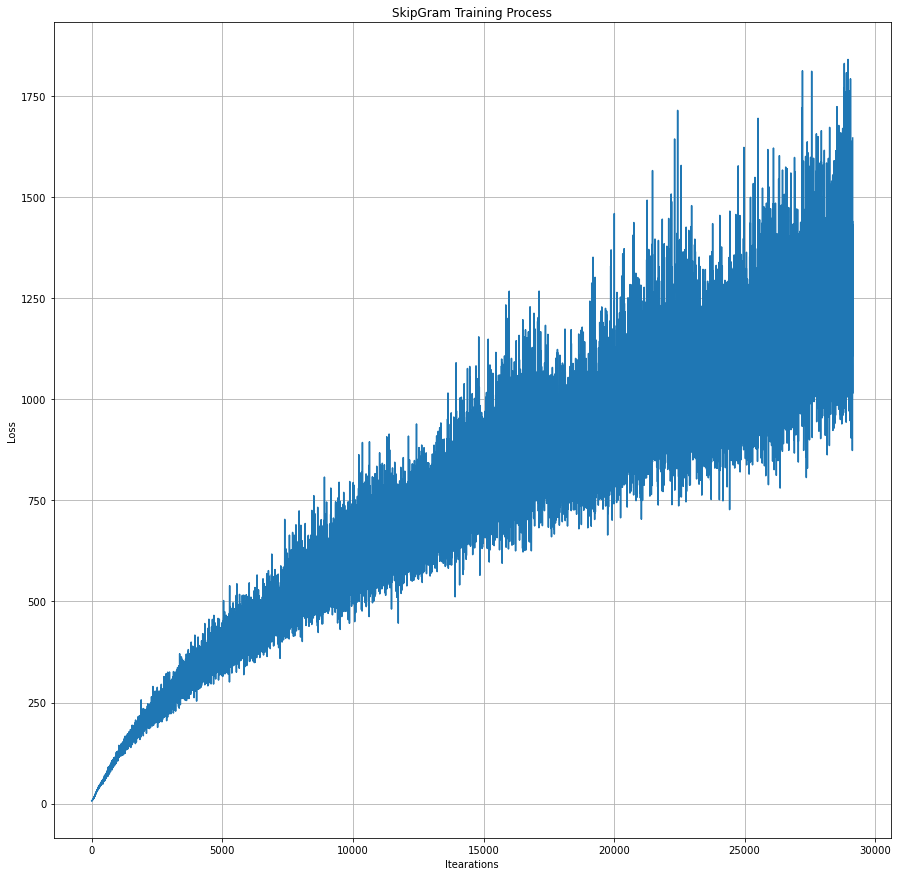

In [151]:
plt.title('SkipGram Training Process')
plt.xlabel('Itearations')
plt.ylabel('Loss')
plt.grid()
plt.plot(losses)

In [152]:
embedding_matrix = model.in_embedding.weight.detach()

In [153]:
cos_sim(embedding_matrix, word2index, 'сотрудник', 'сотрудница') #было так: 0.6814225912094116

0.36476558446884155

### Лучше не стало, так что 8 баллов и в Африке 8 баллов. Но график похож на тайфун, это удивительно?